## 赛题背景
资金流动性管理迄今仍是金融领域的经典问题。在互联网金融信贷业务中，单个资产标的金额小且复杂多样，对于拥有大量出借资金的金融机构或散户而言，资金管理压力巨大，精准地预测出借资金的流动情况变得尤为重要。本次比赛以互联网金融信贷业务为背景，以《现金流预测》为题，希望选手能够利用我们提供的数据，精准地预测资产组合在未来一段时间内每日的回款金额。

本赛题涵盖了信贷违约预测、现金流预测等金融领域常见问题，同时又是复杂的时序问题和多目标预测问题。希望参赛者利用聪明才智把互联网金融的数据优势转化为行业解决方案。

In [1]:
import pandas as pd
pd.set_option('display.max_columns', 100)  # 设置显示数据的最大列数，防止出现省略号…，导致数据显示不全
pd.set_option('expand_frame_repr', False)  # 当列太多时不自动换行

## 1. 样本集（train.csv和test.csv）
本赛题提供的样本集包含训练集（train.csv）和测试集（test.csv），它们的数据表结构基本一致，但测试集中不含实际还款信息。整个样本集共有约113万个标的和90万位借款用户，部分借款用户可能有多个标的记录，但在测试集时间范围内每位用户只有一条记录。

In [4]:
train = pd.read_csv('/Users/luoyonggui/Downloads/data2/train.csv')

In [5]:
train.head()

,user_id,listing_id,auditing_date,due_date,due_amt,repay_date,repay_amt
0,748147,3163926,2018-04-25,2018-05-25,72.1167,2018-05-25,72.1167
1,672952,3698760,2018-06-09,2018-07-09,258.7045,2018-07-08,258.7045
2,404196,2355665,2018-02-18,2018-03-18,307.9270,\N,\N
3,342769,1994522,2018-01-13,2018-02-13,252.9809,2018-02-13,252.9809
4,828139,3602352,2018-06-01,2018-07-01,107.6503,2018-06-25,107.6503


In [63]:
train.sample(10)

,user_id,listing_id,auditing_date,due_date,due_amt,repay_date,repay_amt
260994,369243,4597596,2018-10-06,2018-11-06,385.8409,2018-11-02,385.8409
926450,21303,4427955,2018-09-12,2018-10-12,770.5663,2018-10-12,770.5663
641120,26676,2988512,2018-04-11,2018-05-11,434.7686,2018-05-11,434.7686
394455,596778,3629842,2018-06-04,2018-07-04,324.2793,2018-06-29,324.2793
621538,287104,3149270,2018-04-24,2018-05-24,385.8409,2018-05-24,385.8409
531621,61254,4866877,2018-11-08,2018-12-08,102.1022,2018-12-07,102.1022
200049,730171,3572524,2018-05-29,2018-06-29,296.4799,2018-06-19,296.4799
840772,745579,3997428,2018-07-14,2018-08-14,81.2744,2018-08-06,81.2744
967329,370431,2324457,2018-02-14,2018-03-14,329.2168,\N,\N
774006,766517,4134277,2018-08-04,2018-09-04,241.5338,2018-09-01,241.5338


In [54]:
train.shape

(1000000, 7)

In [53]:
train[train['repay_amt']=='\\N'].shape

(117192, 7)

In [58]:
train[train['repay_amt']!='\\N'].shape

(882808, 7)

In [55]:
train1 = train[train['repay_amt']!='\\N']

In [64]:
train1['due_amt'].dtype

dtype('float64')

In [65]:
train1['repay_amt'].dtype

dtype('O')

In [67]:
# 应还款额和实际还款额都是相同的
train1[abs(train1['due_amt'] - train1['repay_amt'].astype(float))<0.01].shape

(882808, 7)

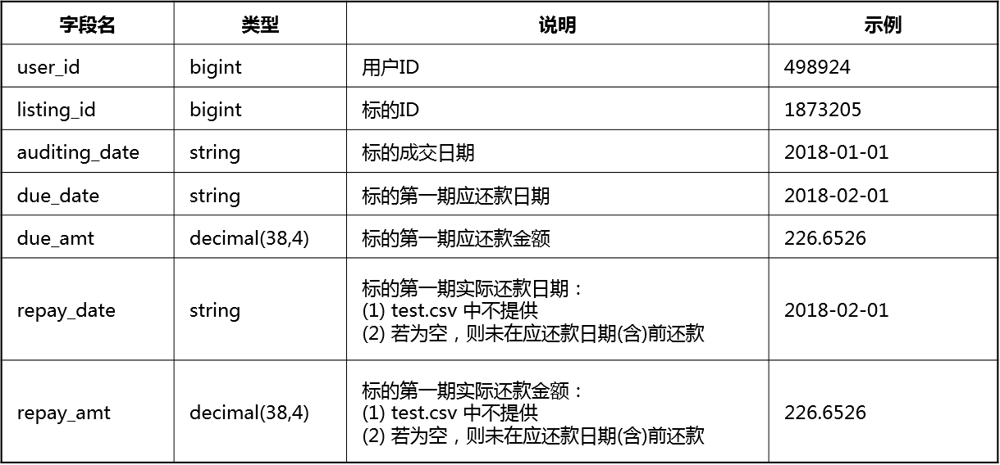

In [13]:
test = pd.read_csv('/Users/luoyonggui/Downloads/data2/test.csv')
test.head()

,user_id,listing_id,auditing_date,due_date,due_amt
0,498765,5431438,2019-03-12,2019-04-12,138.5903
1,34524,5443211,2019-03-15,2019-04-15,208.0805
2,821741,5461707,2019-03-22,2019-04-22,421.2097
3,263534,5472320,2019-03-26,2019-04-26,212.6537
4,238853,5459750,2019-03-21,2019-04-21,817.4593


In [ ]:
通过预测出每个user_id	listing_id的repay_date	repay_amt

首先通过user_id得到用户的按时还款概率，比如是0.9  平均还款时间为到期日前10
那么该user_id当期的还款额repay_amt为due_amt*0.9 repay_date为due_date-10

然后按照listing_id	repay_date进行groupby

In [14]:
submission = pd.read_csv('/Users/luoyonggui/Downloads/data2/submission.csv')
submission.head()

,listing_id,repay_amt,repay_date
0,5431438,4.3309,2019-03-12
1,5431438,4.3309,2019-03-13
2,5431438,4.3309,2019-03-14
3,5431438,4.3309,2019-03-15
4,5431438,4.3309,2019-03-16


## 2. 标的属性表（listing_info.csv）
标的属性表包含了本赛题涉及的所有标的，包括：(1) 样本集中所有标的；(2) 样本集中所有借款用户在过去一段时间内成交和还款的标的。标的属性信息在成交时确定，后续不再变更。

期限：指贷款月数，借款人需要在该期限内完成还款；

In [8]:
listing_info = pd.read_csv('/Users/luoyonggui/Downloads/data2/listing_info.csv')
listing_info.head()

,user_id,listing_id,auditing_date,term,rate,principal
0,316610,1556649,2017-11-26,9,7.6,4800
1,62002,1556633,2017-11-26,6,7.6,4000
2,192135,1556629,2017-11-26,12,8.0,8660
3,487382,1556628,2017-11-26,9,7.6,4780
4,235186,1556627,2017-11-26,9,7.6,1480


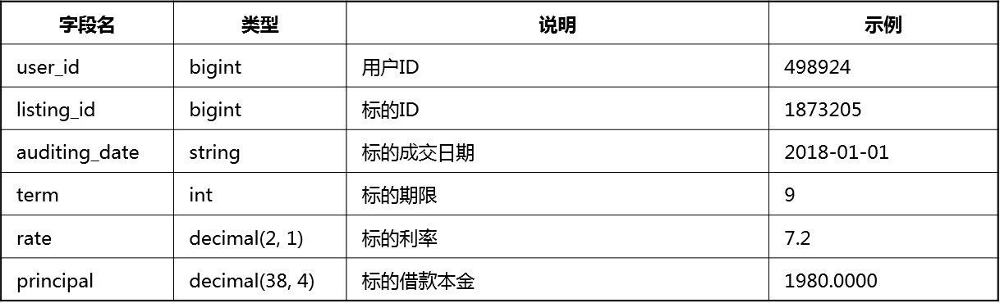

## 3. 借款用户基础信息表（user_info.csv）
借款用户基础信息表包含了本赛题涉及的所有用户，用户信息可能发生变更，表中同一用户可能存在多条数据。  
注：上述的数据都经过脱敏处理，地址类字段为编码数据，城市字段前三位为所属省份ID。

In [34]:
user_info = pd.read_csv('/Users/luoyonggui/Downloads/data2/user_info.csv', parse_dates=['reg_mon', 'insertdate'])
user_info.head()

,user_id,reg_mon,gender,age,cell_province,id_province,id_city,insertdate
0,483833,2017-04-01,男,19,c29,c26,c26241,2018-12-11
1,156772,2016-05-01,男,31,c11,c11,c11159,2018-02-13
2,173388,2016-05-01,男,34,c02,c02,c02182,2018-08-21
3,199107,2016-07-01,女,25,c09,c09,c09046,2018-06-05
4,122560,2016-03-01,男,23,c05,c05,c05193,2018-04-02


In [36]:
user_info.shape

(954209, 8)

In [37]:
user_info = user_info.sort_values('insertdate', ascending=False).drop_duplicates('user_id')

In [38]:
user_info.shape

(928195, 8)

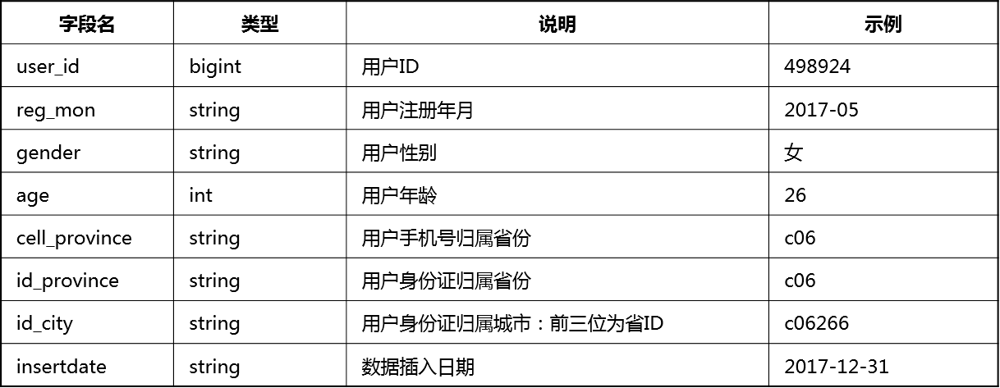

## 4. 用户画像标签列表（user_taglist.csv）
用户画像标签列表提供了用户的标签信息，用户标签可能发生变更，表中同一用户可能存在多条数据；若在表中无法查到用户标签信息，则表示该用户标签信息未知。

In [10]:
user_taglist = pd.read_csv('/Users/luoyonggui/Downloads/data2/user_taglist.csv')
user_taglist.head()

,user_id,taglist,insertdate
0,113401,4707|473|3498|4759|1654|298|2869|1164|212|1885...,2018-10-03
1,378358,751|2207|1100|2099|1832|1911|5347|2254|171|360...,2018-11-30
2,434838,877|3795|5628|70|2684|691|719|4228|631|1541|12...,2018-03-25
3,577061,2431|3242|340|1823|4020|4357|164|620|2168|1192...,2018-05-25
4,566753,3980|3125|1819|1333|1177|3972|621|5800|3632|16...,2018-12-02


In [44]:
user_taglist = user_taglist.sort_values('insertdate', ascending=False).drop_duplicates('user_id')

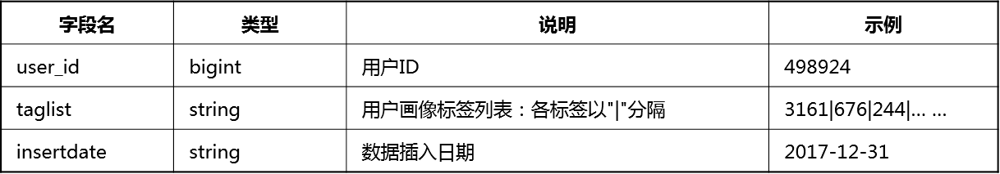

## 5. 借款用户操作行为日志表（user_behavior_logs.csv）
借款用户操作行为日志表提供了每位用户在过去一段时间内的操作行为日志数据，行为发生时间精确到秒级，相同用户的相同行为在同一秒内可能出现多条数据。

In [11]:
user_behavior_logs = pd.read_csv('/Users/luoyonggui/Downloads/data2/user_behavior_logs.csv')
user_behavior_logs.head()

,user_id,behavior_time,behavior_type
0,842439,2018-09-13 23:17:21,3
1,842439,2018-09-13 23:17:21,3
2,905214,2018-09-13 15:19:30,3
3,905214,2018-09-13 15:19:30,3
4,842439,2018-09-13 23:17:21,3


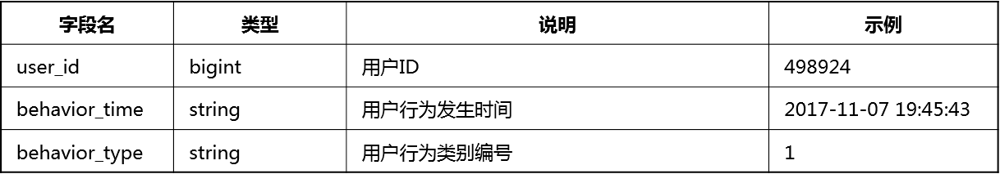

## 6. 用户还款日志表（user_repay_logs.csv）
借款用户还款日志表提供了每位用户在过去一段时期内的还款日志数据。

注1：上述的数据都经过脱敏处理，脱敏后的数据分布和数值大小关系与脱敏前基本一致；

注2：脱敏后，若还款时本期已逾期，repay_date(实际还款日期)字段默认值为“2200-01-01”，脱敏前实际还款日期一定早于用户最近一个新成交标的成交日期。

分期还款：指借款人根据标的期限将贷款分为多期偿还，应偿还的总本息被分摊到每期的还款中，每一期有约定的最晚还款日期和应还款金额；本次赛题中所涉及的标的都采用按月**等额本息分期还款**，即，借款人每月需要按相同的金额偿还本息；

#### 4. 赛题数据中同一标的同一期是否会分成多笔的还款？

不存在。本赛题的样本集和用户还款记录表中同一标的同一期最多只有一笔还款数据，并且在数据上体现为：若还款，实际还款金额等于应还款金额；若未还款，实际还款金额为空。

但选手提交的结果中，每个标的可有一条或多条预测结果，但必须满足提交规则，详见结果评估页。

可以得到两个信息： 用户的是否按时还款，用户提前几天还款

In [48]:
user_repay_logs = pd.read_csv('/Users/luoyonggui/Downloads/data2/user_repay_logs.csv', parse_dates=['due_date', 'repay_date'])
user_repay_logs.head()

,user_id,listing_id,order_id,due_date,due_amt,repay_date,repay_amt
0,748483,1858122,6,2018-06-29,528.6365,2018-06-20,528.6365
1,748483,1858122,4,2018-04-29,528.6365,2200-01-01,528.6365
2,748483,1858122,7,2018-07-29,528.6365,2018-06-20,528.6365
3,748483,1858122,5,2018-05-29,528.6365,2018-05-29,528.6365
4,748483,1858122,1,2018-01-29,528.6365,2018-01-28,528.6365


In [70]:
user_repay_logs['span'] = (user_repay_logs['due_date'] - user_repay_logs['repay_date']).dt.days

In [71]:
user_repay_logs['span'][:5]

0        9
1   -66356
2       39
3        0
4        1
Name: span, dtype: int64

In [75]:
g = user_repay_logs.groupby(['user_id'])

In [78]:
def t(x):
    return len(x[x>0])/len(x)

In [79]:
a = g['span'].agg(t)
a[:5]

user_id
1    1.000
2    1.000
3    0.225
4    1.000
5    1.000
Name: span, dtype: float64

In [102]:
a.name = 'prob'

In [103]:
print(a.name)

prob


In [83]:
s = pd.Series(range(10))

In [84]:
s.sum()

45

In [89]:
s[s>15].sum()

0

In [86]:
len(s[s>5])

4

In [90]:
import numpy as np

In [91]:
np.ceil(2.1)

3.0

In [98]:
def t(x):
    if len(x[x>=0]) == 0:
           return -1
    print(np.ceil(x[x>=0].sum()//len(x[x>=0])))
    return np.ceil(x[x>=0].sum()//len(x[x>=0]))

In [111]:
%%time
aa = g['span'].agg(t)
aa[:5]

126.0
229.0
0.0
3.0
1.0
139.0
0.0
14.0
6.0
17.0
0.0
22.0
4.0
67.0
0.0
10.0
0.0
0.0
13.0
0.0
0.0
59.0
0.0
14.0
32.0
0.0
10.0
4.0
2.0
6.0
0.0
2.0
0.0
0.0
0.0
0.0
18.0
0.0
0.0
0.0
1.0
0.0
19.0
155.0
11.0
0.0
0.0
0.0
33.0
2.0
0.0
5.0
0.0
1.0
11.0
0.0
1.0
1.0
103.0
1.0
8.0
0.0
1.0
0.0
7.0
0.0
2.0
21.0
6.0
0.0
1.0
5.0
2.0
0.0
74.0
2.0
0.0
0.0
3.0
1.0
43.0
0.0
28.0
70.0
65.0
0.0
0.0
6.0
90.0
5.0
3.0
0.0
51.0
0.0
6.0
0.0
6.0
7.0
8.0
2.0
0.0
81.0
4.0
6.0
2.0
0.0
29.0
3.0
6.0
1.0
13.0
74.0
26.0
0.0
1.0
0.0
1.0
5.0
5.0
9.0
0.0
0.0
0.0
1.0
56.0
6.0
1.0
42.0
0.0
0.0
32.0
0.0
1.0
1.0
34.0
0.0
0.0
1.0
0.0
81.0
7.0
14.0
1.0
0.0
1.0
0.0
1.0
31.0
2.0
59.0
0.0
0.0
0.0
0.0
0.0
3.0
50.0
11.0
1.0
39.0
2.0
0.0
0.0
9.0
2.0
0.0
0.0
5.0
21.0
0.0
11.0
1.0
2.0
0.0
0.0
2.0
27.0
0.0
142.0
2.0
7.0
0.0
0.0
0.0
123.0
2.0
5.0
5.0
3.0
0.0
0.0
13.0
6.0
159.0
6.0
0.0
59.0
0.0
7.0
7.0
119.0
0.0
1.0
1.0
0.0
7.0
0.0
0.0
0.0
36.0
0.0
1.0
9.0
1.0
45.0
62.0
4.0
23.0
11.0
30.0
8.0
50.0
1.0
6.0
2.0
13.0
196.0
3.0
3.0
11.0
1.0
3.0

0.0
51.0
1.0
2.0
48.0
5.0
1.0
10.0
7.0
1.0
1.0
0.0
1.0
35.0
6.0
0.0
1.0
1.0
1.0
1.0
13.0
1.0
3.0
0.0
0.0
0.0
0.0
20.0
0.0
5.0
141.0
0.0
0.0
15.0
5.0
0.0
14.0
0.0
0.0
0.0
35.0
10.0
3.0
1.0
2.0
0.0
1.0
6.0
0.0
51.0
0.0
0.0
1.0
0.0
0.0
65.0
62.0
11.0
1.0
4.0
3.0
1.0
0.0
0.0
3.0
0.0
30.0
50.0
0.0
0.0
3.0
11.0
0.0
1.0
60.0
1.0
0.0
0.0
17.0
115.0
0.0
60.0
0.0
1.0
1.0
18.0
88.0
20.0
1.0
5.0
61.0
0.0
0.0
0.0
3.0
2.0
0.0
5.0
6.0
284.0
27.0
82.0
28.0
0.0
0.0
0.0
3.0
0.0
2.0
1.0
9.0
1.0
56.0
22.0
51.0
1.0
12.0
67.0
19.0
38.0
0.0
0.0
3.0
2.0
68.0
1.0
74.0
0.0
63.0
0.0
22.0
80.0
1.0
81.0
2.0
1.0
0.0
76.0
0.0
0.0
36.0
0.0
3.0
17.0
2.0
2.0
15.0
93.0
0.0
0.0
1.0
54.0
19.0
0.0
88.0
0.0
113.0
10.0
1.0
0.0
41.0
0.0
7.0
0.0
14.0
1.0
101.0
8.0
0.0
9.0
8.0
3.0
19.0
9.0
5.0
2.0
2.0
15.0
1.0
18.0
130.0
0.0
3.0
0.0
8.0
0.0
3.0
36.0
0.0
19.0
1.0
0.0
4.0
88.0
6.0
33.0
10.0
0.0
0.0
5.0
7.0
27.0
27.0
5.0
0.0
3.0
40.0
0.0
2.0
4.0
4.0
0.0
72.0
0.0
1.0
0.0
4.0
61.0
13.0
10.0
0.0
1.0
1.0
0.0
54.0
14.0
0.0
1.0
0.0
0.0


12.0
11.0
1.0
0.0
0.0
30.0
0.0
3.0
8.0
7.0
13.0
165.0
0.0
83.0
3.0
0.0
27.0
2.0
0.0
36.0
0.0
0.0
25.0
0.0
3.0
5.0
42.0
0.0
31.0
1.0
66.0
26.0
20.0
0.0
2.0
5.0
0.0
2.0
54.0
1.0
0.0
16.0
0.0
0.0
1.0
1.0
0.0
5.0
155.0
0.0
0.0
115.0
3.0
61.0
0.0
183.0
6.0
58.0
1.0
33.0
1.0
2.0
6.0
1.0
83.0
0.0
4.0
72.0
0.0
13.0
2.0
39.0
0.0
3.0
27.0
1.0
122.0
175.0
0.0
16.0
53.0
0.0
0.0
2.0
0.0
41.0
0.0
2.0
49.0
0.0
13.0
1.0
0.0
98.0
6.0
121.0
7.0
1.0
81.0
0.0
0.0
2.0
120.0
33.0
0.0
25.0
1.0
5.0
0.0
158.0
20.0
4.0
0.0
4.0
2.0
108.0
48.0
10.0
5.0
0.0
1.0
1.0
1.0
77.0
136.0
60.0
0.0
0.0
3.0
116.0
0.0
12.0
0.0
11.0
2.0
2.0
1.0
88.0
1.0
0.0
107.0
64.0
3.0
37.0
0.0
16.0
120.0
15.0
2.0
14.0
106.0
0.0
2.0
80.0
3.0
4.0
0.0
0.0
10.0
0.0
7.0
0.0
15.0
8.0
0.0
2.0
0.0
0.0
3.0
39.0
0.0
25.0
6.0
2.0
0.0
0.0
39.0
26.0
0.0
0.0
5.0
0.0
0.0
72.0
1.0
54.0
0.0
5.0
0.0
2.0
30.0
95.0
0.0
26.0
1.0
67.0
4.0
0.0
76.0
0.0
3.0
3.0
0.0
0.0
6.0
7.0
2.0
2.0
79.0
0.0
0.0
0.0
0.0
33.0
0.0
30.0
95.0
115.0
0.0
92.0
6.0
6.0
0.0
28.0
3.0
8.0

0.0
7.0
0.0
6.0
0.0
0.0
3.0
1.0
2.0
2.0
10.0
164.0
10.0
0.0
13.0
3.0
20.0
3.0
0.0
120.0
25.0
1.0
1.0
7.0
11.0
0.0
0.0
25.0
2.0
0.0
21.0
1.0
33.0
27.0
1.0
7.0
18.0
0.0
25.0
3.0
4.0
1.0
1.0
2.0
21.0
6.0
0.0
1.0
1.0
1.0
0.0
1.0
2.0
8.0
10.0
0.0
2.0
0.0
17.0
0.0
0.0
15.0
20.0
0.0
165.0
3.0
22.0
11.0
2.0
0.0
14.0
29.0
0.0
2.0
34.0
4.0
5.0
15.0
2.0
0.0
0.0
63.0
0.0
34.0
0.0
1.0
0.0
4.0
0.0
5.0
0.0
0.0
1.0
0.0
55.0
0.0
1.0
0.0
17.0
6.0
17.0
2.0
0.0
6.0
0.0
0.0
0.0
20.0
0.0
8.0
5.0
0.0
50.0
0.0
0.0
26.0
0.0
7.0
14.0
51.0
0.0
0.0
77.0
0.0
34.0
114.0
8.0
1.0
0.0
1.0
4.0
0.0
16.0
11.0
72.0
1.0
4.0
37.0
0.0
0.0
2.0
1.0
32.0
23.0
11.0
1.0
1.0
209.0
0.0
151.0
5.0
0.0
0.0
1.0
0.0
3.0
2.0
0.0
2.0
2.0
2.0
0.0
1.0
4.0
0.0
6.0
0.0
0.0
7.0
0.0
96.0
0.0
2.0
6.0
0.0
0.0
4.0
7.0
9.0
1.0
8.0
63.0
7.0
84.0
0.0
0.0
4.0
114.0
7.0
95.0
1.0
0.0
0.0
177.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
9.0
0.0
3.0
0.0
0.0
0.0
32.0
0.0
1.0
0.0
0.0
0.0
60.0
1.0
1.0
41.0
27.0
6.0
7.0
3.0
1.0
0.0
18.0
1.0
22.0
169.0
0.0
0.0
36.0
55.0
4.0


15.0
0.0
74.0
144.0
51.0
34.0
0.0
3.0
0.0
21.0
4.0
4.0
0.0
60.0
0.0
9.0
0.0
1.0
6.0
41.0
0.0
0.0
0.0
49.0
0.0
1.0
28.0
21.0
102.0
5.0
0.0
1.0
0.0
155.0
0.0
39.0
3.0
3.0
3.0
1.0
16.0
2.0
0.0
0.0
0.0
0.0
2.0
35.0
89.0
10.0
2.0
3.0
277.0
0.0
1.0
0.0
41.0
7.0
1.0
2.0
4.0
25.0
24.0
7.0
0.0
73.0
0.0
10.0
0.0
1.0
0.0
15.0
98.0
1.0
10.0
0.0
30.0
7.0
18.0
1.0
5.0
20.0
44.0
20.0
2.0
0.0
1.0
146.0
17.0
8.0
83.0
0.0
0.0
146.0
5.0
1.0
8.0
8.0
41.0
0.0
25.0
1.0
1.0
1.0
1.0
6.0
0.0
17.0
5.0
82.0
3.0
1.0
4.0
1.0
26.0
0.0
0.0
57.0
12.0
1.0
66.0
65.0
0.0
0.0
1.0
0.0
1.0
0.0
0.0
0.0
0.0
15.0
6.0
0.0
0.0
0.0
0.0
2.0
3.0
1.0
1.0
1.0
3.0
7.0
55.0
99.0
0.0
18.0
0.0
92.0
6.0
0.0
37.0
4.0
0.0
0.0
1.0
1.0
0.0
14.0
4.0
0.0
58.0
112.0
7.0
1.0
78.0
0.0
14.0
43.0
0.0
0.0
1.0
9.0
90.0
18.0
6.0
12.0
17.0
15.0
20.0
72.0
3.0
5.0
2.0
1.0
3.0
39.0
1.0
0.0
250.0
27.0
4.0
1.0
0.0
5.0
15.0
1.0
54.0
62.0
0.0
0.0
161.0
5.0
6.0
0.0
0.0
0.0
1.0
6.0
49.0
0.0
107.0
0.0
0.0
0.0
20.0
0.0
0.0
0.0
2.0
0.0
59.0
2.0
27.0
0.0
5.0
0.0
0.

0.0
1.0
5.0
17.0
3.0
0.0
9.0
0.0
0.0
118.0
0.0
0.0
3.0
1.0
0.0
4.0
0.0
2.0
24.0
42.0
0.0
3.0
0.0
14.0
1.0
1.0
83.0
1.0
6.0
0.0
57.0
1.0
1.0
93.0
71.0
12.0
6.0
21.0
95.0
1.0
3.0
82.0
0.0
7.0
26.0
9.0
120.0
1.0
8.0
1.0
21.0
0.0
0.0
0.0
0.0
5.0
31.0
2.0
0.0
0.0
33.0
24.0
13.0
10.0
3.0
0.0
5.0
0.0
114.0
0.0
0.0
9.0
137.0
1.0
102.0
2.0
99.0
21.0
6.0
1.0
1.0
2.0
1.0
22.0
19.0
1.0
14.0
45.0
86.0
4.0
0.0
33.0
22.0
2.0
0.0
0.0
0.0
89.0
5.0
14.0
0.0
193.0
0.0
3.0
17.0
25.0
40.0
0.0
4.0
3.0
0.0
0.0
0.0
68.0
3.0
0.0
0.0
110.0
68.0
5.0
1.0
14.0
0.0
9.0
0.0
16.0
0.0
1.0
0.0
3.0
0.0
1.0
293.0
65.0
0.0
6.0
52.0
4.0
0.0
3.0
32.0
0.0
0.0
33.0
0.0
116.0
86.0
71.0
2.0
16.0
41.0
2.0
73.0
2.0
244.0
82.0
0.0
0.0
23.0
0.0
15.0
26.0
3.0
22.0
3.0
12.0
0.0
3.0
9.0
1.0
3.0
3.0
11.0
4.0
0.0
0.0
0.0
0.0
29.0
0.0
1.0
17.0
0.0
0.0
0.0
3.0
5.0
1.0
61.0
45.0
181.0
0.0
197.0
11.0
129.0
0.0
2.0
4.0
1.0
0.0
0.0
30.0
0.0
4.0
0.0
0.0
3.0
6.0
0.0
37.0
1.0
2.0
10.0
0.0
0.0
21.0
17.0
0.0
0.0
0.0
0.0
5.0
0.0
3.0
19.0
26.0
0.0
1

0.0
16.0
0.0
0.0
5.0
112.0
0.0
1.0
0.0
135.0
21.0
25.0
6.0
35.0
0.0
0.0
0.0
33.0
0.0
7.0
120.0
0.0
10.0
2.0
26.0
0.0
2.0
67.0
2.0
116.0
4.0
5.0
49.0
1.0
0.0
24.0
2.0
33.0
1.0
5.0
19.0
5.0
11.0
43.0
0.0
1.0
0.0
1.0
3.0
11.0
0.0
0.0
1.0
0.0
0.0
4.0
0.0
14.0
20.0
9.0
0.0
3.0
0.0
5.0
84.0
35.0
5.0
7.0
2.0
0.0
2.0
1.0
83.0
108.0
5.0
3.0
108.0
0.0
90.0
5.0
135.0
0.0
0.0
0.0
0.0
9.0
0.0
32.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
30.0
6.0
1.0
76.0
0.0
73.0
27.0
0.0
0.0
85.0
130.0
18.0
102.0
0.0
0.0
0.0
3.0
3.0
2.0
0.0
150.0
119.0
0.0
47.0
0.0
2.0
13.0
46.0
0.0
0.0
6.0
104.0
10.0
1.0
0.0
0.0
5.0
1.0
1.0
12.0
0.0
14.0
0.0
0.0
0.0
3.0
7.0
81.0
14.0
0.0
4.0
0.0
0.0
31.0
5.0
57.0
1.0
1.0
3.0
2.0
10.0
0.0
3.0
10.0
0.0
49.0
46.0
2.0
104.0
0.0
0.0
16.0
14.0
0.0
1.0
59.0
6.0
0.0
1.0
3.0
0.0
1.0
2.0
5.0
112.0
5.0
134.0
1.0
0.0
311.0
25.0
3.0
89.0
2.0
0.0
68.0
119.0
34.0
2.0
0.0
1.0
2.0
62.0
8.0
12.0
0.0
0.0
0.0
0.0
12.0
18.0
106.0
0.0
2.0
69.0
3.0
0.0
3.0
0.0
101.0
17.0
2.0
1.0
2.0
0.0
0.0
1.0
1.0
2.0
1.0
0.0
5.0

22.0
120.0
86.0
3.0
77.0
14.0
0.0
1.0
44.0
46.0
107.0
14.0
0.0
0.0
11.0
0.0
2.0
142.0
0.0
2.0
0.0
1.0
0.0
1.0
0.0
0.0
6.0
1.0
32.0
0.0
5.0
22.0
11.0
0.0
91.0
119.0
6.0
2.0
0.0
6.0
2.0
42.0
0.0
53.0
17.0
3.0
0.0
1.0
1.0
3.0
138.0
44.0
8.0
2.0
0.0
0.0
0.0
4.0
1.0
3.0
0.0
0.0
17.0
2.0
1.0
9.0
38.0
0.0
1.0
9.0
37.0
3.0
2.0
0.0
0.0
1.0
0.0
2.0
1.0
18.0
2.0
90.0
35.0
2.0
6.0
83.0
4.0
2.0
1.0
56.0
0.0
8.0
0.0
0.0
1.0
11.0
5.0
0.0
59.0
6.0
20.0
311.0
160.0
0.0
1.0
46.0
1.0
0.0
14.0
1.0
9.0
2.0
0.0
0.0
18.0
7.0
0.0
7.0
0.0
9.0
13.0
1.0
2.0
0.0
1.0
23.0
0.0
43.0
9.0
0.0
8.0
11.0
0.0
61.0
0.0
125.0
32.0
0.0
1.0
1.0
2.0
0.0
44.0
5.0
0.0
42.0
58.0
1.0
3.0
0.0
0.0
0.0
0.0
76.0
0.0
0.0
108.0
3.0
42.0
2.0
47.0
0.0
0.0
0.0
51.0
0.0
0.0
1.0
16.0
3.0
0.0
21.0
7.0
0.0
4.0
0.0
6.0
107.0
4.0
0.0
7.0
7.0
0.0
0.0
6.0
39.0
118.0
4.0
0.0
1.0
2.0
0.0
26.0
1.0
15.0
1.0
77.0
0.0
1.0
0.0
4.0
13.0
0.0
3.0
31.0
0.0
0.0
0.0
0.0
1.0
0.0
3.0
5.0
7.0
1.0
0.0
0.0
0.0
0.0
19.0
20.0
1.0
34.0
1.0
0.0
0.0
2.0
48.0
17.0
11.0
1

0.0
8.0
6.0
1.0
110.0
1.0
0.0
2.0
1.0
25.0
2.0
0.0
0.0
0.0
0.0
0.0
18.0
1.0
0.0
47.0
20.0
2.0
8.0
12.0
2.0
4.0
0.0
0.0
1.0
1.0
1.0
18.0
15.0
0.0
14.0
0.0
4.0
40.0
0.0
4.0
0.0
0.0
54.0
6.0
0.0
0.0
22.0
1.0
8.0
1.0
4.0
118.0
15.0
20.0
1.0
2.0
25.0
1.0
10.0
1.0
1.0
1.0
90.0
0.0
0.0
4.0
1.0
25.0
0.0
23.0
5.0
75.0
0.0
0.0
1.0
2.0
0.0
0.0
8.0
11.0
16.0
3.0
0.0
0.0
2.0
1.0
0.0
0.0
1.0
178.0
0.0
43.0
0.0
1.0
2.0
7.0
1.0
10.0
2.0
2.0
74.0
2.0
17.0
61.0
0.0
34.0
10.0
31.0
12.0
2.0
0.0
6.0
7.0
27.0
0.0
0.0
114.0
3.0
0.0
2.0
76.0
27.0
3.0
8.0
92.0
4.0
0.0
0.0
21.0
1.0
1.0
0.0
0.0
22.0
37.0
51.0
0.0
43.0
143.0
3.0
32.0
3.0
0.0
1.0
0.0
0.0
0.0
1.0
0.0
0.0
12.0
0.0
0.0
0.0
1.0
15.0
33.0
12.0
0.0
0.0
3.0
1.0
10.0
8.0
26.0
4.0
3.0
0.0
52.0
0.0
14.0
1.0
0.0
1.0
0.0
5.0
2.0
12.0
114.0
3.0
1.0
0.0
9.0
7.0
0.0
0.0
0.0
42.0
17.0
0.0
11.0
6.0
14.0
3.0
2.0
17.0
0.0
0.0
31.0
31.0
45.0
0.0
0.0
3.0
1.0
6.0
0.0
0.0
0.0
4.0
59.0
1.0
9.0
0.0
0.0
0.0
2.0
0.0
2.0
1.0
6.0
0.0
2.0
42.0
17.0
0.0
0.0
1.0
3.0
1.0
89.0
0.0

97.0
4.0
0.0
2.0
0.0
126.0
0.0
0.0
0.0
0.0
0.0
0.0
14.0
54.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
30.0
12.0
0.0
5.0
3.0
1.0
0.0
0.0
0.0
1.0
0.0
55.0
38.0
9.0
97.0
0.0
0.0
0.0
30.0
0.0
1.0
7.0
15.0
2.0
30.0
42.0
0.0
3.0
0.0
4.0
45.0
0.0
0.0
54.0
86.0
0.0
0.0
10.0
21.0
1.0
0.0
7.0
8.0
126.0
1.0
3.0
5.0
12.0
6.0
9.0
2.0
0.0
0.0
7.0
18.0
0.0
47.0
17.0
30.0
2.0
0.0
0.0
24.0
0.0
0.0
3.0
96.0
44.0
0.0
180.0
53.0
1.0
0.0
99.0
19.0
173.0
0.0
0.0
11.0
0.0
1.0
0.0
0.0
79.0
0.0
0.0
1.0
3.0
92.0
64.0
21.0
0.0
0.0
5.0
7.0
6.0
17.0
51.0
1.0
17.0
12.0
1.0
0.0
4.0
1.0
45.0
2.0
1.0
0.0
1.0
1.0
0.0
4.0
0.0
0.0
79.0
0.0
0.0
1.0
6.0
3.0
0.0
78.0
53.0
15.0
15.0
79.0
0.0
0.0
25.0
0.0
112.0
60.0
0.0
67.0
0.0
13.0
0.0
2.0
0.0
0.0
198.0
0.0
41.0
0.0
49.0
20.0
0.0
8.0
144.0
34.0
0.0
0.0
180.0
0.0
14.0
58.0
3.0
3.0
0.0
12.0
26.0
0.0
5.0
34.0
224.0
3.0
22.0
0.0
3.0
0.0
30.0
2.0
81.0
30.0
0.0
132.0
1.0
40.0
0.0
0.0
0.0
1.0
1.0
32.0
1.0
23.0
1.0
3.0
0.0
4.0
0.0
47.0
78.0
3.0
0.0
114.0
0.0
0.0
1.0
8.0
4.0
132.0
27.0
2.0
2.0
1

7.0
5.0
0.0
2.0
0.0
67.0
9.0
0.0
32.0
54.0
0.0
30.0
0.0
0.0
6.0
17.0
28.0
2.0
0.0
3.0
0.0
0.0
4.0
1.0
54.0
0.0
0.0
157.0
0.0
32.0
92.0
21.0
0.0
20.0
3.0
20.0
0.0
17.0
1.0
4.0
3.0
0.0
15.0
0.0
2.0
0.0
4.0
68.0
0.0
0.0
59.0
1.0
165.0
0.0
1.0
23.0
0.0
195.0
22.0
51.0
15.0
22.0
0.0
1.0
29.0
124.0
6.0
14.0
1.0
140.0
48.0
2.0
14.0
0.0
0.0
30.0
0.0
0.0
8.0
1.0
2.0
57.0
2.0
0.0
166.0
0.0
6.0
2.0
0.0
178.0
0.0
0.0
59.0
1.0
0.0
17.0
16.0
0.0
0.0
1.0
0.0
0.0
0.0
18.0
56.0
61.0
0.0
2.0
29.0
3.0
10.0
5.0
1.0
2.0
2.0
5.0
3.0
0.0
40.0
21.0
1.0
24.0
2.0
2.0
16.0
38.0
4.0
8.0
0.0
2.0
174.0
12.0
14.0
56.0
2.0
109.0
7.0
12.0
4.0
11.0
5.0
5.0
45.0
12.0
1.0
1.0
22.0
1.0
0.0
44.0
95.0
44.0
51.0
74.0
4.0
3.0
22.0
0.0
2.0
2.0
0.0
4.0
4.0
26.0
15.0
0.0
0.0
3.0
11.0
0.0
15.0
3.0
0.0
0.0
23.0
0.0
2.0
0.0
18.0
83.0
2.0
0.0
1.0
0.0
0.0
0.0
0.0
2.0
3.0
0.0
32.0
5.0
0.0
41.0
45.0
4.0
2.0
0.0
10.0
2.0
0.0
0.0
0.0
1.0
23.0
0.0
14.0
1.0
13.0
20.0
99.0
192.0
5.0
85.0
1.0
13.0
21.0
232.0
0.0
9.0
0.0
0.0
0.0
61.0
0.0
0.0


25.0
33.0
42.0
2.0
64.0
14.0
8.0
8.0
0.0
2.0
8.0
1.0
2.0
15.0
20.0
0.0
10.0
65.0
39.0
0.0
0.0
28.0
66.0
1.0
179.0
1.0
1.0
39.0
28.0
4.0
0.0
162.0
9.0
28.0
11.0
115.0
0.0
14.0
0.0
0.0
47.0
0.0
0.0
0.0
7.0
0.0
12.0
0.0
26.0
90.0
0.0
165.0
0.0
0.0
5.0
0.0
2.0
6.0
16.0
9.0
30.0
1.0
3.0
0.0
1.0
8.0
0.0
5.0
4.0
3.0
9.0
0.0
0.0
2.0
2.0
0.0
16.0
0.0
0.0
0.0
0.0
1.0
3.0
0.0
60.0
2.0
0.0
29.0
7.0
43.0
17.0
40.0
84.0
1.0
78.0
2.0
4.0
24.0
1.0
2.0
0.0
0.0
195.0
2.0
103.0
15.0
29.0
0.0
2.0
0.0
16.0
0.0
3.0
10.0
63.0
14.0
10.0
2.0
2.0
9.0
2.0
5.0
0.0
4.0
11.0
0.0
0.0
0.0
0.0
5.0
0.0
9.0
5.0
57.0
8.0
9.0
0.0
0.0
0.0
1.0
8.0
51.0
16.0
0.0
1.0
10.0
0.0
10.0
16.0
0.0
0.0
32.0
10.0
0.0
2.0
28.0
1.0
1.0
5.0
24.0
18.0
2.0
1.0
0.0
2.0
5.0
96.0
3.0
1.0
0.0
0.0
0.0
0.0
62.0
7.0
0.0
0.0
6.0
94.0
12.0
2.0
15.0
31.0
20.0
0.0
3.0
3.0
2.0
2.0
0.0
15.0
0.0
2.0
13.0
122.0
0.0
112.0
0.0
1.0
52.0
41.0
8.0
39.0
0.0
6.0
0.0
2.0
0.0
135.0
1.0
2.0
72.0
1.0
0.0
30.0
171.0
205.0
50.0
2.0
1.0
103.0
17.0
0.0
0.0
0.0
0.0
12.0


0.0
7.0
13.0
0.0
57.0
0.0
0.0
5.0
21.0
116.0
18.0
7.0
2.0
7.0
1.0
78.0
4.0
3.0
0.0
2.0
3.0
0.0
0.0
54.0
13.0
5.0
1.0
0.0
5.0
0.0
14.0
10.0
2.0
25.0
23.0
0.0
27.0
5.0
0.0
119.0
1.0
15.0
21.0
18.0
1.0
39.0
8.0
127.0
1.0
18.0
9.0
0.0
3.0
30.0
28.0
164.0
5.0
0.0
14.0
46.0
61.0
4.0
9.0
0.0
2.0
0.0
1.0
7.0
6.0
82.0
1.0
0.0
3.0
5.0
14.0
5.0
0.0
0.0
5.0
1.0
107.0
3.0
0.0
0.0
134.0
50.0
31.0
0.0
1.0
2.0
10.0
5.0
19.0
115.0
6.0
1.0
5.0
4.0
0.0
55.0
1.0
0.0
16.0
0.0
3.0
0.0
3.0
3.0
0.0
0.0
0.0
10.0
33.0
0.0
19.0
31.0
20.0
19.0
197.0
0.0
4.0
29.0
42.0
7.0
0.0
30.0
1.0
0.0
6.0
1.0
0.0
56.0
4.0
3.0
84.0
5.0
16.0
1.0
11.0
151.0
24.0
1.0
8.0
0.0
2.0
7.0
56.0
0.0
3.0
1.0
1.0
9.0
17.0
18.0
109.0
1.0
22.0
1.0
13.0
0.0
10.0
10.0
30.0
140.0
121.0
0.0
2.0
1.0
0.0
2.0
2.0
36.0
0.0
59.0
0.0
1.0
0.0
0.0
0.0
4.0
0.0
237.0
0.0
0.0
0.0
26.0
0.0
3.0
2.0
1.0
61.0
56.0
42.0
100.0
0.0
0.0
0.0
2.0
24.0
0.0
75.0
8.0
12.0
0.0
22.0
0.0
3.0
3.0
0.0
15.0
5.0
0.0
14.0
13.0
3.0
18.0
1.0
0.0
0.0
1.0
3.0
33.0
3.0
13.0
9.0
1.0


0.0
174.0
0.0
2.0
69.0
0.0
0.0
0.0
2.0
0.0
41.0
0.0
1.0
0.0
1.0
0.0
10.0
2.0
26.0
39.0
10.0
11.0
2.0
1.0
0.0
2.0
6.0
0.0
0.0
1.0
5.0
8.0
56.0
44.0
19.0
6.0
57.0
0.0
1.0
12.0
0.0
7.0
1.0
37.0
4.0
12.0
0.0
0.0
14.0
0.0
0.0
2.0
63.0
3.0
0.0
2.0
9.0
1.0
6.0
42.0
3.0
2.0
4.0
43.0
25.0
22.0
0.0
1.0
16.0
146.0
4.0
8.0
0.0
4.0
0.0
1.0
197.0
0.0
8.0
2.0
0.0
5.0
7.0
0.0
0.0
51.0
167.0
19.0
7.0
11.0
39.0
0.0
3.0
23.0
6.0
17.0
6.0
48.0
12.0
0.0
0.0
1.0
125.0
12.0
3.0
30.0
2.0
22.0
0.0
4.0
0.0
0.0
49.0
0.0
8.0
0.0
56.0
72.0
1.0
0.0
4.0
2.0
0.0
0.0
0.0
35.0
11.0
3.0
2.0
0.0
1.0
0.0
27.0
24.0
13.0
1.0
0.0
64.0
13.0
13.0
3.0
0.0
15.0
4.0
31.0
29.0
108.0
5.0
0.0
2.0
11.0
0.0
0.0
1.0
122.0
0.0
131.0
0.0
9.0
27.0
0.0
25.0
23.0
5.0
51.0
17.0
1.0
92.0
1.0
6.0
13.0
0.0
1.0
0.0
7.0
91.0
1.0
55.0
17.0
88.0
0.0
103.0
29.0
4.0
0.0
2.0
36.0
8.0
23.0
97.0
2.0
24.0
6.0
0.0
0.0
54.0
8.0
10.0
285.0
0.0
0.0
0.0
0.0
0.0
8.0
130.0
2.0
4.0
1.0
44.0
0.0
26.0
1.0
74.0
40.0
0.0
0.0
3.0
0.0
0.0
9.0
2.0
14.0
0.0
6.0
1.0
8.0


19.0
0.0
2.0
14.0
18.0
1.0
6.0
26.0
6.0
1.0
28.0
1.0
10.0
0.0
2.0
14.0
0.0
27.0
0.0
3.0
6.0
0.0
85.0
1.0
1.0
0.0
8.0
14.0
87.0
3.0
8.0
0.0
1.0
9.0
61.0
0.0
1.0
7.0
2.0
0.0
7.0
0.0
0.0
3.0
28.0
0.0
9.0
0.0
25.0
18.0
2.0
75.0
23.0
3.0
4.0
17.0
0.0
120.0
9.0
0.0
30.0
5.0
153.0
1.0
0.0
1.0
4.0
10.0
6.0
0.0
1.0
0.0
1.0
112.0
2.0
48.0
51.0
163.0
1.0
162.0
0.0
2.0
3.0
5.0
2.0
56.0
0.0
44.0
1.0
1.0
2.0
5.0
3.0
0.0
2.0
1.0
56.0
0.0
0.0
76.0
13.0
4.0
0.0
5.0
98.0
0.0
0.0
0.0
1.0
3.0
5.0
1.0
0.0
17.0
33.0
0.0
18.0
6.0
0.0
0.0
1.0
158.0
5.0
0.0
0.0
29.0
27.0
0.0
1.0
0.0
0.0
0.0
26.0
0.0
0.0
0.0
82.0
53.0
13.0
0.0
4.0
6.0
5.0
0.0
0.0
68.0
13.0
2.0
4.0
9.0
0.0
107.0
0.0
6.0
0.0
0.0
1.0
108.0
33.0
2.0
87.0
2.0
0.0
296.0
9.0
0.0
10.0
78.0
2.0
1.0
3.0
139.0
0.0
35.0
0.0
21.0
36.0
3.0
10.0
0.0
0.0
5.0
1.0
15.0
2.0
22.0
0.0
8.0
1.0
23.0
8.0
0.0
0.0
2.0
1.0
0.0
5.0
95.0
0.0
0.0
3.0
0.0
1.0
9.0
0.0
110.0
40.0
0.0
84.0
2.0
20.0
5.0
3.0
11.0
1.0
7.0
5.0
4.0
1.0
0.0
2.0
0.0
0.0
4.0
2.0
0.0
6.0
11.0
73.0
0.0
0

0.0
0.0
5.0
118.0
37.0
101.0
1.0
62.0
0.0
0.0
25.0
1.0
51.0
5.0
3.0
56.0
1.0
0.0
0.0
5.0
0.0
22.0
52.0
125.0
0.0
1.0
64.0
5.0
0.0
2.0
1.0
14.0
5.0
4.0
94.0
0.0
0.0
11.0
118.0
0.0
0.0
93.0
54.0
3.0
1.0
0.0
6.0
156.0
0.0
45.0
4.0
5.0
0.0
0.0
19.0
1.0
11.0
23.0
1.0
1.0
38.0
35.0
0.0
2.0
12.0
6.0
0.0
1.0
0.0
2.0
0.0
81.0
67.0
12.0
0.0
196.0
1.0
35.0
33.0
0.0
6.0
5.0
44.0
24.0
1.0
0.0
6.0
233.0
44.0
4.0
2.0
0.0
0.0
0.0
0.0
1.0
27.0
2.0
14.0
17.0
3.0
1.0
62.0
54.0
3.0
0.0
11.0
93.0
103.0
0.0
0.0
5.0
0.0
1.0
0.0
1.0
14.0
129.0
0.0
33.0
6.0
62.0
4.0
0.0
1.0
19.0
14.0
48.0
61.0
3.0
4.0
0.0
0.0
15.0
93.0
0.0
0.0
4.0
18.0
0.0
35.0
0.0
1.0
0.0
18.0
3.0
4.0
45.0
1.0
6.0
0.0
16.0
0.0
1.0
30.0
3.0
15.0
53.0
2.0
1.0
1.0
13.0
55.0
0.0
6.0
0.0
133.0
19.0
0.0
3.0
0.0
5.0
72.0
0.0
1.0
0.0
1.0
0.0
1.0
104.0
0.0
12.0
0.0
0.0
11.0
3.0
0.0
0.0
5.0
0.0
123.0
98.0
9.0
1.0
69.0
3.0
0.0
16.0
3.0
49.0
1.0
5.0
0.0
34.0
13.0
29.0
0.0
0.0
2.0
0.0
30.0
0.0
1.0
0.0
17.0
5.0
0.0
24.0
20.0
11.0
3.0
0.0
5.0
41.0
1.0
30.0


0.0
1.0
0.0
0.0
29.0
64.0
21.0
0.0
15.0
0.0
29.0
73.0
79.0
1.0
5.0
0.0
0.0
1.0
162.0
4.0
6.0
15.0
4.0
0.0
1.0
0.0
1.0
17.0
18.0
1.0
0.0
190.0
4.0
5.0
40.0
0.0
3.0
5.0
0.0
158.0
51.0
0.0
2.0
1.0
0.0
0.0
1.0
4.0
0.0
2.0
0.0
0.0
1.0
76.0
1.0
0.0
13.0
4.0
29.0
91.0
0.0
3.0
17.0
19.0
45.0
0.0
2.0
2.0
0.0
18.0
27.0
6.0
11.0
0.0
0.0
1.0
0.0
32.0
36.0
12.0
15.0
1.0
9.0
8.0
73.0
99.0
14.0
1.0
3.0
2.0
20.0
0.0
5.0
3.0
10.0
1.0
5.0
0.0
41.0
12.0
0.0
30.0
0.0
49.0
0.0
85.0
0.0
1.0
42.0
30.0
36.0
12.0
0.0
1.0
0.0
6.0
0.0
0.0
54.0
7.0
1.0
0.0
61.0
0.0
6.0
0.0
0.0
10.0
27.0
0.0
1.0
90.0
1.0
1.0
58.0
0.0
1.0
82.0
2.0
3.0
9.0
79.0
50.0
4.0
0.0
0.0
6.0
0.0
1.0
108.0
32.0
68.0
0.0
1.0
122.0
2.0
19.0
8.0
2.0
0.0
0.0
0.0
1.0
129.0
1.0
18.0
2.0
16.0
0.0
1.0
0.0
0.0
31.0
1.0
0.0
27.0
13.0
47.0
9.0
21.0
16.0
1.0
0.0
0.0
2.0
12.0
0.0
2.0
17.0
81.0
1.0
9.0
0.0
0.0
1.0
68.0
1.0
0.0
0.0
2.0
2.0
39.0
65.0
2.0
4.0
0.0
132.0
0.0
0.0
5.0
3.0
0.0
11.0
72.0
4.0
13.0
113.0
2.0
0.0
27.0
70.0
0.0
0.0
12.0
51.0
10.0
0.0
0.

41.0
4.0
1.0
23.0
23.0
0.0
1.0
4.0
0.0
1.0
6.0
2.0
121.0
4.0
3.0
64.0
9.0
2.0
1.0
10.0
6.0
74.0
7.0
2.0
0.0
75.0
30.0
0.0
11.0
24.0
1.0
0.0
0.0
15.0
61.0
10.0
47.0
0.0
0.0
0.0
0.0
3.0
0.0
99.0
1.0
14.0
17.0
0.0
1.0
1.0
0.0
58.0
6.0
2.0
0.0
2.0
5.0
0.0
31.0
0.0
178.0
0.0
5.0
7.0
1.0
6.0
76.0
2.0
3.0
16.0
0.0
30.0
63.0
106.0
0.0
196.0
30.0
3.0
57.0
0.0
0.0
18.0
1.0
0.0
2.0
1.0
0.0
0.0
5.0
9.0
2.0
2.0
11.0
0.0
1.0
2.0
0.0
8.0
148.0
0.0
5.0
12.0
6.0
5.0
7.0
0.0
166.0
0.0
45.0
1.0
0.0
18.0
6.0
2.0
0.0
8.0
1.0
2.0
18.0
27.0
15.0
5.0
18.0
91.0
0.0
0.0
24.0
0.0
3.0
60.0
0.0
0.0
108.0
8.0
0.0
0.0
19.0
1.0
29.0
0.0
0.0
56.0
1.0
41.0
0.0
3.0
5.0
91.0
0.0
32.0
7.0
3.0
0.0
10.0
175.0
2.0
57.0
0.0
4.0
51.0
0.0
5.0
20.0
1.0
17.0
0.0
0.0
1.0
1.0
0.0
2.0
1.0
55.0
12.0
6.0
17.0
81.0
0.0
3.0
19.0
0.0
11.0
10.0
70.0
33.0
1.0
8.0
7.0
9.0
14.0
39.0
23.0
3.0
2.0
0.0
11.0
19.0
8.0
7.0
1.0
0.0
0.0
3.0
0.0
0.0
108.0
10.0
0.0
2.0
0.0
66.0
0.0
2.0
19.0
91.0
0.0
9.0
30.0
0.0
1.0
73.0
6.0
5.0
0.0
44.0
1.0
83.0
66.0

17.0
48.0
32.0
0.0
1.0
0.0
67.0
0.0
0.0
42.0
0.0
0.0
0.0
2.0
5.0
49.0
0.0
1.0
1.0
21.0
64.0
165.0
107.0
0.0
53.0
72.0
0.0
167.0
40.0
2.0
0.0
100.0
11.0
5.0
4.0
87.0
0.0
13.0
274.0
63.0
3.0
0.0
30.0
0.0
16.0
19.0
0.0
43.0
27.0
0.0
59.0
85.0
9.0
67.0
9.0
3.0
5.0
4.0
0.0
1.0
3.0
0.0
0.0
61.0
119.0
1.0
36.0
88.0
22.0
0.0
39.0
0.0
58.0
1.0
107.0
2.0
5.0
0.0
56.0
46.0
7.0
201.0
0.0
3.0
17.0
53.0
2.0
0.0
1.0
5.0
13.0
2.0
1.0
0.0
85.0
0.0
0.0
1.0
83.0
38.0
1.0
0.0
13.0
8.0
8.0
1.0
154.0
1.0
0.0
3.0
0.0
0.0
0.0
6.0
0.0
21.0
8.0
14.0
0.0
0.0
0.0
3.0
2.0
0.0
146.0
47.0
0.0
10.0
14.0
63.0
3.0
17.0
0.0
19.0
12.0
25.0
16.0
88.0
11.0
38.0
1.0
64.0
3.0
18.0
4.0
2.0
15.0
79.0
0.0
1.0
1.0
0.0
29.0
6.0
79.0
2.0
1.0
0.0
52.0
0.0
10.0
0.0
2.0
6.0
27.0
4.0
0.0
0.0
46.0
0.0
76.0
14.0
0.0
20.0
11.0
0.0
101.0
33.0
96.0
24.0
0.0
14.0
2.0
4.0
11.0
95.0
89.0
3.0
72.0
1.0
4.0
5.0
3.0
2.0
2.0
0.0
1.0
0.0
0.0
1.0
1.0
43.0
0.0
2.0
0.0
5.0
15.0
13.0
21.0
112.0
0.0
19.0
7.0
2.0
30.0
17.0
0.0
3.0
0.0
5.0
126.0
0.0
7.0
0

3.0
8.0
5.0
101.0
54.0
5.0
28.0
47.0
0.0
0.0
42.0
3.0
3.0
5.0
0.0
0.0
0.0
3.0
1.0
0.0
1.0
0.0
0.0
11.0
0.0
0.0
0.0
9.0
43.0
42.0
0.0
4.0
1.0
6.0
5.0
0.0
0.0
11.0
8.0
0.0
6.0
55.0
0.0
44.0
16.0
3.0
0.0
26.0
0.0
22.0
0.0
0.0
1.0
25.0
6.0
0.0
0.0
0.0
0.0
2.0
99.0
67.0
3.0
22.0
2.0
4.0
52.0
103.0
171.0
28.0
26.0
3.0
69.0
11.0
1.0
1.0
0.0
0.0
0.0
3.0
2.0
0.0
91.0
147.0
3.0
4.0
77.0
1.0
106.0
35.0
1.0
0.0
0.0
5.0
0.0
1.0
11.0
9.0
35.0
117.0
2.0
5.0
2.0
0.0
0.0
0.0
72.0
20.0
1.0
0.0
0.0
114.0
0.0
1.0
0.0
0.0
20.0
28.0
1.0
118.0
39.0
3.0
0.0
70.0
3.0
0.0
0.0
7.0
19.0
42.0
2.0
0.0
134.0
1.0
2.0
41.0
0.0
1.0
0.0
147.0
1.0
10.0
1.0
1.0
0.0
3.0
35.0
52.0
0.0
16.0
0.0
0.0
20.0
28.0
0.0
0.0
24.0
1.0
0.0
23.0
24.0
2.0
2.0
2.0
1.0
0.0
10.0
31.0
0.0
4.0
3.0
31.0
15.0
12.0
0.0
0.0
5.0
4.0
1.0
10.0
0.0
0.0
1.0
8.0
3.0
18.0
0.0
2.0
7.0
0.0
2.0
40.0
1.0
4.0
6.0
22.0
0.0
37.0
1.0
92.0
15.0
0.0
0.0
4.0
0.0
1.0
61.0
102.0
9.0
0.0
10.0
118.0
19.0
21.0
14.0
0.0
23.0
20.0
0.0
0.0
0.0
123.0
1.0
2.0
0.0
2.0
0.0
0.

96.0
14.0
0.0
10.0
0.0
4.0
0.0
0.0
0.0
0.0
0.0
1.0
22.0
18.0
23.0
45.0
31.0
1.0
47.0
80.0
56.0
6.0
71.0
26.0
2.0
1.0
0.0
1.0
0.0
1.0
0.0
10.0
3.0
1.0
4.0
0.0
0.0
6.0
0.0
6.0
2.0
1.0
1.0
0.0
8.0
6.0
5.0
0.0
21.0
4.0
0.0
76.0
5.0
2.0
13.0
9.0
9.0
69.0
3.0
19.0
0.0
59.0
3.0
30.0
0.0
0.0
65.0
0.0
71.0
135.0
114.0
0.0
0.0
2.0
2.0
73.0
56.0
1.0
22.0
0.0
1.0
93.0
6.0
89.0
2.0
4.0
63.0
1.0
7.0
0.0
2.0
0.0
53.0
3.0
0.0
112.0
10.0
1.0
3.0
9.0
1.0
28.0
0.0
6.0
0.0
6.0
80.0
10.0
40.0
0.0
0.0
50.0
6.0
23.0
2.0
0.0
2.0
22.0
86.0
3.0
4.0
85.0
72.0
1.0
102.0
8.0
56.0
1.0
107.0
0.0
8.0
0.0
25.0
2.0
5.0
7.0
192.0
37.0
3.0
0.0
9.0
6.0
0.0
42.0
1.0
1.0
7.0
1.0
26.0
0.0
0.0
12.0
81.0
0.0
0.0
1.0
18.0
0.0
8.0
1.0
12.0
0.0
0.0
51.0
7.0
2.0
0.0
1.0
0.0
24.0
3.0
129.0
111.0
1.0
0.0
32.0
0.0
22.0
23.0
133.0
0.0
54.0
5.0
0.0
1.0
5.0
0.0
1.0
39.0
18.0
20.0
10.0
0.0
5.0
2.0
3.0
1.0
14.0
20.0
27.0
19.0
17.0
108.0
0.0
0.0
4.0
5.0
0.0
3.0
1.0
19.0
0.0
21.0
85.0
1.0
4.0
2.0
2.0
12.0
9.0
0.0
6.0
33.0
0.0
1.0
7.0
0.0
4.

2.0
32.0
5.0
2.0
1.0
0.0
1.0
80.0
0.0
0.0
2.0
178.0
152.0
1.0
32.0
2.0
104.0
3.0
0.0
0.0
0.0
4.0
0.0
117.0
1.0
9.0
0.0
5.0
7.0
0.0
0.0
0.0
108.0
3.0
0.0
55.0
1.0
17.0
13.0
21.0
24.0
22.0
2.0
110.0
54.0
2.0
11.0
0.0
7.0
23.0
2.0
127.0
0.0
93.0
0.0
0.0
0.0
3.0
33.0
5.0
0.0
9.0
23.0
12.0
8.0
13.0
2.0
0.0
0.0
0.0
0.0
0.0
123.0
1.0
5.0
9.0
2.0
74.0
0.0
95.0
0.0
8.0
0.0
163.0
69.0
0.0
2.0
0.0
0.0
0.0
4.0
1.0
50.0
9.0
12.0
137.0
0.0
12.0
0.0
3.0
53.0
66.0
76.0
0.0
6.0
0.0
0.0
6.0
0.0
0.0
78.0
0.0
4.0
0.0
16.0
29.0
122.0
1.0
16.0
0.0
0.0
34.0
1.0
1.0
0.0
0.0
121.0
196.0
54.0
106.0
0.0
0.0
5.0
0.0
2.0
38.0
13.0
1.0
1.0
2.0
50.0
3.0
6.0
3.0
16.0
28.0
0.0
41.0
138.0
1.0
1.0
5.0
5.0
78.0
1.0
0.0
1.0
0.0
1.0
0.0
5.0
0.0
0.0
0.0
28.0
102.0
10.0
67.0
32.0
30.0
0.0
8.0
0.0
0.0
3.0
15.0
0.0
1.0
1.0
31.0
1.0
3.0
19.0
81.0
1.0
0.0
39.0
4.0
36.0
49.0
0.0
60.0
0.0
54.0
12.0
3.0
0.0
0.0
0.0
53.0
41.0
0.0
1.0
0.0
0.0
2.0
5.0
0.0
4.0
6.0
0.0
0.0
4.0
0.0
1.0
2.0
0.0
3.0
0.0
0.0
46.0
0.0
2.0
0.0
1.0
2.0
0.0
0.0

9.0
9.0
83.0
0.0
1.0
0.0
1.0
1.0
2.0
0.0
2.0
0.0
0.0
32.0
10.0
12.0
6.0
10.0
1.0
9.0
0.0
43.0
57.0
80.0
39.0
0.0
60.0
0.0
8.0
24.0
46.0
33.0
135.0
18.0
0.0
63.0
57.0
185.0
0.0
91.0
7.0
2.0
35.0
113.0
2.0
1.0
2.0
0.0
0.0
0.0
25.0
0.0
15.0
74.0
31.0
1.0
46.0
8.0
3.0
62.0
52.0
1.0
41.0
34.0
0.0
0.0
0.0
0.0
97.0
0.0
3.0
54.0
0.0
4.0
0.0
24.0
213.0
0.0
1.0
0.0
44.0
52.0
0.0
0.0
0.0
68.0
0.0
43.0
0.0
14.0
12.0
1.0
0.0
103.0
5.0
1.0
0.0
1.0
10.0
0.0
79.0
15.0
7.0
1.0
0.0
15.0
4.0
1.0
2.0
4.0
1.0
43.0
0.0
0.0
1.0
44.0
5.0
1.0
9.0
5.0
5.0
26.0
0.0
0.0
0.0
4.0
0.0
1.0
1.0
4.0
0.0
79.0
1.0
16.0
0.0
0.0
0.0
90.0
0.0
56.0
0.0
6.0
1.0
28.0
3.0
66.0
50.0
2.0
16.0
27.0
85.0
0.0
0.0
0.0
2.0
6.0
1.0
105.0
14.0
18.0
3.0
3.0
2.0
96.0
21.0
0.0
8.0
1.0
0.0
11.0
2.0
13.0
56.0
14.0
2.0
0.0
0.0
6.0
25.0
1.0
0.0
52.0
0.0
23.0
55.0
1.0
0.0
6.0
0.0
40.0
2.0
1.0
0.0
2.0
0.0
86.0
98.0
15.0
2.0
0.0
0.0
26.0
37.0
0.0
14.0
37.0
80.0
20.0
13.0
75.0
65.0
0.0
14.0
1.0
0.0
0.0
0.0
14.0
2.0
52.0
1.0
41.0
0.0
146.0
49.0
7.0

82.0
180.0
0.0
2.0
0.0
60.0
0.0
0.0
6.0
3.0
14.0
21.0
17.0
72.0
11.0
0.0
0.0
121.0
0.0
14.0
13.0
5.0
28.0
0.0
31.0
3.0
110.0
8.0
4.0
1.0
0.0
7.0
6.0
36.0
5.0
81.0
0.0
59.0
0.0
0.0
2.0
8.0
0.0
4.0
1.0
4.0
0.0
1.0
94.0
0.0
2.0
50.0
42.0
0.0
19.0
0.0
0.0
2.0
1.0
16.0
0.0
3.0
0.0
0.0
17.0
1.0
2.0
13.0
30.0
0.0
0.0
0.0
2.0
1.0
1.0
0.0
26.0
3.0
0.0
66.0
11.0
45.0
4.0
5.0
28.0
0.0
2.0
17.0
126.0
3.0
1.0
6.0
3.0
4.0
1.0
0.0
168.0
0.0
2.0
1.0
1.0
146.0
9.0
1.0
17.0
163.0
0.0
7.0
0.0
87.0
29.0
0.0
0.0
1.0
3.0
58.0
1.0
83.0
1.0
108.0
0.0
0.0
3.0
21.0
1.0
25.0
9.0
0.0
30.0
0.0
5.0
14.0
0.0
3.0
0.0
94.0
0.0
1.0
86.0
1.0
106.0
5.0
2.0
62.0
0.0
1.0
93.0
64.0
2.0
5.0
2.0
0.0
16.0
33.0
1.0
1.0
0.0
0.0
2.0
53.0
0.0
70.0
0.0
105.0
2.0
5.0
5.0
0.0
14.0
0.0
6.0
39.0
1.0
101.0
102.0
5.0
5.0
2.0
7.0
5.0
22.0
7.0
0.0
5.0
0.0
62.0
0.0
25.0
21.0
1.0
29.0
1.0
197.0
0.0
1.0
1.0
0.0
83.0
1.0
7.0
91.0
8.0
6.0
1.0
0.0
0.0
78.0
0.0
0.0
23.0
36.0
5.0
32.0
1.0
1.0
19.0
0.0
1.0
46.0
0.0
44.0
107.0
0.0
0.0
92.0
0.0
0.0
0

53.0
182.0
3.0
87.0
9.0
0.0
6.0
0.0
0.0
143.0
1.0
5.0
2.0
0.0
1.0
1.0
57.0
0.0
1.0
23.0
16.0
5.0
0.0
0.0
2.0
26.0
20.0
2.0
1.0
11.0
0.0
0.0
5.0
0.0
3.0
0.0
102.0
1.0
5.0
0.0
2.0
43.0
25.0
18.0
0.0
2.0
0.0
37.0
13.0
3.0
18.0
3.0
1.0
1.0
114.0
40.0
45.0
1.0
5.0
0.0
12.0
0.0
0.0
5.0
1.0
42.0
0.0
2.0
7.0
82.0
0.0
6.0
10.0
3.0
0.0
0.0
17.0
6.0
0.0
1.0
0.0
5.0
0.0
0.0
22.0
2.0
6.0
4.0
0.0
0.0
54.0
1.0
119.0
2.0
0.0
11.0
0.0
1.0
0.0
53.0
0.0
3.0
23.0
4.0
6.0
0.0
155.0
1.0
0.0
0.0
34.0
5.0
3.0
60.0
57.0
91.0
2.0
1.0
0.0
45.0
1.0
36.0
0.0
19.0
120.0
2.0
3.0
3.0
101.0
210.0
7.0
6.0
0.0
0.0
3.0
69.0
2.0
2.0
18.0
77.0
73.0
3.0
0.0
21.0
7.0
1.0
23.0
1.0
30.0
46.0
108.0
161.0
0.0
1.0
14.0
41.0
0.0
14.0
4.0
0.0
1.0
2.0
0.0
97.0
5.0
227.0
100.0
0.0
25.0
0.0
2.0
0.0
0.0
1.0
1.0
195.0
0.0
15.0
2.0
1.0
3.0
12.0
1.0
158.0
16.0
4.0
4.0
0.0
1.0
18.0
5.0
23.0
0.0
0.0
94.0
0.0
106.0
122.0
3.0
0.0
93.0
10.0
0.0
65.0
2.0
3.0
13.0
18.0
6.0
168.0
139.0
0.0
0.0
10.0
32.0
0.0
0.0
19.0
14.0
3.0
13.0
2.0
71.0
5.0
1.0

16.0
0.0
4.0
0.0
9.0
114.0
64.0
1.0
5.0
0.0
32.0
9.0
0.0
1.0
17.0
0.0
73.0
10.0
52.0
1.0
20.0
0.0
3.0
1.0
30.0
6.0
0.0
2.0
2.0
0.0
0.0
118.0
2.0
6.0
24.0
0.0
4.0
0.0
42.0
15.0
0.0
6.0
54.0
2.0
1.0
2.0
1.0
36.0
0.0
6.0
0.0
0.0
0.0
95.0
2.0
0.0
72.0
0.0
50.0
0.0
2.0
1.0
2.0
0.0
45.0
11.0
0.0
39.0
2.0
63.0
10.0
111.0
0.0
0.0
63.0
25.0
3.0
0.0
8.0
113.0
49.0
1.0
1.0
2.0
3.0
20.0
41.0
26.0
0.0
1.0
1.0
11.0
3.0
0.0
1.0
11.0
0.0
0.0
28.0
0.0
0.0
0.0
20.0
0.0
5.0
1.0
0.0
0.0
2.0
3.0
4.0
116.0
33.0
0.0
12.0
2.0
6.0
0.0
6.0
0.0
2.0
47.0
0.0
3.0
29.0
33.0
0.0
2.0
10.0
0.0
0.0
2.0
20.0
0.0
35.0
0.0
71.0
6.0
0.0
114.0
19.0
42.0
53.0
1.0
8.0
3.0
0.0
34.0
5.0
2.0
71.0
69.0
15.0
4.0
6.0
107.0
0.0
18.0
0.0
0.0
6.0
10.0
14.0
3.0
0.0
17.0
0.0
3.0
0.0
15.0
7.0
0.0
1.0
2.0
0.0
1.0
3.0
38.0
47.0
0.0
0.0
21.0
1.0
2.0
13.0
114.0
57.0
6.0
17.0
60.0
0.0
0.0
2.0
0.0
3.0
36.0
0.0
7.0
1.0
142.0
54.0
0.0
2.0
5.0
2.0
0.0
0.0
2.0
0.0
0.0
0.0
120.0
15.0
0.0
3.0
8.0
2.0
0.0
31.0
0.0
15.0
6.0
1.0
36.0
11.0
3.0
9.0
37.0


18.0
12.0
93.0
0.0
0.0
0.0
28.0
25.0
0.0
0.0
1.0
0.0
4.0
1.0
18.0
0.0
6.0
36.0
0.0
0.0
44.0
4.0
98.0
25.0
9.0
93.0
12.0
0.0
1.0
1.0
28.0
1.0
67.0
3.0
107.0
29.0
7.0
5.0
1.0
0.0
15.0
0.0
1.0
33.0
0.0
6.0
0.0
0.0
0.0
0.0
127.0
6.0
2.0
40.0
14.0
11.0
3.0
116.0
1.0
22.0
6.0
0.0
1.0
31.0
5.0
0.0
65.0
0.0
0.0
2.0
56.0
0.0
0.0
1.0
0.0
0.0
3.0
2.0
0.0
0.0
1.0
1.0
13.0
0.0
1.0
7.0
2.0
0.0
0.0
0.0
99.0
7.0
73.0
0.0
2.0
0.0
76.0
7.0
99.0
2.0
0.0
0.0
3.0
7.0
2.0
2.0
0.0
0.0
1.0
22.0
11.0
0.0
6.0
109.0
0.0
17.0
46.0
6.0
16.0
0.0
28.0
0.0
0.0
0.0
1.0
3.0
21.0
0.0
1.0
25.0
11.0
102.0
11.0
75.0
0.0
0.0
0.0
0.0
1.0
89.0
29.0
79.0
8.0
8.0
2.0
1.0
3.0
1.0
0.0
0.0
10.0
0.0
11.0
26.0
65.0
7.0
18.0
0.0
0.0
2.0
20.0
9.0
5.0
149.0
108.0
0.0
112.0
3.0
0.0
8.0
1.0
54.0
3.0
0.0
50.0
1.0
40.0
0.0
4.0
30.0
19.0
1.0
0.0
1.0
6.0
14.0
0.0
1.0
1.0
1.0
34.0
1.0
12.0
0.0
19.0
0.0
0.0
21.0
1.0
15.0
2.0
11.0
46.0
0.0
149.0
132.0
46.0
31.0
0.0
0.0
0.0
6.0
0.0
7.0
0.0
2.0
0.0
2.0
1.0
1.0
0.0
1.0
24.0
4.0
0.0
0.0
0.0
2.0
10.

19.0
11.0
4.0
20.0
19.0
4.0
42.0
2.0
2.0
158.0
0.0
7.0
1.0
0.0
69.0
0.0
71.0
23.0
6.0
16.0
14.0
8.0
5.0
77.0
2.0
21.0
4.0
101.0
0.0
0.0
23.0
1.0
52.0
1.0
228.0
3.0
25.0
25.0
8.0
0.0
13.0
64.0
10.0
0.0
0.0
1.0
5.0
0.0
33.0
17.0
75.0
0.0
1.0
2.0
123.0
0.0
0.0
0.0
10.0
3.0
1.0
10.0
0.0
0.0
30.0
1.0
0.0
25.0
162.0
0.0
2.0
44.0
31.0
2.0
62.0
13.0
15.0
2.0
6.0
2.0
5.0
3.0
0.0
22.0
0.0
26.0
2.0
8.0
0.0
0.0
136.0
0.0
0.0
5.0
30.0
4.0
0.0
2.0
0.0
8.0
4.0
0.0
6.0
163.0
0.0
54.0
1.0
46.0
36.0
15.0
44.0
31.0
206.0
0.0
2.0
0.0
0.0
0.0
0.0
19.0
0.0
16.0
0.0
2.0
0.0
4.0
0.0
2.0
5.0
0.0
1.0
0.0
0.0
3.0
0.0
74.0
8.0
71.0
1.0
0.0
7.0
0.0
6.0
1.0
2.0
0.0
0.0
109.0
3.0
16.0
0.0
7.0
0.0
1.0
0.0
15.0
30.0
0.0
68.0
117.0
10.0
56.0
0.0
27.0
2.0
2.0
31.0
0.0
4.0
78.0
13.0
0.0
0.0
0.0
11.0
77.0
15.0
0.0
4.0
4.0
1.0
28.0
0.0
0.0
0.0
1.0
94.0
1.0
2.0
0.0
187.0
63.0
18.0
0.0
0.0
0.0
11.0
290.0
0.0
21.0
5.0
144.0
3.0
2.0
0.0
43.0
0.0
11.0
1.0
0.0
143.0
0.0
2.0
117.0
2.0
234.0
26.0
0.0
3.0
0.0
204.0
0.0
0.0
5.0
9.0


29.0
24.0
0.0
106.0
30.0
0.0
4.0
0.0
1.0
2.0
0.0
3.0
99.0
7.0
129.0
0.0
0.0
7.0
0.0
42.0
0.0
0.0
19.0
6.0
1.0
7.0
44.0
20.0
0.0
0.0
0.0
2.0
15.0
11.0
0.0
0.0
0.0
0.0
2.0
43.0
9.0
0.0
0.0
4.0
0.0
1.0
11.0
3.0
3.0
13.0
0.0
14.0
1.0
19.0
97.0
0.0
72.0
2.0
76.0
1.0
91.0
21.0
1.0
4.0
36.0
28.0
0.0
29.0
12.0
153.0
18.0
94.0
0.0
0.0
17.0
0.0
0.0
0.0
1.0
0.0
11.0
47.0
2.0
0.0
77.0
0.0
0.0
1.0
60.0
1.0
28.0
69.0
35.0
0.0
34.0
1.0
4.0
6.0
63.0
0.0
181.0
3.0
1.0
8.0
17.0
0.0
0.0
0.0
24.0
2.0
15.0
1.0
1.0
89.0
4.0
135.0
39.0
1.0
0.0
1.0
0.0
101.0
10.0
4.0
3.0
31.0
2.0
27.0
0.0
45.0
0.0
0.0
0.0
0.0
3.0
0.0
2.0
0.0
0.0
27.0
87.0
0.0
0.0
22.0
0.0
2.0
1.0
3.0
1.0
54.0
3.0
54.0
106.0
1.0
2.0
26.0
80.0
1.0
0.0
1.0
4.0
103.0
20.0
0.0
40.0
4.0
166.0
113.0
67.0
61.0
8.0
80.0
0.0
2.0
127.0
0.0
90.0
0.0
0.0
0.0
0.0
3.0
1.0
5.0
22.0
23.0
11.0
6.0
0.0
4.0
0.0
20.0
105.0
3.0
4.0
16.0
91.0
17.0
0.0
7.0
101.0
3.0
0.0
4.0
44.0
9.0
38.0
0.0
29.0
0.0
4.0
2.0
113.0
0.0
124.0
136.0
23.0
14.0
1.0
3.0
39.0
0.0
52.0
0.0


0.0
9.0
23.0
2.0
0.0
16.0
3.0
0.0
12.0
10.0
2.0
1.0
1.0
2.0
17.0
0.0
0.0
7.0
0.0
0.0
5.0
21.0
0.0
0.0
80.0
5.0
1.0
1.0
0.0
1.0
131.0
194.0
0.0
51.0
0.0
0.0
98.0
1.0
0.0
39.0
1.0
37.0
0.0
0.0
18.0
4.0
0.0
8.0
2.0
10.0
0.0
0.0
68.0
3.0
7.0
1.0
0.0
0.0
2.0
1.0
1.0
35.0
65.0
0.0
0.0
109.0
6.0
4.0
0.0
0.0
5.0
0.0
32.0
84.0
8.0
0.0
0.0
0.0
0.0
0.0
6.0
2.0
93.0
5.0
4.0
39.0
0.0
0.0
0.0
10.0
5.0
1.0
18.0
0.0
10.0
0.0
1.0
4.0
64.0
34.0
0.0
34.0
0.0
0.0
4.0
17.0
0.0
3.0
31.0
0.0
0.0
4.0
0.0
3.0
1.0
0.0
3.0
36.0
0.0
7.0
8.0
16.0
8.0
1.0
8.0
17.0
0.0
0.0
0.0
2.0
14.0
12.0
8.0
1.0
6.0
17.0
1.0
0.0
7.0
0.0
3.0
1.0
0.0
1.0
58.0
0.0
1.0
74.0
3.0
88.0
8.0
26.0
24.0
7.0
0.0
0.0
70.0
0.0
118.0
0.0
0.0
119.0
4.0
5.0
1.0
31.0
0.0
8.0
0.0
0.0
0.0
0.0
12.0
78.0
12.0
26.0
53.0
41.0
2.0
0.0
2.0
0.0
29.0
41.0
22.0
2.0
14.0
0.0
0.0
171.0
2.0
76.0
138.0
3.0
0.0
57.0
38.0
17.0
10.0
10.0
5.0
0.0
0.0
4.0
0.0
1.0
5.0
21.0
18.0
26.0
33.0
0.0
13.0
15.0
0.0
9.0
1.0
6.0
0.0
1.0
1.0
90.0
44.0
74.0
0.0
16.0
0.0
103.0
1.0
0

6.0
18.0
8.0
0.0
74.0
156.0
7.0
6.0
37.0
16.0
0.0
21.0
39.0
10.0
0.0
1.0
86.0
0.0
0.0
0.0
1.0
131.0
1.0
7.0
0.0
2.0
177.0
1.0
5.0
0.0
19.0
0.0
0.0
1.0
3.0
1.0
3.0
3.0
0.0
45.0
0.0
0.0
0.0
0.0
0.0
0.0
76.0
66.0
0.0
0.0
210.0
51.0
0.0
16.0
72.0
1.0
0.0
0.0
5.0
0.0
179.0
13.0
7.0
84.0
1.0
0.0
0.0
33.0
3.0
0.0
1.0
0.0
0.0
209.0
90.0
1.0
195.0
15.0
60.0
28.0
12.0
0.0
1.0
61.0
1.0
41.0
14.0
252.0
5.0
1.0
2.0
107.0
2.0
1.0
3.0
36.0
3.0
3.0
1.0
123.0
5.0
9.0
7.0
2.0
0.0
18.0
13.0
64.0
0.0
0.0
19.0
87.0
1.0
10.0
95.0
3.0
50.0
0.0
0.0
1.0
13.0
80.0
7.0
9.0
22.0
130.0
12.0
3.0
31.0
1.0
16.0
2.0
0.0
0.0
0.0
21.0
0.0
1.0
0.0
0.0
0.0
20.0
0.0
17.0
5.0
5.0
1.0
0.0
0.0
0.0
5.0
35.0
4.0
7.0
0.0
29.0
0.0
0.0
0.0
0.0
41.0
1.0
1.0
0.0
50.0
7.0
2.0
1.0
0.0
16.0
0.0
5.0
0.0
2.0
0.0
0.0
3.0
1.0
1.0
3.0
0.0
6.0
0.0
1.0
0.0
1.0
3.0
0.0
1.0
2.0
2.0
38.0
25.0
0.0
0.0
0.0
0.0
134.0
42.0
7.0
1.0
193.0
41.0
81.0
1.0
5.0
3.0
32.0
0.0
0.0
21.0
22.0
1.0
39.0
3.0
70.0
2.0
0.0
89.0
1.0
8.0
0.0
1.0
3.0
0.0
0.0
0.0
4.0
0.

0.0
0.0
0.0
1.0
8.0
10.0
74.0
1.0
100.0
0.0
11.0
22.0
13.0
2.0
106.0
1.0
12.0
0.0
1.0
6.0
1.0
8.0
2.0
0.0
1.0
0.0
0.0
0.0
44.0
22.0
1.0
30.0
0.0
0.0
0.0
6.0
2.0
3.0
86.0
0.0
2.0
61.0
52.0
57.0
1.0
3.0
10.0
0.0
121.0
59.0
0.0
3.0
10.0
2.0
0.0
14.0
99.0
0.0
22.0
2.0
10.0
0.0
15.0
25.0
122.0
0.0
95.0
0.0
51.0
0.0
1.0
3.0
1.0
67.0
0.0
6.0
92.0
4.0
1.0
95.0
1.0
115.0
0.0
0.0
2.0
11.0
103.0
23.0
50.0
2.0
0.0
147.0
66.0
71.0
3.0
0.0
1.0
92.0
3.0
36.0
18.0
65.0
0.0
0.0
87.0
2.0
0.0
97.0
4.0
34.0
0.0
3.0
0.0
46.0
0.0
50.0
0.0
3.0
4.0
0.0
12.0
11.0
0.0
0.0
3.0
4.0
3.0
1.0
0.0
3.0
23.0
23.0
0.0
0.0
1.0
11.0
73.0
4.0
0.0
7.0
21.0
3.0
0.0
5.0
27.0
0.0
0.0
60.0
0.0
0.0
37.0
7.0
0.0
78.0
1.0
1.0
22.0
1.0
3.0
0.0
168.0
54.0
62.0
0.0
1.0
94.0
21.0
1.0
65.0
13.0
0.0
0.0
0.0
10.0
1.0
0.0
1.0
13.0
23.0
10.0
18.0
10.0
40.0
0.0
36.0
1.0
27.0
147.0
2.0
1.0
1.0
0.0
1.0
0.0
74.0
0.0
0.0
91.0
2.0
0.0
32.0
0.0
91.0
0.0
20.0
0.0
2.0
0.0
9.0
4.0
25.0
0.0
5.0
1.0
0.0
15.0
2.0
0.0
0.0
0.0
4.0
1.0
0.0
5.0
7.0
15.0
58

48.0
45.0
2.0
0.0
1.0
26.0
6.0
0.0
0.0
35.0
7.0
6.0
0.0
0.0
0.0
17.0
0.0
10.0
7.0
42.0
0.0
7.0
1.0
3.0
0.0
35.0
5.0
4.0
5.0
53.0
7.0
87.0
52.0
0.0
0.0
1.0
1.0
3.0
11.0
0.0
60.0
0.0
20.0
0.0
4.0
1.0
0.0
0.0
37.0
0.0
2.0
0.0
0.0
14.0
0.0
15.0
2.0
1.0
0.0
15.0
0.0
0.0
51.0
2.0
3.0
45.0
0.0
26.0
11.0
26.0
9.0
5.0
3.0
15.0
168.0
0.0
47.0
0.0
0.0
0.0
6.0
0.0
2.0
49.0
14.0
8.0
1.0
9.0
1.0
7.0
50.0
11.0
57.0
37.0
0.0
5.0
1.0
130.0
2.0
2.0
0.0
10.0
4.0
72.0
0.0
0.0
5.0
1.0
11.0
54.0
11.0
0.0
170.0
129.0
2.0
4.0
0.0
0.0
1.0
0.0
2.0
0.0
1.0
4.0
2.0
0.0
10.0
41.0
3.0
1.0
81.0
0.0
0.0
0.0
0.0
20.0
68.0
1.0
0.0
0.0
25.0
19.0
0.0
15.0
0.0
22.0
4.0
2.0
0.0
4.0
1.0
3.0
1.0
0.0
4.0
0.0
26.0
0.0
0.0
107.0
3.0
87.0
0.0
6.0
0.0
4.0
0.0
1.0
0.0
18.0
83.0
40.0
13.0
9.0
1.0
0.0
4.0
1.0
1.0
4.0
195.0
194.0
5.0
20.0
7.0
11.0
0.0
21.0
7.0
6.0
0.0
1.0
18.0
181.0
3.0
0.0
7.0
0.0
36.0
5.0
0.0
3.0
0.0
80.0
0.0
124.0
0.0
0.0
0.0
114.0
89.0
0.0
12.0
0.0
44.0
0.0
2.0
19.0
5.0
5.0
98.0
4.0
1.0
5.0
71.0
13.0
4.0
13.0
2.0

31.0
60.0
0.0
5.0
60.0
1.0
3.0
4.0
3.0
4.0
105.0
0.0
0.0
2.0
0.0
167.0
26.0
207.0
0.0
5.0
1.0
12.0
162.0
8.0
0.0
0.0
2.0
0.0
3.0
8.0
8.0
0.0
0.0
0.0
8.0
7.0
0.0
4.0
5.0
3.0
12.0
10.0
50.0
3.0
1.0
1.0
1.0
0.0
0.0
8.0
2.0
45.0
4.0
0.0
87.0
1.0
66.0
1.0
106.0
2.0
0.0
0.0
107.0
0.0
361.0
0.0
7.0
1.0
47.0
1.0
116.0
0.0
1.0
3.0
1.0
88.0
1.0
1.0
15.0
4.0
62.0
0.0
8.0
74.0
7.0
0.0
0.0
3.0
75.0
0.0
9.0
0.0
1.0
0.0
0.0
3.0
105.0
0.0
0.0
48.0
15.0
1.0
99.0
0.0
2.0
0.0
0.0
0.0
23.0
48.0
11.0
27.0
0.0
89.0
2.0
14.0
93.0
48.0
8.0
0.0
18.0
25.0
1.0
7.0
3.0
0.0
13.0
122.0
2.0
3.0
10.0
67.0
3.0
3.0
0.0
1.0
0.0
2.0
0.0
121.0
11.0
0.0
0.0
4.0
4.0
0.0
10.0
60.0
54.0
28.0
2.0
6.0
0.0
142.0
103.0
6.0
22.0
1.0
49.0
3.0
36.0
45.0
25.0
89.0
0.0
31.0
14.0
35.0
7.0
12.0
0.0
9.0
9.0
3.0
20.0
14.0
1.0
1.0
2.0
109.0
89.0
0.0
3.0
5.0
42.0
9.0
22.0
220.0
32.0
105.0
25.0
0.0
0.0
0.0
3.0
0.0
1.0
16.0
0.0
0.0
7.0
71.0
68.0
21.0
27.0
61.0
2.0
8.0
18.0
16.0
38.0
0.0
2.0
9.0
3.0
0.0
50.0
4.0
0.0
3.0
0.0
0.0
7.0
0.0
1.0
148

1.0
0.0
0.0
0.0
1.0
1.0
0.0
0.0
177.0
7.0
3.0
9.0
271.0
3.0
0.0
0.0
76.0
0.0
0.0
9.0
0.0
0.0
0.0
2.0
90.0
3.0
100.0
0.0
12.0
46.0
0.0
0.0
2.0
0.0
0.0
1.0
35.0
0.0
2.0
126.0
1.0
139.0
43.0
230.0
0.0
1.0
19.0
24.0
70.0
101.0
1.0
4.0
0.0
1.0
7.0
1.0
120.0
5.0
0.0
1.0
0.0
7.0
5.0
1.0
1.0
0.0
38.0
94.0
1.0
41.0
1.0
1.0
0.0
0.0
21.0
75.0
0.0
6.0
0.0
100.0
9.0
147.0
0.0
0.0
12.0
0.0
0.0
51.0
0.0
4.0
56.0
74.0
0.0
45.0
8.0
0.0
28.0
3.0
109.0
12.0
70.0
0.0
0.0
19.0
25.0
2.0
0.0
23.0
0.0
47.0
1.0
6.0
38.0
23.0
2.0
0.0
65.0
140.0
63.0
7.0
7.0
3.0
0.0
12.0
53.0
94.0
83.0
66.0
0.0
3.0
0.0
10.0
0.0
1.0
2.0
0.0
2.0
0.0
1.0
3.0
2.0
32.0
0.0
26.0
11.0
29.0
0.0
87.0
0.0
0.0
0.0
2.0
16.0
0.0
5.0
18.0
1.0
32.0
0.0
12.0
1.0
18.0
0.0
0.0
2.0
5.0
5.0
0.0
57.0
0.0
2.0
29.0
46.0
0.0
23.0
0.0
69.0
25.0
43.0
0.0
0.0
2.0
0.0
39.0
40.0
4.0
50.0
2.0
0.0
2.0
116.0
1.0
4.0
60.0
0.0
0.0
5.0
2.0
9.0
0.0
0.0
3.0
0.0
102.0
0.0
0.0
27.0
73.0
46.0
8.0
15.0
3.0
4.0
0.0
1.0
3.0
80.0
15.0
87.0
29.0
28.0
3.0
1.0
18.0
61.0
6.0


5.0
160.0
4.0
1.0
1.0
49.0
25.0
0.0
0.0
41.0
0.0
3.0
11.0
1.0
3.0
18.0
54.0
1.0
2.0
4.0
42.0
1.0
2.0
0.0
34.0
47.0
73.0
34.0
1.0
108.0
82.0
5.0
0.0
9.0
0.0
0.0
10.0
21.0
0.0
1.0
264.0
3.0
93.0
12.0
0.0
10.0
3.0
13.0
1.0
0.0
3.0
3.0
57.0
0.0
0.0
0.0
1.0
126.0
0.0
23.0
7.0
0.0
13.0
0.0
133.0
11.0
27.0
0.0
0.0
1.0
39.0
92.0
32.0
2.0
197.0
63.0
0.0
105.0
30.0
1.0
0.0
2.0
8.0
1.0
12.0
15.0
77.0
38.0
3.0
0.0
0.0
11.0
31.0
1.0
1.0
0.0
119.0
20.0
0.0
0.0
3.0
28.0
1.0
24.0
1.0
0.0
231.0
36.0
7.0
0.0
0.0
0.0
118.0
52.0
19.0
3.0
57.0
0.0
124.0
1.0
127.0
76.0
1.0
0.0
2.0
1.0
0.0
0.0
0.0
2.0
1.0
56.0
1.0
3.0
0.0
54.0
0.0
1.0
125.0
87.0
1.0
7.0
8.0
6.0
0.0
0.0
0.0
0.0
0.0
9.0
96.0
0.0
4.0
4.0
65.0
0.0
3.0
41.0
5.0
68.0
94.0
11.0
0.0
1.0
44.0
3.0
0.0
5.0
0.0
1.0
0.0
13.0
1.0
1.0
15.0
169.0
0.0
15.0
7.0
5.0
23.0
47.0
1.0
0.0
77.0
3.0
82.0
2.0
7.0
2.0
1.0
2.0
32.0
4.0
0.0
2.0
40.0
34.0
26.0
4.0
3.0
8.0
13.0
5.0
16.0
2.0
0.0
0.0
37.0
49.0
31.0
95.0
6.0
0.0
1.0
122.0
9.0
15.0
1.0
20.0
12.0
0.0
28.0
30.0


16.0
57.0
5.0
0.0
3.0
0.0
0.0
0.0
1.0
5.0
34.0
5.0
0.0
0.0
111.0
1.0
98.0
6.0
33.0
0.0
11.0
22.0
0.0
1.0
0.0
0.0
1.0
1.0
12.0
38.0
0.0
7.0
69.0
0.0
4.0
3.0
1.0
18.0
7.0
0.0
0.0
0.0
0.0
4.0
62.0
3.0
2.0
11.0
1.0
1.0
1.0
0.0
0.0
0.0
14.0
0.0
4.0
3.0
0.0
6.0
0.0
11.0
0.0
28.0
5.0
0.0
0.0
131.0
0.0
3.0
0.0
3.0
1.0
0.0
0.0
48.0
31.0
0.0
13.0
46.0
3.0
12.0
1.0
2.0
54.0
0.0
1.0
37.0
121.0
86.0
9.0
52.0
0.0
25.0
62.0
28.0
0.0
2.0
1.0
8.0
2.0
0.0
0.0
2.0
0.0
1.0
52.0
133.0
3.0
87.0
0.0
7.0
141.0
0.0
5.0
3.0
0.0
6.0
45.0
7.0
0.0
161.0
10.0
4.0
28.0
0.0
0.0
99.0
42.0
24.0
19.0
122.0
3.0
4.0
7.0
30.0
69.0
3.0
75.0
3.0
0.0
0.0
2.0
130.0
0.0
0.0
0.0
4.0
13.0
1.0
0.0
0.0
91.0
1.0
9.0
140.0
7.0
15.0
9.0
3.0
113.0
3.0
3.0
35.0
0.0
44.0
17.0
62.0
0.0
23.0
0.0
0.0
61.0
118.0
2.0
31.0
16.0
1.0
2.0
2.0
126.0
5.0
60.0
0.0
1.0
31.0
2.0
0.0
1.0
6.0
0.0
35.0
1.0
50.0
0.0
0.0
2.0
3.0
3.0
6.0
0.0
3.0
2.0
116.0
13.0
1.0
1.0
0.0
63.0
0.0
27.0
1.0
0.0
0.0
1.0
0.0
5.0
1.0
70.0
0.0
0.0
29.0
34.0
30.0
4.0
2.0
4.0
0.0


2.0
14.0
0.0
84.0
101.0
17.0
0.0
94.0
4.0
109.0
0.0
6.0
49.0
4.0
0.0
0.0
3.0
9.0
11.0
0.0
5.0
9.0
5.0
2.0
1.0
2.0
8.0
33.0
0.0
24.0
43.0
8.0
3.0
33.0
0.0
6.0
6.0
61.0
14.0
0.0
40.0
2.0
1.0
37.0
40.0
15.0
80.0
7.0
0.0
6.0
0.0
4.0
3.0
1.0
19.0
0.0
2.0
0.0
0.0
0.0
3.0
0.0
21.0
12.0
1.0
0.0
5.0
11.0
23.0
1.0
0.0
1.0
7.0
5.0
0.0
17.0
0.0
86.0
0.0
0.0
0.0
75.0
0.0
7.0
2.0
0.0
11.0
1.0
16.0
1.0
2.0
1.0
18.0
64.0
2.0
128.0
1.0
0.0
0.0
1.0
2.0
22.0
125.0
1.0
10.0
65.0
5.0
12.0
12.0
1.0
27.0
43.0
156.0
3.0
2.0
5.0
0.0
1.0
0.0
0.0
0.0
147.0
0.0
17.0
10.0
1.0
1.0
3.0
0.0
1.0
0.0
1.0
3.0
2.0
3.0
0.0
0.0
12.0
166.0
2.0
126.0
0.0
103.0
1.0
50.0
2.0
87.0
14.0
10.0
1.0
0.0
59.0
105.0
0.0
7.0
14.0
47.0
129.0
128.0
0.0
0.0
0.0
20.0
17.0
46.0
11.0
0.0
6.0
0.0
2.0
74.0
47.0
29.0
0.0
1.0
22.0
14.0
1.0
34.0
0.0
109.0
1.0
5.0
14.0
16.0
0.0
5.0
3.0
1.0
3.0
74.0
108.0
60.0
68.0
24.0
24.0
198.0
0.0
1.0
1.0
4.0
1.0
54.0
8.0
0.0
3.0
36.0
0.0
0.0
51.0
0.0
18.0
0.0
0.0
159.0
0.0
58.0
203.0
0.0
0.0
2.0
24.0
1.0
1.0
0

2.0
0.0
0.0
2.0
0.0
128.0
23.0
4.0
2.0
0.0
0.0
1.0
0.0
10.0
0.0
0.0
0.0
22.0
6.0
84.0
2.0
1.0
11.0
0.0
1.0
0.0
7.0
42.0
0.0
2.0
0.0
10.0
4.0
3.0
4.0
3.0
0.0
1.0
4.0
7.0
11.0
3.0
0.0
69.0
0.0
59.0
1.0
53.0
94.0
0.0
17.0
2.0
172.0
16.0
26.0
0.0
0.0
0.0
23.0
11.0
35.0
2.0
4.0
22.0
0.0
0.0
66.0
5.0
20.0
0.0
78.0
1.0
0.0
1.0
0.0
17.0
0.0
6.0
0.0
0.0
4.0
3.0
7.0
0.0
9.0
1.0
36.0
52.0
142.0
136.0
1.0
1.0
0.0
4.0
49.0
0.0
17.0
6.0
22.0
0.0
0.0
0.0
1.0
61.0
60.0
2.0
0.0
27.0
35.0
32.0
0.0
9.0
3.0
2.0
44.0
3.0
15.0
106.0
0.0
1.0
0.0
16.0
1.0
1.0
0.0
42.0
3.0
3.0
149.0
15.0
4.0
0.0
0.0
0.0
0.0
1.0
8.0
5.0
0.0
5.0
82.0
4.0
55.0
64.0
69.0
23.0
138.0
30.0
1.0
1.0
2.0
2.0
3.0
31.0
1.0
0.0
35.0
0.0
0.0
0.0
0.0
0.0
1.0
0.0
37.0
31.0
1.0
0.0
10.0
0.0
0.0
0.0
20.0
3.0
1.0
107.0
0.0
5.0
2.0
5.0
84.0
0.0
0.0
2.0
5.0
0.0
17.0
1.0
53.0
1.0
0.0
27.0
8.0
15.0
46.0
0.0
1.0
1.0
148.0
0.0
0.0
2.0
4.0
1.0
98.0
10.0
62.0
0.0
0.0
40.0
0.0
1.0
1.0
0.0
8.0
15.0
3.0
29.0
5.0
21.0
0.0
38.0
30.0
5.0
4.0
15.0
19.0
0.0
1.0

1.0
2.0
3.0
6.0
4.0
0.0
8.0
1.0
0.0
15.0
0.0
2.0
21.0
6.0
17.0
1.0
0.0
21.0
1.0
4.0
0.0
182.0
39.0
30.0
4.0
92.0
0.0
32.0
6.0
2.0
122.0
32.0
26.0
9.0
10.0
109.0
1.0
1.0
2.0
0.0
12.0
0.0
5.0
0.0
12.0
25.0
0.0
1.0
0.0
0.0
104.0
5.0
0.0
0.0
0.0
36.0
98.0
22.0
0.0
2.0
0.0
0.0
0.0
13.0
1.0
0.0
112.0
138.0
1.0
0.0
62.0
0.0
21.0
178.0
131.0
34.0
1.0
136.0
27.0
9.0
97.0
14.0
115.0
35.0
1.0
49.0
21.0
0.0
1.0
0.0
1.0
3.0
6.0
59.0
0.0
36.0
8.0
0.0
0.0
48.0
0.0
5.0
0.0
2.0
0.0
29.0
0.0
0.0
0.0
0.0
0.0
21.0
0.0
1.0
1.0
3.0
0.0
37.0
0.0
5.0
9.0
5.0
52.0
0.0
24.0
0.0
0.0
7.0
2.0
0.0
1.0
1.0
0.0
0.0
1.0
9.0
6.0
3.0
4.0
0.0
18.0
1.0
9.0
6.0
0.0
0.0
0.0
56.0
9.0
1.0
3.0
0.0
7.0
8.0
0.0
60.0
0.0
0.0
14.0
3.0
1.0
11.0
23.0
0.0
53.0
0.0
1.0
0.0
2.0
68.0
0.0
0.0
0.0
0.0
9.0
6.0
61.0
0.0
14.0
0.0
82.0
2.0
1.0
29.0
29.0
2.0
0.0
5.0
8.0
120.0
149.0
0.0
5.0
0.0
105.0
14.0
26.0
3.0
1.0
0.0
4.0
35.0
11.0
0.0
5.0
0.0
0.0
0.0
0.0
0.0
56.0
330.0
2.0
0.0
0.0
5.0
7.0
0.0
5.0
0.0
9.0
12.0
2.0
0.0
1.0
16.0
6.0
1.0
2.0
4

3.0
19.0
1.0
55.0
0.0
59.0
35.0
0.0
8.0
5.0
9.0
1.0
194.0
0.0
0.0
90.0
0.0
0.0
1.0
102.0
3.0
6.0
1.0
15.0
6.0
2.0
2.0
2.0
25.0
1.0
1.0
91.0
6.0
0.0
0.0
8.0
0.0
0.0
0.0
12.0
0.0
5.0
0.0
8.0
24.0
124.0
6.0
1.0
1.0
47.0
0.0
28.0
0.0
0.0
22.0
0.0
25.0
1.0
1.0
39.0
0.0
19.0
135.0
37.0
1.0
9.0
1.0
19.0
2.0
4.0
25.0
0.0
7.0
0.0
0.0
1.0
0.0
1.0
0.0
1.0
1.0
9.0
4.0
18.0
13.0
0.0
64.0
31.0
2.0
0.0
5.0
1.0
7.0
14.0
0.0
0.0
3.0
7.0
1.0
9.0
23.0
34.0
9.0
0.0
64.0
0.0
1.0
0.0
0.0
0.0
2.0
45.0
11.0
0.0
41.0
3.0
0.0
10.0
48.0
0.0
4.0
3.0
18.0
38.0
9.0
35.0
1.0
0.0
3.0
7.0
15.0
0.0
31.0
1.0
0.0
5.0
4.0
0.0
0.0
0.0
7.0
6.0
0.0
13.0
0.0
0.0
1.0
8.0
3.0
10.0
0.0
0.0
0.0
2.0
3.0
44.0
16.0
3.0
0.0
249.0
28.0
36.0
28.0
27.0
33.0
106.0
0.0
40.0
20.0
58.0
0.0
123.0
1.0
0.0
2.0
36.0
9.0
3.0
8.0
57.0
60.0
3.0
3.0
9.0
0.0
7.0
6.0
0.0
1.0
52.0
41.0
0.0
6.0
41.0
0.0
3.0
23.0
1.0
1.0
49.0
1.0
1.0
21.0
111.0
25.0
81.0
65.0
2.0
27.0
23.0
2.0
68.0
0.0
18.0
4.0
55.0
11.0
4.0
23.0
0.0
1.0
2.0
0.0
15.0
95.0
0.0
0.0
5.0
5.

0.0
3.0
6.0
64.0
0.0
0.0
0.0
2.0
35.0
5.0
92.0
90.0
1.0
15.0
4.0
0.0
0.0
84.0
103.0
47.0
72.0
0.0
41.0
122.0
128.0
1.0
6.0
0.0
74.0
39.0
11.0
0.0
13.0
22.0
4.0
36.0
5.0
3.0
0.0
5.0
8.0
2.0
0.0
0.0
0.0
3.0
1.0
119.0
139.0
0.0
12.0
20.0
1.0
60.0
0.0
10.0
0.0
41.0
17.0
48.0
2.0
0.0
0.0
47.0
0.0
1.0
0.0
1.0
3.0
0.0
1.0
0.0
6.0
14.0
2.0
0.0
0.0
1.0
72.0
2.0
0.0
55.0
0.0
0.0
11.0
0.0
0.0
3.0
1.0
0.0
0.0
0.0
6.0
1.0
6.0
4.0
40.0
2.0
2.0
31.0
0.0
32.0
61.0
0.0
5.0
41.0
0.0
0.0
3.0
4.0
0.0
37.0
3.0
5.0
11.0
0.0
4.0
98.0
0.0
0.0
0.0
0.0
3.0
1.0
52.0
4.0
16.0
98.0
0.0
19.0
1.0
2.0
1.0
0.0
5.0
0.0
0.0
0.0
49.0
116.0
82.0
28.0
9.0
151.0
1.0
1.0
0.0
0.0
0.0
0.0
13.0
17.0
76.0
2.0
2.0
4.0
4.0
6.0
0.0
168.0
0.0
0.0
27.0
1.0
0.0
2.0
16.0
0.0
3.0
12.0
1.0
26.0
11.0
41.0
8.0
55.0
0.0
63.0
79.0
0.0
89.0
48.0
2.0
3.0
0.0
10.0
15.0
6.0
112.0
8.0
0.0
15.0
73.0
42.0
6.0
56.0
37.0
0.0
24.0
9.0
30.0
15.0
0.0
8.0
4.0
0.0
2.0
11.0
43.0
0.0
23.0
0.0
0.0
30.0
7.0
1.0
0.0
7.0
0.0
15.0
0.0
86.0
38.0
0.0
18.0
8.0
73.0

33.0
13.0
193.0
0.0
0.0
1.0
9.0
0.0
3.0
0.0
2.0
5.0
19.0
0.0
8.0
6.0
1.0
0.0
0.0
3.0
9.0
4.0
6.0
0.0
0.0
24.0
34.0
25.0
6.0
1.0
4.0
1.0
92.0
0.0
0.0
0.0
3.0
4.0
0.0
0.0
26.0
10.0
29.0
36.0
1.0
1.0
0.0
77.0
1.0
4.0
164.0
196.0
4.0
1.0
0.0
0.0
1.0
38.0
3.0
10.0
2.0
0.0
0.0
20.0
2.0
148.0
0.0
3.0
14.0
0.0
62.0
53.0
1.0
16.0
1.0
1.0
2.0
3.0
0.0
10.0
33.0
67.0
9.0
0.0
109.0
0.0
96.0
62.0
1.0
26.0
0.0
0.0
9.0
11.0
0.0
27.0
0.0
24.0
2.0
0.0
0.0
0.0
12.0
6.0
5.0
8.0
29.0
0.0
2.0
1.0
1.0
0.0
0.0
24.0
9.0
52.0
0.0
13.0
0.0
2.0
13.0
135.0
35.0
0.0
0.0
8.0
20.0
50.0
0.0
5.0
6.0
2.0
1.0
0.0
8.0
1.0
35.0
16.0
1.0
0.0
121.0
1.0
9.0
114.0
2.0
0.0
19.0
15.0
18.0
0.0
0.0
85.0
48.0
120.0
0.0
10.0
2.0
5.0
0.0
9.0
2.0
1.0
2.0
0.0
14.0
49.0
28.0
75.0
37.0
13.0
4.0
1.0
67.0
89.0
71.0
0.0
51.0
3.0
1.0
0.0
11.0
74.0
5.0
3.0
0.0
6.0
1.0
119.0
0.0
148.0
2.0
11.0
25.0
12.0
0.0
0.0
7.0
191.0
0.0
1.0
19.0
46.0
0.0
115.0
194.0
1.0
0.0
0.0
2.0
0.0
9.0
17.0
15.0
7.0
34.0
39.0
88.0
1.0
65.0
20.0
1.0
0.0
2.0
0.0
136.0
0

2.0
0.0
106.0
13.0
4.0
0.0
23.0
18.0
2.0
102.0
10.0
8.0
22.0
7.0
1.0
2.0
0.0
3.0
2.0
5.0
0.0
130.0
5.0
0.0
1.0
114.0
0.0
1.0
1.0
136.0
0.0
0.0
0.0
0.0
14.0
112.0
0.0
0.0
0.0
1.0
0.0
8.0
0.0
44.0
13.0
7.0
0.0
7.0
9.0
10.0
0.0
10.0
26.0
15.0
0.0
0.0
60.0
17.0
12.0
2.0
2.0
5.0
0.0
36.0
1.0
2.0
20.0
6.0
122.0
0.0
0.0
1.0
70.0
12.0
49.0
29.0
9.0
0.0
0.0
31.0
14.0
6.0
2.0
6.0
36.0
2.0
56.0
9.0
11.0
17.0
5.0
0.0
3.0
64.0
10.0
3.0
6.0
2.0
1.0
0.0
17.0
11.0
33.0
8.0
7.0
1.0
91.0
225.0
1.0
57.0
17.0
1.0
3.0
1.0
56.0
1.0
5.0
0.0
27.0
7.0
0.0
2.0
53.0
78.0
9.0
2.0
81.0
17.0
0.0
1.0
1.0
0.0
0.0
51.0
0.0
38.0
2.0
7.0
4.0
10.0
0.0
17.0
0.0
2.0
0.0
1.0
4.0
1.0
42.0
87.0
0.0
0.0
0.0
13.0
31.0
0.0
47.0
143.0
87.0
14.0
0.0
0.0
2.0
0.0
5.0
11.0
5.0
8.0
0.0
2.0
30.0
7.0
2.0
18.0
45.0
6.0
94.0
1.0
1.0
6.0
0.0
1.0
31.0
1.0
0.0
0.0
23.0
19.0
3.0
44.0
0.0
0.0
0.0
1.0
0.0
8.0
76.0
6.0
87.0
13.0
2.0
4.0
0.0
91.0
17.0
4.0
1.0
23.0
3.0
34.0
22.0
64.0
1.0
0.0
47.0
24.0
1.0
7.0
118.0
0.0
48.0
24.0
6.0
16.0
6.0
73.0


2.0
0.0
48.0
16.0
104.0
0.0
7.0
0.0
0.0
48.0
9.0
0.0
6.0
1.0
0.0
0.0
155.0
11.0
110.0
16.0
3.0
1.0
11.0
34.0
14.0
48.0
2.0
19.0
4.0
6.0
1.0
4.0
0.0
16.0
0.0
0.0
0.0
0.0
1.0
101.0
163.0
3.0
1.0
2.0
11.0
0.0
0.0
37.0
0.0
1.0
0.0
87.0
111.0
1.0
22.0
0.0
5.0
5.0
1.0
0.0
12.0
1.0
5.0
0.0
0.0
0.0
14.0
19.0
3.0
6.0
35.0
1.0
2.0
0.0
1.0
0.0
26.0
18.0
120.0
7.0
7.0
1.0
3.0
11.0
19.0
109.0
0.0
1.0
1.0
0.0
0.0
0.0
10.0
38.0
3.0
5.0
3.0
20.0
64.0
1.0
0.0
1.0
0.0
67.0
0.0
0.0
83.0
33.0
7.0
0.0
42.0
7.0
0.0
49.0
2.0
129.0
88.0
0.0
11.0
5.0
3.0
0.0
87.0
0.0
0.0
0.0
3.0
0.0
1.0
14.0
77.0
0.0
0.0
0.0
0.0
0.0
1.0
3.0
0.0
0.0
103.0
35.0
7.0
28.0
0.0
28.0
0.0
2.0
0.0
3.0
11.0
93.0
1.0
0.0
0.0
0.0
58.0
198.0
1.0
0.0
10.0
3.0
76.0
38.0
29.0
4.0
0.0
4.0
0.0
0.0
0.0
28.0
21.0
0.0
63.0
0.0
1.0
23.0
2.0
1.0
98.0
0.0
4.0
6.0
4.0
4.0
9.0
219.0
0.0
1.0
18.0
0.0
17.0
0.0
0.0
26.0
0.0
126.0
0.0
0.0
7.0
0.0
33.0
13.0
41.0
0.0
1.0
0.0
2.0
0.0
3.0
8.0
0.0
4.0
1.0
113.0
2.0
0.0
1.0
61.0
0.0
6.0
6.0
0.0
0.0
5.0
0.0
10.0


19.0
2.0
29.0
124.0
2.0
12.0
0.0
4.0
1.0
1.0
0.0
5.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
179.0
60.0
179.0
104.0
47.0
0.0
5.0
0.0
0.0
0.0
1.0
4.0
25.0
2.0
2.0
14.0
165.0
46.0
0.0
4.0
5.0
83.0
2.0
10.0
0.0
67.0
0.0
3.0
0.0
5.0
0.0
53.0
152.0
1.0
1.0
0.0
16.0
1.0
117.0
12.0
1.0
1.0
2.0
0.0
0.0
61.0
3.0
0.0
10.0
9.0
0.0
1.0
1.0
1.0
43.0
0.0
0.0
82.0
2.0
1.0
0.0
11.0
0.0
3.0
2.0
4.0
3.0
1.0
0.0
0.0
1.0
7.0
1.0
19.0
17.0
15.0
16.0
0.0
3.0
37.0
0.0
1.0
0.0
26.0
0.0
3.0
17.0
4.0
99.0
30.0
1.0
0.0
12.0
4.0
37.0
2.0
69.0
0.0
2.0
2.0
1.0
0.0
2.0
9.0
9.0
0.0
4.0
0.0
0.0
3.0
158.0
16.0
6.0
7.0
0.0
3.0
3.0
0.0
12.0
0.0
5.0
63.0
9.0
4.0
3.0
0.0
0.0
8.0
16.0
0.0
0.0
0.0
8.0
7.0
1.0
46.0
0.0
2.0
87.0
0.0
23.0
0.0
4.0
1.0
12.0
10.0
2.0
14.0
55.0
10.0
1.0
0.0
0.0
2.0
0.0
39.0
1.0
0.0
0.0
178.0
2.0
1.0
31.0
142.0
6.0
5.0
1.0
9.0
0.0
19.0
81.0
2.0
0.0
13.0
21.0
1.0
28.0
80.0
52.0
2.0
79.0
7.0
0.0
47.0
70.0
0.0
17.0
3.0
0.0
1.0
141.0
0.0
11.0
103.0
16.0
0.0
1.0
40.0
0.0
1.0
12.0
57.0
2.0
30.0
2.0
1.0
93.0
9.0
3.0
1

27.0
0.0
2.0
12.0
0.0
3.0
25.0
179.0
2.0
6.0
0.0
7.0
21.0
0.0
0.0
1.0
0.0
16.0
9.0
0.0
0.0
74.0
17.0
32.0
0.0
22.0
6.0
2.0
1.0
8.0
12.0
12.0
156.0
148.0
3.0
106.0
0.0
1.0
36.0
0.0
136.0
13.0
17.0
0.0
1.0
30.0
143.0
7.0
3.0
0.0
1.0
0.0
2.0
6.0
55.0
1.0
5.0
1.0
0.0
176.0
24.0
7.0
2.0
8.0
28.0
0.0
36.0
8.0
4.0
0.0
3.0
0.0
26.0
92.0
131.0
0.0
1.0
1.0
0.0
0.0
4.0
0.0
0.0
33.0
122.0
0.0
0.0
15.0
0.0
5.0
38.0
7.0
2.0
3.0
13.0
0.0
85.0
64.0
0.0
8.0
4.0
96.0
6.0
21.0
8.0
51.0
0.0
7.0
0.0
11.0
7.0
15.0
2.0
0.0
25.0
18.0
2.0
13.0
1.0
37.0
14.0
0.0
5.0
0.0
9.0
99.0
74.0
1.0
148.0
30.0
0.0
4.0
2.0
0.0
3.0
0.0
4.0
0.0
2.0
1.0
120.0
151.0
7.0
2.0
126.0
22.0
0.0
8.0
14.0
32.0
1.0
2.0
10.0
0.0
4.0
1.0
2.0
14.0
2.0
10.0
10.0
7.0
8.0
38.0
73.0
0.0
0.0
112.0
0.0
14.0
9.0
36.0
4.0
0.0
0.0
29.0
4.0
0.0
9.0
92.0
73.0
8.0
0.0
0.0
55.0
0.0
0.0
46.0
0.0
0.0
1.0
0.0
37.0
1.0
0.0
3.0
1.0
1.0
1.0
16.0
0.0
60.0
0.0
4.0
10.0
0.0
6.0
0.0
27.0
32.0
0.0
0.0
33.0
16.0
10.0
6.0
1.0
24.0
0.0
119.0
4.0
4.0
123.0
1.0
0.0
1.

126.0
0.0
30.0
2.0
86.0
0.0
137.0
0.0
11.0
16.0
29.0
0.0
16.0
24.0
0.0
1.0
1.0
5.0
9.0
0.0
44.0
12.0
24.0
0.0
0.0
6.0
0.0
14.0
2.0
1.0
15.0
8.0
65.0
134.0
0.0
3.0
0.0
58.0
0.0
10.0
42.0
2.0
0.0
0.0
0.0
15.0
2.0
135.0
32.0
0.0
0.0
0.0
1.0
2.0
1.0
0.0
4.0
113.0
0.0
0.0
4.0
1.0
2.0
2.0
3.0
0.0
0.0
0.0
0.0
13.0
104.0
81.0
58.0
31.0
0.0
22.0
0.0
9.0
0.0
0.0
87.0
19.0
69.0
0.0
0.0
5.0
18.0
1.0
8.0
0.0
20.0
0.0
110.0
7.0
1.0
11.0
32.0
3.0
1.0
3.0
0.0
0.0
98.0
4.0
38.0
0.0
0.0
14.0
0.0
19.0
0.0
31.0
1.0
26.0
4.0
10.0
1.0
4.0
3.0
159.0
55.0
4.0
0.0
23.0
1.0
60.0
9.0
26.0
5.0
0.0
2.0
0.0
0.0
0.0
0.0
66.0
0.0
0.0
41.0
3.0
46.0
97.0
0.0
113.0
82.0
0.0
2.0
0.0
2.0
1.0
6.0
3.0
0.0
33.0
11.0
29.0
0.0
11.0
0.0
0.0
4.0
0.0
0.0
97.0
8.0
42.0
0.0
0.0
0.0
21.0
0.0
0.0
91.0
4.0
21.0
6.0
22.0
0.0
25.0
0.0
16.0
15.0
0.0
2.0
142.0
6.0
57.0
6.0
13.0
0.0
3.0
47.0
0.0
101.0
1.0
1.0
1.0
25.0
1.0
0.0
63.0
62.0
41.0
18.0
53.0
44.0
95.0
33.0
6.0
0.0
0.0
0.0
0.0
12.0
15.0
10.0
6.0
3.0
26.0
17.0
0.0
42.0
16.0
87.0
20.

6.0
14.0
114.0
0.0
10.0
8.0
61.0
16.0
33.0
0.0
5.0
162.0
57.0
1.0
1.0
2.0
2.0
9.0
3.0
1.0
0.0
1.0
55.0
2.0
18.0
1.0
30.0
1.0
0.0
50.0
78.0
55.0
9.0
77.0
0.0
88.0
0.0
7.0
35.0
13.0
1.0
1.0
1.0
0.0
0.0
14.0
88.0
26.0
1.0
4.0
33.0
8.0
0.0
120.0
88.0
22.0
1.0
57.0
1.0
0.0
14.0
0.0
0.0
27.0
12.0
0.0
58.0
154.0
22.0
90.0
0.0
0.0
13.0
38.0
89.0
2.0
52.0
16.0
67.0
7.0
0.0
0.0
1.0
0.0
14.0
0.0
137.0
0.0
1.0
13.0
10.0
23.0
0.0
11.0
1.0
2.0
1.0
1.0
0.0
73.0
12.0
1.0
58.0
2.0
36.0
75.0
1.0
8.0
34.0
5.0
5.0
0.0
132.0
0.0
0.0
1.0
10.0
16.0
135.0
10.0
0.0
26.0
12.0
108.0
2.0
27.0
2.0
19.0
1.0
3.0
219.0
0.0
2.0
33.0
0.0
1.0
6.0
6.0
1.0
55.0
0.0
36.0
12.0
0.0
0.0
2.0
96.0
48.0
0.0
42.0
15.0
25.0
124.0
10.0
12.0
39.0
0.0
50.0
3.0
4.0
83.0
5.0
1.0
63.0
0.0
0.0
4.0
25.0
11.0
9.0
97.0
0.0
1.0
140.0
28.0
8.0
11.0
7.0
0.0
4.0
1.0
0.0
147.0
2.0
36.0
15.0
0.0
0.0
39.0
1.0
121.0
2.0
2.0
0.0
0.0
1.0
1.0
3.0
141.0
0.0
18.0
5.0
8.0
0.0
62.0
0.0
3.0
1.0
28.0
0.0
10.0
47.0
1.0
0.0
0.0
34.0
9.0
7.0
11.0
4.0
1.0
53.0


0.0
64.0
9.0
113.0
17.0
0.0
25.0
16.0
1.0
14.0
1.0
15.0
13.0
11.0
3.0
1.0
4.0
40.0
51.0
2.0
0.0
3.0
0.0
0.0
6.0
81.0
45.0
61.0
122.0
1.0
5.0
0.0
179.0
0.0
0.0
14.0
12.0
168.0
4.0
34.0
0.0
0.0
0.0
91.0
10.0
3.0
93.0
0.0
1.0
67.0
47.0
0.0
22.0
0.0
0.0
2.0
57.0
14.0
46.0
14.0
0.0
21.0
3.0
61.0
81.0
4.0
43.0
1.0
0.0
0.0
101.0
0.0
0.0
8.0
93.0
97.0
0.0
90.0
0.0
2.0
0.0
1.0
2.0
0.0
52.0
10.0
1.0
0.0
24.0
0.0
0.0
31.0
1.0
1.0
0.0
1.0
1.0
0.0
72.0
4.0
0.0
0.0
0.0
0.0
31.0
2.0
4.0
0.0
31.0
1.0
0.0
1.0
0.0
2.0
0.0
1.0
27.0
1.0
2.0
6.0
0.0
0.0
103.0
1.0
18.0
59.0
29.0
172.0
0.0
0.0
1.0
4.0
5.0
8.0
1.0
9.0
12.0
18.0
1.0
2.0
0.0
4.0
8.0
15.0
1.0
12.0
1.0
2.0
0.0
34.0
0.0
5.0
6.0
0.0
22.0
0.0
4.0
0.0
2.0
30.0
1.0
45.0
8.0
0.0
81.0
0.0
5.0
0.0
2.0
125.0
23.0
33.0
6.0
44.0
10.0
28.0
0.0
3.0
148.0
93.0
7.0
9.0
0.0
31.0
5.0
0.0
1.0
1.0
0.0
2.0
0.0
1.0
58.0
1.0
0.0
105.0
15.0
34.0
13.0
71.0
2.0
9.0
5.0
4.0
0.0
14.0
76.0
2.0
2.0
0.0
0.0
0.0
55.0
0.0
2.0
3.0
0.0
32.0
2.0
4.0
0.0
0.0
1.0
3.0
27.0
2.0
0.0
16

3.0
135.0
60.0
0.0
0.0
0.0
1.0
1.0
109.0
0.0
0.0
9.0
3.0
4.0
9.0
2.0
0.0
1.0
97.0
0.0
2.0
3.0
14.0
3.0
1.0
32.0
0.0
0.0
60.0
0.0
1.0
0.0
73.0
4.0
21.0
3.0
0.0
4.0
112.0
129.0
8.0
4.0
3.0
51.0
0.0
0.0
93.0
106.0
1.0
1.0
44.0
3.0
116.0
0.0
0.0
1.0
2.0
4.0
9.0
16.0
62.0
1.0
2.0
15.0
3.0
0.0
2.0
16.0
23.0
6.0
21.0
0.0
23.0
1.0
6.0
0.0
1.0
0.0
2.0
0.0
7.0
37.0
11.0
0.0
0.0
24.0
39.0
7.0
87.0
0.0
8.0
33.0
95.0
0.0
51.0
3.0
12.0
65.0
1.0
5.0
0.0
0.0
23.0
123.0
0.0
0.0
6.0
0.0
19.0
46.0
51.0
5.0
5.0
0.0
5.0
2.0
28.0
1.0
10.0
29.0
0.0
7.0
0.0
8.0
2.0
12.0
48.0
14.0
5.0
2.0
1.0
3.0
7.0
243.0
1.0
1.0
0.0
23.0
23.0
3.0
1.0
60.0
12.0
24.0
147.0
1.0
0.0
0.0
6.0
45.0
10.0
82.0
0.0
0.0
0.0
1.0
11.0
0.0
0.0
4.0
32.0
38.0
0.0
0.0
1.0
33.0
14.0
1.0
74.0
37.0
12.0
0.0
0.0
0.0
28.0
0.0
0.0
1.0
7.0
1.0
23.0
23.0
11.0
3.0
4.0
1.0
19.0
2.0
0.0
56.0
0.0
44.0
0.0
0.0
67.0
15.0
0.0
1.0
0.0
10.0
0.0
24.0
0.0
0.0
0.0
2.0
24.0
6.0
25.0
0.0
0.0
0.0
0.0
0.0
31.0
12.0
3.0
59.0
0.0
89.0
0.0
0.0
28.0
0.0
41.0
0.0
5.0
4.

0.0
0.0
1.0
0.0
0.0
74.0
4.0
3.0
1.0
0.0
3.0
8.0
0.0
0.0
9.0
0.0
5.0
0.0
2.0
1.0
3.0
6.0
7.0
41.0
127.0
0.0
0.0
0.0
1.0
10.0
0.0
0.0
31.0
16.0
2.0
108.0
69.0
1.0
7.0
77.0
0.0
0.0
13.0
0.0
90.0
21.0
33.0
12.0
8.0
137.0
83.0
9.0
91.0
0.0
1.0
13.0
0.0
3.0
28.0
5.0
1.0
9.0
1.0
47.0
7.0
0.0
0.0
17.0
2.0
11.0
11.0
0.0
2.0
0.0
0.0
0.0
140.0
38.0
6.0
105.0
83.0
27.0
25.0
66.0
0.0
8.0
0.0
2.0
1.0
37.0
0.0
18.0
1.0
9.0
1.0
10.0
1.0
3.0
0.0
29.0
146.0
0.0
1.0
14.0
3.0
0.0
89.0
12.0
0.0
67.0
143.0
8.0
92.0
0.0
41.0
1.0
11.0
8.0
131.0
13.0
19.0
13.0
0.0
15.0
0.0
10.0
1.0
4.0
3.0
0.0
0.0
12.0
20.0
10.0
1.0
2.0
0.0
0.0
8.0
0.0
211.0
7.0
0.0
19.0
74.0
0.0
7.0
1.0
1.0
86.0
0.0
0.0
1.0
20.0
84.0
25.0
95.0
0.0
5.0
0.0
94.0
14.0
0.0
0.0
0.0
4.0
0.0
24.0
118.0
31.0
5.0
0.0
0.0
3.0
5.0
5.0
0.0
7.0
0.0
22.0
82.0
1.0
5.0
0.0
0.0
7.0
5.0
99.0
2.0
60.0
2.0
1.0
36.0
5.0
6.0
77.0
0.0
19.0
0.0
6.0
17.0
0.0
112.0
26.0
16.0
0.0
1.0
2.0
103.0
11.0
63.0
110.0
0.0
57.0
5.0
7.0
0.0
0.0
0.0
1.0
3.0
3.0
2.0
20.0
171.0
1.0

72.0
0.0
4.0
0.0
0.0
5.0
0.0
4.0
4.0
2.0
80.0
41.0
127.0
86.0
0.0
15.0
14.0
0.0
0.0
17.0
6.0
46.0
34.0
1.0
1.0
45.0
0.0
1.0
0.0
0.0
15.0
8.0
0.0
11.0
2.0
1.0
4.0
1.0
19.0
0.0
5.0
0.0
1.0
0.0
1.0
0.0
167.0
1.0
0.0
40.0
3.0
10.0
0.0
71.0
131.0
0.0
39.0
10.0
9.0
5.0
1.0
0.0
18.0
63.0
63.0
0.0
14.0
146.0
135.0
1.0
2.0
0.0
80.0
3.0
6.0
20.0
0.0
3.0
91.0
0.0
0.0
1.0
3.0
0.0
35.0
1.0
0.0
21.0
21.0
1.0
51.0
0.0
1.0
0.0
5.0
6.0
47.0
0.0
2.0
4.0
0.0
2.0
3.0
1.0
16.0
0.0
4.0
12.0
25.0
156.0
42.0
3.0
0.0
12.0
3.0
0.0
21.0
1.0
0.0
2.0
0.0
1.0
0.0
72.0
28.0
24.0
11.0
75.0
0.0
2.0
2.0
0.0
0.0
0.0
0.0
6.0
1.0
6.0
10.0
10.0
4.0
49.0
1.0
7.0
12.0
0.0
93.0
5.0
0.0
0.0
78.0
16.0
5.0
65.0
32.0
0.0
12.0
0.0
15.0
3.0
32.0
10.0
0.0
0.0
3.0
3.0
0.0
10.0
0.0
0.0
8.0
2.0
2.0
4.0
4.0
6.0
3.0
62.0
0.0
7.0
1.0
1.0
107.0
3.0
16.0
45.0
1.0
3.0
11.0
2.0
1.0
1.0
0.0
0.0
0.0
7.0
0.0
4.0
0.0
4.0
0.0
49.0
0.0
29.0
0.0
58.0
11.0
13.0
0.0
0.0
4.0
7.0
1.0
8.0
3.0
0.0
148.0
4.0
0.0
0.0
8.0
0.0
37.0
32.0
49.0
18.0
27.0
0.0
61.

3.0
28.0
0.0
0.0
0.0
50.0
24.0
47.0
28.0
14.0
0.0
21.0
1.0
17.0
1.0
0.0
2.0
21.0
7.0
6.0
31.0
94.0
8.0
3.0
0.0
0.0
0.0
2.0
0.0
54.0
3.0
3.0
71.0
9.0
39.0
2.0
5.0
0.0
88.0
12.0
79.0
62.0
9.0
0.0
2.0
0.0
59.0
50.0
2.0
24.0
0.0
35.0
105.0
4.0
2.0
24.0
6.0
45.0
2.0
1.0
3.0
0.0
10.0
8.0
29.0
23.0
25.0
1.0
11.0
3.0
0.0
0.0
3.0
19.0
0.0
0.0
0.0
8.0
0.0
30.0
53.0
3.0
35.0
184.0
205.0
0.0
7.0
0.0
1.0
42.0
0.0
3.0
87.0
19.0
48.0
2.0
0.0
0.0
0.0
57.0
2.0
18.0
5.0
1.0
10.0
4.0
12.0
4.0
5.0
1.0
25.0
45.0
37.0
108.0
82.0
78.0
199.0
0.0
1.0
35.0
0.0
26.0
8.0
1.0
0.0
1.0
0.0
0.0
3.0
57.0
1.0
2.0
4.0
1.0
31.0
0.0
0.0
1.0
7.0
38.0
152.0
3.0
5.0
6.0
83.0
36.0
40.0
15.0
0.0
0.0
2.0
0.0
0.0
9.0
19.0
1.0
10.0
1.0
70.0
0.0
0.0
39.0
2.0
1.0
8.0
0.0
0.0
2.0
2.0
38.0
0.0
147.0
1.0
8.0
4.0
2.0
4.0
78.0
20.0
2.0
74.0
36.0
0.0
195.0
24.0
0.0
2.0
4.0
2.0
3.0
30.0
0.0
17.0
14.0
1.0
16.0
118.0
19.0
0.0
0.0
0.0
1.0
2.0
1.0
11.0
42.0
10.0
1.0
0.0
3.0
0.0
7.0
1.0
0.0
0.0
1.0
17.0
26.0
0.0
0.0
0.0
1.0
4.0
14.0
20.0
1.0
1

57.0
6.0
0.0
1.0
48.0
1.0
67.0
47.0
56.0
0.0
3.0
1.0
0.0
34.0
87.0
54.0
0.0
1.0
0.0
3.0
4.0
3.0
1.0
0.0
0.0
21.0
0.0
68.0
18.0
19.0
26.0
9.0
0.0
2.0
10.0
46.0
7.0
8.0
2.0
11.0
1.0
0.0
1.0
46.0
61.0
32.0
5.0
81.0
28.0
0.0
12.0
43.0
18.0
0.0
1.0
45.0
0.0
0.0
3.0
0.0
20.0
7.0
1.0
7.0
1.0
0.0
2.0
193.0
0.0
0.0
1.0
0.0
14.0
44.0
2.0
25.0
6.0
0.0
0.0
0.0
1.0
3.0
8.0
4.0
87.0
77.0
271.0
18.0
0.0
3.0
3.0
8.0
71.0
1.0
1.0
0.0
4.0
32.0
0.0
126.0
0.0
2.0
32.0
9.0
4.0
27.0
42.0
15.0
6.0
1.0
24.0
1.0
0.0
0.0
2.0
3.0
0.0
0.0
0.0
0.0
1.0
8.0
21.0
6.0
4.0
8.0
9.0
4.0
3.0
4.0
1.0
0.0
0.0
39.0
0.0
126.0
2.0
2.0
8.0
0.0
1.0
40.0
15.0
0.0
3.0
8.0
0.0
0.0
5.0
3.0
0.0
39.0
10.0
1.0
0.0
15.0
49.0
3.0
6.0
0.0
3.0
14.0
190.0
0.0
0.0
1.0
22.0
4.0
1.0
70.0
3.0
0.0
3.0
60.0
34.0
3.0
4.0
11.0
44.0
0.0
57.0
7.0
107.0
36.0
4.0
1.0
9.0
0.0
0.0
1.0
2.0
80.0
0.0
75.0
3.0
28.0
2.0
0.0
0.0
0.0
5.0
1.0
32.0
48.0
0.0
0.0
26.0
0.0
1.0
71.0
13.0
1.0
9.0
127.0
52.0
66.0
0.0
40.0
56.0
2.0
23.0
0.0
0.0
0.0
0.0
17.0
1.0
0.0
1.0


95.0
28.0
24.0
10.0
0.0
1.0
11.0
0.0
95.0
76.0
17.0
123.0
0.0
46.0
0.0
39.0
0.0
0.0
24.0
6.0
3.0
1.0
20.0
1.0
49.0
26.0
32.0
7.0
1.0
1.0
24.0
1.0
2.0
0.0
15.0
106.0
24.0
157.0
0.0
16.0
1.0
1.0
0.0
0.0
0.0
58.0
14.0
8.0
62.0
2.0
3.0
0.0
0.0
0.0
0.0
6.0
1.0
1.0
0.0
34.0
65.0
2.0
0.0
0.0
78.0
16.0
1.0
128.0
0.0
0.0
3.0
15.0
35.0
2.0
1.0
0.0
16.0
0.0
0.0
27.0
20.0
8.0
4.0
0.0
3.0
0.0
40.0
0.0
11.0
0.0
0.0
1.0
5.0
21.0
69.0
1.0
4.0
13.0
0.0
2.0
0.0
11.0
54.0
0.0
1.0
3.0
2.0
0.0
0.0
22.0
12.0
3.0
0.0
102.0
0.0
6.0
65.0
108.0
1.0
0.0
0.0
111.0
10.0
8.0
2.0
0.0
4.0
11.0
0.0
0.0
0.0
11.0
18.0
46.0
0.0
0.0
120.0
0.0
56.0
0.0
0.0
6.0
17.0
0.0
9.0
111.0
2.0
0.0
14.0
14.0
1.0
0.0
1.0
1.0
0.0
3.0
23.0
0.0
0.0
0.0
8.0
0.0
0.0
84.0
5.0
0.0
22.0
13.0
2.0
5.0
42.0
24.0
38.0
6.0
29.0
37.0
69.0
0.0
0.0
1.0
35.0
22.0
10.0
6.0
10.0
0.0
4.0
0.0
2.0
6.0
1.0
55.0
26.0
22.0
6.0
9.0
0.0
0.0
104.0
0.0
2.0
19.0
0.0
5.0
3.0
7.0
4.0
0.0
90.0
3.0
0.0
94.0
1.0
1.0
10.0
25.0
0.0
17.0
1.0
0.0
78.0
21.0
1.0
0.0
113.0
7.0

0.0
5.0
188.0
0.0
3.0
1.0
0.0
97.0
10.0
3.0
0.0
74.0
34.0
0.0
15.0
31.0
1.0
34.0
0.0
25.0
0.0
11.0
0.0
1.0
11.0
94.0
1.0
1.0
2.0
31.0
0.0
138.0
2.0
85.0
5.0
2.0
1.0
0.0
2.0
1.0
0.0
42.0
6.0
17.0
4.0
116.0
180.0
47.0
2.0
2.0
0.0
8.0
3.0
0.0
40.0
0.0
1.0
135.0
29.0
0.0
93.0
2.0
0.0
0.0
23.0
2.0
3.0
15.0
109.0
45.0
42.0
8.0
0.0
4.0
152.0
86.0
0.0
30.0
9.0
0.0
118.0
3.0
5.0
203.0
74.0
0.0
10.0
7.0
36.0
1.0
0.0
5.0
9.0
7.0
15.0
0.0
49.0
13.0
3.0
8.0
1.0
1.0
4.0
18.0
0.0
10.0
50.0
35.0
0.0
2.0
0.0
0.0
36.0
5.0
135.0
39.0
0.0
0.0
4.0
0.0
0.0
1.0
11.0
0.0
1.0
2.0
3.0
0.0
35.0
0.0
20.0
51.0
0.0
1.0
0.0
10.0
3.0
0.0
43.0
5.0
4.0
2.0
5.0
1.0
0.0
20.0
26.0
1.0
37.0
0.0
1.0
27.0
1.0
0.0
0.0
0.0
0.0
44.0
8.0
0.0
10.0
7.0
3.0
169.0
12.0
2.0
10.0
24.0
1.0
10.0
5.0
6.0
0.0
0.0
1.0
1.0
21.0
0.0
1.0
0.0
43.0
47.0
8.0
1.0
13.0
4.0
39.0
0.0
17.0
0.0
7.0
0.0
2.0
2.0
72.0
16.0
30.0
3.0
49.0
18.0
42.0
20.0
0.0
0.0
7.0
24.0
1.0
9.0
1.0
61.0
8.0
0.0
0.0
0.0
13.0
4.0
1.0
0.0
7.0
3.0
22.0
1.0
1.0
43.0
28.0
0.0
26

25.0
1.0
0.0
0.0
7.0
0.0
3.0
0.0
0.0
80.0
2.0
74.0
11.0
49.0
0.0
111.0
8.0
167.0
0.0
12.0
1.0
96.0
0.0
0.0
5.0
62.0
7.0
13.0
1.0
10.0
0.0
85.0
0.0
54.0
2.0
0.0
0.0
0.0
6.0
1.0
1.0
17.0
18.0
0.0
0.0
2.0
8.0
0.0
15.0
1.0
102.0
30.0
6.0
4.0
2.0
96.0
36.0
9.0
0.0
0.0
6.0
8.0
0.0
6.0
2.0
25.0
6.0
0.0
41.0
13.0
0.0
1.0
3.0
0.0
5.0
0.0
86.0
0.0
12.0
0.0
151.0
8.0
1.0
0.0
0.0
0.0
39.0
2.0
35.0
0.0
39.0
17.0
4.0
9.0
11.0
0.0
0.0
1.0
1.0
11.0
0.0
10.0
31.0
188.0
153.0
151.0
0.0
0.0
121.0
3.0
4.0
25.0
2.0
1.0
3.0
3.0
0.0
172.0
25.0
57.0
61.0
0.0
0.0
40.0
0.0
0.0
6.0
3.0
2.0
2.0
4.0
68.0
2.0
16.0
9.0
0.0
0.0
0.0
112.0
5.0
136.0
68.0
30.0
0.0
46.0
3.0
0.0
0.0
57.0
81.0
25.0
35.0
10.0
0.0
3.0
1.0
72.0
2.0
4.0
1.0
25.0
0.0
0.0
9.0
10.0
28.0
23.0
4.0
0.0
2.0
92.0
0.0
2.0
0.0
23.0
46.0
8.0
0.0
7.0
1.0
0.0
0.0
30.0
67.0
9.0
27.0
0.0
3.0
1.0
146.0
0.0
14.0
0.0
11.0
6.0
90.0
75.0
98.0
100.0
4.0
1.0
1.0
1.0
4.0
1.0
0.0
62.0
1.0
0.0
1.0
3.0
0.0
11.0
0.0
51.0
8.0
1.0
1.0
55.0
34.0
24.0
8.0
81.0
57.0
0.0
6.0


2.0
36.0
0.0
0.0
2.0
1.0
65.0
46.0
0.0
3.0
91.0
14.0
7.0
10.0
0.0
93.0
2.0
1.0
3.0
0.0
35.0
9.0
38.0
4.0
107.0
1.0
0.0
9.0
11.0
2.0
3.0
30.0
1.0
2.0
0.0
5.0
2.0
0.0
4.0
0.0
52.0
3.0
50.0
17.0
1.0
8.0
40.0
107.0
9.0
50.0
0.0
2.0
86.0
1.0
4.0
33.0
0.0
1.0
0.0
5.0
13.0
0.0
1.0
2.0
1.0
10.0
151.0
2.0
87.0
6.0
0.0
3.0
0.0
2.0
0.0
0.0
0.0
0.0
2.0
5.0
22.0
1.0
17.0
0.0
6.0
48.0
0.0
4.0
88.0
0.0
0.0
2.0
6.0
19.0
0.0
11.0
45.0
3.0
33.0
10.0
3.0
200.0
175.0
50.0
31.0
33.0
1.0
5.0
0.0
0.0
13.0
0.0
75.0
2.0
16.0
2.0
331.0
17.0
21.0
16.0
0.0
8.0
15.0
1.0
207.0
88.0
3.0
5.0
1.0
0.0
4.0
4.0
52.0
6.0
4.0
1.0
0.0
66.0
7.0
4.0
5.0
21.0
8.0
1.0
2.0
10.0
7.0
0.0
0.0
11.0
77.0
5.0
0.0
75.0
1.0
75.0
90.0
186.0
135.0
0.0
4.0
33.0
1.0
3.0
27.0
44.0
0.0
98.0
3.0
162.0
5.0
1.0
0.0
0.0
0.0
20.0
5.0
0.0
0.0
4.0
13.0
5.0
67.0
0.0
2.0
0.0
0.0
12.0
119.0
112.0
28.0
0.0
13.0
17.0
1.0
3.0
1.0
0.0
2.0
272.0
0.0
123.0
21.0
1.0
15.0
16.0
18.0
4.0
4.0
133.0
15.0
3.0
96.0
31.0
25.0
0.0
16.0
11.0
56.0
2.0
113.0
3.0
1.0
28.0

18.0
9.0
18.0
13.0
7.0
0.0
1.0
14.0
2.0
0.0
0.0
10.0
43.0
116.0
17.0
0.0
20.0
5.0
3.0
0.0
1.0
0.0
61.0
130.0
15.0
3.0
0.0
0.0
1.0
2.0
3.0
31.0
78.0
3.0
11.0
27.0
17.0
0.0
11.0
2.0
0.0
0.0
153.0
0.0
6.0
1.0
1.0
59.0
5.0
3.0
1.0
28.0
0.0
25.0
0.0
2.0
26.0
0.0
17.0
2.0
2.0
1.0
71.0
3.0
0.0
44.0
64.0
213.0
3.0
6.0
5.0
1.0
10.0
2.0
18.0
0.0
39.0
206.0
125.0
0.0
48.0
19.0
2.0
10.0
91.0
111.0
46.0
9.0
112.0
39.0
0.0
5.0
0.0
6.0
10.0
0.0
1.0
3.0
0.0
3.0
1.0
1.0
15.0
0.0
19.0
0.0
0.0
0.0
0.0
0.0
14.0
24.0
73.0
134.0
19.0
12.0
3.0
15.0
0.0
145.0
1.0
36.0
63.0
25.0
0.0
31.0
0.0
0.0
29.0
10.0
0.0
7.0
2.0
122.0
25.0
69.0
44.0
3.0
7.0
3.0
17.0
1.0
42.0
3.0
17.0
88.0
1.0
233.0
0.0
0.0
25.0
13.0
32.0
5.0
111.0
2.0
1.0
0.0
11.0
8.0
14.0
0.0
0.0
48.0
4.0
1.0
112.0
7.0
2.0
0.0
10.0
12.0
12.0
57.0
2.0
67.0
4.0
2.0
1.0
79.0
106.0
53.0
0.0
0.0
1.0
66.0
28.0
13.0
3.0
0.0
0.0
22.0
12.0
4.0
5.0
126.0
1.0
6.0
1.0
0.0
0.0
1.0
37.0
22.0
1.0
0.0
1.0
54.0
14.0
9.0
1.0
1.0
7.0
0.0
2.0
3.0
1.0
27.0
0.0
17.0
2.0
0.0
1

0.0
2.0
0.0
67.0
0.0
113.0
0.0
1.0
2.0
0.0
36.0
18.0
2.0
1.0
21.0
4.0
2.0
1.0
9.0
3.0
98.0
1.0
2.0
8.0
0.0
35.0
2.0
26.0
0.0
10.0
1.0
39.0
0.0
1.0
8.0
37.0
25.0
0.0
1.0
0.0
10.0
0.0
0.0
0.0
7.0
2.0
49.0
0.0
27.0
135.0
4.0
3.0
0.0
186.0
0.0
17.0
86.0
0.0
0.0
3.0
0.0
3.0
23.0
4.0
19.0
0.0
0.0
9.0
11.0
0.0
14.0
5.0
0.0
51.0
9.0
25.0
0.0
113.0
60.0
0.0
81.0
3.0
118.0
15.0
49.0
0.0
20.0
9.0
3.0
0.0
10.0
14.0
7.0
26.0
0.0
0.0
7.0
3.0
64.0
4.0
15.0
4.0
0.0
28.0
46.0
1.0
67.0
0.0
10.0
171.0
4.0
0.0
1.0
0.0
8.0
0.0
0.0
12.0
0.0
133.0
1.0
0.0
0.0
79.0
0.0
13.0
166.0
2.0
76.0
4.0
0.0
9.0
0.0
42.0
0.0
18.0
1.0
141.0
2.0
33.0
0.0
58.0
51.0
0.0
0.0
22.0
22.0
4.0
4.0
1.0
0.0
4.0
3.0
0.0
10.0
3.0
9.0
12.0
89.0
49.0
8.0
14.0
0.0
26.0
16.0
17.0
3.0
0.0
104.0
2.0
5.0
2.0
9.0
1.0
10.0
0.0
167.0
55.0
23.0
0.0
31.0
15.0
4.0
31.0
0.0
1.0
57.0
0.0
0.0
1.0
1.0
53.0
11.0
242.0
0.0
31.0
21.0
0.0
28.0
61.0
0.0
2.0
0.0
28.0
86.0
1.0
0.0
0.0
68.0
30.0
1.0
2.0
0.0
91.0
0.0
2.0
5.0
2.0
0.0
2.0
194.0
3.0
0.0
3.0
3.0
3

19.0
0.0
38.0
14.0
1.0
8.0
0.0
8.0
0.0
1.0
17.0
2.0
57.0
0.0
1.0
1.0
0.0
24.0
3.0
5.0
14.0
81.0
0.0
0.0
0.0
6.0
63.0
110.0
65.0
0.0
21.0
0.0
63.0
1.0
65.0
5.0
0.0
0.0
0.0
32.0
3.0
0.0
0.0
1.0
65.0
2.0
0.0
45.0
0.0
1.0
66.0
40.0
0.0
3.0
28.0
0.0
81.0
3.0
37.0
20.0
5.0
82.0
27.0
0.0
3.0
2.0
0.0
0.0
159.0
8.0
0.0
0.0
9.0
0.0
27.0
2.0
6.0
33.0
2.0
53.0
1.0
0.0
0.0
5.0
3.0
4.0
0.0
0.0
116.0
0.0
1.0
10.0
1.0
69.0
0.0
0.0
67.0
17.0
0.0
1.0
0.0
7.0
49.0
4.0
42.0
1.0
7.0
10.0
25.0
106.0
3.0
44.0
30.0
0.0
0.0
7.0
0.0
14.0
0.0
12.0
5.0
0.0
100.0
0.0
7.0
121.0
11.0
6.0
32.0
22.0
37.0
0.0
33.0
6.0
64.0
25.0
0.0
1.0
0.0
3.0
5.0
6.0
23.0
45.0
3.0
1.0
5.0
2.0
13.0
11.0
1.0
2.0
5.0
0.0
0.0
1.0
4.0
88.0
6.0
21.0
7.0
1.0
73.0
9.0
45.0
6.0
0.0
11.0
114.0
95.0
2.0
1.0
0.0
0.0
57.0
3.0
165.0
16.0
24.0
15.0
2.0
3.0
17.0
0.0
32.0
2.0
63.0
18.0
29.0
4.0
1.0
3.0
4.0
4.0
1.0
26.0
33.0
87.0
3.0
13.0
99.0
6.0
40.0
59.0
6.0
1.0
113.0
34.0
120.0
69.0
71.0
0.0
21.0
4.0
0.0
2.0
0.0
0.0
175.0
0.0
0.0
3.0
26.0
0.0
5.0
7

1.0
9.0
0.0
0.0
0.0
0.0
20.0
14.0
0.0
0.0
0.0
0.0
2.0
37.0
59.0
0.0
0.0
1.0
20.0
51.0
133.0
38.0
49.0
44.0
0.0
0.0
1.0
0.0
17.0
88.0
3.0
26.0
11.0
103.0
6.0
21.0
5.0
13.0
0.0
1.0
26.0
17.0
40.0
3.0
22.0
0.0
0.0
9.0
1.0
0.0
0.0
102.0
21.0
26.0
78.0
0.0
105.0
15.0
33.0
0.0
0.0
0.0
12.0
7.0
54.0
0.0
0.0
47.0
84.0
47.0
0.0
17.0
1.0
0.0
12.0
5.0
114.0
1.0
1.0
8.0
4.0
109.0
1.0
12.0
0.0
35.0
2.0
79.0
0.0
54.0
36.0
27.0
28.0
7.0
21.0
1.0
37.0
0.0
0.0
65.0
169.0
3.0
4.0
4.0
3.0
25.0
9.0
0.0
1.0
30.0
9.0
53.0
2.0
8.0
1.0
11.0
16.0
0.0
28.0
2.0
50.0
84.0
24.0
3.0
2.0
7.0
32.0
0.0
0.0
0.0
3.0
0.0
1.0
23.0
33.0
0.0
0.0
116.0
11.0
8.0
16.0
12.0
2.0
20.0
12.0
21.0
66.0
299.0
0.0
0.0
19.0
3.0
56.0
17.0
5.0
16.0
23.0
1.0
70.0
1.0
2.0
35.0
0.0
0.0
20.0
1.0
0.0
17.0
83.0
13.0
0.0
1.0
0.0
8.0
0.0
13.0
92.0
0.0
3.0
0.0
0.0
1.0
0.0
115.0
68.0
133.0
2.0
4.0
1.0
97.0
163.0
230.0
0.0
44.0
5.0
0.0
1.0
3.0
45.0
11.0
0.0
4.0
112.0
3.0
0.0
0.0
0.0
1.0
106.0
2.0
1.0
2.0
10.0
52.0
1.0
3.0
55.0
0.0
74.0
0.0
0.0
93.0

0.0
3.0
4.0
0.0
9.0
3.0
0.0
0.0
24.0
0.0
10.0
40.0
163.0
0.0
10.0
3.0
0.0
7.0
0.0
0.0
5.0
61.0
0.0
70.0
1.0
3.0
0.0
6.0
6.0
1.0
6.0
0.0
2.0
0.0
5.0
0.0
8.0
16.0
1.0
78.0
6.0
3.0
19.0
0.0
0.0
3.0
25.0
4.0
9.0
0.0
1.0
187.0
0.0
0.0
0.0
9.0
1.0
3.0
0.0
1.0
0.0
2.0
42.0
0.0
7.0
1.0
2.0
1.0
4.0
3.0
2.0
57.0
207.0
47.0
1.0
1.0
27.0
31.0
3.0
0.0
13.0
17.0
72.0
0.0
1.0
87.0
46.0
80.0
73.0
20.0
12.0
31.0
0.0
6.0
8.0
4.0
6.0
43.0
2.0
96.0
1.0
45.0
9.0
9.0
87.0
57.0
0.0
37.0
40.0
3.0
0.0
0.0
19.0
2.0
47.0
0.0
0.0
80.0
56.0
75.0
64.0
1.0
8.0
32.0
30.0
0.0
0.0
5.0
106.0
89.0
1.0
0.0
0.0
0.0
0.0
2.0
0.0
0.0
9.0
23.0
0.0
140.0
5.0
30.0
4.0
0.0
83.0
0.0
0.0
0.0
6.0
8.0
1.0
2.0
3.0
0.0
9.0
128.0
7.0
2.0
0.0
13.0
13.0
0.0
0.0
114.0
0.0
2.0
0.0
82.0
40.0
55.0
3.0
41.0
47.0
1.0
1.0
0.0
161.0
6.0
0.0
22.0
10.0
23.0
1.0
7.0
0.0
3.0
26.0
3.0
12.0
37.0
35.0
39.0
0.0
39.0
71.0
0.0
5.0
1.0
1.0
41.0
5.0
0.0
8.0
59.0
30.0
9.0
45.0
2.0
0.0
1.0
11.0
0.0
37.0
4.0
5.0
1.0
55.0
5.0
2.0
0.0
15.0
0.0
124.0
2.0
0.0
2.0
1

1.0
1.0
4.0
16.0
0.0
10.0
65.0
114.0
72.0
0.0
0.0
5.0
40.0
2.0
0.0
45.0
15.0
15.0
31.0
77.0
28.0
2.0
45.0
83.0
84.0
3.0
1.0
1.0
10.0
6.0
9.0
84.0
74.0
4.0
0.0
10.0
61.0
97.0
37.0
1.0
29.0
90.0
0.0
28.0
0.0
2.0
130.0
4.0
0.0
81.0
48.0
114.0
0.0
1.0
0.0
116.0
5.0
6.0
86.0
4.0
22.0
14.0
0.0
3.0
1.0
0.0
68.0
84.0
2.0
6.0
0.0
11.0
3.0
11.0
1.0
4.0
0.0
52.0
19.0
1.0
51.0
7.0
0.0
0.0
152.0
0.0
0.0
0.0
175.0
68.0
12.0
0.0
5.0
5.0
150.0
12.0
9.0
3.0
19.0
63.0
1.0
12.0
4.0
1.0
10.0
1.0
1.0
0.0
0.0
1.0
0.0
1.0
0.0
102.0
1.0
61.0
25.0
58.0
57.0
79.0
31.0
5.0
0.0
7.0
0.0
76.0
0.0
1.0
38.0
3.0
137.0
48.0
4.0
0.0
7.0
3.0
0.0
0.0
1.0
6.0
7.0
1.0
6.0
1.0
1.0
0.0
32.0
86.0
15.0
241.0
31.0
44.0
0.0
65.0
3.0
2.0
70.0
109.0
0.0
0.0
100.0
24.0
39.0
6.0
2.0
133.0
0.0
12.0
1.0
26.0
49.0
2.0
3.0
13.0
21.0
1.0
0.0
0.0
1.0
7.0
45.0
6.0
7.0
3.0
0.0
115.0
0.0
3.0
1.0
8.0
9.0
12.0
4.0
31.0
0.0
2.0
5.0
2.0
29.0
17.0
123.0
3.0
1.0
4.0
0.0
0.0
1.0
0.0
44.0
26.0
33.0
39.0
76.0
77.0
79.0
0.0
143.0
12.0
16.0
0.0
3.0
7.0


1.0
0.0
37.0
12.0
1.0
4.0
1.0
11.0
0.0
32.0
59.0
67.0
2.0
109.0
0.0
5.0
7.0
0.0
19.0
6.0
8.0
0.0
3.0
29.0
11.0
140.0
18.0
12.0
19.0
0.0
28.0
3.0
0.0
7.0
7.0
0.0
61.0
0.0
141.0
6.0
2.0
4.0
2.0
24.0
0.0
96.0
50.0
6.0
0.0
0.0
6.0
0.0
12.0
0.0
11.0
20.0
8.0
0.0
1.0
0.0
11.0
36.0
19.0
0.0
27.0
5.0
0.0
23.0
2.0
1.0
1.0
2.0
34.0
2.0
24.0
0.0
110.0
0.0
2.0
2.0
36.0
12.0
85.0
0.0
2.0
5.0
65.0
111.0
1.0
0.0
2.0
0.0
1.0
1.0
16.0
4.0
0.0
12.0
2.0
1.0
3.0
9.0
14.0
11.0
7.0
97.0
40.0
4.0
6.0
0.0
0.0
43.0
0.0
9.0
84.0
10.0
31.0
62.0
0.0
76.0
2.0
8.0
2.0
81.0
0.0
0.0
0.0
5.0
14.0
3.0
0.0
158.0
14.0
25.0
1.0
45.0
0.0
1.0
2.0
15.0
95.0
1.0
5.0
0.0
30.0
1.0
0.0
3.0
6.0
90.0
0.0
0.0
0.0
1.0
0.0
75.0
1.0
144.0
0.0
41.0
0.0
8.0
1.0
131.0
65.0
0.0
0.0
32.0
31.0
19.0
3.0
2.0
25.0
3.0
77.0
66.0
0.0
35.0
7.0
0.0
102.0
0.0
4.0
7.0
0.0
3.0
0.0
50.0
2.0
4.0
189.0
0.0
11.0
41.0
0.0
0.0
41.0
11.0
1.0
30.0
190.0
73.0
45.0
4.0
76.0
177.0
10.0
1.0
1.0
0.0
3.0
77.0
52.0
5.0
5.0
12.0
1.0
110.0
105.0
7.0
7.0
0.0
3.0
32.0


0.0
7.0
0.0
1.0
4.0
0.0
46.0
16.0
0.0
0.0
1.0
4.0
2.0
9.0
0.0
0.0
3.0
179.0
153.0
67.0
15.0
0.0
2.0
0.0
3.0
105.0
43.0
146.0
76.0
1.0
73.0
32.0
1.0
0.0
3.0
0.0
4.0
25.0
0.0
0.0
1.0
5.0
11.0
11.0
1.0
0.0
2.0
23.0
92.0
0.0
5.0
29.0
0.0
143.0
18.0
106.0
26.0
23.0
40.0
7.0
1.0
28.0
9.0
11.0
0.0
15.0
0.0
46.0
0.0
10.0
6.0
77.0
1.0
5.0
0.0
34.0
0.0
5.0
1.0
2.0
0.0
106.0
6.0
1.0
4.0
31.0
0.0
9.0
66.0
27.0
2.0
16.0
0.0
0.0
42.0
3.0
1.0
0.0
2.0
121.0
32.0
5.0
5.0
46.0
81.0
15.0
2.0
6.0
2.0
33.0
0.0
77.0
71.0
0.0
2.0
0.0
6.0
0.0
5.0
58.0
4.0
138.0
4.0
105.0
23.0
10.0
0.0
1.0
1.0
1.0
1.0
3.0
20.0
4.0
87.0
0.0
1.0
11.0
0.0
10.0
55.0
14.0
1.0
0.0
0.0
0.0
2.0
33.0
21.0
6.0
0.0
110.0
12.0
12.0
68.0
22.0
0.0
0.0
92.0
7.0
78.0
0.0
12.0
2.0
1.0
1.0
29.0
71.0
0.0
1.0
0.0
0.0
62.0
0.0
2.0
10.0
13.0
1.0
2.0
6.0
0.0
0.0
0.0
0.0
14.0
1.0
1.0
132.0
17.0
0.0
213.0
0.0
66.0
45.0
1.0
4.0
72.0
4.0
60.0
0.0
5.0
3.0
5.0
72.0
0.0
33.0
2.0
0.0
1.0
1.0
0.0
34.0
1.0
23.0
7.0
2.0
0.0
34.0
9.0
1.0
0.0
7.0
0.0
154.0
1.0
2

1.0
17.0
26.0
5.0
0.0
15.0
6.0
0.0
2.0
0.0
146.0
0.0
1.0
1.0
2.0
10.0
2.0
7.0
0.0
18.0
0.0
1.0
5.0
0.0
53.0
1.0
81.0
4.0
5.0
37.0
0.0
1.0
99.0
22.0
70.0
8.0
0.0
0.0
2.0
4.0
7.0
42.0
1.0
2.0
0.0
45.0
3.0
6.0
11.0
18.0
3.0
1.0
15.0
34.0
0.0
1.0
2.0
52.0
47.0
68.0
24.0
0.0
2.0
119.0
84.0
8.0
3.0
16.0
8.0
1.0
44.0
33.0
96.0
137.0
2.0
2.0
0.0
6.0
2.0
0.0
0.0
18.0
1.0
3.0
2.0
1.0
2.0
0.0
0.0
3.0
9.0
8.0
150.0
8.0
3.0
0.0
1.0
157.0
0.0
26.0
0.0
7.0
0.0
123.0
1.0
57.0
1.0
68.0
0.0
3.0
88.0
2.0
43.0
35.0
8.0
0.0
8.0
1.0
6.0
20.0
84.0
0.0
39.0
12.0
4.0
2.0
60.0
1.0
101.0
0.0
3.0
86.0
1.0
0.0
0.0
1.0
34.0
6.0
0.0
17.0
10.0
8.0
0.0
0.0
75.0
75.0
0.0
15.0
33.0
151.0
2.0
0.0
126.0
2.0
23.0
0.0
0.0
0.0
2.0
0.0
2.0
0.0
21.0
2.0
99.0
29.0
108.0
0.0
0.0
0.0
9.0
0.0
4.0
0.0
0.0
3.0
0.0
0.0
0.0
3.0
0.0
0.0
52.0
22.0
2.0
11.0
30.0
36.0
1.0
2.0
7.0
13.0
28.0
5.0
31.0
70.0
5.0
4.0
41.0
28.0
1.0
1.0
2.0
26.0
2.0
15.0
17.0
0.0
74.0
4.0
78.0
0.0
1.0
0.0
0.0
1.0
31.0
28.0
1.0
10.0
47.0
75.0
30.0
0.0
0.0
0.0
133.

11.0
0.0
39.0
36.0
0.0
67.0
5.0
0.0
12.0
3.0
0.0
0.0
0.0
0.0
16.0
60.0
0.0
0.0
13.0
3.0
55.0
0.0
40.0
1.0
20.0
0.0
1.0
3.0
0.0
152.0
0.0
2.0
0.0
0.0
39.0
0.0
0.0
13.0
237.0
0.0
0.0
1.0
0.0
62.0
21.0
6.0
333.0
11.0
67.0
2.0
0.0
14.0
65.0
4.0
9.0
3.0
10.0
3.0
0.0
0.0
39.0
185.0
32.0
7.0
0.0
1.0
10.0
0.0
30.0
1.0
0.0
0.0
89.0
0.0
21.0
3.0
0.0
0.0
3.0
15.0
0.0
1.0
0.0
1.0
6.0
12.0
0.0
10.0
26.0
0.0
4.0
0.0
21.0
8.0
0.0
0.0
19.0
28.0
1.0
0.0
0.0
0.0
0.0
1.0
61.0
2.0
56.0
1.0
0.0
1.0
85.0
1.0
15.0
0.0
5.0
3.0
0.0
36.0
1.0
77.0
18.0
3.0
3.0
4.0
2.0
4.0
0.0
51.0
13.0
54.0
84.0
0.0
0.0
66.0
1.0
5.0
0.0
4.0
0.0
0.0
0.0
4.0
0.0
0.0
0.0
10.0
70.0
62.0
6.0
11.0
4.0
1.0
0.0
0.0
0.0
3.0
18.0
0.0
0.0
10.0
0.0
0.0
0.0
4.0
3.0
38.0
0.0
27.0
0.0
1.0
33.0
18.0
7.0
1.0
0.0
69.0
0.0
5.0
10.0
64.0
144.0
0.0
5.0
3.0
0.0
15.0
14.0
0.0
7.0
3.0
16.0
16.0
0.0
10.0
142.0
0.0
0.0
8.0
27.0
0.0
30.0
0.0
12.0
1.0
5.0
22.0
109.0
80.0
39.0
7.0
2.0
8.0
3.0
155.0
0.0
12.0
7.0
1.0
1.0
91.0
161.0
2.0
22.0
78.0
8.0
0.0
16.0


3.0
10.0
2.0
43.0
21.0
13.0
13.0
3.0
16.0
3.0
47.0
1.0
4.0
0.0
22.0
171.0
45.0
44.0
1.0
5.0
7.0
1.0
10.0
5.0
20.0
23.0
0.0
1.0
86.0
0.0
25.0
1.0
105.0
12.0
8.0
0.0
94.0
6.0
0.0
17.0
1.0
0.0
17.0
1.0
39.0
17.0
1.0
5.0
13.0
0.0
71.0
1.0
0.0
3.0
57.0
0.0
2.0
120.0
0.0
3.0
62.0
4.0
1.0
18.0
0.0
1.0
8.0
0.0
5.0
3.0
8.0
0.0
0.0
44.0
72.0
3.0
5.0
7.0
15.0
0.0
35.0
0.0
24.0
22.0
3.0
2.0
102.0
0.0
79.0
0.0
0.0
58.0
5.0
6.0
68.0
68.0
68.0
12.0
6.0
73.0
197.0
143.0
0.0
1.0
0.0
2.0
53.0
235.0
5.0
0.0
19.0
3.0
107.0
5.0
0.0
18.0
24.0
0.0
31.0
21.0
0.0
62.0
38.0
11.0
10.0
0.0
9.0
10.0
9.0
13.0
7.0
86.0
0.0
5.0
2.0
0.0
0.0
47.0
1.0
1.0
3.0
14.0
0.0
0.0
1.0
18.0
1.0
10.0
0.0
2.0
12.0
23.0
6.0
49.0
20.0
9.0
0.0
12.0
0.0
7.0
7.0
1.0
0.0
60.0
1.0
0.0
224.0
9.0
6.0
2.0
85.0
9.0
1.0
1.0
2.0
14.0
4.0
3.0
17.0
22.0
0.0
1.0
6.0
0.0
8.0
0.0
61.0
0.0
1.0
0.0
4.0
6.0
23.0
0.0
0.0
1.0
9.0
0.0
1.0
21.0
6.0
97.0
70.0
4.0
40.0
71.0
0.0
59.0
0.0
33.0
4.0
1.0
0.0
27.0
1.0
38.0
0.0
0.0
0.0
8.0
0.0
0.0
16.0
0.0
126.0
79

3.0
2.0
27.0
13.0
6.0
11.0
0.0
0.0
0.0
0.0
3.0
10.0
5.0
0.0
1.0
39.0
9.0
5.0
1.0
3.0
74.0
0.0
96.0
12.0
30.0
2.0
0.0
3.0
1.0
0.0
72.0
0.0
8.0
99.0
93.0
0.0
7.0
0.0
144.0
33.0
0.0
55.0
1.0
7.0
76.0
5.0
8.0
4.0
0.0
7.0
8.0
1.0
57.0
1.0
196.0
3.0
0.0
0.0
67.0
14.0
10.0
1.0
0.0
0.0
0.0
0.0
1.0
0.0
66.0
53.0
2.0
2.0
1.0
133.0
26.0
41.0
3.0
3.0
3.0
20.0
2.0
1.0
10.0
21.0
22.0
2.0
6.0
21.0
0.0
53.0
13.0
0.0
22.0
52.0
2.0
2.0
0.0
23.0
1.0
123.0
11.0
3.0
1.0
4.0
0.0
4.0
2.0
48.0
21.0
2.0
3.0
95.0
0.0
20.0
0.0
0.0
1.0
0.0
4.0
2.0
13.0
14.0
0.0
13.0
34.0
71.0
30.0
1.0
41.0
5.0
2.0
0.0
22.0
0.0
6.0
11.0
2.0
3.0
48.0
28.0
15.0
43.0
29.0
0.0
2.0
37.0
75.0
89.0
0.0
0.0
35.0
0.0
15.0
66.0
11.0
4.0
1.0
2.0
0.0
134.0
0.0
2.0
11.0
90.0
52.0
1.0
16.0
1.0
5.0
0.0
35.0
0.0
1.0
3.0
3.0
16.0
0.0
1.0
114.0
14.0
14.0
1.0
9.0
58.0
13.0
0.0
74.0
0.0
24.0
2.0
0.0
59.0
4.0
15.0
3.0
19.0
29.0
9.0
1.0
0.0
2.0
1.0
7.0
15.0
0.0
2.0
3.0
0.0
0.0
1.0
2.0
49.0
7.0
168.0
6.0
0.0
6.0
0.0
8.0
76.0
15.0
5.0
10.0
48.0
6.0
18.0


5.0
31.0
18.0
65.0
0.0
0.0
27.0
1.0
5.0
0.0
9.0
2.0
0.0
0.0
0.0
10.0
2.0
0.0
2.0
27.0
0.0
2.0
0.0
2.0
5.0
11.0
0.0
0.0
2.0
9.0
9.0
18.0
111.0
12.0
19.0
0.0
89.0
4.0
0.0
17.0
7.0
0.0
1.0
5.0
22.0
0.0
51.0
7.0
0.0
107.0
23.0
11.0
12.0
89.0
2.0
4.0
3.0
2.0
38.0
45.0
1.0
0.0
49.0
101.0
22.0
4.0
1.0
40.0
52.0
3.0
1.0
1.0
4.0
7.0
0.0
0.0
7.0
70.0
4.0
60.0
0.0
0.0
1.0
3.0
2.0
0.0
1.0
114.0
21.0
5.0
50.0
0.0
17.0
1.0
0.0
37.0
42.0
0.0
0.0
0.0
56.0
2.0
50.0
25.0
1.0
2.0
78.0
0.0
43.0
26.0
158.0
0.0
186.0
13.0
85.0
0.0
1.0
1.0
4.0
7.0
61.0
44.0
17.0
63.0
66.0
2.0
0.0
1.0
3.0
1.0
6.0
0.0
6.0
90.0
69.0
103.0
6.0
6.0
106.0
0.0
4.0
4.0
117.0
0.0
7.0
2.0
147.0
0.0
28.0
5.0
8.0
0.0
1.0
3.0
8.0
84.0
1.0
9.0
0.0
0.0
70.0
0.0
25.0
2.0
18.0
0.0
0.0
4.0
6.0
3.0
9.0
2.0
8.0
0.0
4.0
24.0
74.0
0.0
30.0
0.0
0.0
18.0
2.0
31.0
2.0
0.0
6.0
1.0
57.0
3.0
1.0
8.0
6.0
0.0
0.0
4.0
0.0
155.0
0.0
110.0
29.0
0.0
8.0
129.0
124.0
67.0
47.0
2.0
28.0
8.0
0.0
1.0
13.0
0.0
0.0
75.0
2.0
78.0
7.0
1.0
8.0
2.0
24.0
0.0
159.0
0.0
6

3.0
0.0
19.0
3.0
11.0
0.0
30.0
1.0
64.0
0.0
1.0
17.0
23.0
4.0
8.0
88.0
2.0
0.0
46.0
0.0
110.0
14.0
1.0
0.0
100.0
0.0
0.0
2.0
10.0
26.0
0.0
42.0
17.0
3.0
121.0
11.0
1.0
7.0
8.0
78.0
1.0
1.0
0.0
0.0
11.0
32.0
57.0
0.0
17.0
20.0
35.0
20.0
2.0
22.0
0.0
116.0
5.0
17.0
113.0
0.0
63.0
5.0
2.0
3.0
35.0
2.0
0.0
3.0
7.0
16.0
36.0
4.0
0.0
0.0
32.0
4.0
6.0
69.0
9.0
11.0
0.0
1.0
32.0
64.0
0.0
0.0
117.0
4.0
0.0
0.0
0.0
16.0
49.0
4.0
1.0
1.0
1.0
1.0
31.0
1.0
0.0
0.0
3.0
6.0
14.0
4.0
23.0
0.0
1.0
6.0
0.0
3.0
3.0
27.0
0.0
43.0
0.0
0.0
6.0
19.0
1.0
30.0
2.0
82.0
15.0
15.0
14.0
27.0
1.0
10.0
0.0
17.0
0.0
1.0
2.0
0.0
0.0
0.0
1.0
36.0
0.0
15.0
2.0
0.0
97.0
18.0
0.0
1.0
0.0
2.0
31.0
0.0
0.0
105.0
11.0
89.0
1.0
2.0
2.0
0.0
0.0
1.0
10.0
7.0
2.0
1.0
0.0
2.0
1.0
59.0
20.0
32.0
1.0
6.0
1.0
1.0
2.0
19.0
16.0
3.0
23.0
23.0
0.0
2.0
0.0
0.0
42.0
24.0
0.0
0.0
0.0
0.0
1.0
0.0
0.0
9.0
3.0
32.0
14.0
68.0
11.0
0.0
4.0
2.0
1.0
1.0
32.0
24.0
6.0
0.0
2.0
49.0
2.0
9.0
16.0
0.0
43.0
0.0
6.0
0.0
0.0
25.0
2.0
208.0
0.0
99.0
1.0

1.0
1.0
0.0
21.0
4.0
0.0
2.0
1.0
0.0
4.0
90.0
0.0
23.0
0.0
13.0
148.0
0.0
30.0
5.0
4.0
4.0
0.0
3.0
5.0
4.0
71.0
36.0
77.0
7.0
59.0
0.0
68.0
48.0
168.0
1.0
2.0
29.0
12.0
61.0
49.0
1.0
2.0
43.0
12.0
211.0
31.0
0.0
3.0
1.0
0.0
1.0
179.0
1.0
31.0
10.0
0.0
46.0
54.0
94.0
7.0
0.0
10.0
2.0
1.0
0.0
2.0
4.0
2.0
37.0
14.0
0.0
140.0
1.0
48.0
0.0
110.0
85.0
13.0
0.0
3.0
15.0
30.0
83.0
4.0
3.0
3.0
0.0
0.0
56.0
10.0
39.0
4.0
58.0
49.0
24.0
3.0
3.0
6.0
167.0
0.0
35.0
7.0
9.0
8.0
6.0
1.0
2.0
25.0
3.0
0.0
0.0
12.0
124.0
0.0
7.0
29.0
8.0
36.0
25.0
15.0
0.0
15.0
24.0
1.0
17.0
87.0
2.0
1.0
5.0
82.0
14.0
117.0
0.0
2.0
38.0
0.0
10.0
10.0
1.0
0.0
46.0
5.0
97.0
77.0
1.0
2.0
0.0
1.0
11.0
4.0
0.0
0.0
16.0
1.0
3.0
4.0
54.0
14.0
44.0
50.0
17.0
2.0
123.0
0.0
0.0
0.0
86.0
92.0
14.0
11.0
21.0
0.0
18.0
9.0
15.0
133.0
10.0
0.0
1.0
5.0
3.0
81.0
19.0
6.0
5.0
71.0
7.0
0.0
2.0
2.0
108.0
3.0
5.0
3.0
1.0
1.0
4.0
81.0
0.0
0.0
0.0
77.0
55.0
55.0
0.0
10.0
154.0
0.0
0.0
40.0
41.0
0.0
0.0
5.0
0.0
41.0
32.0
55.0
1.0
87.0
0.0
85.0

32.0
0.0
1.0
5.0
0.0
1.0
35.0
34.0
75.0
7.0
1.0
2.0
0.0
120.0
0.0
33.0
0.0
1.0
13.0
5.0
0.0
0.0
4.0
36.0
8.0
0.0
4.0
19.0
10.0
0.0
6.0
2.0
11.0
0.0
55.0
46.0
5.0
52.0
6.0
52.0
2.0
32.0
1.0
18.0
0.0
8.0
0.0
28.0
86.0
0.0
13.0
6.0
119.0
10.0
10.0
15.0
5.0
0.0
19.0
81.0
0.0
1.0
0.0
68.0
10.0
13.0
41.0
6.0
30.0
1.0
45.0
0.0
9.0
102.0
90.0
0.0
154.0
15.0
0.0
108.0
2.0
1.0
42.0
1.0
1.0
0.0
52.0
1.0
1.0
10.0
0.0
177.0
6.0
8.0
0.0
0.0
11.0
1.0
2.0
85.0
0.0
47.0
71.0
10.0
75.0
1.0
1.0
1.0
13.0
1.0
23.0
0.0
38.0
39.0
0.0
0.0
66.0
5.0
29.0
58.0
64.0
25.0
0.0
78.0
3.0
7.0
49.0
2.0
6.0
4.0
7.0
1.0
0.0
72.0
7.0
119.0
188.0
56.0
2.0
2.0
6.0
7.0
80.0
2.0
0.0
0.0
1.0
0.0
89.0
1.0
82.0
4.0
4.0
0.0
49.0
105.0
0.0
1.0
66.0
0.0
0.0
0.0
56.0
12.0
4.0
4.0
2.0
14.0
1.0
4.0
48.0
2.0
0.0
21.0
55.0
10.0
50.0
1.0
3.0
0.0
7.0
16.0
2.0
0.0
103.0
46.0
4.0
57.0
4.0
7.0
0.0
33.0
1.0
0.0
19.0
0.0
10.0
0.0
10.0
136.0
0.0
61.0
5.0
6.0
50.0
1.0
11.0
2.0
61.0
66.0
0.0
0.0
43.0
193.0
57.0
71.0
0.0
0.0
13.0
17.0
91.0
2.0
21.

0.0
0.0
48.0
21.0
0.0
6.0
0.0
23.0
0.0
2.0
6.0
6.0
3.0
4.0
0.0
4.0
0.0
0.0
2.0
75.0
18.0
52.0
0.0
18.0
194.0
32.0
24.0
2.0
27.0
1.0
10.0
41.0
59.0
10.0
29.0
0.0
17.0
10.0
67.0
0.0
6.0
19.0
39.0
42.0
48.0
1.0
1.0
6.0
0.0
19.0
1.0
2.0
0.0
39.0
126.0
0.0
29.0
67.0
0.0
4.0
1.0
3.0
84.0
2.0
1.0
1.0
34.0
2.0
0.0
0.0
8.0
63.0
1.0
126.0
38.0
55.0
1.0
174.0
9.0
2.0
1.0
68.0
107.0
1.0
0.0
26.0
139.0
4.0
58.0
5.0
0.0
0.0
0.0
0.0
20.0
2.0
9.0
4.0
3.0
0.0
28.0
0.0
2.0
0.0
101.0
11.0
3.0
0.0
74.0
3.0
0.0
14.0
89.0
19.0
27.0
0.0
2.0
7.0
1.0
52.0
13.0
105.0
76.0
0.0
0.0
25.0
9.0
3.0
0.0
4.0
3.0
21.0
5.0
12.0
3.0
110.0
14.0
13.0
81.0
1.0
2.0
0.0
32.0
20.0
2.0
0.0
0.0
1.0
0.0
0.0
144.0
1.0
63.0
0.0
0.0
3.0
0.0
0.0
29.0
6.0
3.0
0.0
1.0
38.0
0.0
36.0
31.0
0.0
22.0
4.0
1.0
0.0
32.0
118.0
5.0
5.0
0.0
0.0
0.0
1.0
7.0
1.0
23.0
31.0
29.0
2.0
161.0
66.0
74.0
76.0
1.0
6.0
1.0
2.0
0.0
13.0
25.0
33.0
14.0
133.0
2.0
9.0
1.0
4.0
0.0
0.0
32.0
0.0
7.0
17.0
0.0
61.0
19.0
0.0
23.0
15.0
36.0
0.0
196.0
1.0
0.0
100.0
48.0


39.0
3.0
2.0
167.0
11.0
0.0
0.0
0.0
32.0
78.0
0.0
6.0
14.0
30.0
0.0
226.0
1.0
5.0
0.0
8.0
21.0
116.0
0.0
4.0
66.0
0.0
5.0
10.0
67.0
0.0
0.0
1.0
12.0
0.0
14.0
77.0
0.0
0.0
12.0
83.0
0.0
69.0
65.0
0.0
64.0
3.0
0.0
1.0
35.0
0.0
1.0
63.0
78.0
2.0
0.0
2.0
6.0
6.0
0.0
18.0
5.0
56.0
14.0
14.0
3.0
22.0
13.0
82.0
0.0
11.0
6.0
28.0
0.0
87.0
4.0
0.0
113.0
0.0
13.0
64.0
5.0
4.0
2.0
37.0
19.0
8.0
1.0
42.0
0.0
0.0
5.0
3.0
32.0
102.0
1.0
0.0
0.0
25.0
6.0
15.0
61.0
1.0
0.0
3.0
6.0
0.0
11.0
55.0
2.0
9.0
0.0
2.0
55.0
191.0
6.0
0.0
319.0
157.0
0.0
72.0
0.0
2.0
0.0
13.0
0.0
6.0
1.0
40.0
1.0
80.0
2.0
2.0
1.0
0.0
0.0
7.0
0.0
8.0
18.0
1.0
2.0
0.0
2.0
5.0
31.0
325.0
0.0
0.0
3.0
0.0
104.0
4.0
25.0
0.0
58.0
1.0
0.0
10.0
0.0
0.0
2.0
0.0
57.0
8.0
0.0
18.0
38.0
0.0
8.0
0.0
7.0
0.0
30.0
6.0
11.0
8.0
1.0
39.0
0.0
2.0
10.0
84.0
10.0
3.0
78.0
106.0
22.0
50.0
0.0
2.0
0.0
1.0
0.0
66.0
1.0
33.0
9.0
14.0
0.0
2.0
42.0
2.0
4.0
0.0
9.0
2.0
20.0
0.0
3.0
5.0
182.0
23.0
74.0
1.0
0.0
0.0
10.0
0.0
0.0
48.0
15.0
4.0
1.0
0.0
3.0
0.

0.0
0.0
17.0
134.0
0.0
19.0
9.0
0.0
8.0
0.0
3.0
1.0
6.0
43.0
2.0
22.0
0.0
185.0
0.0
126.0
4.0
1.0
1.0
1.0
28.0
1.0
0.0
1.0
0.0
0.0
7.0
9.0
0.0
0.0
37.0
0.0
2.0
85.0
9.0
7.0
71.0
11.0
26.0
1.0
9.0
1.0
0.0
23.0
1.0
41.0
2.0
0.0
10.0
2.0
120.0
46.0
4.0
2.0
4.0
0.0
0.0
0.0
1.0
137.0
56.0
26.0
0.0
3.0
61.0
0.0
58.0
1.0
4.0
1.0
12.0
0.0
0.0
169.0
1.0
43.0
0.0
54.0
3.0
112.0
2.0
0.0
2.0
1.0
4.0
0.0
66.0
2.0
3.0
0.0
28.0
28.0
1.0
129.0
0.0
76.0
25.0
1.0
15.0
0.0
151.0
1.0
7.0
6.0
60.0
20.0
67.0
1.0
15.0
1.0
79.0
68.0
55.0
6.0
2.0
0.0
0.0
126.0
0.0
2.0
0.0
0.0
7.0
1.0
2.0
0.0
0.0
10.0
0.0
141.0
1.0
17.0
1.0
0.0
0.0
6.0
8.0
27.0
3.0
96.0
0.0
44.0
40.0
16.0
0.0
0.0
1.0
11.0
0.0
81.0
0.0
7.0
0.0
2.0
17.0
20.0
3.0
16.0
58.0
0.0
5.0
2.0
2.0
3.0
0.0
251.0
27.0
83.0
0.0
14.0
81.0
0.0
35.0
17.0
22.0
107.0
35.0
2.0
0.0
0.0
27.0
0.0
11.0
14.0
81.0
139.0
70.0
39.0
79.0
1.0
8.0
58.0
0.0
1.0
0.0
6.0
50.0
5.0
1.0
2.0
0.0
24.0
10.0
0.0
12.0
14.0
2.0
130.0
16.0
68.0
11.0
3.0
149.0
2.0
1.0
1.0
2.0
0.0
1.0
30.0


17.0
0.0
76.0
1.0
83.0
0.0
46.0
34.0
37.0
1.0
2.0
0.0
4.0
1.0
21.0
4.0
15.0
4.0
3.0
0.0
6.0
13.0
20.0
1.0
27.0
1.0
39.0
1.0
78.0
2.0
83.0
3.0
2.0
2.0
31.0
25.0
21.0
6.0
1.0
0.0
3.0
0.0
67.0
0.0
0.0
24.0
5.0
33.0
11.0
15.0
1.0
25.0
116.0
26.0
1.0
13.0
0.0
265.0
1.0
42.0
21.0
4.0
3.0
1.0
0.0
20.0
0.0
68.0
148.0
1.0
0.0
1.0
0.0
13.0
9.0
15.0
14.0
2.0
5.0
76.0
10.0
3.0
0.0
6.0
6.0
8.0
0.0
14.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0
59.0
0.0
0.0
35.0
0.0
0.0
20.0
7.0
0.0
0.0
59.0
2.0
1.0
1.0
56.0
11.0
25.0
0.0
0.0
11.0
4.0
0.0
0.0
2.0
38.0
0.0
4.0
9.0
66.0
0.0
55.0
6.0
130.0
1.0
199.0
2.0
0.0
0.0
0.0
32.0
52.0
29.0
4.0
80.0
0.0
2.0
0.0
0.0
0.0
0.0
2.0
0.0
67.0
15.0
16.0
2.0
25.0
27.0
1.0
0.0
6.0
101.0
50.0
102.0
2.0
65.0
0.0
5.0
8.0
0.0
12.0
20.0
200.0
80.0
1.0
5.0
142.0
1.0
2.0
1.0
7.0
0.0
39.0
2.0
95.0
4.0
9.0
5.0
0.0
2.0
22.0
0.0
1.0
5.0
18.0
6.0
68.0
62.0
2.0
0.0
9.0
1.0
64.0
99.0
2.0
0.0
0.0
2.0
5.0
98.0
26.0
1.0
0.0
8.0
2.0
1.0
0.0
2.0
12.0
5.0
4.0
17.0
65.0
17.0
15.0
78.0
48.0
0.0
24.0
15.0
0.0

2.0
2.0
102.0
1.0
4.0
8.0
0.0
2.0
2.0
0.0
1.0
0.0
2.0
5.0
3.0
1.0
3.0
15.0
4.0
1.0
12.0
16.0
9.0
107.0
93.0
16.0
0.0
170.0
0.0
0.0
0.0
0.0
0.0
2.0
4.0
10.0
18.0
3.0
117.0
2.0
4.0
6.0
3.0
51.0
0.0
65.0
1.0
11.0
2.0
70.0
0.0
3.0
124.0
27.0
0.0
0.0
1.0
20.0
23.0
0.0
1.0
4.0
34.0
1.0
0.0
43.0
48.0
21.0
12.0
0.0
38.0
1.0
22.0
91.0
1.0
0.0
2.0
107.0
3.0
113.0
91.0
2.0
51.0
5.0
8.0
2.0
0.0
5.0
112.0
73.0
0.0
3.0
1.0
0.0
0.0
54.0
34.0
100.0
74.0
67.0
6.0
5.0
161.0
47.0
0.0
77.0
83.0
14.0
0.0
12.0
32.0
47.0
142.0
11.0
1.0
59.0
115.0
43.0
1.0
1.0
0.0
2.0
5.0
13.0
4.0
0.0
18.0
5.0
50.0
2.0
12.0
0.0
65.0
2.0
0.0
1.0
4.0
3.0
0.0
8.0
159.0
40.0
6.0
3.0
16.0
57.0
1.0
40.0
0.0
0.0
7.0
2.0
3.0
43.0
3.0
1.0
1.0
1.0
13.0
2.0
13.0
0.0
8.0
0.0
6.0
27.0
2.0
163.0
1.0
0.0
4.0
0.0
2.0
10.0
28.0
2.0
10.0
0.0
3.0
1.0
21.0
2.0
32.0
0.0
0.0
1.0
5.0
23.0
8.0
82.0
1.0
2.0
3.0
97.0
126.0
0.0
0.0
4.0
22.0
134.0
92.0
48.0
1.0
46.0
0.0
7.0
2.0
17.0
3.0
3.0
187.0
4.0
0.0
43.0
0.0
4.0
1.0
8.0
0.0
44.0
2.0
46.0
3.0
19.0
1

0.0
1.0
8.0
89.0
27.0
116.0
1.0
0.0
0.0
0.0
2.0
0.0
0.0
7.0
10.0
8.0
4.0
14.0
41.0
0.0
81.0
0.0
3.0
1.0
0.0
4.0
38.0
89.0
0.0
18.0
22.0
2.0
1.0
0.0
0.0
26.0
10.0
0.0
1.0
7.0
0.0
19.0
39.0
21.0
3.0
1.0
0.0
7.0
91.0
40.0
70.0
7.0
14.0
0.0
0.0
16.0
33.0
1.0
79.0
10.0
1.0
17.0
0.0
1.0
2.0
111.0
134.0
0.0
3.0
7.0
1.0
7.0
0.0
1.0
7.0
4.0
62.0
0.0
3.0
21.0
50.0
1.0
1.0
8.0
8.0
115.0
12.0
12.0
4.0
6.0
2.0
3.0
30.0
13.0
53.0
56.0
45.0
0.0
0.0
14.0
27.0
0.0
27.0
0.0
1.0
18.0
55.0
1.0
131.0
80.0
15.0
61.0
56.0
2.0
0.0
14.0
0.0
3.0
1.0
32.0
112.0
1.0
1.0
22.0
20.0
0.0
100.0
0.0
7.0
0.0
34.0
4.0
73.0
22.0
5.0
70.0
10.0
40.0
105.0
119.0
0.0
36.0
6.0
5.0
12.0
0.0
1.0
10.0
2.0
0.0
64.0
2.0
119.0
22.0
1.0
15.0
2.0
4.0
1.0
18.0
34.0
73.0
152.0
11.0
128.0
12.0
114.0
4.0
2.0
67.0
0.0
0.0
22.0
0.0
31.0
0.0
52.0
0.0
14.0
38.0
0.0
3.0
160.0
0.0
17.0
0.0
16.0
147.0
4.0
54.0
35.0
3.0
59.0
104.0
123.0
3.0
6.0
0.0
83.0
11.0
85.0
54.0
31.0
0.0
4.0
0.0
73.0
46.0
10.0
61.0
0.0
0.0
0.0
1.0
3.0
18.0
18.0
27.0
0.0
0.0

37.0
51.0
0.0
35.0
173.0
91.0
0.0
1.0
3.0
7.0
7.0
45.0
27.0
2.0
32.0
9.0
4.0
10.0
46.0
0.0
7.0
7.0
19.0
1.0
47.0
6.0
53.0
3.0
174.0
0.0
74.0
1.0
0.0
4.0
17.0
1.0
3.0
84.0
124.0
137.0
19.0
5.0
39.0
15.0
0.0
0.0
56.0
131.0
46.0
2.0
90.0
7.0
5.0
4.0
50.0
36.0
105.0
0.0
1.0
1.0
0.0
0.0
0.0
1.0
5.0
8.0
1.0
3.0
19.0
3.0
5.0
10.0
1.0
38.0
10.0
14.0
75.0
3.0
0.0
20.0
69.0
4.0
2.0
1.0
0.0
0.0
11.0
158.0
3.0
36.0
10.0
4.0
0.0
7.0
98.0
78.0
9.0
18.0
1.0
1.0
4.0
87.0
6.0
14.0
0.0
13.0
4.0
29.0
61.0
0.0
71.0
0.0
241.0
0.0
0.0
42.0
0.0
0.0
2.0
48.0
7.0
46.0
5.0
4.0
6.0
4.0
1.0
30.0
7.0
0.0
36.0
6.0
26.0
3.0
15.0
2.0
18.0
1.0
99.0
120.0
1.0
1.0
0.0
7.0
0.0
1.0
35.0
100.0
0.0
0.0
1.0
8.0
9.0
0.0
0.0
2.0
61.0
16.0
5.0
30.0
115.0
12.0
0.0
23.0
8.0
1.0
103.0
0.0
0.0
92.0
5.0
8.0
8.0
9.0
3.0
70.0
0.0
9.0
87.0
2.0
5.0
29.0
2.0
2.0
4.0
1.0
44.0
5.0
66.0
7.0
27.0
1.0
2.0
2.0
48.0
104.0
0.0
1.0
3.0
5.0
0.0
4.0
180.0
0.0
0.0
0.0
11.0
14.0
2.0
0.0
0.0
0.0
2.0
2.0
0.0
23.0
2.0
23.0
0.0
2.0
55.0
14.0
0.0
32.0
0.0

1.0
0.0
0.0
40.0
7.0
5.0
21.0
117.0
0.0
0.0
25.0
19.0
142.0
0.0
8.0
0.0
5.0
28.0
4.0
3.0
70.0
18.0
157.0
48.0
15.0
5.0
0.0
15.0
15.0
50.0
11.0
0.0
3.0
3.0
89.0
8.0
116.0
129.0
8.0
3.0
1.0
0.0
80.0
0.0
28.0
11.0
4.0
56.0
25.0
2.0
70.0
7.0
3.0
131.0
0.0
77.0
0.0
11.0
0.0
1.0
26.0
1.0
105.0
10.0
0.0
7.0
13.0
26.0
1.0
24.0
6.0
0.0
16.0
131.0
7.0
11.0
131.0
7.0
13.0
4.0
1.0
2.0
77.0
2.0
4.0
172.0
20.0
5.0
0.0
2.0
1.0
27.0
39.0
18.0
215.0
53.0
1.0
1.0
10.0
39.0
43.0
0.0
4.0
26.0
4.0
20.0
2.0
13.0
83.0
171.0
40.0
43.0
69.0
1.0
38.0
13.0
2.0
2.0
15.0
1.0
1.0
5.0
0.0
175.0
0.0
2.0
0.0
6.0
42.0
144.0
4.0
8.0
15.0
18.0
0.0
0.0
1.0
2.0
4.0
16.0
317.0
3.0
1.0
0.0
12.0
63.0
6.0
27.0
1.0
3.0
2.0
0.0
1.0
0.0
0.0
46.0
0.0
9.0
0.0
3.0
88.0
8.0
2.0
41.0
15.0
1.0
0.0
39.0
0.0
0.0
12.0
1.0
19.0
0.0
10.0
3.0
95.0
0.0
4.0
223.0
38.0
5.0
26.0
35.0
2.0
1.0
11.0
65.0
25.0
36.0
137.0
0.0
115.0
0.0
6.0
17.0
14.0
19.0
67.0
18.0
21.0
11.0
0.0
4.0
186.0
68.0
128.0
19.0
72.0
1.0
196.0
3.0
22.0
4.0
1.0
73.0
0.0
0.0
37

18.0
0.0
0.0
2.0
147.0
5.0
55.0
22.0
0.0
8.0
9.0
5.0
0.0
53.0
2.0
0.0
116.0
0.0
12.0
36.0
88.0
3.0
0.0
14.0
0.0
1.0
33.0
13.0
0.0
0.0
0.0
6.0
1.0
120.0
5.0
0.0
1.0
0.0
0.0
0.0
0.0
63.0
0.0
0.0
34.0
6.0
2.0
1.0
2.0
8.0
4.0
64.0
0.0
0.0
0.0
3.0
35.0
49.0
2.0
0.0
0.0
87.0
1.0
4.0
2.0
0.0
2.0
0.0
47.0
0.0
3.0
0.0
11.0
59.0
168.0
45.0
25.0
8.0
3.0
0.0
83.0
0.0
298.0
6.0
52.0
54.0
0.0
2.0
1.0
0.0
28.0
0.0
1.0
74.0
2.0
1.0
63.0
9.0
1.0
0.0
63.0
87.0
56.0
39.0
0.0
59.0
0.0
2.0
3.0
4.0
0.0
1.0
49.0
0.0
63.0
53.0
18.0
7.0
4.0
9.0
66.0
2.0
27.0
2.0
0.0
0.0
5.0
8.0
0.0
0.0
0.0
6.0
3.0
57.0
4.0
11.0
66.0
40.0
1.0
0.0
0.0
75.0
118.0
47.0
0.0
1.0
114.0
5.0
0.0
2.0
164.0
0.0
0.0
47.0
9.0
2.0
111.0
1.0
26.0
0.0
2.0
0.0
1.0
1.0
0.0
0.0
82.0
5.0
0.0
5.0
3.0
4.0
86.0
0.0
15.0
128.0
18.0
1.0
0.0
121.0
0.0
0.0
30.0
38.0
2.0
6.0
71.0
10.0
1.0
48.0
1.0
135.0
0.0
85.0
4.0
8.0
0.0
0.0
10.0
218.0
43.0
7.0
51.0
2.0
7.0
7.0
67.0
0.0
58.0
17.0
0.0
65.0
50.0
11.0
0.0
5.0
23.0
63.0
7.0
43.0
141.0
7.0
0.0
2.0
1.0
4.0


0.0
0.0
2.0
4.0
25.0
3.0
0.0
90.0
2.0
2.0
0.0
79.0
19.0
7.0
1.0
0.0
5.0
3.0
42.0
0.0
65.0
17.0
22.0
1.0
115.0
2.0
75.0
29.0
142.0
8.0
33.0
5.0
0.0
4.0
0.0
20.0
0.0
1.0
30.0
1.0
4.0
31.0
5.0
1.0
23.0
11.0
1.0
47.0
32.0
0.0
7.0
1.0
20.0
0.0
49.0
8.0
0.0
8.0
0.0
0.0
7.0
5.0
10.0
1.0
0.0
8.0
1.0
0.0
1.0
24.0
18.0
1.0
42.0
0.0
2.0
0.0
85.0
108.0
0.0
26.0
35.0
2.0
35.0
49.0
60.0
3.0
1.0
0.0
0.0
0.0
0.0
0.0
134.0
107.0
17.0
71.0
0.0
0.0
31.0
2.0
1.0
69.0
170.0
4.0
0.0
1.0
1.0
137.0
8.0
28.0
16.0
2.0
52.0
57.0
1.0
4.0
1.0
1.0
1.0
0.0
48.0
67.0
14.0
83.0
0.0
24.0
3.0
1.0
82.0
8.0
3.0
0.0
21.0
0.0
10.0
8.0
0.0
62.0
0.0
2.0
1.0
102.0
274.0
0.0
0.0
0.0
3.0
0.0
1.0
28.0
79.0
8.0
43.0
141.0
9.0
1.0
263.0
22.0
1.0
0.0
3.0
0.0
2.0
4.0
4.0
12.0
0.0
30.0
1.0
29.0
29.0
0.0
18.0
0.0
9.0
0.0
2.0
14.0
9.0
1.0
22.0
2.0
0.0
73.0
9.0
3.0
15.0
11.0
103.0
62.0
69.0
3.0
1.0
236.0
71.0
5.0
6.0
1.0
0.0
10.0
27.0
5.0
4.0
0.0
54.0
2.0
23.0
2.0
0.0
9.0
11.0
20.0
1.0
16.0
2.0
6.0
52.0
0.0
1.0
10.0
0.0
0.0
6.0
3.0
2.0
0

54.0
0.0
111.0
127.0
57.0
86.0
12.0
0.0
3.0
2.0
11.0
0.0
3.0
2.0
10.0
52.0
7.0
0.0
2.0
1.0
13.0
7.0
8.0
5.0
0.0
27.0
24.0
13.0
3.0
1.0
1.0
2.0
0.0
32.0
0.0
25.0
52.0
36.0
1.0
0.0
2.0
40.0
0.0
11.0
2.0
5.0
103.0
164.0
3.0
67.0
130.0
1.0
11.0
2.0
9.0
0.0
19.0
47.0
0.0
147.0
36.0
41.0
9.0
2.0
34.0
8.0
25.0
5.0
0.0
27.0
0.0
32.0
3.0
1.0
0.0
1.0
1.0
4.0
4.0
41.0
45.0
14.0
59.0
37.0
0.0
1.0
66.0
2.0
0.0
14.0
0.0
79.0
28.0
13.0
0.0
3.0
3.0
119.0
9.0
22.0
10.0
50.0
50.0
29.0
0.0
17.0
35.0
52.0
3.0
0.0
1.0
0.0
3.0
0.0
101.0
73.0
32.0
0.0
2.0
3.0
33.0
6.0
0.0
10.0
7.0
87.0
0.0
34.0
16.0
25.0
1.0
167.0
141.0
29.0
21.0
3.0
0.0
1.0
56.0
11.0
0.0
2.0
1.0
26.0
0.0
0.0
2.0
0.0
0.0
16.0
51.0
0.0
17.0
8.0
0.0
5.0
2.0
84.0
60.0
18.0
130.0
9.0
0.0
0.0
1.0
12.0
18.0
21.0
0.0
8.0
0.0
0.0
52.0
4.0
20.0
4.0
0.0
44.0
98.0
6.0
4.0
0.0
7.0
139.0
30.0
5.0
103.0
0.0
44.0
2.0
33.0
14.0
2.0
0.0
13.0
5.0
31.0
4.0
29.0
27.0
64.0
31.0
4.0
37.0
0.0
37.0
2.0
80.0
75.0
83.0
19.0
0.0
28.0
1.0
0.0
8.0
37.0
0.0
3.0
70.0
5.0


0.0
16.0
3.0
2.0
2.0
0.0
34.0
0.0
0.0
0.0
2.0
74.0
79.0
0.0
6.0
71.0
62.0
22.0
106.0
0.0
0.0
6.0
8.0
10.0
0.0
4.0
4.0
0.0
0.0
0.0
6.0
6.0
117.0
0.0
10.0
4.0
30.0
20.0
4.0
19.0
0.0
17.0
40.0
54.0
0.0
17.0
7.0
4.0
4.0
55.0
0.0
0.0
46.0
4.0
26.0
3.0
104.0
3.0
61.0
81.0
8.0
2.0
37.0
13.0
0.0
0.0
0.0
65.0
4.0
0.0
0.0
72.0
1.0
4.0
15.0
0.0
13.0
0.0
0.0
121.0
4.0
77.0
28.0
44.0
1.0
0.0
7.0
36.0
43.0
37.0
0.0
4.0
5.0
2.0
0.0
14.0
2.0
49.0
0.0
19.0
4.0
0.0
1.0
137.0
0.0
94.0
6.0
95.0
2.0
13.0
1.0
0.0
39.0
0.0
131.0
0.0
114.0
52.0
45.0
24.0
57.0
42.0
10.0
2.0
0.0
12.0
5.0
5.0
7.0
7.0
4.0
0.0
17.0
18.0
40.0
193.0
51.0
2.0
7.0
32.0
7.0
15.0
1.0
58.0
5.0
0.0
25.0
1.0
62.0
3.0
0.0
33.0
0.0
268.0
2.0
2.0
2.0
7.0
1.0
0.0
2.0
0.0
0.0
2.0
1.0
166.0
19.0
18.0
4.0
27.0
2.0
35.0
59.0
2.0
86.0
3.0
71.0
38.0
8.0
0.0
23.0
0.0
1.0
0.0
2.0
48.0
0.0
2.0
8.0
58.0
2.0
3.0
1.0
2.0
4.0
3.0
28.0
7.0
0.0
141.0
2.0
0.0
2.0
2.0
11.0
19.0
0.0
0.0
5.0
42.0
72.0
10.0
32.0
47.0
7.0
4.0
2.0
1.0
0.0
2.0
18.0
2.0
0.0
16.0
67.0

1.0
0.0
14.0
0.0
103.0
4.0
74.0
0.0
4.0
31.0
0.0
0.0
49.0
38.0
6.0
0.0
0.0
18.0
0.0
14.0
2.0
1.0
0.0
0.0
0.0
58.0
1.0
133.0
24.0
23.0
5.0
45.0
0.0
0.0
2.0
3.0
78.0
1.0
153.0
3.0
6.0
42.0
3.0
1.0
21.0
3.0
12.0
2.0
1.0
4.0
27.0
0.0
1.0
0.0
38.0
17.0
141.0
17.0
209.0
0.0
147.0
0.0
150.0
43.0
1.0
51.0
6.0
5.0
0.0
0.0
11.0
3.0
0.0
0.0
25.0
39.0
12.0
57.0
0.0
0.0
0.0
0.0
112.0
0.0
0.0
7.0
0.0
0.0
0.0
0.0
4.0
0.0
43.0
30.0
1.0
1.0
7.0
0.0
0.0
0.0
106.0
5.0
0.0
1.0
16.0
50.0
16.0
21.0
22.0
2.0
28.0
1.0
1.0
0.0
3.0
0.0
0.0
21.0
0.0
45.0
0.0
26.0
6.0
150.0
3.0
0.0
3.0
0.0
31.0
0.0
5.0
0.0
100.0
9.0
0.0
35.0
3.0
3.0
0.0
191.0
9.0
5.0
0.0
0.0
0.0
39.0
20.0
17.0
3.0
11.0
26.0
4.0
68.0
80.0
1.0
22.0
1.0
1.0
0.0
37.0
137.0
3.0
49.0
7.0
30.0
11.0
8.0
0.0
36.0
0.0
0.0
3.0
1.0
68.0
108.0
10.0
0.0
0.0
26.0
4.0
34.0
2.0
18.0
0.0
2.0
133.0
3.0
0.0
1.0
11.0
8.0
18.0
32.0
8.0
10.0
5.0
0.0
25.0
0.0
0.0
7.0
36.0
7.0
0.0
0.0
8.0
0.0
173.0
24.0
0.0
0.0
9.0
0.0
4.0
117.0
0.0
0.0
0.0
15.0
0.0
1.0
0.0
0.0
0.0
1.0
2

2.0
64.0
2.0
1.0
4.0
3.0
2.0
6.0
1.0
14.0
63.0
3.0
1.0
3.0
13.0
2.0
125.0
11.0
6.0
166.0
5.0
3.0
21.0
0.0
2.0
25.0
17.0
4.0
0.0
1.0
15.0
10.0
4.0
0.0
11.0
0.0
24.0
0.0
0.0
22.0
0.0
185.0
27.0
0.0
8.0
2.0
22.0
41.0
0.0
2.0
0.0
2.0
80.0
4.0
0.0
83.0
14.0
31.0
4.0
89.0
0.0
2.0
1.0
0.0
13.0
9.0
3.0
40.0
0.0
21.0
196.0
0.0
68.0
0.0
0.0
0.0
1.0
1.0
33.0
0.0
14.0
151.0
0.0
0.0
5.0
1.0
6.0
1.0
12.0
8.0
0.0
0.0
1.0
12.0
128.0
12.0
8.0
0.0
118.0
81.0
22.0
0.0
34.0
5.0
0.0
157.0
42.0
27.0
1.0
1.0
3.0
8.0
1.0
19.0
97.0
3.0
4.0
0.0
0.0
5.0
4.0
1.0
24.0
0.0
0.0
36.0
0.0
4.0
45.0
0.0
28.0
9.0
0.0
3.0
105.0
4.0
4.0
5.0
55.0
1.0
82.0
1.0
3.0
1.0
0.0
4.0
3.0
0.0
1.0
2.0
14.0
0.0
0.0
19.0
8.0
0.0
4.0
3.0
13.0
28.0
0.0
94.0
3.0
0.0
10.0
29.0
9.0
0.0
0.0
11.0
85.0
39.0
9.0
1.0
1.0
0.0
119.0
0.0
0.0
10.0
0.0
0.0
1.0
6.0
22.0
8.0
4.0
0.0
0.0
5.0
0.0
0.0
25.0
1.0
7.0
92.0
4.0
0.0
1.0
1.0
11.0
44.0
86.0
0.0
0.0
47.0
0.0
44.0
7.0
47.0
1.0
108.0
0.0
0.0
200.0
0.0
20.0
69.0
2.0
0.0
0.0
66.0
0.0
7.0
3.0
0.0
37.0
1

1.0
44.0
0.0
0.0
5.0
92.0
9.0
84.0
0.0
18.0
0.0
0.0
1.0
0.0
44.0
4.0
290.0
79.0
0.0
0.0
4.0
17.0
75.0
0.0
0.0
1.0
0.0
1.0
91.0
0.0
36.0
21.0
1.0
76.0
0.0
69.0
3.0
14.0
85.0
46.0
3.0
0.0
0.0
2.0
1.0
2.0
42.0
4.0
142.0
3.0
64.0
9.0
234.0
1.0
2.0
134.0
1.0
0.0
64.0
85.0
0.0
0.0
0.0
85.0
14.0
2.0
9.0
0.0
2.0
18.0
1.0
2.0
147.0
1.0
7.0
5.0
62.0
20.0
4.0
0.0
6.0
4.0
3.0
10.0
0.0
1.0
1.0
5.0
0.0
16.0
149.0
54.0
13.0
2.0
126.0
26.0
7.0
14.0
0.0
30.0
11.0
3.0
142.0
5.0
7.0
0.0
35.0
94.0
10.0
0.0
80.0
1.0
61.0
117.0
138.0
0.0
25.0
73.0
4.0
17.0
10.0
44.0
5.0
6.0
3.0
0.0
11.0
0.0
17.0
1.0
1.0
8.0
0.0
5.0
0.0
8.0
23.0
0.0
0.0
48.0
0.0
0.0
139.0
17.0
205.0
29.0
0.0
50.0
13.0
18.0
5.0
4.0
19.0
9.0
38.0
9.0
0.0
3.0
0.0
0.0
146.0
12.0
186.0
5.0
24.0
62.0
0.0
0.0
5.0
144.0
0.0
158.0
7.0
4.0
2.0
2.0
12.0
53.0
22.0
17.0
43.0
15.0
0.0
26.0
9.0
63.0
0.0
2.0
0.0
1.0
11.0
1.0
37.0
72.0
5.0
127.0
0.0
3.0
1.0
0.0
29.0
1.0
19.0
0.0
0.0
8.0
2.0
43.0
24.0
37.0
0.0
79.0
3.0
15.0
76.0
0.0
64.0
24.0
0.0
0.0
2.0
44.0

19.0
1.0
5.0
110.0
4.0
2.0
14.0
93.0
1.0
11.0
3.0
1.0
11.0
4.0
59.0
9.0
81.0
53.0
99.0
3.0
127.0
30.0
3.0
15.0
0.0
1.0
0.0
6.0
5.0
0.0
6.0
2.0
0.0
0.0
0.0
3.0
0.0
0.0
10.0
4.0
4.0
152.0
0.0
0.0
0.0
5.0
3.0
0.0
0.0
0.0
14.0
3.0
2.0
0.0
0.0
124.0
57.0
0.0
76.0
3.0
2.0
50.0
248.0
1.0
57.0
0.0
18.0
6.0
1.0
0.0
1.0
56.0
1.0
2.0
7.0
0.0
2.0
4.0
0.0
28.0
2.0
0.0
2.0
52.0
4.0
23.0
81.0
13.0
1.0
99.0
3.0
0.0
110.0
4.0
6.0
2.0
58.0
0.0
188.0
1.0
15.0
4.0
1.0
0.0
1.0
33.0
14.0
0.0
161.0
4.0
204.0
0.0
46.0
71.0
5.0
30.0
4.0
11.0
14.0
0.0
0.0
0.0
0.0
31.0
1.0
3.0
0.0
16.0
8.0
1.0
41.0
71.0
0.0
1.0
6.0
24.0
4.0
0.0
24.0
197.0
95.0
0.0
0.0
1.0
0.0
17.0
6.0
4.0
0.0
40.0
45.0
37.0
53.0
0.0
0.0
6.0
24.0
13.0
23.0
15.0
0.0
66.0
54.0
91.0
36.0
0.0
46.0
30.0
3.0
103.0
0.0
189.0
68.0
58.0
29.0
0.0
0.0
134.0
10.0
59.0
8.0
7.0
1.0
0.0
2.0
3.0
1.0
0.0
2.0
18.0
2.0
0.0
0.0
0.0
0.0
1.0
81.0
7.0
0.0
19.0
0.0
0.0
0.0
99.0
3.0
14.0
17.0
0.0
33.0
28.0
65.0
1.0
14.0
56.0
67.0
9.0
24.0
8.0
6.0
19.0
1.0
0.0
0.0
14.0
2.

0.0
21.0
15.0
2.0
60.0
3.0
20.0
27.0
33.0
20.0
0.0
2.0
2.0
7.0
0.0
1.0
1.0
258.0
0.0
0.0
44.0
76.0
3.0
15.0
1.0
2.0
0.0
1.0
38.0
19.0
2.0
0.0
29.0
1.0
2.0
152.0
67.0
164.0
13.0
0.0
81.0
0.0
0.0
77.0
0.0
0.0
20.0
1.0
123.0
2.0
0.0
0.0
1.0
28.0
0.0
1.0
8.0
4.0
0.0
0.0
11.0
0.0
16.0
0.0
5.0
0.0
0.0
32.0
84.0
0.0
2.0
19.0
2.0
14.0
12.0
1.0
0.0
0.0
0.0
25.0
136.0
57.0
6.0
0.0
121.0
61.0
37.0
24.0
0.0
0.0
74.0
1.0
10.0
1.0
14.0
0.0
7.0
4.0
1.0
109.0
16.0
5.0
1.0
0.0
7.0
0.0
118.0
3.0
18.0
12.0
0.0
39.0
12.0
4.0
0.0
0.0
3.0
43.0
1.0
0.0
1.0
4.0
49.0
5.0
3.0
19.0
10.0
5.0
22.0
0.0
1.0
4.0
13.0
0.0
0.0
2.0
0.0
24.0
0.0
6.0
0.0
1.0
2.0
24.0
52.0
52.0
1.0
4.0
5.0
9.0
0.0
5.0
2.0
87.0
1.0
58.0
0.0
3.0
5.0
13.0
100.0
12.0
85.0
205.0
3.0
0.0
60.0
4.0
8.0
3.0
0.0
154.0
1.0
0.0
0.0
0.0
7.0
2.0
6.0
31.0
24.0
14.0
0.0
0.0
10.0
28.0
57.0
3.0
0.0
0.0
0.0
1.0
42.0
26.0
0.0
39.0
80.0
10.0
0.0
0.0
160.0
0.0
0.0
0.0
1.0
0.0
0.0
127.0
41.0
0.0
14.0
0.0
0.0
68.0
7.0
0.0
19.0
8.0
12.0
1.0
8.0
7.0
100.0
110.0
22.

15.0
10.0
0.0
0.0
0.0
0.0
0.0
42.0
1.0
0.0
92.0
10.0
87.0
0.0
1.0
175.0
125.0
3.0
60.0
0.0
7.0
0.0
74.0
100.0
1.0
53.0
21.0
56.0
63.0
64.0
38.0
0.0
0.0
0.0
3.0
119.0
1.0
46.0
29.0
7.0
10.0
13.0
7.0
80.0
0.0
0.0
1.0
2.0
40.0
0.0
43.0
261.0
0.0
31.0
5.0
1.0
13.0
9.0
1.0
19.0
3.0
0.0
38.0
2.0
3.0
4.0
4.0
29.0
23.0
0.0
54.0
68.0
15.0
10.0
2.0
58.0
5.0
73.0
16.0
73.0
51.0
5.0
2.0
9.0
98.0
58.0
19.0
0.0
0.0
64.0
9.0
57.0
5.0
107.0
3.0
2.0
0.0
34.0
4.0
5.0
4.0
5.0
41.0
6.0
13.0
80.0
0.0
38.0
2.0
0.0
112.0
13.0
75.0
4.0
16.0
61.0
0.0
38.0
7.0
1.0
0.0
0.0
0.0
22.0
0.0
0.0
0.0
6.0
15.0
1.0
19.0
9.0
12.0
8.0
51.0
17.0
15.0
1.0
0.0
16.0
0.0
5.0
149.0
0.0
1.0
41.0
0.0
127.0
4.0
99.0
34.0
0.0
36.0
16.0
1.0
20.0
2.0
0.0
57.0
4.0
3.0
0.0
98.0
57.0
56.0
49.0
21.0
0.0
133.0
0.0
0.0
7.0
0.0
99.0
56.0
34.0
81.0
21.0
41.0
1.0
10.0
53.0
8.0
1.0
0.0
46.0
0.0
6.0
19.0
1.0
103.0
66.0
118.0
0.0
2.0
14.0
87.0
69.0
0.0
200.0
1.0
27.0
12.0
2.0
12.0
8.0
14.0
53.0
20.0
68.0
0.0
32.0
0.0
60.0
7.0
0.0
0.0
0.0
1.0
22.0

112.0
0.0
29.0
94.0
143.0
13.0
0.0
7.0
1.0
89.0
13.0
0.0
73.0
1.0
0.0
3.0
12.0
2.0
0.0
0.0
168.0
2.0
24.0
160.0
6.0
9.0
0.0
0.0
7.0
0.0
3.0
1.0
0.0
0.0
26.0
0.0
8.0
11.0
52.0
1.0
0.0
0.0
0.0
4.0
0.0
106.0
1.0
10.0
0.0
6.0
2.0
0.0
0.0
1.0
40.0
5.0
6.0
13.0
11.0
1.0
20.0
183.0
6.0
79.0
0.0
1.0
13.0
0.0
1.0
147.0
5.0
0.0
2.0
0.0
47.0
1.0
0.0
43.0
0.0
8.0
3.0
3.0
46.0
14.0
2.0
21.0
0.0
0.0
9.0
1.0
50.0
43.0
22.0
9.0
45.0
0.0
35.0
23.0
7.0
6.0
13.0
0.0
0.0
1.0
23.0
3.0
1.0
10.0
28.0
5.0
17.0
0.0
1.0
3.0
5.0
1.0
3.0
2.0
0.0
53.0
1.0
8.0
50.0
8.0
20.0
99.0
0.0
0.0
51.0
92.0
0.0
15.0
45.0
1.0
0.0
47.0
216.0
1.0
0.0
47.0
0.0
2.0
0.0
0.0
5.0
0.0
0.0
76.0
9.0
35.0
3.0
0.0
5.0
1.0
21.0
0.0
0.0
16.0
81.0
1.0
0.0
0.0
0.0
5.0
3.0
0.0
8.0
0.0
0.0
6.0
64.0
171.0
6.0
15.0
23.0
21.0
0.0
0.0
6.0
0.0
24.0
2.0
45.0
0.0
87.0
0.0
21.0
77.0
10.0
27.0
64.0
0.0
0.0
142.0
0.0
0.0
6.0
0.0
3.0
13.0
3.0
0.0
12.0
0.0
1.0
2.0
31.0
1.0
60.0
69.0
42.0
7.0
0.0
0.0
1.0
2.0
162.0
58.0
0.0
1.0
0.0
30.0
0.0
13.0
0.0
0.0
2.0


4.0
4.0
86.0
3.0
0.0
63.0
0.0
1.0
1.0
1.0
1.0
0.0
174.0
99.0
17.0
23.0
11.0
1.0
31.0
0.0
2.0
31.0
7.0
5.0
1.0
37.0
43.0
105.0
0.0
0.0
7.0
13.0
1.0
5.0
2.0
16.0
0.0
6.0
0.0
30.0
6.0
7.0
3.0
2.0
3.0
43.0
5.0
2.0
0.0
78.0
0.0
16.0
22.0
0.0
0.0
1.0
3.0
1.0
0.0
2.0
0.0
0.0
0.0
6.0
129.0
70.0
2.0
10.0
10.0
12.0
54.0
28.0
32.0
60.0
12.0
35.0
2.0
19.0
2.0
0.0
23.0
4.0
11.0
146.0
0.0
0.0
86.0
0.0
14.0
31.0
6.0
12.0
0.0
81.0
110.0
20.0
3.0
18.0
1.0
6.0
12.0
0.0
6.0
49.0
9.0
0.0
14.0
8.0
20.0
0.0
0.0
6.0
3.0
1.0
9.0
39.0
49.0
0.0
0.0
46.0
0.0
0.0
0.0
2.0
7.0
1.0
3.0
100.0
10.0
1.0
33.0
90.0
2.0
2.0
6.0
53.0
9.0
2.0
74.0
1.0
6.0
0.0
6.0
0.0
0.0
26.0
2.0
8.0
0.0
89.0
84.0
1.0
3.0
98.0
15.0
1.0
61.0
0.0
11.0
0.0
150.0
15.0
1.0
5.0
1.0
198.0
52.0
35.0
1.0
2.0
0.0
28.0
7.0
10.0
2.0
3.0
22.0
6.0
3.0
0.0
0.0
5.0
1.0
0.0
2.0
8.0
2.0
80.0
15.0
48.0
1.0
4.0
46.0
108.0
56.0
1.0
4.0
78.0
7.0
4.0
0.0
5.0
0.0
11.0
2.0
2.0
0.0
0.0
0.0
37.0
3.0
0.0
4.0
0.0
26.0
0.0
27.0
0.0
0.0
0.0
0.0
20.0
37.0
48.0
0.0
3.0
2.0

0.0
0.0
11.0
0.0
1.0
38.0
11.0
2.0
97.0
0.0
21.0
145.0
0.0
0.0
4.0
3.0
0.0
1.0
0.0
97.0
35.0
6.0
1.0
1.0
94.0
2.0
20.0
51.0
0.0
14.0
2.0
0.0
31.0
1.0
6.0
39.0
1.0
0.0
0.0
28.0
2.0
0.0
33.0
40.0
3.0
9.0
35.0
0.0
63.0
142.0
2.0
42.0
1.0
0.0
5.0
84.0
4.0
79.0
1.0
47.0
37.0
23.0
1.0
0.0
19.0
1.0
100.0
47.0
7.0
5.0
82.0
1.0
0.0
7.0
5.0
6.0
102.0
12.0
1.0
0.0
0.0
0.0
5.0
3.0
98.0
3.0
2.0
111.0
10.0
35.0
1.0
10.0
0.0
67.0
7.0
115.0
5.0
3.0
30.0
3.0
1.0
0.0
3.0
0.0
0.0
0.0
1.0
2.0
54.0
0.0
0.0
15.0
76.0
5.0
2.0
4.0
0.0
59.0
9.0
82.0
186.0
9.0
18.0
67.0
0.0
0.0
2.0
15.0
6.0
0.0
0.0
4.0
1.0
116.0
0.0
119.0
0.0
0.0
5.0
143.0
7.0
50.0
1.0
0.0
58.0
7.0
0.0
42.0
9.0
10.0
1.0
83.0
2.0
0.0
5.0
86.0
0.0
0.0
9.0
1.0
24.0
8.0
21.0
15.0
15.0
4.0
0.0
4.0
0.0
59.0
31.0
20.0
0.0
2.0
60.0
1.0
8.0
5.0
0.0
13.0
2.0
2.0
2.0
2.0
4.0
0.0
61.0
3.0
3.0
10.0
21.0
56.0
2.0
48.0
2.0
35.0
6.0
0.0
9.0
0.0
0.0
0.0
52.0
0.0
1.0
11.0
67.0
2.0
56.0
7.0
1.0
31.0
0.0
2.0
66.0
9.0
0.0
27.0
8.0
121.0
0.0
1.0
27.0
0.0
13.0
105.0


0.0
31.0
1.0
5.0
4.0
1.0
6.0
0.0
0.0
9.0
55.0
4.0
33.0
5.0
40.0
10.0
2.0
0.0
6.0
9.0
47.0
3.0
33.0
17.0
6.0
119.0
1.0
11.0
54.0
0.0
0.0
25.0
1.0
3.0
9.0
3.0
76.0
1.0
0.0
0.0
29.0
2.0
1.0
49.0
3.0
2.0
56.0
1.0
22.0
5.0
6.0
0.0
6.0
0.0
22.0
24.0
13.0
4.0
1.0
26.0
8.0
1.0
90.0
3.0
27.0
0.0
5.0
0.0
2.0
3.0
5.0
0.0
5.0
56.0
1.0
1.0
28.0
19.0
6.0
6.0
2.0
3.0
5.0
0.0
1.0
67.0
34.0
9.0
0.0
9.0
1.0
0.0
0.0
84.0
11.0
1.0
0.0
147.0
127.0
19.0
1.0
27.0
2.0
17.0
10.0
4.0
91.0
141.0
19.0
0.0
1.0
38.0
38.0
8.0
1.0
24.0
0.0
13.0
0.0
16.0
0.0
5.0
104.0
0.0
0.0
2.0
1.0
5.0
0.0
26.0
27.0
14.0
0.0
7.0
14.0
0.0
0.0
84.0
5.0
0.0
1.0
6.0
0.0
0.0
22.0
5.0
1.0
89.0
41.0
11.0
5.0
0.0
63.0
55.0
3.0
0.0
49.0
14.0
2.0
0.0
26.0
2.0
0.0
4.0
17.0
0.0
3.0
4.0
0.0
0.0
1.0
1.0
18.0
70.0
8.0
0.0
2.0
3.0
2.0
174.0
0.0
2.0
54.0
10.0
0.0
0.0
1.0
0.0
4.0
0.0
8.0
4.0
56.0
32.0
0.0
9.0
7.0
10.0
132.0
57.0
1.0
0.0
3.0
1.0
0.0
90.0
0.0
1.0
1.0
0.0
6.0
104.0
0.0
3.0
0.0
0.0
27.0
3.0
23.0
91.0
1.0
0.0
4.0
142.0
11.0
188.0
6.0
12.0

7.0
0.0
0.0
26.0
7.0
0.0
2.0
6.0
12.0
29.0
2.0
97.0
3.0
2.0
10.0
0.0
0.0
1.0
20.0
1.0
7.0
4.0
3.0
10.0
213.0
46.0
24.0
0.0
2.0
1.0
0.0
3.0
0.0
5.0
27.0
87.0
7.0
1.0
0.0
64.0
1.0
1.0
18.0
53.0
11.0
0.0
1.0
0.0
4.0
96.0
85.0
1.0
133.0
53.0
5.0
0.0
0.0
67.0
1.0
0.0
0.0
17.0
3.0
0.0
20.0
0.0
71.0
8.0
77.0
2.0
4.0
1.0
2.0
181.0
0.0
163.0
0.0
22.0
1.0
38.0
0.0
41.0
4.0
0.0
0.0
36.0
69.0
71.0
3.0
25.0
0.0
29.0
6.0
0.0
1.0
0.0
30.0
32.0
30.0
161.0
0.0
32.0
1.0
0.0
90.0
25.0
7.0
0.0
32.0
16.0
2.0
4.0
21.0
140.0
15.0
5.0
0.0
3.0
5.0
8.0
3.0
31.0
0.0
62.0
0.0
1.0
0.0
0.0
20.0
1.0
0.0
5.0
0.0
0.0
29.0
2.0
123.0
73.0
17.0
42.0
118.0
0.0
0.0
0.0
0.0
2.0
0.0
4.0
9.0
0.0
2.0
10.0
1.0
9.0
1.0
20.0
108.0
1.0
7.0
6.0
28.0
4.0
3.0
40.0
0.0
4.0
5.0
0.0
79.0
2.0
3.0
13.0
19.0
18.0
0.0
132.0
60.0
1.0
2.0
0.0
1.0
0.0
0.0
18.0
1.0
0.0
7.0
1.0
35.0
3.0
0.0
21.0
8.0
2.0
54.0
0.0
3.0
0.0
0.0
8.0
2.0
7.0
16.0
5.0
0.0
0.0
4.0
112.0
2.0
3.0
57.0
2.0
4.0
3.0
2.0
23.0
0.0
0.0
1.0
6.0
9.0
1.0
140.0
4.0
2.0
0.0
0.0
20.0

51.0
8.0
135.0
2.0
5.0
3.0
24.0
8.0
0.0
14.0
0.0
3.0
20.0
0.0
28.0
10.0
0.0
0.0
25.0
20.0
4.0
12.0
0.0
11.0
0.0
1.0
22.0
0.0
1.0
93.0
0.0
1.0
0.0
1.0
5.0
51.0
0.0
65.0
0.0
5.0
2.0
2.0
0.0
2.0
0.0
1.0
0.0
14.0
8.0
4.0
16.0
48.0
0.0
9.0
0.0
20.0
2.0
11.0
0.0
2.0
0.0
2.0
6.0
7.0
0.0
166.0
1.0
8.0
1.0
36.0
8.0
1.0
1.0
6.0
186.0
30.0
51.0
25.0
4.0
0.0
100.0
17.0
12.0
0.0
33.0
29.0
0.0
1.0
126.0
22.0
20.0
0.0
42.0
115.0
0.0
0.0
0.0
9.0
24.0
5.0
4.0
62.0
0.0
80.0
0.0
1.0
17.0
2.0
1.0
0.0
3.0
2.0
0.0
12.0
1.0
68.0
0.0
6.0
114.0
47.0
52.0
0.0
0.0
101.0
2.0
3.0
1.0
6.0
6.0
0.0
21.0
1.0
49.0
30.0
0.0
0.0
43.0
145.0
5.0
28.0
13.0
4.0
2.0
3.0
0.0
133.0
28.0
59.0
76.0
0.0
7.0
12.0
9.0
75.0
39.0
0.0
2.0
1.0
3.0
53.0
0.0
0.0
2.0
2.0
181.0
0.0
0.0
102.0
0.0
68.0
0.0
13.0
8.0
21.0
1.0
0.0
37.0
1.0
0.0
2.0
2.0
2.0
2.0
8.0
0.0
2.0
0.0
0.0
4.0
2.0
0.0
4.0
9.0
0.0
0.0
1.0
26.0
3.0
10.0
0.0
17.0
3.0
0.0
68.0
0.0
3.0
0.0
0.0
19.0
41.0
0.0
0.0
0.0
115.0
16.0
4.0
21.0
0.0
0.0
0.0
13.0
0.0
5.0
1.0
7.0
82.0
70.0


73.0
19.0
1.0
3.0
4.0
0.0
1.0
47.0
22.0
14.0
141.0
22.0
8.0
10.0
11.0
0.0
14.0
94.0
47.0
0.0
0.0
0.0
0.0
3.0
1.0
5.0
0.0
0.0
19.0
5.0
24.0
0.0
46.0
96.0
2.0
0.0
7.0
5.0
44.0
0.0
41.0
84.0
1.0
1.0
35.0
0.0
113.0
2.0
3.0
11.0
0.0
67.0
0.0
18.0
33.0
50.0
0.0
1.0
112.0
0.0
1.0
0.0
34.0
0.0
70.0
2.0
1.0
0.0
28.0
21.0
0.0
25.0
0.0
11.0
0.0
7.0
3.0
36.0
86.0
32.0
1.0
4.0
55.0
21.0
30.0
0.0
57.0
0.0
0.0
3.0
30.0
7.0
0.0
0.0
8.0
5.0
2.0
36.0
0.0
0.0
36.0
22.0
4.0
2.0
54.0
1.0
39.0
1.0
0.0
87.0
0.0
26.0
3.0
10.0
50.0
13.0
0.0
3.0
96.0
3.0
0.0
1.0
0.0
4.0
89.0
58.0
0.0
12.0
15.0
81.0
1.0
1.0
1.0
14.0
55.0
14.0
33.0
0.0
102.0
53.0
2.0
0.0
6.0
6.0
16.0
22.0
27.0
28.0
12.0
12.0
3.0
0.0
40.0
13.0
66.0
1.0
75.0
0.0
11.0
15.0
3.0
0.0
0.0
3.0
0.0
1.0
34.0
0.0
6.0
0.0
7.0
9.0
0.0
46.0
1.0
6.0
0.0
15.0
41.0
25.0
0.0
0.0
0.0
0.0
2.0
0.0
0.0
26.0
3.0
0.0
1.0
64.0
0.0
49.0
73.0
28.0
2.0
7.0
1.0
5.0
0.0
0.0
0.0
6.0
0.0
23.0
0.0
30.0
1.0
8.0
0.0
11.0
0.0
0.0
14.0
0.0
52.0
0.0
44.0
3.0
5.0
32.0
265.0
5.0
45.0
0

36.0
2.0
19.0
8.0
1.0
11.0
0.0
13.0
2.0
39.0
30.0
0.0
1.0
1.0
0.0
16.0
0.0
56.0
30.0
13.0
3.0
1.0
26.0
4.0
4.0
39.0
2.0
4.0
0.0
1.0
1.0
1.0
39.0
69.0
0.0
54.0
4.0
1.0
0.0
9.0
128.0
0.0
1.0
10.0
0.0
0.0
1.0
0.0
53.0
7.0
0.0
84.0
0.0
3.0
1.0
0.0
31.0
35.0
33.0
0.0
1.0
0.0
0.0
2.0
23.0
0.0
1.0
6.0
0.0
41.0
7.0
29.0
2.0
2.0
45.0
1.0
0.0
7.0
1.0
32.0
6.0
8.0
0.0
133.0
0.0
2.0
5.0
30.0
1.0
38.0
71.0
3.0
29.0
0.0
31.0
13.0
0.0
134.0
0.0
2.0
2.0
4.0
0.0
3.0
62.0
0.0
3.0
1.0
178.0
0.0
5.0
3.0
141.0
0.0
2.0
151.0
2.0
3.0
0.0
0.0
2.0
75.0
1.0
0.0
3.0
0.0
0.0
73.0
63.0
5.0
22.0
0.0
6.0
76.0
0.0
1.0
0.0
35.0
69.0
7.0
26.0
18.0
3.0
79.0
0.0
0.0
0.0
98.0
0.0
3.0
13.0
3.0
0.0
0.0
59.0
51.0
55.0
5.0
65.0
3.0
1.0
1.0
0.0
43.0
0.0
3.0
27.0
0.0
63.0
7.0
0.0
79.0
55.0
1.0
1.0
0.0
194.0
0.0
5.0
1.0
1.0
4.0
10.0
19.0
34.0
27.0
0.0
113.0
0.0
35.0
7.0
219.0
10.0
1.0
102.0
10.0
24.0
0.0
10.0
0.0
1.0
15.0
43.0
11.0
87.0
16.0
12.0
100.0
31.0
4.0
5.0
0.0
0.0
2.0
82.0
7.0
14.0
1.0
103.0
0.0
0.0
0.0
30.0
14.0
0.0
26

2.0
1.0
9.0
16.0
0.0
1.0
4.0
1.0
0.0
8.0
2.0
2.0
3.0
27.0
19.0
96.0
95.0
6.0
0.0
2.0
6.0
15.0
6.0
1.0
4.0
55.0
88.0
37.0
1.0
0.0
10.0
12.0
0.0
47.0
0.0
1.0
3.0
117.0
6.0
17.0
0.0
0.0
80.0
0.0
99.0
14.0
0.0
52.0
3.0
8.0
39.0
44.0
45.0
3.0
123.0
13.0
13.0
4.0
0.0
3.0
28.0
9.0
1.0
0.0
21.0
8.0
0.0
5.0
60.0
19.0
0.0
1.0
69.0
2.0
0.0
26.0
66.0
0.0
16.0
45.0
0.0
0.0
0.0
0.0
1.0
86.0
1.0
0.0
0.0
2.0
2.0
0.0
0.0
17.0
101.0
15.0
5.0
53.0
3.0
4.0
2.0
0.0
56.0
54.0
0.0
0.0
2.0
34.0
59.0
0.0
3.0
57.0
1.0
0.0
73.0
9.0
1.0
9.0
86.0
0.0
10.0
0.0
6.0
1.0
0.0
35.0
3.0
24.0
36.0
1.0
16.0
0.0
11.0
0.0
16.0
60.0
46.0
1.0
0.0
0.0
53.0
1.0
43.0
7.0
2.0
9.0
16.0
24.0
15.0
3.0
3.0
88.0
2.0
4.0
0.0
28.0
0.0
2.0
0.0
9.0
2.0
69.0
12.0
58.0
47.0
1.0
0.0
0.0
61.0
0.0
28.0
2.0
3.0
0.0
8.0
0.0
8.0
0.0
34.0
22.0
8.0
169.0
12.0
2.0
3.0
42.0
56.0
1.0
3.0
8.0
75.0
59.0
0.0
11.0
0.0
20.0
0.0
39.0
7.0
99.0
21.0
6.0
1.0
4.0
51.0
62.0
0.0
1.0
17.0
19.0
67.0
10.0
9.0
0.0
0.0
0.0
11.0
23.0
0.0
13.0
110.0
182.0
25.0
7.0
16.0
5

0.0
3.0
0.0
0.0
1.0
36.0
0.0
0.0
4.0
4.0
73.0
3.0
34.0
1.0
1.0
0.0
2.0
1.0
1.0
0.0
0.0
1.0
0.0
10.0
6.0
31.0
48.0
0.0
13.0
53.0
21.0
42.0
2.0
77.0
0.0
176.0
21.0
4.0
0.0
0.0
0.0
0.0
1.0
0.0
5.0
0.0
4.0
11.0
54.0
45.0
0.0
86.0
30.0
1.0
2.0
2.0
1.0
25.0
1.0
27.0
0.0
29.0
0.0
2.0
129.0
26.0
1.0
9.0
32.0
1.0
0.0
1.0
3.0
4.0
15.0
38.0
28.0
15.0
61.0
20.0
8.0
0.0
0.0
9.0
17.0
7.0
1.0
0.0
0.0
2.0
0.0
3.0
0.0
0.0
0.0
0.0
1.0
21.0
0.0
17.0
40.0
2.0
0.0
11.0
0.0
16.0
0.0
2.0
6.0
6.0
129.0
7.0
0.0
6.0
3.0
0.0
1.0
179.0
7.0
3.0
3.0
38.0
3.0
9.0
24.0
3.0
0.0
2.0
1.0
5.0
54.0
13.0
89.0
8.0
0.0
9.0
5.0
8.0
5.0
6.0
4.0
2.0
1.0
15.0
0.0
1.0
1.0
1.0
0.0
0.0
0.0
3.0
3.0
0.0
0.0
10.0
9.0
19.0
0.0
43.0
27.0
28.0
0.0
2.0
0.0
19.0
12.0
0.0
0.0
0.0
0.0
0.0
3.0
8.0
6.0
6.0
2.0
5.0
31.0
2.0
16.0
0.0
0.0
0.0
0.0
0.0
99.0
0.0
0.0
91.0
0.0
8.0
8.0
6.0
0.0
77.0
0.0
65.0
13.0
1.0
1.0
38.0
294.0
2.0
27.0
3.0
64.0
6.0
2.0
26.0
109.0
4.0
36.0
0.0
2.0
2.0
91.0
0.0
2.0
0.0
167.0
170.0
6.0
38.0
5.0
0.0
15.0
94.0
101.0
0.0

18.0
27.0
0.0
4.0
2.0
7.0
0.0
46.0
0.0
0.0
0.0
20.0
1.0
0.0
0.0
26.0
9.0
3.0
3.0
185.0
8.0
0.0
1.0
29.0
0.0
88.0
16.0
1.0
14.0
47.0
37.0
15.0
35.0
67.0
2.0
70.0
0.0
0.0
1.0
48.0
34.0
2.0
0.0
0.0
1.0
22.0
1.0
15.0
0.0
1.0
34.0
32.0
0.0
136.0
0.0
1.0
63.0
0.0
42.0
30.0
0.0
1.0
8.0
25.0
1.0
0.0
12.0
2.0
40.0
4.0
7.0
14.0
10.0
1.0
139.0
16.0
200.0
87.0
1.0
9.0
5.0
0.0
0.0
50.0
55.0
0.0
0.0
0.0
0.0
8.0
0.0
80.0
7.0
129.0
0.0
9.0
0.0
3.0
40.0
23.0
8.0
0.0
58.0
3.0
5.0
13.0
1.0
22.0
114.0
1.0
1.0
46.0
16.0
1.0
9.0
1.0
45.0
0.0
137.0
5.0
0.0
28.0
3.0
1.0
16.0
51.0
0.0
0.0
25.0
58.0
0.0
0.0
11.0
6.0
0.0
0.0
15.0
41.0
59.0
67.0
2.0
0.0
3.0
0.0
5.0
0.0
42.0
2.0
72.0
1.0
0.0
3.0
1.0
0.0
1.0
0.0
1.0
74.0
1.0
72.0
1.0
0.0
13.0
79.0
26.0
1.0
0.0
98.0
6.0
26.0
0.0
5.0
158.0
18.0
2.0
1.0
44.0
0.0
4.0
1.0
0.0
151.0
5.0
6.0
4.0
0.0
0.0
1.0
7.0
0.0
8.0
100.0
11.0
56.0
11.0
1.0
2.0
4.0
48.0
0.0
4.0
9.0
9.0
29.0
24.0
1.0
2.0
17.0
49.0
34.0
8.0
33.0
106.0
21.0
1.0
53.0
2.0
21.0
56.0
50.0
0.0
0.0
0.0
0.0
19.0

304.0
74.0
1.0
0.0
11.0
17.0
7.0
25.0
3.0
16.0
1.0
9.0
5.0
0.0
0.0
18.0
0.0
231.0
4.0
0.0
0.0
2.0
0.0
9.0
13.0
1.0
0.0
49.0
60.0
3.0
0.0
1.0
0.0
12.0
32.0
2.0
4.0
1.0
11.0
0.0
11.0
88.0
8.0
1.0
3.0
3.0
9.0
19.0
2.0
0.0
3.0
1.0
40.0
6.0
254.0
2.0
0.0
3.0
18.0
17.0
19.0
41.0
2.0
0.0
12.0
8.0
0.0
0.0
147.0
0.0
27.0
1.0
29.0
2.0
2.0
2.0
0.0
8.0
9.0
0.0
55.0
0.0
0.0
6.0
1.0
5.0
38.0
12.0
1.0
0.0
0.0
20.0
15.0
4.0
0.0
53.0
1.0
2.0
0.0
11.0
1.0
1.0
54.0
1.0
2.0
1.0
1.0
2.0
143.0
2.0
1.0
1.0
5.0
67.0
5.0
29.0
0.0
22.0
3.0
1.0
9.0
23.0
2.0
0.0
1.0
119.0
3.0
7.0
0.0
0.0
22.0
20.0
3.0
1.0
7.0
8.0
0.0
37.0
68.0
0.0
4.0
0.0
0.0
103.0
47.0
3.0
0.0
0.0
2.0
0.0
19.0
3.0
0.0
34.0
103.0
2.0
115.0
35.0
28.0
2.0
2.0
7.0
23.0
67.0
1.0
0.0
5.0
0.0
0.0
56.0
28.0
5.0
0.0
0.0
0.0
0.0
2.0
0.0
102.0
2.0
1.0
2.0
5.0
8.0
104.0
26.0
188.0
0.0
4.0
48.0
68.0
1.0
25.0
2.0
0.0
28.0
1.0
55.0
1.0
3.0
7.0
8.0
0.0
2.0
2.0
140.0
0.0
3.0
25.0
11.0
58.0
1.0
0.0
0.0
5.0
0.0
0.0
12.0
0.0
0.0
24.0
13.0
85.0
1.0
1.0
39.0
1.0
3.0


0.0
98.0
74.0
69.0
1.0
2.0
2.0
5.0
6.0
160.0
18.0
45.0
0.0
1.0
1.0
0.0
30.0
0.0
0.0
4.0
0.0
18.0
0.0
0.0
0.0
1.0
20.0
14.0
31.0
145.0
21.0
24.0
10.0
64.0
6.0
4.0
6.0
0.0
26.0
153.0
0.0
2.0
0.0
4.0
1.0
0.0
81.0
1.0
2.0
1.0
0.0
0.0
3.0
4.0
8.0
63.0
0.0
12.0
59.0
1.0
3.0
0.0
35.0
0.0
48.0
30.0
1.0
0.0
0.0
50.0
45.0
0.0
1.0
10.0
6.0
0.0
29.0
22.0
78.0
0.0
0.0
2.0
4.0
0.0
0.0
0.0
26.0
1.0
1.0
0.0
1.0
23.0
3.0
23.0
2.0
1.0
5.0
34.0
63.0
3.0
43.0
5.0
0.0
55.0
2.0
0.0
3.0
0.0
2.0
107.0
18.0
31.0
4.0
1.0
42.0
2.0
2.0
1.0
4.0
0.0
1.0
0.0
4.0
1.0
11.0
0.0
0.0
0.0
1.0
0.0
0.0
0.0
5.0
0.0
9.0
14.0
2.0
0.0
6.0
62.0
19.0
55.0
20.0
5.0
1.0
2.0
9.0
0.0
9.0
8.0
1.0
0.0
189.0
25.0
78.0
30.0
6.0
39.0
15.0
8.0
1.0
44.0
0.0
0.0
76.0
1.0
29.0
0.0
18.0
0.0
110.0
2.0
2.0
3.0
0.0
1.0
0.0
56.0
41.0
85.0
10.0
5.0
1.0
73.0
9.0
2.0
1.0
10.0
0.0
2.0
158.0
2.0
3.0
1.0
1.0
0.0
0.0
1.0
1.0
49.0
0.0
7.0
0.0
52.0
9.0
105.0
0.0
8.0
1.0
3.0
60.0
2.0
6.0
0.0
83.0
0.0
3.0
1.0
57.0
6.0
6.0
3.0
1.0
12.0
28.0
2.0
1.0
2.0
0.0
0.

89.0
0.0
0.0
0.0
3.0
4.0
119.0
2.0
5.0
0.0
3.0
77.0
0.0
15.0
1.0
0.0
23.0
43.0
18.0
0.0
1.0
0.0
0.0
0.0
22.0
141.0
8.0
55.0
0.0
0.0
2.0
102.0
0.0
95.0
94.0
5.0
7.0
6.0
1.0
1.0
2.0
0.0
2.0
1.0
2.0
24.0
2.0
2.0
5.0
0.0
0.0
30.0
17.0
3.0
1.0
0.0
20.0
9.0
0.0
1.0
0.0
6.0
6.0
18.0
6.0
126.0
1.0
0.0
0.0
0.0
21.0
0.0
17.0
34.0
0.0
0.0
22.0
0.0
57.0
13.0
0.0
3.0
7.0
0.0
5.0
0.0
0.0
38.0
0.0
3.0
8.0
0.0
13.0
39.0
3.0
1.0
1.0
1.0
34.0
10.0
3.0
13.0
0.0
0.0
5.0
10.0
3.0
5.0
2.0
1.0
4.0
0.0
76.0
4.0
6.0
12.0
0.0
31.0
14.0
1.0
1.0
0.0
53.0
5.0
8.0
19.0
0.0
17.0
0.0
2.0
137.0
5.0
1.0
3.0
37.0
5.0
0.0
0.0
6.0
96.0
0.0
4.0
7.0
0.0
3.0
0.0
2.0
3.0
8.0
0.0
36.0
16.0
2.0
54.0
2.0
22.0
14.0
3.0
53.0
5.0
0.0
8.0
70.0
0.0
10.0
1.0
20.0
10.0
1.0
100.0
2.0
70.0
92.0
0.0
1.0
11.0
43.0
1.0
10.0
30.0
0.0
0.0
42.0
86.0
0.0
72.0
12.0
18.0
2.0
97.0
2.0
68.0
0.0
60.0
14.0
11.0
6.0
4.0
0.0
2.0
2.0
0.0
70.0
105.0
26.0
2.0
1.0
91.0
6.0
131.0
0.0
0.0
4.0
3.0
197.0
40.0
24.0
5.0
2.0
111.0
63.0
3.0
0.0
1.0
3.0
1.0
0.0
0.0

74.0
0.0
8.0
0.0
0.0
43.0
3.0
8.0
96.0
8.0
0.0
105.0
0.0
3.0
0.0
1.0
4.0
0.0
0.0
55.0
0.0
1.0
0.0
0.0
0.0
0.0
1.0
2.0
89.0
0.0
4.0
0.0
9.0
1.0
11.0
1.0
0.0
1.0
65.0
0.0
0.0
0.0
78.0
26.0
20.0
2.0
0.0
0.0
92.0
5.0
44.0
4.0
4.0
1.0
43.0
34.0
6.0
23.0
65.0
2.0
3.0
29.0
1.0
34.0
21.0
3.0
1.0
9.0
1.0
0.0
78.0
13.0
4.0
1.0
133.0
159.0
31.0
15.0
44.0
163.0
25.0
4.0
4.0
24.0
4.0
72.0
17.0
3.0
139.0
2.0
66.0
0.0
1.0
64.0
3.0
131.0
12.0
13.0
145.0
1.0
9.0
49.0
31.0
49.0
69.0
0.0
4.0
56.0
23.0
0.0
5.0
0.0
205.0
0.0
122.0
12.0
98.0
27.0
1.0
3.0
1.0
0.0
4.0
0.0
15.0
0.0
42.0
54.0
2.0
5.0
0.0
55.0
0.0
0.0
7.0
1.0
115.0
1.0
84.0
0.0
3.0
2.0
155.0
3.0
3.0
4.0
2.0
95.0
0.0
14.0
0.0
4.0
1.0
107.0
1.0
0.0
0.0
45.0
0.0
0.0
0.0
38.0
2.0
16.0
127.0
2.0
16.0
25.0
5.0
36.0
46.0
37.0
0.0
13.0
0.0
0.0
0.0
4.0
6.0
105.0
2.0
2.0
1.0
2.0
0.0
89.0
94.0
41.0
21.0
0.0
3.0
0.0
156.0
0.0
11.0
17.0
0.0
5.0
2.0
49.0
3.0
71.0
5.0
71.0
0.0
0.0
22.0
72.0
17.0
50.0
3.0
1.0
0.0
0.0
40.0
6.0
47.0
26.0
104.0
7.0
36.0
2.0
1.0
0.

0.0
5.0
70.0
30.0
49.0
4.0
0.0
47.0
174.0
1.0
35.0
56.0
0.0
6.0
0.0
0.0
1.0
1.0
8.0
0.0
13.0
7.0
0.0
0.0
1.0
2.0
2.0
0.0
0.0
4.0
14.0
2.0
18.0
3.0
3.0
0.0
3.0
23.0
0.0
0.0
3.0
7.0
18.0
98.0
8.0
11.0
3.0
45.0
3.0
14.0
1.0
0.0
79.0
3.0
58.0
15.0
55.0
5.0
56.0
121.0
13.0
43.0
0.0
11.0
3.0
2.0
2.0
20.0
1.0
5.0
2.0
2.0
2.0
111.0
113.0
1.0
7.0
7.0
4.0
35.0
83.0
150.0
10.0
176.0
34.0
4.0
5.0
0.0
122.0
12.0
61.0
11.0
0.0
77.0
0.0
87.0
2.0
1.0
2.0
3.0
14.0
12.0
6.0
0.0
0.0
75.0
124.0
17.0
0.0
12.0
11.0
4.0
37.0
74.0
1.0
79.0
90.0
52.0
7.0
115.0
21.0
104.0
1.0
0.0
6.0
1.0
7.0
0.0
1.0
3.0
1.0
125.0
8.0
8.0
1.0
1.0
43.0
1.0
8.0
1.0
1.0
13.0
31.0
1.0
14.0
26.0
0.0
2.0
0.0
1.0
5.0
7.0
5.0
45.0
19.0
18.0
1.0
9.0
6.0
0.0
1.0
0.0
20.0
6.0
19.0
53.0
22.0
2.0
24.0
88.0
24.0
3.0
8.0
52.0
3.0
12.0
4.0
11.0
0.0
3.0
44.0
0.0
3.0
10.0
3.0
28.0
1.0
8.0
0.0
6.0
0.0
1.0
2.0
60.0
123.0
13.0
4.0
2.0
4.0
62.0
52.0
10.0
0.0
5.0
83.0
3.0
0.0
0.0
49.0
2.0
14.0
64.0
6.0
0.0
61.0
37.0
45.0
9.0
3.0
33.0
56.0
6.0
6.0
1.0


3.0
2.0
37.0
0.0
153.0
10.0
0.0
126.0
13.0
0.0
0.0
88.0
143.0
0.0
18.0
46.0
66.0
34.0
67.0
7.0
1.0
25.0
4.0
64.0
1.0
0.0
125.0
1.0
37.0
1.0
2.0
4.0
3.0
8.0
12.0
0.0
0.0
2.0
28.0
32.0
5.0
2.0
57.0
0.0
96.0
14.0
3.0
0.0
0.0
87.0
94.0
21.0
15.0
8.0
0.0
100.0
0.0
2.0
0.0
0.0
1.0
0.0
72.0
126.0
0.0
1.0
37.0
25.0
72.0
0.0
0.0
111.0
24.0
85.0
10.0
14.0
1.0
0.0
1.0
2.0
0.0
1.0
24.0
1.0
3.0
8.0
121.0
3.0
3.0
132.0
9.0
0.0
0.0
4.0
1.0
1.0
5.0
5.0
23.0
0.0
10.0
0.0
0.0
0.0
118.0
0.0
153.0
40.0
172.0
0.0
0.0
26.0
0.0
3.0
3.0
11.0
7.0
0.0
1.0
1.0
17.0
2.0
1.0
2.0
45.0
0.0
0.0
43.0
17.0
1.0
6.0
20.0
13.0
1.0
0.0
12.0
8.0
0.0
5.0
5.0
2.0
11.0
2.0
2.0
0.0
55.0
17.0
6.0
11.0
0.0
204.0
1.0
3.0
7.0
88.0
12.0
0.0
102.0
3.0
0.0
12.0
1.0
0.0
0.0
5.0
0.0
0.0
0.0
7.0
20.0
1.0
25.0
70.0
1.0
0.0
0.0
9.0
8.0
1.0
74.0
2.0
2.0
0.0
29.0
3.0
0.0
0.0
85.0
20.0
74.0
1.0
13.0
2.0
9.0
23.0
5.0
28.0
0.0
7.0
41.0
36.0
70.0
0.0
23.0
4.0
83.0
21.0
2.0
7.0
8.0
5.0
3.0
29.0
84.0
62.0
11.0
3.0
0.0
1.0
27.0
10.0
3.0
14.0
84.0
1

118.0
9.0
2.0
1.0
2.0
1.0
63.0
15.0
0.0
2.0
1.0
21.0
63.0
9.0
35.0
1.0
17.0
32.0
16.0
10.0
2.0
47.0
40.0
5.0
38.0
15.0
5.0
1.0
0.0
23.0
20.0
16.0
4.0
4.0
0.0
0.0
0.0
6.0
77.0
0.0
14.0
1.0
0.0
0.0
2.0
23.0
2.0
14.0
2.0
1.0
66.0
122.0
4.0
0.0
6.0
117.0
0.0
0.0
11.0
4.0
0.0
52.0
1.0
0.0
3.0
40.0
30.0
34.0
30.0
112.0
5.0
0.0
7.0
87.0
59.0
61.0
37.0
23.0
1.0
1.0
20.0
3.0
0.0
2.0
10.0
5.0
0.0
1.0
79.0
2.0
10.0
2.0
1.0
0.0
58.0
41.0
2.0
2.0
0.0
0.0
132.0
8.0
10.0
4.0
0.0
1.0
4.0
117.0
3.0
23.0
1.0
64.0
29.0
53.0
0.0
63.0
0.0
4.0
0.0
18.0
28.0
0.0
60.0
238.0
0.0
7.0
18.0
1.0
30.0
0.0
0.0
7.0
131.0
0.0
1.0
24.0
0.0
0.0
0.0
173.0
21.0
156.0
0.0
2.0
20.0
39.0
1.0
2.0
1.0
7.0
0.0
89.0
4.0
1.0
2.0
68.0
17.0
0.0
0.0
4.0
2.0
1.0
12.0
0.0
15.0
176.0
20.0
2.0
69.0
1.0
4.0
54.0
74.0
9.0
3.0
17.0
58.0
1.0
1.0
3.0
0.0
43.0
36.0
4.0
153.0
20.0
1.0
2.0
1.0
10.0
2.0
0.0
100.0
0.0
5.0
73.0
0.0
0.0
38.0
7.0
13.0
6.0
1.0
0.0
0.0
0.0
7.0
8.0
4.0
0.0
24.0
1.0
2.0
3.0
163.0
70.0
0.0
1.0
1.0
2.0
13.0
3.0
0.0
62.0
1

15.0
80.0
35.0
0.0
48.0
131.0
0.0
19.0
0.0
157.0
4.0
1.0
26.0
17.0
17.0
7.0
16.0
13.0
0.0
35.0
0.0
11.0
0.0
42.0
1.0
1.0
0.0
77.0
0.0
21.0
0.0
30.0
68.0
1.0
3.0
7.0
0.0
0.0
0.0
1.0
13.0
1.0
11.0
68.0
104.0
37.0
1.0
13.0
29.0
7.0
34.0
0.0
0.0
2.0
9.0
24.0
0.0
3.0
4.0
83.0
8.0
41.0
0.0
2.0
119.0
5.0
6.0
61.0
12.0
1.0
6.0
11.0
0.0
12.0
109.0
2.0
2.0
12.0
0.0
0.0
1.0
0.0
12.0
0.0
0.0
2.0
4.0
92.0
0.0
37.0
0.0
1.0
0.0
0.0
7.0
0.0
0.0
6.0
24.0
8.0
18.0
43.0
0.0
25.0
1.0
15.0
6.0
4.0
36.0
7.0
6.0
19.0
0.0
32.0
0.0
9.0
3.0
0.0
78.0
1.0
52.0
2.0
8.0
0.0
1.0
3.0
0.0
0.0
73.0
0.0
58.0
76.0
0.0
15.0
5.0
13.0
19.0
0.0
50.0
7.0
28.0
3.0
25.0
0.0
0.0
0.0
0.0
10.0
46.0
20.0
1.0
9.0
48.0
37.0
57.0
0.0
26.0
23.0
0.0
9.0
1.0
16.0
0.0
1.0
0.0
0.0
9.0
1.0
67.0
0.0
0.0
5.0
42.0
68.0
34.0
33.0
5.0
36.0
3.0
0.0
13.0
0.0
21.0
14.0
0.0
39.0
16.0
65.0
2.0
26.0
69.0
0.0
0.0
4.0
3.0
71.0
18.0
0.0
7.0
0.0
19.0
24.0
189.0
0.0
3.0
1.0
38.0
20.0
11.0
0.0
3.0
3.0
0.0
0.0
95.0
61.0
0.0
33.0
103.0
0.0
0.0
0.0
0.0
2.0
9.0

2.0
2.0
127.0
0.0
0.0
1.0
8.0
39.0
26.0
1.0
1.0
37.0
27.0
82.0
12.0
2.0
222.0
1.0
0.0
65.0
0.0
5.0
0.0
4.0
1.0
7.0
12.0
0.0
17.0
0.0
79.0
77.0
6.0
0.0
3.0
2.0
48.0
0.0
93.0
0.0
1.0
0.0
0.0
5.0
9.0
0.0
0.0
0.0
2.0
51.0
0.0
7.0
34.0
4.0
33.0
3.0
0.0
0.0
1.0
0.0
3.0
8.0
0.0
77.0
64.0
0.0
0.0
2.0
65.0
30.0
1.0
0.0
12.0
10.0
0.0
49.0
111.0
1.0
27.0
0.0
4.0
311.0
0.0
35.0
0.0
0.0
7.0
76.0
7.0
1.0
0.0
0.0
0.0
74.0
0.0
75.0
1.0
1.0
2.0
155.0
116.0
3.0
24.0
5.0
1.0
0.0
57.0
1.0
4.0
0.0
0.0
0.0
1.0
0.0
61.0
1.0
0.0
61.0
1.0
28.0
2.0
0.0
4.0
9.0
21.0
16.0
3.0
2.0
17.0
20.0
1.0
2.0
1.0
3.0
0.0
0.0
0.0
108.0
0.0
15.0
46.0
0.0
19.0
10.0
0.0
5.0
72.0
4.0
25.0
135.0
73.0
23.0
0.0
4.0
22.0
46.0
1.0
1.0
77.0
0.0
3.0
5.0
4.0
0.0
5.0
0.0
2.0
1.0
44.0
0.0
2.0
2.0
23.0
10.0
0.0
6.0
33.0
0.0
19.0
1.0
17.0
0.0
3.0
4.0
0.0
2.0
7.0
0.0
18.0
3.0
1.0
131.0
0.0
7.0
3.0
6.0
1.0
15.0
35.0
2.0
9.0
3.0
1.0
82.0
57.0
0.0
4.0
13.0
12.0
0.0
23.0
19.0
0.0
270.0
146.0
23.0
44.0
52.0
3.0
2.0
1.0
0.0
17.0
0.0
27.0
5.0
129.0


61.0
47.0
119.0
98.0
122.0
1.0
1.0
0.0
29.0
0.0
130.0
5.0
13.0
1.0
2.0
2.0
2.0
16.0
1.0
0.0
20.0
4.0
5.0
0.0
17.0
1.0
0.0
93.0
99.0
42.0
3.0
1.0
0.0
15.0
79.0
9.0
1.0
0.0
0.0
1.0
3.0
1.0
1.0
41.0
60.0
53.0
6.0
55.0
3.0
1.0
1.0
2.0
9.0
2.0
7.0
0.0
65.0
17.0
15.0
2.0
30.0
71.0
2.0
35.0
0.0
81.0
6.0
2.0
48.0
0.0
68.0
1.0
70.0
7.0
88.0
1.0
45.0
0.0
4.0
4.0
17.0
3.0
0.0
19.0
0.0
3.0
13.0
9.0
182.0
123.0
1.0
8.0
16.0
2.0
17.0
66.0
2.0
1.0
0.0
0.0
73.0
0.0
12.0
5.0
16.0
29.0
7.0
5.0
9.0
121.0
25.0
1.0
0.0
0.0
1.0
38.0
33.0
0.0
98.0
38.0
7.0
24.0
0.0
16.0
95.0
1.0
11.0
0.0
4.0
1.0
36.0
124.0
6.0
87.0
5.0
64.0
0.0
107.0
1.0
16.0
7.0
5.0
21.0
101.0
95.0
11.0
1.0
0.0
28.0
131.0
7.0
0.0
2.0
5.0
0.0
0.0
0.0
4.0
78.0
112.0
7.0
5.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.0
0.0
50.0
0.0
0.0
30.0
48.0
13.0
14.0
76.0
0.0
0.0
33.0
0.0
43.0
138.0
1.0
0.0
77.0
1.0
0.0
3.0
0.0
0.0
0.0
117.0
60.0
90.0
1.0
4.0
2.0
0.0
0.0
49.0
174.0
2.0
32.0
5.0
1.0
2.0
0.0
13.0
39.0
25.0
2.0
3.0
101.0
76.0
24.0
0.0
9.0
0.0
33.0
9.0
0.

27.0
49.0
39.0
0.0
2.0
16.0
4.0
90.0
24.0
2.0
4.0
1.0
0.0
2.0
0.0
0.0
4.0
1.0
0.0
83.0
76.0
0.0
0.0
0.0
11.0
0.0
44.0
64.0
1.0
1.0
1.0
15.0
1.0
11.0
0.0
1.0
1.0
5.0
0.0
49.0
30.0
0.0
3.0
50.0
0.0
0.0
2.0
13.0
33.0
3.0
16.0
2.0
19.0
60.0
0.0
131.0
0.0
45.0
15.0
50.0
3.0
11.0
9.0
67.0
55.0
3.0
13.0
3.0
0.0
17.0
32.0
0.0
24.0
115.0
3.0
9.0
6.0
0.0
21.0
0.0
1.0
12.0
8.0
1.0
1.0
0.0
0.0
0.0
0.0
58.0
39.0
15.0
4.0
0.0
16.0
13.0
2.0
4.0
2.0
0.0
67.0
0.0
0.0
4.0
6.0
0.0
67.0
13.0
48.0
34.0
0.0
117.0
18.0
1.0
5.0
3.0
194.0
1.0
32.0
0.0
10.0
1.0
0.0
1.0
60.0
2.0
9.0
5.0
0.0
32.0
17.0
133.0
4.0
5.0
0.0
42.0
19.0
197.0
0.0
5.0
0.0
23.0
103.0
40.0
8.0
64.0
0.0
0.0
23.0
2.0
116.0
10.0
9.0
118.0
0.0
0.0
39.0
0.0
98.0
2.0
5.0
2.0
1.0
3.0
0.0
1.0
13.0
11.0
125.0
11.0
1.0
0.0
0.0
13.0
37.0
41.0
4.0
32.0
0.0
0.0
105.0
33.0
0.0
1.0
5.0
133.0
5.0
0.0
48.0
0.0
1.0
3.0
11.0
2.0
48.0
30.0
5.0
116.0
10.0
44.0
1.0
0.0
3.0
43.0
0.0
3.0
0.0
59.0
43.0
109.0
19.0
0.0
34.0
39.0
0.0
124.0
3.0
20.0
0.0
64.0
2.0
42.0
1

0.0
0.0
0.0
1.0
67.0
55.0
1.0
99.0
18.0
12.0
5.0
33.0
11.0
101.0
0.0
0.0
0.0
109.0
12.0
77.0
2.0
0.0
0.0
95.0
1.0
2.0
0.0
2.0
0.0
0.0
92.0
2.0
70.0
27.0
1.0
0.0
0.0
0.0
1.0
0.0
1.0
25.0
54.0
39.0
20.0
26.0
4.0
120.0
0.0
1.0
74.0
108.0
0.0
0.0
2.0
0.0
1.0
26.0
0.0
8.0
0.0
0.0
89.0
0.0
16.0
1.0
1.0
10.0
28.0
14.0
1.0
1.0
119.0
67.0
0.0
0.0
0.0
14.0
0.0
1.0
0.0
43.0
64.0
0.0
2.0
60.0
24.0
5.0
64.0
37.0
5.0
0.0
12.0
11.0
0.0
45.0
41.0
0.0
4.0
1.0
1.0
1.0
74.0
0.0
24.0
0.0
9.0
0.0
42.0
1.0
0.0
7.0
3.0
7.0
0.0
0.0
4.0
15.0
6.0
14.0
1.0
8.0
9.0
0.0
0.0
145.0
1.0
0.0
90.0
0.0
3.0
157.0
6.0
0.0
0.0
20.0
1.0
2.0
0.0
32.0
58.0
0.0
4.0
0.0
11.0
8.0
174.0
7.0
41.0
3.0
5.0
0.0
39.0
4.0
0.0
5.0
1.0
6.0
2.0
7.0
24.0
9.0
14.0
27.0
23.0
0.0
3.0
39.0
1.0
0.0
1.0
0.0
218.0
51.0
0.0
0.0
1.0
7.0
0.0
2.0
0.0
33.0
34.0
37.0
0.0
36.0
26.0
10.0
0.0
55.0
10.0
21.0
10.0
0.0
3.0
2.0
1.0
0.0
0.0
65.0
10.0
72.0
4.0
4.0
5.0
89.0
8.0
22.0
7.0
0.0
5.0
7.0
12.0
0.0
22.0
2.0
1.0
4.0
43.0
9.0
7.0
89.0
1.0
4.0
4.0
0.0
0.0


2.0
2.0
0.0
0.0
0.0
17.0
6.0
0.0
19.0
0.0
0.0
1.0
11.0
0.0
2.0
126.0
28.0
20.0
15.0
31.0
11.0
0.0
1.0
18.0
0.0
26.0
5.0
2.0
0.0
4.0
39.0
0.0
0.0
0.0
6.0
2.0
21.0
2.0
11.0
51.0
103.0
88.0
123.0
9.0
0.0
2.0
0.0
3.0
2.0
170.0
25.0
7.0
3.0
16.0
11.0
17.0
50.0
138.0
0.0
0.0
1.0
1.0
0.0
0.0
5.0
0.0
41.0
0.0
24.0
10.0
90.0
5.0
0.0
0.0
74.0
2.0
4.0
4.0
12.0
127.0
7.0
0.0
2.0
3.0
3.0
2.0
76.0
2.0
0.0
4.0
119.0
8.0
20.0
0.0
108.0
0.0
0.0
0.0
0.0
26.0
1.0
41.0
2.0
41.0
2.0
0.0
1.0
0.0
2.0
15.0
18.0
2.0
5.0
19.0
29.0
3.0
0.0
0.0
0.0
15.0
17.0
0.0
2.0
9.0
0.0
1.0
1.0
0.0
14.0
121.0
8.0
51.0
11.0
0.0
0.0
27.0
3.0
12.0
3.0
9.0
9.0
5.0
7.0
1.0
7.0
0.0
35.0
0.0
1.0
0.0
2.0
0.0
41.0
1.0
82.0
37.0
0.0
4.0
7.0
93.0
0.0
13.0
62.0
0.0
0.0
13.0
0.0
6.0
56.0
2.0
9.0
32.0
3.0
98.0
4.0
3.0
0.0
1.0
9.0
114.0
3.0
21.0
5.0
23.0
26.0
0.0
20.0
1.0
1.0
0.0
0.0
0.0
0.0
2.0
0.0
1.0
0.0
1.0
3.0
0.0
10.0
33.0
3.0
20.0
3.0
9.0
93.0
1.0
4.0
6.0
24.0
5.0
75.0
30.0
130.0
13.0
53.0
102.0
1.0
16.0
3.0
8.0
10.0
0.0
7.0
57.0
6.0

57.0
1.0
2.0
0.0
4.0
113.0
58.0
51.0
1.0
24.0
0.0
35.0
34.0
2.0
1.0
2.0
20.0
22.0
0.0
0.0
0.0
0.0
7.0
29.0
1.0
1.0
0.0
2.0
0.0
83.0
5.0
44.0
47.0
3.0
147.0
37.0
3.0
7.0
1.0
17.0
2.0
0.0
0.0
36.0
0.0
28.0
0.0
1.0
7.0
13.0
15.0
30.0
1.0
1.0
16.0
0.0
1.0
28.0
20.0
3.0
24.0
3.0
26.0
7.0
1.0
12.0
66.0
3.0
0.0
4.0
0.0
11.0
21.0
8.0
0.0
63.0
0.0
41.0
0.0
7.0
7.0
0.0
10.0
1.0
2.0
8.0
71.0
13.0
5.0
0.0
0.0
0.0
2.0
1.0
0.0
28.0
2.0
2.0
19.0
8.0
1.0
0.0
16.0
1.0
2.0
1.0
7.0
20.0
0.0
154.0
46.0
62.0
12.0
51.0
2.0
20.0
44.0
0.0
25.0
66.0
1.0
50.0
1.0
13.0
27.0
25.0
5.0
1.0
2.0
47.0
10.0
81.0
0.0
12.0
10.0
13.0
1.0
1.0
222.0
5.0
1.0
5.0
0.0
19.0
0.0
13.0
0.0
0.0
47.0
1.0
0.0
0.0
0.0
2.0
12.0
9.0
5.0
8.0
132.0
1.0
6.0
96.0
13.0
0.0
61.0
2.0
0.0
72.0
1.0
82.0
7.0
0.0
0.0
29.0
5.0
0.0
2.0
83.0
34.0
3.0
5.0
6.0
2.0
1.0
0.0
0.0
0.0
1.0
9.0
4.0
50.0
6.0
29.0
3.0
5.0
1.0
0.0
0.0
0.0
39.0
0.0
42.0
4.0
0.0
7.0
11.0
28.0
0.0
15.0
23.0
8.0
3.0
20.0
2.0
1.0
7.0
14.0
0.0
0.0
13.0
64.0
52.0
0.0
0.0
3.0
1.0
51.0
2

7.0
5.0
3.0
10.0
0.0
69.0
6.0
16.0
0.0
6.0
3.0
40.0
0.0
8.0
184.0
25.0
1.0
24.0
74.0
88.0
172.0
4.0
1.0
1.0
1.0
9.0
0.0
2.0
1.0
0.0
0.0
50.0
7.0
109.0
29.0
28.0
53.0
0.0
127.0
5.0
0.0
2.0
0.0
0.0
0.0
0.0
8.0
0.0
7.0
0.0
40.0
0.0
57.0
33.0
0.0
107.0
0.0
0.0
45.0
3.0
127.0
0.0
62.0
13.0
2.0
0.0
8.0
5.0
1.0
0.0
2.0
1.0
15.0
0.0
10.0
5.0
2.0
0.0
3.0
23.0
27.0
28.0
18.0
35.0
4.0
13.0
0.0
137.0
38.0
53.0
0.0
0.0
11.0
0.0
3.0
1.0
0.0
3.0
0.0
25.0
17.0
50.0
127.0
1.0
109.0
0.0
3.0
74.0
6.0
2.0
83.0
1.0
12.0
0.0
42.0
0.0
0.0
1.0
0.0
0.0
5.0
6.0
0.0
8.0
184.0
0.0
2.0
0.0
8.0
14.0
2.0
18.0
8.0
1.0
1.0
0.0
0.0
0.0
3.0
58.0
0.0
21.0
0.0
0.0
71.0
9.0
5.0
73.0
10.0
0.0
1.0
14.0
71.0
37.0
10.0
11.0
33.0
9.0
3.0
117.0
22.0
1.0
1.0
0.0
35.0
0.0
0.0
1.0
7.0
0.0
0.0
47.0
8.0
36.0
0.0
41.0
0.0
213.0
0.0
0.0
2.0
0.0
0.0
15.0
28.0
0.0
0.0
2.0
4.0
53.0
0.0
1.0
82.0
2.0
145.0
1.0
52.0
121.0
0.0
1.0
4.0
1.0
3.0
0.0
26.0
54.0
33.0
0.0
3.0
0.0
1.0
0.0
1.0
0.0
1.0
87.0
5.0
0.0
85.0
14.0
6.0
150.0
16.0
0.0
5.0
36.0

0.0
5.0
0.0
1.0
2.0
78.0
0.0
0.0
11.0
26.0
0.0
0.0
1.0
2.0
196.0
1.0
8.0
3.0
0.0
0.0
0.0
148.0
9.0
0.0
43.0
0.0
0.0
0.0
18.0
0.0
0.0
8.0
0.0
7.0
12.0
113.0
5.0
47.0
48.0
54.0
7.0
3.0
1.0
23.0
0.0
32.0
1.0
0.0
0.0
1.0
1.0
4.0
185.0
2.0
57.0
0.0
25.0
3.0
1.0
9.0
15.0
0.0
0.0
3.0
2.0
2.0
0.0
1.0
37.0
0.0
3.0
4.0
13.0
16.0
3.0
80.0
160.0
5.0
18.0
8.0
29.0
2.0
1.0
159.0
5.0
0.0
0.0
7.0
17.0
1.0
31.0
6.0
72.0
132.0
11.0
0.0
0.0
0.0
0.0
0.0
10.0
44.0
1.0
29.0
36.0
35.0
1.0
29.0
1.0
3.0
325.0
11.0
49.0
173.0
0.0
9.0
25.0
0.0
0.0
83.0
0.0
4.0
0.0
0.0
13.0
0.0
6.0
0.0
15.0
0.0
38.0
0.0
0.0
72.0
2.0
0.0
17.0
33.0
18.0
5.0
12.0
112.0
1.0
0.0
0.0
84.0
1.0
84.0
94.0
2.0
1.0
158.0
67.0
0.0
0.0
1.0
7.0
28.0
83.0
0.0
7.0
0.0
101.0
6.0
13.0
37.0
0.0
37.0
75.0
3.0
2.0
1.0
1.0
3.0
2.0
7.0
3.0
6.0
0.0
89.0
20.0
10.0
39.0
23.0
1.0
57.0
3.0
0.0
130.0
188.0
34.0
48.0
0.0
3.0
0.0
0.0
1.0
0.0
126.0
0.0
8.0
0.0
0.0
36.0
5.0
98.0
164.0
80.0
1.0
0.0
1.0
64.0
0.0
71.0
0.0
0.0
6.0
68.0
3.0
13.0
6.0
3.0
20.0
1.0
40.0

35.0
0.0
5.0
1.0
24.0
6.0
0.0
2.0
1.0
2.0
0.0
64.0
28.0
87.0
29.0
0.0
56.0
1.0
0.0
67.0
0.0
52.0
6.0
14.0
10.0
3.0
4.0
0.0
0.0
12.0
1.0
2.0
5.0
4.0
37.0
1.0
0.0
0.0
67.0
55.0
1.0
0.0
9.0
53.0
0.0
53.0
1.0
0.0
15.0
7.0
7.0
40.0
0.0
43.0
75.0
44.0
52.0
28.0
3.0
7.0
2.0
6.0
0.0
1.0
126.0
33.0
2.0
0.0
183.0
0.0
0.0
4.0
0.0
0.0
2.0
0.0
0.0
2.0
1.0
18.0
0.0
13.0
35.0
0.0
4.0
2.0
3.0
1.0
1.0
1.0
172.0
16.0
87.0
0.0
56.0
10.0
29.0
4.0
12.0
0.0
2.0
1.0
6.0
25.0
1.0
19.0
3.0
0.0
13.0
18.0
35.0
0.0
0.0
12.0
43.0
10.0
3.0
0.0
0.0
26.0
2.0
1.0
2.0
25.0
4.0
170.0
6.0
77.0
61.0
26.0
77.0
114.0
5.0
32.0
6.0
12.0
3.0
21.0
2.0
9.0
99.0
0.0
38.0
13.0
43.0
21.0
1.0
4.0
0.0
98.0
51.0
9.0
65.0
0.0
14.0
0.0
23.0
0.0
0.0
2.0
0.0
0.0
3.0
9.0
23.0
1.0
124.0
25.0
1.0
0.0
6.0
4.0
1.0
0.0
38.0
32.0
54.0
0.0
0.0
85.0
5.0
42.0
0.0
0.0
13.0
0.0
20.0
0.0
38.0
0.0
3.0
2.0
1.0
48.0
5.0
10.0
114.0
0.0
0.0
0.0
0.0
9.0
15.0
34.0
12.0
0.0
0.0
15.0
3.0
167.0
14.0
0.0
0.0
3.0
13.0
31.0
1.0
11.0
11.0
58.0
13.0
0.0
2.0
32.0
88.

0.0
24.0
0.0
1.0
18.0
0.0
5.0
65.0
31.0
64.0
0.0
29.0
22.0
14.0
1.0
0.0
8.0
2.0
15.0
123.0
63.0
1.0
116.0
0.0
0.0
0.0
0.0
82.0
29.0
5.0
4.0
3.0
0.0
8.0
79.0
9.0
0.0
32.0
87.0
16.0
3.0
0.0
0.0
0.0
0.0
2.0
23.0
22.0
0.0
6.0
0.0
1.0
0.0
0.0
0.0
13.0
17.0
32.0
9.0
5.0
35.0
0.0
3.0
8.0
0.0
1.0
14.0
61.0
0.0
4.0
64.0
0.0
12.0
1.0
60.0
55.0
4.0
3.0
0.0
0.0
1.0
6.0
0.0
68.0
16.0
2.0
1.0
0.0
8.0
29.0
2.0
0.0
3.0
1.0
0.0
79.0
4.0
4.0
1.0
1.0
40.0
1.0
1.0
0.0
4.0
6.0
12.0
23.0
33.0
0.0
3.0
8.0
0.0
0.0
36.0
17.0
7.0
23.0
100.0
5.0
29.0
3.0
4.0
6.0
3.0
54.0
0.0
0.0
3.0
73.0
1.0
2.0
73.0
4.0
5.0
0.0
3.0
2.0
4.0
56.0
41.0
5.0
5.0
102.0
2.0
1.0
3.0
129.0
0.0
2.0
0.0
12.0
6.0
0.0
2.0
6.0
43.0
145.0
1.0
144.0
0.0
1.0
6.0
0.0
1.0
38.0
3.0
0.0
1.0
0.0
78.0
0.0
142.0
0.0
51.0
1.0
3.0
24.0
0.0
8.0
0.0
4.0
5.0
0.0
7.0
1.0
0.0
3.0
31.0
22.0
35.0
10.0
76.0
13.0
4.0
15.0
0.0
31.0
1.0
34.0
0.0
15.0
49.0
108.0
38.0
1.0
9.0
0.0
0.0
6.0
10.0
15.0
4.0
0.0
5.0
0.0
126.0
5.0
0.0
25.0
7.0
4.0
19.0
5.0
0.0
45.0
2.0
8.0


45.0
3.0
93.0
25.0
6.0
0.0
29.0
1.0
1.0
11.0
0.0
2.0
17.0
0.0
3.0
0.0
1.0
5.0
2.0
15.0
10.0
97.0
1.0
0.0
3.0
6.0
0.0
85.0
0.0
0.0
32.0
0.0
1.0
52.0
0.0
132.0
4.0
6.0
4.0
19.0
5.0
21.0
0.0
0.0
0.0
1.0
57.0
9.0
1.0
0.0
2.0
0.0
52.0
0.0
53.0
2.0
0.0
49.0
60.0
37.0
2.0
79.0
0.0
4.0
0.0
0.0
1.0
2.0
37.0
57.0
62.0
0.0
6.0
28.0
10.0
1.0
24.0
1.0
6.0
15.0
1.0
14.0
35.0
100.0
7.0
38.0
0.0
0.0
25.0
13.0
0.0
9.0
9.0
27.0
12.0
31.0
74.0
38.0
1.0
36.0
23.0
1.0
0.0
14.0
5.0
117.0
0.0
0.0
3.0
4.0
21.0
4.0
54.0
49.0
4.0
2.0
6.0
1.0
0.0
16.0
0.0
130.0
96.0
34.0
77.0
0.0
0.0
4.0
47.0
2.0
21.0
0.0
0.0
5.0
16.0
67.0
75.0
3.0
0.0
3.0
3.0
0.0
3.0
16.0
0.0
117.0
0.0
1.0
0.0
1.0
50.0
0.0
8.0
49.0
175.0
5.0
131.0
1.0
2.0
18.0
3.0
4.0
2.0
0.0
7.0
1.0
64.0
26.0
2.0
19.0
20.0
53.0
1.0
0.0
44.0
6.0
19.0
1.0
7.0
8.0
37.0
57.0
259.0
46.0
12.0
0.0
0.0
6.0
109.0
12.0
0.0
44.0
0.0
0.0
6.0
22.0
9.0
0.0
32.0
6.0
1.0
71.0
1.0
0.0
1.0
8.0
0.0
7.0
1.0
0.0
12.0
1.0
24.0
4.0
2.0
13.0
15.0
0.0
2.0
7.0
0.0
75.0
5.0
3.0
20.0
0.0

2.0
47.0
3.0
88.0
0.0
21.0
12.0
0.0
16.0
0.0
0.0
19.0
1.0
0.0
18.0
33.0
77.0
5.0
29.0
3.0
0.0
47.0
1.0
1.0
1.0
16.0
9.0
96.0
13.0
0.0
0.0
124.0
0.0
4.0
0.0
1.0
0.0
6.0
0.0
0.0
0.0
142.0
5.0
1.0
0.0
0.0
15.0
0.0
152.0
12.0
0.0
2.0
0.0
1.0
5.0
2.0
0.0
49.0
87.0
0.0
0.0
0.0
11.0
13.0
63.0
2.0
0.0
20.0
2.0
2.0
12.0
60.0
0.0
8.0
0.0
23.0
0.0
3.0
2.0
1.0
11.0
4.0
11.0
1.0
0.0
0.0
0.0
0.0
9.0
77.0
17.0
4.0
16.0
0.0
11.0
4.0
0.0
11.0
0.0
0.0
1.0
88.0
7.0
43.0
164.0
9.0
1.0
9.0
0.0
1.0
11.0
0.0
5.0
0.0
74.0
2.0
3.0
39.0
33.0
0.0
5.0
3.0
47.0
19.0
1.0
5.0
2.0
6.0
42.0
18.0
1.0
67.0
2.0
0.0
6.0
1.0
1.0
0.0
0.0
53.0
2.0
39.0
46.0
0.0
12.0
26.0
33.0
0.0
0.0
3.0
15.0
0.0
2.0
1.0
2.0
18.0
2.0
0.0
2.0
22.0
0.0
1.0
37.0
0.0
2.0
18.0
30.0
8.0
28.0
0.0
26.0
4.0
0.0
10.0
1.0
13.0
24.0
0.0
15.0
12.0
37.0
0.0
15.0
1.0
17.0
8.0
79.0
5.0
130.0
0.0
28.0
1.0
2.0
0.0
0.0
1.0
148.0
133.0
0.0
193.0
40.0
10.0
0.0
13.0
0.0
104.0
2.0
17.0
30.0
30.0
86.0
0.0
38.0
3.0
16.0
2.0
46.0
2.0
49.0
0.0
1.0
0.0
0.0
1.0
0.0
0.0


35.0
7.0
0.0
1.0
134.0
3.0
2.0
108.0
0.0
25.0
188.0
1.0
4.0
1.0
5.0
0.0
10.0
0.0
64.0
0.0
8.0
22.0
0.0
0.0
4.0
0.0
2.0
0.0
2.0
7.0
67.0
0.0
48.0
78.0
197.0
0.0
10.0
2.0
2.0
9.0
1.0
79.0
5.0
142.0
8.0
0.0
43.0
19.0
0.0
115.0
41.0
214.0
74.0
0.0
12.0
9.0
31.0
1.0
9.0
26.0
10.0
3.0
57.0
1.0
33.0
5.0
8.0
67.0
3.0
0.0
2.0
23.0
100.0
0.0
4.0
8.0
7.0
0.0
0.0
48.0
1.0
7.0
55.0
72.0
5.0
3.0
9.0
1.0
57.0
0.0
31.0
38.0
81.0
27.0
1.0
26.0
17.0
2.0
2.0
21.0
8.0
1.0
2.0
208.0
42.0
28.0
3.0
0.0
15.0
55.0
1.0
0.0
5.0
56.0
21.0
102.0
2.0
305.0
19.0
43.0
9.0
88.0
42.0
1.0
8.0
6.0
143.0
8.0
0.0
9.0
3.0
24.0
22.0
0.0
1.0
58.0
41.0
0.0
1.0
0.0
66.0
15.0
1.0
2.0
13.0
15.0
8.0
10.0
0.0
11.0
9.0
178.0
1.0
33.0
1.0
6.0
6.0
153.0
75.0
98.0
0.0
35.0
0.0
26.0
0.0
9.0
5.0
176.0
87.0
0.0
39.0
4.0
1.0
0.0
144.0
10.0
30.0
0.0
64.0
18.0
1.0
0.0
0.0
96.0
3.0
0.0
0.0
4.0
110.0
0.0
0.0
3.0
0.0
9.0
23.0
30.0
2.0
53.0
14.0
0.0
2.0
3.0
1.0
1.0
2.0
3.0
0.0
1.0
1.0
72.0
10.0
12.0
111.0
101.0
80.0
0.0
26.0
0.0
2.0
13.0
10.0
1.

93.0
82.0
0.0
9.0
13.0
7.0
0.0
15.0
1.0
2.0
108.0
0.0
0.0
1.0
12.0
0.0
2.0
38.0
0.0
8.0
98.0
10.0
0.0
15.0
31.0
1.0
6.0
44.0
0.0
62.0
32.0
2.0
2.0
16.0
10.0
33.0
2.0
4.0
104.0
2.0
1.0
1.0
8.0
5.0
10.0
0.0
1.0
68.0
58.0
1.0
4.0
78.0
0.0
1.0
125.0
19.0
1.0
180.0
12.0
1.0
0.0
0.0
0.0
6.0
0.0
1.0
2.0
16.0
1.0
130.0
5.0
25.0
2.0
0.0
96.0
10.0
32.0
3.0
7.0
2.0
6.0
90.0
49.0
21.0
27.0
1.0
17.0
0.0
18.0
11.0
11.0
2.0
113.0
0.0
1.0
4.0
16.0
12.0
0.0
0.0
14.0
19.0
68.0
0.0
4.0
3.0
24.0
0.0
7.0
0.0
23.0
40.0
12.0
27.0
19.0
53.0
0.0
0.0
1.0
0.0
1.0
0.0
3.0
0.0
0.0
10.0
0.0
124.0
2.0
13.0
0.0
0.0
2.0
0.0
15.0
100.0
16.0
8.0
0.0
1.0
56.0
3.0
9.0
3.0
29.0
0.0
187.0
0.0
66.0
4.0
17.0
0.0
5.0
0.0
92.0
1.0
24.0
0.0
4.0
1.0
2.0
0.0
0.0
3.0
0.0
125.0
64.0
4.0
0.0
0.0
6.0
0.0
0.0
26.0
0.0
69.0
0.0
0.0
0.0
6.0
0.0
0.0
55.0
7.0
0.0
103.0
0.0
8.0
1.0
20.0
1.0
12.0
0.0
0.0
43.0
7.0
82.0
8.0
53.0
0.0
57.0
11.0
8.0
14.0
1.0
140.0
28.0
148.0
0.0
6.0
0.0
120.0
5.0
0.0
0.0
50.0
0.0
19.0
162.0
0.0
27.0
0.0
1.0
72.0


68.0
0.0
0.0
1.0
30.0
17.0
0.0
3.0
22.0
32.0
11.0
2.0
2.0
61.0
0.0
0.0
2.0
2.0
1.0
41.0
1.0
4.0
1.0
0.0
6.0
0.0
1.0
0.0
2.0
31.0
30.0
9.0
2.0
6.0
0.0
0.0
119.0
15.0
1.0
2.0
29.0
0.0
0.0
57.0
10.0
17.0
1.0
63.0
1.0
134.0
0.0
0.0
1.0
0.0
59.0
22.0
6.0
0.0
5.0
0.0
0.0
2.0
6.0
0.0
1.0
11.0
2.0
2.0
36.0
41.0
106.0
3.0
0.0
1.0
0.0
0.0
3.0
98.0
6.0
6.0
106.0
64.0
25.0
3.0
4.0
0.0
12.0
29.0
2.0
2.0
185.0
85.0
0.0
64.0
5.0
108.0
8.0
4.0
42.0
2.0
0.0
1.0
2.0
0.0
41.0
0.0
8.0
3.0
0.0
2.0
0.0
6.0
10.0
14.0
149.0
0.0
16.0
36.0
31.0
0.0
64.0
1.0
14.0
42.0
2.0
5.0
0.0
2.0
0.0
0.0
8.0
0.0
2.0
9.0
61.0
197.0
31.0
0.0
6.0
0.0
0.0
115.0
0.0
17.0
25.0
0.0
17.0
0.0
0.0
106.0
5.0
0.0
13.0
0.0
0.0
5.0
5.0
5.0
26.0
69.0
3.0
3.0
0.0
130.0
0.0
2.0
4.0
2.0
20.0
6.0
1.0
8.0
1.0
8.0
73.0
2.0
8.0
13.0
1.0
107.0
0.0
0.0
18.0
8.0
52.0
89.0
4.0
0.0
8.0
5.0
29.0
7.0
0.0
126.0
66.0
21.0
67.0
57.0
74.0
8.0
0.0
3.0
4.0
10.0
90.0
12.0
6.0
0.0
2.0
0.0
3.0
119.0
2.0
142.0
38.0
163.0
4.0
1.0
0.0
66.0
59.0
3.0
22.0
10.0
5.0
0.

16.0
2.0
3.0
2.0
6.0
0.0
18.0
0.0
0.0
2.0
32.0
54.0
0.0
0.0
4.0
6.0
65.0
10.0
2.0
2.0
39.0
1.0
1.0
13.0
83.0
2.0
17.0
4.0
6.0
1.0
5.0
4.0
76.0
0.0
96.0
0.0
0.0
2.0
20.0
3.0
4.0
0.0
10.0
1.0
92.0
0.0
110.0
1.0
0.0
2.0
2.0
1.0
14.0
99.0
0.0
1.0
18.0
18.0
3.0
0.0
18.0
8.0
6.0
0.0
3.0
0.0
1.0
1.0
28.0
24.0
91.0
4.0
112.0
0.0
0.0
32.0
13.0
102.0
11.0
13.0
19.0
0.0
109.0
0.0
0.0
59.0
73.0
9.0
0.0
1.0
2.0
0.0
2.0
0.0
1.0
2.0
0.0
52.0
1.0
21.0
0.0
3.0
83.0
0.0
1.0
2.0
11.0
1.0
6.0
1.0
2.0
33.0
36.0
22.0
4.0
59.0
6.0
1.0
2.0
1.0
0.0
0.0
4.0
42.0
1.0
0.0
60.0
165.0
3.0
0.0
0.0
3.0
71.0
138.0
0.0
3.0
0.0
0.0
0.0
99.0
3.0
1.0
36.0
53.0
0.0
0.0
7.0
62.0
0.0
0.0
2.0
2.0
10.0
87.0
3.0
0.0
0.0
1.0
29.0
0.0
20.0
14.0
6.0
112.0
1.0
2.0
2.0
7.0
4.0
86.0
38.0
35.0
5.0
0.0
37.0
2.0
1.0
2.0
5.0
29.0
0.0
4.0
21.0
3.0
0.0
59.0
1.0
36.0
52.0
5.0
0.0
75.0
0.0
87.0
2.0
1.0
47.0
1.0
21.0
103.0
3.0
1.0
2.0
179.0
11.0
21.0
128.0
59.0
2.0
5.0
0.0
4.0
0.0
0.0
0.0
1.0
0.0
0.0
4.0
1.0
25.0
13.0
0.0
3.0
0.0
0.0
48.0
0.0

55.0
0.0
99.0
62.0
76.0
80.0
3.0
60.0
49.0
10.0
0.0
2.0
4.0
1.0
3.0
14.0
1.0
2.0
0.0
7.0
0.0
7.0
10.0
81.0
7.0
2.0
6.0
1.0
25.0
15.0
69.0
0.0
10.0
2.0
0.0
1.0
3.0
1.0
0.0
0.0
4.0
4.0
172.0
9.0
0.0
10.0
107.0
10.0
0.0
2.0
0.0
2.0
4.0
0.0
0.0
71.0
29.0
1.0
1.0
0.0
9.0
1.0
153.0
0.0
2.0
2.0
9.0
8.0
1.0
2.0
104.0
1.0
4.0
32.0
5.0
61.0
0.0
30.0
1.0
4.0
80.0
4.0
66.0
117.0
1.0
1.0
0.0
6.0
0.0
0.0
13.0
13.0
0.0
5.0
2.0
1.0
0.0
1.0
0.0
43.0
35.0
0.0
62.0
5.0
55.0
21.0
1.0
25.0
20.0
45.0
4.0
1.0
0.0
0.0
56.0
0.0
0.0
0.0
59.0
11.0
0.0
253.0
7.0
0.0
2.0
12.0
42.0
0.0
75.0
9.0
102.0
3.0
0.0
82.0
1.0
0.0
44.0
0.0
0.0
1.0
98.0
18.0
5.0
0.0
1.0
77.0
28.0
14.0
3.0
6.0
25.0
99.0
38.0
0.0
20.0
10.0
20.0
55.0
172.0
18.0
21.0
0.0
29.0
1.0
71.0
8.0
30.0
0.0
0.0
43.0
1.0
12.0
26.0
0.0
1.0
0.0
6.0
78.0
135.0
0.0
10.0
14.0
17.0
4.0
0.0
10.0
22.0
80.0
1.0
0.0
69.0
103.0
70.0
4.0
1.0
6.0
30.0
6.0
0.0
2.0
0.0
76.0
23.0
0.0
21.0
134.0
2.0
4.0
7.0
146.0
78.0
0.0
0.0
76.0
59.0
3.0
10.0
12.0
50.0
173.0
12.0
3.0
0.0


0.0
0.0
92.0
0.0
32.0
0.0
36.0
68.0
1.0
3.0
16.0
0.0
60.0
62.0
0.0
0.0
13.0
0.0
45.0
0.0
0.0
3.0
6.0
2.0
1.0
0.0
26.0
3.0
88.0
0.0
4.0
1.0
18.0
0.0
0.0
3.0
6.0
0.0
3.0
117.0
6.0
1.0
2.0
11.0
37.0
9.0
1.0
7.0
61.0
10.0
55.0
0.0
0.0
3.0
3.0
92.0
2.0
0.0
14.0
79.0
9.0
84.0
0.0
0.0
0.0
11.0
6.0
44.0
2.0
1.0
3.0
69.0
23.0
5.0
8.0
80.0
15.0
0.0
7.0
7.0
0.0
0.0
96.0
3.0
4.0
53.0
1.0
28.0
8.0
0.0
0.0
5.0
1.0
96.0
7.0
72.0
5.0
88.0
2.0
0.0
3.0
1.0
19.0
84.0
57.0
8.0
13.0
8.0
4.0
1.0
2.0
1.0
40.0
0.0
10.0
9.0
14.0
12.0
1.0
0.0
63.0
1.0
1.0
0.0
3.0
2.0
0.0
1.0
7.0
11.0
9.0
0.0
4.0
1.0
3.0
6.0
3.0
5.0
138.0
21.0
0.0
4.0
1.0
3.0
0.0
168.0
0.0
2.0
4.0
7.0
0.0
1.0
4.0
1.0
1.0
5.0
1.0
23.0
3.0
3.0
33.0
2.0
1.0
80.0
39.0
303.0
25.0
8.0
24.0
21.0
50.0
66.0
4.0
6.0
66.0
0.0
63.0
0.0
76.0
9.0
1.0
1.0
3.0
0.0
0.0
13.0
1.0
30.0
179.0
3.0
24.0
5.0
1.0
8.0
52.0
0.0
3.0
85.0
29.0
28.0
1.0
1.0
77.0
34.0
0.0
0.0
3.0
186.0
0.0
26.0
5.0
16.0
3.0
3.0
1.0
8.0
0.0
18.0
36.0
4.0
1.0
20.0
25.0
87.0
3.0
0.0
1.0
6.0
19.0

1.0
27.0
63.0
5.0
3.0
49.0
0.0
119.0
0.0
2.0
4.0
0.0
3.0
2.0
1.0
1.0
67.0
2.0
7.0
9.0
59.0
3.0
41.0
19.0
10.0
51.0
0.0
7.0
17.0
3.0
1.0
4.0
25.0
43.0
0.0
0.0
22.0
0.0
11.0
62.0
0.0
8.0
14.0
1.0
20.0
14.0
22.0
0.0
29.0
45.0
9.0
112.0
18.0
3.0
2.0
4.0
0.0
50.0
23.0
1.0
0.0
0.0
17.0
1.0
0.0
54.0
0.0
39.0
35.0
63.0
23.0
18.0
0.0
51.0
12.0
65.0
7.0
1.0
60.0
23.0
0.0
38.0
8.0
1.0
0.0
0.0
3.0
2.0
25.0
0.0
2.0
14.0
1.0
1.0
0.0
11.0
8.0
2.0
0.0
0.0
12.0
20.0
0.0
115.0
0.0
88.0
0.0
0.0
0.0
58.0
3.0
0.0
0.0
10.0
26.0
1.0
22.0
7.0
1.0
2.0
13.0
66.0
21.0
110.0
0.0
52.0
0.0
5.0
0.0
9.0
11.0
42.0
28.0
21.0
54.0
12.0
84.0
44.0
27.0
16.0
73.0
4.0
3.0
0.0
115.0
0.0
0.0
11.0
0.0
38.0
0.0
12.0
0.0
10.0
0.0
50.0
5.0
1.0
0.0
1.0
0.0
0.0
1.0
8.0
0.0
4.0
0.0
16.0
3.0
190.0
0.0
0.0
2.0
95.0
64.0
4.0
30.0
9.0
20.0
6.0
0.0
61.0
13.0
1.0
0.0
0.0
9.0
36.0
101.0
24.0
77.0
5.0
149.0
38.0
35.0
59.0
6.0
53.0
20.0
2.0
141.0
0.0
167.0
0.0
2.0
1.0
57.0
0.0
3.0
17.0
113.0
83.0
4.0
17.0
1.0
17.0
0.0
6.0
12.0
0.0
0.0
0.0
0.

4.0
18.0
1.0
3.0
69.0
9.0
4.0
0.0
31.0
5.0
1.0
0.0
78.0
22.0
44.0
10.0
5.0
3.0
45.0
10.0
2.0
90.0
1.0
316.0
0.0
0.0
22.0
130.0
0.0
31.0
0.0
19.0
1.0
15.0
4.0
39.0
68.0
8.0
18.0
57.0
2.0
12.0
1.0
0.0
13.0
3.0
2.0
15.0
0.0
21.0
72.0
0.0
1.0
7.0
38.0
19.0
10.0
15.0
104.0
84.0
0.0
40.0
42.0
7.0
97.0
0.0
1.0
4.0
96.0
152.0
0.0
45.0
10.0
42.0
64.0
16.0
6.0
0.0
0.0
0.0
28.0
7.0
14.0
5.0
0.0
11.0
0.0
7.0
34.0
0.0
0.0
0.0
11.0
2.0
56.0
0.0
0.0
126.0
5.0
0.0
2.0
0.0
3.0
16.0
0.0
35.0
0.0
12.0
225.0
11.0
4.0
8.0
40.0
1.0
115.0
10.0
11.0
0.0
0.0
45.0
1.0
1.0
5.0
81.0
2.0
0.0
5.0
30.0
10.0
77.0
0.0
91.0
26.0
6.0
9.0
1.0
1.0
0.0
0.0
35.0
16.0
15.0
0.0
17.0
17.0
3.0
86.0
124.0
34.0
10.0
46.0
23.0
7.0
0.0
25.0
13.0
0.0
14.0
2.0
6.0
4.0
31.0
2.0
9.0
0.0
63.0
17.0
1.0
0.0
25.0
2.0
9.0
95.0
4.0
0.0
2.0
5.0
0.0
18.0
0.0
0.0
6.0
42.0
27.0
28.0
56.0
66.0
33.0
0.0
21.0
75.0
0.0
8.0
2.0
59.0
105.0
0.0
8.0
0.0
104.0
0.0
0.0
7.0
0.0
6.0
2.0
0.0
0.0
91.0
1.0
207.0
9.0
0.0
0.0
1.0
3.0
69.0
1.0
0.0
23.0
1.0
0.0
93

6.0
8.0
73.0
69.0
8.0
55.0
37.0
0.0
11.0
8.0
0.0
10.0
101.0
63.0
82.0
2.0
4.0
0.0
28.0
12.0
0.0
1.0
0.0
18.0
20.0
0.0
4.0
34.0
16.0
1.0
74.0
5.0
38.0
129.0
22.0
15.0
8.0
17.0
9.0
64.0
0.0
4.0
60.0
4.0
69.0
19.0
110.0
28.0
1.0
2.0
37.0
1.0
16.0
2.0
72.0
3.0
31.0
4.0
0.0
6.0
7.0
2.0
71.0
69.0
2.0
7.0
0.0
1.0
1.0
22.0
41.0
4.0
0.0
5.0
9.0
1.0
50.0
0.0
72.0
42.0
2.0
7.0
0.0
8.0
2.0
21.0
0.0
48.0
102.0
3.0
0.0
12.0
13.0
36.0
38.0
1.0
142.0
1.0
59.0
20.0
0.0
50.0
0.0
68.0
13.0
7.0
11.0
140.0
4.0
32.0
20.0
3.0
14.0
3.0
0.0
112.0
0.0
0.0
2.0
7.0
133.0
0.0
0.0
0.0
0.0
1.0
91.0
72.0
2.0
43.0
51.0
27.0
2.0
47.0
21.0
103.0
196.0
4.0
0.0
46.0
5.0
1.0
37.0
0.0
1.0
20.0
61.0
27.0
0.0
3.0
32.0
1.0
2.0
11.0
40.0
4.0
0.0
167.0
0.0
0.0
17.0
0.0
8.0
0.0
3.0
0.0
4.0
0.0
80.0
118.0
6.0
10.0
1.0
54.0
8.0
94.0
83.0
9.0
13.0
0.0
0.0
0.0
1.0
0.0
34.0
1.0
0.0
87.0
14.0
0.0
6.0
8.0
0.0
5.0
10.0
15.0
44.0
6.0
95.0
0.0
4.0
1.0
2.0
0.0
79.0
6.0
0.0
1.0
1.0
19.0
1.0
2.0
2.0
4.0
2.0
3.0
31.0
2.0
56.0
1.0
24.0
0.0
2.0


1.0
18.0
1.0
4.0
9.0
0.0
9.0
3.0
167.0
0.0
0.0
152.0
58.0
0.0
111.0
29.0
0.0
20.0
53.0
0.0
0.0
66.0
12.0
32.0
1.0
6.0
70.0
9.0
8.0
0.0
0.0
0.0
32.0
34.0
69.0
11.0
21.0
0.0
27.0
1.0
0.0
2.0
18.0
0.0
11.0
2.0
132.0
64.0
132.0
26.0
0.0
3.0
4.0
37.0
0.0
6.0
0.0
0.0
106.0
0.0
48.0
79.0
158.0
1.0
1.0
34.0
74.0
178.0
1.0
33.0
76.0
75.0
9.0
5.0
0.0
2.0
13.0
81.0
1.0
0.0
255.0
2.0
34.0
0.0
15.0
0.0
1.0
6.0
73.0
0.0
49.0
165.0
3.0
143.0
6.0
0.0
26.0
5.0
13.0
0.0
4.0
25.0
4.0
36.0
4.0
7.0
3.0
4.0
0.0
49.0
69.0
25.0
46.0
6.0
11.0
1.0
5.0
23.0
5.0
4.0
0.0
13.0
3.0
0.0
94.0
23.0
15.0
0.0
5.0
21.0
0.0
18.0
21.0
0.0
44.0
0.0
0.0
0.0
0.0
0.0
9.0
3.0
0.0
64.0
0.0
87.0
27.0
5.0
0.0
13.0
9.0
8.0
10.0
18.0
126.0
6.0
60.0
10.0
0.0
3.0
10.0
0.0
5.0
0.0
117.0
0.0
12.0
14.0
0.0
7.0
0.0
29.0
0.0
169.0
1.0
2.0
0.0
20.0
36.0
0.0
0.0
1.0
19.0
15.0
104.0
53.0
17.0
0.0
3.0
3.0
0.0
5.0
0.0
7.0
23.0
8.0
11.0
0.0
1.0
1.0
0.0
1.0
5.0
60.0
42.0
92.0
0.0
19.0
1.0
33.0
1.0
9.0
0.0
0.0
0.0
0.0
2.0
0.0
192.0
49.0
1.0
38.0
77

70.0
14.0
7.0
35.0
22.0
0.0
1.0
6.0
0.0
6.0
1.0
3.0
90.0
52.0
1.0
0.0
11.0
0.0
15.0
1.0
75.0
1.0
4.0
0.0
15.0
3.0
7.0
6.0
10.0
22.0
12.0
0.0
37.0
1.0
1.0
0.0
29.0
0.0
5.0
1.0
19.0
2.0
0.0
26.0
1.0
0.0
1.0
0.0
0.0
2.0
6.0
2.0
1.0
88.0
1.0
39.0
18.0
0.0
36.0
9.0
192.0
22.0
10.0
15.0
4.0
3.0
37.0
57.0
12.0
50.0
0.0
6.0
0.0
1.0
30.0
0.0
0.0
0.0
71.0
16.0
0.0
21.0
30.0
0.0
3.0
1.0
21.0
0.0
33.0
50.0
79.0
78.0
117.0
149.0
19.0
42.0
1.0
0.0
0.0
0.0
1.0
1.0
0.0
15.0
5.0
5.0
94.0
315.0
26.0
44.0
0.0
89.0
23.0
50.0
6.0
47.0
10.0
0.0
0.0
106.0
20.0
2.0
0.0
8.0
2.0
3.0
0.0
19.0
25.0
24.0
0.0
1.0
1.0
14.0
0.0
14.0
0.0
53.0
0.0
83.0
92.0
1.0
7.0
22.0
2.0
0.0
26.0
74.0
36.0
0.0
0.0
1.0
14.0
0.0
5.0
6.0
132.0
23.0
6.0
114.0
7.0
10.0
0.0
15.0
76.0
94.0
7.0
12.0
88.0
1.0
6.0
109.0
2.0
0.0
5.0
9.0
3.0
5.0
148.0
0.0
15.0
2.0
1.0
14.0
4.0
54.0
0.0
0.0
2.0
120.0
1.0
0.0
0.0
5.0
2.0
0.0
1.0
15.0
237.0
104.0
2.0
5.0
2.0
47.0
0.0
0.0
1.0
7.0
0.0
0.0
40.0
54.0
34.0
8.0
47.0
0.0
0.0
0.0
0.0
0.0
4.0
13.0
3.0
18.0

0.0
1.0
0.0
12.0
0.0
2.0
0.0
4.0
19.0
1.0
1.0
16.0
1.0
26.0
1.0
0.0
7.0
86.0
60.0
3.0
139.0
8.0
34.0
104.0
1.0
0.0
117.0
0.0
0.0
51.0
2.0
12.0
15.0
0.0
56.0
0.0
8.0
14.0
2.0
34.0
0.0
0.0
7.0
94.0
64.0
2.0
1.0
1.0
70.0
0.0
0.0
21.0
2.0
4.0
37.0
0.0
2.0
0.0
3.0
94.0
0.0
42.0
39.0
7.0
0.0
2.0
0.0
0.0
0.0
9.0
0.0
10.0
45.0
1.0
12.0
2.0
13.0
1.0
0.0
14.0
21.0
0.0
0.0
24.0
5.0
0.0
71.0
1.0
19.0
27.0
24.0
0.0
52.0
0.0
0.0
4.0
0.0
136.0
75.0
33.0
2.0
2.0
11.0
0.0
127.0
0.0
4.0
16.0
166.0
1.0
3.0
27.0
0.0
14.0
3.0
18.0
66.0
92.0
1.0
0.0
0.0
0.0
12.0
5.0
2.0
1.0
0.0
10.0
2.0
0.0
19.0
16.0
2.0
0.0
59.0
137.0
6.0
1.0
106.0
0.0
10.0
118.0
2.0
5.0
4.0
114.0
11.0
52.0
5.0
28.0
48.0
0.0
0.0
62.0
44.0
0.0
0.0
4.0
34.0
52.0
0.0
111.0
3.0
4.0
0.0
0.0
27.0
0.0
1.0
4.0
0.0
0.0
7.0
28.0
3.0
23.0
2.0
2.0
3.0
2.0
1.0
71.0
1.0
0.0
1.0
117.0
0.0
10.0
0.0
39.0
2.0
0.0
13.0
0.0
8.0
130.0
1.0
0.0
0.0
25.0
0.0
3.0
0.0
0.0
8.0
0.0
0.0
124.0
2.0
27.0
1.0
30.0
57.0
1.0
6.0
216.0
4.0
0.0
17.0
1.0
0.0
0.0
2.0
6.0
17.0
4

12.0
5.0
76.0
22.0
0.0
14.0
25.0
0.0
20.0
24.0
8.0
66.0
2.0
1.0
3.0
0.0
4.0
0.0
3.0
17.0
8.0
0.0
8.0
69.0
0.0
0.0
0.0
0.0
26.0
0.0
0.0
17.0
3.0
0.0
20.0
45.0
16.0
47.0
0.0
5.0
108.0
46.0
0.0
3.0
3.0
3.0
2.0
0.0
80.0
11.0
3.0
0.0
34.0
47.0
16.0
45.0
1.0
0.0
18.0
61.0
1.0
0.0
0.0
43.0
3.0
1.0
1.0
32.0
0.0
4.0
50.0
24.0
35.0
5.0
3.0
0.0
18.0
1.0
37.0
60.0
61.0
0.0
33.0
0.0
37.0
122.0
0.0
123.0
4.0
127.0
0.0
0.0
0.0
36.0
0.0
1.0
0.0
0.0
0.0
8.0
3.0
9.0
12.0
52.0
14.0
0.0
0.0
12.0
3.0
60.0
3.0
0.0
0.0
39.0
25.0
144.0
56.0
0.0
0.0
108.0
6.0
93.0
54.0
0.0
91.0
30.0
14.0
10.0
49.0
3.0
4.0
8.0
82.0
52.0
0.0
14.0
5.0
4.0
0.0
1.0
6.0
5.0
69.0
0.0
46.0
4.0
5.0
20.0
4.0
0.0
65.0
39.0
14.0
0.0
0.0
0.0
67.0
0.0
4.0
2.0
3.0
4.0
0.0
0.0
0.0
1.0
13.0
0.0
1.0
71.0
44.0
2.0
62.0
61.0
6.0
0.0
2.0
64.0
81.0
0.0
19.0
14.0
0.0
3.0
132.0
0.0
48.0
0.0
0.0
0.0
1.0
24.0
0.0
0.0
0.0
2.0
103.0
1.0
2.0
48.0
17.0
1.0
1.0
51.0
117.0
2.0
0.0
1.0
0.0
4.0
4.0
9.0
0.0
4.0
89.0
0.0
0.0
1.0
3.0
11.0
1.0
51.0
0.0
27.0
14.0
0

19.0
6.0
11.0
1.0
47.0
0.0
0.0
28.0
34.0
4.0
0.0
6.0
85.0
64.0
0.0
1.0
3.0
0.0
0.0
2.0
3.0
11.0
213.0
77.0
0.0
3.0
30.0
12.0
25.0
57.0
11.0
5.0
3.0
0.0
2.0
31.0
1.0
6.0
5.0
0.0
10.0
6.0
1.0
6.0
15.0
212.0
0.0
0.0
2.0
0.0
2.0
96.0
0.0
5.0
0.0
0.0
1.0
18.0
1.0
0.0
2.0
0.0
17.0
76.0
273.0
93.0
3.0
3.0
0.0
0.0
1.0
0.0
83.0
1.0
138.0
2.0
18.0
1.0
54.0
38.0
0.0
0.0
20.0
111.0
3.0
3.0
36.0
4.0
42.0
1.0
1.0
0.0
108.0
4.0
66.0
0.0
3.0
2.0
0.0
8.0
21.0
16.0
5.0
5.0
10.0
20.0
1.0
23.0
1.0
4.0
18.0
0.0
0.0
20.0
42.0
6.0
12.0
20.0
0.0
0.0
0.0
0.0
9.0
0.0
4.0
67.0
1.0
2.0
2.0
5.0
1.0
114.0
28.0
105.0
0.0
0.0
18.0
34.0
12.0
0.0
57.0
0.0
4.0
0.0
66.0
3.0
14.0
1.0
2.0
5.0
80.0
8.0
5.0
1.0
4.0
1.0
3.0
0.0
15.0
0.0
72.0
4.0
0.0
48.0
22.0
0.0
2.0
0.0
71.0
126.0
49.0
1.0
0.0
36.0
6.0
0.0
0.0
30.0
0.0
2.0
3.0
0.0
0.0
0.0
1.0
3.0
3.0
4.0
0.0
7.0
120.0
5.0
4.0
32.0
1.0
20.0
0.0
135.0
5.0
25.0
69.0
4.0
0.0
10.0
15.0
9.0
125.0
0.0
0.0
83.0
6.0
0.0
26.0
69.0
141.0
89.0
15.0
20.0
10.0
0.0
0.0
11.0
0.0
0.0
8.0
0.0

1.0
0.0
0.0
4.0
0.0
0.0
0.0
29.0
84.0
3.0
53.0
0.0
1.0
47.0
4.0
0.0
1.0
11.0
1.0
0.0
112.0
64.0
5.0
17.0
0.0
0.0
31.0
0.0
5.0
134.0
0.0
1.0
20.0
1.0
6.0
39.0
1.0
2.0
34.0
3.0
87.0
0.0
13.0
11.0
58.0
31.0
40.0
31.0
60.0
2.0
66.0
4.0
24.0
101.0
1.0
5.0
2.0
146.0
6.0
0.0
8.0
4.0
0.0
1.0
48.0
69.0
5.0
15.0
19.0
9.0
23.0
1.0
2.0
0.0
52.0
0.0
7.0
12.0
0.0
3.0
4.0
27.0
80.0
6.0
0.0
26.0
17.0
50.0
2.0
0.0
11.0
17.0
8.0
1.0
48.0
39.0
0.0
0.0
0.0
192.0
42.0
89.0
30.0
0.0
0.0
0.0
89.0
5.0
0.0
3.0
0.0
0.0
1.0
17.0
0.0
68.0
10.0
11.0
62.0
4.0
87.0
7.0
10.0
0.0
132.0
0.0
2.0
6.0
1.0
0.0
11.0
20.0
0.0
1.0
23.0
0.0
0.0
10.0
7.0
7.0
2.0
0.0
78.0
18.0
25.0
0.0
7.0
19.0
1.0
25.0
29.0
8.0
22.0
18.0
9.0
0.0
1.0
17.0
0.0
2.0
12.0
41.0
0.0
24.0
4.0
0.0
27.0
6.0
10.0
5.0
99.0
52.0
76.0
33.0
0.0
11.0
0.0
1.0
0.0
1.0
2.0
0.0
11.0
27.0
0.0
18.0
13.0
34.0
53.0
3.0
59.0
23.0
60.0
0.0
82.0
3.0
5.0
1.0
0.0
0.0
3.0
0.0
70.0
0.0
0.0
64.0
1.0
164.0
5.0
7.0
48.0
99.0
3.0
0.0
1.0
61.0
95.0
0.0
54.0
83.0
0.0
0.0
3.0
61.0


0.0
12.0
0.0
67.0
0.0
0.0
16.0
1.0
0.0
3.0
7.0
9.0
32.0
1.0
13.0
0.0
0.0
2.0
8.0
89.0
28.0
1.0
55.0
3.0
7.0
1.0
7.0
7.0
92.0
19.0
71.0
4.0
16.0
24.0
0.0
0.0
131.0
12.0
0.0
0.0
46.0
23.0
0.0
0.0
84.0
53.0
3.0
0.0
5.0
11.0
14.0
37.0
0.0
0.0
115.0
11.0
53.0
7.0
67.0
0.0
39.0
0.0
4.0
6.0
4.0
1.0
92.0
37.0
0.0
7.0
1.0
33.0
0.0
23.0
1.0
8.0
0.0
0.0
32.0
0.0
2.0
0.0
52.0
51.0
0.0
0.0
0.0
2.0
2.0
12.0
4.0
1.0
0.0
16.0
0.0
29.0
7.0
4.0
0.0
6.0
0.0
4.0
23.0
62.0
118.0
38.0
20.0
37.0
0.0
5.0
63.0
36.0
0.0
23.0
9.0
7.0
0.0
0.0
7.0
109.0
2.0
0.0
19.0
42.0
1.0
97.0
0.0
1.0
0.0
0.0
47.0
3.0
0.0
0.0
14.0
13.0
0.0
0.0
2.0
90.0
0.0
22.0
60.0
0.0
0.0
15.0
11.0
9.0
93.0
0.0
57.0
152.0
15.0
7.0
19.0
1.0
25.0
46.0
0.0
11.0
1.0
3.0
0.0
17.0
5.0
30.0
7.0
15.0
0.0
0.0
26.0
45.0
24.0
20.0
2.0
3.0
0.0
137.0
0.0
19.0
11.0
60.0
1.0
1.0
0.0
1.0
8.0
149.0
1.0
1.0
29.0
3.0
8.0
21.0
1.0
172.0
0.0
16.0
38.0
0.0
7.0
27.0
8.0
47.0
35.0
2.0
0.0
2.0
0.0
0.0
0.0
1.0
3.0
0.0
31.0
0.0
1.0
2.0
42.0
0.0
6.0
21.0
35.0
7.0
0.0
0.

2.0
0.0
6.0
11.0
12.0
20.0
0.0
2.0
0.0
0.0
0.0
47.0
14.0
37.0
11.0
0.0
27.0
89.0
7.0
20.0
0.0
86.0
0.0
18.0
122.0
0.0
7.0
26.0
10.0
86.0
6.0
1.0
14.0
3.0
10.0
0.0
1.0
4.0
77.0
2.0
0.0
0.0
2.0
3.0
39.0
3.0
111.0
0.0
22.0
12.0
4.0
90.0
0.0
7.0
73.0
0.0
0.0
114.0
4.0
4.0
2.0
0.0
307.0
155.0
12.0
12.0
62.0
2.0
4.0
3.0
15.0
42.0
6.0
38.0
319.0
3.0
1.0
39.0
13.0
15.0
11.0
8.0
7.0
31.0
47.0
10.0
0.0
1.0
2.0
56.0
3.0
1.0
187.0
10.0
2.0
108.0
141.0
30.0
0.0
36.0
0.0
9.0
142.0
0.0
0.0
54.0
63.0
75.0
2.0
0.0
0.0
0.0
33.0
12.0
5.0
26.0
162.0
0.0
85.0
8.0
58.0
7.0
0.0
14.0
1.0
1.0
31.0
0.0
166.0
33.0
25.0
0.0
0.0
5.0
40.0
0.0
27.0
0.0
78.0
2.0
7.0
0.0
11.0
9.0
5.0
80.0
1.0
10.0
2.0
19.0
0.0
2.0
8.0
4.0
3.0
2.0
52.0
25.0
0.0
9.0
3.0
3.0
0.0
23.0
101.0
0.0
0.0
45.0
1.0
1.0
7.0
0.0
1.0
0.0
8.0
12.0
57.0
2.0
92.0
0.0
123.0
0.0
0.0
32.0
1.0
79.0
0.0
116.0
13.0
3.0
62.0
10.0
97.0
36.0
0.0
0.0
0.0
152.0
0.0
0.0
0.0
15.0
2.0
2.0
10.0
0.0
27.0
4.0
23.0
1.0
7.0
13.0
9.0
25.0
1.0
34.0
39.0
3.0
6.0
23.0
4.0
11

93.0
0.0
72.0
8.0
25.0
0.0
90.0
0.0
17.0
0.0
31.0
0.0
2.0
1.0
2.0
4.0
0.0
127.0
5.0
2.0
4.0
3.0
12.0
68.0
0.0
0.0
4.0
94.0
10.0
3.0
0.0
22.0
33.0
93.0
4.0
4.0
1.0
0.0
3.0
5.0
4.0
5.0
69.0
9.0
5.0
12.0
0.0
58.0
60.0
50.0
0.0
19.0
5.0
0.0
1.0
20.0
1.0
53.0
0.0
0.0
17.0
0.0
9.0
93.0
110.0
92.0
5.0
35.0
0.0
20.0
0.0
1.0
1.0
46.0
43.0
2.0
7.0
75.0
4.0
8.0
37.0
1.0
83.0
0.0
0.0
1.0
56.0
95.0
0.0
0.0
0.0
0.0
50.0
4.0
2.0
0.0
122.0
47.0
64.0
91.0
2.0
2.0
8.0
2.0
3.0
2.0
0.0
8.0
0.0
1.0
2.0
68.0
0.0
0.0
14.0
17.0
7.0
0.0
35.0
4.0
1.0
0.0
2.0
28.0
1.0
53.0
27.0
1.0
2.0
92.0
0.0
0.0
8.0
23.0
91.0
5.0
0.0
13.0
9.0
5.0
90.0
0.0
77.0
0.0
125.0
111.0
21.0
117.0
4.0
3.0
83.0
40.0
0.0
26.0
30.0
0.0
0.0
0.0
5.0
0.0
1.0
0.0
4.0
105.0
0.0
2.0
260.0
0.0
22.0
2.0
6.0
6.0
6.0
2.0
1.0
38.0
38.0
10.0
18.0
18.0
1.0
31.0
0.0
7.0
0.0
5.0
0.0
13.0
0.0
134.0
0.0
20.0
0.0
4.0
2.0
8.0
64.0
0.0
14.0
104.0
19.0
0.0
1.0
14.0
26.0
10.0
8.0
1.0
3.0
0.0
2.0
20.0
6.0
0.0
2.0
10.0
17.0
1.0
1.0
0.0
0.0
3.0
8.0
0.0
127.0
13.0


1.0
3.0
0.0
0.0
4.0
25.0
2.0
0.0
7.0
15.0
0.0
23.0
7.0
0.0
0.0
47.0
27.0
10.0
3.0
0.0
1.0
1.0
0.0
5.0
0.0
0.0
0.0
14.0
12.0
23.0
8.0
0.0
3.0
0.0
0.0
6.0
1.0
3.0
3.0
0.0
103.0
0.0
1.0
134.0
6.0
3.0
155.0
2.0
0.0
27.0
1.0
2.0
6.0
1.0
7.0
6.0
1.0
2.0
5.0
1.0
2.0
0.0
9.0
39.0
9.0
74.0
11.0
2.0
0.0
6.0
9.0
0.0
0.0
28.0
0.0
11.0
134.0
0.0
0.0
0.0
25.0
0.0
4.0
33.0
3.0
0.0
0.0
88.0
66.0
68.0
169.0
4.0
9.0
37.0
0.0
32.0
0.0
89.0
4.0
0.0
69.0
3.0
2.0
71.0
0.0
60.0
0.0
136.0
69.0
92.0
2.0
37.0
22.0
0.0
22.0
20.0
4.0
2.0
0.0
39.0
0.0
1.0
0.0
67.0
1.0
4.0
16.0
1.0
3.0
0.0
0.0
8.0
0.0
0.0
5.0
8.0
1.0
7.0
0.0
2.0
3.0
16.0
0.0
1.0
118.0
3.0
60.0
2.0
0.0
0.0
10.0
19.0
0.0
90.0
1.0
88.0
0.0
3.0
0.0
11.0
14.0
5.0
1.0
0.0
1.0
18.0
1.0
1.0
54.0
12.0
3.0
0.0
0.0
2.0
14.0
6.0
44.0
2.0
1.0
36.0
0.0
127.0
0.0
10.0
2.0
10.0
5.0
5.0
0.0
6.0
19.0
1.0
3.0
2.0
27.0
5.0
44.0
1.0
134.0
1.0
1.0
10.0
58.0
97.0
12.0
0.0
11.0
2.0
1.0
3.0
134.0
6.0
1.0
73.0
9.0
25.0
68.0
1.0
32.0
0.0
1.0
93.0
0.0
65.0
5.0
1.0
56.0
17.0
1

3.0
4.0
2.0
0.0
19.0
12.0
0.0
37.0
3.0
2.0
11.0
1.0
1.0
30.0
14.0
12.0
0.0
1.0
0.0
71.0
11.0
0.0
6.0
14.0
0.0
1.0
11.0
2.0
0.0
57.0
41.0
1.0
26.0
65.0
5.0
0.0
0.0
23.0
0.0
81.0
8.0
139.0
137.0
2.0
104.0
0.0
0.0
0.0
1.0
22.0
6.0
0.0
108.0
63.0
14.0
1.0
0.0
0.0
107.0
157.0
7.0
3.0
0.0
4.0
3.0
2.0
1.0
3.0
32.0
1.0
15.0
0.0
1.0
11.0
0.0
5.0
16.0
0.0
133.0
7.0
41.0
168.0
4.0
0.0
19.0
56.0
77.0
2.0
0.0
32.0
2.0
7.0
148.0
109.0
77.0
20.0
27.0
9.0
17.0
2.0
52.0
0.0
10.0
25.0
1.0
32.0
0.0
13.0
0.0
1.0
84.0
4.0
0.0
40.0
2.0
10.0
0.0
3.0
1.0
1.0
0.0
3.0
8.0
0.0
0.0
34.0
8.0
0.0
13.0
1.0
92.0
6.0
2.0
246.0
160.0
5.0
0.0
0.0
4.0
1.0
3.0
2.0
1.0
17.0
3.0
0.0
4.0
0.0
71.0
29.0
61.0
9.0
0.0
69.0
91.0
2.0
2.0
50.0
11.0
16.0
3.0
58.0
0.0
9.0
15.0
4.0
20.0
20.0
98.0
28.0
0.0
2.0
2.0
100.0
1.0
0.0
73.0
0.0
34.0
0.0
1.0
3.0
0.0
6.0
12.0
1.0
7.0
0.0
0.0
33.0
79.0
7.0
15.0
16.0
18.0
2.0
0.0
0.0
2.0
0.0
117.0
0.0
4.0
3.0
17.0
6.0
19.0
1.0
9.0
11.0
7.0
0.0
2.0
0.0
0.0
19.0
0.0
0.0
1.0
0.0
36.0
0.0
28.0
14.0
18

25.0
9.0
0.0
70.0
15.0
0.0
160.0
5.0
3.0
29.0
26.0
57.0
0.0
34.0
0.0
0.0
17.0
2.0
20.0
2.0
2.0
0.0
3.0
18.0
1.0
9.0
16.0
66.0
38.0
10.0
0.0
42.0
4.0
0.0
0.0
1.0
0.0
9.0
1.0
40.0
95.0
0.0
0.0
34.0
8.0
2.0
2.0
4.0
69.0
0.0
1.0
77.0
3.0
213.0
12.0
0.0
1.0
32.0
1.0
3.0
39.0
4.0
2.0
0.0
110.0
32.0
1.0
0.0
0.0
0.0
12.0
92.0
7.0
53.0
36.0
8.0
9.0
0.0
6.0
0.0
22.0
50.0
1.0
55.0
2.0
46.0
133.0
45.0
348.0
3.0
4.0
2.0
7.0
16.0
4.0
29.0
83.0
25.0
0.0
0.0
39.0
57.0
19.0
5.0
0.0
0.0
0.0
47.0
3.0
0.0
36.0
63.0
24.0
37.0
1.0
1.0
5.0
1.0
1.0
106.0
130.0
13.0
52.0
0.0
1.0
1.0
8.0
26.0
2.0
1.0
11.0
2.0
21.0
14.0
30.0
0.0
16.0
6.0
0.0
39.0
2.0
1.0
49.0
1.0
3.0
76.0
4.0
85.0
8.0
5.0
5.0
0.0
0.0
1.0
1.0
48.0
45.0
0.0
11.0
0.0
12.0
10.0
0.0
128.0
24.0
0.0
0.0
5.0
0.0
0.0
73.0
0.0
4.0
9.0
53.0
5.0
3.0
1.0
18.0
0.0
2.0
8.0
3.0
0.0
8.0
4.0
93.0
0.0
2.0
1.0
30.0
62.0
43.0
0.0
82.0
90.0
99.0
0.0
47.0
27.0
9.0
138.0
2.0
0.0
10.0
2.0
0.0
8.0
10.0
1.0
5.0
19.0
0.0
31.0
26.0
0.0
0.0
1.0
2.0
8.0
0.0
170.0
19.0
1.0
0.0

7.0
0.0
9.0
3.0
80.0
41.0
0.0
0.0
0.0
16.0
0.0
3.0
5.0
44.0
1.0
9.0
0.0
7.0
87.0
1.0
3.0
17.0
100.0
2.0
0.0
0.0
20.0
0.0
56.0
6.0
51.0
5.0
14.0
7.0
23.0
37.0
19.0
3.0
1.0
27.0
34.0
0.0
0.0
6.0
3.0
0.0
22.0
5.0
11.0
0.0
16.0
6.0
0.0
67.0
1.0
1.0
0.0
19.0
23.0
97.0
1.0
2.0
7.0
94.0
0.0
4.0
116.0
1.0
10.0
0.0
171.0
12.0
86.0
2.0
1.0
0.0
0.0
3.0
12.0
1.0
2.0
3.0
3.0
3.0
0.0
9.0
0.0
0.0
1.0
1.0
24.0
1.0
0.0
23.0
3.0
123.0
26.0
0.0
3.0
0.0
0.0
86.0
45.0
4.0
1.0
0.0
0.0
3.0
0.0
22.0
3.0
0.0
7.0
193.0
0.0
16.0
4.0
57.0
0.0
7.0
15.0
92.0
0.0
5.0
41.0
20.0
7.0
0.0
14.0
1.0
35.0
7.0
3.0
7.0
34.0
10.0
0.0
1.0
7.0
1.0
73.0
71.0
1.0
114.0
47.0
31.0
0.0
124.0
18.0
0.0
67.0
53.0
1.0
81.0
40.0
4.0
3.0
3.0
1.0
1.0
3.0
114.0
106.0
6.0
31.0
6.0
1.0
82.0
9.0
3.0
0.0
5.0
0.0
2.0
1.0
0.0
93.0
0.0
52.0
12.0
1.0
2.0
1.0
7.0
8.0
68.0
76.0
1.0
1.0
125.0
3.0
2.0
80.0
106.0
0.0
40.0
0.0
1.0
31.0
0.0
3.0
3.0
0.0
2.0
0.0
33.0
52.0
6.0
1.0
147.0
0.0
8.0
83.0
2.0
0.0
6.0
4.0
120.0
0.0
0.0
7.0
13.0
2.0
0.0
0.0
5.0
45.0

0.0
0.0
4.0
59.0
105.0
8.0
58.0
28.0
0.0
0.0
3.0
91.0
45.0
0.0
0.0
2.0
0.0
4.0
65.0
203.0
2.0
12.0
3.0
18.0
2.0
0.0
8.0
100.0
19.0
0.0
11.0
54.0
0.0
3.0
0.0
0.0
0.0
68.0
5.0
0.0
6.0
88.0
0.0
0.0
1.0
0.0
0.0
27.0
1.0
52.0
2.0
43.0
7.0
1.0
2.0
1.0
16.0
16.0
42.0
0.0
0.0
62.0
78.0
0.0
50.0
0.0
79.0
19.0
44.0
43.0
5.0
2.0
0.0
5.0
26.0
48.0
52.0
1.0
3.0
4.0
1.0
0.0
2.0
84.0
0.0
0.0
5.0
0.0
7.0
6.0
0.0
2.0
109.0
0.0
63.0
1.0
0.0
62.0
8.0
16.0
0.0
11.0
3.0
67.0
0.0
0.0
112.0
0.0
2.0
3.0
33.0
0.0
1.0
0.0
5.0
13.0
85.0
0.0
171.0
15.0
0.0
11.0
96.0
0.0
1.0
11.0
0.0
308.0
16.0
8.0
26.0
0.0
141.0
5.0
1.0
14.0
3.0
4.0
0.0
2.0
3.0
119.0
31.0
1.0
25.0
1.0
21.0
82.0
2.0
1.0
0.0
0.0
9.0
46.0
5.0
18.0
55.0
0.0
1.0
102.0
8.0
0.0
2.0
11.0
75.0
9.0
9.0
4.0
1.0
19.0
12.0
0.0
35.0
18.0
0.0
15.0
41.0
165.0
14.0
0.0
25.0
11.0
105.0
22.0
7.0
3.0
18.0
67.0
4.0
0.0
0.0
72.0
0.0
98.0
7.0
0.0
101.0
119.0
106.0
2.0
13.0
10.0
4.0
7.0
102.0
4.0
1.0
4.0
1.0
56.0
23.0
0.0
2.0
32.0
51.0
124.0
0.0
4.0
0.0
29.0
0.0
38.0
1.

0.0
1.0
4.0
0.0
89.0
84.0
55.0
47.0
3.0
0.0
12.0
3.0
0.0
3.0
11.0
0.0
45.0
14.0
4.0
13.0
69.0
0.0
83.0
138.0
0.0
0.0
10.0
2.0
0.0
13.0
73.0
0.0
23.0
0.0
14.0
14.0
66.0
35.0
1.0
76.0
6.0
74.0
97.0
5.0
32.0
23.0
50.0
29.0
2.0
7.0
6.0
0.0
57.0
0.0
0.0
0.0
1.0
0.0
22.0
109.0
55.0
43.0
0.0
7.0
0.0
63.0
0.0
104.0
7.0
1.0
0.0
19.0
115.0
0.0
0.0
27.0
3.0
1.0
2.0
96.0
7.0
2.0
5.0
2.0
3.0
0.0
0.0
2.0
1.0
0.0
16.0
1.0
5.0
0.0
2.0
3.0
7.0
1.0
33.0
75.0
0.0
80.0
2.0
47.0
14.0
0.0
273.0
173.0
1.0
53.0
39.0
11.0
0.0
32.0
3.0
0.0
22.0
3.0
98.0
91.0
0.0
76.0
0.0
0.0
168.0
4.0
0.0
11.0
1.0
12.0
14.0
13.0
0.0
4.0
12.0
1.0
0.0
28.0
149.0
72.0
0.0
20.0
31.0
1.0
7.0
14.0
5.0
7.0
0.0
2.0
51.0
19.0
2.0
0.0
37.0
0.0
63.0
9.0
9.0
28.0
18.0
5.0
0.0
0.0
1.0
1.0
7.0
0.0
9.0
2.0
18.0
195.0
1.0
24.0
0.0
33.0
25.0
0.0
131.0
48.0
0.0
0.0
79.0
0.0
16.0
82.0
7.0
12.0
0.0
2.0
1.0
0.0
20.0
38.0
1.0
7.0
3.0
92.0
9.0
0.0
101.0
0.0
0.0
0.0
0.0
99.0
44.0
0.0
0.0
59.0
0.0
0.0
11.0
7.0
69.0
42.0
4.0
1.0
2.0
0.0
59.0
4.0
153.0
2

0.0
0.0
5.0
101.0
3.0
1.0
0.0
10.0
44.0
0.0
2.0
32.0
1.0
0.0
21.0
2.0
0.0
76.0
51.0
0.0
43.0
21.0
31.0
60.0
0.0
0.0
0.0
22.0
5.0
134.0
0.0
11.0
5.0
0.0
1.0
30.0
3.0
117.0
7.0
8.0
0.0
30.0
30.0
1.0
19.0
1.0
0.0
16.0
54.0
1.0
19.0
56.0
0.0
7.0
7.0
0.0
18.0
4.0
12.0
138.0
0.0
0.0
0.0
6.0
0.0
0.0
3.0
43.0
22.0
15.0
14.0
0.0
3.0
1.0
0.0
1.0
49.0
58.0
8.0
3.0
3.0
4.0
0.0
1.0
0.0
0.0
45.0
4.0
1.0
1.0
2.0
7.0
0.0
31.0
46.0
0.0
54.0
27.0
1.0
2.0
7.0
72.0
2.0
0.0
0.0
29.0
0.0
18.0
1.0
1.0
0.0
0.0
11.0
128.0
56.0
39.0
1.0
44.0
2.0
10.0
17.0
0.0
103.0
2.0
18.0
13.0
11.0
114.0
3.0
1.0
6.0
2.0
76.0
1.0
183.0
3.0
81.0
2.0
74.0
10.0
1.0
0.0
1.0
70.0
4.0
2.0
3.0
3.0
6.0
105.0
0.0
11.0
3.0
0.0
4.0
28.0
0.0
0.0
1.0
1.0
0.0
10.0
8.0
52.0
60.0
18.0
0.0
34.0
170.0
7.0
45.0
4.0
12.0
4.0
0.0
4.0
6.0
4.0
56.0
0.0
13.0
72.0
24.0
38.0
13.0
82.0
0.0
11.0
35.0
52.0
60.0
0.0
3.0
43.0
6.0
17.0
0.0
0.0
15.0
1.0
6.0
0.0
0.0
5.0
0.0
1.0
1.0
3.0
27.0
0.0
17.0
2.0
0.0
3.0
1.0
3.0
93.0
0.0
15.0
0.0
35.0
0.0
32.0
6.0
10.0


4.0
0.0
47.0
89.0
3.0
2.0
1.0
7.0
0.0
3.0
1.0
0.0
2.0
0.0
0.0
0.0
0.0
14.0
0.0
4.0
101.0
7.0
8.0
77.0
119.0
5.0
87.0
88.0
3.0
52.0
2.0
1.0
6.0
53.0
10.0
1.0
1.0
0.0
13.0
8.0
3.0
18.0
6.0
3.0
93.0
32.0
0.0
0.0
2.0
8.0
62.0
0.0
1.0
190.0
5.0
1.0
6.0
20.0
0.0
6.0
13.0
0.0
1.0
0.0
5.0
83.0
78.0
5.0
3.0
66.0
2.0
18.0
96.0
0.0
9.0
72.0
41.0
2.0
26.0
0.0
42.0
6.0
11.0
0.0
17.0
1.0
40.0
7.0
0.0
5.0
0.0
0.0
34.0
2.0
23.0
21.0
1.0
0.0
1.0
1.0
26.0
0.0
1.0
0.0
49.0
0.0
27.0
65.0
53.0
64.0
1.0
1.0
0.0
29.0
9.0
29.0
7.0
4.0
3.0
0.0
104.0
17.0
0.0
0.0
25.0
1.0
75.0
0.0
38.0
0.0
4.0
0.0
2.0
4.0
48.0
2.0
1.0
0.0
66.0
65.0
3.0
2.0
141.0
36.0
62.0
53.0
0.0
89.0
2.0
54.0
1.0
3.0
10.0
12.0
0.0
0.0
4.0
9.0
5.0
6.0
18.0
28.0
7.0
57.0
8.0
0.0
46.0
15.0
18.0
16.0
4.0
33.0
0.0
2.0
1.0
25.0
0.0
2.0
29.0
3.0
1.0
13.0
80.0
34.0
28.0
0.0
62.0
111.0
4.0
9.0
1.0
1.0
39.0
0.0
34.0
28.0
5.0
3.0
1.0
109.0
1.0
121.0
17.0
0.0
0.0
9.0
0.0
0.0
76.0
21.0
0.0
12.0
29.0
0.0
60.0
3.0
141.0
0.0
11.0
5.0
27.0
85.0
31.0
47.0
1.0


0.0
71.0
48.0
25.0
119.0
9.0
0.0
40.0
1.0
90.0
2.0
0.0
3.0
164.0
18.0
0.0
16.0
1.0
0.0
2.0
1.0
5.0
9.0
4.0
0.0
10.0
2.0
2.0
1.0
9.0
69.0
2.0
0.0
0.0
4.0
16.0
21.0
27.0
0.0
0.0
61.0
1.0
120.0
13.0
11.0
102.0
1.0
0.0
1.0
1.0
133.0
78.0
0.0
5.0
2.0
7.0
39.0
1.0
5.0
1.0
30.0
0.0
0.0
54.0
93.0
1.0
0.0
1.0
13.0
0.0
121.0
8.0
11.0
43.0
8.0
1.0
37.0
1.0
2.0
0.0
45.0
11.0
3.0
1.0
0.0
0.0
91.0
99.0
20.0
101.0
60.0
10.0
0.0
0.0
57.0
5.0
4.0
7.0
0.0
0.0
1.0
8.0
70.0
1.0
20.0
135.0
0.0
24.0
0.0
0.0
0.0
63.0
2.0
4.0
62.0
8.0
13.0
10.0
86.0
2.0
38.0
0.0
27.0
27.0
0.0
1.0
0.0
50.0
8.0
141.0
0.0
24.0
12.0
7.0
6.0
2.0
2.0
24.0
1.0
37.0
115.0
3.0
22.0
3.0
21.0
2.0
0.0
1.0
1.0
12.0
0.0
200.0
14.0
0.0
21.0
0.0
48.0
36.0
8.0
0.0
11.0
3.0
67.0
81.0
4.0
15.0
1.0
0.0
38.0
1.0
0.0
1.0
12.0
0.0
0.0
0.0
22.0
0.0
39.0
90.0
8.0
96.0
0.0
6.0
17.0
34.0
9.0
5.0
2.0
78.0
16.0
0.0
2.0
0.0
3.0
7.0
9.0
11.0
25.0
5.0
0.0
77.0
64.0
37.0
2.0
69.0
0.0
2.0
16.0
2.0
2.0
1.0
0.0
0.0
24.0
2.0
40.0
4.0
2.0
0.0
80.0
28.0
0.0
4.0
0.

0.0
0.0
0.0
109.0
0.0
22.0
6.0
14.0
98.0
8.0
29.0
25.0
0.0
0.0
24.0
107.0
2.0
11.0
12.0
0.0
0.0
0.0
0.0
9.0
0.0
21.0
0.0
1.0
0.0
0.0
43.0
39.0
2.0
87.0
185.0
0.0
1.0
0.0
25.0
16.0
19.0
86.0
3.0
11.0
0.0
39.0
5.0
15.0
7.0
1.0
46.0
99.0
0.0
0.0
153.0
5.0
0.0
1.0
12.0
12.0
24.0
0.0
1.0
127.0
0.0
0.0
2.0
5.0
1.0
0.0
0.0
2.0
0.0
13.0
0.0
0.0
5.0
1.0
2.0
0.0
6.0
1.0
15.0
2.0
6.0
17.0
44.0
0.0
2.0
31.0
56.0
56.0
10.0
61.0
0.0
4.0
1.0
25.0
0.0
31.0
0.0
3.0
3.0
0.0
26.0
73.0
0.0
0.0
5.0
0.0
0.0
13.0
27.0
4.0
5.0
55.0
46.0
17.0
14.0
88.0
3.0
30.0
103.0
1.0
13.0
39.0
38.0
104.0
0.0
73.0
11.0
2.0
6.0
10.0
1.0
1.0
2.0
0.0
1.0
7.0
0.0
2.0
1.0
1.0
0.0
0.0
1.0
1.0
0.0
47.0
6.0
3.0
0.0
2.0
0.0
26.0
6.0
59.0
63.0
15.0
11.0
29.0
0.0
0.0
29.0
0.0
15.0
99.0
137.0
17.0
8.0
3.0
18.0
1.0
0.0
96.0
28.0
15.0
0.0
0.0
2.0
0.0
18.0
1.0
52.0
1.0
0.0
16.0
9.0
0.0
7.0
34.0
1.0
0.0
0.0
11.0
4.0
0.0
7.0
1.0
83.0
1.0
27.0
0.0
82.0
0.0
85.0
0.0
40.0
18.0
19.0
1.0
2.0
125.0
11.0
66.0
27.0
24.0
2.0
3.0
0.0
4.0
46.0
66.0
3.

0.0
21.0
43.0
30.0
0.0
0.0
8.0
2.0
1.0
2.0
3.0
52.0
1.0
5.0
9.0
0.0
6.0
58.0
6.0
1.0
99.0
3.0
4.0
0.0
6.0
0.0
0.0
182.0
27.0
1.0
7.0
8.0
0.0
14.0
35.0
41.0
0.0
6.0
36.0
13.0
28.0
0.0
32.0
4.0
3.0
99.0
19.0
0.0
14.0
0.0
5.0
1.0
0.0
47.0
1.0
1.0
10.0
15.0
3.0
6.0
12.0
1.0
10.0
0.0
0.0
9.0
43.0
7.0
59.0
56.0
0.0
1.0
82.0
0.0
0.0
118.0
17.0
0.0
0.0
0.0
1.0
0.0
5.0
55.0
70.0
1.0
0.0
0.0
0.0
0.0
29.0
0.0
1.0
3.0
82.0
12.0
11.0
25.0
14.0
0.0
0.0
5.0
0.0
73.0
0.0
30.0
1.0
0.0
27.0
0.0
93.0
1.0
11.0
6.0
8.0
0.0
4.0
2.0
168.0
118.0
50.0
1.0
11.0
3.0
1.0
4.0
0.0
52.0
0.0
0.0
90.0
0.0
99.0
2.0
22.0
0.0
0.0
43.0
1.0
5.0
1.0
7.0
0.0
1.0
13.0
4.0
1.0
16.0
47.0
95.0
38.0
1.0
4.0
66.0
4.0
30.0
0.0
9.0
0.0
5.0
41.0
86.0
0.0
1.0
4.0
45.0
14.0
20.0
9.0
1.0
1.0
3.0
0.0
136.0
11.0
3.0
81.0
11.0
2.0
0.0
13.0
0.0
0.0
10.0
1.0
0.0
1.0
0.0
0.0
105.0
2.0
0.0
0.0
2.0
0.0
0.0
2.0
6.0
1.0
0.0
1.0
0.0
0.0
2.0
8.0
1.0
3.0
74.0
6.0
1.0
0.0
61.0
13.0
3.0
9.0
134.0
3.0
38.0
22.0
52.0
42.0
4.0
133.0
23.0
1.0
13.0
28.0
5.

5.0
108.0
2.0
0.0
1.0
56.0
0.0
0.0
0.0
0.0
16.0
3.0
0.0
25.0
5.0
0.0
7.0
7.0
304.0
3.0
6.0
0.0
7.0
7.0
92.0
22.0
0.0
2.0
0.0
0.0
139.0
6.0
90.0
3.0
0.0
3.0
0.0
0.0
52.0
1.0
0.0
3.0
4.0
3.0
0.0
90.0
0.0
1.0
14.0
30.0
17.0
46.0
39.0
0.0
1.0
0.0
0.0
0.0
60.0
1.0
6.0
0.0
0.0
54.0
0.0
3.0
0.0
0.0
9.0
126.0
0.0
24.0
0.0
29.0
1.0
0.0
0.0
85.0
53.0
33.0
3.0
33.0
2.0
2.0
25.0
1.0
0.0
0.0
1.0
27.0
120.0
17.0
4.0
0.0
5.0
0.0
158.0
11.0
158.0
31.0
1.0
110.0
12.0
9.0
1.0
4.0
2.0
32.0
51.0
0.0
18.0
14.0
3.0
3.0
0.0
7.0
2.0
160.0
34.0
0.0
1.0
27.0
7.0
62.0
1.0
0.0
17.0
0.0
9.0
0.0
52.0
1.0
36.0
9.0
0.0
1.0
8.0
0.0
2.0
2.0
11.0
2.0
1.0
17.0
45.0
78.0
5.0
4.0
2.0
2.0
189.0
113.0
0.0
0.0
0.0
3.0
1.0
0.0
225.0
16.0
75.0
8.0
12.0
11.0
9.0
17.0
0.0
5.0
0.0
0.0
102.0
87.0
6.0
47.0
68.0
86.0
0.0
3.0
0.0
39.0
0.0
2.0
3.0
0.0
14.0
0.0
12.0
0.0
0.0
28.0
0.0
0.0
42.0
1.0
51.0
0.0
0.0
3.0
2.0
80.0
41.0
97.0
9.0
0.0
4.0
9.0
0.0
2.0
1.0
101.0
3.0
0.0
24.0
89.0
27.0
0.0
23.0
37.0
5.0
0.0
2.0
2.0
103.0
22.0
0.0
1.0
1

0.0
1.0
0.0
0.0
18.0
203.0
0.0
0.0
4.0
14.0
24.0
1.0
3.0
0.0
1.0
1.0
7.0
60.0
8.0
0.0
29.0
50.0
0.0
48.0
1.0
0.0
2.0
1.0
2.0
25.0
2.0
0.0
4.0
78.0
2.0
102.0
1.0
107.0
1.0
16.0
58.0
65.0
31.0
0.0
4.0
2.0
0.0
7.0
19.0
67.0
0.0
1.0
2.0
25.0
1.0
11.0
0.0
7.0
18.0
5.0
0.0
23.0
0.0
0.0
1.0
5.0
60.0
13.0
177.0
0.0
3.0
12.0
19.0
1.0
10.0
31.0
1.0
9.0
0.0
2.0
0.0
1.0
35.0
0.0
10.0
4.0
0.0
1.0
1.0
48.0
2.0
0.0
0.0
2.0
0.0
19.0
5.0
1.0
3.0
12.0
2.0
53.0
98.0
0.0
5.0
19.0
39.0
49.0
0.0
2.0
7.0
15.0
1.0
15.0
1.0
109.0
13.0
140.0
7.0
18.0
3.0
0.0
0.0
4.0
7.0
3.0
63.0
12.0
2.0
1.0
0.0
0.0
61.0
1.0
0.0
65.0
0.0
2.0
1.0
2.0
46.0
12.0
16.0
21.0
9.0
67.0
20.0
21.0
0.0
1.0
132.0
106.0
0.0
34.0
4.0
1.0
58.0
26.0
68.0
8.0
0.0
79.0
115.0
53.0
0.0
12.0
1.0
1.0
63.0
0.0
14.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
7.0
2.0
12.0
37.0
9.0
0.0
1.0
68.0
1.0
0.0
9.0
0.0
45.0
1.0
94.0
70.0
0.0
32.0
61.0
37.0
6.0
29.0
10.0
2.0
26.0
0.0
0.0
68.0
32.0
16.0
24.0
32.0
109.0
72.0
4.0
22.0
192.0
0.0
73.0
86.0
1.0
0.0
20.0
0.0
2.0
5.0
1

64.0
3.0
5.0
81.0
2.0
0.0
40.0
0.0
162.0
23.0
27.0
0.0
194.0
1.0
0.0
0.0
27.0
7.0
1.0
5.0
3.0
3.0
5.0
39.0
1.0
0.0
79.0
88.0
2.0
67.0
0.0
11.0
37.0
1.0
1.0
13.0
1.0
18.0
106.0
21.0
1.0
4.0
38.0
1.0
7.0
0.0
0.0
2.0
89.0
0.0
1.0
0.0
1.0
1.0
5.0
0.0
36.0
1.0
0.0
0.0
0.0
4.0
126.0
2.0
29.0
7.0
4.0
55.0
39.0
15.0
2.0
1.0
1.0
130.0
6.0
90.0
147.0
0.0
52.0
0.0
11.0
109.0
3.0
1.0
1.0
0.0
3.0
8.0
0.0
100.0
18.0
0.0
51.0
0.0
3.0
2.0
74.0
2.0
22.0
3.0
0.0
3.0
19.0
70.0
0.0
7.0
107.0
10.0
0.0
0.0
0.0
0.0
1.0
176.0
2.0
7.0
65.0
32.0
1.0
47.0
90.0
2.0
6.0
0.0
10.0
0.0
13.0
30.0
0.0
18.0
0.0
0.0
0.0
31.0
0.0
22.0
1.0
57.0
1.0
94.0
9.0
50.0
0.0
56.0
34.0
14.0
0.0
0.0
0.0
1.0
12.0
6.0
8.0
52.0
14.0
0.0
0.0
73.0
5.0
1.0
0.0
7.0
56.0
15.0
6.0
11.0
6.0
10.0
3.0
9.0
14.0
1.0
2.0
90.0
26.0
3.0
1.0
1.0
15.0
73.0
30.0
2.0
2.0
5.0
2.0
22.0
55.0
48.0
64.0
2.0
10.0
3.0
0.0
3.0
0.0
23.0
0.0
4.0
31.0
0.0
4.0
24.0
0.0
7.0
0.0
41.0
38.0
50.0
0.0
0.0
5.0
0.0
37.0
22.0
3.0
0.0
20.0
3.0
1.0
0.0
36.0
196.0
6.0
0.0
8.0
1

50.0
23.0
143.0
2.0
3.0
11.0
7.0
52.0
76.0
9.0
8.0
0.0
0.0
11.0
63.0
0.0
0.0
1.0
0.0
0.0
0.0
0.0
48.0
1.0
1.0
1.0
0.0
0.0
1.0
0.0
0.0
0.0
17.0
164.0
38.0
0.0
7.0
0.0
0.0
83.0
17.0
0.0
0.0
76.0
43.0
24.0
7.0
43.0
1.0
63.0
2.0
60.0
1.0
10.0
1.0
0.0
2.0
0.0
0.0
2.0
9.0
11.0
0.0
1.0
14.0
11.0
0.0
5.0
0.0
179.0
10.0
49.0
39.0
46.0
5.0
47.0
74.0
3.0
11.0
2.0
2.0
39.0
76.0
2.0
0.0
0.0
71.0
1.0
192.0
52.0
2.0
1.0
1.0
41.0
1.0
0.0
18.0
5.0
18.0
37.0
0.0
69.0
2.0
12.0
1.0
1.0
16.0
0.0
100.0
16.0
0.0
0.0
3.0
2.0
40.0
35.0
0.0
12.0
55.0
102.0
23.0
1.0
92.0
2.0
65.0
1.0
71.0
0.0
25.0
5.0
32.0
8.0
0.0
97.0
1.0
1.0
45.0
1.0
1.0
1.0
0.0
74.0
0.0
73.0
2.0
45.0
23.0
0.0
22.0
115.0
0.0
26.0
17.0
0.0
14.0
1.0
4.0
54.0
1.0
2.0
39.0
3.0
0.0
21.0
91.0
1.0
58.0
3.0
0.0
0.0
3.0
64.0
0.0
103.0
151.0
120.0
0.0
0.0
12.0
30.0
1.0
4.0
113.0
3.0
33.0
82.0
3.0
26.0
21.0
1.0
83.0
8.0
110.0
1.0
0.0
1.0
41.0
16.0
0.0
32.0
104.0
41.0
1.0
2.0
79.0
3.0
1.0
6.0
2.0
2.0
3.0
4.0
3.0
5.0
7.0
7.0
44.0
85.0
175.0
19.0
1.0
0.0
5.

9.0
3.0
0.0
1.0
0.0
7.0
0.0
5.0
59.0
0.0
0.0
1.0
69.0
0.0
6.0
34.0
5.0
1.0
2.0
1.0
12.0
0.0
0.0
28.0
1.0
130.0
0.0
0.0
22.0
60.0
151.0
36.0
22.0
3.0
0.0
23.0
52.0
105.0
0.0
34.0
185.0
4.0
0.0
1.0
94.0
0.0
5.0
0.0
2.0
3.0
4.0
3.0
4.0
15.0
11.0
6.0
24.0
0.0
9.0
38.0
8.0
70.0
6.0
10.0
28.0
2.0
24.0
25.0
19.0
1.0
158.0
158.0
0.0
0.0
171.0
47.0
89.0
53.0
78.0
15.0
96.0
34.0
1.0
0.0
2.0
84.0
56.0
3.0
2.0
17.0
7.0
78.0
28.0
219.0
0.0
0.0
14.0
14.0
16.0
48.0
20.0
20.0
0.0
143.0
9.0
23.0
2.0
2.0
116.0
42.0
1.0
84.0
100.0
55.0
88.0
7.0
0.0
25.0
21.0
2.0
1.0
30.0
8.0
15.0
1.0
34.0
2.0
2.0
21.0
0.0
3.0
55.0
2.0
2.0
0.0
0.0
81.0
21.0
26.0
0.0
1.0
5.0
190.0
0.0
2.0
0.0
3.0
1.0
100.0
3.0
10.0
0.0
18.0
0.0
74.0
114.0
0.0
44.0
67.0
20.0
24.0
3.0
1.0
5.0
77.0
0.0
39.0
71.0
0.0
107.0
0.0
1.0
139.0
10.0
0.0
1.0
0.0
20.0
2.0
6.0
13.0
61.0
0.0
0.0
0.0
4.0
196.0
9.0
72.0
66.0
0.0
0.0
38.0
59.0
0.0
0.0
102.0
2.0
94.0
81.0
73.0
43.0
130.0
31.0
0.0
0.0
6.0
1.0
17.0
6.0
0.0
114.0
0.0
7.0
6.0
11.0
74.0
1.0
80.0
0

2.0
0.0
163.0
0.0
32.0
0.0
41.0
4.0
19.0
14.0
2.0
0.0
0.0
2.0
7.0
0.0
3.0
60.0
14.0
52.0
0.0
1.0
7.0
14.0
118.0
8.0
122.0
9.0
0.0
6.0
59.0
0.0
38.0
7.0
2.0
0.0
5.0
2.0
6.0
0.0
15.0
10.0
11.0
1.0
2.0
5.0
51.0
0.0
123.0
3.0
0.0
5.0
82.0
85.0
0.0
3.0
151.0
0.0
0.0
28.0
3.0
92.0
160.0
58.0
6.0
43.0
37.0
0.0
0.0
1.0
1.0
6.0
11.0
77.0
2.0
8.0
14.0
1.0
18.0
0.0
1.0
1.0
1.0
5.0
5.0
80.0
11.0
65.0
12.0
2.0
4.0
5.0
0.0
64.0
10.0
0.0
4.0
2.0
2.0
7.0
78.0
19.0
8.0
11.0
0.0
0.0
1.0
28.0
14.0
26.0
5.0
0.0
4.0
0.0
5.0
0.0
5.0
0.0
21.0
0.0
2.0
8.0
28.0
4.0
0.0
0.0
4.0
4.0
46.0
73.0
43.0
4.0
0.0
0.0
10.0
0.0
43.0
3.0
88.0
2.0
7.0
4.0
35.0
0.0
36.0
5.0
166.0
0.0
19.0
0.0
51.0
58.0
39.0
8.0
37.0
107.0
14.0
64.0
0.0
0.0
0.0
1.0
2.0
0.0
1.0
1.0
2.0
2.0
45.0
12.0
0.0
0.0
0.0
9.0
5.0
1.0
2.0
3.0
8.0
0.0
60.0
21.0
92.0
3.0
0.0
40.0
1.0
0.0
0.0
42.0
1.0
14.0
4.0
23.0
3.0
9.0
105.0
14.0
5.0
5.0
3.0
147.0
72.0
8.0
0.0
1.0
0.0
0.0
0.0
158.0
1.0
34.0
0.0
0.0
254.0
0.0
0.0
0.0
167.0
0.0
0.0
0.0
0.0
8.0
16.0
2.0
0.0

8.0
0.0
39.0
0.0
2.0
7.0
58.0
21.0
0.0
15.0
0.0
43.0
10.0
21.0
82.0
0.0
70.0
116.0
0.0
3.0
1.0
7.0
0.0
0.0
25.0
170.0
75.0
0.0
0.0
2.0
0.0
27.0
0.0
31.0
12.0
17.0
32.0
3.0
75.0
1.0
1.0
0.0
0.0
9.0
6.0
0.0
5.0
137.0
1.0
5.0
2.0
14.0
1.0
0.0
6.0
1.0
9.0
0.0
33.0
1.0
18.0
83.0
0.0
1.0
3.0
0.0
73.0
7.0
87.0
0.0
182.0
0.0
0.0
11.0
4.0
0.0
7.0
18.0
0.0
65.0
33.0
2.0
6.0
1.0
0.0
147.0
19.0
16.0
15.0
1.0
88.0
0.0
13.0
0.0
12.0
7.0
89.0
0.0
1.0
0.0
4.0
17.0
0.0
0.0
7.0
60.0
0.0
0.0
0.0
0.0
118.0
0.0
62.0
102.0
35.0
1.0
6.0
3.0
2.0
12.0
2.0
0.0
136.0
60.0
7.0
0.0
0.0
0.0
2.0
17.0
19.0
12.0
2.0
82.0
0.0
0.0
91.0
0.0
155.0
4.0
67.0
23.0
4.0
97.0
3.0
0.0
91.0
35.0
79.0
3.0
11.0
1.0
0.0
2.0
51.0
106.0
3.0
15.0
16.0
20.0
22.0
2.0
1.0
0.0
119.0
11.0
2.0
0.0
6.0
35.0
0.0
0.0
18.0
2.0
3.0
40.0
0.0
92.0
1.0
2.0
0.0
1.0
11.0
0.0
19.0
8.0
0.0
7.0
27.0
143.0
3.0
4.0
14.0
0.0
0.0
8.0
4.0
6.0
35.0
0.0
0.0
18.0
0.0
0.0
2.0
6.0
28.0
0.0
3.0
6.0
15.0
174.0
14.0
4.0
0.0
12.0
0.0
10.0
0.0
1.0
9.0
203.0
3.0
128.0
2

0.0
83.0
34.0
11.0
0.0
70.0
0.0
0.0
0.0
1.0
4.0
9.0
59.0
13.0
0.0
1.0
0.0
0.0
3.0
64.0
66.0
1.0
81.0
4.0
10.0
1.0
10.0
20.0
3.0
6.0
48.0
0.0
40.0
19.0
0.0
25.0
46.0
0.0
0.0
22.0
41.0
0.0
0.0
3.0
43.0
57.0
34.0
2.0
0.0
5.0
6.0
37.0
22.0
7.0
0.0
2.0
27.0
53.0
115.0
0.0
2.0
29.0
19.0
0.0
2.0
4.0
2.0
62.0
31.0
3.0
4.0
3.0
0.0
0.0
1.0
0.0
52.0
14.0
0.0
1.0
0.0
0.0
11.0
1.0
13.0
68.0
0.0
6.0
7.0
73.0
1.0
18.0
73.0
35.0
1.0
38.0
6.0
15.0
2.0
29.0
135.0
1.0
7.0
1.0
1.0
0.0
36.0
1.0
1.0
2.0
28.0
57.0
2.0
45.0
1.0
76.0
152.0
0.0
0.0
47.0
2.0
0.0
7.0
0.0
0.0
1.0
0.0
0.0
0.0
8.0
1.0
0.0
4.0
1.0
4.0
3.0
2.0
117.0
49.0
0.0
15.0
13.0
81.0
15.0
14.0
24.0
66.0
1.0
1.0
0.0
52.0
23.0
0.0
11.0
9.0
16.0
78.0
1.0
0.0
0.0
0.0
21.0
9.0
79.0
12.0
1.0
10.0
67.0
4.0
45.0
0.0
2.0
42.0
26.0
3.0
21.0
2.0
7.0
0.0
0.0
3.0
0.0
9.0
1.0
7.0
0.0
89.0
0.0
13.0
9.0
0.0
7.0
0.0
29.0
4.0
175.0
63.0
3.0
8.0
5.0
0.0
3.0
6.0
99.0
1.0
50.0
12.0
0.0
12.0
2.0
4.0
1.0
1.0
106.0
5.0
1.0
0.0
64.0
3.0
23.0
4.0
2.0
0.0
0.0
11.0
0.0
1.0

114.0
9.0
11.0
4.0
0.0
101.0
89.0
28.0
3.0
0.0
1.0
181.0
2.0
3.0
3.0
1.0
14.0
2.0
0.0
40.0
47.0
3.0
34.0
135.0
0.0
0.0
15.0
11.0
5.0
3.0
4.0
27.0
6.0
20.0
67.0
0.0
21.0
0.0
87.0
10.0
8.0
2.0
0.0
0.0
102.0
58.0
5.0
107.0
84.0
13.0
8.0
43.0
0.0
0.0
1.0
3.0
21.0
11.0
106.0
11.0
3.0
23.0
5.0
35.0
121.0
3.0
49.0
0.0
2.0
0.0
111.0
3.0
35.0
1.0
2.0
7.0
75.0
32.0
3.0
2.0
18.0
74.0
0.0
17.0
125.0
22.0
0.0
0.0
11.0
91.0
58.0
20.0
0.0
0.0
0.0
0.0
21.0
2.0
1.0
16.0
14.0
27.0
0.0
24.0
5.0
5.0
3.0
1.0
5.0
98.0
1.0
96.0
73.0
0.0
0.0
15.0
83.0
3.0
83.0
26.0
111.0
4.0
0.0
24.0
2.0
14.0
1.0
54.0
25.0
16.0
0.0
3.0
5.0
64.0
58.0
13.0
10.0
2.0
1.0
1.0
0.0
54.0
4.0
0.0
0.0
1.0
0.0
0.0
2.0
227.0
0.0
4.0
39.0
11.0
0.0
0.0
1.0
0.0
0.0
3.0
0.0
0.0
0.0
2.0
1.0
0.0
0.0
0.0
4.0
7.0
0.0
1.0
23.0
5.0
95.0
1.0
2.0
9.0
1.0
19.0
0.0
0.0
0.0
0.0
5.0
203.0
58.0
1.0
0.0
312.0
0.0
0.0
0.0
1.0
11.0
36.0
27.0
9.0
18.0
0.0
141.0
102.0
0.0
35.0
1.0
130.0
77.0
1.0
2.0
5.0
10.0
0.0
63.0
0.0
53.0
5.0
9.0
17.0
0.0
46.0
0.0
0.0
3.0

2.0
122.0
4.0
0.0
117.0
80.0
3.0
11.0
97.0
0.0
3.0
50.0
0.0
0.0
62.0
1.0
1.0
7.0
24.0
50.0
8.0
1.0
1.0
11.0
2.0
15.0
0.0
4.0
0.0
20.0
4.0
12.0
0.0
58.0
34.0
0.0
4.0
0.0
0.0
22.0
64.0
1.0
1.0
64.0
2.0
1.0
7.0
115.0
27.0
3.0
11.0
7.0
107.0
5.0
6.0
2.0
44.0
4.0
0.0
7.0
1.0
7.0
3.0
5.0
3.0
0.0
0.0
0.0
1.0
0.0
1.0
7.0
0.0
6.0
99.0
67.0
4.0
0.0
1.0
3.0
0.0
28.0
0.0
102.0
51.0
146.0
16.0
49.0
1.0
35.0
11.0
3.0
46.0
3.0
1.0
41.0
12.0
1.0
35.0
0.0
56.0
0.0
18.0
6.0
8.0
12.0
122.0
0.0
8.0
6.0
0.0
62.0
13.0
0.0
0.0
1.0
0.0
0.0
2.0
1.0
7.0
0.0
2.0
61.0
21.0
1.0
109.0
9.0
0.0
9.0
1.0
19.0
11.0
0.0
19.0
1.0
147.0
1.0
0.0
1.0
7.0
18.0
7.0
62.0
78.0
19.0
2.0
1.0
1.0
48.0
1.0
0.0
0.0
8.0
7.0
11.0
28.0
0.0
17.0
0.0
43.0
0.0
5.0
2.0
0.0
19.0
92.0
0.0
0.0
7.0
0.0
10.0
55.0
5.0
8.0
0.0
1.0
0.0
0.0
0.0
1.0
0.0
4.0
2.0
1.0
7.0
19.0
4.0
1.0
1.0
62.0
2.0
3.0
14.0
5.0
0.0
80.0
4.0
0.0
93.0
7.0
0.0
4.0
22.0
44.0
0.0
24.0
0.0
2.0
4.0
51.0
18.0
0.0
3.0
5.0
0.0
4.0
2.0
3.0
0.0
77.0
6.0
95.0
3.0
1.0
3.0
72.0
24.0
22

6.0
57.0
0.0
19.0
4.0
6.0
13.0
3.0
9.0
0.0
0.0
28.0
1.0
9.0
19.0
2.0
19.0
2.0
18.0
42.0
31.0
5.0
76.0
1.0
0.0
6.0
20.0
10.0
114.0
33.0
37.0
40.0
49.0
11.0
39.0
1.0
0.0
0.0
1.0
4.0
0.0
0.0
0.0
5.0
6.0
13.0
0.0
21.0
0.0
0.0
0.0
0.0
239.0
5.0
60.0
10.0
124.0
0.0
0.0
3.0
17.0
53.0
32.0
17.0
2.0
34.0
2.0
7.0
115.0
0.0
0.0
0.0
4.0
4.0
3.0
0.0
35.0
94.0
11.0
9.0
1.0
66.0
5.0
19.0
6.0
1.0
104.0
0.0
4.0
0.0
1.0
2.0
56.0
0.0
74.0
131.0
71.0
0.0
3.0
0.0
122.0
54.0
1.0
6.0
0.0
33.0
1.0
1.0
37.0
11.0
1.0
6.0
5.0
1.0
9.0
63.0
1.0
0.0
8.0
0.0
24.0
0.0
2.0
2.0
7.0
11.0
0.0
1.0
2.0
0.0
1.0
20.0
0.0
20.0
0.0
78.0
0.0
0.0
2.0
0.0
26.0
3.0
8.0
4.0
0.0
0.0
4.0
17.0
4.0
6.0
38.0
95.0
81.0
2.0
1.0
2.0
1.0
12.0
9.0
1.0
7.0
9.0
4.0
20.0
2.0
2.0
0.0
5.0
6.0
18.0
33.0
0.0
76.0
30.0
104.0
28.0
0.0
15.0
2.0
14.0
14.0
91.0
0.0
0.0
0.0
0.0
29.0
2.0
23.0
0.0
137.0
1.0
109.0
4.0
6.0
32.0
0.0
53.0
13.0
3.0
116.0
179.0
24.0
35.0
4.0
3.0
4.0
42.0
0.0
1.0
2.0
20.0
29.0
12.0
0.0
1.0
0.0
1.0
8.0
1.0
2.0
187.0
65.0
69.0
0.0


35.0
2.0
21.0
42.0
21.0
0.0
2.0
9.0
59.0
7.0
140.0
3.0
0.0
64.0
5.0
0.0
0.0
4.0
6.0
9.0
209.0
1.0
0.0
0.0
0.0
8.0
4.0
0.0
2.0
2.0
2.0
1.0
0.0
13.0
8.0
29.0
8.0
32.0
2.0
107.0
27.0
1.0
1.0
34.0
2.0
6.0
28.0
60.0
66.0
7.0
0.0
0.0
0.0
104.0
13.0
6.0
35.0
2.0
37.0
3.0
3.0
3.0
38.0
1.0
17.0
0.0
88.0
23.0
0.0
2.0
46.0
1.0
1.0
132.0
2.0
27.0
81.0
47.0
3.0
0.0
71.0
0.0
9.0
12.0
0.0
6.0
9.0
35.0
6.0
5.0
6.0
23.0
22.0
12.0
0.0
9.0
0.0
163.0
4.0
49.0
1.0
9.0
1.0
157.0
30.0
2.0
11.0
1.0
0.0
6.0
0.0
0.0
1.0
6.0
7.0
14.0
1.0
39.0
15.0
2.0
43.0
0.0
42.0
0.0
0.0
1.0
30.0
165.0
0.0
2.0
74.0
80.0
0.0
141.0
152.0
76.0
2.0
60.0
16.0
0.0
2.0
6.0
42.0
39.0
77.0
0.0
117.0
0.0
0.0
5.0
102.0
0.0
12.0
0.0
9.0
29.0
2.0
2.0
2.0
4.0
163.0
0.0
0.0
90.0
0.0
53.0
10.0
22.0
0.0
10.0
2.0
0.0
37.0
0.0
6.0
1.0
2.0
5.0
0.0
7.0
16.0
0.0
0.0
17.0
25.0
1.0
5.0
2.0
50.0
140.0
67.0
32.0
2.0
12.0
0.0
28.0
44.0
1.0
22.0
11.0
0.0
2.0
36.0
2.0
3.0
1.0
151.0
0.0
15.0
37.0
0.0
21.0
0.0
1.0
37.0
7.0
0.0
80.0
5.0
0.0
10.0
2.0
0.0
0.0


0.0
0.0
6.0
0.0
11.0
68.0
2.0
12.0
63.0
9.0
1.0
2.0
66.0
84.0
23.0
35.0
0.0
179.0
31.0
2.0
8.0
17.0
1.0
2.0
25.0
1.0
167.0
27.0
1.0
66.0
0.0
22.0
50.0
125.0
291.0
0.0
0.0
1.0
0.0
3.0
10.0
78.0
41.0
58.0
189.0
37.0
0.0
38.0
87.0
1.0
0.0
33.0
1.0
51.0
16.0
0.0
85.0
5.0
0.0
5.0
1.0
21.0
6.0
1.0
0.0
0.0
2.0
65.0
0.0
2.0
9.0
4.0
28.0
12.0
0.0
2.0
46.0
94.0
187.0
0.0
100.0
1.0
0.0
11.0
1.0
67.0
21.0
1.0
53.0
10.0
15.0
3.0
48.0
0.0
1.0
75.0
55.0
4.0
59.0
23.0
10.0
56.0
0.0
102.0
5.0
7.0
5.0
0.0
0.0
62.0
0.0
0.0
1.0
0.0
2.0
3.0
80.0
0.0
0.0
12.0
45.0
5.0
10.0
3.0
72.0
3.0
0.0
103.0
0.0
9.0
13.0
12.0
0.0
89.0
20.0
3.0
5.0
0.0
0.0
178.0
9.0
5.0
49.0
18.0
3.0
47.0
0.0
4.0
20.0
6.0
29.0
2.0
0.0
26.0
0.0
1.0
10.0
35.0
131.0
42.0
12.0
7.0
68.0
0.0
1.0
4.0
96.0
116.0
14.0
3.0
6.0
0.0
0.0
14.0
76.0
0.0
8.0
0.0
2.0
0.0
32.0
18.0
2.0
47.0
2.0
2.0
89.0
3.0
4.0
6.0
5.0
2.0
95.0
38.0
0.0
0.0
0.0
15.0
1.0
93.0
53.0
0.0
0.0
0.0
25.0
70.0
194.0
1.0
9.0
10.0
17.0
2.0
35.0
0.0
32.0
9.0
39.0
2.0
58.0
4.0
4.0
0.0

3.0
95.0
61.0
53.0
69.0
51.0
8.0
39.0
15.0
0.0
1.0
2.0
8.0
56.0
73.0
0.0
2.0
12.0
0.0
0.0
0.0
2.0
2.0
20.0
33.0
3.0
1.0
6.0
11.0
0.0
2.0
76.0
0.0
27.0
14.0
6.0
32.0
0.0
12.0
52.0
3.0
5.0
30.0
44.0
93.0
0.0
9.0
7.0
3.0
40.0
0.0
47.0
26.0
83.0
4.0
33.0
96.0
6.0
19.0
46.0
0.0
9.0
21.0
2.0
27.0
15.0
27.0
21.0
0.0
171.0
136.0
37.0
4.0
132.0
0.0
0.0
66.0
0.0
15.0
24.0
26.0
0.0
6.0
80.0
64.0
0.0
0.0
0.0
2.0
0.0
17.0
1.0
3.0
8.0
4.0
16.0
1.0
3.0
0.0
0.0
100.0
2.0
95.0
18.0
36.0
0.0
34.0
3.0
13.0
1.0
22.0
131.0
6.0
13.0
2.0
2.0
130.0
1.0
0.0
2.0
7.0
2.0
71.0
9.0
0.0
6.0
0.0
29.0
0.0
4.0
61.0
298.0
0.0
0.0
33.0
6.0
15.0
8.0
0.0
1.0
10.0
0.0
0.0
4.0
6.0
10.0
18.0
0.0
0.0
73.0
0.0
35.0
3.0
2.0
87.0
61.0
46.0
0.0
61.0
0.0
17.0
6.0
0.0
0.0
1.0
3.0
18.0
6.0
23.0
7.0
2.0
1.0
14.0
49.0
10.0
1.0
43.0
26.0
1.0
0.0
0.0
1.0
1.0
6.0
1.0
0.0
291.0
1.0
0.0
0.0
0.0
2.0
1.0
0.0
0.0
43.0
28.0
22.0
1.0
28.0
2.0
16.0
0.0
22.0
85.0
1.0
23.0
82.0
2.0
2.0
4.0
1.0
4.0
26.0
48.0
34.0
19.0
2.0
0.0
55.0
107.0
2.0
2.0
47.

102.0
1.0
31.0
34.0
17.0
0.0
5.0
8.0
5.0
33.0
2.0
61.0
192.0
5.0
12.0
4.0
46.0
51.0
0.0
4.0
14.0
19.0
1.0
106.0
5.0
11.0
1.0
22.0
0.0
4.0
10.0
2.0
0.0
0.0
0.0
33.0
7.0
3.0
27.0
0.0
0.0
5.0
0.0
6.0
9.0
60.0
25.0
0.0
126.0
4.0
16.0
64.0
23.0
3.0
2.0
0.0
40.0
23.0
34.0
17.0
131.0
20.0
72.0
48.0
1.0
2.0
2.0
5.0
0.0
15.0
218.0
25.0
0.0
19.0
21.0
23.0
0.0
2.0
25.0
0.0
0.0
2.0
1.0
1.0
29.0
1.0
0.0
53.0
0.0
1.0
1.0
23.0
0.0
6.0
4.0
5.0
1.0
12.0
3.0
2.0
0.0
37.0
61.0
13.0
0.0
81.0
5.0
47.0
6.0
50.0
0.0
87.0
99.0
13.0
2.0
66.0
1.0
8.0
2.0
6.0
104.0
27.0
7.0
16.0
1.0
2.0
61.0
22.0
3.0
10.0
1.0
0.0
0.0
10.0
26.0
1.0
59.0
6.0
2.0
112.0
12.0
0.0
0.0
27.0
25.0
2.0
0.0
18.0
1.0
0.0
2.0
33.0
0.0
152.0
3.0
3.0
53.0
3.0
0.0
148.0
0.0
48.0
7.0
1.0
2.0
0.0
23.0
27.0
95.0
26.0
6.0
69.0
2.0
0.0
67.0
0.0
1.0
1.0
139.0
21.0
9.0
71.0
1.0
0.0
5.0
1.0
8.0
27.0
20.0
76.0
66.0
2.0
3.0
9.0
1.0
0.0
37.0
5.0
3.0
0.0
28.0
7.0
67.0
0.0
26.0
0.0
1.0
15.0
1.0
0.0
0.0
9.0
4.0
23.0
42.0
0.0
23.0
3.0
0.0
0.0
184.0
44.0
55.0


0.0
0.0
3.0
0.0
25.0
0.0
3.0
20.0
1.0
0.0
10.0
27.0
52.0
2.0
0.0
4.0
2.0
143.0
2.0
0.0
8.0
70.0
6.0
0.0
100.0
0.0
3.0
3.0
0.0
3.0
58.0
2.0
4.0
1.0
1.0
0.0
0.0
31.0
36.0
0.0
12.0
0.0
66.0
2.0
86.0
13.0
0.0
0.0
95.0
5.0
0.0
111.0
0.0
1.0
0.0
2.0
0.0
3.0
34.0
31.0
81.0
25.0
146.0
1.0
0.0
1.0
11.0
63.0
52.0
3.0
7.0
0.0
0.0
0.0
10.0
3.0
36.0
106.0
28.0
0.0
4.0
25.0
2.0
45.0
0.0
2.0
17.0
0.0
42.0
67.0
78.0
0.0
3.0
61.0
19.0
0.0
11.0
38.0
0.0
1.0
0.0
32.0
1.0
31.0
1.0
3.0
2.0
26.0
0.0
7.0
0.0
8.0
6.0
288.0
0.0
111.0
3.0
0.0
0.0
0.0
44.0
4.0
47.0
151.0
105.0
6.0
2.0
0.0
16.0
0.0
0.0
0.0
3.0
174.0
29.0
2.0
93.0
0.0
3.0
1.0
120.0
9.0
26.0
1.0
9.0
20.0
3.0
1.0
55.0
0.0
35.0
103.0
13.0
1.0
30.0
25.0
0.0
21.0
5.0
4.0
27.0
23.0
116.0
43.0
6.0
23.0
1.0
26.0
3.0
10.0
85.0
0.0
113.0
0.0
2.0
0.0
113.0
57.0
126.0
10.0
0.0
4.0
57.0
8.0
2.0
113.0
15.0
0.0
24.0
1.0
0.0
77.0
0.0
22.0
102.0
0.0
1.0
19.0
3.0
37.0
2.0
0.0
3.0
12.0
9.0
35.0
0.0
3.0
9.0
0.0
2.0
7.0
2.0
23.0
89.0
3.0
111.0
1.0
0.0
3.0
17.0
33.0
22

3.0
0.0
7.0
4.0
17.0
15.0
18.0
2.0
7.0
0.0
10.0
4.0
33.0
0.0
99.0
81.0
41.0
29.0
8.0
29.0
0.0
1.0
1.0
0.0
2.0
0.0
7.0
1.0
0.0
84.0
7.0
4.0
0.0
48.0
1.0
0.0
9.0
1.0
4.0
3.0
7.0
2.0
0.0
11.0
87.0
27.0
61.0
12.0
5.0
8.0
16.0
3.0
77.0
133.0
3.0
13.0
0.0
20.0
0.0
9.0
0.0
0.0
0.0
8.0
6.0
66.0
1.0
10.0
163.0
2.0
12.0
48.0
63.0
0.0
0.0
0.0
0.0
3.0
0.0
4.0
151.0
0.0
132.0
6.0
7.0
2.0
15.0
20.0
0.0
0.0
12.0
2.0
3.0
9.0
0.0
22.0
4.0
14.0
100.0
3.0
99.0
1.0
0.0
23.0
3.0
3.0
58.0
2.0
59.0
16.0
1.0
1.0
10.0
23.0
15.0
0.0
138.0
2.0
0.0
1.0
1.0
0.0
55.0
0.0
0.0
82.0
17.0
4.0
2.0
38.0
0.0
2.0
0.0
1.0
43.0
4.0
5.0
112.0
6.0
3.0
0.0
9.0
4.0
4.0
34.0
62.0
0.0
9.0
192.0
0.0
60.0
75.0
1.0
23.0
1.0
7.0
0.0
0.0
2.0
4.0
51.0
26.0
0.0
46.0
35.0
31.0
25.0
0.0
36.0
0.0
0.0
0.0
33.0
14.0
0.0
9.0
0.0
0.0
70.0
4.0
2.0
62.0
12.0
8.0
0.0
3.0
45.0
9.0
37.0
37.0
21.0
42.0
3.0
4.0
0.0
78.0
1.0
0.0
0.0
8.0
44.0
0.0
0.0
1.0
0.0
0.0
2.0
91.0
127.0
101.0
0.0
0.0
85.0
10.0
11.0
61.0
0.0
82.0
0.0
55.0
196.0
12.0
1.0
3.0
1.0
2.

11.0
3.0
196.0
30.0
5.0
56.0
55.0
31.0
0.0
56.0
104.0
0.0
24.0
0.0
2.0
30.0
39.0
3.0
3.0
3.0
1.0
6.0
34.0
2.0
0.0
5.0
29.0
45.0
120.0
1.0
6.0
1.0
0.0
2.0
78.0
13.0
1.0
0.0
25.0
5.0
0.0
0.0
1.0
34.0
2.0
2.0
8.0
2.0
1.0
3.0
29.0
132.0
103.0
18.0
25.0
14.0
107.0
30.0
34.0
8.0
15.0
0.0
4.0
4.0
1.0
81.0
1.0
140.0
3.0
0.0
61.0
12.0
9.0
3.0
10.0
158.0
88.0
2.0
0.0
0.0
0.0
0.0
1.0
1.0
0.0
37.0
13.0
31.0
89.0
1.0
7.0
11.0
0.0
6.0
19.0
34.0
0.0
104.0
56.0
2.0
1.0
3.0
2.0
23.0
83.0
11.0
3.0
0.0
78.0
7.0
6.0
1.0
40.0
6.0
19.0
0.0
27.0
1.0
7.0
1.0
0.0
7.0
0.0
2.0
259.0
1.0
0.0
1.0
40.0
29.0
53.0
24.0
266.0
31.0
10.0
4.0
0.0
136.0
3.0
21.0
9.0
4.0
2.0
0.0
18.0
0.0
0.0
0.0
1.0
9.0
37.0
0.0
90.0
5.0
64.0
0.0
0.0
7.0
0.0
0.0
56.0
1.0
4.0
0.0
69.0
13.0
30.0
0.0
0.0
0.0
2.0
0.0
127.0
138.0
2.0
0.0
83.0
43.0
0.0
9.0
0.0
3.0
5.0
175.0
39.0
0.0
0.0
91.0
1.0
11.0
1.0
30.0
127.0
0.0
0.0
47.0
92.0
46.0
1.0
1.0
1.0
15.0
0.0
0.0
49.0
0.0
5.0
169.0
19.0
0.0
9.0
3.0
4.0
11.0
13.0
253.0
14.0
1.0
8.0
64.0
1.0
14.0
4

7.0
5.0
37.0
0.0
1.0
21.0
11.0
75.0
16.0
84.0
0.0
51.0
7.0
29.0
18.0
8.0
17.0
0.0
30.0
0.0
0.0
30.0
10.0
0.0
0.0
0.0
0.0
0.0
0.0
19.0
88.0
20.0
21.0
0.0
3.0
14.0
26.0
59.0
151.0
39.0
0.0
1.0
16.0
20.0
3.0
5.0
25.0
0.0
0.0
2.0
18.0
46.0
5.0
0.0
45.0
158.0
35.0
0.0
0.0
1.0
46.0
0.0
0.0
0.0
35.0
74.0
3.0
0.0
0.0
7.0
1.0
9.0
120.0
35.0
0.0
8.0
1.0
0.0
12.0
2.0
24.0
1.0
0.0
137.0
0.0
0.0
0.0
1.0
10.0
4.0
0.0
19.0
14.0
65.0
0.0
4.0
2.0
0.0
1.0
5.0
0.0
0.0
35.0
3.0
1.0
0.0
0.0
64.0
11.0
3.0
12.0
0.0
2.0
0.0
7.0
49.0
0.0
0.0
0.0
3.0
122.0
39.0
4.0
27.0
19.0
41.0
95.0
3.0
3.0
30.0
23.0
1.0
52.0
21.0
2.0
48.0
63.0
0.0
71.0
0.0
5.0
123.0
0.0
6.0
7.0
3.0
0.0
70.0
104.0
10.0
91.0
1.0
14.0
16.0
8.0
1.0
0.0
17.0
17.0
13.0
2.0
13.0
0.0
72.0
13.0
81.0
73.0
42.0
0.0
7.0
2.0
2.0
7.0
24.0
111.0
0.0
26.0
16.0
67.0
3.0
3.0
5.0
6.0
203.0
3.0
10.0
0.0
1.0
1.0
3.0
12.0
52.0
14.0
0.0
4.0
0.0
0.0
5.0
3.0
0.0
112.0
32.0
0.0
6.0
0.0
13.0
6.0
16.0
1.0
3.0
2.0
0.0
4.0
0.0
28.0
0.0
6.0
53.0
41.0
1.0
0.0
60.0
13.0
5.0

0.0
0.0
0.0
11.0
0.0
20.0
0.0
2.0
143.0
0.0
21.0
42.0
0.0
10.0
97.0
0.0
23.0
22.0
1.0
45.0
75.0
1.0
0.0
50.0
0.0
78.0
16.0
39.0
0.0
0.0
22.0
20.0
1.0
0.0
2.0
13.0
0.0
55.0
16.0
0.0
12.0
0.0
2.0
0.0
0.0
2.0
0.0
0.0
0.0
0.0
1.0
1.0
39.0
7.0
3.0
3.0
5.0
93.0
32.0
11.0
0.0
24.0
7.0
0.0
4.0
55.0
9.0
0.0
58.0
0.0
38.0
0.0
2.0
73.0
4.0
27.0
25.0
0.0
7.0
44.0
3.0
1.0
1.0
7.0
0.0
10.0
0.0
68.0
2.0
2.0
1.0
2.0
95.0
0.0
0.0
8.0
2.0
0.0
4.0
0.0
17.0
37.0
3.0
46.0
55.0
7.0
1.0
11.0
1.0
5.0
62.0
5.0
0.0
84.0
1.0
12.0
10.0
2.0
12.0
31.0
1.0
10.0
1.0
2.0
88.0
51.0
89.0
0.0
28.0
3.0
164.0
0.0
1.0
3.0
0.0
12.0
1.0
0.0
6.0
0.0
7.0
2.0
2.0
0.0
5.0
89.0
0.0
5.0
74.0
2.0
41.0
159.0
0.0
0.0
144.0
1.0
0.0
1.0
2.0
4.0
114.0
1.0
64.0
1.0
1.0
0.0
0.0
1.0
23.0
1.0
0.0
170.0
2.0
0.0
26.0
19.0
155.0
2.0
0.0
47.0
122.0
7.0
0.0
11.0
1.0
0.0
0.0
10.0
3.0
12.0
0.0
0.0
2.0
0.0
11.0
4.0
10.0
13.0
0.0
0.0
0.0
1.0
1.0
0.0
8.0
0.0
0.0
7.0
78.0
24.0
4.0
42.0
7.0
1.0
5.0
1.0
0.0
2.0
30.0
40.0
99.0
18.0
90.0
1.0
1.0
16.0
0.0
0

2.0
0.0
0.0
38.0
72.0
0.0
254.0
2.0
52.0
58.0
3.0
98.0
6.0
0.0
4.0
0.0
0.0
26.0
20.0
0.0
9.0
16.0
24.0
22.0
3.0
0.0
14.0
12.0
5.0
0.0
8.0
17.0
4.0
2.0
15.0
91.0
41.0
210.0
2.0
94.0
91.0
0.0
65.0
73.0
56.0
45.0
147.0
1.0
5.0
16.0
2.0
5.0
2.0
2.0
1.0
4.0
0.0
3.0
1.0
5.0
1.0
0.0
1.0
121.0
2.0
35.0
6.0
0.0
1.0
0.0
35.0
2.0
7.0
27.0
6.0
43.0
0.0
20.0
0.0
0.0
83.0
59.0
16.0
0.0
0.0
0.0
33.0
7.0
0.0
0.0
3.0
0.0
42.0
0.0
4.0
19.0
121.0
0.0
3.0
3.0
1.0
3.0
3.0
92.0
0.0
115.0
14.0
0.0
4.0
0.0
0.0
124.0
25.0
1.0
50.0
43.0
36.0
4.0
0.0
3.0
4.0
2.0
0.0
6.0
3.0
17.0
10.0
13.0
0.0
1.0
0.0
130.0
23.0
3.0
0.0
81.0
34.0
1.0
59.0
72.0
53.0
8.0
1.0
9.0
109.0
2.0
160.0
11.0
4.0
3.0
91.0
15.0
0.0
58.0
0.0
22.0
9.0
2.0
27.0
2.0
0.0
0.0
10.0
43.0
1.0
3.0
34.0
1.0
3.0
2.0
1.0
1.0
2.0
1.0
4.0
28.0
63.0
0.0
1.0
136.0
0.0
3.0
30.0
3.0
0.0
1.0
88.0
82.0
3.0
0.0
6.0
45.0
3.0
1.0
2.0
7.0
0.0
87.0
3.0
33.0
26.0
12.0
3.0
30.0
3.0
0.0
2.0
16.0
0.0
99.0
2.0
23.0
15.0
6.0
0.0
2.0
33.0
91.0
1.0
10.0
10.0
0.0
5.0
11.0
1.0


141.0
49.0
7.0
64.0
20.0
1.0
11.0
0.0
31.0
8.0
1.0
24.0
0.0
9.0
100.0
7.0
22.0
16.0
23.0
15.0
9.0
33.0
22.0
11.0
6.0
10.0
13.0
45.0
78.0
1.0
7.0
48.0
88.0
3.0
0.0
0.0
16.0
2.0
82.0
0.0
2.0
93.0
0.0
14.0
26.0
34.0
0.0
10.0
17.0
0.0
15.0
0.0
83.0
0.0
3.0
0.0
1.0
4.0
11.0
1.0
15.0
1.0
6.0
13.0
3.0
7.0
2.0
1.0
0.0
103.0
1.0
195.0
5.0
38.0
0.0
0.0
0.0
1.0
3.0
1.0
0.0
107.0
0.0
16.0
0.0
0.0
2.0
4.0
1.0
33.0
88.0
9.0
45.0
229.0
30.0
0.0
0.0
1.0
1.0
3.0
0.0
50.0
0.0
4.0
29.0
16.0
0.0
10.0
1.0
88.0
0.0
7.0
74.0
7.0
3.0
51.0
17.0
5.0
0.0
0.0
34.0
23.0
0.0
5.0
0.0
1.0
0.0
9.0
1.0
2.0
5.0
0.0
3.0
1.0
87.0
2.0
0.0
116.0
36.0
81.0
151.0
7.0
1.0
13.0
0.0
23.0
7.0
38.0
3.0
0.0
1.0
4.0
0.0
1.0
9.0
33.0
34.0
0.0
8.0
8.0
0.0
11.0
0.0
11.0
2.0
0.0
4.0
2.0
1.0
33.0
77.0
0.0
10.0
26.0
120.0
0.0
66.0
0.0
0.0
5.0
22.0
55.0
0.0
0.0
1.0
7.0
35.0
1.0
0.0
2.0
11.0
2.0
3.0
92.0
2.0
0.0
1.0
0.0
4.0
0.0
5.0
27.0
0.0
4.0
43.0
1.0
61.0
3.0
13.0
11.0
0.0
17.0
94.0
62.0
2.0
0.0
48.0
4.0
120.0
0.0
109.0
2.0
0.0
23.0
1.0


2.0
28.0
2.0
9.0
54.0
0.0
11.0
70.0
69.0
13.0
0.0
19.0
21.0
170.0
2.0
37.0
0.0
0.0
3.0
65.0
5.0
0.0
0.0
8.0
48.0
67.0
0.0
0.0
15.0
77.0
0.0
0.0
0.0
8.0
12.0
30.0
0.0
0.0
54.0
19.0
1.0
7.0
1.0
1.0
0.0
49.0
0.0
24.0
40.0
0.0
7.0
0.0
34.0
2.0
153.0
4.0
47.0
49.0
0.0
9.0
3.0
33.0
34.0
7.0
28.0
2.0
18.0
16.0
3.0
153.0
11.0
44.0
1.0
1.0
9.0
0.0
3.0
5.0
18.0
0.0
44.0
1.0
3.0
1.0
0.0
1.0
7.0
0.0
3.0
80.0
13.0
0.0
102.0
110.0
0.0
3.0
56.0
5.0
1.0
4.0
21.0
0.0
4.0
9.0
51.0
3.0
10.0
103.0
36.0
23.0
3.0
9.0
18.0
0.0
0.0
8.0
42.0
102.0
4.0
0.0
29.0
23.0
0.0
0.0
0.0
3.0
7.0
4.0
145.0
3.0
80.0
0.0
60.0
22.0
0.0
87.0
1.0
0.0
5.0
16.0
33.0
0.0
13.0
10.0
16.0
0.0
5.0
3.0
87.0
5.0
1.0
1.0
31.0
140.0
12.0
14.0
158.0
2.0
4.0
0.0
15.0
0.0
3.0
0.0
1.0
9.0
0.0
78.0
3.0
0.0
1.0
4.0
4.0
28.0
6.0
64.0
20.0
52.0
1.0
0.0
37.0
19.0
11.0
2.0
118.0
1.0
2.0
142.0
2.0
5.0
0.0
10.0
0.0
2.0
1.0
1.0
85.0
0.0
5.0
1.0
0.0
98.0
2.0
24.0
0.0
33.0
0.0
10.0
0.0
17.0
167.0
45.0
0.0
0.0
108.0
0.0
1.0
11.0
7.0
0.0
45.0
115.0
3.0
0

0.0
11.0
0.0
3.0
15.0
2.0
235.0
5.0
63.0
9.0
0.0
175.0
4.0
1.0
12.0
25.0
33.0
0.0
76.0
0.0
11.0
0.0
4.0
6.0
8.0
3.0
14.0
145.0
89.0
0.0
18.0
10.0
6.0
2.0
20.0
31.0
0.0
20.0
3.0
33.0
2.0
0.0
2.0
5.0
5.0
9.0
62.0
0.0
24.0
0.0
10.0
3.0
57.0
131.0
1.0
0.0
85.0
0.0
65.0
2.0
2.0
1.0
13.0
7.0
5.0
18.0
79.0
132.0
0.0
10.0
0.0
0.0
7.0
40.0
29.0
1.0
1.0
32.0
1.0
8.0
5.0
3.0
1.0
39.0
32.0
2.0
63.0
0.0
6.0
0.0
2.0
1.0
0.0
10.0
0.0
31.0
75.0
1.0
0.0
4.0
0.0
109.0
52.0
2.0
1.0
0.0
14.0
2.0
1.0
0.0
68.0
24.0
8.0
1.0
0.0
10.0
4.0
14.0
2.0
3.0
0.0
1.0
0.0
4.0
0.0
160.0
17.0
1.0
2.0
6.0
69.0
26.0
1.0
5.0
10.0
0.0
0.0
24.0
3.0
42.0
8.0
0.0
16.0
2.0
3.0
5.0
0.0
0.0
38.0
0.0
0.0
0.0
1.0
1.0
0.0
17.0
1.0
4.0
0.0
4.0
3.0
2.0
15.0
8.0
14.0
46.0
0.0
0.0
201.0
0.0
2.0
33.0
6.0
50.0
8.0
19.0
3.0
3.0
148.0
1.0
2.0
2.0
1.0
10.0
19.0
1.0
51.0
0.0
94.0
15.0
29.0
0.0
0.0
24.0
9.0
2.0
56.0
78.0
34.0
0.0
51.0
48.0
21.0
2.0
149.0
0.0
1.0
149.0
3.0
0.0
14.0
0.0
43.0
22.0
0.0
6.0
0.0
1.0
0.0
0.0
0.0
3.0
1.0
0.0
0.0
21.0
8

122.0
16.0
5.0
17.0
5.0
17.0
7.0
54.0
16.0
4.0
33.0
4.0
1.0
62.0
0.0
14.0
28.0
91.0
0.0
0.0
13.0
2.0
0.0
4.0
156.0
0.0
11.0
32.0
33.0
6.0
135.0
0.0
7.0
1.0
2.0
89.0
117.0
50.0
0.0
1.0
0.0
62.0
118.0
106.0
0.0
14.0
0.0
4.0
1.0
1.0
2.0
4.0
26.0
71.0
6.0
7.0
26.0
23.0
52.0
61.0
24.0
99.0
39.0
54.0
10.0
1.0
9.0
11.0
0.0
107.0
38.0
55.0
64.0
8.0
3.0
0.0
0.0
54.0
6.0
9.0
0.0
36.0
26.0
1.0
0.0
28.0
45.0
35.0
0.0
0.0
114.0
42.0
121.0
4.0
29.0
29.0
1.0
0.0
73.0
0.0
12.0
1.0
5.0
135.0
6.0
44.0
145.0
17.0
96.0
0.0
4.0
149.0
0.0
4.0
1.0
42.0
0.0
4.0
27.0
0.0
6.0
0.0
6.0
36.0
23.0
2.0
8.0
43.0
0.0
1.0
0.0
25.0
49.0
267.0
0.0
11.0
89.0
18.0
0.0
24.0
1.0
3.0
3.0
16.0
0.0
0.0
37.0
15.0
32.0
0.0
0.0
0.0
0.0
0.0
3.0
106.0
13.0
82.0
1.0
3.0
49.0
45.0
8.0
3.0
23.0
18.0
1.0
38.0
46.0
5.0
1.0
0.0
16.0
0.0
0.0
4.0
0.0
3.0
128.0
3.0
1.0
8.0
1.0
1.0
24.0
54.0
0.0
0.0
0.0
0.0
22.0
0.0
2.0
1.0
59.0
0.0
18.0
0.0
1.0
43.0
17.0
1.0
1.0
0.0
1.0
1.0
141.0
15.0
0.0
15.0
31.0
24.0
1.0
81.0
0.0
18.0
18.0
8.0
0.0
1.0
30.

3.0
8.0
11.0
3.0
11.0
1.0
8.0
18.0
0.0
20.0
0.0
0.0
1.0
2.0
0.0
14.0
116.0
99.0
0.0
0.0
17.0
68.0
39.0
5.0
17.0
20.0
39.0
16.0
12.0
6.0
5.0
15.0
73.0
5.0
0.0
170.0
0.0
222.0
10.0
260.0
35.0
0.0
74.0
2.0
0.0
168.0
7.0
1.0
2.0
67.0
142.0
130.0
1.0
1.0
3.0
0.0
5.0
0.0
0.0
0.0
0.0
159.0
0.0
12.0
76.0
0.0
6.0
20.0
0.0
2.0
0.0
35.0
4.0
0.0
11.0
9.0
0.0
5.0
40.0
15.0
2.0
337.0
69.0
0.0
8.0
82.0
15.0
2.0
2.0
101.0
5.0
2.0
1.0
12.0
11.0
65.0
0.0
3.0
13.0
0.0
0.0
16.0
1.0
96.0
1.0
27.0
2.0
2.0
33.0
33.0
0.0
4.0
7.0
3.0
3.0
195.0
7.0
5.0
2.0
0.0
8.0
39.0
106.0
1.0
7.0
0.0
11.0
0.0
2.0
0.0
43.0
12.0
0.0
196.0
7.0
1.0
2.0
53.0
2.0
4.0
17.0
24.0
0.0
21.0
45.0
3.0
39.0
0.0
185.0
83.0
54.0
35.0
0.0
3.0
59.0
0.0
0.0
0.0
72.0
0.0
1.0
2.0
21.0
2.0
9.0
6.0
2.0
82.0
0.0
0.0
12.0
4.0
7.0
1.0
3.0
1.0
0.0
11.0
1.0
0.0
15.0
50.0
0.0
1.0
29.0
97.0
27.0
268.0
2.0
1.0
0.0
0.0
0.0
12.0
17.0
0.0
3.0
5.0
7.0
0.0
11.0
1.0
12.0
6.0
81.0
0.0
5.0
4.0
0.0
96.0
41.0
6.0
8.0
0.0
13.0
22.0
0.0
11.0
0.0
8.0
0.0
23.0
0.0
3.0


1.0
0.0
11.0
4.0
29.0
0.0
0.0
0.0
0.0
1.0
0.0
0.0
2.0
20.0
2.0
35.0
3.0
11.0
148.0
2.0
127.0
0.0
1.0
1.0
6.0
51.0
74.0
68.0
51.0
104.0
3.0
135.0
3.0
16.0
5.0
4.0
13.0
8.0
0.0
35.0
2.0
0.0
0.0
3.0
32.0
8.0
27.0
64.0
10.0
2.0
3.0
0.0
4.0
0.0
0.0
6.0
0.0
0.0
0.0
0.0
42.0
134.0
24.0
6.0
0.0
1.0
0.0
162.0
2.0
103.0
10.0
0.0
0.0
92.0
2.0
4.0
0.0
83.0
221.0
2.0
1.0
151.0
3.0
1.0
3.0
41.0
7.0
7.0
3.0
11.0
0.0
36.0
2.0
0.0
1.0
19.0
1.0
15.0
1.0
3.0
16.0
10.0
0.0
1.0
0.0
0.0
78.0
3.0
0.0
11.0
21.0
13.0
0.0
55.0
3.0
133.0
25.0
0.0
0.0
7.0
13.0
53.0
0.0
3.0
41.0
1.0
27.0
4.0
3.0
0.0
44.0
1.0
0.0
0.0
0.0
0.0
135.0
12.0
0.0
73.0
4.0
1.0
21.0
0.0
35.0
0.0
57.0
0.0
0.0
7.0
0.0
0.0
10.0
0.0
8.0
16.0
5.0
167.0
1.0
17.0
22.0
0.0
2.0
1.0
27.0
127.0
0.0
49.0
1.0
9.0
59.0
7.0
0.0
45.0
15.0
3.0
62.0
8.0
8.0
15.0
1.0
28.0
4.0
11.0
46.0
17.0
6.0
151.0
8.0
79.0
20.0
37.0
1.0
64.0
22.0
1.0
8.0
2.0
30.0
0.0
26.0
1.0
0.0
1.0
1.0
0.0
0.0
21.0
58.0
60.0
7.0
4.0
0.0
10.0
4.0
7.0
11.0
108.0
1.0
13.0
3.0
30.0
2.0
0.0
6

55.0
2.0
10.0
1.0
0.0
51.0
137.0
39.0
89.0
0.0
0.0
0.0
41.0
21.0
14.0
53.0
0.0
77.0
3.0
0.0
2.0
0.0
4.0
0.0
1.0
2.0
0.0
3.0
0.0
4.0
1.0
34.0
0.0
7.0
0.0
27.0
0.0
0.0
1.0
0.0
87.0
5.0
0.0
50.0
0.0
8.0
4.0
17.0
1.0
0.0
5.0
67.0
4.0
0.0
26.0
0.0
0.0
8.0
0.0
0.0
1.0
155.0
57.0
3.0
0.0
18.0
1.0
23.0
4.0
36.0
3.0
2.0
0.0
58.0
81.0
6.0
28.0
2.0
0.0
1.0
119.0
6.0
9.0
44.0
12.0
80.0
2.0
13.0
11.0
0.0
0.0
0.0
0.0
63.0
73.0
4.0
29.0
0.0
1.0
31.0
1.0
0.0
2.0
3.0
85.0
19.0
0.0
12.0
35.0
9.0
11.0
1.0
15.0
80.0
60.0
180.0
0.0
101.0
5.0
131.0
0.0
93.0
1.0
0.0
3.0
3.0
15.0
14.0
0.0
2.0
38.0
22.0
0.0
5.0
10.0
2.0
56.0
9.0
6.0
4.0
32.0
108.0
32.0
3.0
0.0
17.0
1.0
1.0
0.0
3.0
3.0
1.0
0.0
0.0
4.0
97.0
6.0
0.0
1.0
2.0
53.0
62.0
9.0
28.0
0.0
0.0
30.0
0.0
6.0
0.0
17.0
11.0
1.0
10.0
32.0
74.0
16.0
2.0
22.0
0.0
1.0
1.0
64.0
0.0
322.0
9.0
66.0
31.0
14.0
7.0
0.0
85.0
69.0
12.0
0.0
0.0
2.0
2.0
155.0
34.0
4.0
71.0
34.0
1.0
0.0
0.0
3.0
7.0
1.0
9.0
0.0
6.0
1.0
0.0
10.0
22.0
10.0
0.0
0.0
3.0
62.0
1.0
72.0
1.0
18.0
0.0

1.0
0.0
0.0
0.0
0.0
6.0
1.0
1.0
2.0
2.0
22.0
37.0
55.0
0.0
3.0
0.0
2.0
123.0
4.0
1.0
21.0
15.0
88.0
33.0
9.0
6.0
7.0
62.0
2.0
2.0
0.0
7.0
0.0
0.0
8.0
0.0
2.0
0.0
0.0
1.0
104.0
39.0
1.0
1.0
0.0
0.0
111.0
1.0
13.0
1.0
14.0
79.0
0.0
1.0
73.0
9.0
1.0
1.0
1.0
31.0
4.0
2.0
10.0
57.0
16.0
99.0
46.0
55.0
7.0
11.0
249.0
8.0
45.0
37.0
3.0
133.0
68.0
32.0
0.0
3.0
0.0
21.0
7.0
1.0
1.0
2.0
10.0
10.0
11.0
27.0
33.0
3.0
12.0
76.0
7.0
8.0
137.0
197.0
30.0
36.0
0.0
23.0
5.0
30.0
20.0
55.0
91.0
0.0
0.0
0.0
68.0
47.0
1.0
17.0
53.0
94.0
0.0
1.0
0.0
138.0
27.0
0.0
5.0
208.0
0.0
3.0
16.0
0.0
52.0
9.0
0.0
7.0
34.0
58.0
2.0
7.0
126.0
0.0
0.0
0.0
3.0
2.0
14.0
2.0
21.0
2.0
86.0
4.0
74.0
23.0
1.0
6.0
9.0
32.0
6.0
5.0
0.0
19.0
14.0
2.0
1.0
27.0
3.0
0.0
0.0
3.0
1.0
2.0
28.0
44.0
8.0
2.0
27.0
50.0
71.0
0.0
0.0
0.0
30.0
0.0
0.0
70.0
3.0
5.0
7.0
52.0
1.0
64.0
1.0
1.0
94.0
1.0
3.0
31.0
5.0
20.0
97.0
14.0
2.0
49.0
195.0
10.0
4.0
7.0
0.0
1.0
0.0
4.0
2.0
49.0
5.0
7.0
0.0
0.0
1.0
24.0
11.0
3.0
0.0
10.0
10.0
39.0
7.0
8.0
4

1.0
3.0
66.0
62.0
30.0
154.0
10.0
2.0
0.0
3.0
13.0
0.0
5.0
9.0
12.0
0.0
0.0
14.0
0.0
13.0
6.0
67.0
7.0
41.0
4.0
0.0
37.0
27.0
3.0
118.0
195.0
0.0
1.0
1.0
6.0
13.0
1.0
78.0
38.0
1.0
12.0
23.0
33.0
0.0
9.0
14.0
20.0
0.0
72.0
9.0
85.0
71.0
0.0
7.0
4.0
0.0
6.0
77.0
38.0
12.0
0.0
36.0
165.0
4.0
2.0
0.0
0.0
2.0
11.0
0.0
27.0
0.0
0.0
5.0
0.0
1.0
10.0
8.0
16.0
2.0
7.0
25.0
7.0
0.0
38.0
5.0
92.0
6.0
1.0
3.0
0.0
2.0
0.0
0.0
24.0
4.0
21.0
54.0
17.0
2.0
14.0
12.0
41.0
34.0
8.0
195.0
96.0
2.0
28.0
14.0
236.0
53.0
24.0
0.0
1.0
13.0
0.0
2.0
0.0
43.0
0.0
2.0
8.0
9.0
22.0
2.0
1.0
0.0
126.0
50.0
139.0
52.0
16.0
1.0
25.0
0.0
0.0
53.0
1.0
17.0
29.0
0.0
23.0
13.0
34.0
0.0
59.0
10.0
5.0
0.0
38.0
2.0
0.0
31.0
1.0
0.0
13.0
0.0
1.0
10.0
141.0
0.0
0.0
3.0
0.0
23.0
1.0
1.0
8.0
115.0
0.0
11.0
30.0
2.0
3.0
1.0
1.0
4.0
0.0
4.0
28.0
0.0
49.0
0.0
8.0
49.0
2.0
5.0
0.0
211.0
53.0
48.0
1.0
1.0
161.0
61.0
144.0
45.0
1.0
0.0
0.0
3.0
20.0
7.0
18.0
7.0
73.0
0.0
0.0
0.0
13.0
4.0
39.0
0.0
51.0
2.0
48.0
0.0
9.0
0.0
0.0
4.0
0.0

29.0
2.0
80.0
0.0
2.0
34.0
3.0
45.0
1.0
3.0
22.0
6.0
82.0
1.0
31.0
2.0
0.0
1.0
6.0
11.0
1.0
2.0
0.0
7.0
117.0
11.0
15.0
26.0
0.0
2.0
1.0
29.0
6.0
0.0
57.0
1.0
7.0
2.0
4.0
5.0
1.0
82.0
2.0
36.0
6.0
6.0
0.0
2.0
0.0
6.0
23.0
0.0
0.0
51.0
6.0
52.0
0.0
1.0
28.0
11.0
57.0
0.0
109.0
98.0
18.0
7.0
59.0
0.0
0.0
1.0
1.0
0.0
0.0
87.0
43.0
1.0
2.0
15.0
1.0
1.0
2.0
16.0
71.0
26.0
117.0
5.0
0.0
8.0
107.0
0.0
45.0
2.0
0.0
1.0
11.0
9.0
32.0
5.0
3.0
0.0
0.0
0.0
2.0
17.0
40.0
7.0
0.0
7.0
69.0
2.0
5.0
59.0
82.0
39.0
0.0
1.0
3.0
1.0
71.0
1.0
5.0
1.0
55.0
27.0
0.0
23.0
1.0
9.0
28.0
0.0
4.0
60.0
0.0
0.0
119.0
0.0
0.0
49.0
4.0
13.0
2.0
154.0
1.0
29.0
69.0
74.0
2.0
0.0
4.0
13.0
1.0
0.0
26.0
0.0
15.0
0.0
0.0
7.0
39.0
65.0
0.0
0.0
0.0
12.0
3.0
7.0
0.0
4.0
30.0
3.0
11.0
0.0
6.0
36.0
11.0
3.0
4.0
0.0
32.0
0.0
30.0
16.0
18.0
69.0
1.0
1.0
4.0
11.0
103.0
13.0
2.0
0.0
7.0
5.0
0.0
75.0
97.0
0.0
1.0
3.0
80.0
0.0
15.0
7.0
16.0
20.0
8.0
0.0
39.0
50.0
155.0
0.0
0.0
19.0
5.0
5.0
0.0
1.0
1.0
11.0
0.0
1.0
0.0
2.0
45.0
17.0
3

0.0
4.0
64.0
0.0
5.0
16.0
25.0
21.0
33.0
9.0
44.0
0.0
3.0
6.0
15.0
4.0
0.0
1.0
2.0
73.0
138.0
41.0
145.0
142.0
9.0
0.0
0.0
14.0
7.0
0.0
7.0
0.0
77.0
46.0
7.0
92.0
0.0
0.0
42.0
2.0
11.0
20.0
10.0
1.0
1.0
0.0
114.0
4.0
69.0
105.0
2.0
0.0
1.0
6.0
13.0
1.0
2.0
0.0
2.0
42.0
4.0
36.0
0.0
7.0
2.0
0.0
68.0
3.0
0.0
1.0
49.0
5.0
11.0
6.0
0.0
131.0
0.0
2.0
1.0
4.0
1.0
15.0
0.0
1.0
24.0
0.0
49.0
0.0
51.0
16.0
33.0
11.0
0.0
37.0
18.0
2.0
2.0
0.0
3.0
4.0
14.0
0.0
194.0
89.0
1.0
77.0
20.0
3.0
0.0
6.0
3.0
1.0
60.0
70.0
0.0
9.0
2.0
4.0
2.0
16.0
3.0
8.0
51.0
7.0
3.0
0.0
1.0
32.0
13.0
2.0
6.0
17.0
116.0
75.0
41.0
3.0
8.0
4.0
0.0
42.0
15.0
41.0
39.0
58.0
31.0
0.0
1.0
30.0
93.0
2.0
76.0
6.0
4.0
1.0
59.0
0.0
3.0
23.0
7.0
75.0
71.0
49.0
3.0
1.0
36.0
3.0
7.0
0.0
4.0
18.0
130.0
0.0
3.0
99.0
212.0
19.0
2.0
4.0
121.0
4.0
0.0
13.0
2.0
55.0
3.0
3.0
2.0
8.0
1.0
3.0
90.0
0.0
70.0
16.0
12.0
190.0
0.0
15.0
2.0
26.0
4.0
0.0
0.0
0.0
26.0
0.0
0.0
0.0
69.0
3.0
20.0
195.0
35.0
1.0
9.0
19.0
9.0
13.0
0.0
11.0
106.0
4.0
2.0
0

2.0
4.0
6.0
1.0
0.0
71.0
138.0
12.0
0.0
18.0
88.0
0.0
94.0
2.0
4.0
1.0
4.0
0.0
3.0
1.0
1.0
0.0
1.0
84.0
86.0
12.0
54.0
100.0
12.0
0.0
1.0
1.0
2.0
3.0
0.0
1.0
1.0
0.0
129.0
0.0
1.0
1.0
11.0
44.0
2.0
0.0
4.0
0.0
0.0
38.0
3.0
1.0
2.0
3.0
1.0
0.0
2.0
9.0
3.0
5.0
8.0
1.0
1.0
8.0
54.0
0.0
1.0
17.0
2.0
3.0
67.0
66.0
32.0
3.0
0.0
3.0
7.0
59.0
1.0
0.0
0.0
16.0
131.0
2.0
0.0
0.0
49.0
0.0
3.0
0.0
1.0
40.0
1.0
44.0
6.0
3.0
0.0
39.0
0.0
0.0
0.0
0.0
1.0
63.0
85.0
0.0
0.0
3.0
0.0
0.0
0.0
0.0
0.0
0.0
107.0
11.0
2.0
3.0
2.0
1.0
5.0
0.0
66.0
0.0
12.0
22.0
33.0
0.0
24.0
0.0
2.0
31.0
4.0
9.0
0.0
48.0
0.0
16.0
88.0
0.0
103.0
27.0
9.0
0.0
1.0
6.0
3.0
4.0
0.0
0.0
3.0
0.0
0.0
0.0
4.0
12.0
3.0
1.0
28.0
1.0
2.0
9.0
0.0
2.0
0.0
9.0
2.0
0.0
24.0
17.0
0.0
21.0
43.0
24.0
124.0
0.0
31.0
1.0
39.0
0.0
54.0
7.0
71.0
0.0
0.0
0.0
8.0
96.0
5.0
7.0
82.0
3.0
6.0
6.0
1.0
1.0
0.0
115.0
20.0
20.0
0.0
7.0
7.0
105.0
11.0
9.0
0.0
126.0
1.0
44.0
40.0
2.0
0.0
0.0
0.0
0.0
152.0
5.0
0.0
7.0
3.0
9.0
0.0
0.0
3.0
78.0
43.0
1.0
8.0
0.0
0

31.0
0.0
2.0
6.0
0.0
0.0
8.0
119.0
0.0
6.0
6.0
0.0
0.0
1.0
89.0
13.0
7.0
15.0
0.0
0.0
0.0
1.0
0.0
21.0
11.0
9.0
0.0
81.0
182.0
1.0
77.0
3.0
3.0
26.0
21.0
8.0
0.0
2.0
1.0
10.0
4.0
0.0
0.0
5.0
9.0
71.0
12.0
11.0
26.0
1.0
3.0
31.0
18.0
2.0
159.0
0.0
3.0
39.0
71.0
106.0
0.0
75.0
137.0
10.0
71.0
0.0
0.0
41.0
0.0
4.0
34.0
40.0
20.0
3.0
2.0
47.0
0.0
0.0
0.0
8.0
0.0
0.0
66.0
9.0
0.0
14.0
0.0
93.0
139.0
88.0
97.0
26.0
14.0
0.0
0.0
13.0
2.0
6.0
10.0
5.0
62.0
4.0
0.0
6.0
0.0
6.0
10.0
3.0
6.0
5.0
0.0
64.0
9.0
3.0
3.0
10.0
0.0
0.0
0.0
93.0
1.0
21.0
3.0
1.0
147.0
0.0
1.0
0.0
1.0
0.0
34.0
0.0
2.0
1.0
1.0
0.0
30.0
0.0
36.0
78.0
0.0
14.0
0.0
23.0
117.0
86.0
83.0
24.0
0.0
5.0
64.0
0.0
1.0
39.0
0.0
1.0
0.0
237.0
64.0
52.0
6.0
8.0
2.0
1.0
10.0
49.0
1.0
2.0
43.0
11.0
22.0
0.0
10.0
0.0
1.0
1.0
3.0
1.0
9.0
2.0
0.0
5.0
45.0
7.0
0.0
8.0
0.0
138.0
0.0
0.0
0.0
0.0
38.0
8.0
0.0
8.0
16.0
69.0
0.0
173.0
0.0
170.0
1.0
62.0
0.0
14.0
6.0
43.0
3.0
6.0
6.0
18.0
39.0
74.0
0.0
2.0
0.0
0.0
14.0
0.0
0.0
24.0
3.0
23.0
2.0
6.

0.0
31.0
1.0
71.0
0.0
3.0
0.0
1.0
67.0
7.0
0.0
0.0
0.0
0.0
15.0
0.0
28.0
3.0
12.0
77.0
103.0
1.0
7.0
12.0
0.0
0.0
4.0
146.0
1.0
1.0
1.0
23.0
2.0
2.0
1.0
11.0
0.0
0.0
58.0
7.0
0.0
0.0
1.0
0.0
2.0
6.0
1.0
34.0
80.0
104.0
6.0
15.0
11.0
3.0
0.0
0.0
34.0
5.0
0.0
4.0
57.0
3.0
106.0
60.0
0.0
53.0
43.0
4.0
0.0
10.0
71.0
0.0
5.0
11.0
0.0
12.0
1.0
1.0
89.0
7.0
2.0
19.0
11.0
2.0
42.0
42.0
154.0
8.0
2.0
2.0
0.0
57.0
0.0
69.0
41.0
0.0
2.0
4.0
3.0
0.0
178.0
98.0
0.0
63.0
1.0
12.0
23.0
2.0
1.0
14.0
42.0
13.0
2.0
4.0
17.0
0.0
0.0
109.0
2.0
15.0
8.0
44.0
6.0
0.0
0.0
1.0
111.0
0.0
0.0
2.0
1.0
10.0
19.0
46.0
73.0
148.0
0.0
4.0
3.0
33.0
0.0
0.0
32.0
1.0
0.0
39.0
1.0
2.0
206.0
2.0
113.0
16.0
22.0
5.0
12.0
0.0
0.0
0.0
40.0
153.0
2.0
3.0
86.0
8.0
1.0
0.0
0.0
3.0
12.0
17.0
43.0
3.0
11.0
0.0
9.0
6.0
0.0
0.0
1.0
0.0
0.0
2.0
2.0
0.0
2.0
7.0
46.0
152.0
16.0
7.0
49.0
1.0
9.0
15.0
1.0
0.0
21.0
37.0
0.0
7.0
3.0
0.0
29.0
5.0
0.0
13.0
8.0
3.0
106.0
3.0
23.0
1.0
1.0
4.0
0.0
0.0
0.0
0.0
4.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0
2

9.0
0.0
1.0
23.0
27.0
43.0
0.0
0.0
1.0
0.0
0.0
0.0
0.0
1.0
1.0
0.0
8.0
29.0
10.0
0.0
0.0
1.0
23.0
0.0
10.0
2.0
0.0
3.0
3.0
116.0
45.0
1.0
4.0
194.0
2.0
1.0
12.0
0.0
147.0
13.0
30.0
10.0
56.0
5.0
25.0
0.0
6.0
1.0
0.0
7.0
0.0
27.0
0.0
1.0
0.0
0.0
0.0
147.0
3.0
0.0
143.0
0.0
16.0
1.0
0.0
65.0
111.0
39.0
1.0
101.0
8.0
38.0
142.0
19.0
0.0
128.0
11.0
158.0
11.0
3.0
0.0
0.0
0.0
50.0
3.0
0.0
15.0
87.0
11.0
0.0
3.0
147.0
7.0
0.0
13.0
3.0
0.0
1.0
0.0
8.0
8.0
46.0
66.0
188.0
15.0
2.0
0.0
25.0
2.0
0.0
46.0
1.0
1.0
0.0
11.0
135.0
5.0
11.0
135.0
9.0
1.0
8.0
64.0
3.0
57.0
101.0
5.0
0.0
47.0
136.0
0.0
60.0
1.0
1.0
0.0
0.0
3.0
17.0
0.0
1.0
3.0
0.0
107.0
31.0
6.0
0.0
5.0
6.0
7.0
186.0
4.0
4.0
3.0
0.0
1.0
0.0
123.0
4.0
0.0
0.0
50.0
3.0
2.0
2.0
80.0
18.0
0.0
4.0
18.0
0.0
3.0
1.0
26.0
71.0
0.0
4.0
4.0
0.0
28.0
4.0
0.0
236.0
1.0
3.0
103.0
2.0
9.0
5.0
0.0
0.0
27.0
5.0
31.0
50.0
0.0
10.0
2.0
17.0
53.0
49.0
17.0
85.0
15.0
168.0
92.0
0.0
33.0
7.0
8.0
7.0
0.0
144.0
23.0
2.0
3.0
2.0
32.0
16.0
37.0
41.0
0.0
176.0


2.0
0.0
93.0
70.0
60.0
0.0
52.0
11.0
37.0
0.0
0.0
30.0
0.0
92.0
1.0
2.0
6.0
0.0
0.0
2.0
2.0
0.0
0.0
3.0
81.0
0.0
12.0
12.0
0.0
0.0
13.0
1.0
0.0
21.0
2.0
67.0
0.0
50.0
9.0
78.0
43.0
0.0
15.0
10.0
23.0
1.0
7.0
6.0
1.0
30.0
0.0
87.0
135.0
2.0
3.0
5.0
1.0
7.0
201.0
6.0
0.0
109.0
16.0
68.0
19.0
10.0
0.0
25.0
1.0
5.0
99.0
1.0
42.0
44.0
31.0
1.0
1.0
0.0
6.0
31.0
50.0
9.0
15.0
168.0
8.0
0.0
6.0
0.0
1.0
3.0
8.0
0.0
0.0
0.0
0.0
1.0
4.0
183.0
231.0
6.0
33.0
0.0
1.0
0.0
127.0
1.0
0.0
30.0
8.0
104.0
0.0
31.0
53.0
0.0
7.0
16.0
0.0
153.0
3.0
88.0
3.0
10.0
18.0
182.0
12.0
1.0
2.0
4.0
17.0
7.0
16.0
0.0
93.0
4.0
4.0
8.0
1.0
26.0
48.0
59.0
68.0
1.0
0.0
0.0
0.0
4.0
0.0
0.0
0.0
12.0
0.0
0.0
0.0
14.0
0.0
0.0
2.0
5.0
6.0
54.0
16.0
39.0
1.0
0.0
0.0
43.0
0.0
32.0
1.0
2.0
0.0
0.0
0.0
17.0
22.0
109.0
0.0
134.0
6.0
3.0
4.0
21.0
15.0
9.0
3.0
1.0
136.0
7.0
6.0
32.0
1.0
0.0
36.0
8.0
2.0
2.0
1.0
43.0
16.0
0.0
5.0
12.0
5.0
0.0
21.0
20.0
0.0
0.0
3.0
0.0
5.0
0.0
8.0
22.0
60.0
0.0
0.0
0.0
0.0
3.0
30.0
109.0
5.0
0.0
3.0
5

63.0
67.0
27.0
79.0
0.0
22.0
0.0
0.0
0.0
12.0
8.0
125.0
0.0
0.0
1.0
0.0
77.0
59.0
2.0
97.0
0.0
39.0
49.0
129.0
14.0
26.0
0.0
162.0
7.0
29.0
10.0
5.0
5.0
0.0
0.0
1.0
1.0
0.0
0.0
0.0
59.0
85.0
52.0
1.0
0.0
13.0
0.0
1.0
4.0
3.0
61.0
0.0
0.0
0.0
38.0
60.0
24.0
4.0
123.0
28.0
2.0
58.0
0.0
207.0
4.0
8.0
0.0
93.0
15.0
21.0
1.0
48.0
4.0
19.0
0.0
4.0
8.0
9.0
0.0
1.0
2.0
29.0
2.0
1.0
20.0
76.0
71.0
6.0
37.0
20.0
62.0
0.0
1.0
7.0
14.0
51.0
4.0
33.0
42.0
3.0
12.0
18.0
1.0
0.0
6.0
12.0
223.0
50.0
18.0
23.0
4.0
48.0
14.0
3.0
14.0
6.0
1.0
42.0
4.0
10.0
0.0
29.0
3.0
86.0
0.0
0.0
78.0
7.0
6.0
7.0
1.0
70.0
0.0
15.0
18.0
0.0
3.0
4.0
11.0
0.0
0.0
0.0
0.0
37.0
8.0
0.0
3.0
20.0
81.0
89.0
5.0
1.0
65.0
2.0
0.0
0.0
0.0
1.0
1.0
90.0
2.0
8.0
50.0
52.0
2.0
19.0
5.0
29.0
33.0
73.0
1.0
8.0
22.0
0.0
30.0
20.0
16.0
1.0
0.0
9.0
1.0
4.0
2.0
2.0
0.0
2.0
80.0
21.0
91.0
5.0
71.0
15.0
0.0
3.0
4.0
25.0
2.0
0.0
13.0
3.0
81.0
0.0
5.0
27.0
3.0
8.0
27.0
0.0
0.0
19.0
101.0
74.0
0.0
4.0
0.0
45.0
0.0
37.0
9.0
0.0
39.0
5.0
7.0
22.0

5.0
13.0
40.0
2.0
76.0
0.0
7.0
2.0
1.0
3.0
3.0
3.0
10.0
27.0
0.0
85.0
1.0
0.0
94.0
5.0
54.0
0.0
2.0
30.0
0.0
1.0
112.0
49.0
41.0
1.0
1.0
0.0
3.0
0.0
0.0
0.0
7.0
2.0
94.0
38.0
13.0
0.0
2.0
97.0
2.0
0.0
14.0
2.0
0.0
2.0
0.0
1.0
0.0
4.0
89.0
41.0
1.0
7.0
27.0
4.0
0.0
7.0
98.0
117.0
13.0
28.0
5.0
2.0
4.0
4.0
5.0
105.0
20.0
3.0
0.0
48.0
33.0
0.0
21.0
70.0
155.0
0.0
0.0
0.0
1.0
1.0
1.0
50.0
102.0
0.0
2.0
0.0
0.0
50.0
6.0
1.0
1.0
0.0
3.0
5.0
1.0
33.0
12.0
2.0
7.0
6.0
5.0
2.0
1.0
0.0
85.0
29.0
2.0
11.0
16.0
0.0
2.0
100.0
18.0
65.0
22.0
8.0
1.0
6.0
4.0
33.0
6.0
4.0
100.0
4.0
1.0
0.0
35.0
0.0
41.0
0.0
6.0
157.0
3.0
0.0
1.0
48.0
0.0
1.0
23.0
19.0
0.0
1.0
1.0
0.0
0.0
0.0
7.0
0.0
9.0
0.0
0.0
0.0
0.0
7.0
0.0
104.0
1.0
0.0
1.0
97.0
0.0
0.0
0.0
118.0
3.0
2.0
0.0
8.0
0.0
2.0
3.0
0.0
0.0
30.0
0.0
60.0
2.0
2.0
0.0
114.0
5.0
1.0
24.0
9.0
55.0
2.0
15.0
16.0
8.0
22.0
0.0
4.0
14.0
1.0
1.0
100.0
1.0
3.0
1.0
1.0
0.0
7.0
23.0
65.0
2.0
0.0
35.0
28.0
145.0
12.0
28.0
1.0
0.0
82.0
64.0
151.0
6.0
3.0
70.0
25.0
6.0
0

1.0
4.0
0.0
0.0
89.0
0.0
0.0
0.0
12.0
4.0
0.0
0.0
12.0
6.0
2.0
162.0
6.0
2.0
2.0
71.0
12.0
8.0
1.0
29.0
103.0
6.0
88.0
73.0
0.0
8.0
2.0
0.0
3.0
43.0
11.0
1.0
15.0
46.0
19.0
15.0
8.0
9.0
12.0
0.0
11.0
1.0
9.0
66.0
3.0
0.0
1.0
0.0
9.0
5.0
0.0
0.0
13.0
0.0
1.0
25.0
0.0
7.0
11.0
0.0
9.0
13.0
16.0
10.0
79.0
108.0
0.0
50.0
31.0
3.0
0.0
0.0
7.0
0.0
0.0
1.0
8.0
1.0
1.0
7.0
8.0
10.0
0.0
0.0
2.0
67.0
5.0
32.0
4.0
133.0
55.0
102.0
72.0
11.0
37.0
17.0
8.0
39.0
15.0
24.0
0.0
50.0
78.0
2.0
6.0
66.0
0.0
3.0
47.0
44.0
2.0
2.0
48.0
3.0
29.0
13.0
5.0
4.0
3.0
3.0
0.0
3.0
1.0
0.0
0.0
7.0
3.0
3.0
0.0
0.0
0.0
22.0
0.0
127.0
1.0
14.0
1.0
35.0
0.0
13.0
3.0
0.0
15.0
2.0
13.0
1.0
0.0
15.0
21.0
1.0
35.0
5.0
9.0
121.0
5.0
4.0
0.0
0.0
131.0
0.0
1.0
63.0
1.0
97.0
13.0
0.0
46.0
147.0
3.0
0.0
5.0
2.0
1.0
16.0
23.0
19.0
4.0
95.0
85.0
0.0
4.0
14.0
0.0
0.0
14.0
30.0
2.0
0.0
1.0
3.0
3.0
10.0
8.0
9.0
0.0
0.0
1.0
0.0
115.0
102.0
19.0
130.0
39.0
1.0
0.0
0.0
63.0
4.0
33.0
4.0
4.0
0.0
0.0
3.0
71.0
0.0
1.0
0.0
11.0
32.0
54.0
1

69.0
88.0
8.0
0.0
38.0
88.0
3.0
3.0
2.0
0.0
6.0
14.0
109.0
2.0
0.0
14.0
23.0
33.0
1.0
0.0
1.0
0.0
0.0
83.0
12.0
23.0
11.0
120.0
64.0
18.0
2.0
8.0
88.0
22.0
0.0
54.0
0.0
8.0
3.0
1.0
47.0
55.0
29.0
0.0
1.0
25.0
1.0
15.0
21.0
40.0
0.0
0.0
2.0
20.0
1.0
0.0
4.0
1.0
3.0
0.0
3.0
0.0
82.0
1.0
1.0
73.0
8.0
39.0
18.0
53.0
0.0
4.0
0.0
18.0
57.0
6.0
1.0
6.0
36.0
10.0
104.0
0.0
30.0
16.0
44.0
4.0
0.0
0.0
104.0
3.0
2.0
38.0
11.0
1.0
0.0
2.0
0.0
0.0
66.0
30.0
9.0
0.0
4.0
0.0
9.0
4.0
148.0
4.0
1.0
17.0
0.0
15.0
28.0
11.0
5.0
1.0
0.0
164.0
5.0
147.0
8.0
1.0
2.0
15.0
0.0
0.0
2.0
22.0
4.0
5.0
0.0
14.0
8.0
6.0
0.0
52.0
19.0
11.0
1.0
0.0
0.0
0.0
184.0
5.0
13.0
0.0
45.0
0.0
0.0
1.0
37.0
13.0
0.0
1.0
9.0
33.0
119.0
28.0
12.0
4.0
1.0
3.0
20.0
72.0
130.0
1.0
79.0
0.0
36.0
52.0
127.0
58.0
7.0
0.0
1.0
180.0
13.0
64.0
104.0
3.0
1.0
5.0
23.0
21.0
74.0
1.0
3.0
0.0
14.0
23.0
0.0
11.0
4.0
16.0
8.0
0.0
39.0
13.0
7.0
3.0
5.0
5.0
167.0
6.0
9.0
3.0
2.0
0.0
48.0
0.0
3.0
1.0
4.0
1.0
19.0
54.0
5.0
2.0
3.0
5.0
70.0
151.0
6.0

5.0
33.0
3.0
2.0
7.0
5.0
0.0
6.0
186.0
30.0
37.0
19.0
3.0
6.0
178.0
60.0
0.0
1.0
0.0
36.0
0.0
18.0
0.0
16.0
8.0
31.0
2.0
12.0
0.0
5.0
0.0
9.0
2.0
66.0
4.0
1.0
21.0
1.0
0.0
2.0
0.0
77.0
81.0
26.0
36.0
1.0
3.0
6.0
2.0
2.0
1.0
0.0
0.0
3.0
7.0
33.0
0.0
17.0
3.0
19.0
108.0
138.0
0.0
5.0
64.0
107.0
6.0
1.0
16.0
6.0
0.0
0.0
1.0
77.0
0.0
39.0
94.0
1.0
193.0
32.0
4.0
3.0
1.0
1.0
2.0
260.0
1.0
43.0
3.0
63.0
2.0
12.0
1.0
39.0
0.0
6.0
0.0
6.0
17.0
13.0
46.0
33.0
0.0
96.0
0.0
73.0
0.0
3.0
0.0
86.0
119.0
11.0
1.0
236.0
0.0
2.0
12.0
0.0
15.0
0.0
10.0
11.0
2.0
2.0
254.0
24.0
63.0
13.0
0.0
8.0
3.0
24.0
115.0
37.0
70.0
48.0
5.0
6.0
0.0
24.0
2.0
0.0
13.0
1.0
2.0
4.0
155.0
184.0
2.0
1.0
39.0
0.0
13.0
16.0
120.0
4.0
1.0
66.0
0.0
31.0
1.0
46.0
13.0
76.0
41.0
16.0
43.0
2.0
167.0
1.0
0.0
2.0
4.0
7.0
24.0
42.0
0.0
0.0
13.0
18.0
5.0
112.0
0.0
7.0
4.0
13.0
12.0
48.0
6.0
0.0
15.0
2.0
40.0
54.0
0.0
1.0
6.0
102.0
0.0
1.0
88.0
43.0
5.0
0.0
9.0
0.0
11.0
2.0
45.0
11.0
0.0
17.0
95.0
14.0
1.0
1.0
10.0
1.0
0.0
2.0
126.0


60.0
0.0
71.0
0.0
130.0
0.0
2.0
0.0
0.0
2.0
2.0
58.0
15.0
2.0
1.0
0.0
74.0
35.0
22.0
36.0
4.0
0.0
3.0
24.0
2.0
70.0
51.0
0.0
0.0
3.0
124.0
40.0
1.0
0.0
3.0
29.0
0.0
4.0
29.0
0.0
66.0
3.0
61.0
4.0
11.0
0.0
42.0
12.0
185.0
70.0
1.0
1.0
0.0
66.0
12.0
19.0
1.0
0.0
2.0
10.0
2.0
3.0
1.0
6.0
2.0
25.0
0.0
3.0
73.0
2.0
1.0
0.0
0.0
0.0
0.0
9.0
0.0
3.0
0.0
73.0
2.0
0.0
5.0
1.0
12.0
0.0
46.0
12.0
30.0
20.0
2.0
0.0
5.0
0.0
2.0
0.0
52.0
0.0
65.0
1.0
20.0
75.0
0.0
3.0
3.0
1.0
0.0
41.0
105.0
2.0
1.0
65.0
1.0
0.0
125.0
1.0
0.0
0.0
4.0
6.0
0.0
19.0
0.0
0.0
31.0
0.0
1.0
23.0
55.0
30.0
1.0
9.0
140.0
0.0
14.0
67.0
0.0
22.0
12.0
1.0
0.0
57.0
1.0
0.0
15.0
32.0
19.0
194.0
45.0
80.0
2.0
0.0
1.0
2.0
113.0
6.0
10.0
2.0
3.0
1.0
9.0
17.0
0.0
0.0
0.0
45.0
0.0
41.0
10.0
42.0
3.0
1.0
1.0
4.0
1.0
1.0
45.0
1.0
78.0
14.0
67.0
3.0
5.0
21.0
0.0
57.0
162.0
72.0
20.0
5.0
0.0
2.0
1.0
0.0
4.0
3.0
2.0
0.0
0.0
149.0
10.0
2.0
7.0
10.0
5.0
16.0
1.0
0.0
2.0
10.0
0.0
82.0
94.0
0.0
28.0
0.0
8.0
68.0
0.0
4.0
2.0
0.0
0.0
3.0
0.0
2.0
4

1.0
0.0
0.0
3.0
180.0
23.0
0.0
1.0
36.0
85.0
217.0
10.0
0.0
12.0
56.0
0.0
73.0
0.0
0.0
1.0
0.0
51.0
0.0
0.0
28.0
36.0
79.0
11.0
11.0
13.0
22.0
29.0
153.0
6.0
8.0
13.0
1.0
37.0
0.0
0.0
1.0
6.0
73.0
14.0
0.0
1.0
2.0
0.0
16.0
1.0
21.0
4.0
20.0
9.0
164.0
1.0
0.0
99.0
1.0
0.0
16.0
102.0
0.0
83.0
12.0
36.0
17.0
3.0
121.0
1.0
1.0
1.0
0.0
3.0
83.0
5.0
1.0
16.0
18.0
0.0
1.0
8.0
27.0
119.0
99.0
0.0
103.0
2.0
2.0
0.0
1.0
23.0
2.0
32.0
1.0
3.0
3.0
0.0
1.0
17.0
0.0
9.0
3.0
46.0
26.0
4.0
194.0
5.0
66.0
0.0
14.0
2.0
119.0
9.0
4.0
0.0
4.0
12.0
0.0
58.0
8.0
133.0
0.0
0.0
0.0
2.0
120.0
2.0
11.0
0.0
126.0
17.0
3.0
9.0
7.0
1.0
1.0
30.0
0.0
1.0
5.0
15.0
8.0
0.0
43.0
1.0
6.0
0.0
0.0
1.0
119.0
155.0
109.0
8.0
68.0
31.0
8.0
0.0
38.0
0.0
26.0
196.0
30.0
69.0
12.0
31.0
2.0
3.0
7.0
9.0
1.0
5.0
9.0
0.0
0.0
44.0
3.0
3.0
0.0
5.0
49.0
3.0
101.0
81.0
2.0
0.0
2.0
0.0
40.0
1.0
3.0
10.0
1.0
3.0
1.0
118.0
0.0
1.0
0.0
1.0
0.0
67.0
2.0
61.0
86.0
2.0
16.0
35.0
36.0
43.0
2.0
3.0
1.0
0.0
0.0
1.0
2.0
6.0
1.0
2.0
113.0
78.0
38.

4.0
0.0
36.0
0.0
33.0
6.0
4.0
0.0
10.0
3.0
192.0
2.0
35.0
12.0
63.0
0.0
0.0
50.0
3.0
11.0
0.0
1.0
66.0
0.0
0.0
18.0
0.0
1.0
49.0
5.0
0.0
41.0
19.0
6.0
11.0
4.0
0.0
34.0
62.0
9.0
17.0
197.0
44.0
0.0
1.0
40.0
111.0
4.0
1.0
37.0
5.0
11.0
13.0
35.0
1.0
100.0
0.0
0.0
1.0
10.0
5.0
0.0
1.0
29.0
53.0
71.0
0.0
27.0
18.0
47.0
4.0
0.0
187.0
35.0
36.0
0.0
1.0
50.0
2.0
30.0
9.0
0.0
1.0
126.0
13.0
0.0
62.0
59.0
27.0
18.0
0.0
0.0
200.0
4.0
22.0
12.0
22.0
30.0
37.0
98.0
69.0
54.0
8.0
9.0
20.0
2.0
0.0
5.0
1.0
0.0
17.0
23.0
3.0
49.0
0.0
121.0
0.0
4.0
0.0
6.0
36.0
38.0
18.0
0.0
25.0
92.0
0.0
82.0
1.0
0.0
19.0
0.0
7.0
65.0
1.0
0.0
4.0
50.0
5.0
4.0
46.0
58.0
39.0
58.0
132.0
1.0
11.0
4.0
91.0
0.0
92.0
76.0
120.0
21.0
0.0
0.0
23.0
84.0
0.0
7.0
2.0
26.0
0.0
3.0
0.0
98.0
81.0
3.0
1.0
0.0
0.0
4.0
3.0
1.0
1.0
0.0
1.0
48.0
62.0
11.0
78.0
20.0
31.0
0.0
2.0
3.0
6.0
12.0
0.0
11.0
2.0
0.0
4.0
5.0
0.0
1.0
28.0
15.0
28.0
1.0
2.0
0.0
0.0
72.0
2.0
12.0
1.0
1.0
28.0
1.0
4.0
2.0
1.0
11.0
0.0
12.0
41.0
3.0
0.0
8.0
0.0
0.0
1

46.0
26.0
13.0
0.0
0.0
0.0
34.0
2.0
20.0
2.0
33.0
15.0
19.0
3.0
29.0
18.0
4.0
0.0
10.0
15.0
6.0
11.0
0.0
26.0
4.0
6.0
12.0
0.0
0.0
0.0
1.0
2.0
8.0
1.0
1.0
4.0
28.0
7.0
41.0
16.0
2.0
65.0
49.0
13.0
15.0
1.0
0.0
106.0
12.0
109.0
3.0
53.0
60.0
79.0
0.0
1.0
11.0
1.0
101.0
0.0
69.0
119.0
83.0
4.0
13.0
0.0
21.0
0.0
0.0
0.0
66.0
0.0
1.0
6.0
0.0
3.0
91.0
6.0
0.0
0.0
0.0
0.0
122.0
0.0
5.0
21.0
75.0
1.0
9.0
0.0
124.0
0.0
128.0
8.0
46.0
3.0
12.0
0.0
138.0
2.0
2.0
3.0
33.0
3.0
4.0
14.0
0.0
14.0
3.0
94.0
79.0
2.0
1.0
0.0
6.0
1.0
0.0
7.0
1.0
37.0
5.0
0.0
0.0
0.0
3.0
3.0
11.0
3.0
9.0
0.0
46.0
13.0
0.0
1.0
3.0
3.0
0.0
29.0
1.0
3.0
44.0
52.0
4.0
0.0
0.0
37.0
5.0
75.0
13.0
3.0
37.0
7.0
43.0
3.0
2.0
5.0
43.0
1.0
47.0
0.0
1.0
0.0
12.0
1.0
23.0
11.0
159.0
2.0
29.0
5.0
57.0
140.0
13.0
1.0
0.0
57.0
47.0
0.0
44.0
21.0
23.0
6.0
39.0
21.0
157.0
10.0
31.0
1.0
1.0
4.0
0.0
0.0
2.0
100.0
0.0
47.0
52.0
12.0
0.0
3.0
0.0
100.0
17.0
104.0
21.0
29.0
11.0
0.0
9.0
0.0
57.0
51.0
45.0
2.0
3.0
1.0
3.0
4.0
29.0
0.0
50.0
27.0


0.0
1.0
27.0
0.0
0.0
0.0
132.0
9.0
42.0
0.0
31.0
47.0
40.0
31.0
1.0
55.0
10.0
53.0
5.0
1.0
1.0
2.0
169.0
1.0
2.0
25.0
25.0
48.0
17.0
0.0
0.0
68.0
4.0
3.0
1.0
14.0
3.0
56.0
0.0
28.0
6.0
1.0
84.0
58.0
1.0
31.0
1.0
1.0
3.0
25.0
3.0
27.0
4.0
0.0
15.0
197.0
24.0
119.0
1.0
16.0
168.0
40.0
37.0
142.0
6.0
0.0
0.0
80.0
1.0
106.0
2.0
0.0
31.0
12.0
10.0
4.0
52.0
4.0
49.0
1.0
0.0
0.0
3.0
9.0
131.0
5.0
57.0
9.0
83.0
0.0
5.0
11.0
4.0
7.0
0.0
55.0
12.0
21.0
19.0
0.0
16.0
0.0
89.0
74.0
1.0
2.0
0.0
9.0
23.0
0.0
3.0
12.0
1.0
2.0
45.0
3.0
186.0
0.0
10.0
50.0
3.0
15.0
36.0
3.0
92.0
31.0
4.0
7.0
41.0
7.0
6.0
2.0
4.0
60.0
65.0
3.0
12.0
7.0
4.0
5.0
0.0
12.0
2.0
0.0
40.0
0.0
3.0
25.0
0.0
110.0
7.0
0.0
63.0
1.0
1.0
2.0
86.0
67.0
0.0
139.0
50.0
31.0
5.0
1.0
2.0
0.0
23.0
2.0
0.0
0.0
2.0
15.0
3.0
133.0
0.0
12.0
7.0
105.0
4.0
0.0
1.0
1.0
0.0
76.0
2.0
16.0
2.0
0.0
2.0
38.0
3.0
3.0
0.0
20.0
14.0
22.0
11.0
26.0
1.0
5.0
3.0
40.0
8.0
2.0
11.0
9.0
4.0
9.0
4.0
8.0
5.0
2.0
13.0
4.0
53.0
54.0
4.0
22.0
160.0
13.0
9.0
1.0
6.

2.0
19.0
12.0
0.0
47.0
128.0
1.0
20.0
2.0
37.0
0.0
0.0
77.0
83.0
18.0
97.0
7.0
2.0
77.0
12.0
76.0
0.0
127.0
93.0
15.0
109.0
22.0
1.0
0.0
0.0
15.0
80.0
2.0
1.0
10.0
75.0
0.0
186.0
3.0
0.0
4.0
1.0
0.0
22.0
1.0
16.0
3.0
1.0
0.0
0.0
7.0
0.0
0.0
36.0
13.0
27.0
6.0
76.0
0.0
3.0
123.0
70.0
35.0
7.0
4.0
0.0
1.0
0.0
0.0
2.0
11.0
0.0
47.0
0.0
59.0
1.0
15.0
52.0
0.0
1.0
17.0
1.0
16.0
44.0
24.0
3.0
0.0
21.0
98.0
101.0
4.0
0.0
1.0
3.0
93.0
2.0
0.0
0.0
180.0
33.0
44.0
0.0
4.0
12.0
20.0
60.0
2.0
0.0
69.0
1.0
161.0
118.0
1.0
19.0
35.0
31.0
77.0
121.0
5.0
11.0
1.0
2.0
42.0
115.0
0.0
1.0
13.0
8.0
1.0
2.0
7.0
9.0
90.0
3.0
6.0
0.0
5.0
1.0
20.0
17.0
81.0
6.0
10.0
15.0
0.0
23.0
0.0
27.0
17.0
1.0
0.0
3.0
64.0
0.0
0.0
3.0
0.0
2.0
3.0
0.0
1.0
0.0
4.0
15.0
0.0
3.0
7.0
4.0
18.0
35.0
3.0
5.0
1.0
58.0
4.0
65.0
2.0
28.0
0.0
5.0
4.0
42.0
151.0
1.0
43.0
0.0
0.0
7.0
3.0
0.0
76.0
8.0
8.0
26.0
60.0
10.0
14.0
0.0
2.0
54.0
1.0
8.0
2.0
36.0
1.0
7.0
90.0
0.0
23.0
16.0
1.0
36.0
4.0
7.0
0.0
15.0
1.0
51.0
0.0
50.0
2.0
5.0
27.0

0.0
0.0
46.0
2.0
0.0
0.0
3.0
8.0
11.0
6.0
8.0
2.0
1.0
3.0
111.0
40.0
22.0
4.0
0.0
1.0
56.0
3.0
0.0
60.0
15.0
0.0
4.0
1.0
8.0
2.0
0.0
0.0
6.0
0.0
9.0
37.0
127.0
0.0
59.0
4.0
48.0
71.0
9.0
0.0
36.0
9.0
2.0
70.0
2.0
1.0
20.0
54.0
0.0
5.0
2.0
10.0
0.0
27.0
1.0
2.0
0.0
0.0
3.0
2.0
36.0
45.0
36.0
1.0
173.0
0.0
0.0
1.0
2.0
0.0
86.0
1.0
0.0
5.0
0.0
74.0
0.0
0.0
0.0
19.0
41.0
10.0
9.0
5.0
47.0
19.0
116.0
62.0
3.0
62.0
0.0
0.0
0.0
0.0
0.0
2.0
16.0
1.0
10.0
9.0
0.0
1.0
8.0
5.0
2.0
2.0
5.0
1.0
92.0
67.0
0.0
109.0
12.0
0.0
94.0
0.0
55.0
1.0
1.0
0.0
3.0
0.0
4.0
3.0
23.0
5.0
0.0
46.0
60.0
77.0
9.0
5.0
67.0
0.0
2.0
55.0
6.0
4.0
19.0
1.0
36.0
20.0
7.0
36.0
0.0
4.0
2.0
3.0
32.0
2.0
0.0
1.0
18.0
18.0
99.0
64.0
1.0
3.0
0.0
1.0
4.0
0.0
46.0
1.0
4.0
3.0
8.0
3.0
1.0
6.0
51.0
2.0
1.0
6.0
11.0
2.0
4.0
2.0
10.0
0.0
0.0
0.0
0.0
5.0
7.0
0.0
11.0
0.0
9.0
55.0
0.0
37.0
0.0
1.0
0.0
0.0
74.0
4.0
83.0
0.0
0.0
5.0
5.0
39.0
1.0
7.0
12.0
1.0
8.0
2.0
6.0
19.0
8.0
134.0
29.0
95.0
0.0
0.0
40.0
1.0
9.0
51.0
1.0
4.0
3.0
1.0
0

31.0
116.0
7.0
1.0
11.0
7.0
20.0
68.0
22.0
1.0
2.0
1.0
26.0
0.0
0.0
7.0
2.0
13.0
4.0
0.0
3.0
1.0
1.0
0.0
1.0
0.0
2.0
0.0
7.0
8.0
46.0
2.0
55.0
7.0
6.0
7.0
85.0
2.0
2.0
2.0
47.0
1.0
134.0
16.0
14.0
2.0
11.0
26.0
11.0
16.0
0.0
105.0
1.0
2.0
0.0
6.0
0.0
0.0
27.0
0.0
96.0
0.0
3.0
59.0
13.0
3.0
20.0
106.0
51.0
2.0
5.0
0.0
0.0
11.0
101.0
0.0
100.0
55.0
2.0
0.0
1.0
2.0
5.0
29.0
7.0
0.0
2.0
8.0
0.0
16.0
41.0
0.0
95.0
12.0
201.0
2.0
0.0
103.0
1.0
0.0
78.0
53.0
1.0
0.0
13.0
3.0
6.0
0.0
21.0
37.0
13.0
82.0
0.0
0.0
109.0
2.0
1.0
2.0
0.0
3.0
4.0
1.0
61.0
7.0
187.0
3.0
26.0
62.0
7.0
1.0
0.0
6.0
31.0
6.0
4.0
112.0
2.0
16.0
219.0
2.0
3.0
1.0
101.0
0.0
127.0
0.0
0.0
0.0
4.0
1.0
0.0
6.0
12.0
0.0
0.0
9.0
0.0
30.0
1.0
28.0
1.0
18.0
0.0
130.0
0.0
8.0
11.0
1.0
1.0
42.0
4.0
50.0
71.0
0.0
117.0
126.0
16.0
39.0
0.0
45.0
0.0
0.0
1.0
0.0
219.0
0.0
4.0
30.0
0.0
0.0
0.0
0.0
65.0
0.0
87.0
5.0
60.0
36.0
4.0
2.0
165.0
64.0
1.0
0.0
4.0
27.0
0.0
5.0
1.0
4.0
12.0
36.0
13.0
3.0
13.0
34.0
12.0
88.0
4.0
28.0
17.0
2.0
0.0
1

5.0
0.0
95.0
1.0
0.0
0.0
3.0
32.0
10.0
20.0
0.0
0.0
21.0
0.0
21.0
10.0
1.0
13.0
8.0
110.0
2.0
4.0
24.0
43.0
0.0
3.0
1.0
0.0
11.0
45.0
0.0
23.0
26.0
36.0
4.0
30.0
7.0
2.0
21.0
0.0
0.0
74.0
102.0
160.0
39.0
80.0
0.0
0.0
37.0
0.0
20.0
76.0
21.0
57.0
102.0
15.0
55.0
2.0
23.0
29.0
1.0
1.0
5.0
59.0
157.0
0.0
2.0
36.0
1.0
65.0
9.0
17.0
98.0
26.0
106.0
20.0
63.0
32.0
4.0
0.0
0.0
1.0
0.0
4.0
10.0
2.0
22.0
3.0
12.0
46.0
0.0
0.0
43.0
60.0
2.0
0.0
18.0
38.0
1.0
0.0
0.0
1.0
0.0
24.0
1.0
87.0
0.0
2.0
3.0
29.0
38.0
1.0
9.0
149.0
100.0
22.0
2.0
0.0
0.0
5.0
11.0
6.0
1.0
135.0
0.0
0.0
4.0
0.0
10.0
0.0
6.0
1.0
184.0
37.0
86.0
1.0
26.0
43.0
17.0
8.0
1.0
1.0
83.0
0.0
0.0
4.0
10.0
1.0
1.0
0.0
0.0
2.0
178.0
0.0
0.0
12.0
11.0
54.0
0.0
219.0
3.0
82.0
117.0
2.0
11.0
0.0
1.0
0.0
6.0
2.0
3.0
11.0
0.0
0.0
0.0
36.0
0.0
3.0
37.0
3.0
0.0
0.0
2.0
0.0
49.0
113.0
59.0
3.0
0.0
103.0
55.0
0.0
29.0
0.0
6.0
11.0
5.0
95.0
0.0
34.0
14.0
1.0
3.0
117.0
1.0
3.0
2.0
64.0
7.0
48.0
35.0
47.0
0.0
0.0
5.0
1.0
15.0
23.0
2.0
0.0
2.0
2.

47.0
0.0
3.0
8.0
53.0
114.0
25.0
83.0
1.0
36.0
0.0
1.0
6.0
0.0
67.0
3.0
165.0
2.0
0.0
44.0
0.0
1.0
0.0
0.0
0.0
45.0
29.0
1.0
29.0
11.0
0.0
0.0
8.0
0.0
25.0
188.0
27.0
3.0
6.0
26.0
7.0
1.0
15.0
96.0
4.0
3.0
26.0
0.0
2.0
4.0
1.0
0.0
1.0
92.0
5.0
1.0
3.0
42.0
6.0
3.0
0.0
4.0
1.0
52.0
0.0
0.0
84.0
6.0
0.0
37.0
13.0
1.0
4.0
0.0
11.0
2.0
0.0
1.0
59.0
7.0
45.0
68.0
2.0
4.0
84.0
1.0
90.0
16.0
1.0
0.0
6.0
45.0
3.0
36.0
5.0
2.0
0.0
17.0
1.0
52.0
1.0
1.0
21.0
57.0
18.0
84.0
184.0
1.0
0.0
64.0
1.0
0.0
0.0
3.0
144.0
3.0
1.0
2.0
0.0
2.0
0.0
1.0
23.0
1.0
28.0
10.0
0.0
1.0
6.0
20.0
3.0
10.0
8.0
2.0
48.0
0.0
144.0
0.0
7.0
9.0
0.0
0.0
1.0
2.0
4.0
0.0
13.0
4.0
21.0
0.0
2.0
1.0
16.0
81.0
14.0
1.0
16.0
28.0
0.0
38.0
10.0
32.0
121.0
4.0
54.0
0.0
149.0
0.0
0.0
2.0
0.0
23.0
1.0
2.0
0.0
5.0
2.0
0.0
0.0
7.0
18.0
0.0
4.0
90.0
20.0
50.0
1.0
0.0
10.0
4.0
23.0
1.0
10.0
3.0
0.0
1.0
1.0
0.0
2.0
6.0
0.0
52.0
7.0
6.0
1.0
43.0
15.0
13.0
8.0
3.0
220.0
8.0
3.0
0.0
0.0
3.0
1.0
3.0
14.0
10.0
0.0
3.0
94.0
0.0
41.0
41.0
1.0
0

0.0
47.0
128.0
0.0
41.0
33.0
3.0
0.0
0.0
45.0
1.0
1.0
0.0
2.0
32.0
3.0
22.0
45.0
8.0
0.0
99.0
9.0
2.0
58.0
1.0
3.0
3.0
6.0
3.0
31.0
16.0
33.0
27.0
0.0
33.0
134.0
32.0
72.0
1.0
27.0
0.0
1.0
7.0
21.0
0.0
0.0
4.0
17.0
1.0
6.0
4.0
79.0
27.0
0.0
1.0
0.0
12.0
105.0
2.0
45.0
19.0
5.0
78.0
6.0
1.0
0.0
16.0
29.0
93.0
0.0
71.0
0.0
57.0
8.0
6.0
2.0
0.0
9.0
29.0
5.0
1.0
13.0
3.0
2.0
1.0
97.0
26.0
81.0
27.0
4.0
2.0
3.0
0.0
119.0
1.0
1.0
0.0
3.0
0.0
0.0
2.0
4.0
111.0
2.0
0.0
34.0
49.0
7.0
68.0
0.0
1.0
38.0
93.0
0.0
9.0
6.0
0.0
48.0
32.0
5.0
0.0
4.0
21.0
0.0
71.0
5.0
5.0
0.0
24.0
2.0
3.0
64.0
0.0
1.0
149.0
0.0
0.0
24.0
0.0
5.0
61.0
0.0
0.0
15.0
0.0
4.0
74.0
6.0
37.0
11.0
11.0
31.0
10.0
4.0
0.0
6.0
37.0
60.0
0.0
0.0
105.0
0.0
5.0
38.0
0.0
20.0
49.0
69.0
0.0
14.0
2.0
12.0
1.0
0.0
0.0
0.0
2.0
54.0
0.0
3.0
11.0
21.0
6.0
0.0
0.0
6.0
6.0
7.0
3.0
4.0
17.0
86.0
0.0
1.0
17.0
1.0
167.0
0.0
84.0
6.0
0.0
1.0
0.0
0.0
0.0
98.0
4.0
3.0
26.0
3.0
4.0
0.0
26.0
1.0
7.0
30.0
1.0
2.0
8.0
15.0
9.0
137.0
0.0
2.0
87.0
0.0
2

9.0
80.0
13.0
0.0
12.0
82.0
24.0
16.0
20.0
0.0
0.0
24.0
64.0
3.0
1.0
3.0
75.0
16.0
80.0
3.0
0.0
3.0
56.0
0.0
0.0
98.0
1.0
93.0
0.0
3.0
3.0
1.0
1.0
0.0
11.0
0.0
0.0
3.0
23.0
11.0
0.0
2.0
1.0
0.0
0.0
89.0
0.0
44.0
208.0
147.0
2.0
5.0
5.0
4.0
7.0
0.0
34.0
7.0
0.0
0.0
3.0
2.0
8.0
2.0
0.0
76.0
18.0
53.0
2.0
29.0
3.0
0.0
0.0
70.0
31.0
10.0
64.0
1.0
98.0
0.0
0.0
0.0
8.0
49.0
0.0
53.0
4.0
23.0
1.0
35.0
2.0
39.0
26.0
0.0
0.0
13.0
7.0
1.0
101.0
83.0
1.0
121.0
22.0
15.0
72.0
1.0
105.0
189.0
1.0
5.0
0.0
0.0
168.0
171.0
48.0
1.0
0.0
7.0
27.0
19.0
3.0
45.0
0.0
1.0
0.0
28.0
6.0
0.0
21.0
0.0
0.0
104.0
4.0
1.0
8.0
1.0
39.0
85.0
8.0
4.0
28.0
65.0
2.0
68.0
41.0
13.0
6.0
0.0
25.0
1.0
32.0
0.0
5.0
7.0
14.0
108.0
21.0
62.0
0.0
9.0
3.0
0.0
3.0
113.0
28.0
142.0
0.0
15.0
2.0
2.0
0.0
2.0
6.0
82.0
6.0
0.0
0.0
7.0
31.0
2.0
127.0
140.0
0.0
0.0
3.0
14.0
3.0
27.0
1.0
33.0
11.0
3.0
74.0
13.0
87.0
34.0
1.0
72.0
110.0
12.0
138.0
0.0
0.0
38.0
7.0
2.0
5.0
5.0
0.0
0.0
2.0
1.0
25.0
6.0
143.0
4.0
33.0
66.0
23.0
3.0
0.0
0.0


52.0
0.0
1.0
0.0
136.0
3.0
1.0
29.0
6.0
69.0
3.0
33.0
3.0
0.0
2.0
14.0
3.0
0.0
1.0
2.0
3.0
7.0
1.0
1.0
16.0
143.0
0.0
40.0
26.0
11.0
0.0
0.0
8.0
1.0
5.0
125.0
197.0
12.0
4.0
26.0
83.0
16.0
1.0
6.0
0.0
4.0
52.0
34.0
3.0
0.0
0.0
14.0
64.0
0.0
52.0
16.0
27.0
16.0
51.0
0.0
1.0
0.0
31.0
120.0
29.0
14.0
13.0
6.0
6.0
0.0
34.0
0.0
128.0
44.0
12.0
1.0
63.0
0.0
38.0
9.0
10.0
0.0
1.0
10.0
28.0
0.0
7.0
4.0
1.0
74.0
75.0
39.0
0.0
0.0
0.0
7.0
0.0
6.0
0.0
2.0
4.0
24.0
0.0
1.0
99.0
43.0
0.0
1.0
5.0
0.0
0.0
4.0
0.0
117.0
11.0
3.0
16.0
5.0
0.0
0.0
1.0
0.0
0.0
7.0
0.0
12.0
0.0
11.0
16.0
49.0
5.0
2.0
0.0
9.0
1.0
10.0
4.0
1.0
31.0
0.0
33.0
50.0
0.0
0.0
26.0
0.0
2.0
16.0
10.0
61.0
3.0
17.0
13.0
0.0
87.0
13.0
33.0
195.0
0.0
7.0
1.0
0.0
71.0
28.0
117.0
38.0
2.0
6.0
0.0
0.0
6.0
0.0
35.0
9.0
0.0
5.0
9.0
2.0
3.0
10.0
1.0
2.0
19.0
0.0
118.0
0.0
1.0
7.0
12.0
7.0
0.0
74.0
18.0
0.0
0.0
49.0
4.0
35.0
1.0
112.0
5.0
85.0
2.0
184.0
23.0
0.0
85.0
0.0
11.0
0.0
13.0
0.0
3.0
0.0
2.0
61.0
1.0
30.0
50.0
14.0
5.0
11.0
8.0
3.0


0.0
0.0
11.0
120.0
0.0
12.0
1.0
3.0
1.0
0.0
1.0
15.0
1.0
0.0
4.0
3.0
0.0
0.0
12.0
0.0
6.0
62.0
1.0
4.0
0.0
119.0
0.0
0.0
28.0
3.0
0.0
76.0
147.0
84.0
82.0
0.0
3.0
0.0
1.0
4.0
14.0
0.0
0.0
9.0
0.0
189.0
15.0
10.0
1.0
4.0
79.0
0.0
5.0
0.0
41.0
0.0
2.0
1.0
63.0
17.0
7.0
125.0
19.0
10.0
0.0
1.0
9.0
3.0
1.0
2.0
0.0
0.0
29.0
29.0
0.0
180.0
12.0
21.0
0.0
0.0
100.0
2.0
0.0
109.0
136.0
18.0
61.0
149.0
6.0
6.0
12.0
9.0
21.0
0.0
12.0
31.0
78.0
0.0
0.0
2.0
2.0
8.0
9.0
7.0
8.0
5.0
17.0
2.0
2.0
128.0
0.0
12.0
8.0
1.0
9.0
0.0
0.0
7.0
19.0
38.0
28.0
0.0
9.0
0.0
30.0
34.0
3.0
21.0
17.0
3.0
1.0
3.0
55.0
2.0
34.0
1.0
0.0
111.0
85.0
35.0
3.0
78.0
1.0
5.0
1.0
24.0
1.0
34.0
2.0
2.0
26.0
0.0
8.0
19.0
11.0
121.0
0.0
0.0
3.0
5.0
0.0
0.0
89.0
4.0
3.0
0.0
5.0
0.0
26.0
25.0
1.0
50.0
23.0
0.0
51.0
9.0
0.0
23.0
0.0
10.0
11.0
3.0
114.0
2.0
0.0
3.0
7.0
15.0
5.0
73.0
2.0
9.0
52.0
11.0
5.0
38.0
2.0
4.0
22.0
74.0
0.0
0.0
2.0
2.0
39.0
1.0
0.0
10.0
0.0
1.0
0.0
44.0
63.0
0.0
3.0
0.0
60.0
68.0
3.0
1.0
40.0
7.0
215.0
8.0
24.

12.0
81.0
64.0
1.0
0.0
22.0
98.0
26.0
87.0
167.0
44.0
17.0
22.0
6.0
21.0
6.0
4.0
63.0
2.0
0.0
138.0
0.0
1.0
1.0
2.0
4.0
4.0
3.0
84.0
24.0
1.0
0.0
6.0
1.0
51.0
156.0
16.0
1.0
0.0
18.0
7.0
1.0
12.0
17.0
0.0
2.0
6.0
1.0
3.0
12.0
9.0
11.0
0.0
10.0
30.0
35.0
25.0
2.0
3.0
2.0
114.0
1.0
15.0
1.0
2.0
0.0
1.0
2.0
1.0
45.0
93.0
0.0
3.0
7.0
85.0
0.0
0.0
1.0
22.0
0.0
2.0
106.0
7.0
14.0
1.0
4.0
52.0
7.0
0.0
18.0
0.0
3.0
41.0
0.0
14.0
4.0
8.0
0.0
45.0
27.0
0.0
58.0
3.0
0.0
0.0
6.0
10.0
15.0
111.0
6.0
19.0
3.0
0.0
18.0
0.0
7.0
12.0
39.0
18.0
16.0
1.0
22.0
34.0
4.0
2.0
2.0
0.0
61.0
10.0
11.0
2.0
80.0
1.0
0.0
0.0
20.0
2.0
21.0
1.0
0.0
27.0
131.0
37.0
99.0
0.0
163.0
3.0
18.0
14.0
11.0
5.0
17.0
15.0
58.0
4.0
0.0
0.0
16.0
1.0
31.0
1.0
9.0
0.0
18.0
1.0
43.0
92.0
8.0
44.0
29.0
0.0
3.0
0.0
0.0
9.0
1.0
4.0
12.0
0.0
4.0
106.0
8.0
3.0
57.0
3.0
0.0
1.0
7.0
14.0
10.0
0.0
12.0
3.0
0.0
3.0
0.0
1.0
38.0
1.0
0.0
0.0
0.0
1.0
14.0
0.0
4.0
15.0
0.0
10.0
2.0
53.0
0.0
122.0
67.0
0.0
21.0
0.0
2.0
1.0
18.0
11.0
0.0
41.0
48.

0.0
5.0
48.0
3.0
71.0
13.0
28.0
7.0
24.0
0.0
3.0
0.0
0.0
0.0
16.0
82.0
0.0
13.0
0.0
1.0
0.0
5.0
42.0
138.0
0.0
80.0
19.0
7.0
24.0
2.0
0.0
2.0
1.0
0.0
0.0
0.0
17.0
13.0
91.0
3.0
1.0
0.0
19.0
0.0
0.0
201.0
24.0
118.0
59.0
40.0
19.0
26.0
50.0
24.0
1.0
115.0
0.0
0.0
3.0
24.0
4.0
89.0
1.0
14.0
37.0
62.0
0.0
4.0
15.0
0.0
3.0
3.0
22.0
6.0
0.0
5.0
30.0
25.0
17.0
0.0
1.0
30.0
10.0
15.0
1.0
0.0
95.0
0.0
0.0
154.0
26.0
4.0
1.0
1.0
29.0
23.0
58.0
40.0
2.0
8.0
3.0
0.0
35.0
7.0
58.0
132.0
1.0
48.0
20.0
0.0
1.0
17.0
112.0
3.0
14.0
34.0
6.0
17.0
0.0
9.0
7.0
4.0
1.0
53.0
12.0
76.0
1.0
36.0
6.0
97.0
15.0
6.0
112.0
0.0
2.0
1.0
2.0
0.0
62.0
8.0
106.0
0.0
0.0
4.0
13.0
7.0
2.0
0.0
0.0
26.0
2.0
0.0
0.0
14.0
7.0
62.0
3.0
16.0
9.0
155.0
61.0
46.0
40.0
63.0
0.0
1.0
1.0
57.0
65.0
0.0
0.0
12.0
0.0
1.0
0.0
2.0
8.0
15.0
1.0
126.0
3.0
21.0
1.0
1.0
4.0
6.0
4.0
3.0
0.0
53.0
0.0
35.0
0.0
25.0
7.0
49.0
1.0
0.0
15.0
6.0
0.0
7.0
1.0
93.0
42.0
5.0
6.0
185.0
8.0
11.0
0.0
51.0
5.0
92.0
128.0
56.0
2.0
112.0
2.0
42.0
4.0
0.0
1

1.0
37.0
3.0
47.0
56.0
0.0
0.0
43.0
31.0
0.0
34.0
0.0
132.0
8.0
2.0
1.0
18.0
82.0
5.0
45.0
117.0
3.0
49.0
0.0
40.0
7.0
81.0
150.0
19.0
8.0
18.0
0.0
40.0
9.0
32.0
1.0
3.0
52.0
1.0
139.0
26.0
23.0
2.0
0.0
67.0
0.0
13.0
36.0
3.0
9.0
1.0
9.0
19.0
24.0
13.0
0.0
2.0
1.0
0.0
60.0
4.0
0.0
0.0
23.0
0.0
1.0
70.0
0.0
70.0
0.0
1.0
20.0
0.0
48.0
4.0
26.0
1.0
7.0
32.0
10.0
22.0
0.0
235.0
12.0
41.0
3.0
5.0
34.0
6.0
1.0
69.0
1.0
75.0
18.0
7.0
6.0
58.0
5.0
90.0
13.0
12.0
1.0
0.0
2.0
5.0
146.0
32.0
104.0
14.0
1.0
5.0
0.0
19.0
48.0
0.0
61.0
144.0
1.0
57.0
14.0
1.0
61.0
0.0
122.0
5.0
1.0
2.0
6.0
4.0
15.0
58.0
44.0
126.0
83.0
30.0
0.0
1.0
0.0
43.0
1.0
3.0
27.0
0.0
0.0
2.0
2.0
79.0
0.0
8.0
13.0
46.0
16.0
27.0
0.0
3.0
0.0
10.0
20.0
1.0
18.0
112.0
23.0
3.0
23.0
0.0
53.0
22.0
65.0
1.0
0.0
86.0
52.0
37.0
23.0
32.0
41.0
2.0
23.0
102.0
56.0
7.0
85.0
0.0
0.0
10.0
0.0
1.0
19.0
1.0
23.0
0.0
26.0
8.0
0.0
5.0
0.0
144.0
37.0
0.0
2.0
12.0
22.0
0.0
188.0
0.0
103.0
3.0
10.0
7.0
5.0
149.0
0.0
2.0
1.0
5.0
0.0
2.0
6.0
0.0
3.

39.0
0.0
9.0
65.0
42.0
98.0
0.0
44.0
176.0
4.0
0.0
14.0
1.0
11.0
113.0
59.0
12.0
2.0
6.0
3.0
0.0
0.0
60.0
23.0
167.0
25.0
34.0
52.0
1.0
3.0
20.0
2.0
36.0
0.0
2.0
48.0
4.0
23.0
45.0
65.0
25.0
6.0
0.0
6.0
34.0
94.0
13.0
1.0
67.0
83.0
88.0
0.0
151.0
15.0
0.0
0.0
4.0
0.0
1.0
42.0
2.0
71.0
91.0
0.0
75.0
4.0
11.0
33.0
15.0
2.0
3.0
32.0
19.0
118.0
0.0
5.0
11.0
105.0
4.0
21.0
27.0
1.0
12.0
0.0
0.0
2.0
56.0
0.0
0.0
4.0
0.0
22.0
6.0
43.0
9.0
124.0
60.0
3.0
4.0
83.0
0.0
0.0
22.0
5.0
96.0
2.0
0.0
49.0
26.0
0.0
3.0
146.0
53.0
0.0
2.0
0.0
7.0
18.0
15.0
1.0
0.0
0.0
0.0
48.0
36.0
8.0
4.0
6.0
50.0
3.0
14.0
125.0
0.0
1.0
0.0
1.0
55.0
4.0
1.0
3.0
13.0
30.0
2.0
1.0
2.0
17.0
34.0
38.0
56.0
20.0
8.0
5.0
11.0
0.0
95.0
0.0
0.0
2.0
10.0
0.0
0.0
95.0
6.0
78.0
22.0
51.0
35.0
10.0
7.0
0.0
106.0
3.0
3.0
12.0
0.0
3.0
112.0
3.0
0.0
0.0
0.0
19.0
14.0
26.0
1.0
40.0
0.0
1.0
1.0
0.0
0.0
11.0
27.0
0.0
4.0
16.0
2.0
11.0
3.0
6.0
62.0
4.0
9.0
5.0
18.0
0.0
7.0
15.0
52.0
15.0
23.0
40.0
0.0
13.0
3.0
4.0
52.0
3.0
10.0
0.0
49.0


26.0
2.0
4.0
1.0
66.0
1.0
1.0
0.0
19.0
0.0
0.0
29.0
22.0
8.0
43.0
57.0
0.0
27.0
89.0
47.0
99.0
17.0
0.0
3.0
4.0
44.0
15.0
0.0
9.0
5.0
0.0
1.0
69.0
0.0
1.0
1.0
2.0
5.0
4.0
6.0
3.0
17.0
0.0
0.0
127.0
3.0
4.0
0.0
59.0
38.0
10.0
0.0
60.0
15.0
0.0
54.0
1.0
31.0
18.0
31.0
16.0
3.0
85.0
0.0
5.0
78.0
5.0
1.0
8.0
33.0
56.0
51.0
3.0
5.0
57.0
10.0
8.0
9.0
0.0
6.0
5.0
5.0
8.0
61.0
0.0
9.0
0.0
2.0
0.0
64.0
1.0
2.0
44.0
13.0
0.0
195.0
10.0
35.0
1.0
96.0
154.0
0.0
1.0
3.0
6.0
3.0
1.0
106.0
8.0
3.0
1.0
6.0
6.0
72.0
16.0
3.0
4.0
105.0
0.0
7.0
2.0
0.0
3.0
0.0
0.0
2.0
20.0
26.0
4.0
32.0
56.0
0.0
5.0
7.0
9.0
67.0
10.0
14.0
12.0
133.0
0.0
0.0
0.0
17.0
4.0
16.0
1.0
0.0
16.0
0.0
10.0
99.0
30.0
1.0
0.0
9.0
0.0
19.0
20.0
3.0
1.0
40.0
1.0
105.0
1.0
0.0
11.0
1.0
0.0
31.0
1.0
2.0
20.0
28.0
5.0
1.0
16.0
0.0
11.0
12.0
102.0
12.0
3.0
74.0
24.0
0.0
1.0
8.0
16.0
0.0
0.0
19.0
43.0
96.0
0.0
66.0
43.0
0.0
3.0
62.0
49.0
140.0
51.0
0.0
2.0
10.0
0.0
0.0
29.0
21.0
40.0
16.0
0.0
1.0
2.0
1.0
38.0
0.0
108.0
97.0
0.0
4.0
0.0
17.

0.0
2.0
1.0
115.0
81.0
139.0
0.0
94.0
20.0
63.0
2.0
36.0
41.0
0.0
6.0
0.0
9.0
2.0
2.0
0.0
0.0
6.0
83.0
12.0
3.0
108.0
6.0
0.0
10.0
53.0
41.0
8.0
1.0
21.0
2.0
0.0
0.0
4.0
43.0
73.0
28.0
2.0
35.0
102.0
3.0
1.0
7.0
45.0
151.0
0.0
51.0
3.0
0.0
66.0
2.0
13.0
4.0
37.0
164.0
1.0
2.0
18.0
2.0
0.0
0.0
0.0
47.0
109.0
25.0
1.0
50.0
3.0
9.0
23.0
6.0
13.0
0.0
0.0
18.0
0.0
3.0
0.0
3.0
1.0
14.0
0.0
17.0
1.0
14.0
85.0
0.0
95.0
120.0
54.0
32.0
4.0
0.0
1.0
0.0
96.0
2.0
41.0
1.0
0.0
7.0
27.0
1.0
44.0
44.0
0.0
3.0
3.0
111.0
1.0
0.0
1.0
0.0
1.0
31.0
15.0
11.0
26.0
3.0
19.0
71.0
25.0
0.0
54.0
1.0
4.0
8.0
64.0
24.0
0.0
30.0
3.0
15.0
2.0
49.0
5.0
0.0
80.0
48.0
3.0
98.0
0.0
0.0
45.0
106.0
2.0
0.0
13.0
17.0
0.0
117.0
7.0
1.0
77.0
167.0
3.0
0.0
1.0
90.0
0.0
12.0
16.0
30.0
3.0
2.0
50.0
8.0
0.0
1.0
51.0
70.0
70.0
0.0
1.0
0.0
0.0
3.0
230.0
8.0
0.0
3.0
40.0
123.0
27.0
4.0
5.0
39.0
21.0
4.0
47.0
2.0
10.0
93.0
7.0
17.0
0.0
4.0
71.0
14.0
53.0
1.0
10.0
0.0
1.0
5.0
1.0
5.0
7.0
14.0
0.0
1.0
6.0
4.0
44.0
37.0
0.0
54.0
0.0


0.0
0.0
0.0
0.0
0.0
4.0
0.0
0.0
104.0
0.0
97.0
16.0
1.0
3.0
0.0
3.0
0.0
2.0
2.0
1.0
8.0
10.0
0.0
1.0
24.0
4.0
5.0
0.0
12.0
75.0
0.0
54.0
26.0
52.0
89.0
2.0
32.0
13.0
1.0
2.0
153.0
43.0
0.0
5.0
5.0
2.0
0.0
7.0
69.0
68.0
4.0
20.0
1.0
35.0
19.0
2.0
11.0
5.0
3.0
0.0
2.0
6.0
1.0
6.0
158.0
15.0
0.0
0.0
5.0
14.0
2.0
4.0
87.0
188.0
9.0
0.0
1.0
0.0
24.0
1.0
0.0
6.0
29.0
234.0
94.0
9.0
0.0
0.0
23.0
0.0
0.0
16.0
52.0
0.0
27.0
103.0
4.0
48.0
0.0
0.0
3.0
1.0
0.0
13.0
0.0
1.0
20.0
3.0
0.0
62.0
38.0
3.0
5.0
9.0
34.0
3.0
3.0
82.0
0.0
2.0
0.0
0.0
57.0
0.0
0.0
5.0
33.0
0.0
56.0
0.0
5.0
9.0
48.0
46.0
6.0
0.0
2.0
3.0
1.0
0.0
1.0
0.0
3.0
0.0
13.0
167.0
79.0
0.0
17.0
55.0
6.0
0.0
0.0
84.0
3.0
0.0
1.0
40.0
1.0
2.0
5.0
6.0
5.0
56.0
147.0
23.0
45.0
0.0
184.0
0.0
0.0
2.0
5.0
0.0
0.0
23.0
14.0
8.0
19.0
1.0
103.0
10.0
0.0
0.0
76.0
27.0
0.0
136.0
77.0
125.0
3.0
4.0
97.0
26.0
29.0
10.0
49.0
5.0
3.0
14.0
3.0
45.0
0.0
0.0
3.0
1.0
0.0
11.0
25.0
0.0
0.0
10.0
0.0
88.0
8.0
4.0
2.0
0.0
16.0
10.0
7.0
4.0
132.0
121.0
2.0
1.

0.0
91.0
3.0
109.0
4.0
1.0
3.0
18.0
1.0
5.0
1.0
63.0
87.0
4.0
1.0
29.0
1.0
12.0
40.0
4.0
0.0
0.0
0.0
3.0
0.0
15.0
2.0
3.0
0.0
55.0
6.0
15.0
81.0
0.0
16.0
14.0
0.0
18.0
11.0
5.0
143.0
7.0
4.0
2.0
127.0
36.0
1.0
27.0
80.0
5.0
0.0
50.0
1.0
1.0
1.0
2.0
1.0
29.0
16.0
1.0
0.0
0.0
0.0
0.0
1.0
19.0
8.0
0.0
0.0
109.0
48.0
3.0
2.0
113.0
5.0
13.0
3.0
109.0
0.0
2.0
2.0
4.0
49.0
12.0
6.0
14.0
8.0
0.0
82.0
2.0
3.0
133.0
62.0
1.0
2.0
49.0
3.0
38.0
222.0
122.0
0.0
62.0
61.0
26.0
44.0
7.0
36.0
46.0
0.0
9.0
27.0
1.0
0.0
10.0
2.0
1.0
0.0
4.0
9.0
41.0
6.0
0.0
22.0
10.0
30.0
1.0
3.0
12.0
3.0
0.0
0.0
1.0
0.0
2.0
11.0
39.0
5.0
58.0
3.0
18.0
11.0
0.0
8.0
112.0
3.0
24.0
0.0
0.0
1.0
3.0
0.0
143.0
74.0
0.0
27.0
21.0
48.0
86.0
43.0
1.0
6.0
13.0
0.0
106.0
31.0
10.0
103.0
6.0
0.0
57.0
1.0
0.0
36.0
4.0
3.0
123.0
1.0
1.0
39.0
5.0
37.0
129.0
32.0
2.0
23.0
5.0
0.0
0.0
18.0
0.0
46.0
0.0
1.0
1.0
4.0
0.0
72.0
58.0
2.0
7.0
6.0
0.0
0.0
12.0
196.0
4.0
18.0
51.0
1.0
3.0
3.0
98.0
13.0
9.0
132.0
0.0
0.0
0.0
0.0
122.0
45.0
0.0
6

151.0
0.0
2.0
3.0
0.0
38.0
1.0
0.0
2.0
75.0
37.0
0.0
4.0
12.0
35.0
28.0
40.0
5.0
1.0
0.0
11.0
0.0
1.0
1.0
2.0
21.0
27.0
0.0
9.0
2.0
0.0
0.0
4.0
43.0
75.0
4.0
0.0
285.0
10.0
21.0
1.0
1.0
34.0
0.0
0.0
1.0
1.0
39.0
7.0
225.0
9.0
95.0
83.0
0.0
0.0
0.0
0.0
25.0
0.0
2.0
6.0
16.0
0.0
4.0
2.0
0.0
0.0
0.0
2.0
1.0
13.0
0.0
38.0
0.0
0.0
3.0
1.0
0.0
0.0
15.0
10.0
2.0
44.0
102.0
1.0
8.0
157.0
50.0
4.0
4.0
0.0
128.0
0.0
15.0
0.0
8.0
0.0
1.0
3.0
140.0
0.0
19.0
144.0
142.0
34.0
1.0
1.0
46.0
82.0
17.0
3.0
8.0
14.0
3.0
0.0
0.0
30.0
36.0
1.0
8.0
0.0
7.0
0.0
26.0
13.0
13.0
10.0
0.0
3.0
0.0
13.0
0.0
15.0
56.0
4.0
36.0
19.0
0.0
15.0
9.0
2.0
10.0
0.0
2.0
0.0
1.0
27.0
58.0
3.0
7.0
0.0
112.0
16.0
11.0
58.0
12.0
63.0
5.0
0.0
0.0
2.0
23.0
3.0
2.0
18.0
5.0
0.0
0.0
67.0
0.0
104.0
19.0
0.0
0.0
5.0
20.0
3.0
0.0
18.0
6.0
5.0
1.0
123.0
8.0
85.0
10.0
0.0
6.0
3.0
12.0
18.0
0.0
16.0
0.0
29.0
39.0
27.0
113.0
40.0
14.0
152.0
57.0
7.0
23.0
88.0
3.0
53.0
101.0
1.0
34.0
0.0
0.0
11.0
46.0
18.0
74.0
57.0
3.0
81.0
0.0
24.0
271.0

0.0
15.0
18.0
4.0
54.0
0.0
152.0
0.0
49.0
0.0
64.0
1.0
17.0
2.0
0.0
1.0
23.0
73.0
8.0
145.0
0.0
0.0
5.0
10.0
0.0
1.0
1.0
50.0
20.0
0.0
3.0
89.0
36.0
1.0
6.0
0.0
2.0
71.0
22.0
145.0
61.0
12.0
16.0
133.0
47.0
1.0
1.0
7.0
1.0
12.0
0.0
0.0
139.0
90.0
5.0
124.0
1.0
0.0
1.0
4.0
14.0
5.0
0.0
59.0
2.0
4.0
13.0
43.0
8.0
1.0
15.0
114.0
15.0
75.0
0.0
3.0
20.0
5.0
17.0
1.0
0.0
75.0
111.0
160.0
88.0
0.0
49.0
86.0
0.0
0.0
3.0
0.0
6.0
2.0
1.0
0.0
6.0
12.0
19.0
59.0
1.0
1.0
9.0
35.0
0.0
8.0
2.0
10.0
65.0
0.0
1.0
62.0
0.0
0.0
143.0
6.0
6.0
0.0
21.0
10.0
33.0
0.0
1.0
1.0
3.0
0.0
1.0
1.0
4.0
3.0
0.0
1.0
12.0
1.0
5.0
1.0
2.0
11.0
13.0
19.0
3.0
2.0
23.0
4.0
19.0
5.0
2.0
104.0
8.0
82.0
1.0
50.0
0.0
18.0
3.0
0.0
25.0
2.0
12.0
110.0
69.0
3.0
0.0
19.0
14.0
0.0
252.0
162.0
106.0
35.0
5.0
0.0
0.0
1.0
1.0
0.0
1.0
0.0
1.0
7.0
4.0
0.0
103.0
14.0
22.0
2.0
1.0
121.0
44.0
52.0
0.0
32.0
1.0
0.0
0.0
1.0
13.0
2.0
0.0
98.0
0.0
10.0
0.0
24.0
7.0
92.0
86.0
136.0
1.0
15.0
170.0
6.0
0.0
7.0
179.0
23.0
1.0
51.0
37.0
2.0
10.0
8

30.0
0.0
0.0
36.0
23.0
11.0
1.0
0.0
6.0
0.0
0.0
0.0
0.0
3.0
19.0
106.0
3.0
109.0
18.0
7.0
191.0
20.0
3.0
28.0
69.0
0.0
15.0
76.0
3.0
15.0
11.0
2.0
1.0
27.0
1.0
103.0
14.0
1.0
10.0
2.0
67.0
182.0
10.0
9.0
20.0
4.0
22.0
18.0
0.0
8.0
3.0
1.0
18.0
16.0
0.0
48.0
2.0
0.0
7.0
2.0
37.0
1.0
9.0
21.0
5.0
10.0
102.0
0.0
0.0
0.0
165.0
14.0
241.0
19.0
243.0
2.0
1.0
15.0
87.0
81.0
86.0
0.0
0.0
0.0
29.0
0.0
75.0
114.0
5.0
0.0
1.0
29.0
0.0
120.0
3.0
2.0
9.0
0.0
85.0
11.0
35.0
3.0
0.0
13.0
0.0
11.0
5.0
113.0
0.0
26.0
1.0
0.0
8.0
0.0
6.0
0.0
51.0
31.0
4.0
4.0
49.0
3.0
81.0
0.0
0.0
0.0
7.0
66.0
87.0
0.0
1.0
2.0
1.0
39.0
56.0
2.0
4.0
45.0
13.0
3.0
29.0
2.0
3.0
3.0
105.0
16.0
55.0
15.0
2.0
60.0
0.0
0.0
9.0
5.0
14.0
21.0
35.0
1.0
70.0
52.0
0.0
7.0
11.0
5.0
6.0
1.0
17.0
138.0
5.0
1.0
75.0
12.0
25.0
1.0
3.0
1.0
100.0
0.0
0.0
15.0
11.0
14.0
71.0
49.0
133.0
1.0
0.0
48.0
20.0
4.0
0.0
12.0
0.0
1.0
0.0
1.0
25.0
5.0
0.0
19.0
5.0
0.0
1.0
47.0
1.0
87.0
3.0
171.0
0.0
61.0
2.0
58.0
0.0
2.0
46.0
4.0
20.0
15.0
23.0
8.0
1

29.0
42.0
53.0
2.0
3.0
19.0
3.0
3.0
0.0
0.0
33.0
5.0
25.0
0.0
47.0
2.0
50.0
115.0
0.0
30.0
0.0
9.0
7.0
1.0
66.0
0.0
21.0
10.0
1.0
24.0
0.0
0.0
105.0
58.0
0.0
0.0
0.0
3.0
13.0
1.0
2.0
13.0
13.0
53.0
0.0
24.0
3.0
0.0
71.0
334.0
2.0
38.0
1.0
4.0
31.0
155.0
49.0
2.0
26.0
0.0
1.0
97.0
0.0
6.0
7.0
76.0
2.0
2.0
0.0
7.0
0.0
5.0
20.0
9.0
8.0
0.0
64.0
0.0
2.0
0.0
56.0
35.0
0.0
101.0
1.0
19.0
0.0
38.0
1.0
1.0
0.0
13.0
0.0
16.0
0.0
2.0
10.0
27.0
8.0
163.0
10.0
4.0
0.0
40.0
7.0
21.0
0.0
68.0
6.0
0.0
0.0
121.0
16.0
116.0
15.0
25.0
8.0
7.0
1.0
22.0
0.0
11.0
7.0
45.0
18.0
0.0
0.0
3.0
20.0
0.0
14.0
89.0
0.0
4.0
3.0
1.0
3.0
39.0
28.0
2.0
138.0
17.0
41.0
68.0
1.0
213.0
0.0
0.0
3.0
51.0
0.0
3.0
3.0
0.0
42.0
36.0
0.0
0.0
137.0
4.0
1.0
5.0
96.0
54.0
12.0
3.0
31.0
0.0
15.0
3.0
111.0
29.0
0.0
0.0
12.0
1.0
3.0
30.0
1.0
0.0
1.0
1.0
2.0
0.0
3.0
11.0
7.0
24.0
7.0
0.0
8.0
5.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0
0.0
2.0
4.0
62.0
66.0
79.0
1.0
0.0
2.0
0.0
0.0
15.0
129.0
71.0
153.0
0.0
0.0
8.0
0.0
208.0
6.0
2.0
9.0
0.0
5.0
6

105.0
77.0
2.0
8.0
0.0
159.0
2.0
0.0
1.0
7.0
1.0
2.0
1.0
23.0
0.0
1.0
108.0
0.0
0.0
7.0
36.0
3.0
46.0
44.0
73.0
0.0
7.0
0.0
0.0
3.0
66.0
37.0
61.0
1.0
30.0
2.0
0.0
6.0
0.0
42.0
25.0
21.0
1.0
3.0
11.0
6.0
0.0
0.0
0.0
10.0
4.0
4.0
0.0
1.0
0.0
2.0
139.0
4.0
3.0
69.0
1.0
0.0
4.0
13.0
29.0
1.0
18.0
56.0
1.0
14.0
9.0
1.0
1.0
98.0
2.0
41.0
1.0
3.0
1.0
2.0
5.0
1.0
90.0
6.0
85.0
1.0
0.0
76.0
2.0
15.0
0.0
11.0
2.0
12.0
4.0
1.0
4.0
9.0
90.0
9.0
2.0
28.0
0.0
1.0
5.0
138.0
4.0
49.0
0.0
4.0
148.0
0.0
13.0
6.0
0.0
0.0
108.0
0.0
15.0
98.0
11.0
0.0
3.0
0.0
37.0
29.0
0.0
6.0
75.0
0.0
1.0
42.0
0.0
2.0
1.0
107.0
6.0
5.0
90.0
1.0
3.0
94.0
5.0
18.0
37.0
42.0
0.0
2.0
13.0
8.0
58.0
57.0
79.0
0.0
148.0
118.0
81.0
40.0
0.0
75.0
78.0
5.0
0.0
7.0
0.0
2.0
9.0
2.0
3.0
129.0
10.0
7.0
6.0
0.0
1.0
47.0
82.0
4.0
0.0
4.0
18.0
14.0
0.0
0.0
38.0
4.0
0.0
35.0
31.0
0.0
1.0
35.0
7.0
7.0
27.0
5.0
0.0
14.0
3.0
13.0
1.0
1.0
0.0
3.0
2.0
12.0
0.0
1.0
18.0
0.0
76.0
34.0
1.0
21.0
2.0
2.0
1.0
1.0
0.0
4.0
8.0
27.0
2.0
0.0
44.0
0.0
0.

31.0
3.0
0.0
140.0
13.0
59.0
0.0
0.0
5.0
1.0
35.0
125.0
3.0
14.0
51.0
4.0
75.0
40.0
17.0
0.0
8.0
6.0
3.0
2.0
1.0
0.0
3.0
112.0
0.0
130.0
26.0
0.0
3.0
3.0
4.0
5.0
4.0
0.0
0.0
31.0
56.0
37.0
3.0
2.0
59.0
46.0
0.0
4.0
30.0
0.0
85.0
47.0
0.0
51.0
0.0
0.0
0.0
3.0
2.0
13.0
0.0
0.0
9.0
2.0
26.0
6.0
0.0
71.0
40.0
5.0
27.0
2.0
0.0
103.0
184.0
0.0
10.0
2.0
31.0
2.0
7.0
1.0
0.0
22.0
3.0
5.0
3.0
50.0
2.0
3.0
4.0
7.0
0.0
67.0
9.0
11.0
2.0
14.0
0.0
7.0
94.0
0.0
0.0
0.0
0.0
0.0
18.0
1.0
97.0
111.0
0.0
0.0
14.0
98.0
0.0
1.0
40.0
4.0
58.0
12.0
15.0
1.0
1.0
1.0
25.0
14.0
9.0
10.0
0.0
0.0
7.0
7.0
0.0
0.0
50.0
2.0
71.0
89.0
29.0
7.0
8.0
4.0
189.0
29.0
1.0
56.0
22.0
52.0
60.0
41.0
84.0
1.0
20.0
0.0
5.0
28.0
68.0
27.0
1.0
4.0
89.0
8.0
22.0
31.0
0.0
2.0
102.0
23.0
11.0
23.0
0.0
11.0
11.0
1.0
1.0
0.0
0.0
0.0
7.0
6.0
141.0
7.0
80.0
0.0
159.0
10.0
1.0
0.0
2.0
82.0
2.0
3.0
1.0
1.0
19.0
0.0
61.0
4.0
11.0
53.0
1.0
1.0
9.0
1.0
7.0
6.0
0.0
3.0
0.0
122.0
5.0
4.0
35.0
0.0
0.0
7.0
0.0
76.0
13.0
2.0
4.0
61.0
17.0
1.0
23

1.0
2.0
1.0
2.0
4.0
30.0
7.0
9.0
4.0
24.0
101.0
0.0
19.0
6.0
1.0
6.0
6.0
68.0
0.0
5.0
74.0
0.0
24.0
0.0
124.0
111.0
58.0
3.0
59.0
1.0
1.0
3.0
110.0
125.0
4.0
0.0
0.0
0.0
96.0
68.0
36.0
1.0
19.0
2.0
2.0
4.0
0.0
164.0
44.0
96.0
1.0
25.0
8.0
5.0
28.0
17.0
80.0
2.0
3.0
38.0
46.0
213.0
0.0
3.0
42.0
3.0
26.0
0.0
3.0
0.0
22.0
14.0
4.0
104.0
6.0
2.0
90.0
12.0
75.0
2.0
96.0
173.0
91.0
8.0
0.0
8.0
0.0
2.0
0.0
2.0
33.0
0.0
10.0
36.0
1.0
15.0
18.0
142.0
32.0
3.0
21.0
23.0
18.0
25.0
0.0
2.0
89.0
7.0
22.0
165.0
3.0
8.0
2.0
18.0
3.0
56.0
0.0
0.0
1.0
6.0
14.0
0.0
0.0
63.0
12.0
34.0
16.0
1.0
0.0
0.0
137.0
1.0
1.0
50.0
14.0
169.0
0.0
4.0
38.0
43.0
3.0
0.0
0.0
5.0
2.0
0.0
51.0
15.0
33.0
7.0
19.0
1.0
71.0
6.0
35.0
74.0
0.0
1.0
1.0
1.0
1.0
1.0
4.0
44.0
4.0
0.0
3.0
1.0
0.0
14.0
77.0
0.0
5.0
1.0
12.0
3.0
7.0
0.0
0.0
59.0
0.0
58.0
2.0
2.0
0.0
67.0
0.0
0.0
4.0
1.0
73.0
5.0
0.0
155.0
0.0
56.0
0.0
0.0
0.0
80.0
0.0
51.0
2.0
4.0
19.0
157.0
9.0
3.0
0.0
12.0
0.0
3.0
27.0
56.0
1.0
4.0
0.0
0.0
16.0
0.0
1.0
1.0
1.0
1.0

54.0
86.0
0.0
1.0
0.0
6.0
54.0
0.0
2.0
3.0
40.0
53.0
0.0
6.0
0.0
3.0
48.0
64.0
8.0
0.0
0.0
54.0
2.0
1.0
0.0
15.0
5.0
18.0
63.0
0.0
4.0
87.0
20.0
184.0
8.0
1.0
22.0
10.0
16.0
87.0
5.0
0.0
3.0
0.0
0.0
1.0
7.0
7.0
0.0
67.0
12.0
9.0
36.0
90.0
0.0
19.0
0.0
1.0
3.0
166.0
0.0
1.0
0.0
158.0
28.0
2.0
0.0
13.0
0.0
27.0
0.0
0.0
0.0
2.0
0.0
0.0
144.0
5.0
0.0
3.0
0.0
0.0
33.0
4.0
100.0
89.0
0.0
5.0
0.0
17.0
24.0
30.0
6.0
5.0
4.0
9.0
1.0
0.0
5.0
0.0
10.0
1.0
3.0
10.0
48.0
0.0
2.0
19.0
0.0
139.0
6.0
30.0
0.0
13.0
10.0
0.0
3.0
3.0
0.0
3.0
0.0
2.0
14.0
98.0
5.0
3.0
0.0
0.0
1.0
1.0
1.0
3.0
1.0
148.0
32.0
0.0
48.0
2.0
6.0
3.0
19.0
1.0
0.0
27.0
4.0
90.0
11.0
9.0
0.0
11.0
29.0
0.0
1.0
1.0
4.0
18.0
0.0
0.0
0.0
25.0
0.0
0.0
9.0
13.0
53.0
66.0
9.0
0.0
168.0
0.0
2.0
1.0
6.0
1.0
3.0
11.0
1.0
16.0
93.0
8.0
117.0
4.0
57.0
29.0
42.0
0.0
1.0
95.0
5.0
10.0
5.0
0.0
3.0
13.0
0.0
9.0
40.0
22.0
2.0
12.0
47.0
0.0
28.0
87.0
0.0
39.0
70.0
74.0
44.0
0.0
20.0
2.0
0.0
4.0
1.0
1.0
12.0
8.0
0.0
94.0
1.0
10.0
2.0
14.0
60.0
34.0


1.0
38.0
7.0
73.0
14.0
37.0
4.0
3.0
3.0
6.0
0.0
0.0
37.0
26.0
2.0
0.0
156.0
17.0
59.0
18.0
135.0
1.0
97.0
0.0
5.0
46.0
10.0
61.0
1.0
1.0
59.0
1.0
2.0
71.0
2.0
5.0
6.0
58.0
3.0
2.0
1.0
1.0
7.0
24.0
4.0
31.0
3.0
32.0
41.0
1.0
70.0
1.0
43.0
13.0
4.0
3.0
4.0
9.0
0.0
2.0
3.0
144.0
2.0
23.0
15.0
133.0
44.0
28.0
168.0
5.0
102.0
1.0
46.0
3.0
0.0
62.0
14.0
0.0
1.0
6.0
6.0
0.0
1.0
2.0
3.0
33.0
3.0
7.0
1.0
0.0
0.0
9.0
46.0
0.0
3.0
111.0
4.0
88.0
1.0
0.0
3.0
4.0
0.0
2.0
1.0
44.0
1.0
7.0
0.0
0.0
139.0
0.0
39.0
0.0
5.0
2.0
1.0
6.0
36.0
12.0
43.0
20.0
0.0
0.0
1.0
37.0
0.0
6.0
48.0
3.0
2.0
1.0
50.0
29.0
1.0
88.0
13.0
222.0
12.0
36.0
10.0
129.0
6.0
1.0
52.0
1.0
2.0
0.0
7.0
24.0
2.0
0.0
0.0
5.0
12.0
0.0
0.0
0.0
13.0
6.0
56.0
56.0
6.0
1.0
14.0
23.0
0.0
128.0
24.0
0.0
58.0
40.0
31.0
11.0
0.0
0.0
10.0
1.0
0.0
2.0
0.0
88.0
45.0
7.0
1.0
16.0
75.0
34.0
63.0
31.0
4.0
0.0
2.0
4.0
0.0
34.0
3.0
1.0
5.0
1.0
7.0
1.0
14.0
1.0
165.0
1.0
0.0
19.0
0.0
9.0
1.0
0.0
0.0
97.0
5.0
39.0
12.0
7.0
2.0
136.0
0.0
83.0
57.0
1.0
5

0.0
69.0
49.0
2.0
4.0
3.0
7.0
1.0
6.0
9.0
9.0
6.0
0.0
0.0
0.0
72.0
1.0
6.0
1.0
0.0
34.0
41.0
0.0
0.0
123.0
0.0
42.0
73.0
123.0
0.0
0.0
32.0
21.0
67.0
7.0
20.0
9.0
146.0
4.0
82.0
63.0
1.0
71.0
2.0
74.0
20.0
0.0
5.0
155.0
81.0
2.0
0.0
41.0
2.0
69.0
4.0
0.0
74.0
2.0
39.0
6.0
28.0
1.0
7.0
7.0
121.0
3.0
0.0
8.0
126.0
4.0
1.0
32.0
0.0
95.0
1.0
1.0
29.0
20.0
2.0
3.0
11.0
0.0
0.0
5.0
0.0
0.0
52.0
7.0
7.0
0.0
19.0
1.0
1.0
43.0
1.0
30.0
3.0
10.0
0.0
9.0
62.0
0.0
83.0
2.0
4.0
4.0
26.0
41.0
7.0
18.0
0.0
82.0
0.0
0.0
4.0
2.0
22.0
4.0
7.0
12.0
1.0
7.0
109.0
18.0
76.0
10.0
57.0
2.0
0.0
9.0
25.0
0.0
0.0
0.0
20.0
5.0
6.0
1.0
0.0
131.0
4.0
0.0
0.0
0.0
60.0
3.0
28.0
6.0
1.0
8.0
0.0
6.0
0.0
2.0
0.0
3.0
8.0
17.0
9.0
95.0
0.0
66.0
90.0
57.0
80.0
54.0
0.0
1.0
1.0
2.0
7.0
26.0
24.0
6.0
4.0
1.0
1.0
75.0
0.0
2.0
16.0
9.0
9.0
4.0
4.0
0.0
26.0
0.0
0.0
61.0
92.0
2.0
1.0
111.0
29.0
3.0
0.0
120.0
1.0
3.0
3.0
0.0
1.0
54.0
0.0
117.0
1.0
23.0
31.0
73.0
31.0
0.0
0.0
2.0
0.0
31.0
0.0
15.0
1.0
0.0
43.0
3.0
0.0
36.0
4.0
1.

1.0
54.0
125.0
0.0
1.0
0.0
69.0
82.0
65.0
90.0
6.0
0.0
65.0
3.0
106.0
5.0
10.0
16.0
5.0
78.0
1.0
0.0
9.0
0.0
0.0
7.0
21.0
28.0
30.0
0.0
13.0
7.0
3.0
34.0
0.0
2.0
2.0
28.0
5.0
0.0
0.0
4.0
4.0
0.0
5.0
0.0
0.0
12.0
31.0
101.0
123.0
0.0
3.0
4.0
0.0
4.0
0.0
17.0
0.0
183.0
14.0
0.0
0.0
33.0
29.0
3.0
0.0
3.0
16.0
0.0
2.0
50.0
2.0
12.0
2.0
0.0
54.0
37.0
4.0
15.0
2.0
3.0
12.0
10.0
0.0
17.0
23.0
2.0
12.0
1.0
5.0
92.0
1.0
0.0
27.0
0.0
79.0
36.0
2.0
70.0
47.0
51.0
16.0
66.0
88.0
5.0
0.0
121.0
2.0
0.0
0.0
6.0
1.0
10.0
43.0
97.0
0.0
0.0
0.0
0.0
2.0
0.0
0.0
6.0
0.0
51.0
4.0
0.0
5.0
7.0
0.0
36.0
4.0
4.0
0.0
2.0
35.0
44.0
19.0
107.0
0.0
0.0
4.0
4.0
54.0
117.0
0.0
12.0
20.0
20.0
5.0
9.0
2.0
1.0
0.0
2.0
47.0
4.0
0.0
17.0
1.0
89.0
212.0
39.0
0.0
93.0
0.0
114.0
1.0
3.0
2.0
21.0
72.0
2.0
2.0
12.0
1.0
2.0
1.0
0.0
52.0
0.0
72.0
0.0
0.0
15.0
0.0
0.0
0.0
69.0
10.0
0.0
1.0
1.0
0.0
5.0
108.0
1.0
0.0
0.0
0.0
45.0
2.0
0.0
24.0
9.0
0.0
0.0
0.0
29.0
0.0
15.0
8.0
0.0
7.0
12.0
0.0
5.0
56.0
69.0
34.0
1.0
19.0
1.0
35.0
0

0.0
3.0
1.0
46.0
4.0
13.0
3.0
47.0
0.0
17.0
80.0
0.0
13.0
49.0
35.0
3.0
6.0
0.0
54.0
7.0
2.0
3.0
0.0
6.0
63.0
1.0
90.0
0.0
1.0
99.0
3.0
2.0
27.0
1.0
84.0
37.0
0.0
46.0
7.0
13.0
32.0
0.0
0.0
23.0
17.0
41.0
1.0
0.0
26.0
1.0
0.0
9.0
6.0
0.0
7.0
20.0
66.0
1.0
0.0
22.0
1.0
0.0
4.0
1.0
1.0
38.0
17.0
78.0
0.0
8.0
0.0
51.0
3.0
22.0
0.0
1.0
1.0
4.0
158.0
7.0
63.0
1.0
4.0
2.0
11.0
1.0
9.0
1.0
3.0
84.0
0.0
0.0
99.0
2.0
7.0
0.0
0.0
84.0
38.0
1.0
0.0
27.0
123.0
0.0
3.0
6.0
58.0
7.0
113.0
0.0
35.0
7.0
4.0
3.0
252.0
1.0
6.0
48.0
7.0
0.0
0.0
2.0
80.0
3.0
2.0
7.0
81.0
19.0
0.0
30.0
17.0
0.0
0.0
1.0
78.0
0.0
0.0
4.0
19.0
11.0
0.0
2.0
0.0
2.0
67.0
20.0
11.0
16.0
0.0
3.0
135.0
8.0
0.0
0.0
5.0
1.0
2.0
0.0
0.0
4.0
30.0
0.0
141.0
1.0
0.0
0.0
8.0
0.0
0.0
16.0
56.0
11.0
0.0
1.0
54.0
19.0
23.0
1.0
1.0
15.0
8.0
55.0
45.0
51.0
74.0
28.0
9.0
0.0
16.0
20.0
0.0
49.0
0.0
0.0
34.0
15.0
3.0
3.0
22.0
0.0
1.0
23.0
52.0
10.0
23.0
14.0
38.0
1.0
41.0
3.0
14.0
54.0
35.0
152.0
13.0
59.0
11.0
1.0
66.0
5.0
171.0
9.0
2.0
4.0
2.0

3.0
197.0
7.0
1.0
0.0
112.0
0.0
53.0
1.0
52.0
54.0
1.0
5.0
1.0
105.0
36.0
0.0
0.0
0.0
14.0
1.0
2.0
0.0
12.0
1.0
1.0
0.0
40.0
8.0
30.0
57.0
0.0
0.0
1.0
9.0
3.0
41.0
5.0
0.0
2.0
0.0
8.0
0.0
4.0
132.0
10.0
0.0
26.0
0.0
1.0
0.0
124.0
144.0
3.0
1.0
2.0
77.0
19.0
6.0
2.0
28.0
2.0
55.0
0.0
186.0
1.0
2.0
3.0
44.0
58.0
0.0
0.0
24.0
0.0
4.0
3.0
33.0
82.0
7.0
12.0
0.0
7.0
9.0
5.0
24.0
0.0
1.0
1.0
14.0
1.0
5.0
173.0
36.0
14.0
13.0
0.0
78.0
6.0
27.0
26.0
0.0
12.0
2.0
5.0
2.0
7.0
15.0
84.0
95.0
1.0
1.0
0.0
11.0
2.0
0.0
3.0
3.0
83.0
8.0
2.0
0.0
15.0
19.0
80.0
6.0
41.0
0.0
1.0
0.0
0.0
0.0
1.0
0.0
0.0
8.0
21.0
8.0
66.0
25.0
11.0
0.0
86.0
11.0
0.0
46.0
1.0
97.0
28.0
1.0
43.0
38.0
0.0
6.0
56.0
0.0
30.0
144.0
0.0
16.0
72.0
13.0
43.0
54.0
3.0
19.0
92.0
1.0
136.0
0.0
0.0
13.0
160.0
10.0
18.0
3.0
0.0
1.0
4.0
53.0
29.0
0.0
90.0
2.0
20.0
1.0
13.0
25.0
1.0
27.0
2.0
11.0
67.0
20.0
0.0
1.0
250.0
2.0
0.0
30.0
112.0
6.0
6.0
30.0
62.0
19.0
114.0
17.0
27.0
3.0
0.0
19.0
0.0
1.0
12.0
0.0
0.0
44.0
3.0
150.0
9.0
5.0
4.0


42.0
0.0
7.0
1.0
0.0
66.0
5.0
11.0
1.0
0.0
0.0
8.0
0.0
0.0
0.0
3.0
0.0
0.0
42.0
0.0
0.0
74.0
91.0
12.0
33.0
19.0
6.0
3.0
30.0
2.0
0.0
0.0
1.0
21.0
46.0
0.0
7.0
4.0
3.0
16.0
0.0
0.0
10.0
1.0
47.0
6.0
7.0
51.0
4.0
44.0
0.0
6.0
1.0
25.0
1.0
5.0
18.0
25.0
3.0
6.0
0.0
95.0
0.0
0.0
26.0
0.0
121.0
6.0
2.0
2.0
0.0
1.0
4.0
0.0
0.0
20.0
0.0
19.0
0.0
72.0
32.0
12.0
17.0
0.0
102.0
172.0
0.0
4.0
21.0
49.0
0.0
3.0
89.0
3.0
1.0
4.0
1.0
14.0
0.0
0.0
11.0
0.0
44.0
1.0
0.0
45.0
8.0
9.0
0.0
5.0
4.0
7.0
0.0
3.0
0.0
0.0
31.0
79.0
3.0
5.0
26.0
25.0
53.0
36.0
50.0
76.0
12.0
6.0
0.0
22.0
6.0
5.0
0.0
0.0
0.0
1.0
0.0
6.0
5.0
12.0
5.0
102.0
7.0
0.0
27.0
1.0
2.0
5.0
4.0
0.0
64.0
0.0
0.0
10.0
25.0
0.0
1.0
0.0
58.0
34.0
0.0
5.0
15.0
9.0
4.0
2.0
71.0
150.0
8.0
71.0
69.0
11.0
1.0
3.0
0.0
1.0
1.0
30.0
33.0
53.0
0.0
1.0
158.0
97.0
8.0
39.0
10.0
0.0
1.0
8.0
12.0
1.0
1.0
27.0
5.0
114.0
68.0
2.0
1.0
119.0
90.0
16.0
6.0
0.0
2.0
115.0
0.0
0.0
48.0
3.0
4.0
52.0
9.0
53.0
36.0
132.0
5.0
0.0
0.0
71.0
258.0
1.0
0.0
90.0
99.0
58.

4.0
6.0
32.0
3.0
3.0
43.0
6.0
73.0
9.0
0.0
49.0
8.0
18.0
1.0
0.0
3.0
3.0
1.0
10.0
0.0
5.0
2.0
1.0
58.0
117.0
2.0
17.0
1.0
2.0
2.0
5.0
3.0
6.0
80.0
0.0
0.0
0.0
27.0
23.0
59.0
56.0
4.0
6.0
5.0
97.0
72.0
18.0
1.0
16.0
74.0
1.0
0.0
1.0
2.0
59.0
34.0
10.0
0.0
69.0
2.0
6.0
7.0
143.0
7.0
15.0
3.0
8.0
68.0
6.0
0.0
4.0
303.0
8.0
65.0
24.0
4.0
5.0
3.0
22.0
3.0
37.0
0.0
195.0
6.0
14.0
35.0
1.0
0.0
5.0
10.0
102.0
64.0
0.0
48.0
5.0
0.0
112.0
0.0
0.0
2.0
1.0
2.0
0.0
62.0
9.0
5.0
0.0
54.0
4.0
5.0
22.0
0.0
34.0
28.0
76.0
0.0
0.0
9.0
13.0
165.0
3.0
32.0
32.0
1.0
1.0
0.0
61.0
12.0
4.0
3.0
0.0
0.0
0.0
10.0
0.0
1.0
70.0
9.0
5.0
6.0
21.0
66.0
104.0
0.0
1.0
0.0
142.0
71.0
36.0
29.0
102.0
0.0
1.0
34.0
0.0
0.0
31.0
15.0
0.0
68.0
56.0
34.0
0.0
1.0
6.0
0.0
40.0
87.0
1.0
1.0
4.0
0.0
2.0
2.0
1.0
31.0
40.0
1.0
4.0
0.0
52.0
39.0
0.0
11.0
4.0
12.0
4.0
7.0
16.0
1.0
0.0
21.0
160.0
15.0
33.0
0.0
47.0
0.0
0.0
73.0
3.0
65.0
0.0
3.0
0.0
0.0
86.0
1.0
1.0
36.0
208.0
1.0
0.0
72.0
3.0
1.0
5.0
39.0
178.0
1.0
40.0
9.0
1.0
20.0


3.0
68.0
26.0
0.0
0.0
3.0
10.0
132.0
2.0
1.0
1.0
252.0
87.0
47.0
115.0
0.0
0.0
4.0
3.0
34.0
6.0
5.0
0.0
0.0
23.0
4.0
0.0
1.0
119.0
1.0
1.0
12.0
0.0
0.0
4.0
7.0
5.0
34.0
2.0
0.0
3.0
0.0
63.0
0.0
13.0
3.0
9.0
2.0
3.0
1.0
71.0
54.0
9.0
0.0
0.0
3.0
0.0
25.0
14.0
1.0
289.0
34.0
128.0
2.0
0.0
81.0
2.0
22.0
0.0
8.0
1.0
3.0
93.0
0.0
1.0
4.0
1.0
13.0
2.0
66.0
19.0
8.0
0.0
24.0
0.0
4.0
0.0
1.0
10.0
21.0
0.0
0.0
0.0
51.0
0.0
1.0
0.0
1.0
12.0
0.0
1.0
13.0
4.0
14.0
6.0
8.0
0.0
0.0
1.0
31.0
23.0
1.0
13.0
0.0
75.0
0.0
14.0
36.0
23.0
14.0
25.0
4.0
1.0
17.0
0.0
4.0
3.0
7.0
1.0
2.0
3.0
7.0
0.0
33.0
14.0
97.0
25.0
0.0
162.0
19.0
4.0
6.0
0.0
101.0
0.0
9.0
6.0
2.0
39.0
1.0
2.0
15.0
38.0
0.0
17.0
2.0
1.0
67.0
2.0
47.0
1.0
0.0
9.0
120.0
42.0
0.0
2.0
2.0
4.0
0.0
24.0
3.0
48.0
2.0
0.0
15.0
1.0
1.0
2.0
0.0
7.0
1.0
23.0
0.0
1.0
79.0
27.0
6.0
2.0
0.0
5.0
1.0
6.0
0.0
3.0
0.0
6.0
1.0
2.0
31.0
25.0
13.0
0.0
0.0
66.0
0.0
2.0
5.0
79.0
0.0
0.0
35.0
82.0
9.0
10.0
16.0
23.0
46.0
0.0
0.0
3.0
0.0
10.0
18.0
2.0
73.0
37.0
0.

0.0
42.0
44.0
2.0
3.0
6.0
0.0
0.0
2.0
9.0
0.0
0.0
55.0
134.0
0.0
14.0
1.0
0.0
0.0
0.0
56.0
5.0
1.0
0.0
2.0
0.0
0.0
43.0
8.0
0.0
0.0
18.0
51.0
4.0
142.0
27.0
11.0
11.0
0.0
1.0
1.0
42.0
6.0
1.0
30.0
11.0
32.0
10.0
1.0
0.0
0.0
0.0
1.0
12.0
0.0
53.0
1.0
53.0
97.0
1.0
0.0
0.0
107.0
163.0
26.0
0.0
23.0
15.0
0.0
11.0
0.0
43.0
75.0
89.0
7.0
0.0
0.0
86.0
0.0
0.0
65.0
87.0
43.0
1.0
138.0
74.0
1.0
1.0
9.0
0.0
7.0
0.0
40.0
30.0
1.0
28.0
15.0
73.0
3.0
0.0
0.0
46.0
0.0
0.0
5.0
1.0
0.0
0.0
2.0
92.0
38.0
2.0
46.0
34.0
92.0
0.0
14.0
3.0
4.0
11.0
7.0
100.0
1.0
0.0
196.0
42.0
3.0
8.0
5.0
0.0
116.0
56.0
52.0
3.0
9.0
1.0
5.0
1.0
3.0
1.0
1.0
16.0
26.0
1.0
43.0
9.0
1.0
0.0
71.0
81.0
3.0
31.0
98.0
70.0
98.0
14.0
74.0
1.0
24.0
1.0
4.0
0.0
2.0
8.0
21.0
12.0
4.0
0.0
1.0
92.0
1.0
0.0
1.0
0.0
7.0
2.0
160.0
0.0
96.0
3.0
12.0
8.0
158.0
75.0
40.0
6.0
8.0
0.0
0.0
0.0
85.0
32.0
2.0
6.0
2.0
19.0
0.0
72.0
3.0
35.0
1.0
8.0
9.0
107.0
0.0
0.0
21.0
2.0
6.0
0.0
0.0
102.0
2.0
4.0
8.0
0.0
63.0
9.0
0.0
0.0
1.0
67.0
3.0
2.0
102.0

121.0
31.0
25.0
53.0
3.0
3.0
59.0
0.0
3.0
3.0
1.0
1.0
8.0
116.0
2.0
28.0
61.0
0.0
2.0
30.0
16.0
7.0
14.0
4.0
2.0
3.0
7.0
0.0
45.0
2.0
1.0
8.0
5.0
2.0
323.0
3.0
2.0
131.0
6.0
69.0
8.0
0.0
10.0
1.0
0.0
6.0
0.0
17.0
5.0
1.0
0.0
75.0
3.0
35.0
25.0
0.0
19.0
42.0
77.0
32.0
11.0
101.0
0.0
0.0
104.0
5.0
0.0
1.0
26.0
36.0
25.0
12.0
154.0
1.0
0.0
1.0
9.0
100.0
3.0
13.0
59.0
1.0
2.0
99.0
3.0
1.0
0.0
29.0
2.0
29.0
0.0
66.0
5.0
50.0
40.0
1.0
0.0
1.0
1.0
7.0
4.0
0.0
3.0
1.0
0.0
84.0
13.0
0.0
30.0
2.0
0.0
0.0
9.0
2.0
1.0
20.0
1.0
13.0
26.0
0.0
2.0
51.0
0.0
39.0
4.0
1.0
1.0
108.0
95.0
14.0
0.0
2.0
118.0
0.0
0.0
36.0
29.0
89.0
1.0
1.0
1.0
7.0
0.0
13.0
7.0
15.0
3.0
5.0
107.0
0.0
0.0
0.0
6.0
39.0
25.0
0.0
0.0
32.0
2.0
287.0
0.0
41.0
16.0
0.0
3.0
0.0
0.0
7.0
44.0
0.0
12.0
0.0
3.0
0.0
1.0
32.0
37.0
7.0
6.0
1.0
0.0
2.0
31.0
0.0
2.0
4.0
11.0
5.0
34.0
0.0
0.0
10.0
0.0
1.0
99.0
5.0
0.0
0.0
10.0
4.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0
61.0
208.0
1.0
53.0
0.0
4.0
40.0
89.0
2.0
0.0
0.0
0.0
0.0
15.0
22.0
3.0
76.0


3.0
0.0
3.0
0.0
0.0
0.0
3.0
1.0
0.0
5.0
94.0
0.0
5.0
92.0
1.0
0.0
2.0
7.0
0.0
8.0
0.0
50.0
0.0
2.0
0.0
0.0
62.0
0.0
44.0
1.0
1.0
8.0
33.0
0.0
5.0
8.0
0.0
61.0
1.0
3.0
1.0
70.0
0.0
3.0
2.0
0.0
9.0
1.0
4.0
65.0
17.0
10.0
8.0
4.0
1.0
1.0
106.0
2.0
60.0
0.0
41.0
0.0
0.0
29.0
4.0
7.0
6.0
155.0
0.0
16.0
107.0
0.0
128.0
8.0
0.0
45.0
16.0
157.0
0.0
0.0
0.0
2.0
132.0
13.0
29.0
0.0
41.0
0.0
30.0
1.0
0.0
3.0
95.0
6.0
47.0
13.0
4.0
3.0
3.0
13.0
5.0
44.0
35.0
0.0
71.0
2.0
76.0
0.0
7.0
31.0
2.0
18.0
17.0
0.0
16.0
0.0
65.0
0.0
6.0
23.0
24.0
2.0
65.0
1.0
0.0
0.0
0.0
5.0
0.0
0.0
0.0
1.0
10.0
0.0
7.0
1.0
101.0
80.0
32.0
55.0
15.0
0.0
0.0
135.0
5.0
0.0
0.0
2.0
1.0
0.0
0.0
0.0
5.0
22.0
38.0
14.0
0.0
32.0
2.0
15.0
0.0
1.0
13.0
1.0
0.0
12.0
0.0
27.0
1.0
0.0
18.0
131.0
3.0
2.0
0.0
8.0
8.0
18.0
1.0
27.0
182.0
0.0
4.0
7.0
2.0
18.0
0.0
128.0
31.0
3.0
128.0
1.0
43.0
1.0
1.0
47.0
5.0
3.0
4.0
31.0
15.0
0.0
3.0
3.0
0.0
0.0
33.0
4.0
0.0
0.0
26.0
22.0
5.0
0.0
1.0
1.0
78.0
282.0
0.0
104.0
155.0
1.0
68.0
53.0
6.0
5.0
1

4.0
43.0
0.0
4.0
42.0
1.0
44.0
12.0
24.0
69.0
1.0
43.0
2.0
5.0
6.0
4.0
51.0
5.0
2.0
0.0
86.0
2.0
59.0
180.0
76.0
4.0
12.0
2.0
0.0
5.0
27.0
0.0
4.0
0.0
2.0
42.0
121.0
34.0
2.0
154.0
0.0
8.0
3.0
31.0
10.0
0.0
10.0
76.0
31.0
0.0
7.0
1.0
5.0
5.0
17.0
0.0
0.0
1.0
6.0
2.0
11.0
27.0
0.0
15.0
1.0
0.0
4.0
19.0
3.0
27.0
0.0
4.0
8.0
76.0
1.0
0.0
14.0
5.0
34.0
1.0
5.0
13.0
57.0
4.0
24.0
16.0
0.0
28.0
0.0
48.0
0.0
0.0
4.0
11.0
3.0
0.0
0.0
2.0
40.0
79.0
0.0
84.0
5.0
33.0
69.0
1.0
0.0
0.0
7.0
81.0
3.0
17.0
0.0
1.0
18.0
56.0
2.0
3.0
0.0
78.0
0.0
1.0
1.0
5.0
3.0
2.0
51.0
64.0
11.0
0.0
1.0
7.0
35.0
26.0
7.0
100.0
18.0
3.0
20.0
0.0
0.0
28.0
26.0
108.0
4.0
0.0
5.0
0.0
4.0
0.0
83.0
19.0
14.0
9.0
83.0
1.0
4.0
17.0
2.0
0.0
3.0
3.0
1.0
0.0
19.0
1.0
0.0
0.0
7.0
0.0
47.0
1.0
1.0
2.0
9.0
4.0
19.0
0.0
17.0
0.0
15.0
1.0
10.0
96.0
1.0
21.0
110.0
46.0
2.0
0.0
16.0
32.0
0.0
41.0
1.0
4.0
1.0
42.0
340.0
0.0
227.0
270.0
0.0
96.0
0.0
25.0
4.0
7.0
25.0
0.0
32.0
1.0
0.0
0.0
1.0
0.0
11.0
22.0
0.0
0.0
53.0
21.0
1.0
0.0
2.0
0

158.0
72.0
64.0
69.0
0.0
2.0
3.0
24.0
1.0
3.0
158.0
87.0
13.0
0.0
0.0
8.0
0.0
134.0
2.0
6.0
10.0
1.0
0.0
1.0
0.0
1.0
7.0
2.0
116.0
12.0
81.0
79.0
6.0
3.0
1.0
146.0
0.0
3.0
13.0
0.0
0.0
37.0
0.0
2.0
1.0
0.0
4.0
0.0
3.0
12.0
55.0
0.0
60.0
11.0
7.0
5.0
2.0
1.0
152.0
3.0
53.0
1.0
11.0
11.0
1.0
2.0
18.0
1.0
0.0
0.0
4.0
2.0
97.0
8.0
55.0
25.0
152.0
4.0
26.0
9.0
20.0
1.0
7.0
21.0
2.0
58.0
24.0
12.0
4.0
5.0
42.0
9.0
9.0
4.0
1.0
41.0
8.0
0.0
15.0
2.0
1.0
2.0
0.0
0.0
8.0
14.0
50.0
1.0
1.0
0.0
0.0
3.0
0.0
41.0
74.0
0.0
72.0
80.0
78.0
42.0
0.0
3.0
2.0
51.0
0.0
19.0
213.0
0.0
15.0
7.0
0.0
0.0
0.0
1.0
33.0
0.0
10.0
0.0
2.0
7.0
32.0
3.0
2.0
11.0
97.0
0.0
6.0
30.0
95.0
24.0
0.0
0.0
3.0
1.0
0.0
29.0
0.0
0.0
23.0
1.0
3.0
105.0
6.0
60.0
2.0
5.0
92.0
11.0
6.0
1.0
10.0
91.0
5.0
1.0
6.0
32.0
4.0
7.0
4.0
1.0
34.0
25.0
124.0
3.0
51.0
7.0
13.0
0.0
16.0
153.0
4.0
24.0
5.0
115.0
38.0
64.0
1.0
0.0
2.0
0.0
1.0
0.0
10.0
8.0
125.0
5.0
1.0
0.0
3.0
21.0
0.0
1.0
4.0
3.0
0.0
90.0
9.0
2.0
7.0
5.0
81.0
7.0
10.0
105.0
1.0


150.0
82.0
1.0
16.0
0.0
0.0
0.0
8.0
5.0
1.0
5.0
124.0
8.0
1.0
0.0
0.0
2.0
43.0
12.0
5.0
3.0
18.0
6.0
0.0
203.0
2.0
87.0
3.0
3.0
36.0
254.0
0.0
97.0
7.0
0.0
4.0
10.0
4.0
2.0
0.0
54.0
0.0
4.0
1.0
36.0
0.0
2.0
1.0
0.0
0.0
0.0
10.0
10.0
0.0
22.0
5.0
1.0
3.0
0.0
1.0
62.0
4.0
0.0
9.0
0.0
21.0
16.0
8.0
1.0
280.0
0.0
19.0
44.0
8.0
1.0
25.0
1.0
0.0
1.0
0.0
6.0
9.0
42.0
52.0
36.0
14.0
19.0
5.0
171.0
17.0
105.0
1.0
61.0
17.0
7.0
81.0
0.0
0.0
25.0
0.0
24.0
33.0
6.0
18.0
1.0
1.0
5.0
7.0
61.0
1.0
0.0
1.0
5.0
24.0
15.0
2.0
0.0
0.0
0.0
5.0
0.0
52.0
2.0
92.0
36.0
0.0
4.0
76.0
56.0
2.0
3.0
32.0
23.0
12.0
10.0
4.0
0.0
1.0
4.0
37.0
26.0
1.0
1.0
0.0
3.0
1.0
8.0
58.0
6.0
2.0
2.0
0.0
2.0
0.0
0.0
2.0
3.0
0.0
31.0
0.0
0.0
36.0
0.0
105.0
1.0
115.0
16.0
6.0
0.0
0.0
0.0
40.0
0.0
34.0
1.0
13.0
42.0
3.0
15.0
111.0
1.0
16.0
1.0
0.0
0.0
42.0
162.0
0.0
3.0
0.0
7.0
12.0
1.0
42.0
94.0
104.0
60.0
0.0
18.0
23.0
0.0
9.0
1.0
20.0
10.0
0.0
6.0
1.0
1.0
9.0
88.0
57.0
3.0
0.0
6.0
45.0
5.0
6.0
13.0
3.0
0.0
9.0
0.0
95.0
2.0
40.0


27.0
0.0
3.0
0.0
0.0
8.0
0.0
6.0
0.0
1.0
75.0
1.0
82.0
13.0
0.0
1.0
28.0
2.0
3.0
4.0
63.0
5.0
41.0
96.0
0.0
0.0
0.0
0.0
1.0
20.0
282.0
40.0
72.0
1.0
2.0
5.0
0.0
3.0
0.0
46.0
21.0
58.0
0.0
4.0
0.0
3.0
4.0
7.0
55.0
82.0
27.0
4.0
0.0
38.0
27.0
0.0
96.0
88.0
0.0
10.0
25.0
3.0
2.0
46.0
25.0
0.0
4.0
0.0
90.0
60.0
90.0
35.0
11.0
1.0
0.0
0.0
0.0
8.0
3.0
9.0
1.0
0.0
4.0
0.0
0.0
0.0
0.0
114.0
36.0
0.0
34.0
2.0
9.0
1.0
0.0
2.0
4.0
9.0
0.0
8.0
57.0
31.0
68.0
19.0
30.0
28.0
1.0
24.0
0.0
3.0
1.0
34.0
119.0
1.0
0.0
15.0
0.0
52.0
0.0
0.0
1.0
0.0
2.0
67.0
3.0
36.0
0.0
97.0
122.0
21.0
1.0
15.0
0.0
1.0
1.0
5.0
2.0
0.0
60.0
7.0
1.0
27.0
13.0
5.0
4.0
2.0
4.0
3.0
4.0
4.0
0.0
0.0
3.0
105.0
1.0
5.0
12.0
37.0
111.0
100.0
5.0
86.0
5.0
6.0
18.0
14.0
0.0
53.0
29.0
0.0
38.0
0.0
5.0
4.0
4.0
0.0
6.0
12.0
2.0
0.0
0.0
1.0
6.0
1.0
22.0
23.0
2.0
14.0
1.0
6.0
122.0
4.0
9.0
0.0
24.0
3.0
0.0
8.0
3.0
4.0
0.0
76.0
3.0
5.0
0.0
0.0
106.0
4.0
3.0
1.0
0.0
1.0
26.0
2.0
23.0
13.0
0.0
0.0
39.0
1.0
7.0
16.0
2.0
0.0
53.0
34.0
1.0
3.0

121.0
0.0
63.0
5.0
7.0
0.0
7.0
33.0
0.0
43.0
152.0
0.0
214.0
2.0
1.0
4.0
0.0
3.0
7.0
3.0
1.0
15.0
1.0
15.0
0.0
1.0
4.0
39.0
2.0
8.0
2.0
0.0
0.0
0.0
56.0
20.0
1.0
0.0
0.0
182.0
68.0
68.0
11.0
0.0
8.0
4.0
14.0
18.0
0.0
15.0
0.0
5.0
65.0
2.0
0.0
0.0
7.0
3.0
1.0
0.0
29.0
57.0
69.0
0.0
38.0
49.0
3.0
8.0
126.0
32.0
35.0
92.0
0.0
14.0
0.0
6.0
79.0
111.0
92.0
3.0
87.0
6.0
0.0
20.0
179.0
3.0
68.0
4.0
22.0
21.0
55.0
4.0
0.0
1.0
3.0
7.0
5.0
26.0
4.0
12.0
113.0
22.0
0.0
1.0
82.0
60.0
12.0
10.0
3.0
2.0
4.0
45.0
91.0
0.0
60.0
3.0
42.0
3.0
157.0
49.0
46.0
6.0
38.0
0.0
0.0
46.0
1.0
0.0
67.0
0.0
32.0
48.0
4.0
8.0
0.0
1.0
44.0
4.0
13.0
2.0
0.0
49.0
3.0
50.0
34.0
34.0
3.0
1.0
61.0
0.0
56.0
19.0
3.0
5.0
45.0
69.0
0.0
86.0
2.0
0.0
20.0
6.0
0.0
26.0
43.0
14.0
96.0
24.0
26.0
0.0
94.0
12.0
10.0
1.0
2.0
2.0
0.0
0.0
37.0
6.0
72.0
1.0
3.0
0.0
71.0
1.0
1.0
0.0
7.0
35.0
50.0
1.0
29.0
2.0
0.0
31.0
120.0
36.0
1.0
18.0
10.0
0.0
0.0
45.0
111.0
30.0
0.0
10.0
7.0
0.0
4.0
4.0
0.0
0.0
10.0
1.0
24.0
2.0
36.0
0.0
1.0
3.0
3.

11.0
0.0
3.0
0.0
1.0
7.0
27.0
0.0
39.0
12.0
1.0
2.0
32.0
47.0
2.0
15.0
1.0
0.0
61.0
32.0
1.0
153.0
26.0
9.0
2.0
2.0
0.0
117.0
0.0
6.0
4.0
0.0
0.0
18.0
3.0
85.0
4.0
0.0
1.0
4.0
62.0
5.0
2.0
4.0
21.0
0.0
83.0
3.0
0.0
73.0
12.0
2.0
14.0
44.0
8.0
0.0
38.0
68.0
1.0
2.0
0.0
2.0
2.0
3.0
0.0
3.0
21.0
24.0
4.0
51.0
32.0
0.0
6.0
5.0
0.0
4.0
14.0
70.0
2.0
145.0
4.0
0.0
4.0
5.0
0.0
6.0
101.0
0.0
3.0
82.0
10.0
0.0
46.0
3.0
66.0
1.0
18.0
27.0
0.0
0.0
43.0
0.0
158.0
0.0
0.0
99.0
8.0
3.0
29.0
62.0
0.0
18.0
23.0
0.0
9.0
3.0
16.0
1.0
58.0
6.0
32.0
50.0
24.0
0.0
1.0
115.0
0.0
0.0
10.0
0.0
53.0
4.0
28.0
85.0
8.0
1.0
24.0
1.0
6.0
1.0
0.0
26.0
5.0
2.0
3.0
8.0
113.0
0.0
0.0
2.0
28.0
2.0
2.0
0.0
4.0
4.0
36.0
3.0
28.0
4.0
43.0
5.0
43.0
18.0
39.0
0.0
45.0
0.0
36.0
6.0
32.0
81.0
2.0
0.0
8.0
3.0
0.0
79.0
14.0
22.0
2.0
59.0
3.0
0.0
19.0
6.0
20.0
139.0
55.0
21.0
67.0
2.0
0.0
6.0
69.0
5.0
0.0
0.0
33.0
26.0
0.0
2.0
6.0
88.0
10.0
3.0
106.0
1.0
0.0
17.0
0.0
77.0
0.0
28.0
0.0
50.0
46.0
3.0
9.0
110.0
1.0
92.0
42.0
0.0
2.

7.0
0.0
2.0
6.0
0.0
0.0
57.0
1.0
9.0
0.0
0.0
2.0
3.0
0.0
20.0
3.0
2.0
1.0
1.0
0.0
11.0
12.0
45.0
186.0
52.0
13.0
0.0
3.0
1.0
21.0
5.0
5.0
2.0
0.0
0.0
159.0
0.0
0.0
0.0
47.0
12.0
0.0
46.0
8.0
3.0
0.0
2.0
58.0
99.0
33.0
8.0
2.0
43.0
1.0
38.0
0.0
5.0
2.0
44.0
19.0
0.0
110.0
0.0
0.0
1.0
0.0
3.0
5.0
22.0
11.0
5.0
10.0
85.0
0.0
1.0
109.0
0.0
13.0
3.0
11.0
4.0
1.0
0.0
4.0
0.0
2.0
47.0
54.0
2.0
32.0
0.0
156.0
0.0
0.0
223.0
42.0
4.0
14.0
16.0
2.0
26.0
29.0
2.0
2.0
0.0
76.0
169.0
3.0
2.0
0.0
73.0
2.0
22.0
66.0
0.0
13.0
0.0
4.0
4.0
1.0
0.0
53.0
4.0
10.0
9.0
125.0
1.0
2.0
1.0
90.0
6.0
15.0
0.0
15.0
3.0
0.0
0.0
0.0
2.0
0.0
1.0
1.0
12.0
2.0
0.0
33.0
4.0
17.0
64.0
104.0
2.0
1.0
78.0
19.0
0.0
21.0
25.0
0.0
0.0
2.0
0.0
0.0
58.0
0.0
0.0
3.0
6.0
0.0
4.0
1.0
2.0
10.0
144.0
54.0
1.0
37.0
0.0
14.0
7.0
7.0
96.0
0.0
0.0
4.0
14.0
2.0
0.0
6.0
8.0
1.0
150.0
0.0
2.0
0.0
2.0
0.0
3.0
0.0
8.0
0.0
17.0
12.0
61.0
27.0
16.0
12.0
90.0
53.0
15.0
63.0
29.0
0.0
59.0
64.0
2.0
2.0
3.0
0.0
0.0
0.0
52.0
32.0
13.0
4.0
8.0
99.0


0.0
1.0
14.0
0.0
7.0
11.0
99.0
95.0
3.0
0.0
48.0
3.0
4.0
35.0
45.0
1.0
1.0
161.0
0.0
77.0
57.0
11.0
2.0
5.0
1.0
25.0
92.0
83.0
109.0
4.0
5.0
1.0
3.0
6.0
0.0
16.0
27.0
5.0
0.0
3.0
0.0
0.0
1.0
7.0
93.0
0.0
7.0
86.0
0.0
18.0
74.0
2.0
0.0
0.0
14.0
6.0
24.0
71.0
0.0
86.0
0.0
58.0
21.0
2.0
0.0
1.0
1.0
4.0
12.0
3.0
48.0
52.0
4.0
13.0
274.0
42.0
19.0
0.0
85.0
1.0
10.0
133.0
0.0
0.0
0.0
28.0
0.0
80.0
15.0
18.0
1.0
4.0
0.0
1.0
112.0
2.0
1.0
8.0
75.0
5.0
0.0
126.0
165.0
6.0
3.0
34.0
30.0
45.0
49.0
2.0
4.0
6.0
12.0
2.0
0.0
17.0
0.0
57.0
1.0
1.0
21.0
0.0
0.0
3.0
4.0
166.0
43.0
25.0
0.0
6.0
1.0
1.0
0.0
0.0
0.0
15.0
163.0
43.0
0.0
61.0
30.0
0.0
67.0
182.0
0.0
27.0
4.0
2.0
41.0
0.0
238.0
21.0
4.0
2.0
0.0
7.0
33.0
0.0
70.0
2.0
2.0
0.0
42.0
0.0
57.0
1.0
1.0
1.0
2.0
6.0
0.0
2.0
145.0
8.0
1.0
5.0
0.0
0.0
88.0
31.0
136.0
13.0
1.0
1.0
18.0
2.0
0.0
1.0
32.0
1.0
45.0
1.0
56.0
9.0
10.0
111.0
1.0
0.0
0.0
9.0
0.0
24.0
1.0
0.0
87.0
5.0
2.0
9.0
1.0
41.0
7.0
0.0
13.0
0.0
1.0
51.0
60.0
11.0
65.0
227.0
5.0
1.0
0.0
10

123.0
16.0
5.0
21.0
3.0
0.0
1.0
0.0
0.0
32.0
77.0
1.0
13.0
1.0
0.0
4.0
28.0
8.0
0.0
3.0
1.0
153.0
0.0
0.0
0.0
2.0
82.0
71.0
0.0
6.0
10.0
0.0
92.0
10.0
0.0
0.0
0.0
1.0
0.0
3.0
2.0
5.0
1.0
2.0
8.0
66.0
2.0
0.0
2.0
9.0
1.0
37.0
7.0
1.0
0.0
142.0
16.0
0.0
4.0
6.0
7.0
6.0
0.0
2.0
3.0
0.0
0.0
94.0
8.0
3.0
1.0
7.0
3.0
0.0
15.0
5.0
1.0
0.0
0.0
11.0
4.0
72.0
11.0
0.0
7.0
2.0
5.0
8.0
170.0
52.0
0.0
6.0
3.0
0.0
0.0
8.0
0.0
2.0
0.0
0.0
84.0
1.0
0.0
0.0
3.0
38.0
38.0
6.0
0.0
3.0
0.0
114.0
48.0
0.0
0.0
12.0
10.0
0.0
2.0
0.0
0.0
0.0
2.0
3.0
8.0
1.0
40.0
0.0
0.0
2.0
0.0
2.0
40.0
50.0
28.0
79.0
0.0
2.0
83.0
4.0
0.0
1.0
0.0
0.0
3.0
0.0
10.0
10.0
3.0
0.0
57.0
5.0
0.0
5.0
0.0
0.0
97.0
27.0
5.0
4.0
57.0
1.0
0.0
37.0
24.0
0.0
7.0
16.0
0.0
0.0
0.0
1.0
1.0
0.0
1.0
8.0
80.0
25.0
8.0
6.0
138.0
30.0
103.0
2.0
13.0
1.0
16.0
6.0
3.0
77.0
0.0
12.0
10.0
1.0
5.0
7.0
23.0
8.0
10.0
16.0
16.0
10.0
11.0
0.0
176.0
56.0
0.0
2.0
3.0
2.0
0.0
0.0
18.0
7.0
0.0
0.0
0.0
0.0
6.0
1.0
0.0
2.0
20.0
1.0
1.0
0.0
22.0
76.0
7.0
2.0
0.0


0.0
0.0
2.0
80.0
20.0
17.0
1.0
0.0
2.0
3.0
2.0
0.0
0.0
3.0
23.0
6.0
3.0
5.0
35.0
42.0
8.0
1.0
1.0
1.0
39.0
17.0
47.0
1.0
10.0
0.0
3.0
91.0
0.0
5.0
52.0
9.0
99.0
73.0
0.0
5.0
2.0
0.0
0.0
8.0
6.0
11.0
4.0
10.0
10.0
7.0
3.0
0.0
4.0
0.0
33.0
4.0
8.0
4.0
84.0
9.0
80.0
16.0
0.0
92.0
3.0
0.0
67.0
9.0
36.0
8.0
75.0
3.0
53.0
49.0
39.0
2.0
6.0
0.0
5.0
0.0
0.0
1.0
2.0
3.0
28.0
5.0
0.0
41.0
186.0
3.0
47.0
62.0
2.0
2.0
0.0
0.0
0.0
1.0
0.0
34.0
42.0
6.0
3.0
8.0
3.0
1.0
2.0
1.0
52.0
5.0
1.0
2.0
0.0
92.0
8.0
0.0
4.0
15.0
30.0
0.0
55.0
0.0
0.0
2.0
0.0
2.0
2.0
2.0
0.0
0.0
2.0
0.0
1.0
0.0
1.0
39.0
4.0
5.0
1.0
6.0
7.0
0.0
2.0
9.0
4.0
0.0
9.0
0.0
5.0
2.0
26.0
5.0
9.0
3.0
18.0
4.0
15.0
24.0
4.0
3.0
12.0
0.0
6.0
0.0
48.0
0.0
1.0
72.0
96.0
2.0
15.0
14.0
38.0
0.0
4.0
11.0
2.0
53.0
8.0
6.0
5.0
60.0
1.0
10.0
15.0
24.0
0.0
3.0
115.0
4.0
0.0
2.0
0.0
59.0
10.0
3.0
2.0
1.0
24.0
14.0
0.0
10.0
18.0
150.0
15.0
2.0
10.0
70.0
0.0
0.0
4.0
82.0
23.0
9.0
8.0
1.0
7.0
123.0
18.0
2.0
0.0
100.0
2.0
6.0
7.0
2.0
140.0
1.0
2.0
5.0

7.0
1.0
33.0
0.0
104.0
0.0
0.0
0.0
0.0
132.0
11.0
0.0
84.0
68.0
6.0
8.0
73.0
1.0
4.0
33.0
0.0
2.0
4.0
1.0
6.0
11.0
0.0
74.0
60.0
2.0
79.0
1.0
8.0
55.0
0.0
7.0
6.0
19.0
0.0
9.0
2.0
0.0
0.0
92.0
2.0
26.0
1.0
0.0
0.0
1.0
0.0
1.0
18.0
0.0
10.0
16.0
1.0
6.0
7.0
1.0
0.0
7.0
2.0
1.0
33.0
1.0
37.0
16.0
15.0
0.0
99.0
1.0
2.0
0.0
0.0
0.0
0.0
91.0
26.0
7.0
8.0
18.0
1.0
2.0
0.0
0.0
54.0
11.0
1.0
9.0
5.0
16.0
5.0
2.0
7.0
0.0
0.0
0.0
17.0
27.0
23.0
53.0
7.0
17.0
1.0
92.0
11.0
0.0
1.0
11.0
0.0
17.0
12.0
29.0
4.0
41.0
0.0
0.0
4.0
8.0
0.0
3.0
2.0
13.0
1.0
0.0
7.0
0.0
7.0
6.0
3.0
0.0
18.0
2.0
2.0
32.0
13.0
17.0
11.0
35.0
0.0
68.0
48.0
6.0
14.0
25.0
3.0
25.0
9.0
1.0
15.0
151.0
1.0
0.0
0.0
1.0
0.0
71.0
0.0
20.0
35.0
13.0
0.0
3.0
8.0
18.0
4.0
84.0
75.0
45.0
100.0
10.0
0.0
12.0
13.0
10.0
17.0
0.0
66.0
0.0
0.0
10.0
6.0
9.0
1.0
0.0
2.0
3.0
83.0
44.0
0.0
106.0
8.0
0.0
58.0
0.0
10.0
7.0
47.0
1.0
1.0
66.0
6.0
1.0
14.0
0.0
0.0
0.0
72.0
100.0
0.0
0.0
3.0
4.0
1.0
45.0
3.0
11.0
0.0
1.0
36.0
10.0
0.0
5.0
4.0
0.0
0.0


34.0
8.0
30.0
1.0
1.0
0.0
49.0
6.0
1.0
6.0
3.0
7.0
0.0
11.0
27.0
23.0
32.0
86.0
0.0
8.0
1.0
1.0
57.0
78.0
83.0
131.0
116.0
2.0
0.0
1.0
0.0
1.0
23.0
226.0
5.0
0.0
1.0
28.0
7.0
11.0
1.0
5.0
28.0
3.0
8.0
25.0
9.0
5.0
0.0
10.0
6.0
68.0
14.0
13.0
120.0
11.0
9.0
0.0
22.0
3.0
4.0
11.0
13.0
0.0
14.0
0.0
0.0
1.0
4.0
3.0
0.0
9.0
0.0
14.0
47.0
0.0
125.0
0.0
5.0
4.0
1.0
13.0
0.0
2.0
2.0
0.0
39.0
5.0
0.0
4.0
0.0
2.0
1.0
2.0
44.0
2.0
1.0
8.0
2.0
1.0
0.0
0.0
90.0
87.0
2.0
1.0
3.0
0.0
13.0
18.0
0.0
1.0
25.0
0.0
1.0
28.0
0.0
0.0
59.0
9.0
25.0
3.0
81.0
0.0
41.0
50.0
1.0
12.0
110.0
0.0
32.0
15.0
4.0
17.0
20.0
4.0
1.0
15.0
0.0
0.0
6.0
1.0
13.0
1.0
87.0
6.0
5.0
40.0
64.0
5.0
8.0
45.0
2.0
14.0
11.0
0.0
64.0
0.0
15.0
0.0
2.0
24.0
35.0
106.0
160.0
131.0
8.0
0.0
165.0
70.0
1.0
0.0
38.0
98.0
1.0
2.0
55.0
0.0
0.0
1.0
4.0
1.0
1.0
99.0
0.0
22.0
4.0
9.0
35.0
0.0
0.0
3.0
0.0
14.0
7.0
21.0
1.0
16.0
14.0
0.0
0.0
22.0
15.0
77.0
4.0
0.0
1.0
2.0
18.0
12.0
0.0
1.0
1.0
0.0
12.0
1.0
44.0
0.0
17.0
0.0
0.0
2.0
4.0
1.0
20.0
10

0.0
1.0
0.0
0.0
11.0
90.0
0.0
0.0
14.0
0.0
0.0
1.0
14.0
106.0
0.0
19.0
0.0
38.0
7.0
49.0
102.0
175.0
0.0
0.0
42.0
21.0
10.0
1.0
0.0
21.0
2.0
2.0
142.0
0.0
21.0
0.0
2.0
136.0
35.0
0.0
0.0
3.0
6.0
2.0
7.0
35.0
1.0
1.0
22.0
39.0
122.0
11.0
0.0
13.0
1.0
0.0
3.0
4.0
0.0
11.0
43.0
10.0
78.0
0.0
12.0
5.0
3.0
105.0
2.0
12.0
149.0
3.0
3.0
4.0
0.0
3.0
3.0
14.0
2.0
189.0
26.0
7.0
48.0
7.0
15.0
18.0
39.0
49.0
1.0
115.0
1.0
0.0
1.0
5.0
43.0
72.0
17.0
1.0
0.0
131.0
47.0
34.0
0.0
15.0
88.0
4.0
0.0
11.0
8.0
6.0
23.0
3.0
0.0
0.0
1.0
8.0
0.0
0.0
5.0
36.0
0.0
23.0
145.0
46.0
29.0
0.0
2.0
0.0
0.0
8.0
0.0
2.0
0.0
3.0
69.0
1.0
2.0
103.0
3.0
22.0
3.0
34.0
0.0
0.0
2.0
27.0
12.0
4.0
68.0
0.0
9.0
64.0
1.0
9.0
45.0
4.0
0.0
1.0
6.0
138.0
8.0
54.0
1.0
0.0
11.0
18.0
113.0
0.0
10.0
4.0
26.0
0.0
1.0
34.0
0.0
0.0
2.0
30.0
64.0
1.0
18.0
23.0
4.0
65.0
60.0
0.0
0.0
3.0
6.0
4.0
15.0
128.0
70.0
1.0
0.0
27.0
9.0
2.0
1.0
93.0
43.0
126.0
2.0
1.0
4.0
31.0
3.0
2.0
0.0
5.0
2.0
1.0
35.0
0.0
2.0
96.0
1.0
2.0
7.0
5.0
27.0
1.0
9.0
1

72.0
0.0
0.0
1.0
5.0
27.0
33.0
1.0
0.0
4.0
31.0
0.0
0.0
3.0
0.0
0.0
10.0
3.0
0.0
34.0
15.0
0.0
3.0
20.0
12.0
1.0
3.0
4.0
72.0
2.0
30.0
0.0
1.0
12.0
29.0
1.0
55.0
25.0
0.0
13.0
37.0
1.0
0.0
2.0
5.0
61.0
1.0
4.0
102.0
6.0
9.0
1.0
91.0
0.0
0.0
2.0
1.0
0.0
3.0
4.0
1.0
1.0
27.0
0.0
85.0
5.0
2.0
20.0
5.0
1.0
0.0
0.0
122.0
15.0
5.0
88.0
102.0
11.0
0.0
6.0
10.0
1.0
0.0
32.0
0.0
53.0
0.0
3.0
6.0
25.0
3.0
0.0
38.0
0.0
42.0
0.0
24.0
0.0
21.0
3.0
32.0
14.0
59.0
17.0
17.0
4.0
0.0
1.0
7.0
3.0
0.0
0.0
20.0
0.0
7.0
2.0
5.0
7.0
0.0
5.0
0.0
22.0
0.0
16.0
0.0
1.0
20.0
5.0
0.0
18.0
0.0
9.0
0.0
55.0
0.0
47.0
0.0
2.0
5.0
0.0
0.0
4.0
1.0
1.0
59.0
0.0
30.0
132.0
4.0
35.0
0.0
158.0
15.0
9.0
0.0
5.0
30.0
1.0
2.0
99.0
26.0
0.0
2.0
8.0
14.0
1.0
10.0
16.0
19.0
23.0
18.0
15.0
2.0
0.0
42.0
7.0
11.0
1.0
1.0
3.0
16.0
0.0
76.0
74.0
0.0
0.0
163.0
11.0
1.0
0.0
10.0
142.0
2.0
20.0
1.0
123.0
1.0
15.0
4.0
0.0
58.0
43.0
44.0
6.0
67.0
34.0
16.0
0.0
0.0
58.0
60.0
8.0
4.0
1.0
55.0
1.0
40.0
1.0
2.0
0.0
0.0
12.0
20.0
59.0
0.0
6.0

0.0
2.0
0.0
0.0
10.0
0.0
59.0
2.0
2.0
21.0
1.0
0.0
37.0
126.0
0.0
11.0
1.0
0.0
0.0
60.0
0.0
2.0
46.0
1.0
2.0
0.0
7.0
34.0
0.0
15.0
51.0
17.0
11.0
1.0
0.0
3.0
33.0
0.0
79.0
4.0
0.0
58.0
2.0
34.0
1.0
0.0
0.0
12.0
1.0
19.0
2.0
100.0
9.0
14.0
0.0
1.0
92.0
0.0
1.0
2.0
0.0
11.0
30.0
0.0
3.0
3.0
1.0
1.0
6.0
1.0
136.0
4.0
3.0
0.0
2.0
4.0
6.0
128.0
6.0
13.0
1.0
30.0
1.0
0.0
2.0
7.0
0.0
11.0
111.0
2.0
7.0
2.0
1.0
2.0
0.0
58.0
3.0
193.0
12.0
120.0
0.0
58.0
7.0
1.0
0.0
7.0
1.0
98.0
0.0
0.0
1.0
97.0
38.0
2.0
3.0
4.0
3.0
0.0
0.0
10.0
1.0
7.0
37.0
48.0
25.0
3.0
6.0
101.0
113.0
1.0
4.0
8.0
2.0
7.0
1.0
36.0
12.0
1.0
4.0
10.0
1.0
0.0
0.0
7.0
43.0
16.0
0.0
5.0
8.0
6.0
7.0
10.0
4.0
1.0
69.0
1.0
0.0
3.0
11.0
0.0
23.0
0.0
1.0
0.0
13.0
0.0
0.0
0.0
1.0
5.0
7.0
0.0
13.0
0.0
208.0
8.0
12.0
8.0
2.0
7.0
3.0
4.0
4.0
9.0
0.0
5.0
116.0
17.0
10.0
0.0
74.0
0.0
5.0
1.0
72.0
6.0
8.0
10.0
13.0
0.0
11.0
46.0
5.0
49.0
3.0
82.0
1.0
0.0
1.0
9.0
61.0
3.0
0.0
0.0
59.0
6.0
0.0
12.0
10.0
96.0
85.0
3.0
0.0
0.0
6.0
3.0
1.0
1.0
41.

9.0
1.0
0.0
43.0
7.0
0.0
0.0
91.0
9.0
0.0
65.0
2.0
10.0
62.0
0.0
12.0
7.0
2.0
24.0
0.0
9.0
4.0
33.0
2.0
0.0
6.0
10.0
64.0
1.0
28.0
9.0
31.0
1.0
0.0
25.0
6.0
44.0
0.0
0.0
5.0
0.0
21.0
0.0
1.0
180.0
2.0
123.0
44.0
3.0
63.0
23.0
1.0
92.0
2.0
0.0
1.0
0.0
3.0
0.0
2.0
0.0
15.0
1.0
0.0
114.0
125.0
22.0
5.0
1.0
2.0
1.0
5.0
11.0
30.0
9.0
0.0
24.0
1.0
9.0
8.0
13.0
2.0
0.0
0.0
78.0
15.0
66.0
14.0
13.0
1.0
19.0
1.0
2.0
1.0
0.0
2.0
53.0
12.0
0.0
3.0
2.0
0.0
59.0
9.0
6.0
1.0
2.0
4.0
32.0
5.0
1.0
179.0
3.0
2.0
0.0
2.0
5.0
0.0
25.0
0.0
0.0
0.0
1.0
59.0
43.0
9.0
20.0
0.0
5.0
30.0
23.0
2.0
33.0
1.0
150.0
0.0
6.0
0.0
2.0
0.0
0.0
1.0
28.0
0.0
5.0
44.0
2.0
1.0
35.0
57.0
0.0
37.0
1.0
13.0
16.0
0.0
27.0
54.0
4.0
66.0
29.0
1.0
22.0
0.0
0.0
0.0
6.0
3.0
1.0
146.0
4.0
1.0
2.0
181.0
0.0
19.0
1.0
12.0
3.0
14.0
3.0
2.0
0.0
20.0
15.0
2.0
2.0
19.0
0.0
2.0
0.0
11.0
0.0
19.0
1.0
5.0
5.0
0.0
8.0
54.0
0.0
14.0
0.0
63.0
64.0
8.0
3.0
8.0
0.0
3.0
94.0
3.0
0.0
0.0
14.0
19.0
2.0
1.0
0.0
14.0
148.0
0.0
2.0
0.0
30.0
1.0
14.0
13

3.0
0.0
1.0
104.0
4.0
17.0
3.0
12.0
1.0
3.0
0.0
11.0
3.0
3.0
53.0
0.0
20.0
56.0
4.0
1.0
4.0
33.0
145.0
0.0
1.0
9.0
0.0
0.0
5.0
46.0
74.0
117.0
3.0
1.0
25.0
54.0
51.0
7.0
0.0
36.0
1.0
91.0
0.0
22.0
2.0
33.0
0.0
2.0
0.0
0.0
1.0
0.0
1.0
12.0
0.0
91.0
0.0
11.0
62.0
4.0
0.0
72.0
0.0
0.0
144.0
170.0
49.0
8.0
93.0
0.0
1.0
3.0
1.0
6.0
1.0
0.0
26.0
29.0
0.0
0.0
7.0
0.0
0.0
18.0
11.0
139.0
0.0
0.0
0.0
1.0
2.0
133.0
1.0
6.0
32.0
72.0
1.0
109.0
2.0
4.0
1.0
8.0
0.0
1.0
0.0
0.0
0.0
0.0
2.0
7.0
2.0
13.0
65.0
12.0
3.0
8.0
0.0
1.0
38.0
2.0
26.0
2.0
0.0
0.0
0.0
34.0
0.0
0.0
1.0
10.0
131.0
1.0
1.0
2.0
3.0
111.0
0.0
1.0
0.0
0.0
12.0
6.0
2.0
4.0
3.0
9.0
0.0
52.0
0.0
1.0
0.0
4.0
86.0
1.0
73.0
13.0
28.0
0.0
1.0
50.0
1.0
17.0
2.0
147.0
0.0
0.0
4.0
0.0
2.0
0.0
5.0
0.0
1.0
0.0
0.0
6.0
1.0
198.0
1.0
0.0
0.0
10.0
2.0
5.0
30.0
1.0
42.0
1.0
1.0
0.0
0.0
1.0
126.0
12.0
0.0
0.0
41.0
0.0
0.0
1.0
58.0
6.0
0.0
0.0
10.0
12.0
166.0
0.0
5.0
0.0
22.0
0.0
10.0
34.0
1.0
1.0
0.0
72.0
12.0
0.0
1.0
0.0
1.0
1.0
11.0
61.0
1.0
13.0


0.0
0.0
2.0
0.0
40.0
1.0
2.0
10.0
103.0
19.0
12.0
0.0
0.0
3.0
167.0
42.0
0.0
65.0
0.0
53.0
16.0
45.0
0.0
2.0
3.0
22.0
0.0
4.0
37.0
0.0
1.0
0.0
0.0
0.0
1.0
5.0
2.0
6.0
0.0
0.0
0.0
5.0
32.0
1.0
37.0
6.0
15.0
1.0
21.0
0.0
6.0
0.0
6.0
41.0
1.0
0.0
15.0
44.0
0.0
6.0
2.0
0.0
13.0
26.0
135.0
6.0
139.0
7.0
7.0
0.0
72.0
96.0
7.0
3.0
23.0
7.0
0.0
18.0
19.0
3.0
0.0
96.0
2.0
6.0
6.0
1.0
0.0
2.0
8.0
29.0
3.0
1.0
1.0
2.0
2.0
4.0
1.0
11.0
1.0
90.0
0.0
2.0
1.0
1.0
2.0
17.0
0.0
44.0
0.0
16.0
1.0
0.0
6.0
6.0
139.0
80.0
47.0
0.0
92.0
12.0
27.0
5.0
0.0
1.0
1.0
3.0
35.0
0.0
50.0
4.0
3.0
2.0
17.0
49.0
24.0
7.0
2.0
1.0
15.0
0.0
0.0
0.0
2.0
3.0
13.0
38.0
4.0
14.0
8.0
0.0
94.0
87.0
4.0
63.0
14.0
59.0
5.0
34.0
1.0
0.0
15.0
23.0
0.0
3.0
0.0
2.0
1.0
6.0
3.0
1.0
60.0
3.0
0.0
1.0
2.0
0.0
0.0
25.0
119.0
2.0
43.0
14.0
123.0
61.0
69.0
0.0
58.0
21.0
0.0
28.0
19.0
0.0
10.0
88.0
77.0
6.0
1.0
15.0
0.0
6.0
0.0
13.0
115.0
0.0
9.0
0.0
4.0
0.0
2.0
57.0
7.0
0.0
57.0
49.0
19.0
0.0
5.0
7.0
7.0
5.0
0.0
93.0
4.0
12.0
8.0
8.0
12.0


15.0
17.0
1.0
2.0
96.0
0.0
0.0
35.0
43.0
6.0
0.0
6.0
49.0
5.0
22.0
0.0
31.0
11.0
1.0
2.0
1.0
0.0
1.0
101.0
178.0
4.0
0.0
1.0
8.0
59.0
2.0
2.0
3.0
27.0
0.0
15.0
63.0
16.0
2.0
63.0
48.0
0.0
7.0
4.0
14.0
13.0
23.0
1.0
13.0
0.0
90.0
1.0
9.0
8.0
45.0
57.0
11.0
6.0
0.0
33.0
12.0
33.0
198.0
96.0
20.0
13.0
0.0
1.0
2.0
0.0
61.0
85.0
1.0
48.0
14.0
124.0
58.0
18.0
20.0
0.0
1.0
0.0
0.0
0.0
1.0
0.0
126.0
140.0
7.0
0.0
37.0
0.0
62.0
42.0
0.0
19.0
2.0
2.0
13.0
9.0
18.0
9.0
159.0
1.0
22.0
21.0
92.0
0.0
1.0
226.0
1.0
8.0
0.0
7.0
18.0
2.0
0.0
70.0
2.0
4.0
43.0
22.0
2.0
18.0
1.0
0.0
12.0
8.0
17.0
1.0
1.0
23.0
4.0
0.0
0.0
2.0
0.0
1.0
84.0
33.0
0.0
16.0
95.0
1.0
0.0
4.0
13.0
59.0
9.0
1.0
2.0
5.0
10.0
27.0
125.0
2.0
2.0
2.0
0.0
9.0
119.0
7.0
69.0
0.0
53.0
172.0
0.0
6.0
145.0
120.0
0.0
85.0
39.0
0.0
117.0
21.0
91.0
28.0
0.0
30.0
0.0
9.0
32.0
1.0
1.0
13.0
0.0
70.0
6.0
0.0
15.0
7.0
4.0
0.0
9.0
3.0
23.0
5.0
12.0
1.0
91.0
100.0
10.0
30.0
5.0
0.0
5.0
0.0
9.0
19.0
9.0
13.0
16.0
1.0
4.0
4.0
18.0
1.0
25.0
42.0
9.0
1

0.0
0.0
117.0
22.0
1.0
130.0
0.0
0.0
69.0
41.0
0.0
63.0
9.0
7.0
0.0
0.0
16.0
20.0
0.0
5.0
167.0
1.0
2.0
1.0
0.0
19.0
12.0
81.0
21.0
24.0
2.0
2.0
0.0
7.0
57.0
2.0
0.0
34.0
1.0
1.0
31.0
5.0
0.0
24.0
0.0
0.0
10.0
0.0
2.0
6.0
2.0
3.0
65.0
0.0
30.0
11.0
67.0
1.0
5.0
19.0
16.0
1.0
1.0
3.0
9.0
0.0
0.0
6.0
0.0
0.0
1.0
1.0
156.0
56.0
5.0
88.0
3.0
16.0
104.0
76.0
1.0
10.0
9.0
74.0
0.0
13.0
10.0
10.0
0.0
0.0
1.0
11.0
0.0
2.0
0.0
10.0
2.0
14.0
0.0
3.0
12.0
6.0
59.0
30.0
4.0
8.0
1.0
14.0
3.0
9.0
0.0
30.0
49.0
2.0
51.0
69.0
6.0
2.0
29.0
0.0
52.0
0.0
0.0
0.0
37.0
78.0
23.0
2.0
36.0
1.0
2.0
0.0
36.0
5.0
39.0
5.0
38.0
43.0
22.0
7.0
21.0
9.0
2.0
16.0
0.0
84.0
5.0
1.0
0.0
2.0
76.0
146.0
15.0
0.0
116.0
0.0
8.0
3.0
49.0
67.0
78.0
16.0
1.0
81.0
5.0
4.0
0.0
0.0
18.0
1.0
1.0
0.0
3.0
0.0
10.0
8.0
27.0
96.0
3.0
0.0
11.0
47.0
64.0
3.0
0.0
0.0
2.0
3.0
47.0
12.0
10.0
1.0
11.0
145.0
2.0
120.0
1.0
3.0
0.0
16.0
1.0
0.0
0.0
2.0
0.0
0.0
9.0
1.0
0.0
26.0
0.0
9.0
12.0
150.0
52.0
6.0
1.0
33.0
8.0
1.0
12.0
30.0
2.0
0.0
1.0

62.0
59.0
117.0
23.0
38.0
0.0
4.0
0.0
17.0
45.0
7.0
0.0
2.0
5.0
1.0
8.0
40.0
0.0
15.0
33.0
0.0
1.0
1.0
18.0
6.0
87.0
55.0
0.0
0.0
37.0
29.0
19.0
113.0
19.0
0.0
45.0
105.0
0.0
0.0
0.0
133.0
132.0
23.0
26.0
64.0
65.0
200.0
2.0
14.0
28.0
0.0
0.0
3.0
18.0
93.0
0.0
1.0
108.0
8.0
11.0
2.0
1.0
0.0
93.0
91.0
7.0
8.0
7.0
2.0
49.0
165.0
1.0
2.0
1.0
0.0
1.0
17.0
36.0
0.0
5.0
0.0
3.0
0.0
2.0
3.0
3.0
30.0
0.0
2.0
0.0
2.0
3.0
1.0
2.0
0.0
3.0
1.0
0.0
3.0
15.0
5.0
1.0
2.0
0.0
1.0
0.0
4.0
0.0
0.0
2.0
15.0
1.0
11.0
5.0
70.0
8.0
0.0
0.0
0.0
10.0
18.0
16.0
3.0
48.0
0.0
0.0
0.0
48.0
0.0
4.0
10.0
28.0
227.0
76.0
0.0
6.0
39.0
68.0
0.0
0.0
17.0
0.0
27.0
1.0
10.0
62.0
1.0
175.0
47.0
6.0
104.0
1.0
0.0
8.0
55.0
131.0
5.0
1.0
27.0
0.0
44.0
32.0
0.0
0.0
14.0
20.0
100.0
36.0
20.0
1.0
37.0
3.0
71.0
47.0
6.0
0.0
25.0
7.0
0.0
13.0
4.0
19.0
75.0
51.0
4.0
27.0
0.0
8.0
0.0
9.0
1.0
1.0
1.0
1.0
7.0
3.0
7.0
7.0
12.0
2.0
0.0
55.0
146.0
0.0
2.0
7.0
52.0
7.0
1.0
1.0
0.0
0.0
0.0
0.0
6.0
4.0
13.0
0.0
3.0
14.0
1.0
3.0
2.0
5.0
19.

10.0
0.0
4.0
68.0
0.0
2.0
0.0
131.0
120.0
10.0
7.0
0.0
6.0
6.0
33.0
9.0
8.0
52.0
40.0
4.0
7.0
4.0
57.0
7.0
4.0
1.0
113.0
20.0
43.0
0.0
11.0
0.0
0.0
3.0
9.0
59.0
24.0
0.0
0.0
5.0
3.0
1.0
96.0
0.0
177.0
0.0
0.0
1.0
1.0
0.0
2.0
53.0
1.0
18.0
4.0
150.0
8.0
5.0
9.0
155.0
3.0
0.0
0.0
145.0
20.0
17.0
11.0
0.0
1.0
0.0
0.0
2.0
1.0
6.0
1.0
4.0
43.0
0.0
35.0
129.0
19.0
0.0
0.0
1.0
33.0
0.0
26.0
53.0
10.0
1.0
2.0
6.0
1.0
2.0
29.0
20.0
114.0
6.0
98.0
0.0
87.0
18.0
1.0
2.0
10.0
0.0
0.0
1.0
30.0
2.0
1.0
53.0
54.0
30.0
24.0
79.0
68.0
0.0
94.0
0.0
7.0
1.0
4.0
92.0
21.0
12.0
4.0
171.0
2.0
16.0
0.0
2.0
105.0
0.0
2.0
3.0
0.0
6.0
2.0
0.0
9.0
10.0
0.0
10.0
44.0
127.0
0.0
24.0
3.0
8.0
47.0
0.0
32.0
1.0
2.0
98.0
61.0
3.0
7.0
0.0
86.0
6.0
0.0
2.0
2.0
2.0
0.0
0.0
70.0
1.0
9.0
3.0
78.0
65.0
0.0
4.0
0.0
3.0
82.0
2.0
2.0
14.0
33.0
4.0
11.0
3.0
2.0
14.0
101.0
0.0
14.0
11.0
17.0
15.0
68.0
6.0
0.0
17.0
11.0
2.0
76.0
52.0
0.0
32.0
14.0
80.0
4.0
3.0
0.0
0.0
79.0
0.0
1.0
42.0
0.0
8.0
1.0
1.0
86.0
1.0
4.0
122.0
7.0
10.0


4.0
1.0
0.0
6.0
0.0
44.0
1.0
0.0
0.0
86.0
140.0
5.0
5.0
1.0
7.0
1.0
7.0
0.0
0.0
1.0
82.0
2.0
204.0
4.0
1.0
1.0
25.0
1.0
0.0
76.0
0.0
23.0
8.0
0.0
3.0
7.0
113.0
0.0
0.0
2.0
69.0
10.0
5.0
4.0
2.0
0.0
16.0
61.0
9.0
3.0
0.0
2.0
4.0
6.0
2.0
0.0
1.0
1.0
0.0
0.0
0.0
27.0
15.0
2.0
0.0
4.0
1.0
48.0
0.0
0.0
72.0
0.0
35.0
63.0
86.0
4.0
0.0
0.0
37.0
4.0
2.0
1.0
1.0
1.0
1.0
41.0
1.0
129.0
7.0
2.0
52.0
0.0
1.0
6.0
5.0
151.0
0.0
2.0
13.0
0.0
35.0
29.0
1.0
111.0
1.0
18.0
0.0
97.0
14.0
0.0
0.0
46.0
14.0
54.0
5.0
2.0
34.0
37.0
127.0
69.0
80.0
6.0
25.0
0.0
23.0
47.0
0.0
11.0
2.0
15.0
3.0
0.0
26.0
3.0
0.0
33.0
60.0
18.0
32.0
7.0
0.0
1.0
0.0
54.0
10.0
93.0
2.0
1.0
11.0
1.0
17.0
32.0
0.0
0.0
4.0
33.0
7.0
10.0
0.0
33.0
9.0
65.0
0.0
10.0
1.0
0.0
50.0
23.0
3.0
9.0
0.0
87.0
0.0
6.0
66.0
3.0
0.0
0.0
22.0
0.0
5.0
70.0
2.0
1.0
43.0
6.0
4.0
3.0
181.0
0.0
21.0
27.0
6.0
16.0
13.0
19.0
58.0
45.0
0.0
34.0
1.0
151.0
64.0
0.0
2.0
14.0
2.0
85.0
12.0
13.0
1.0
2.0
3.0
56.0
31.0
17.0
4.0
90.0
2.0
4.0
0.0
0.0
72.0
96.0
0.0
2.

27.0
0.0
0.0
1.0
0.0
1.0
74.0
8.0
51.0
2.0
0.0
34.0
54.0
0.0
0.0
75.0
5.0
90.0
19.0
74.0
0.0
0.0
0.0
16.0
2.0
1.0
3.0
0.0
44.0
0.0
14.0
0.0
2.0
0.0
9.0
1.0
49.0
9.0
0.0
33.0
35.0
0.0
1.0
142.0
0.0
3.0
110.0
59.0
0.0
2.0
17.0
2.0
10.0
17.0
65.0
20.0
6.0
92.0
4.0
0.0
3.0
0.0
33.0
18.0
0.0
1.0
0.0
11.0
13.0
2.0
96.0
1.0
59.0
0.0
3.0
1.0
26.0
0.0
10.0
0.0
0.0
107.0
67.0
0.0
3.0
13.0
6.0
0.0
26.0
62.0
2.0
3.0
16.0
91.0
0.0
0.0
41.0
19.0
3.0
42.0
0.0
7.0
4.0
0.0
62.0
0.0
8.0
0.0
21.0
29.0
1.0
15.0
9.0
1.0
1.0
59.0
1.0
0.0
0.0
0.0
6.0
0.0
1.0
0.0
1.0
18.0
19.0
155.0
111.0
10.0
0.0
2.0
4.0
58.0
0.0
51.0
4.0
0.0
0.0
0.0
1.0
56.0
61.0
0.0
7.0
0.0
25.0
95.0
3.0
0.0
102.0
0.0
9.0
0.0
40.0
1.0
1.0
0.0
19.0
1.0
0.0
0.0
68.0
2.0
31.0
9.0
4.0
0.0
3.0
2.0
1.0
130.0
0.0
0.0
46.0
0.0
35.0
1.0
1.0
8.0
2.0
0.0
4.0
3.0
10.0
0.0
0.0
43.0
0.0
4.0
20.0
1.0
28.0
108.0
0.0
0.0
0.0
0.0
0.0
2.0
16.0
12.0
0.0
0.0
1.0
5.0
32.0
0.0
37.0
19.0
0.0
4.0
2.0
5.0
2.0
1.0
16.0
11.0
0.0
63.0
1.0
6.0
5.0
13.0
0.0
6.0
43.0
7.0

28.0
97.0
2.0
68.0
196.0
1.0
17.0
0.0
7.0
48.0
6.0
5.0
0.0
11.0
6.0
0.0
7.0
6.0
0.0
0.0
1.0
0.0
108.0
0.0
133.0
0.0
2.0
61.0
43.0
49.0
2.0
55.0
0.0
6.0
18.0
0.0
1.0
8.0
8.0
9.0
2.0
0.0
7.0
81.0
0.0
64.0
2.0
4.0
0.0
14.0
1.0
122.0
5.0
2.0
5.0
0.0
1.0
0.0
1.0
32.0
3.0
0.0
19.0
2.0
125.0
4.0
6.0
0.0
0.0
14.0
21.0
139.0
53.0
10.0
33.0
7.0
29.0
11.0
4.0
1.0
4.0
45.0
4.0
1.0
2.0
15.0
65.0
1.0
18.0
3.0
0.0
56.0
0.0
87.0
4.0
3.0
2.0
0.0
3.0
4.0
9.0
1.0
1.0
48.0
8.0
0.0
61.0
0.0
54.0
92.0
28.0
6.0
0.0
0.0
3.0
0.0
61.0
162.0
0.0
4.0
11.0
142.0
16.0
2.0
2.0
9.0
3.0
15.0
14.0
65.0
1.0
0.0
0.0
61.0
39.0
0.0
4.0
8.0
94.0
0.0
12.0
0.0
0.0
6.0
101.0
0.0
28.0
4.0
4.0
26.0
56.0
8.0
43.0
2.0
51.0
87.0
59.0
7.0
0.0
3.0
21.0
5.0
21.0
6.0
45.0
11.0
39.0
1.0
56.0
32.0
19.0
1.0
0.0
17.0
1.0
6.0
15.0
5.0
5.0
6.0
57.0
11.0
4.0
0.0
0.0
31.0
104.0
0.0
6.0
7.0
74.0
0.0
39.0
107.0
10.0
0.0
6.0
99.0
0.0
0.0
3.0
87.0
41.0
2.0
1.0
111.0
1.0
3.0
2.0
3.0
9.0
8.0
3.0
76.0
23.0
10.0
0.0
8.0
2.0
1.0
0.0
102.0
0.0
1.0
93.0


2.0
3.0
0.0
8.0
11.0
1.0
84.0
0.0
0.0
89.0
4.0
1.0
4.0
0.0
4.0
54.0
20.0
52.0
42.0
0.0
0.0
0.0
53.0
0.0
1.0
0.0
0.0
1.0
0.0
0.0
0.0
119.0
129.0
1.0
0.0
2.0
0.0
67.0
3.0
0.0
94.0
62.0
7.0
157.0
0.0
0.0
124.0
43.0
0.0
61.0
0.0
3.0
0.0
1.0
5.0
37.0
27.0
5.0
65.0
18.0
2.0
33.0
0.0
18.0
3.0
152.0
41.0
0.0
0.0
11.0
0.0
36.0
16.0
0.0
13.0
16.0
63.0
3.0
17.0
0.0
0.0
3.0
16.0
27.0
26.0
17.0
0.0
2.0
0.0
67.0
1.0
9.0
7.0
1.0
70.0
0.0
0.0
0.0
5.0
1.0
26.0
1.0
0.0
46.0
0.0
2.0
138.0
1.0
4.0
1.0
86.0
0.0
4.0
1.0
0.0
46.0
57.0
18.0
4.0
7.0
31.0
2.0
9.0
14.0
1.0
102.0
11.0
1.0
0.0
54.0
1.0
1.0
7.0
173.0
12.0
5.0
0.0
5.0
0.0
1.0
3.0
0.0
3.0
123.0
6.0
3.0
12.0
9.0
41.0
103.0
3.0
1.0
5.0
0.0
82.0
0.0
0.0
15.0
1.0
100.0
0.0
32.0
4.0
6.0
45.0
53.0
31.0
100.0
30.0
0.0
0.0
17.0
1.0
92.0
1.0
9.0
0.0
1.0
93.0
2.0
5.0
32.0
1.0
5.0
10.0
14.0
15.0
5.0
0.0
0.0
5.0
64.0
63.0
0.0
4.0
0.0
2.0
3.0
134.0
0.0
0.0
2.0
0.0
0.0
67.0
3.0
6.0
0.0
1.0
1.0
69.0
4.0
15.0
2.0
12.0
3.0
1.0
38.0
63.0
0.0
101.0
51.0
0.0
75.0
58.0
1

7.0
90.0
1.0
8.0
1.0
1.0
8.0
0.0
2.0
36.0
105.0
27.0
45.0
0.0
6.0
15.0
1.0
20.0
4.0
1.0
76.0
2.0
0.0
55.0
114.0
15.0
3.0
0.0
25.0
3.0
0.0
0.0
5.0
0.0
42.0
23.0
2.0
80.0
20.0
7.0
3.0
14.0
1.0
0.0
90.0
0.0
0.0
16.0
4.0
0.0
1.0
1.0
1.0
5.0
0.0
1.0
73.0
9.0
34.0
10.0
4.0
0.0
8.0
0.0
4.0
73.0
0.0
3.0
5.0
53.0
0.0
0.0
0.0
155.0
5.0
23.0
1.0
10.0
0.0
1.0
10.0
4.0
121.0
60.0
39.0
3.0
92.0
107.0
5.0
1.0
66.0
2.0
1.0
0.0
2.0
1.0
184.0
0.0
180.0
12.0
24.0
120.0
9.0
157.0
0.0
1.0
1.0
22.0
1.0
11.0
18.0
0.0
21.0
1.0
23.0
0.0
32.0
1.0
55.0
0.0
78.0
43.0
3.0
2.0
0.0
5.0
4.0
8.0
19.0
12.0
118.0
8.0
4.0
0.0
1.0
19.0
20.0
2.0
2.0
15.0
111.0
0.0
62.0
23.0
5.0
8.0
2.0
13.0
16.0
10.0
0.0
15.0
20.0
1.0
24.0
2.0
1.0
2.0
1.0
10.0
16.0
1.0
1.0
96.0
8.0
2.0
31.0
19.0
8.0
1.0
73.0
0.0
144.0
21.0
24.0
57.0
62.0
2.0
1.0
1.0
0.0
0.0
14.0
233.0
3.0
152.0
139.0
30.0
0.0
83.0
30.0
60.0
91.0
38.0
2.0
0.0
5.0
9.0
7.0
4.0
0.0
8.0
3.0
1.0
0.0
0.0
0.0
10.0
10.0
62.0
26.0
25.0
42.0
75.0
16.0
101.0
55.0
19.0
7.0
42.0
0.0
0.0

120.0
0.0
20.0
1.0
13.0
21.0
173.0
5.0
32.0
86.0
8.0
1.0
1.0
2.0
1.0
1.0
80.0
76.0
0.0
114.0
0.0
1.0
106.0
155.0
0.0
0.0
31.0
3.0
26.0
43.0
14.0
43.0
0.0
10.0
0.0
0.0
17.0
0.0
1.0
52.0
21.0
3.0
0.0
0.0
1.0
26.0
3.0
1.0
2.0
5.0
44.0
57.0
88.0
23.0
14.0
2.0
3.0
0.0
0.0
0.0
34.0
5.0
34.0
28.0
2.0
18.0
0.0
0.0
10.0
0.0
0.0
6.0
0.0
71.0
7.0
2.0
12.0
4.0
4.0
0.0
2.0
0.0
0.0
85.0
51.0
4.0
0.0
0.0
0.0
0.0
3.0
3.0
17.0
0.0
22.0
2.0
0.0
40.0
1.0
8.0
3.0
27.0
47.0
0.0
1.0
115.0
0.0
30.0
0.0
1.0
24.0
45.0
5.0
2.0
20.0
1.0
42.0
0.0
1.0
4.0
8.0
4.0
6.0
99.0
0.0
0.0
0.0
1.0
0.0
5.0
0.0
40.0
1.0
81.0
6.0
95.0
19.0
0.0
1.0
31.0
0.0
0.0
64.0
0.0
14.0
69.0
31.0
38.0
0.0
0.0
18.0
1.0
0.0
164.0
0.0
2.0
73.0
130.0
40.0
1.0
12.0
49.0
29.0
3.0
2.0
7.0
6.0
0.0
3.0
1.0
40.0
80.0
3.0
2.0
7.0
13.0
192.0
8.0
0.0
7.0
0.0
2.0
21.0
1.0
68.0
64.0
13.0
5.0
92.0
276.0
0.0
72.0
157.0
23.0
10.0
8.0
4.0
1.0
8.0
1.0
13.0
4.0
1.0
4.0
0.0
94.0
26.0
11.0
2.0
0.0
2.0
1.0
0.0
0.0
5.0
4.0
33.0
0.0
4.0
35.0
1.0
90.0
17.0
29.0
109.

12.0
31.0
4.0
0.0
3.0
55.0
1.0
7.0
32.0
0.0
28.0
29.0
1.0
147.0
0.0
78.0
6.0
2.0
5.0
0.0
30.0
0.0
9.0
0.0
5.0
3.0
3.0
59.0
0.0
8.0
0.0
0.0
1.0
45.0
0.0
1.0
33.0
47.0
3.0
82.0
0.0
0.0
2.0
3.0
4.0
2.0
0.0
4.0
0.0
1.0
0.0
27.0
23.0
12.0
37.0
0.0
0.0
7.0
0.0
5.0
22.0
0.0
0.0
6.0
9.0
61.0
0.0
16.0
3.0
0.0
1.0
14.0
0.0
23.0
4.0
10.0
0.0
0.0
0.0
1.0
65.0
0.0
76.0
78.0
4.0
34.0
19.0
1.0
56.0
5.0
0.0
11.0
0.0
7.0
0.0
5.0
8.0
13.0
0.0
39.0
6.0
12.0
54.0
3.0
1.0
3.0
0.0
14.0
1.0
49.0
4.0
7.0
1.0
47.0
7.0
128.0
1.0
1.0
0.0
0.0
101.0
54.0
3.0
5.0
9.0
0.0
7.0
0.0
35.0
1.0
45.0
0.0
51.0
1.0
0.0
40.0
1.0
24.0
44.0
0.0
0.0
13.0
22.0
13.0
72.0
18.0
20.0
8.0
17.0
1.0
6.0
4.0
3.0
86.0
0.0
0.0
11.0
2.0
32.0
17.0
71.0
22.0
0.0
1.0
7.0
8.0
15.0
2.0
4.0
45.0
0.0
0.0
0.0
0.0
22.0
15.0
5.0
0.0
0.0
5.0
90.0
9.0
15.0
165.0
49.0
0.0
30.0
4.0
1.0
0.0
25.0
0.0
26.0
0.0
0.0
22.0
36.0
1.0
1.0
4.0
135.0
19.0
0.0
23.0
4.0
34.0
9.0
0.0
0.0
0.0
14.0
40.0
2.0
4.0
52.0
1.0
60.0
4.0
18.0
9.0
27.0
14.0
5.0
9.0
76.0
24.0
4.0
7

4.0
1.0
3.0
35.0
45.0
7.0
0.0
6.0
47.0
0.0
81.0
0.0
9.0
6.0
13.0
3.0
1.0
40.0
0.0
1.0
3.0
9.0
50.0
1.0
3.0
2.0
1.0
0.0
153.0
68.0
22.0
0.0
9.0
14.0
0.0
3.0
66.0
16.0
13.0
11.0
32.0
62.0
10.0
2.0
2.0
15.0
2.0
5.0
8.0
6.0
0.0
0.0
0.0
22.0
102.0
5.0
1.0
2.0
12.0
30.0
4.0
8.0
54.0
2.0
39.0
19.0
1.0
1.0
12.0
1.0
1.0
7.0
1.0
3.0
2.0
0.0
47.0
30.0
1.0
67.0
4.0
1.0
66.0
0.0
35.0
1.0
1.0
63.0
19.0
0.0
1.0
9.0
15.0
3.0
2.0
13.0
0.0
41.0
5.0
8.0
5.0
1.0
29.0
11.0
15.0
2.0
15.0
1.0
0.0
3.0
0.0
0.0
74.0
56.0
8.0
0.0
0.0
0.0
18.0
22.0
71.0
26.0
19.0
99.0
1.0
0.0
13.0
12.0
21.0
5.0
7.0
2.0
1.0
0.0
3.0
0.0
0.0
1.0
2.0
3.0
81.0
0.0
35.0
1.0
9.0
1.0
0.0
1.0
146.0
0.0
14.0
4.0
49.0
2.0
4.0
81.0
7.0
4.0
0.0
3.0
97.0
2.0
1.0
88.0
1.0
3.0
39.0
2.0
9.0
1.0
0.0
0.0
49.0
2.0
0.0
9.0
4.0
4.0
14.0
2.0
70.0
21.0
92.0
69.0
10.0
2.0
6.0
9.0
180.0
27.0
0.0
3.0
3.0
0.0
14.0
3.0
2.0
11.0
81.0
7.0
0.0
1.0
25.0
6.0
2.0
30.0
1.0
31.0
0.0
0.0
0.0
26.0
0.0
90.0
65.0
1.0
1.0
0.0
15.0
100.0
1.0
3.0
0.0
2.0
23.0
9.0
3.0
60.0


5.0
0.0
58.0
91.0
25.0
0.0
1.0
0.0
20.0
2.0
35.0
7.0
0.0
5.0
1.0
5.0
11.0
2.0
9.0
4.0
5.0
1.0
31.0
6.0
9.0
31.0
4.0
58.0
3.0
4.0
103.0
0.0
0.0
0.0
0.0
0.0
38.0
58.0
109.0
0.0
1.0
5.0
15.0
102.0
195.0
0.0
0.0
46.0
12.0
130.0
36.0
2.0
22.0
36.0
175.0
0.0
13.0
7.0
87.0
16.0
56.0
5.0
1.0
0.0
33.0
0.0
102.0
3.0
66.0
10.0
0.0
1.0
47.0
2.0
36.0
5.0
63.0
3.0
11.0
38.0
0.0
77.0
27.0
4.0
0.0
11.0
1.0
0.0
80.0
6.0
2.0
4.0
6.0
0.0
0.0
50.0
1.0
6.0
4.0
4.0
3.0
1.0
13.0
0.0
140.0
6.0
78.0
21.0
1.0
8.0
7.0
0.0
19.0
21.0
0.0
8.0
6.0
6.0
0.0
2.0
7.0
20.0
8.0
19.0
11.0
0.0
15.0
60.0
47.0
3.0
0.0
2.0
0.0
31.0
0.0
5.0
2.0
1.0
0.0
82.0
7.0
10.0
13.0
4.0
10.0
47.0
11.0
0.0
46.0
9.0
5.0
1.0
0.0
4.0
0.0
0.0
10.0
2.0
3.0
9.0
36.0
28.0
0.0
17.0
18.0
137.0
42.0
14.0
0.0
1.0
0.0
1.0
11.0
3.0
32.0
0.0
14.0
25.0
43.0
0.0
112.0
98.0
3.0
2.0
0.0
84.0
0.0
9.0
5.0
9.0
3.0
0.0
143.0
23.0
0.0
3.0
2.0
1.0
14.0
0.0
44.0
8.0
29.0
5.0
4.0
2.0
9.0
3.0
0.0
0.0
22.0
68.0
1.0
180.0
0.0
1.0
5.0
13.0
6.0
94.0
10.0
82.0
2.0
13.0
1.

78.0
0.0
0.0
79.0
1.0
3.0
0.0
0.0
41.0
0.0
0.0
12.0
3.0
7.0
37.0
64.0
0.0
6.0
4.0
23.0
0.0
43.0
2.0
0.0
1.0
4.0
3.0
8.0
0.0
2.0
7.0
0.0
0.0
55.0
53.0
1.0
0.0
1.0
103.0
1.0
0.0
59.0
9.0
0.0
6.0
17.0
1.0
3.0
1.0
9.0
60.0
0.0
62.0
0.0
1.0
46.0
24.0
78.0
0.0
93.0
5.0
0.0
0.0
42.0
48.0
0.0
1.0
4.0
209.0
9.0
0.0
15.0
15.0
0.0
5.0
1.0
82.0
36.0
65.0
27.0
7.0
0.0
4.0
14.0
1.0
50.0
50.0
5.0
0.0
16.0
4.0
59.0
0.0
5.0
42.0
25.0
6.0
128.0
6.0
0.0
17.0
19.0
2.0
69.0
5.0
2.0
0.0
63.0
4.0
10.0
19.0
6.0
0.0
0.0
5.0
63.0
70.0
5.0
10.0
2.0
7.0
15.0
3.0
1.0
1.0
7.0
1.0
0.0
38.0
77.0
58.0
0.0
1.0
2.0
7.0
150.0
48.0
7.0
2.0
133.0
4.0
0.0
3.0
0.0
24.0
0.0
63.0
0.0
0.0
2.0
0.0
3.0
0.0
7.0
0.0
3.0
16.0
9.0
2.0
140.0
18.0
7.0
41.0
0.0
6.0
1.0
11.0
55.0
67.0
0.0
36.0
53.0
18.0
24.0
82.0
21.0
98.0
38.0
71.0
3.0
26.0
0.0
1.0
0.0
200.0
9.0
0.0
4.0
14.0
0.0
9.0
8.0
8.0
3.0
64.0
1.0
12.0
1.0
6.0
0.0
5.0
65.0
1.0
3.0
9.0
7.0
20.0
0.0
66.0
1.0
168.0
12.0
4.0
8.0
0.0
5.0
61.0
1.0
223.0
0.0
1.0
35.0
40.0
6.0
19.0
3.0
0.

6.0
18.0
1.0
2.0
3.0
12.0
39.0
56.0
0.0
4.0
7.0
8.0
16.0
1.0
0.0
11.0
1.0
61.0
0.0
31.0
4.0
50.0
0.0
3.0
17.0
74.0
7.0
10.0
0.0
73.0
0.0
51.0
6.0
19.0
18.0
8.0
1.0
6.0
1.0
1.0
29.0
2.0
1.0
5.0
0.0
3.0
3.0
0.0
267.0
134.0
0.0
1.0
0.0
80.0
36.0
10.0
7.0
3.0
0.0
4.0
13.0
18.0
15.0
3.0
2.0
1.0
2.0
41.0
3.0
1.0
38.0
2.0
142.0
0.0
18.0
2.0
0.0
2.0
1.0
8.0
0.0
1.0
78.0
2.0
0.0
0.0
0.0
2.0
1.0
0.0
77.0
7.0
0.0
2.0
1.0
0.0
0.0
21.0
5.0
5.0
9.0
92.0
131.0
1.0
0.0
0.0
0.0
1.0
15.0
20.0
21.0
12.0
0.0
74.0
0.0
18.0
0.0
3.0
0.0
40.0
0.0
19.0
35.0
53.0
1.0
2.0
75.0
6.0
72.0
0.0
3.0
0.0
2.0
0.0
0.0
0.0
0.0
4.0
5.0
1.0
96.0
22.0
148.0
6.0
0.0
4.0
0.0
0.0
7.0
4.0
51.0
2.0
0.0
5.0
72.0
5.0
3.0
3.0
0.0
93.0
3.0
3.0
69.0
9.0
2.0
18.0
61.0
3.0
92.0
5.0
2.0
21.0
15.0
101.0
1.0
32.0
6.0
55.0
1.0
117.0
1.0
3.0
2.0
53.0
55.0
1.0
152.0
10.0
4.0
45.0
46.0
2.0
35.0
2.0
107.0
0.0
1.0
2.0
28.0
0.0
104.0
19.0
23.0
4.0
25.0
0.0
9.0
0.0
2.0
0.0
13.0
20.0
3.0
95.0
1.0
1.0
0.0
0.0
26.0
17.0
1.0
2.0
0.0
9.0
100.0
5.0
61.0

0.0
3.0
0.0
0.0
6.0
2.0
4.0
0.0
74.0
0.0
14.0
3.0
113.0
0.0
6.0
6.0
177.0
1.0
5.0
1.0
17.0
178.0
3.0
4.0
35.0
1.0
15.0
0.0
3.0
41.0
0.0
95.0
0.0
27.0
35.0
2.0
11.0
3.0
1.0
49.0
1.0
15.0
0.0
3.0
0.0
0.0
36.0
0.0
0.0
51.0
1.0
62.0
113.0
1.0
35.0
1.0
0.0
30.0
2.0
1.0
1.0
2.0
24.0
1.0
1.0
16.0
89.0
0.0
1.0
6.0
3.0
0.0
65.0
85.0
3.0
7.0
31.0
0.0
5.0
3.0
0.0
0.0
1.0
2.0
8.0
1.0
2.0
13.0
0.0
89.0
1.0
5.0
0.0
1.0
0.0
19.0
24.0
0.0
0.0
3.0
4.0
142.0
1.0
0.0
88.0
6.0
1.0
5.0
4.0
14.0
2.0
3.0
57.0
68.0
3.0
31.0
4.0
61.0
9.0
1.0
182.0
18.0
1.0
54.0
43.0
20.0
20.0
0.0
1.0
13.0
4.0
31.0
1.0
24.0
16.0
12.0
65.0
2.0
0.0
48.0
5.0
74.0
102.0
2.0
57.0
44.0
11.0
9.0
1.0
10.0
156.0
51.0
71.0
14.0
115.0
2.0
1.0
91.0
5.0
57.0
0.0
11.0
42.0
5.0
0.0
5.0
0.0
0.0
10.0
6.0
4.0
4.0
3.0
31.0
3.0
1.0
28.0
33.0
2.0
4.0
2.0
64.0
2.0
54.0
16.0
22.0
3.0
35.0
0.0
3.0
37.0
1.0
10.0
106.0
1.0
19.0
1.0
1.0
8.0
10.0
0.0
7.0
2.0
0.0
20.0
0.0
1.0
44.0
114.0
7.0
105.0
184.0
7.0
0.0
0.0
13.0
2.0
8.0
17.0
1.0
2.0
0.0
0.0
3.0
1.0


2.0
150.0
0.0
1.0
0.0
15.0
69.0
0.0
0.0
158.0
33.0
12.0
0.0
0.0
20.0
0.0
0.0
44.0
0.0
2.0
23.0
0.0
2.0
4.0
0.0
1.0
0.0
3.0
2.0
0.0
20.0
0.0
4.0
2.0
0.0
5.0
10.0
1.0
5.0
140.0
27.0
2.0
0.0
29.0
0.0
20.0
93.0
45.0
14.0
5.0
0.0
3.0
23.0
20.0
0.0
53.0
19.0
3.0
19.0
0.0
17.0
45.0
15.0
0.0
76.0
97.0
13.0
0.0
0.0
35.0
2.0
8.0
1.0
6.0
0.0
0.0
0.0
4.0
18.0
2.0
6.0
0.0
6.0
96.0
0.0
6.0
0.0
42.0
50.0
106.0
1.0
78.0
2.0
1.0
0.0
5.0
0.0
58.0
17.0
7.0
12.0
1.0
0.0
153.0
5.0
0.0
4.0
3.0
1.0
0.0
3.0
98.0
30.0
0.0
0.0
1.0
20.0
2.0
61.0
1.0
2.0
2.0
34.0
7.0
4.0
0.0
3.0
1.0
12.0
2.0
20.0
38.0
15.0
0.0
77.0
1.0
11.0
2.0
41.0
0.0
7.0
3.0
6.0
6.0
0.0
22.0
3.0
9.0
33.0
0.0
0.0
2.0
0.0
5.0
0.0
9.0
4.0
196.0
0.0
14.0
15.0
0.0
5.0
3.0
10.0
0.0
2.0
0.0
67.0
24.0
0.0
0.0
1.0
65.0
11.0
2.0
4.0
0.0
12.0
34.0
3.0
0.0
39.0
174.0
29.0
0.0
0.0
153.0
1.0
12.0
0.0
28.0
0.0
8.0
176.0
0.0
5.0
0.0
0.0
135.0
3.0
2.0
16.0
43.0
5.0
27.0
0.0
41.0
16.0
2.0
0.0
0.0
0.0
139.0
83.0
2.0
20.0
15.0
117.0
11.0
2.0
4.0
3.0
0.0
2.0
3.0
0

4.0
0.0
1.0
0.0
6.0
0.0
0.0
43.0
30.0
0.0
3.0
0.0
15.0
2.0
6.0
12.0
7.0
0.0
10.0
2.0
6.0
49.0
0.0
3.0
1.0
3.0
77.0
5.0
16.0
13.0
0.0
0.0
22.0
0.0
97.0
74.0
16.0
17.0
0.0
16.0
1.0
0.0
3.0
1.0
8.0
34.0
0.0
1.0
0.0
48.0
0.0
35.0
3.0
0.0
1.0
0.0
74.0
24.0
105.0
3.0
23.0
10.0
0.0
0.0
8.0
0.0
12.0
56.0
3.0
79.0
1.0
58.0
2.0
3.0
27.0
34.0
1.0
0.0
0.0
5.0
0.0
0.0
0.0
1.0
21.0
3.0
0.0
1.0
48.0
8.0
1.0
1.0
1.0
1.0
2.0
2.0
0.0
4.0
3.0
1.0
14.0
27.0
0.0
1.0
146.0
13.0
3.0
1.0
2.0
9.0
1.0
28.0
0.0
78.0
0.0
2.0
11.0
1.0
0.0
3.0
0.0
4.0
0.0
0.0
6.0
39.0
1.0
1.0
0.0
18.0
5.0
0.0
14.0
30.0
0.0
10.0
7.0
10.0
10.0
28.0
0.0
0.0
1.0
19.0
17.0
11.0
10.0
36.0
5.0
72.0
0.0
8.0
1.0
3.0
8.0
9.0
82.0
0.0
116.0
58.0
68.0
0.0
1.0
123.0
0.0
0.0
0.0
0.0
0.0
137.0
20.0
36.0
1.0
0.0
0.0
2.0
0.0
83.0
0.0
4.0
19.0
10.0
3.0
14.0
1.0
3.0
1.0
29.0
0.0
36.0
4.0
0.0
56.0
0.0
1.0
38.0
0.0
0.0
18.0
0.0
0.0
53.0
47.0
3.0
1.0
8.0
1.0
32.0
1.0
32.0
1.0
5.0
28.0
17.0
19.0
5.0
0.0
9.0
69.0
0.0
2.0
39.0
9.0
8.0
13.0
0.0
95.0
0.0
69.

1.0
2.0
8.0
4.0
4.0
69.0
15.0
38.0
43.0
0.0
37.0
6.0
0.0
0.0
11.0
0.0
1.0
3.0
0.0
1.0
43.0
0.0
2.0
1.0
0.0
1.0
4.0
0.0
0.0
5.0
0.0
22.0
0.0
0.0
5.0
1.0
18.0
3.0
0.0
0.0
0.0
1.0
55.0
0.0
130.0
1.0
1.0
2.0
1.0
13.0
13.0
3.0
11.0
19.0
1.0
13.0
3.0
1.0
1.0
75.0
1.0
1.0
79.0
0.0
6.0
41.0
137.0
121.0
0.0
66.0
121.0
1.0
8.0
155.0
0.0
3.0
9.0
2.0
5.0
6.0
0.0
77.0
3.0
3.0
0.0
8.0
52.0
4.0
55.0
9.0
0.0
6.0
4.0
103.0
3.0
2.0
84.0
77.0
0.0
0.0
0.0
79.0
1.0
2.0
106.0
0.0
6.0
0.0
45.0
55.0
2.0
129.0
1.0
4.0
0.0
8.0
1.0
3.0
0.0
6.0
0.0
29.0
3.0
15.0
44.0
2.0
2.0
0.0
38.0
0.0
62.0
0.0
3.0
22.0
47.0
172.0
5.0
81.0
9.0
0.0
0.0
28.0
4.0
35.0
0.0
0.0
67.0
31.0
49.0
15.0
0.0
1.0
6.0
85.0
34.0
0.0
85.0
22.0
25.0
0.0
26.0
0.0
21.0
1.0
0.0
15.0
13.0
97.0
0.0
18.0
0.0
0.0
90.0
2.0
0.0
42.0
1.0
16.0
139.0
11.0
96.0
10.0
1.0
10.0
102.0
25.0
3.0
121.0
1.0
0.0
14.0
0.0
8.0
3.0
0.0
1.0
0.0
0.0
0.0
22.0
0.0
2.0
41.0
0.0
1.0
14.0
0.0
4.0
2.0
43.0
0.0
11.0
0.0
52.0
68.0
1.0
17.0
204.0
0.0
2.0
1.0
4.0
0.0
0.0
18.0
5.0


0.0
0.0
0.0
45.0
113.0
7.0
1.0
0.0
0.0
27.0
7.0
53.0
1.0
60.0
0.0
14.0
2.0
24.0
3.0
0.0
23.0
10.0
7.0
158.0
5.0
12.0
16.0
1.0
23.0
11.0
0.0
45.0
19.0
1.0
144.0
4.0
22.0
110.0
0.0
3.0
10.0
5.0
17.0
3.0
7.0
24.0
11.0
22.0
11.0
10.0
6.0
214.0
22.0
8.0
0.0
0.0
8.0
3.0
4.0
2.0
10.0
1.0
41.0
48.0
0.0
79.0
67.0
110.0
92.0
28.0
11.0
3.0
0.0
1.0
15.0
1.0
7.0
0.0
30.0
6.0
0.0
38.0
2.0
0.0
0.0
36.0
56.0
67.0
0.0
75.0
1.0
16.0
0.0
15.0
0.0
50.0
3.0
23.0
0.0
3.0
0.0
1.0
6.0
2.0
1.0
78.0
5.0
6.0
1.0
23.0
0.0
8.0
0.0
0.0
5.0
0.0
5.0
0.0
1.0
0.0
5.0
23.0
13.0
19.0
1.0
0.0
58.0
17.0
35.0
26.0
5.0
74.0
1.0
31.0
3.0
41.0
5.0
0.0
0.0
6.0
1.0
109.0
15.0
1.0
128.0
1.0
8.0
13.0
0.0
183.0
8.0
4.0
163.0
1.0
0.0
17.0
1.0
5.0
74.0
20.0
13.0
29.0
2.0
2.0
16.0
0.0
1.0
0.0
14.0
5.0
1.0
5.0
1.0
161.0
4.0
11.0
1.0
5.0
0.0
23.0
17.0
6.0
0.0
0.0
4.0
2.0
122.0
1.0
0.0
14.0
1.0
0.0
19.0
34.0
1.0
0.0
6.0
9.0
1.0
15.0
5.0
4.0
281.0
1.0
3.0
29.0
0.0
0.0
1.0
9.0
17.0
14.0
3.0
79.0
6.0
1.0
70.0
7.0
0.0
69.0
1.0
0.0
0.0
3.0
0.

0.0
8.0
1.0
0.0
2.0
28.0
11.0
6.0
0.0
25.0
0.0
18.0
2.0
27.0
86.0
8.0
3.0
1.0
54.0
64.0
0.0
0.0
6.0
0.0
30.0
0.0
1.0
18.0
1.0
46.0
0.0
0.0
0.0
48.0
0.0
9.0
44.0
0.0
1.0
138.0
1.0
0.0
6.0
7.0
2.0
4.0
1.0
1.0
0.0
0.0
0.0
0.0
5.0
1.0
0.0
0.0
51.0
1.0
31.0
1.0
0.0
154.0
0.0
19.0
3.0
181.0
15.0
0.0
20.0
97.0
1.0
0.0
4.0
23.0
76.0
0.0
6.0
0.0
16.0
112.0
6.0
3.0
53.0
17.0
0.0
0.0
11.0
43.0
2.0
29.0
4.0
3.0
35.0
79.0
2.0
40.0
39.0
6.0
35.0
3.0
0.0
2.0
6.0
2.0
0.0
3.0
6.0
0.0
23.0
0.0
10.0
11.0
6.0
0.0
2.0
59.0
2.0
92.0
2.0
0.0
2.0
74.0
72.0
135.0
1.0
0.0
6.0
0.0
36.0
2.0
7.0
0.0
36.0
2.0
6.0
0.0
39.0
15.0
2.0
4.0
7.0
1.0
13.0
0.0
5.0
0.0
0.0
0.0
5.0
0.0
1.0
3.0
0.0
0.0
0.0
7.0
1.0
117.0
76.0
0.0
9.0
0.0
4.0
0.0
10.0
0.0
1.0
1.0
1.0
78.0
9.0
0.0
194.0
23.0
102.0
0.0
0.0
13.0
2.0
32.0
79.0
3.0
63.0
172.0
56.0
1.0
100.0
4.0
2.0
0.0
89.0
1.0
16.0
4.0
1.0
5.0
1.0
3.0
0.0
42.0
0.0
112.0
0.0
50.0
118.0
22.0
27.0
0.0
62.0
7.0
2.0
28.0
0.0
13.0
1.0
0.0
9.0
2.0
24.0
141.0
102.0
15.0
36.0
1.0
11.0
19.0
1

79.0
0.0
1.0
44.0
34.0
0.0
15.0
0.0
72.0
1.0
1.0
26.0
0.0
126.0
4.0
5.0
4.0
5.0
11.0
1.0
18.0
3.0
0.0
1.0
7.0
4.0
166.0
157.0
24.0
2.0
198.0
1.0
1.0
5.0
5.0
2.0
1.0
6.0
1.0
4.0
2.0
1.0
0.0
7.0
0.0
32.0
2.0
21.0
28.0
19.0
0.0
96.0
10.0
0.0
116.0
4.0
1.0
1.0
6.0
2.0
0.0
4.0
23.0
4.0
0.0
0.0
49.0
11.0
1.0
6.0
3.0
0.0
19.0
7.0
0.0
118.0
107.0
1.0
28.0
7.0
1.0
2.0
4.0
0.0
0.0
1.0
7.0
1.0
7.0
126.0
98.0
0.0
22.0
1.0
15.0
0.0
46.0
0.0
0.0
14.0
37.0
12.0
0.0
1.0
0.0
7.0
38.0
83.0
27.0
4.0
2.0
3.0
120.0
3.0
37.0
15.0
0.0
15.0
7.0
40.0
21.0
7.0
61.0
1.0
4.0
37.0
1.0
0.0
0.0
4.0
0.0
1.0
23.0
71.0
6.0
2.0
24.0
58.0
10.0
0.0
21.0
0.0
52.0
1.0
35.0
3.0
0.0
50.0
0.0
0.0
93.0
8.0
39.0
2.0
94.0
0.0
1.0
0.0
1.0
4.0
138.0
0.0
3.0
4.0
3.0
57.0
12.0
0.0
9.0
15.0
3.0
0.0
2.0
0.0
0.0
8.0
0.0
0.0
6.0
0.0
30.0
0.0
0.0
26.0
22.0
1.0
0.0
1.0
1.0
29.0
27.0
66.0
3.0
2.0
8.0
1.0
0.0
6.0
1.0
3.0
25.0
5.0
0.0
1.0
1.0
1.0
71.0
1.0
59.0
6.0
0.0
1.0
0.0
17.0
8.0
4.0
2.0
7.0
1.0
0.0
0.0
0.0
15.0
105.0
2.0
9.0
0.0
0.0
3.0

3.0
2.0
11.0
11.0
10.0
58.0
3.0
0.0
0.0
8.0
35.0
30.0
4.0
0.0
39.0
41.0
29.0
3.0
0.0
2.0
27.0
3.0
12.0
28.0
3.0
98.0
11.0
13.0
1.0
3.0
3.0
0.0
77.0
3.0
0.0
36.0
0.0
0.0
0.0
0.0
38.0
1.0
3.0
0.0
2.0
3.0
0.0
12.0
1.0
5.0
36.0
6.0
0.0
91.0
12.0
3.0
1.0
0.0
101.0
20.0
14.0
0.0
2.0
3.0
0.0
30.0
127.0
7.0
0.0
42.0
0.0
5.0
3.0
119.0
3.0
8.0
1.0
8.0
10.0
6.0
8.0
14.0
0.0
38.0
0.0
1.0
5.0
89.0
0.0
3.0
12.0
6.0
0.0
1.0
28.0
0.0
0.0
61.0
61.0
52.0
19.0
0.0
104.0
4.0
7.0
25.0
39.0
9.0
10.0
9.0
2.0
0.0
7.0
3.0
7.0
4.0
0.0
0.0
0.0
1.0
10.0
5.0
0.0
17.0
56.0
0.0
0.0
0.0
129.0
57.0
0.0
8.0
0.0
5.0
14.0
86.0
1.0
0.0
1.0
1.0
0.0
73.0
0.0
0.0
0.0
56.0
0.0
59.0
1.0
0.0
51.0
6.0
52.0
2.0
5.0
16.0
52.0
29.0
78.0
6.0
5.0
83.0
1.0
1.0
3.0
0.0
0.0
0.0
0.0
18.0
3.0
32.0
38.0
3.0
0.0
0.0
0.0
0.0
112.0
27.0
2.0
23.0
1.0
1.0
6.0
0.0
48.0
2.0
0.0
77.0
2.0
1.0
88.0
0.0
1.0
20.0
0.0
1.0
7.0
0.0
7.0
33.0
67.0
4.0
1.0
4.0
0.0
5.0
0.0
0.0
0.0
115.0
19.0
7.0
94.0
26.0
6.0
12.0
29.0
186.0
6.0
50.0
2.0
0.0
97.0
8.0
0.0
163

1.0
59.0
2.0
3.0
0.0
13.0
114.0
0.0
5.0
2.0
33.0
77.0
0.0
0.0
0.0
9.0
10.0
0.0
29.0
1.0
19.0
0.0
174.0
2.0
104.0
0.0
0.0
60.0
2.0
56.0
0.0
0.0
2.0
4.0
6.0
1.0
0.0
0.0
0.0
4.0
1.0
1.0
32.0
2.0
0.0
51.0
0.0
8.0
26.0
3.0
0.0
69.0
35.0
8.0
0.0
41.0
88.0
38.0
23.0
2.0
0.0
65.0
0.0
5.0
24.0
96.0
65.0
5.0
0.0
0.0
0.0
33.0
1.0
11.0
11.0
22.0
0.0
1.0
0.0
36.0
0.0
4.0
2.0
142.0
135.0
13.0
18.0
1.0
4.0
4.0
11.0
0.0
1.0
11.0
10.0
1.0
2.0
31.0
37.0
83.0
18.0
1.0
64.0
8.0
3.0
87.0
0.0
0.0
34.0
1.0
1.0
60.0
1.0
25.0
3.0
2.0
0.0
4.0
0.0
0.0
0.0
50.0
13.0
5.0
0.0
25.0
147.0
125.0
0.0
147.0
3.0
5.0
0.0
43.0
43.0
3.0
1.0
0.0
26.0
35.0
0.0
1.0
15.0
27.0
1.0
79.0
0.0
3.0
14.0
72.0
23.0
1.0
0.0
0.0
6.0
0.0
71.0
1.0
0.0
29.0
0.0
0.0
3.0
3.0
10.0
5.0
1.0
0.0
0.0
25.0
129.0
0.0
9.0
13.0
0.0
18.0
58.0
19.0
8.0
49.0
69.0
20.0
3.0
1.0
4.0
0.0
0.0
14.0
0.0
99.0
3.0
29.0
0.0
0.0
6.0
0.0
1.0
0.0
147.0
34.0
0.0
0.0
6.0
2.0
77.0
1.0
5.0
5.0
18.0
9.0
2.0
1.0
1.0
12.0
152.0
0.0
2.0
46.0
44.0
4.0
0.0
30.0
3.0
5.0
0.0
0.0

1.0
7.0
0.0
1.0
18.0
1.0
1.0
17.0
72.0
174.0
161.0
49.0
0.0
0.0
0.0
0.0
9.0
32.0
1.0
137.0
2.0
72.0
1.0
0.0
93.0
0.0
1.0
2.0
0.0
0.0
15.0
0.0
0.0
3.0
10.0
33.0
37.0
25.0
3.0
0.0
30.0
47.0
14.0
8.0
3.0
3.0
2.0
38.0
56.0
0.0
30.0
5.0
6.0
0.0
16.0
7.0
0.0
0.0
21.0
18.0
13.0
6.0
0.0
1.0
0.0
0.0
7.0
0.0
0.0
1.0
0.0
2.0
1.0
1.0
26.0
0.0
1.0
1.0
0.0
13.0
0.0
22.0
45.0
0.0
0.0
0.0
147.0
1.0
4.0
17.0
3.0
2.0
1.0
0.0
0.0
1.0
3.0
1.0
5.0
0.0
5.0
1.0
0.0
25.0
42.0
0.0
3.0
0.0
1.0
0.0
88.0
9.0
67.0
1.0
21.0
7.0
15.0
12.0
63.0
0.0
0.0
0.0
1.0
1.0
2.0
19.0
0.0
13.0
0.0
6.0
81.0
2.0
0.0
79.0
47.0
1.0
87.0
85.0
0.0
1.0
31.0
61.0
4.0
0.0
31.0
150.0
4.0
1.0
56.0
7.0
0.0
0.0
0.0
6.0
1.0
7.0
0.0
6.0
21.0
5.0
1.0
77.0
2.0
0.0
69.0
19.0
99.0
37.0
1.0
30.0
6.0
0.0
11.0
12.0
0.0
0.0
8.0
104.0
4.0
11.0
15.0
8.0
8.0
20.0
4.0
1.0
16.0
0.0
68.0
4.0
2.0
61.0
20.0
2.0
21.0
0.0
1.0
191.0
4.0
30.0
0.0
20.0
90.0
23.0
0.0
1.0
5.0
4.0
6.0
40.0
3.0
3.0
5.0
158.0
34.0
18.0
2.0
26.0
80.0
28.0
1.0
0.0
2.0
0.0
34.0
8.0
9.0
1.

9.0
0.0
0.0
4.0
0.0
1.0
175.0
0.0
5.0
13.0
0.0
0.0
33.0
4.0
0.0
41.0
0.0
7.0
104.0
1.0
0.0
3.0
0.0
25.0
2.0
1.0
2.0
4.0
29.0
3.0
4.0
0.0
0.0
41.0
0.0
12.0
3.0
43.0
3.0
0.0
11.0
68.0
7.0
11.0
13.0
66.0
0.0
3.0
68.0
2.0
94.0
1.0
52.0
12.0
0.0
5.0
1.0
1.0
113.0
54.0
35.0
74.0
54.0
4.0
24.0
0.0
68.0
53.0
1.0
2.0
0.0
11.0
32.0
24.0
8.0
18.0
43.0
91.0
0.0
4.0
41.0
2.0
11.0
1.0
0.0
0.0
5.0
2.0
9.0
0.0
7.0
1.0
1.0
4.0
48.0
6.0
10.0
0.0
42.0
2.0
7.0
3.0
14.0
3.0
0.0
7.0
1.0
109.0
0.0
64.0
1.0
29.0
86.0
40.0
0.0
2.0
1.0
1.0
0.0
14.0
7.0
0.0
0.0
0.0
1.0
54.0
64.0
1.0
4.0
1.0
8.0
97.0
71.0
51.0
20.0
8.0
0.0
0.0
5.0
0.0
6.0
4.0
25.0
4.0
0.0
13.0
29.0
38.0
17.0
2.0
1.0
82.0
4.0
0.0
3.0
0.0
18.0
5.0
20.0
9.0
2.0
33.0
0.0
0.0
2.0
0.0
78.0
17.0
2.0
5.0
9.0
2.0
2.0
58.0
26.0
3.0
3.0
0.0
4.0
0.0
4.0
0.0
14.0
8.0
21.0
4.0
0.0
93.0
65.0
6.0
0.0
0.0
0.0
13.0
13.0
51.0
7.0
304.0
7.0
0.0
71.0
0.0
32.0
35.0
0.0
71.0
55.0
27.0
76.0
0.0
14.0
3.0
87.0
0.0
66.0
13.0
93.0
0.0
4.0
19.0
10.0
0.0
0.0
58.0
18.0
13.0
12

2.0
93.0
8.0
5.0
3.0
12.0
75.0
5.0
80.0
7.0
0.0
0.0
0.0
12.0
0.0
16.0
87.0
78.0
57.0
0.0
3.0
0.0
2.0
83.0
14.0
3.0
4.0
0.0
0.0
9.0
93.0
1.0
0.0
0.0
8.0
2.0
1.0
2.0
12.0
4.0
17.0
24.0
1.0
1.0
91.0
0.0
2.0
4.0
18.0
6.0
1.0
3.0
103.0
69.0
25.0
131.0
1.0
0.0
32.0
60.0
3.0
71.0
3.0
0.0
30.0
0.0
20.0
31.0
0.0
0.0
3.0
1.0
33.0
0.0
3.0
34.0
1.0
0.0
106.0
1.0
13.0
75.0
4.0
12.0
0.0
92.0
3.0
0.0
84.0
20.0
3.0
6.0
1.0
0.0
35.0
0.0
0.0
0.0
65.0
15.0
11.0
1.0
0.0
1.0
1.0
6.0
78.0
58.0
0.0
12.0
13.0
14.0
41.0
1.0
0.0
44.0
9.0
136.0
0.0
7.0
0.0
91.0
1.0
18.0
6.0
24.0
3.0
0.0
58.0
0.0
2.0
0.0
0.0
0.0
23.0
7.0
3.0
21.0
77.0
28.0
46.0
2.0
3.0
61.0
6.0
11.0
12.0
16.0
88.0
0.0
0.0
48.0
2.0
6.0
22.0
68.0
12.0
4.0
1.0
0.0
83.0
0.0
0.0
0.0
11.0
0.0
31.0
4.0
0.0
1.0
3.0
3.0
5.0
2.0
2.0
4.0
40.0
3.0
2.0
53.0
0.0
1.0
27.0
14.0
3.0
0.0
42.0
0.0
53.0
1.0
207.0
13.0
32.0
15.0
0.0
3.0
111.0
1.0
0.0
112.0
2.0
2.0
22.0
4.0
0.0
14.0
0.0
10.0
1.0
108.0
65.0
2.0
15.0
33.0
50.0
2.0
0.0
0.0
3.0
27.0
1.0
7.0
38.0
0.0
52.0


0.0
8.0
20.0
6.0
5.0
40.0
11.0
1.0
5.0
5.0
106.0
0.0
7.0
8.0
3.0
1.0
4.0
5.0
1.0
4.0
8.0
20.0
0.0
13.0
2.0
60.0
89.0
17.0
10.0
0.0
4.0
2.0
2.0
70.0
1.0
5.0
2.0
0.0
0.0
0.0
12.0
21.0
20.0
64.0
4.0
29.0
0.0
2.0
2.0
3.0
0.0
4.0
43.0
40.0
41.0
51.0
13.0
0.0
53.0
79.0
0.0
0.0
0.0
10.0
57.0
1.0
1.0
5.0
1.0
4.0
5.0
142.0
16.0
4.0
2.0
2.0
2.0
1.0
16.0
1.0
14.0
11.0
22.0
0.0
0.0
1.0
4.0
101.0
7.0
0.0
0.0
0.0
0.0
5.0
0.0
89.0
0.0
14.0
30.0
3.0
49.0
8.0
1.0
0.0
60.0
35.0
82.0
0.0
30.0
20.0
38.0
83.0
17.0
3.0
78.0
0.0
2.0
1.0
6.0
11.0
47.0
1.0
1.0
58.0
0.0
31.0
0.0
0.0
0.0
0.0
95.0
38.0
4.0
16.0
44.0
4.0
2.0
1.0
17.0
0.0
4.0
2.0
7.0
42.0
0.0
193.0
6.0
3.0
60.0
2.0
15.0
0.0
1.0
115.0
0.0
0.0
10.0
0.0
28.0
113.0
5.0
15.0
0.0
127.0
2.0
59.0
94.0
2.0
3.0
13.0
39.0
4.0
9.0
0.0
2.0
1.0
8.0
11.0
0.0
2.0
0.0
1.0
10.0
173.0
2.0
13.0
50.0
10.0
7.0
11.0
6.0
6.0
13.0
0.0
164.0
21.0
0.0
3.0
2.0
0.0
6.0
12.0
0.0
23.0
1.0
3.0
6.0
2.0
0.0
4.0
0.0
23.0
16.0
8.0
1.0
0.0
8.0
21.0
7.0
5.0
2.0
0.0
75.0
2.0
0.0
77.0
21

0.0
0.0
0.0
2.0
1.0
13.0
3.0
5.0
11.0
10.0
1.0
118.0
0.0
2.0
3.0
0.0
0.0
52.0
0.0
1.0
120.0
1.0
13.0
2.0
20.0
0.0
29.0
6.0
0.0
59.0
12.0
18.0
1.0
0.0
0.0
3.0
2.0
1.0
6.0
19.0
45.0
25.0
1.0
0.0
2.0
0.0
22.0
2.0
0.0
5.0
19.0
40.0
10.0
0.0
0.0
216.0
0.0
244.0
1.0
0.0
0.0
8.0
131.0
4.0
20.0
41.0
30.0
203.0
15.0
28.0
1.0
29.0
0.0
0.0
1.0
10.0
31.0
46.0
22.0
36.0
0.0
57.0
25.0
87.0
142.0
78.0
0.0
9.0
0.0
83.0
8.0
0.0
15.0
14.0
0.0
12.0
2.0
0.0
0.0
0.0
0.0
33.0
17.0
1.0
24.0
76.0
5.0
18.0
32.0
89.0
50.0
37.0
5.0
77.0
4.0
7.0
9.0
19.0
56.0
15.0
3.0
170.0
2.0
1.0
1.0
0.0
2.0
6.0
0.0
7.0
11.0
11.0
2.0
3.0
31.0
57.0
7.0
20.0
0.0
56.0
110.0
50.0
43.0
6.0
0.0
1.0
0.0
0.0
18.0
3.0
24.0
5.0
0.0
7.0
118.0
18.0
83.0
1.0
32.0
3.0
17.0
2.0
0.0
175.0
0.0
11.0
53.0
1.0
8.0
56.0
2.0
2.0
18.0
0.0
1.0
1.0
46.0
108.0
0.0
30.0
5.0
2.0
0.0
5.0
78.0
1.0
2.0
0.0
0.0
0.0
4.0
2.0
174.0
0.0
16.0
0.0
25.0
0.0
0.0
0.0
7.0
17.0
1.0
1.0
2.0
51.0
9.0
6.0
73.0
71.0
7.0
0.0
27.0
7.0
0.0
7.0
50.0
13.0
67.0
0.0
25.0
4.0
0.0
0

4.0
10.0
85.0
0.0
1.0
2.0
0.0
1.0
5.0
127.0
1.0
2.0
5.0
163.0
44.0
0.0
0.0
0.0
1.0
7.0
1.0
39.0
123.0
58.0
2.0
8.0
27.0
35.0
30.0
31.0
37.0
1.0
0.0
0.0
14.0
3.0
1.0
1.0
28.0
1.0
1.0
3.0
1.0
44.0
9.0
34.0
131.0
0.0
0.0
7.0
96.0
1.0
6.0
139.0
68.0
108.0
77.0
0.0
0.0
0.0
0.0
2.0
11.0
16.0
7.0
0.0
64.0
18.0
1.0
40.0
0.0
5.0
0.0
0.0
3.0
1.0
3.0
38.0
61.0
42.0
20.0
0.0
3.0
2.0
16.0
82.0
20.0
1.0
0.0
84.0
1.0
1.0
1.0
0.0
62.0
0.0
65.0
1.0
109.0
1.0
181.0
0.0
1.0
16.0
18.0
82.0
0.0
1.0
73.0
11.0
17.0
4.0
0.0
0.0
1.0
0.0
40.0
40.0
7.0
3.0
243.0
0.0
0.0
54.0
12.0
109.0
136.0
1.0
9.0
6.0
1.0
1.0
2.0
21.0
0.0
6.0
14.0
53.0
109.0
11.0
12.0
3.0
24.0
9.0
10.0
6.0
0.0
2.0
71.0
71.0
7.0
2.0
0.0
3.0
0.0
61.0
12.0
1.0
0.0
0.0
0.0
1.0
17.0
1.0
1.0
0.0
0.0
18.0
1.0
4.0
55.0
8.0
42.0
4.0
62.0
0.0
43.0
2.0
37.0
6.0
0.0
2.0
0.0
10.0
0.0
72.0
2.0
4.0
2.0
0.0
0.0
1.0
3.0
80.0
47.0
9.0
0.0
2.0
0.0
23.0
3.0
0.0
0.0
18.0
0.0
76.0
15.0
0.0
9.0
0.0
58.0
12.0
5.0
1.0
70.0
2.0
52.0
1.0
0.0
118.0
13.0
6.0
0.0
0.0
0.0
0

79.0
7.0
8.0
11.0
0.0
87.0
0.0
1.0
43.0
2.0
0.0
54.0
0.0
1.0
0.0
0.0
2.0
0.0
23.0
17.0
36.0
11.0
2.0
4.0
67.0
0.0
83.0
93.0
9.0
9.0
1.0
97.0
8.0
1.0
49.0
1.0
0.0
92.0
6.0
2.0
46.0
46.0
18.0
45.0
3.0
81.0
11.0
1.0
0.0
27.0
108.0
35.0
1.0
0.0
7.0
2.0
1.0
0.0
7.0
19.0
122.0
5.0
4.0
140.0
45.0
0.0
5.0
6.0
184.0
0.0
52.0
7.0
2.0
0.0
6.0
0.0
0.0
0.0
3.0
1.0
39.0
0.0
32.0
12.0
5.0
91.0
1.0
1.0
40.0
15.0
0.0
1.0
118.0
5.0
87.0
0.0
1.0
7.0
15.0
32.0
18.0
10.0
3.0
18.0
7.0
0.0
2.0
0.0
1.0
6.0
104.0
0.0
104.0
11.0
8.0
58.0
1.0
7.0
100.0
0.0
128.0
4.0
0.0
1.0
11.0
0.0
5.0
0.0
1.0
32.0
1.0
4.0
5.0
1.0
22.0
7.0
15.0
1.0
0.0
1.0
0.0
1.0
72.0
6.0
1.0
4.0
2.0
2.0
6.0
3.0
0.0
47.0
2.0
63.0
0.0
4.0
2.0
5.0
3.0
1.0
1.0
1.0
18.0
1.0
10.0
61.0
0.0
0.0
2.0
24.0
8.0
0.0
3.0
19.0
5.0
0.0
83.0
0.0
53.0
2.0
4.0
251.0
0.0
4.0
0.0
17.0
9.0
3.0
11.0
9.0
17.0
19.0
77.0
25.0
6.0
103.0
0.0
18.0
1.0
3.0
4.0
2.0
18.0
6.0
0.0
0.0
5.0
160.0
75.0
1.0
122.0
20.0
1.0
5.0
0.0
0.0
2.0
0.0
1.0
0.0
22.0
4.0
139.0
8.0
0.0
7.0
12.

4.0
14.0
0.0
0.0
0.0
6.0
10.0
5.0
0.0
0.0
0.0
93.0
5.0
13.0
1.0
3.0
29.0
89.0
5.0
27.0
0.0
70.0
5.0
12.0
2.0
6.0
1.0
0.0
25.0
39.0
0.0
216.0
23.0
5.0
3.0
0.0
25.0
5.0
0.0
3.0
4.0
33.0
24.0
8.0
9.0
69.0
51.0
0.0
0.0
3.0
23.0
3.0
7.0
31.0
25.0
91.0
3.0
1.0
29.0
1.0
5.0
7.0
1.0
4.0
3.0
46.0
0.0
1.0
5.0
14.0
137.0
2.0
37.0
2.0
22.0
0.0
19.0
9.0
140.0
49.0
35.0
7.0
2.0
1.0
0.0
0.0
4.0
3.0
0.0
2.0
0.0
4.0
46.0
16.0
135.0
3.0
0.0
9.0
4.0
2.0
0.0
3.0
4.0
34.0
168.0
0.0
10.0
23.0
22.0
0.0
3.0
0.0
0.0
1.0
0.0
1.0
1.0
12.0
6.0
1.0
0.0
4.0
0.0
23.0
47.0
20.0
1.0
3.0
3.0
0.0
10.0
17.0
2.0
19.0
1.0
36.0
0.0
29.0
153.0
45.0
0.0
0.0
7.0
3.0
0.0
2.0
2.0
2.0
3.0
189.0
6.0
7.0
0.0
66.0
3.0
0.0
32.0
0.0
47.0
12.0
7.0
8.0
119.0
14.0
61.0
5.0
11.0
3.0
10.0
0.0
17.0
1.0
41.0
0.0
5.0
3.0
23.0
34.0
5.0
0.0
52.0
106.0
61.0
0.0
34.0
140.0
73.0
15.0
0.0
0.0
1.0
0.0
3.0
0.0
98.0
2.0
0.0
10.0
2.0
0.0
1.0
0.0
1.0
0.0
53.0
2.0
3.0
85.0
0.0
0.0
32.0
10.0
4.0
16.0
106.0
0.0
2.0
2.0
6.0
0.0
17.0
52.0
44.0
97.0
0.0
50.0


0.0
2.0
0.0
128.0
47.0
58.0
0.0
90.0
19.0
1.0
0.0
4.0
7.0
4.0
8.0
95.0
9.0
37.0
11.0
6.0
110.0
1.0
2.0
4.0
16.0
3.0
2.0
0.0
19.0
1.0
104.0
86.0
11.0
1.0
105.0
5.0
95.0
4.0
89.0
3.0
16.0
0.0
0.0
4.0
16.0
1.0
4.0
0.0
1.0
0.0
4.0
0.0
3.0
51.0
5.0
2.0
1.0
21.0
0.0
3.0
0.0
98.0
6.0
0.0
0.0
22.0
27.0
0.0
7.0
9.0
2.0
2.0
1.0
15.0
26.0
2.0
6.0
6.0
25.0
75.0
1.0
3.0
34.0
1.0
3.0
9.0
3.0
2.0
74.0
11.0
1.0
0.0
0.0
4.0
5.0
1.0
13.0
6.0
3.0
0.0
1.0
134.0
10.0
19.0
0.0
0.0
12.0
5.0
0.0
4.0
0.0
0.0
3.0
189.0
20.0
3.0
1.0
16.0
22.0
13.0
16.0
1.0
2.0
127.0
0.0
0.0
60.0
2.0
11.0
52.0
0.0
18.0
40.0
40.0
39.0
1.0
1.0
0.0
30.0
0.0
2.0
2.0
0.0
10.0
9.0
2.0
15.0
36.0
0.0
6.0
8.0
23.0
40.0
0.0
133.0
0.0
0.0
0.0
4.0
2.0
13.0
0.0
35.0
18.0
0.0
5.0
22.0
17.0
12.0
47.0
16.0
20.0
1.0
3.0
2.0
0.0
2.0
0.0
1.0
3.0
3.0
89.0
13.0
1.0
55.0
0.0
129.0
11.0
3.0
28.0
10.0
1.0
0.0
3.0
87.0
0.0
0.0
34.0
0.0
0.0
51.0
71.0
63.0
5.0
6.0
86.0
15.0
31.0
32.0
1.0
0.0
61.0
3.0
0.0
143.0
0.0
60.0
1.0
101.0
0.0
31.0
0.0
11.0
6.0
2.0
4

0.0
0.0
0.0
9.0
139.0
4.0
0.0
0.0
0.0
0.0
10.0
27.0
25.0
27.0
0.0
4.0
9.0
93.0
69.0
14.0
14.0
0.0
2.0
0.0
125.0
7.0
16.0
1.0
0.0
14.0
0.0
5.0
2.0
0.0
27.0
0.0
3.0
9.0
0.0
0.0
1.0
1.0
29.0
18.0
0.0
0.0
1.0
33.0
1.0
2.0
2.0
7.0
4.0
5.0
0.0
0.0
2.0
1.0
0.0
0.0
2.0
29.0
2.0
4.0
0.0
0.0
42.0
6.0
1.0
22.0
2.0
2.0
0.0
0.0
0.0
9.0
4.0
8.0
30.0
8.0
0.0
186.0
0.0
36.0
2.0
4.0
99.0
72.0
0.0
44.0
0.0
0.0
1.0
3.0
1.0
0.0
155.0
1.0
7.0
20.0
43.0
3.0
60.0
2.0
109.0
10.0
0.0
0.0
37.0
4.0
37.0
2.0
17.0
0.0
11.0
51.0
2.0
28.0
2.0
2.0
1.0
65.0
2.0
5.0
3.0
1.0
47.0
1.0
3.0
0.0
75.0
140.0
10.0
0.0
9.0
79.0
3.0
16.0
1.0
1.0
11.0
125.0
196.0
0.0
46.0
2.0
39.0
73.0
44.0
3.0
2.0
3.0
73.0
0.0
58.0
0.0
147.0
45.0
0.0
1.0
2.0
88.0
0.0
4.0
0.0
6.0
8.0
8.0
0.0
4.0
1.0
0.0
0.0
0.0
28.0
2.0
90.0
1.0
0.0
2.0
29.0
0.0
13.0
9.0
0.0
2.0
28.0
120.0
2.0
109.0
3.0
2.0
9.0
1.0
87.0
0.0
7.0
2.0
0.0
0.0
1.0
1.0
21.0
1.0
54.0
91.0
74.0
0.0
0.0
1.0
2.0
0.0
136.0
65.0
40.0
66.0
10.0
3.0
9.0
0.0
30.0
15.0
1.0
13.0
26.0
103.0
87.0


3.0
12.0
69.0
92.0
1.0
1.0
18.0
0.0
135.0
0.0
7.0
22.0
2.0
22.0
1.0
0.0
14.0
26.0
5.0
0.0
203.0
16.0
2.0
0.0
72.0
40.0
0.0
2.0
2.0
21.0
11.0
15.0
0.0
1.0
0.0
2.0
1.0
17.0
61.0
20.0
1.0
0.0
48.0
0.0
29.0
1.0
0.0
5.0
2.0
0.0
1.0
0.0
5.0
4.0
1.0
0.0
8.0
160.0
1.0
92.0
3.0
110.0
29.0
1.0
28.0
9.0
30.0
4.0
19.0
2.0
0.0
2.0
76.0
8.0
38.0
1.0
98.0
2.0
0.0
109.0
3.0
75.0
243.0
51.0
0.0
0.0
0.0
19.0
54.0
140.0
1.0
43.0
1.0
8.0
39.0
93.0
4.0
0.0
0.0
28.0
0.0
77.0
15.0
1.0
0.0
71.0
90.0
5.0
64.0
123.0
57.0
0.0
0.0
1.0
2.0
46.0
0.0
204.0
0.0
1.0
1.0
11.0
48.0
0.0
0.0
0.0
4.0
0.0
42.0
12.0
37.0
3.0
14.0
1.0
0.0
19.0
6.0
3.0
3.0
15.0
4.0
119.0
1.0
0.0
7.0
25.0
76.0
3.0
6.0
18.0
7.0
5.0
0.0
3.0
0.0
0.0
2.0
0.0
13.0
6.0
0.0
0.0
2.0
0.0
64.0
31.0
0.0
6.0
0.0
0.0
2.0
2.0
2.0
9.0
3.0
107.0
0.0
64.0
103.0
26.0
11.0
0.0
2.0
0.0
0.0
31.0
0.0
0.0
19.0
65.0
0.0
18.0
1.0
6.0
1.0
4.0
82.0
0.0
5.0
3.0
3.0
7.0
36.0
2.0
151.0
0.0
0.0
0.0
27.0
0.0
0.0
79.0
0.0
8.0
0.0
0.0
91.0
4.0
2.0
0.0
4.0
7.0
0.0
8.0
0.0
6.0
14

37.0
28.0
1.0
0.0
0.0
0.0
4.0
9.0
30.0
1.0
13.0
5.0
1.0
148.0
107.0
2.0
0.0
0.0
0.0
3.0
0.0
140.0
73.0
0.0
0.0
0.0
0.0
58.0
4.0
4.0
0.0
9.0
0.0
0.0
0.0
0.0
0.0
17.0
0.0
116.0
59.0
17.0
17.0
79.0
5.0
0.0
1.0
68.0
4.0
21.0
219.0
13.0
0.0
0.0
0.0
10.0
5.0
0.0
3.0
33.0
3.0
2.0
6.0
5.0
0.0
1.0
5.0
0.0
80.0
10.0
31.0
1.0
64.0
0.0
3.0
6.0
30.0
2.0
91.0
0.0
42.0
14.0
0.0
4.0
1.0
37.0
13.0
0.0
0.0
0.0
4.0
1.0
0.0
0.0
6.0
0.0
0.0
148.0
1.0
72.0
65.0
1.0
4.0
34.0
3.0
68.0
1.0
9.0
0.0
59.0
0.0
0.0
0.0
5.0
86.0
4.0
1.0
3.0
2.0
0.0
5.0
17.0
0.0
11.0
47.0
34.0
32.0
50.0
109.0
10.0
0.0
14.0
9.0
1.0
9.0
0.0
110.0
28.0
1.0
1.0
4.0
7.0
0.0
0.0
57.0
0.0
12.0
20.0
76.0
2.0
1.0
45.0
19.0
0.0
0.0
1.0
3.0
44.0
82.0
2.0
0.0
5.0
1.0
105.0
1.0
1.0
1.0
3.0
1.0
3.0
1.0
31.0
158.0
5.0
32.0
0.0
0.0
2.0
30.0
0.0
47.0
113.0
1.0
6.0
35.0
3.0
2.0
7.0
14.0
5.0
58.0
1.0
0.0
0.0
0.0
5.0
0.0
1.0
59.0
177.0
0.0
7.0
4.0
21.0
0.0
4.0
2.0
15.0
2.0
7.0
26.0
1.0
40.0
40.0
8.0
2.0
1.0
0.0
1.0
18.0
0.0
27.0
29.0
169.0
2.0
0.0
84.0


15.0
1.0
52.0
4.0
171.0
3.0
2.0
4.0
73.0
162.0
20.0
3.0
1.0
0.0
0.0
44.0
7.0
61.0
6.0
7.0
1.0
11.0
181.0
0.0
0.0
9.0
0.0
55.0
0.0
0.0
6.0
1.0
42.0
64.0
6.0
1.0
4.0
0.0
0.0
10.0
0.0
20.0
11.0
36.0
20.0
26.0
5.0
1.0
7.0
10.0
0.0
6.0
0.0
46.0
6.0
5.0
1.0
65.0
4.0
8.0
118.0
73.0
1.0
3.0
2.0
3.0
6.0
0.0
0.0
0.0
12.0
1.0
0.0
77.0
0.0
15.0
0.0
39.0
5.0
16.0
6.0
7.0
128.0
113.0
25.0
0.0
0.0
7.0
25.0
2.0
1.0
7.0
92.0
2.0
0.0
13.0
37.0
2.0
0.0
55.0
60.0
86.0
1.0
0.0
3.0
0.0
86.0
20.0
3.0
38.0
0.0
64.0
6.0
48.0
64.0
0.0
7.0
1.0
2.0
12.0
7.0
2.0
9.0
137.0
1.0
100.0
1.0
2.0
1.0
0.0
57.0
3.0
5.0
0.0
0.0
6.0
56.0
140.0
1.0
11.0
4.0
0.0
18.0
2.0
4.0
7.0
5.0
0.0
0.0
6.0
30.0
8.0
2.0
3.0
6.0
58.0
0.0
0.0
55.0
1.0
3.0
0.0
11.0
83.0
0.0
0.0
40.0
99.0
6.0
4.0
1.0
1.0
0.0
6.0
0.0
1.0
0.0
1.0
3.0
123.0
0.0
12.0
1.0
0.0
1.0
0.0
13.0
10.0
0.0
2.0
0.0
56.0
0.0
0.0
73.0
0.0
5.0
1.0
1.0
65.0
20.0
1.0
8.0
0.0
81.0
4.0
56.0
31.0
2.0
10.0
3.0
1.0
13.0
8.0
14.0
31.0
20.0
0.0
54.0
23.0
0.0
75.0
0.0
0.0
9.0
11.0
0.0
1.

38.0
3.0
0.0
6.0
1.0
39.0
1.0
4.0
0.0
1.0
0.0
0.0
1.0
0.0
152.0
76.0
4.0
7.0
2.0
0.0
78.0
108.0
3.0
4.0
0.0
1.0
0.0
0.0
27.0
6.0
0.0
2.0
3.0
9.0
42.0
3.0
52.0
113.0
0.0
6.0
19.0
0.0
10.0
1.0
0.0
1.0
0.0
12.0
32.0
56.0
27.0
14.0
1.0
77.0
0.0
180.0
1.0
0.0
124.0
0.0
58.0
0.0
0.0
29.0
0.0
32.0
4.0
0.0
4.0
13.0
7.0
1.0
13.0
21.0
101.0
0.0
8.0
2.0
2.0
7.0
1.0
9.0
0.0
4.0
1.0
1.0
0.0
4.0
0.0
26.0
59.0
9.0
109.0
0.0
3.0
5.0
0.0
7.0
15.0
0.0
2.0
2.0
17.0
4.0
3.0
5.0
115.0
4.0
0.0
82.0
49.0
2.0
2.0
12.0
0.0
2.0
0.0
0.0
1.0
0.0
0.0
45.0
99.0
1.0
38.0
0.0
90.0
2.0
4.0
16.0
0.0
3.0
2.0
0.0
3.0
8.0
31.0
3.0
35.0
1.0
0.0
16.0
31.0
0.0
0.0
27.0
2.0
1.0
12.0
0.0
1.0
54.0
7.0
3.0
1.0
3.0
0.0
2.0
32.0
20.0
1.0
0.0
1.0
18.0
55.0
1.0
36.0
121.0
1.0
0.0
0.0
1.0
2.0
0.0
185.0
0.0
132.0
3.0
6.0
0.0
21.0
0.0
0.0
22.0
1.0
4.0
49.0
4.0
0.0
0.0
0.0
7.0
0.0
1.0
0.0
48.0
65.0
68.0
0.0
131.0
0.0
2.0
1.0
2.0
19.0
0.0
0.0
19.0
104.0
4.0
17.0
142.0
89.0
20.0
0.0
6.0
6.0
0.0
0.0
1.0
3.0
1.0
0.0
2.0
4.0
8.0
10.0
1.0
4.0

7.0
0.0
1.0
1.0
5.0
0.0
85.0
13.0
0.0
0.0
21.0
3.0
39.0
2.0
2.0
1.0
17.0
5.0
92.0
8.0
5.0
30.0
1.0
44.0
0.0
4.0
0.0
63.0
30.0
1.0
130.0
95.0
52.0
125.0
1.0
5.0
88.0
41.0
2.0
32.0
0.0
2.0
2.0
0.0
24.0
13.0
69.0
0.0
0.0
6.0
6.0
26.0
0.0
8.0
4.0
14.0
100.0
108.0
1.0
0.0
7.0
36.0
0.0
5.0
4.0
1.0
0.0
0.0
0.0
0.0
1.0
0.0
17.0
4.0
10.0
1.0
307.0
4.0
0.0
0.0
155.0
0.0
4.0
13.0
50.0
3.0
17.0
2.0
34.0
0.0
176.0
148.0
0.0
6.0
1.0
1.0
123.0
1.0
6.0
0.0
95.0
8.0
11.0
1.0
1.0
38.0
2.0
0.0
10.0
38.0
9.0
60.0
0.0
0.0
5.0
56.0
15.0
1.0
120.0
1.0
0.0
6.0
20.0
32.0
1.0
4.0
0.0
7.0
0.0
0.0
1.0
74.0
75.0
0.0
0.0
0.0
13.0
2.0
10.0
9.0
5.0
0.0
36.0
18.0
6.0
9.0
4.0
23.0
27.0
2.0
0.0
8.0
115.0
1.0
10.0
0.0
42.0
1.0
136.0
72.0
2.0
2.0
2.0
45.0
0.0
1.0
60.0
0.0
10.0
80.0
61.0
7.0
41.0
0.0
0.0
1.0
3.0
1.0
25.0
2.0
2.0
0.0
7.0
80.0
1.0
2.0
10.0
6.0
0.0
0.0
18.0
17.0
3.0
1.0
15.0
72.0
1.0
4.0
1.0
3.0
6.0
14.0
0.0
3.0
0.0
25.0
0.0
66.0
0.0
88.0
0.0
0.0
0.0
98.0
0.0
1.0
112.0
49.0
101.0
38.0
0.0
0.0
1.0
6.0
61.0
0.0

0.0
0.0
1.0
0.0
52.0
5.0
0.0
1.0
0.0
0.0
8.0
9.0
7.0
8.0
0.0
0.0
6.0
290.0
45.0
1.0
74.0
67.0
14.0
146.0
70.0
7.0
40.0
3.0
96.0
131.0
88.0
14.0
2.0
0.0
2.0
117.0
2.0
3.0
3.0
4.0
0.0
176.0
6.0
0.0
2.0
1.0
5.0
106.0
100.0
87.0
0.0
138.0
1.0
0.0
0.0
2.0
0.0
8.0
0.0
0.0
7.0
81.0
78.0
0.0
92.0
6.0
12.0
0.0
6.0
2.0
8.0
94.0
0.0
36.0
0.0
8.0
90.0
2.0
22.0
3.0
37.0
2.0
86.0
0.0
8.0
4.0
13.0
11.0
2.0
161.0
21.0
4.0
5.0
23.0
29.0
3.0
0.0
2.0
1.0
10.0
0.0
0.0
11.0
2.0
96.0
4.0
1.0
64.0
5.0
43.0
11.0
0.0
2.0
5.0
28.0
15.0
0.0
7.0
39.0
1.0
16.0
29.0
0.0
8.0
11.0
0.0
100.0
4.0
85.0
7.0
1.0
5.0
0.0
1.0
0.0
14.0
62.0
13.0
0.0
17.0
16.0
3.0
7.0
83.0
49.0
11.0
149.0
10.0
94.0
22.0
5.0
3.0
0.0
14.0
0.0
17.0
0.0
3.0
9.0
4.0
17.0
22.0
0.0
4.0
17.0
9.0
19.0
0.0
10.0
4.0
7.0
1.0
1.0
1.0
0.0
0.0
0.0
13.0
57.0
56.0
0.0
0.0
5.0
61.0
87.0
57.0
0.0
0.0
11.0
19.0
1.0
4.0
0.0
229.0
2.0
0.0
1.0
1.0
1.0
0.0
78.0
2.0
51.0
33.0
1.0
14.0
9.0
8.0
5.0
0.0
0.0
0.0
2.0
0.0
52.0
1.0
2.0
2.0
88.0
11.0
107.0
1.0
5.0
16.0
20.0


0.0
31.0
59.0
211.0
24.0
0.0
0.0
17.0
0.0
6.0
1.0
0.0
19.0
0.0
1.0
0.0
8.0
108.0
0.0
11.0
73.0
8.0
0.0
24.0
1.0
187.0
4.0
67.0
11.0
0.0
91.0
1.0
181.0
1.0
24.0
87.0
0.0
0.0
38.0
4.0
0.0
44.0
1.0
3.0
2.0
0.0
4.0
1.0
1.0
4.0
0.0
1.0
33.0
2.0
29.0
0.0
1.0
9.0
3.0
11.0
0.0
0.0
0.0
176.0
1.0
0.0
1.0
2.0
0.0
0.0
62.0
48.0
0.0
154.0
87.0
7.0
34.0
20.0
0.0
41.0
1.0
0.0
10.0
0.0
9.0
20.0
0.0
1.0
0.0
1.0
4.0
3.0
20.0
0.0
50.0
0.0
0.0
4.0
1.0
3.0
1.0
0.0
2.0
12.0
3.0
14.0
0.0
19.0
8.0
0.0
10.0
88.0
33.0
37.0
1.0
0.0
88.0
13.0
0.0
2.0
3.0
4.0
0.0
0.0
23.0
6.0
5.0
0.0
174.0
12.0
0.0
102.0
1.0
11.0
6.0
0.0
4.0
0.0
0.0
0.0
133.0
29.0
0.0
43.0
33.0
2.0
0.0
1.0
0.0
29.0
2.0
50.0
2.0
33.0
0.0
1.0
0.0
82.0
15.0
4.0
0.0
12.0
31.0
39.0
25.0
2.0
10.0
87.0
1.0
12.0
19.0
5.0
8.0
0.0
0.0
2.0
96.0
69.0
2.0
3.0
5.0
4.0
22.0
7.0
11.0
0.0
0.0
0.0
0.0
71.0
2.0
0.0
319.0
12.0
0.0
10.0
3.0
8.0
32.0
0.0
0.0
0.0
8.0
17.0
0.0
11.0
2.0
0.0
8.0
0.0
0.0
3.0
47.0
11.0
22.0
48.0
10.0
2.0
33.0
6.0
21.0
0.0
0.0
0.0
1.0
1.0
4.0

0.0
1.0
0.0
1.0
10.0
12.0
3.0
1.0
1.0
2.0
6.0
45.0
14.0
15.0
1.0
47.0
10.0
1.0
13.0
1.0
2.0
1.0
84.0
0.0
3.0
4.0
6.0
2.0
0.0
20.0
14.0
1.0
1.0
2.0
8.0
32.0
5.0
21.0
33.0
51.0
9.0
6.0
13.0
1.0
0.0
172.0
100.0
1.0
1.0
5.0
40.0
60.0
9.0
6.0
5.0
29.0
10.0
37.0
51.0
8.0
68.0
0.0
3.0
0.0
23.0
1.0
0.0
1.0
20.0
0.0
0.0
0.0
2.0
55.0
42.0
5.0
4.0
5.0
0.0
2.0
91.0
1.0
10.0
2.0
1.0
1.0
2.0
2.0
85.0
8.0
98.0
0.0
62.0
1.0
1.0
111.0
19.0
0.0
56.0
0.0
0.0
1.0
82.0
1.0
6.0
0.0
0.0
34.0
0.0
0.0
0.0
54.0
0.0
26.0
6.0
11.0
0.0
1.0
20.0
39.0
96.0
0.0
92.0
1.0
6.0
0.0
62.0
0.0
10.0
4.0
10.0
11.0
0.0
60.0
105.0
23.0
7.0
1.0
0.0
52.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
11.0
36.0
96.0
0.0
1.0
9.0
29.0
0.0
17.0
0.0
51.0
58.0
5.0
9.0
6.0
1.0
0.0
38.0
0.0
0.0
1.0
7.0
0.0
23.0
3.0
6.0
3.0
3.0
4.0
18.0
0.0
48.0
0.0
3.0
48.0
0.0
1.0
2.0
2.0
21.0
43.0
7.0
2.0
2.0
0.0
0.0
7.0
28.0
0.0
1.0
15.0
0.0
5.0
0.0
4.0
33.0
28.0
2.0
0.0
0.0
84.0
42.0
4.0
1.0
4.0
0.0
8.0
7.0
6.0
43.0
0.0
10.0
89.0
5.0
3.0
0.0
6.0
1.0
5.0
5.0
0.0
0.0

1.0
1.0
95.0
42.0
0.0
17.0
5.0
93.0
4.0
81.0
0.0
9.0
44.0
128.0
2.0
8.0
0.0
5.0
2.0
1.0
103.0
28.0
5.0
0.0
2.0
21.0
4.0
8.0
37.0
6.0
0.0
1.0
17.0
0.0
2.0
39.0
10.0
0.0
7.0
0.0
88.0
0.0
3.0
0.0
1.0
83.0
115.0
94.0
2.0
102.0
9.0
10.0
5.0
0.0
0.0
0.0
136.0
0.0
13.0
1.0
60.0
1.0
5.0
0.0
5.0
0.0
8.0
76.0
1.0
10.0
0.0
103.0
4.0
15.0
24.0
0.0
1.0
1.0
18.0
1.0
50.0
25.0
2.0
0.0
28.0
2.0
1.0
10.0
63.0
220.0
14.0
10.0
0.0
24.0
89.0
0.0
43.0
0.0
34.0
12.0
78.0
20.0
1.0
5.0
0.0
2.0
11.0
1.0
4.0
0.0
3.0
1.0
5.0
67.0
0.0
0.0
11.0
3.0
0.0
1.0
1.0
36.0
113.0
0.0
1.0
1.0
12.0
0.0
0.0
0.0
23.0
4.0
3.0
1.0
10.0
46.0
4.0
77.0
6.0
0.0
0.0
39.0
2.0
2.0
6.0
2.0
2.0
43.0
0.0
38.0
1.0
36.0
6.0
7.0
6.0
2.0
0.0
7.0
17.0
21.0
31.0
0.0
32.0
5.0
10.0
0.0
11.0
1.0
44.0
0.0
19.0
41.0
1.0
4.0
15.0
0.0
6.0
19.0
100.0
0.0
1.0
44.0
0.0
96.0
0.0
70.0
172.0
199.0
1.0
0.0
3.0
17.0
7.0
2.0
1.0
27.0
34.0
1.0
2.0
12.0
98.0
0.0
5.0
0.0
0.0
121.0
23.0
79.0
4.0
0.0
0.0
2.0
0.0
2.0
24.0
35.0
81.0
23.0
15.0
8.0
0.0
15.0
144.0
2.0
1

6.0
18.0
5.0
20.0
18.0
0.0
46.0
2.0
3.0
0.0
99.0
0.0
1.0
12.0
49.0
0.0
46.0
67.0
0.0
10.0
3.0
6.0
7.0
22.0
4.0
29.0
17.0
12.0
6.0
14.0
21.0
1.0
8.0
0.0
4.0
16.0
4.0
137.0
0.0
1.0
1.0
7.0
53.0
95.0
28.0
0.0
0.0
18.0
55.0
12.0
182.0
0.0
1.0
3.0
0.0
3.0
4.0
4.0
0.0
22.0
28.0
4.0
6.0
9.0
37.0
1.0
38.0
23.0
26.0
5.0
124.0
0.0
47.0
0.0
82.0
120.0
15.0
13.0
181.0
2.0
86.0
0.0
18.0
119.0
11.0
5.0
1.0
39.0
3.0
0.0
38.0
9.0
0.0
52.0
2.0
7.0
149.0
4.0
2.0
18.0
0.0
0.0
1.0
1.0
1.0
46.0
0.0
0.0
8.0
87.0
0.0
0.0
80.0
22.0
0.0
1.0
0.0
6.0
14.0
18.0
98.0
3.0
2.0
47.0
152.0
0.0
15.0
42.0
55.0
6.0
8.0
15.0
3.0
49.0
101.0
0.0
1.0
6.0
5.0
0.0
55.0
0.0
41.0
154.0
50.0
0.0
11.0
78.0
17.0
0.0
2.0
0.0
28.0
0.0
0.0
0.0
17.0
100.0
4.0
3.0
2.0
1.0
67.0
0.0
9.0
9.0
1.0
41.0
36.0
10.0
5.0
123.0
39.0
25.0
47.0
13.0
83.0
0.0
1.0
3.0
47.0
116.0
11.0
23.0
0.0
45.0
8.0
2.0
0.0
0.0
1.0
38.0
0.0
0.0
40.0
3.0
0.0
1.0
37.0
0.0
6.0
0.0
1.0
16.0
2.0
1.0
10.0
0.0
19.0
2.0
11.0
12.0
1.0
4.0
16.0
137.0
21.0
1.0
5.0
10.0
1.0
8.0

3.0
1.0
29.0
7.0
0.0
19.0
101.0
11.0
50.0
1.0
0.0
18.0
1.0
122.0
51.0
7.0
4.0
12.0
69.0
81.0
129.0
0.0
0.0
1.0
0.0
34.0
0.0
8.0
1.0
0.0
157.0
11.0
2.0
6.0
101.0
1.0
8.0
4.0
2.0
0.0
52.0
0.0
7.0
0.0
4.0
3.0
86.0
3.0
0.0
44.0
148.0
1.0
0.0
0.0
2.0
5.0
5.0
1.0
4.0
8.0
121.0
2.0
2.0
2.0
0.0
12.0
1.0
1.0
2.0
97.0
5.0
0.0
0.0
0.0
2.0
0.0
1.0
0.0
0.0
0.0
5.0
20.0
3.0
0.0
63.0
1.0
32.0
3.0
14.0
99.0
8.0
1.0
33.0
3.0
0.0
1.0
75.0
0.0
13.0
2.0
10.0
1.0
19.0
44.0
10.0
0.0
2.0
0.0
0.0
7.0
1.0
3.0
17.0
11.0
11.0
20.0
0.0
11.0
28.0
0.0
35.0
92.0
1.0
2.0
69.0
42.0
0.0
0.0
4.0
24.0
7.0
3.0
0.0
0.0
20.0
1.0
4.0
4.0
2.0
54.0
23.0
0.0
1.0
2.0
1.0
0.0
326.0
2.0
6.0
0.0
42.0
33.0
65.0
1.0
2.0
49.0
0.0
0.0
32.0
0.0
4.0
40.0
11.0
61.0
5.0
0.0
1.0
1.0
0.0
0.0
76.0
2.0
1.0
6.0
3.0
0.0
1.0
11.0
0.0
91.0
1.0
97.0
1.0
0.0
11.0
2.0
7.0
2.0
6.0
0.0
102.0
0.0
0.0
0.0
6.0
3.0
0.0
0.0
1.0
9.0
174.0
125.0
3.0
17.0
5.0
1.0
39.0
0.0
58.0
0.0
78.0
79.0
1.0
2.0
34.0
45.0
1.0
7.0
104.0
2.0
0.0
1.0
2.0
16.0
15.0
35.0
3.0
22.

1.0
3.0
35.0
10.0
2.0
0.0
4.0
4.0
1.0
141.0
6.0
58.0
0.0
213.0
0.0
45.0
2.0
9.0
0.0
10.0
2.0
3.0
6.0
0.0
2.0
7.0
66.0
3.0
67.0
1.0
0.0
8.0
2.0
16.0
13.0
42.0
2.0
134.0
8.0
59.0
61.0
3.0
111.0
10.0
12.0
0.0
26.0
40.0
22.0
11.0
183.0
1.0
4.0
17.0
3.0
24.0
54.0
2.0
77.0
23.0
8.0
0.0
3.0
5.0
34.0
5.0
1.0
0.0
1.0
1.0
5.0
10.0
2.0
116.0
11.0
1.0
144.0
16.0
25.0
134.0
0.0
1.0
2.0
2.0
0.0
0.0
0.0
3.0
3.0
0.0
0.0
23.0
118.0
32.0
4.0
24.0
7.0
11.0
16.0
13.0
10.0
24.0
6.0
1.0
11.0
2.0
13.0
4.0
0.0
0.0
52.0
164.0
1.0
1.0
12.0
5.0
0.0
0.0
4.0
13.0
12.0
11.0
87.0
0.0
20.0
5.0
1.0
0.0
0.0
3.0
2.0
27.0
3.0
0.0
142.0
0.0
10.0
1.0
24.0
0.0
3.0
78.0
50.0
0.0
26.0
1.0
110.0
13.0
0.0
5.0
1.0
51.0
36.0
120.0
13.0
0.0
12.0
95.0
1.0
0.0
12.0
91.0
87.0
8.0
16.0
2.0
0.0
0.0
1.0
4.0
6.0
3.0
9.0
95.0
0.0
23.0
3.0
2.0
3.0
2.0
7.0
0.0
0.0
13.0
0.0
66.0
28.0
0.0
3.0
27.0
76.0
0.0
7.0
0.0
1.0
4.0
35.0
7.0
87.0
4.0
55.0
6.0
14.0
9.0
17.0
9.0
0.0
51.0
5.0
0.0
82.0
48.0
4.0
5.0
0.0
15.0
175.0
0.0
0.0
6.0
1.0
6.0
0.0
0.0

13.0
3.0
0.0
190.0
0.0
97.0
4.0
37.0
2.0
3.0
11.0
124.0
0.0
18.0
1.0
1.0
0.0
35.0
6.0
8.0
66.0
91.0
0.0
6.0
5.0
6.0
44.0
4.0
0.0
5.0
0.0
0.0
14.0
1.0
2.0
0.0
4.0
0.0
5.0
1.0
5.0
9.0
3.0
2.0
1.0
7.0
16.0
108.0
1.0
34.0
0.0
7.0
1.0
10.0
2.0
4.0
1.0
132.0
2.0
23.0
3.0
2.0
2.0
6.0
0.0
66.0
8.0
0.0
5.0
117.0
1.0
0.0
0.0
10.0
0.0
0.0
82.0
11.0
72.0
190.0
0.0
0.0
33.0
0.0
8.0
1.0
7.0
79.0
1.0
0.0
62.0
61.0
0.0
0.0
5.0
8.0
1.0
1.0
12.0
0.0
8.0
0.0
0.0
2.0
9.0
2.0
1.0
3.0
99.0
18.0
30.0
38.0
1.0
24.0
26.0
0.0
1.0
0.0
9.0
71.0
6.0
8.0
2.0
0.0
1.0
0.0
1.0
0.0
5.0
14.0
9.0
1.0
10.0
5.0
7.0
5.0
3.0
28.0
0.0
0.0
10.0
0.0
1.0
3.0
0.0
0.0
4.0
170.0
60.0
4.0
4.0
0.0
27.0
2.0
0.0
123.0
11.0
117.0
0.0
9.0
11.0
5.0
0.0
129.0
40.0
30.0
19.0
15.0
0.0
0.0
4.0
1.0
0.0
3.0
1.0
59.0
0.0
109.0
55.0
0.0
20.0
85.0
1.0
12.0
4.0
1.0
0.0
3.0
0.0
5.0
1.0
1.0
1.0
4.0
3.0
16.0
2.0
14.0
0.0
2.0
33.0
1.0
3.0
0.0
0.0
0.0
1.0
1.0
20.0
0.0
0.0
67.0
1.0
126.0
0.0
1.0
0.0
15.0
0.0
0.0
0.0
2.0
127.0
0.0
3.0
20.0
4.0
0.0
1.0
4.0

35.0
102.0
16.0
0.0
0.0
18.0
3.0
16.0
2.0
0.0
23.0
1.0
0.0
40.0
48.0
4.0
2.0
1.0
17.0
0.0
14.0
1.0
1.0
0.0
6.0
0.0
0.0
11.0
0.0
5.0
39.0
0.0
5.0
0.0
0.0
11.0
25.0
0.0
61.0
11.0
3.0
58.0
7.0
0.0
0.0
0.0
6.0
3.0
2.0
0.0
4.0
2.0
38.0
14.0
7.0
0.0
8.0
2.0
6.0
55.0
1.0
7.0
1.0
0.0
38.0
11.0
67.0
8.0
4.0
44.0
13.0
6.0
40.0
60.0
1.0
1.0
5.0
0.0
5.0
6.0
28.0
1.0
16.0
1.0
15.0
15.0
4.0
2.0
2.0
0.0
21.0
8.0
1.0
20.0
1.0
2.0
3.0
13.0
1.0
0.0
0.0
21.0
2.0
2.0
12.0
0.0
17.0
27.0
52.0
1.0
37.0
15.0
3.0
0.0
9.0
3.0
22.0
6.0
0.0
1.0
0.0
9.0
49.0
118.0
0.0
2.0
3.0
23.0
0.0
105.0
110.0
0.0
7.0
1.0
51.0
0.0
93.0
16.0
7.0
6.0
25.0
2.0
25.0
0.0
17.0
18.0
1.0
9.0
1.0
51.0
0.0
1.0
1.0
3.0
118.0
2.0
9.0
160.0
2.0
2.0
128.0
23.0
0.0
35.0
5.0
12.0
0.0
42.0
5.0
54.0
1.0
38.0
2.0
1.0
1.0
160.0
43.0
38.0
11.0
0.0
47.0
1.0
0.0
1.0
19.0
0.0
3.0
29.0
122.0
1.0
0.0
102.0
0.0
0.0
0.0
1.0
0.0
0.0
0.0
0.0
2.0
0.0
17.0
0.0
1.0
6.0
0.0
55.0
0.0
5.0
87.0
0.0
1.0
33.0
5.0
0.0
0.0
7.0
12.0
132.0
3.0
1.0
3.0
2.0
14.0
0.0
9.0
2

1.0
0.0
8.0
0.0
0.0
34.0
11.0
9.0
15.0
17.0
89.0
6.0
95.0
50.0
4.0
32.0
2.0
0.0
46.0
1.0
0.0
6.0
54.0
0.0
1.0
12.0
78.0
34.0
43.0
15.0
84.0
2.0
22.0
8.0
33.0
1.0
173.0
3.0
7.0
24.0
5.0
170.0
33.0
0.0
12.0
5.0
0.0
0.0
3.0
0.0
0.0
0.0
6.0
0.0
1.0
6.0
15.0
12.0
1.0
0.0
1.0
2.0
13.0
0.0
0.0
3.0
14.0
112.0
2.0
0.0
0.0
55.0
15.0
1.0
55.0
36.0
62.0
3.0
31.0
57.0
2.0
0.0
2.0
0.0
7.0
6.0
75.0
115.0
116.0
1.0
54.0
0.0
0.0
24.0
0.0
1.0
63.0
5.0
0.0
0.0
1.0
17.0
19.0
30.0
38.0
3.0
4.0
19.0
0.0
0.0
53.0
38.0
3.0
3.0
0.0
15.0
3.0
124.0
7.0
0.0
198.0
1.0
94.0
97.0
1.0
0.0
5.0
0.0
4.0
18.0
121.0
42.0
21.0
7.0
10.0
0.0
79.0
0.0
5.0
0.0
0.0
6.0
2.0
2.0
74.0
4.0
9.0
1.0
0.0
6.0
2.0
20.0
11.0
3.0
0.0
47.0
3.0
11.0
9.0
9.0
4.0
39.0
2.0
16.0
4.0
2.0
0.0
4.0
0.0
125.0
6.0
5.0
3.0
3.0
9.0
23.0
2.0
0.0
6.0
6.0
2.0
2.0
74.0
24.0
1.0
0.0
0.0
0.0
1.0
68.0
15.0
37.0
0.0
0.0
43.0
0.0
1.0
0.0
2.0
40.0
4.0
67.0
24.0
0.0
14.0
0.0
23.0
0.0
1.0
0.0
12.0
0.0
30.0
0.0
49.0
14.0
3.0
0.0
0.0
4.0
3.0
1.0
33.0
1.0
18.0
96.0
2

5.0
24.0
0.0
6.0
10.0
117.0
2.0
0.0
0.0
1.0
0.0
1.0
7.0
0.0
0.0
4.0
0.0
2.0
2.0
0.0
25.0
63.0
13.0
0.0
4.0
20.0
5.0
30.0
0.0
0.0
82.0
4.0
0.0
0.0
2.0
2.0
0.0
0.0
50.0
14.0
0.0
3.0
91.0
10.0
4.0
0.0
5.0
0.0
31.0
0.0
25.0
42.0
11.0
7.0
17.0
3.0
0.0
0.0
3.0
34.0
17.0
0.0
3.0
16.0
2.0
134.0
0.0
20.0
0.0
36.0
3.0
7.0
0.0
0.0
28.0
0.0
8.0
54.0
5.0
75.0
0.0
18.0
14.0
0.0
6.0
25.0
4.0
49.0
0.0
0.0
11.0
5.0
2.0
156.0
170.0
106.0
18.0
23.0
2.0
6.0
0.0
129.0
0.0
0.0
1.0
0.0
5.0
93.0
0.0
40.0
2.0
3.0
5.0
0.0
0.0
1.0
10.0
1.0
2.0
0.0
64.0
4.0
11.0
49.0
1.0
0.0
1.0
4.0
8.0
42.0
0.0
52.0
155.0
0.0
35.0
46.0
39.0
0.0
5.0
0.0
5.0
1.0
5.0
11.0
6.0
40.0
7.0
0.0
52.0
6.0
1.0
12.0
18.0
1.0
1.0
0.0
1.0
1.0
17.0
6.0
12.0
5.0
83.0
5.0
14.0
3.0
21.0
10.0
4.0
2.0
1.0
1.0
166.0
1.0
9.0
11.0
0.0
0.0
60.0
0.0
0.0
4.0
63.0
3.0
12.0
0.0
57.0
14.0
11.0
4.0
0.0
8.0
9.0
0.0
38.0
1.0
130.0
0.0
0.0
5.0
5.0
78.0
89.0
24.0
0.0
1.0
122.0
0.0
62.0
1.0
0.0
46.0
3.0
16.0
172.0
35.0
3.0
106.0
97.0
1.0
12.0
20.0
31.0
5.0
1.0
130

0.0
0.0
1.0
2.0
0.0
4.0
18.0
1.0
16.0
7.0
1.0
0.0
16.0
142.0
50.0
0.0
32.0
12.0
5.0
8.0
9.0
46.0
2.0
2.0
128.0
7.0
0.0
1.0
6.0
1.0
0.0
30.0
159.0
150.0
14.0
8.0
9.0
70.0
5.0
46.0
107.0
17.0
4.0
0.0
0.0
45.0
4.0
0.0
74.0
1.0
5.0
0.0
5.0
9.0
10.0
4.0
2.0
0.0
0.0
0.0
61.0
74.0
0.0
0.0
2.0
1.0
4.0
9.0
0.0
10.0
1.0
0.0
53.0
87.0
3.0
0.0
0.0
1.0
40.0
1.0
48.0
3.0
45.0
8.0
20.0
4.0
1.0
4.0
60.0
55.0
56.0
0.0
4.0
0.0
39.0
6.0
32.0
0.0
8.0
0.0
146.0
0.0
1.0
0.0
9.0
4.0
17.0
1.0
65.0
1.0
7.0
77.0
31.0
2.0
38.0
1.0
0.0
0.0
0.0
8.0
2.0
0.0
4.0
36.0
3.0
2.0
4.0
0.0
10.0
0.0
7.0
4.0
0.0
1.0
9.0
0.0
3.0
17.0
0.0
45.0
0.0
24.0
0.0
46.0
1.0
97.0
0.0
3.0
15.0
0.0
6.0
27.0
4.0
0.0
6.0
7.0
84.0
6.0
2.0
47.0
6.0
0.0
0.0
14.0
24.0
5.0
6.0
0.0
1.0
3.0
0.0
0.0
3.0
76.0
0.0
45.0
101.0
25.0
4.0
0.0
33.0
0.0
1.0
0.0
0.0
55.0
0.0
0.0
4.0
0.0
3.0
4.0
61.0
62.0
10.0
0.0
6.0
6.0
5.0
0.0
101.0
121.0
10.0
133.0
6.0
1.0
1.0
1.0
29.0
27.0
0.0
0.0
87.0
35.0
5.0
5.0
47.0
0.0
9.0
54.0
0.0
1.0
1.0
1.0
1.0
26.0
7.0
11.0
9.0


27.0
33.0
2.0
86.0
1.0
14.0
1.0
3.0
53.0
4.0
9.0
109.0
3.0
15.0
18.0
23.0
0.0
1.0
5.0
38.0
17.0
2.0
4.0
4.0
3.0
1.0
49.0
5.0
2.0
51.0
119.0
121.0
16.0
0.0
0.0
11.0
1.0
0.0
1.0
1.0
1.0
122.0
29.0
0.0
0.0
121.0
26.0
0.0
9.0
0.0
11.0
1.0
47.0
2.0
9.0
36.0
0.0
40.0
8.0
0.0
1.0
49.0
0.0
2.0
61.0
14.0
0.0
8.0
86.0
31.0
1.0
1.0
1.0
1.0
69.0
3.0
41.0
5.0
1.0
11.0
20.0
0.0
116.0
46.0
16.0
4.0
61.0
7.0
1.0
86.0
81.0
76.0
0.0
13.0
38.0
33.0
63.0
5.0
0.0
2.0
149.0
0.0
39.0
7.0
41.0
1.0
1.0
66.0
3.0
48.0
6.0
10.0
84.0
19.0
5.0
1.0
13.0
85.0
1.0
83.0
40.0
1.0
2.0
21.0
0.0
21.0
0.0
2.0
0.0
7.0
2.0
152.0
0.0
4.0
73.0
132.0
1.0
4.0
1.0
0.0
7.0
155.0
19.0
1.0
54.0
2.0
70.0
1.0
5.0
2.0
2.0
16.0
1.0
10.0
71.0
18.0
26.0
3.0
12.0
0.0
47.0
20.0
93.0
2.0
0.0
17.0
0.0
2.0
2.0
4.0
36.0
3.0
3.0
16.0
31.0
61.0
0.0
38.0
3.0
0.0
0.0
2.0
1.0
10.0
5.0
0.0
1.0
90.0
0.0
6.0
13.0
0.0
33.0
57.0
3.0
3.0
99.0
1.0
1.0
25.0
55.0
5.0
0.0
0.0
0.0
2.0
9.0
57.0
81.0
0.0
2.0
46.0
0.0
5.0
9.0
8.0
143.0
38.0
29.0
2.0
19.0
4.0
12.0


64.0
8.0
1.0
89.0
8.0
3.0
0.0
1.0
0.0
22.0
0.0
7.0
2.0
10.0
28.0
22.0
3.0
53.0
0.0
81.0
0.0
9.0
184.0
1.0
0.0
0.0
0.0
8.0
15.0
1.0
43.0
16.0
9.0
41.0
1.0
0.0
1.0
20.0
106.0
24.0
3.0
33.0
100.0
0.0
0.0
0.0
0.0
26.0
0.0
0.0
29.0
3.0
1.0
125.0
35.0
8.0
2.0
0.0
19.0
2.0
1.0
15.0
19.0
7.0
17.0
53.0
8.0
18.0
0.0
14.0
1.0
1.0
5.0
0.0
0.0
30.0
0.0
1.0
4.0
36.0
8.0
1.0
35.0
64.0
1.0
4.0
9.0
14.0
0.0
1.0
0.0
0.0
0.0
57.0
0.0
3.0
70.0
0.0
148.0
2.0
0.0
0.0
6.0
12.0
11.0
17.0
43.0
18.0
8.0
0.0
16.0
1.0
19.0
0.0
10.0
0.0
5.0
1.0
0.0
3.0
19.0
27.0
1.0
7.0
34.0
0.0
124.0
11.0
2.0
0.0
4.0
96.0
45.0
169.0
26.0
0.0
5.0
4.0
48.0
0.0
64.0
47.0
0.0
2.0
0.0
12.0
5.0
7.0
0.0
41.0
19.0
0.0
54.0
0.0
0.0
11.0
9.0
65.0
0.0
0.0
100.0
7.0
0.0
4.0
2.0
41.0
1.0
0.0
0.0
63.0
3.0
29.0
4.0
10.0
3.0
11.0
0.0
0.0
2.0
7.0
5.0
21.0
15.0
0.0
1.0
0.0
1.0
0.0
41.0
1.0
17.0
7.0
76.0
89.0
5.0
0.0
2.0
0.0
8.0
5.0
0.0
0.0
4.0
2.0
2.0
0.0
13.0
15.0
1.0
15.0
5.0
7.0
138.0
24.0
4.0
2.0
4.0
5.0
15.0
6.0
0.0
18.0
1.0
30.0
8.0
3.0
0.0


182.0
4.0
0.0
41.0
0.0
7.0
1.0
5.0
4.0
1.0
1.0
0.0
4.0
4.0
14.0
15.0
8.0
1.0
62.0
2.0
6.0
3.0
16.0
0.0
0.0
3.0
0.0
61.0
1.0
0.0
33.0
3.0
0.0
5.0
6.0
22.0
4.0
0.0
99.0
3.0
3.0
0.0
0.0
45.0
3.0
0.0
1.0
0.0
3.0
2.0
0.0
0.0
32.0
4.0
16.0
38.0
108.0
0.0
21.0
23.0
51.0
0.0
14.0
22.0
10.0
5.0
0.0
0.0
0.0
2.0
0.0
20.0
3.0
61.0
4.0
55.0
59.0
39.0
3.0
13.0
0.0
5.0
21.0
32.0
6.0
31.0
12.0
19.0
5.0
5.0
13.0
6.0
0.0
2.0
0.0
5.0
0.0
0.0
1.0
64.0
7.0
6.0
2.0
18.0
142.0
1.0
10.0
13.0
0.0
1.0
0.0
2.0
4.0
2.0
37.0
1.0
0.0
16.0
40.0
135.0
0.0
0.0
0.0
5.0
12.0
3.0
3.0
2.0
7.0
74.0
0.0
1.0
46.0
5.0
19.0
32.0
0.0
37.0
0.0
18.0
0.0
1.0
0.0
1.0
5.0
14.0
18.0
1.0
12.0
1.0
0.0
0.0
13.0
81.0
0.0
35.0
2.0
11.0
2.0
0.0
8.0
0.0
1.0
83.0
1.0
2.0
0.0
37.0
64.0
10.0
0.0
0.0
3.0
5.0
0.0
6.0
178.0
17.0
9.0
107.0
159.0
26.0
1.0
1.0
1.0
0.0
1.0
7.0
0.0
0.0
1.0
0.0
11.0
0.0
0.0
2.0
0.0
0.0
0.0
3.0
12.0
102.0
0.0
0.0
0.0
0.0
0.0
14.0
0.0
1.0
3.0
0.0
39.0
71.0
1.0
0.0
57.0
1.0
0.0
6.0
4.0
33.0
13.0
4.0
123.0
0.0
0.0
11.0
49.

2.0
6.0
3.0
12.0
1.0
27.0
2.0
7.0
6.0
0.0
0.0
12.0
3.0
0.0
151.0
36.0
1.0
7.0
0.0
2.0
22.0
24.0
2.0
3.0
0.0
14.0
64.0
1.0
0.0
0.0
19.0
0.0
146.0
0.0
3.0
0.0
2.0
12.0
10.0
3.0
2.0
1.0
6.0
64.0
0.0
0.0
2.0
0.0
0.0
1.0
7.0
126.0
2.0
4.0
0.0
12.0
0.0
15.0
5.0
0.0
0.0
1.0
0.0
15.0
17.0
18.0
0.0
7.0
10.0
6.0
13.0
0.0
58.0
24.0
29.0
0.0
44.0
5.0
58.0
68.0
1.0
0.0
6.0
35.0
5.0
1.0
1.0
8.0
55.0
0.0
4.0
0.0
5.0
12.0
10.0
1.0
0.0
0.0
24.0
116.0
0.0
5.0
8.0
0.0
0.0
12.0
3.0
18.0
14.0
38.0
0.0
7.0
1.0
15.0
1.0
0.0
84.0
1.0
85.0
3.0
134.0
159.0
3.0
9.0
3.0
40.0
0.0
3.0
70.0
0.0
3.0
2.0
0.0
0.0
4.0
7.0
29.0
19.0
8.0
0.0
1.0
98.0
3.0
0.0
1.0
12.0
2.0
0.0
21.0
10.0
99.0
0.0
9.0
0.0
2.0
8.0
0.0
91.0
90.0
31.0
0.0
1.0
19.0
21.0
5.0
14.0
0.0
1.0
15.0
4.0
74.0
0.0
0.0
0.0
0.0
67.0
79.0
4.0
41.0
117.0
0.0
25.0
0.0
75.0
12.0
4.0
2.0
2.0
41.0
26.0
2.0
35.0
0.0
8.0
76.0
2.0
5.0
0.0
86.0
122.0
117.0
1.0
16.0
0.0
5.0
0.0
57.0
140.0
27.0
83.0
3.0
0.0
2.0
3.0
0.0
0.0
2.0
3.0
0.0
68.0
11.0
10.0
11.0
1.0
13.0
14.0
3

2.0
89.0
7.0
7.0
1.0
2.0
0.0
138.0
5.0
0.0
2.0
25.0
109.0
14.0
0.0
0.0
1.0
14.0
0.0
0.0
0.0
0.0
0.0
6.0
43.0
1.0
0.0
8.0
4.0
5.0
6.0
4.0
2.0
2.0
0.0
6.0
0.0
3.0
0.0
5.0
1.0
18.0
19.0
2.0
17.0
47.0
1.0
3.0
0.0
1.0
9.0
5.0
89.0
87.0
0.0
1.0
14.0
0.0
65.0
70.0
0.0
1.0
5.0
11.0
14.0
196.0
31.0
6.0
5.0
0.0
2.0
18.0
11.0
5.0
82.0
5.0
3.0
35.0
2.0
1.0
30.0
6.0
11.0
7.0
38.0
12.0
0.0
0.0
2.0
13.0
47.0
7.0
4.0
3.0
28.0
1.0
2.0
51.0
0.0
107.0
27.0
70.0
4.0
1.0
0.0
59.0
0.0
5.0
6.0
5.0
1.0
2.0
10.0
1.0
0.0
0.0
11.0
2.0
0.0
120.0
19.0
2.0
0.0
55.0
14.0
16.0
0.0
7.0
0.0
0.0
1.0
55.0
61.0
0.0
0.0
0.0
4.0
32.0
0.0
0.0
61.0
1.0
0.0
0.0
1.0
3.0
0.0
80.0
85.0
6.0
0.0
3.0
25.0
1.0
55.0
137.0
57.0
68.0
0.0
42.0
4.0
2.0
72.0
1.0
2.0
5.0
0.0
128.0
2.0
0.0
93.0
72.0
4.0
169.0
38.0
6.0
13.0
8.0
134.0
39.0
0.0
3.0
31.0
2.0
21.0
3.0
3.0
2.0
17.0
10.0
0.0
1.0
27.0
15.0
0.0
70.0
1.0
14.0
49.0
1.0
7.0
27.0
0.0
183.0
3.0
3.0
5.0
1.0
8.0
72.0
2.0
1.0
66.0
17.0
81.0
0.0
2.0
0.0
140.0
11.0
3.0
6.0
1.0
41.0
5.0
75.0
0.

7.0
80.0
40.0
7.0
11.0
7.0
9.0
0.0
1.0
7.0
0.0
6.0
0.0
60.0
39.0
3.0
56.0
0.0
11.0
9.0
0.0
113.0
1.0
10.0
176.0
8.0
1.0
0.0
107.0
12.0
3.0
6.0
26.0
2.0
46.0
1.0
0.0
4.0
18.0
20.0
3.0
18.0
11.0
140.0
1.0
2.0
14.0
28.0
3.0
4.0
0.0
12.0
0.0
51.0
1.0
23.0
1.0
5.0
1.0
0.0
10.0
24.0
1.0
11.0
0.0
2.0
118.0
52.0
0.0
5.0
5.0
0.0
8.0
0.0
30.0
0.0
1.0
17.0
9.0
9.0
12.0
0.0
74.0
8.0
0.0
0.0
0.0
3.0
4.0
0.0
3.0
8.0
26.0
75.0
35.0
10.0
157.0
136.0
130.0
3.0
17.0
2.0
0.0
1.0
21.0
7.0
0.0
2.0
2.0
1.0
0.0
5.0
17.0
197.0
6.0
0.0
24.0
1.0
145.0
3.0
14.0
1.0
54.0
3.0
141.0
80.0
15.0
0.0
0.0
4.0
184.0
21.0
0.0
0.0
0.0
0.0
0.0
1.0
0.0
0.0
25.0
40.0
9.0
161.0
0.0
1.0
1.0
3.0
0.0
44.0
84.0
0.0
0.0
8.0
47.0
88.0
12.0
0.0
6.0
0.0
46.0
16.0
33.0
0.0
0.0
0.0
12.0
82.0
0.0
0.0
68.0
2.0
5.0
0.0
0.0
21.0
12.0
1.0
0.0
0.0
83.0
0.0
0.0
0.0
3.0
1.0
0.0
9.0
13.0
3.0
11.0
105.0
7.0
9.0
124.0
97.0
85.0
53.0
11.0
0.0
6.0
0.0
0.0
4.0
2.0
0.0
20.0
5.0
1.0
101.0
14.0
0.0
8.0
18.0
0.0
1.0
108.0
0.0
16.0
3.0
18.0
31.0
0.0
223.0

89.0
0.0
0.0
4.0
0.0
4.0
3.0
4.0
32.0
2.0
4.0
0.0
1.0
1.0
8.0
21.0
1.0
0.0
32.0
1.0
1.0
10.0
21.0
1.0
0.0
106.0
0.0
4.0
7.0
0.0
255.0
14.0
51.0
0.0
1.0
83.0
0.0
0.0
3.0
3.0
0.0
1.0
17.0
2.0
125.0
0.0
1.0
3.0
0.0
3.0
0.0
1.0
0.0
75.0
1.0
13.0
0.0
1.0
5.0
0.0
0.0
2.0
4.0
0.0
0.0
0.0
2.0
0.0
7.0
41.0
0.0
23.0
2.0
0.0
16.0
1.0
0.0
0.0
5.0
14.0
0.0
5.0
41.0
68.0
14.0
2.0
48.0
4.0
0.0
8.0
22.0
18.0
0.0
0.0
75.0
20.0
90.0
0.0
16.0
104.0
84.0
1.0
10.0
4.0
75.0
16.0
148.0
0.0
1.0
104.0
18.0
0.0
1.0
19.0
15.0
25.0
1.0
64.0
0.0
1.0
97.0
37.0
10.0
4.0
0.0
1.0
8.0
1.0
20.0
106.0
1.0
1.0
0.0
10.0
1.0
46.0
0.0
128.0
131.0
0.0
3.0
2.0
0.0
20.0
6.0
48.0
34.0
4.0
1.0
4.0
1.0
113.0
1.0
0.0
0.0
2.0
90.0
35.0
5.0
15.0
40.0
0.0
101.0
0.0
1.0
0.0
1.0
0.0
16.0
95.0
0.0
1.0
0.0
0.0
3.0
1.0
102.0
78.0
45.0
0.0
0.0
80.0
0.0
11.0
3.0
0.0
0.0
0.0
0.0
5.0
23.0
102.0
8.0
23.0
21.0
45.0
0.0
1.0
0.0
100.0
11.0
1.0
2.0
7.0
0.0
35.0
1.0
32.0
118.0
45.0
0.0
45.0
20.0
0.0
188.0
9.0
4.0
0.0
14.0
5.0
13.0
0.0
1.0
5.0
42.0
6

18.0
0.0
0.0
31.0
1.0
1.0
10.0
2.0
0.0
105.0
0.0
1.0
0.0
16.0
7.0
5.0
76.0
100.0
7.0
175.0
18.0
30.0
1.0
13.0
7.0
7.0
2.0
4.0
48.0
84.0
1.0
214.0
18.0
66.0
0.0
54.0
9.0
10.0
4.0
4.0
0.0
24.0
1.0
104.0
0.0
0.0
23.0
35.0
148.0
4.0
1.0
2.0
1.0
0.0
8.0
0.0
4.0
0.0
3.0
1.0
0.0
14.0
0.0
0.0
8.0
7.0
9.0
108.0
4.0
2.0
1.0
75.0
32.0
3.0
4.0
10.0
6.0
42.0
0.0
4.0
8.0
30.0
0.0
5.0
45.0
0.0
2.0
1.0
14.0
1.0
21.0
45.0
6.0
13.0
12.0
0.0
1.0
99.0
77.0
0.0
7.0
0.0
7.0
59.0
9.0
0.0
31.0
2.0
0.0
0.0
0.0
21.0
1.0
1.0
5.0
0.0
1.0
94.0
0.0
11.0
11.0
166.0
94.0
0.0
0.0
18.0
63.0
113.0
85.0
0.0
8.0
104.0
0.0
0.0
97.0
14.0
53.0
0.0
0.0
48.0
3.0
22.0
0.0
11.0
1.0
1.0
1.0
52.0
73.0
0.0
0.0
4.0
2.0
4.0
1.0
50.0
1.0
1.0
11.0
17.0
126.0
7.0
73.0
0.0
17.0
5.0
7.0
3.0
1.0
0.0
0.0
126.0
1.0
135.0
31.0
4.0
0.0
18.0
72.0
9.0
5.0
9.0
5.0
0.0
1.0
1.0
5.0
19.0
21.0
80.0
3.0
2.0
3.0
38.0
0.0
1.0
9.0
0.0
28.0
0.0
32.0
0.0
3.0
18.0
3.0
23.0
0.0
6.0
11.0
59.0
53.0
0.0
4.0
10.0
18.0
0.0
29.0
2.0
1.0
3.0
1.0
51.0
29.0
7.0
0.0
1

21.0
45.0
14.0
195.0
7.0
37.0
1.0
74.0
6.0
31.0
4.0
1.0
1.0
0.0
39.0
61.0
10.0
5.0
7.0
11.0
0.0
4.0
36.0
0.0
3.0
0.0
14.0
0.0
62.0
0.0
11.0
11.0
79.0
102.0
0.0
47.0
12.0
0.0
3.0
0.0
77.0
15.0
2.0
3.0
9.0
12.0
1.0
0.0
4.0
1.0
1.0
10.0
2.0
4.0
43.0
0.0
12.0
70.0
0.0
0.0
2.0
1.0
14.0
84.0
1.0
1.0
0.0
65.0
0.0
0.0
9.0
0.0
8.0
2.0
3.0
0.0
2.0
21.0
0.0
0.0
3.0
0.0
5.0
2.0
3.0
28.0
5.0
0.0
59.0
7.0
0.0
0.0
0.0
0.0
3.0
111.0
2.0
0.0
0.0
1.0
54.0
3.0
2.0
28.0
22.0
50.0
1.0
1.0
57.0
1.0
90.0
0.0
46.0
5.0
18.0
3.0
7.0
1.0
28.0
1.0
1.0
13.0
2.0
58.0
4.0
0.0
2.0
5.0
12.0
0.0
2.0
19.0
0.0
2.0
9.0
9.0
6.0
0.0
2.0
23.0
3.0
26.0
40.0
45.0
19.0
64.0
12.0
44.0
0.0
16.0
0.0
0.0
80.0
0.0
0.0
3.0
1.0
19.0
85.0
0.0
6.0
15.0
4.0
4.0
2.0
103.0
43.0
0.0
54.0
20.0
70.0
8.0
0.0
0.0
173.0
8.0
6.0
91.0
21.0
71.0
7.0
6.0
36.0
46.0
2.0
5.0
4.0
231.0
5.0
122.0
0.0
0.0
25.0
0.0
3.0
9.0
65.0
0.0
62.0
0.0
6.0
30.0
82.0
112.0
12.0
0.0
8.0
14.0
10.0
2.0
16.0
100.0
0.0
1.0
16.0
2.0
17.0
3.0
2.0
3.0
0.0
0.0
3.0
38.0
1.0
2.0


48.0
6.0
36.0
1.0
11.0
145.0
27.0
1.0
0.0
0.0
0.0
5.0
27.0
11.0
7.0
113.0
66.0
34.0
23.0
55.0
39.0
10.0
0.0
1.0
0.0
20.0
6.0
61.0
8.0
0.0
0.0
3.0
22.0
0.0
0.0
0.0
16.0
1.0
291.0
70.0
43.0
5.0
40.0
0.0
61.0
42.0
2.0
37.0
10.0
9.0
0.0
26.0
54.0
100.0
0.0
1.0
45.0
0.0
21.0
5.0
17.0
2.0
0.0
111.0
0.0
66.0
4.0
27.0
0.0
7.0
6.0
0.0
1.0
27.0
4.0
6.0
41.0
8.0
0.0
0.0
1.0
84.0
0.0
18.0
2.0
0.0
0.0
1.0
0.0
0.0
3.0
60.0
3.0
13.0
12.0
95.0
1.0
0.0
13.0
36.0
2.0
10.0
1.0
47.0
0.0
2.0
68.0
6.0
0.0
14.0
3.0
0.0
4.0
11.0
99.0
1.0
18.0
1.0
1.0
2.0
1.0
10.0
0.0
8.0
85.0
0.0
15.0
5.0
15.0
1.0
0.0
13.0
0.0
2.0
0.0
24.0
0.0
58.0
17.0
55.0
0.0
32.0
38.0
18.0
11.0
2.0
0.0
40.0
2.0
0.0
3.0
96.0
35.0
0.0
93.0
3.0
76.0
6.0
44.0
1.0
74.0
1.0
0.0
4.0
92.0
1.0
159.0
2.0
25.0
7.0
17.0
1.0
2.0
1.0
9.0
0.0
0.0
0.0
0.0
6.0
4.0
88.0
0.0
3.0
6.0
2.0
0.0
1.0
2.0
59.0
0.0
0.0
8.0
11.0
4.0
6.0
4.0
1.0
0.0
29.0
1.0
5.0
16.0
4.0
0.0
4.0
82.0
129.0
3.0
22.0
1.0
0.0
0.0
0.0
0.0
0.0
2.0
91.0
0.0
0.0
0.0
6.0
8.0
73.0
2.0
120.0
2

1.0
0.0
0.0
70.0
6.0
3.0
87.0
7.0
2.0
2.0
4.0
13.0
29.0
181.0
17.0
3.0
11.0
0.0
7.0
0.0
0.0
30.0
22.0
5.0
1.0
3.0
17.0
5.0
1.0
0.0
0.0
26.0
6.0
7.0
14.0
38.0
17.0
16.0
5.0
3.0
3.0
1.0
95.0
0.0
0.0
4.0
15.0
138.0
2.0
0.0
9.0
9.0
6.0
1.0
2.0
16.0
10.0
7.0
50.0
0.0
1.0
4.0
3.0
34.0
5.0
1.0
1.0
143.0
0.0
3.0
2.0
11.0
60.0
81.0
20.0
2.0
7.0
15.0
23.0
7.0
87.0
36.0
0.0
4.0
79.0
1.0
129.0
11.0
0.0
34.0
85.0
0.0
0.0
1.0
116.0
27.0
2.0
19.0
42.0
18.0
1.0
50.0
0.0
18.0
8.0
67.0
6.0
4.0
3.0
7.0
0.0
123.0
7.0
0.0
3.0
5.0
30.0
0.0
5.0
9.0
8.0
4.0
0.0
99.0
75.0
76.0
21.0
46.0
1.0
2.0
11.0
4.0
0.0
103.0
0.0
1.0
19.0
38.0
1.0
26.0
95.0
13.0
0.0
0.0
105.0
36.0
44.0
22.0
24.0
0.0
22.0
2.0
45.0
150.0
0.0
5.0
3.0
0.0
37.0
57.0
11.0
0.0
90.0
5.0
33.0
1.0
6.0
50.0
2.0
63.0
0.0
6.0
1.0
20.0
56.0
45.0
0.0
25.0
14.0
1.0
25.0
30.0
5.0
1.0
16.0
12.0
1.0
3.0
0.0
4.0
0.0
85.0
0.0
2.0
0.0
18.0
2.0
2.0
1.0
0.0
0.0
1.0
13.0
0.0
20.0
0.0
1.0
19.0
0.0
1.0
69.0
5.0
2.0
6.0
4.0
0.0
6.0
0.0
25.0
13.0
24.0
11.0
70.0
11.0
2

10.0
52.0
49.0
123.0
8.0
1.0
2.0
1.0
1.0
0.0
57.0
1.0
19.0
0.0
5.0
2.0
0.0
6.0
31.0
41.0
0.0
13.0
21.0
0.0
147.0
0.0
189.0
1.0
0.0
42.0
19.0
103.0
3.0
10.0
4.0
49.0
0.0
52.0
0.0
2.0
0.0
2.0
0.0
6.0
8.0
26.0
5.0
3.0
19.0
9.0
2.0
0.0
0.0
9.0
0.0
1.0
0.0
6.0
20.0
20.0
3.0
102.0
17.0
55.0
1.0
31.0
1.0
3.0
2.0
1.0
3.0
0.0
14.0
6.0
1.0
60.0
0.0
28.0
0.0
3.0
0.0
0.0
7.0
23.0
2.0
6.0
6.0
65.0
1.0
3.0
8.0
13.0
2.0
1.0
50.0
22.0
3.0
10.0
87.0
128.0
11.0
18.0
5.0
0.0
0.0
0.0
1.0
1.0
9.0
1.0
3.0
0.0
21.0
0.0
0.0
2.0
42.0
9.0
5.0
0.0
0.0
2.0
0.0
15.0
0.0
14.0
6.0
0.0
1.0
53.0
27.0
2.0
1.0
88.0
123.0
1.0
2.0
114.0
0.0
0.0
3.0
5.0
7.0
9.0
13.0
2.0
163.0
0.0
6.0
9.0
2.0
0.0
1.0
3.0
134.0
57.0
2.0
2.0
0.0
65.0
114.0
30.0
1.0
0.0
11.0
7.0
27.0
0.0
3.0
7.0
0.0
0.0
48.0
35.0
23.0
0.0
34.0
0.0
23.0
0.0
3.0
2.0
1.0
0.0
12.0
89.0
24.0
0.0
101.0
8.0
0.0
44.0
1.0
1.0
0.0
80.0
1.0
48.0
21.0
0.0
64.0
5.0
3.0
13.0
0.0
18.0
47.0
114.0
1.0
5.0
0.0
80.0
3.0
0.0
31.0
0.0
34.0
9.0
8.0
1.0
0.0
95.0
45.0
0.0
0.0
14.0
0.

1.0
96.0
114.0
0.0
48.0
1.0
1.0
18.0
0.0
19.0
51.0
8.0
0.0
9.0
0.0
0.0
82.0
1.0
1.0
15.0
73.0
152.0
0.0
17.0
54.0
15.0
5.0
3.0
0.0
3.0
0.0
0.0
7.0
25.0
85.0
0.0
21.0
13.0
196.0
15.0
1.0
0.0
5.0
1.0
3.0
9.0
3.0
40.0
9.0
82.0
0.0
1.0
0.0
23.0
42.0
0.0
44.0
1.0
0.0
21.0
0.0
0.0
0.0
0.0
0.0
0.0
87.0
6.0
10.0
2.0
3.0
19.0
2.0
0.0
30.0
0.0
0.0
23.0
1.0
0.0
0.0
20.0
59.0
0.0
6.0
1.0
16.0
2.0
107.0
0.0
0.0
1.0
25.0
0.0
0.0
2.0
0.0
4.0
1.0
24.0
1.0
0.0
1.0
62.0
6.0
70.0
5.0
1.0
17.0
84.0
2.0
8.0
1.0
45.0
0.0
17.0
0.0
0.0
3.0
4.0
1.0
2.0
26.0
119.0
0.0
9.0
0.0
1.0
2.0
25.0
2.0
33.0
16.0
17.0
8.0
0.0
1.0
9.0
6.0
15.0
8.0
155.0
0.0
0.0
2.0
2.0
2.0
60.0
0.0
0.0
49.0
37.0
3.0
130.0
0.0
4.0
19.0
0.0
1.0
6.0
37.0
0.0
11.0
48.0
14.0
1.0
0.0
0.0
25.0
41.0
5.0
51.0
69.0
62.0
0.0
2.0
97.0
41.0
0.0
6.0
118.0
4.0
14.0
3.0
3.0
0.0
1.0
54.0
16.0
0.0
16.0
24.0
15.0
0.0
1.0
0.0
197.0
0.0
7.0
5.0
0.0
0.0
0.0
8.0
1.0
0.0
23.0
19.0
1.0
8.0
9.0
2.0
25.0
14.0
17.0
61.0
6.0
10.0
2.0
1.0
0.0
0.0
0.0
0.0
28.0
0.0
5.0
0

2.0
1.0
67.0
85.0
0.0
0.0
17.0
6.0
31.0
0.0
5.0
0.0
1.0
2.0
0.0
3.0
3.0
4.0
3.0
23.0
43.0
2.0
0.0
0.0
0.0
16.0
47.0
0.0
1.0
14.0
4.0
1.0
30.0
21.0
121.0
0.0
0.0
4.0
4.0
0.0
1.0
5.0
70.0
2.0
4.0
46.0
0.0
2.0
11.0
2.0
0.0
0.0
177.0
11.0
50.0
0.0
31.0
2.0
4.0
3.0
0.0
15.0
0.0
5.0
0.0
59.0
0.0
0.0
31.0
1.0
15.0
4.0
0.0
53.0
14.0
57.0
41.0
3.0
71.0
2.0
0.0
4.0
3.0
18.0
19.0
1.0
5.0
4.0
29.0
3.0
1.0
21.0
21.0
17.0
215.0
0.0
72.0
60.0
10.0
29.0
29.0
12.0
5.0
12.0
0.0
68.0
58.0
5.0
52.0
0.0
5.0
0.0
9.0
10.0
0.0
28.0
25.0
10.0
11.0
92.0
1.0
3.0
5.0
14.0
0.0
6.0
91.0
2.0
144.0
0.0
1.0
5.0
0.0
2.0
10.0
0.0
42.0
1.0
5.0
0.0
32.0
0.0
43.0
0.0
0.0
0.0
0.0
0.0
8.0
0.0
19.0
26.0
2.0
24.0
21.0
1.0
12.0
10.0
39.0
0.0
0.0
0.0
0.0
97.0
2.0
50.0
0.0
106.0
3.0
83.0
5.0
0.0
6.0
0.0
5.0
4.0
0.0
29.0
84.0
1.0
195.0
1.0
13.0
35.0
147.0
0.0
1.0
39.0
7.0
6.0
17.0
0.0
4.0
14.0
1.0
11.0
14.0
6.0
1.0
81.0
0.0
38.0
0.0
0.0
41.0
28.0
3.0
34.0
63.0
1.0
0.0
5.0
1.0
185.0
1.0
2.0
0.0
13.0
36.0
45.0
27.0
2.0
24.0
0.0
0.0


0.0
0.0
0.0
0.0
13.0
4.0
4.0
4.0
0.0
7.0
11.0
0.0
9.0
10.0
19.0
3.0
0.0
2.0
3.0
2.0
0.0
188.0
0.0
4.0
8.0
9.0
2.0
50.0
2.0
45.0
93.0
86.0
132.0
5.0
42.0
2.0
1.0
45.0
74.0
1.0
0.0
81.0
0.0
5.0
2.0
8.0
1.0
23.0
0.0
0.0
0.0
1.0
43.0
19.0
0.0
0.0
25.0
0.0
11.0
0.0
92.0
28.0
0.0
0.0
8.0
99.0
0.0
0.0
3.0
1.0
45.0
0.0
34.0
24.0
0.0
17.0
19.0
0.0
10.0
5.0
0.0
8.0
4.0
4.0
0.0
16.0
0.0
2.0
63.0
59.0
47.0
29.0
19.0
0.0
1.0
0.0
84.0
8.0
19.0
6.0
0.0
11.0
4.0
120.0
116.0
3.0
56.0
1.0
0.0
1.0
162.0
44.0
7.0
14.0
1.0
2.0
22.0
0.0
0.0
6.0
11.0
33.0
85.0
52.0
3.0
14.0
7.0
33.0
0.0
0.0
0.0
0.0
0.0
32.0
74.0
0.0
3.0
109.0
2.0
2.0
0.0
3.0
89.0
0.0
13.0
18.0
4.0
0.0
1.0
12.0
0.0
2.0
2.0
21.0
0.0
3.0
0.0
83.0
1.0
3.0
49.0
6.0
0.0
91.0
3.0
15.0
0.0
0.0
11.0
0.0
2.0
7.0
7.0
5.0
83.0
0.0
195.0
2.0
24.0
28.0
77.0
0.0
5.0
7.0
1.0
16.0
13.0
0.0
0.0
1.0
0.0
1.0
48.0
6.0
10.0
6.0
6.0
2.0
3.0
0.0
80.0
10.0
0.0
6.0
2.0
5.0
0.0
1.0
0.0
13.0
90.0
0.0
12.0
11.0
0.0
18.0
1.0
4.0
0.0
20.0
2.0
2.0
15.0
4.0
2.0
0.0
0.0
64.0

98.0
0.0
8.0
0.0
4.0
2.0
0.0
24.0
18.0
1.0
0.0
0.0
3.0
6.0
75.0
1.0
1.0
0.0
5.0
6.0
5.0
0.0
24.0
11.0
8.0
1.0
1.0
10.0
80.0
2.0
45.0
4.0
3.0
11.0
12.0
4.0
11.0
0.0
7.0
79.0
6.0
0.0
16.0
34.0
1.0
0.0
0.0
0.0
164.0
10.0
42.0
4.0
131.0
0.0
0.0
2.0
101.0
16.0
0.0
41.0
4.0
14.0
2.0
6.0
0.0
16.0
1.0
12.0
188.0
43.0
82.0
2.0
3.0
1.0
6.0
1.0
24.0
9.0
0.0
4.0
1.0
103.0
11.0
0.0
4.0
13.0
0.0
16.0
19.0
1.0
87.0
0.0
163.0
0.0
1.0
69.0
20.0
2.0
1.0
0.0
0.0
16.0
84.0
0.0
1.0
1.0
0.0
0.0
0.0
0.0
103.0
0.0
1.0
5.0
3.0
5.0
0.0
0.0
14.0
1.0
8.0
105.0
0.0
117.0
3.0
50.0
41.0
3.0
0.0
25.0
4.0
69.0
38.0
3.0
24.0
0.0
24.0
0.0
16.0
33.0
0.0
3.0
1.0
1.0
19.0
0.0
4.0
2.0
1.0
5.0
3.0
1.0
1.0
2.0
5.0
0.0
0.0
2.0
39.0
56.0
0.0
1.0
78.0
0.0
0.0
68.0
0.0
0.0
102.0
14.0
0.0
0.0
0.0
0.0
43.0
5.0
35.0
6.0
52.0
0.0
1.0
1.0
0.0
7.0
2.0
3.0
0.0
0.0
4.0
3.0
26.0
3.0
17.0
0.0
16.0
16.0
6.0
39.0
92.0
33.0
0.0
6.0
44.0
0.0
24.0
0.0
0.0
0.0
0.0
66.0
57.0
1.0
35.0
85.0
3.0
1.0
0.0
26.0
2.0
1.0
0.0
1.0
19.0
18.0
2.0
5.0
18.0
1.

0.0
17.0
1.0
1.0
7.0
4.0
2.0
8.0
0.0
14.0
0.0
38.0
82.0
5.0
0.0
2.0
0.0
1.0
0.0
24.0
6.0
7.0
5.0
21.0
7.0
1.0
1.0
40.0
6.0
7.0
8.0
33.0
5.0
9.0
3.0
84.0
91.0
125.0
7.0
6.0
29.0
0.0
4.0
0.0
0.0
133.0
71.0
4.0
9.0
0.0
0.0
4.0
0.0
1.0
47.0
74.0
113.0
131.0
4.0
4.0
0.0
24.0
113.0
7.0
0.0
6.0
0.0
0.0
0.0
45.0
1.0
1.0
9.0
2.0
2.0
4.0
1.0
1.0
4.0
11.0
3.0
7.0
14.0
25.0
66.0
12.0
1.0
2.0
85.0
12.0
0.0
29.0
48.0
78.0
24.0
5.0
7.0
0.0
0.0
1.0
4.0
0.0
1.0
0.0
1.0
0.0
0.0
0.0
0.0
2.0
9.0
4.0
1.0
2.0
0.0
49.0
9.0
2.0
0.0
4.0
1.0
8.0
57.0
2.0
2.0
11.0
0.0
3.0
0.0
0.0
4.0
68.0
4.0
0.0
10.0
5.0
7.0
7.0
111.0
8.0
18.0
38.0
6.0
1.0
7.0
12.0
93.0
10.0
9.0
0.0
1.0
97.0
4.0
30.0
42.0
14.0
10.0
22.0
6.0
3.0
37.0
8.0
7.0
0.0
0.0
123.0
16.0
1.0
19.0
4.0
5.0
17.0
4.0
22.0
2.0
6.0
0.0
100.0
2.0
3.0
11.0
51.0
47.0
3.0
42.0
34.0
2.0
40.0
10.0
4.0
17.0
62.0
38.0
52.0
58.0
179.0
0.0
0.0
208.0
0.0
31.0
4.0
0.0
137.0
13.0
0.0
5.0
7.0
6.0
19.0
54.0
16.0
16.0
264.0
18.0
4.0
0.0
4.0
11.0
36.0
111.0
3.0
3.0
0.0
0.0
1.0
2

94.0
3.0
19.0
1.0
1.0
6.0
5.0
0.0
1.0
11.0
8.0
0.0
1.0
23.0
12.0
6.0
0.0
115.0
27.0
5.0
1.0
15.0
0.0
0.0
16.0
0.0
1.0
0.0
13.0
0.0
0.0
0.0
41.0
65.0
8.0
0.0
0.0
9.0
45.0
0.0
15.0
7.0
0.0
3.0
0.0
7.0
0.0
0.0
198.0
1.0
5.0
0.0
86.0
173.0
8.0
6.0
1.0
31.0
0.0
0.0
11.0
30.0
40.0
1.0
22.0
14.0
3.0
70.0
17.0
78.0
0.0
9.0
8.0
22.0
13.0
0.0
150.0
1.0
71.0
0.0
3.0
0.0
1.0
39.0
1.0
0.0
13.0
103.0
0.0
3.0
15.0
2.0
0.0
1.0
7.0
168.0
9.0
20.0
11.0
0.0
106.0
0.0
0.0
2.0
76.0
5.0
60.0
1.0
0.0
15.0
4.0
0.0
3.0
4.0
4.0
0.0
18.0
214.0
10.0
14.0
1.0
6.0
83.0
70.0
0.0
1.0
10.0
11.0
3.0
2.0
1.0
91.0
6.0
120.0
20.0
2.0
3.0
101.0
2.0
7.0
0.0
0.0
11.0
41.0
5.0
6.0
41.0
0.0
10.0
9.0
15.0
0.0
178.0
0.0
0.0
0.0
0.0
79.0
1.0
22.0
0.0
94.0
2.0
5.0
14.0
2.0
13.0
1.0
0.0
6.0
15.0
23.0
4.0
0.0
8.0
71.0
4.0
0.0
1.0
1.0
3.0
0.0
0.0
65.0
1.0
0.0
19.0
8.0
1.0
6.0
6.0
1.0
7.0
1.0
0.0
0.0
0.0
20.0
0.0
5.0
2.0
48.0
36.0
0.0
46.0
8.0
141.0
0.0
0.0
8.0
2.0
0.0
1.0
0.0
31.0
76.0
0.0
6.0
0.0
3.0
0.0
0.0
11.0
40.0
1.0
0.0
4.0
0.

4.0
0.0
6.0
8.0
79.0
30.0
15.0
16.0
1.0
10.0
26.0
0.0
7.0
45.0
1.0
14.0
1.0
38.0
105.0
110.0
38.0
1.0
3.0
2.0
2.0
0.0
2.0
2.0
1.0
64.0
0.0
13.0
2.0
85.0
5.0
2.0
1.0
11.0
11.0
2.0
1.0
16.0
0.0
1.0
12.0
59.0
3.0
0.0
7.0
4.0
34.0
1.0
47.0
1.0
45.0
7.0
4.0
0.0
0.0
16.0
193.0
75.0
6.0
0.0
49.0
70.0
9.0
99.0
71.0
54.0
0.0
33.0
11.0
7.0
2.0
0.0
0.0
0.0
9.0
105.0
0.0
0.0
1.0
2.0
2.0
17.0
0.0
47.0
0.0
0.0
3.0
6.0
0.0
64.0
53.0
1.0
8.0
25.0
10.0
0.0
1.0
2.0
6.0
8.0
7.0
69.0
95.0
23.0
0.0
28.0
0.0
7.0
1.0
0.0
1.0
22.0
42.0
5.0
94.0
5.0
29.0
3.0
0.0
69.0
2.0
6.0
1.0
36.0
0.0
42.0
5.0
4.0
0.0
0.0
29.0
4.0
31.0
3.0
0.0
0.0
1.0
0.0
0.0
11.0
129.0
0.0
1.0
156.0
0.0
0.0
0.0
0.0
15.0
0.0
54.0
2.0
1.0
0.0
3.0
2.0
1.0
10.0
96.0
18.0
0.0
5.0
1.0
36.0
0.0
0.0
29.0
155.0
0.0
1.0
1.0
0.0
0.0
6.0
50.0
34.0
0.0
5.0
0.0
153.0
11.0
1.0
0.0
0.0
64.0
1.0
285.0
3.0
6.0
0.0
10.0
28.0
17.0
65.0
0.0
22.0
0.0
0.0
2.0
149.0
16.0
2.0
0.0
53.0
0.0
1.0
84.0
0.0
0.0
7.0
25.0
11.0
0.0
9.0
0.0
3.0
25.0
0.0
0.0
0.0
0.0
0.0
0.0


6.0
8.0
41.0
126.0
0.0
6.0
18.0
5.0
4.0
0.0
1.0
0.0
8.0
3.0
53.0
208.0
35.0
1.0
1.0
3.0
0.0
3.0
17.0
44.0
22.0
0.0
0.0
57.0
36.0
0.0
46.0
5.0
2.0
4.0
80.0
11.0
0.0
0.0
5.0
0.0
0.0
2.0
60.0
34.0
23.0
3.0
2.0
0.0
0.0
2.0
6.0
0.0
0.0
13.0
4.0
0.0
7.0
4.0
6.0
2.0
0.0
9.0
11.0
0.0
11.0
0.0
0.0
31.0
5.0
8.0
0.0
53.0
15.0
0.0
3.0
67.0
11.0
26.0
16.0
24.0
10.0
25.0
33.0
4.0
11.0
3.0
2.0
1.0
4.0
0.0
0.0
0.0
0.0
0.0
74.0
55.0
8.0
0.0
2.0
2.0
0.0
11.0
0.0
1.0
4.0
0.0
115.0
123.0
4.0
66.0
59.0
0.0
1.0
0.0
6.0
5.0
32.0
0.0
4.0
1.0
60.0
25.0
17.0
94.0
87.0
4.0
75.0
33.0
99.0
66.0
10.0
0.0
0.0
76.0
0.0
0.0
98.0
2.0
6.0
10.0
0.0
5.0
0.0
40.0
5.0
0.0
3.0
0.0
0.0
0.0
33.0
0.0
0.0
22.0
2.0
179.0
4.0
0.0
33.0
91.0
6.0
46.0
66.0
118.0
0.0
1.0
1.0
13.0
4.0
1.0
0.0
2.0
1.0
2.0
3.0
14.0
37.0
24.0
49.0
1.0
33.0
1.0
5.0
10.0
12.0
35.0
7.0
5.0
2.0
0.0
3.0
11.0
11.0
2.0
1.0
13.0
1.0
2.0
23.0
7.0
1.0
1.0
0.0
34.0
50.0
61.0
138.0
138.0
17.0
3.0
2.0
2.0
96.0
13.0
0.0
14.0
87.0
6.0
3.0
32.0
40.0
0.0
0.0
8.0
5.0
1.0
0

1.0
3.0
135.0
33.0
79.0
0.0
8.0
11.0
94.0
4.0
0.0
0.0
0.0
28.0
0.0
0.0
5.0
0.0
39.0
24.0
0.0
2.0
1.0
0.0
0.0
0.0
1.0
1.0
3.0
61.0
131.0
2.0
61.0
0.0
2.0
1.0
0.0
15.0
3.0
25.0
7.0
1.0
3.0
0.0
0.0
18.0
0.0
0.0
0.0
0.0
69.0
2.0
37.0
2.0
6.0
0.0
5.0
0.0
12.0
19.0
14.0
1.0
27.0
33.0
0.0
24.0
8.0
151.0
0.0
13.0
8.0
0.0
76.0
3.0
0.0
38.0
38.0
11.0
16.0
9.0
1.0
5.0
0.0
23.0
2.0
22.0
0.0
50.0
38.0
0.0
19.0
78.0
11.0
50.0
2.0
0.0
0.0
0.0
3.0
0.0
10.0
4.0
0.0
0.0
4.0
7.0
10.0
63.0
77.0
3.0
0.0
4.0
0.0
0.0
0.0
3.0
5.0
22.0
66.0
0.0
4.0
0.0
4.0
129.0
0.0
3.0
6.0
1.0
1.0
2.0
34.0
13.0
4.0
1.0
0.0
0.0
0.0
0.0
163.0
0.0
0.0
30.0
1.0
2.0
1.0
8.0
69.0
0.0
0.0
189.0
1.0
35.0
0.0
2.0
2.0
0.0
69.0
19.0
0.0
2.0
18.0
5.0
1.0
0.0
0.0
14.0
114.0
5.0
93.0
2.0
159.0
7.0
1.0
10.0
33.0
3.0
1.0
29.0
0.0
0.0
0.0
17.0
0.0
38.0
0.0
140.0
132.0
0.0
0.0
21.0
7.0
7.0
0.0
3.0
85.0
29.0
3.0
0.0
0.0
0.0
6.0
9.0
7.0
12.0
73.0
82.0
54.0
67.0
2.0
34.0
35.0
4.0
39.0
17.0
3.0
3.0
115.0
65.0
1.0
3.0
1.0
0.0
30.0
9.0
9.0
35.0
4.0


105.0
9.0
16.0
3.0
1.0
0.0
6.0
1.0
34.0
0.0
1.0
4.0
107.0
76.0
0.0
6.0
75.0
59.0
0.0
43.0
6.0
5.0
2.0
1.0
1.0
55.0
3.0
0.0
0.0
0.0
0.0
12.0
0.0
0.0
0.0
1.0
133.0
31.0
0.0
0.0
0.0
4.0
2.0
0.0
10.0
2.0
1.0
2.0
9.0
2.0
2.0
37.0
4.0
0.0
107.0
0.0
174.0
0.0
23.0
4.0
23.0
0.0
0.0
64.0
108.0
27.0
87.0
2.0
2.0
2.0
1.0
0.0
129.0
57.0
73.0
0.0
97.0
16.0
1.0
0.0
26.0
2.0
10.0
2.0
3.0
0.0
0.0
119.0
16.0
12.0
9.0
23.0
1.0
77.0
0.0
0.0
1.0
30.0
25.0
3.0
19.0
0.0
0.0
36.0
0.0
4.0
28.0
28.0
4.0
0.0
113.0
20.0
3.0
2.0
0.0
1.0
11.0
71.0
3.0
0.0
10.0
0.0
0.0
16.0
7.0
0.0
0.0
4.0
3.0
0.0
2.0
3.0
0.0
1.0
3.0
1.0
1.0
9.0
2.0
14.0
29.0
11.0
66.0
108.0
0.0
2.0
34.0
1.0
0.0
34.0
0.0
0.0
14.0
38.0
0.0
11.0
10.0
16.0
19.0
0.0
24.0
5.0
2.0
1.0
44.0
15.0
2.0
0.0
0.0
0.0
39.0
11.0
1.0
1.0
1.0
68.0
1.0
1.0
1.0
0.0
7.0
4.0
5.0
173.0
149.0
7.0
2.0
3.0
25.0
4.0
13.0
38.0
101.0
55.0
0.0
2.0
1.0
1.0
0.0
9.0
2.0
12.0
9.0
1.0
61.0
30.0
106.0
11.0
0.0
14.0
132.0
1.0
51.0
0.0
42.0
46.0
24.0
0.0
6.0
31.0
6.0
9.0
5.0
11.0
0.0


6.0
35.0
1.0
0.0
0.0
1.0
49.0
0.0
0.0
45.0
56.0
10.0
8.0
0.0
3.0
2.0
2.0
11.0
20.0
21.0
2.0
197.0
0.0
4.0
12.0
2.0
0.0
10.0
47.0
1.0
0.0
0.0
26.0
35.0
0.0
0.0
46.0
0.0
6.0
76.0
3.0
6.0
31.0
13.0
1.0
14.0
15.0
44.0
65.0
7.0
52.0
1.0
3.0
0.0
3.0
34.0
56.0
8.0
20.0
5.0
0.0
3.0
24.0
0.0
96.0
9.0
24.0
2.0
6.0
0.0
7.0
3.0
2.0
10.0
5.0
53.0
24.0
7.0
47.0
0.0
1.0
0.0
1.0
26.0
152.0
2.0
0.0
0.0
95.0
68.0
7.0
4.0
30.0
1.0
4.0
0.0
0.0
84.0
106.0
22.0
0.0
1.0
0.0
1.0
86.0
0.0
15.0
0.0
1.0
13.0
4.0
2.0
82.0
1.0
0.0
28.0
177.0
0.0
2.0
22.0
1.0
42.0
69.0
3.0
4.0
1.0
4.0
18.0
145.0
6.0
0.0
79.0
47.0
10.0
1.0
0.0
1.0
83.0
11.0
14.0
173.0
8.0
0.0
43.0
0.0
2.0
42.0
8.0
80.0
36.0
1.0
27.0
7.0
9.0
79.0
0.0
0.0
30.0
33.0
102.0
0.0
83.0
40.0
50.0
41.0
1.0
59.0
4.0
0.0
51.0
66.0
4.0
11.0
0.0
11.0
19.0
16.0
1.0
0.0
0.0
6.0
13.0
0.0
1.0
13.0
0.0
1.0
2.0
0.0
4.0
0.0
0.0
59.0
7.0
1.0
1.0
11.0
39.0
0.0
1.0
0.0
0.0
4.0
0.0
0.0
4.0
0.0
0.0
86.0
0.0
61.0
0.0
1.0
10.0
11.0
114.0
60.0
121.0
30.0
6.0
0.0
2.0
0.0
2.0
6.0

4.0
40.0
0.0
45.0
1.0
3.0
39.0
0.0
2.0
0.0
14.0
64.0
0.0
1.0
101.0
0.0
0.0
2.0
60.0
9.0
5.0
2.0
16.0
3.0
5.0
7.0
0.0
10.0
2.0
19.0
9.0
0.0
1.0
57.0
4.0
5.0
0.0
10.0
16.0
0.0
0.0
5.0
3.0
28.0
77.0
0.0
2.0
32.0
2.0
99.0
24.0
0.0
0.0
11.0
29.0
0.0
13.0
0.0
1.0
0.0
0.0
5.0
0.0
13.0
95.0
42.0
17.0
0.0
18.0
5.0
0.0
37.0
5.0
0.0
30.0
92.0
0.0
1.0
14.0
1.0
14.0
0.0
4.0
1.0
0.0
1.0
0.0
101.0
40.0
87.0
1.0
1.0
4.0
1.0
1.0
0.0
0.0
137.0
4.0
151.0
117.0
0.0
0.0
0.0
12.0
13.0
28.0
1.0
11.0
1.0
27.0
18.0
8.0
1.0
0.0
0.0
48.0
100.0
0.0
3.0
19.0
80.0
2.0
5.0
0.0
8.0
5.0
0.0
0.0
58.0
1.0
13.0
1.0
0.0
0.0
3.0
14.0
1.0
35.0
17.0
9.0
50.0
3.0
76.0
11.0
39.0
0.0
13.0
14.0
20.0
0.0
3.0
4.0
0.0
49.0
1.0
34.0
10.0
11.0
0.0
8.0
0.0
2.0
27.0
0.0
1.0
0.0
0.0
0.0
1.0
0.0
4.0
109.0
4.0
3.0
14.0
70.0
0.0
5.0
0.0
6.0
3.0
1.0
128.0
22.0
9.0
1.0
167.0
10.0
3.0
0.0
48.0
22.0
3.0
15.0
116.0
5.0
1.0
1.0
2.0
0.0
107.0
1.0
5.0
9.0
0.0
0.0
1.0
25.0
1.0
3.0
0.0
2.0
11.0
63.0
120.0
44.0
0.0
0.0
12.0
0.0
174.0
117.0
16.0
12.0


1.0
4.0
27.0
1.0
0.0
1.0
10.0
9.0
0.0
0.0
52.0
2.0
16.0
2.0
2.0
3.0
54.0
16.0
1.0
0.0
9.0
0.0
69.0
1.0
0.0
59.0
9.0
0.0
1.0
4.0
40.0
7.0
50.0
1.0
0.0
6.0
25.0
0.0
0.0
9.0
6.0
2.0
1.0
5.0
9.0
0.0
0.0
42.0
18.0
28.0
3.0
0.0
82.0
1.0
5.0
37.0
75.0
1.0
6.0
5.0
23.0
0.0
0.0
1.0
98.0
2.0
1.0
2.0
2.0
0.0
0.0
11.0
2.0
16.0
21.0
28.0
4.0
5.0
6.0
5.0
34.0
7.0
112.0
1.0
0.0
18.0
25.0
4.0
75.0
29.0
0.0
4.0
67.0
0.0
16.0
0.0
11.0
23.0
3.0
0.0
23.0
10.0
31.0
2.0
1.0
50.0
40.0
2.0
10.0
24.0
2.0
1.0
0.0
0.0
1.0
12.0
59.0
0.0
20.0
4.0
34.0
16.0
2.0
25.0
1.0
0.0
185.0
36.0
0.0
12.0
22.0
4.0
1.0
114.0
0.0
38.0
0.0
3.0
0.0
169.0
8.0
32.0
21.0
0.0
67.0
2.0
0.0
0.0
1.0
5.0
6.0
1.0
11.0
7.0
16.0
0.0
0.0
0.0
1.0
26.0
4.0
1.0
65.0
0.0
1.0
0.0
0.0
1.0
4.0
2.0
6.0
132.0
52.0
129.0
7.0
24.0
54.0
2.0
0.0
0.0
0.0
36.0
2.0
0.0
4.0
35.0
4.0
4.0
68.0
1.0
30.0
57.0
8.0
3.0
0.0
47.0
21.0
17.0
5.0
0.0
1.0
0.0
186.0
6.0
1.0
0.0
36.0
0.0
12.0
58.0
0.0
52.0
19.0
7.0
14.0
0.0
0.0
21.0
7.0
74.0
43.0
10.0
5.0
3.0
89.0
36.0
143

25.0
0.0
0.0
9.0
46.0
27.0
1.0
51.0
1.0
1.0
76.0
35.0
6.0
31.0
3.0
15.0
9.0
1.0
82.0
0.0
20.0
87.0
25.0
0.0
5.0
6.0
5.0
49.0
21.0
1.0
78.0
0.0
0.0
0.0
0.0
9.0
0.0
6.0
1.0
3.0
1.0
3.0
6.0
7.0
10.0
2.0
7.0
42.0
14.0
21.0
11.0
2.0
0.0
71.0
51.0
11.0
160.0
0.0
0.0
18.0
0.0
23.0
1.0
102.0
3.0
30.0
12.0
11.0
1.0
0.0
24.0
1.0
6.0
0.0
0.0
81.0
7.0
1.0
7.0
4.0
29.0
4.0
18.0
1.0
19.0
0.0
19.0
1.0
0.0
93.0
7.0
1.0
5.0
6.0
21.0
0.0
3.0
84.0
2.0
4.0
0.0
21.0
0.0
1.0
5.0
46.0
23.0
7.0
41.0
54.0
35.0
145.0
6.0
29.0
7.0
26.0
4.0
0.0
0.0
10.0
0.0
4.0
1.0
4.0
2.0
0.0
0.0
2.0
6.0
15.0
0.0
112.0
0.0
148.0
4.0
37.0
43.0
0.0
2.0
46.0
17.0
8.0
1.0
2.0
0.0
80.0
17.0
2.0
0.0
1.0
34.0
13.0
11.0
0.0
2.0
13.0
79.0
167.0
4.0
10.0
0.0
0.0
0.0
29.0
1.0
0.0
1.0
29.0
9.0
6.0
50.0
28.0
3.0
11.0
9.0
0.0
70.0
9.0
0.0
42.0
52.0
5.0
45.0
9.0
44.0
46.0
3.0
90.0
31.0
5.0
0.0
1.0
4.0
35.0
2.0
3.0
36.0
1.0
2.0
3.0
1.0
15.0
15.0
82.0
0.0
0.0
2.0
6.0
0.0
1.0
0.0
0.0
0.0
31.0
135.0
10.0
13.0
21.0
1.0
6.0
0.0
34.0
5.0
6.0
1.0
40.0

0.0
21.0
0.0
0.0
0.0
0.0
2.0
1.0
115.0
0.0
0.0
0.0
0.0
0.0
127.0
2.0
52.0
0.0
0.0
0.0
90.0
2.0
10.0
0.0
0.0
0.0
5.0
0.0
5.0
4.0
0.0
136.0
0.0
114.0
0.0
0.0
11.0
149.0
133.0
69.0
1.0
47.0
1.0
3.0
15.0
1.0
2.0
1.0
4.0
0.0
13.0
27.0
0.0
8.0
10.0
22.0
5.0
21.0
1.0
3.0
0.0
0.0
0.0
10.0
71.0
1.0
0.0
6.0
4.0
18.0
0.0
6.0
1.0
0.0
130.0
1.0
32.0
123.0
48.0
210.0
0.0
2.0
1.0
0.0
7.0
8.0
31.0
0.0
4.0
0.0
50.0
0.0
0.0
169.0
0.0
6.0
18.0
0.0
0.0
3.0
0.0
14.0
40.0
0.0
112.0
0.0
0.0
0.0
1.0
14.0
9.0
1.0
63.0
0.0
29.0
69.0
3.0
1.0
59.0
3.0
0.0
12.0
15.0
0.0
12.0
3.0
1.0
0.0
0.0
0.0
17.0
49.0
2.0
0.0
0.0
31.0
142.0
3.0
48.0
180.0
0.0
13.0
8.0
53.0
1.0
1.0
7.0
8.0
0.0
11.0
27.0
2.0
42.0
48.0
31.0
2.0
4.0
0.0
3.0
47.0
67.0
2.0
274.0
1.0
14.0
3.0
33.0
1.0
55.0
6.0
2.0
11.0
48.0
137.0
1.0
19.0
2.0
21.0
4.0
2.0
0.0
6.0
2.0
32.0
1.0
18.0
0.0
0.0
12.0
2.0
8.0
111.0
0.0
0.0
56.0
2.0
28.0
9.0
0.0
92.0
33.0
0.0
2.0
63.0
12.0
12.0
17.0
0.0
1.0
0.0
2.0
6.0
0.0
99.0
15.0
3.0
2.0
0.0
7.0
103.0
21.0
0.0
14.0
31.0
1.0

65.0
23.0
127.0
50.0
0.0
8.0
2.0
1.0
6.0
222.0
106.0
117.0
3.0
1.0
6.0
7.0
33.0
4.0
17.0
11.0
1.0
3.0
0.0
7.0
4.0
0.0
56.0
1.0
14.0
85.0
0.0
10.0
4.0
6.0
2.0
0.0
8.0
0.0
5.0
0.0
2.0
0.0
0.0
85.0
46.0
34.0
0.0
4.0
16.0
3.0
64.0
82.0
17.0
15.0
23.0
3.0
1.0
14.0
3.0
3.0
3.0
4.0
105.0
33.0
14.0
1.0
114.0
7.0
30.0
38.0
2.0
1.0
61.0
6.0
0.0
6.0
0.0
3.0
3.0
4.0
0.0
43.0
0.0
1.0
7.0
2.0
43.0
1.0
79.0
1.0
1.0
6.0
4.0
1.0
2.0
0.0
41.0
0.0
114.0
31.0
0.0
0.0
4.0
6.0
0.0
1.0
50.0
16.0
3.0
30.0
0.0
0.0
5.0
9.0
1.0
0.0
0.0
80.0
1.0
26.0
0.0
40.0
143.0
3.0
79.0
6.0
43.0
0.0
1.0
20.0
6.0
12.0
57.0
2.0
33.0
0.0
0.0
8.0
57.0
17.0
1.0
0.0
72.0
0.0
18.0
27.0
3.0
2.0
17.0
0.0
2.0
73.0
3.0
145.0
3.0
0.0
6.0
7.0
77.0
110.0
110.0
2.0
0.0
124.0
0.0
1.0
2.0
0.0
3.0
13.0
166.0
25.0
0.0
70.0
9.0
5.0
3.0
0.0
23.0
0.0
0.0
61.0
0.0
2.0
76.0
6.0
1.0
8.0
48.0
1.0
1.0
0.0
71.0
77.0
0.0
0.0
1.0
7.0
1.0
0.0
13.0
2.0
0.0
34.0
3.0
4.0
64.0
6.0
44.0
10.0
48.0
90.0
1.0
175.0
2.0
58.0
1.0
1.0
4.0
29.0
1.0
5.0
10.0
3.0
14.0
40

1.0
5.0
1.0
2.0
3.0
9.0
2.0
31.0
46.0
180.0
0.0
6.0
2.0
1.0
105.0
0.0
2.0
144.0
11.0
1.0
62.0
79.0
79.0
0.0
3.0
19.0
1.0
18.0
0.0
51.0
0.0
11.0
0.0
0.0
5.0
10.0
0.0
1.0
2.0
0.0
3.0
26.0
10.0
9.0
83.0
1.0
93.0
2.0
1.0
2.0
8.0
37.0
2.0
1.0
0.0
0.0
1.0
73.0
10.0
3.0
43.0
0.0
14.0
5.0
3.0
0.0
2.0
7.0
1.0
9.0
10.0
1.0
9.0
0.0
0.0
32.0
40.0
0.0
9.0
109.0
10.0
70.0
0.0
0.0
115.0
8.0
0.0
53.0
3.0
3.0
3.0
12.0
0.0
50.0
0.0
7.0
6.0
5.0
37.0
0.0
0.0
1.0
66.0
15.0
0.0
0.0
4.0
0.0
43.0
10.0
0.0
1.0
125.0
60.0
40.0
30.0
83.0
0.0
44.0
111.0
42.0
3.0
0.0
1.0
0.0
85.0
9.0
37.0
0.0
5.0
85.0
2.0
6.0
90.0
0.0
13.0
2.0
22.0
0.0
0.0
53.0
15.0
1.0
0.0
12.0
10.0
4.0
16.0
0.0
4.0
7.0
0.0
18.0
0.0
0.0
1.0
12.0
1.0
1.0
9.0
86.0
5.0
13.0
0.0
0.0
11.0
7.0
0.0
0.0
1.0
1.0
0.0
0.0
30.0
16.0
59.0
0.0
6.0
0.0
166.0
0.0
1.0
1.0
0.0
1.0
50.0
0.0
0.0
1.0
10.0
24.0
42.0
1.0
0.0
0.0
46.0
122.0
8.0
0.0
0.0
2.0
1.0
1.0
105.0
0.0
0.0
1.0
13.0
3.0
16.0
0.0
8.0
7.0
0.0
1.0
7.0
38.0
0.0
63.0
10.0
0.0
26.0
0.0
28.0
2.0
74.0
0.0
0

52.0
2.0
0.0
102.0
81.0
0.0
44.0
10.0
12.0
120.0
0.0
4.0
13.0
1.0
0.0
18.0
32.0
0.0
0.0
26.0
0.0
0.0
0.0
0.0
26.0
0.0
49.0
0.0
8.0
42.0
48.0
0.0
16.0
12.0
0.0
42.0
1.0
3.0
8.0
15.0
6.0
0.0
1.0
1.0
0.0
4.0
9.0
1.0
0.0
0.0
26.0
28.0
3.0
107.0
0.0
0.0
27.0
2.0
4.0
8.0
0.0
0.0
5.0
1.0
1.0
1.0
0.0
0.0
0.0
9.0
24.0
0.0
1.0
0.0
0.0
39.0
4.0
175.0
0.0
94.0
2.0
0.0
62.0
0.0
0.0
0.0
3.0
0.0
0.0
14.0
3.0
3.0
3.0
13.0
0.0
5.0
5.0
1.0
11.0
0.0
14.0
32.0
4.0
0.0
65.0
24.0
2.0
0.0
12.0
0.0
24.0
19.0
5.0
0.0
6.0
27.0
97.0
4.0
44.0
0.0
15.0
73.0
0.0
1.0
11.0
78.0
2.0
11.0
3.0
4.0
10.0
0.0
0.0
159.0
69.0
9.0
0.0
100.0
1.0
0.0
6.0
5.0
10.0
2.0
68.0
4.0
1.0
7.0
1.0
0.0
0.0
5.0
3.0
17.0
7.0
25.0
34.0
0.0
0.0
0.0
0.0
2.0
1.0
14.0
9.0
35.0
22.0
6.0
0.0
4.0
1.0
0.0
60.0
0.0
1.0
3.0
86.0
4.0
12.0
43.0
0.0
5.0
4.0
0.0
0.0
0.0
29.0
23.0
0.0
10.0
2.0
12.0
1.0
2.0
56.0
42.0
124.0
4.0
0.0
2.0
4.0
0.0
12.0
3.0
41.0
18.0
0.0
2.0
2.0
0.0
2.0
1.0
1.0
0.0
96.0
6.0
1.0
0.0
26.0
0.0
13.0
89.0
46.0
100.0
15.0
19.0
1.0
0.0


42.0
17.0
2.0
0.0
2.0
0.0
19.0
5.0
12.0
0.0
0.0
3.0
2.0
1.0
105.0
119.0
0.0
38.0
36.0
15.0
2.0
4.0
72.0
0.0
0.0
5.0
3.0
107.0
2.0
1.0
60.0
15.0
123.0
2.0
0.0
17.0
1.0
0.0
11.0
0.0
2.0
126.0
3.0
49.0
5.0
13.0
0.0
112.0
2.0
3.0
0.0
23.0
74.0
7.0
4.0
18.0
32.0
0.0
30.0
91.0
80.0
0.0
8.0
4.0
10.0
2.0
15.0
34.0
47.0
122.0
6.0
74.0
0.0
0.0
12.0
4.0
113.0
0.0
3.0
1.0
0.0
0.0
0.0
37.0
0.0
33.0
1.0
0.0
0.0
13.0
53.0
0.0
63.0
4.0
22.0
96.0
22.0
56.0
27.0
13.0
3.0
0.0
3.0
0.0
18.0
0.0
8.0
8.0
14.0
1.0
0.0
0.0
14.0
8.0
59.0
10.0
1.0
21.0
107.0
0.0
14.0
56.0
3.0
1.0
0.0
6.0
0.0
4.0
0.0
3.0
0.0
0.0
73.0
0.0
0.0
25.0
0.0
1.0
4.0
1.0
6.0
8.0
4.0
6.0
2.0
6.0
3.0
39.0
53.0
1.0
3.0
0.0
0.0
0.0
0.0
9.0
2.0
3.0
134.0
1.0
1.0
3.0
18.0
6.0
1.0
3.0
0.0
1.0
6.0
0.0
2.0
11.0
94.0
4.0
34.0
3.0
57.0
2.0
0.0
62.0
12.0
0.0
9.0
0.0
194.0
5.0
23.0
0.0
28.0
24.0
3.0
6.0
0.0
1.0
2.0
0.0
0.0
5.0
0.0
66.0
4.0
11.0
63.0
8.0
12.0
10.0
1.0
0.0
0.0
1.0
92.0
6.0
27.0
9.0
0.0
9.0
117.0
9.0
1.0
0.0
133.0
21.0
1.0
72.0
0.0
46.0


1.0
7.0
0.0
84.0
0.0
90.0
2.0
0.0
30.0
23.0
0.0
47.0
2.0
1.0
4.0
1.0
0.0
6.0
1.0
41.0
0.0
75.0
0.0
166.0
8.0
17.0
1.0
39.0
0.0
0.0
0.0
3.0
39.0
0.0
6.0
38.0
18.0
0.0
10.0
142.0
3.0
2.0
0.0
0.0
1.0
0.0
5.0
84.0
55.0
51.0
0.0
0.0
24.0
91.0
49.0
5.0
1.0
2.0
2.0
59.0
0.0
7.0
0.0
2.0
30.0
2.0
0.0
2.0
0.0
50.0
12.0
80.0
1.0
27.0
1.0
0.0
1.0
29.0
14.0
0.0
0.0
0.0
8.0
1.0
0.0
2.0
31.0
14.0
148.0
23.0
0.0
53.0
95.0
0.0
1.0
66.0
2.0
8.0
0.0
2.0
32.0
0.0
154.0
0.0
14.0
26.0
7.0
5.0
61.0
4.0
0.0
5.0
320.0
0.0
0.0
70.0
0.0
3.0
15.0
83.0
11.0
4.0
3.0
0.0
6.0
9.0
19.0
49.0
5.0
0.0
95.0
0.0
0.0
2.0
0.0
0.0
15.0
0.0
0.0
1.0
3.0
46.0
3.0
10.0
38.0
9.0
39.0
0.0
2.0
1.0
9.0
5.0
36.0
3.0
0.0
0.0
0.0
0.0
16.0
15.0
0.0
14.0
48.0
2.0
0.0
15.0
92.0
23.0
5.0
21.0
6.0
11.0
0.0
0.0
3.0
0.0
0.0
5.0
0.0
0.0
0.0
0.0
2.0
0.0
0.0
0.0
11.0
3.0
0.0
0.0
0.0
52.0
15.0
2.0
14.0
0.0
23.0
49.0
0.0
22.0
3.0
9.0
4.0
0.0
2.0
1.0
1.0
19.0
5.0
1.0
4.0
0.0
1.0
0.0
78.0
18.0
28.0
18.0
8.0
1.0
10.0
2.0
0.0
8.0
2.0
16.0
22.0
14.0
250

0.0
95.0
0.0
0.0
1.0
1.0
25.0
1.0
24.0
0.0
9.0
22.0
6.0
121.0
13.0
8.0
1.0
60.0
1.0
28.0
18.0
52.0
2.0
0.0
0.0
13.0
6.0
0.0
1.0
2.0
0.0
20.0
0.0
8.0
1.0
12.0
5.0
12.0
135.0
4.0
31.0
48.0
12.0
46.0
3.0
0.0
16.0
0.0
0.0
4.0
4.0
6.0
0.0
25.0
128.0
20.0
42.0
5.0
6.0
4.0
185.0
1.0
9.0
0.0
91.0
3.0
33.0
3.0
48.0
20.0
3.0
0.0
52.0
0.0
1.0
0.0
0.0
1.0
2.0
45.0
0.0
5.0
0.0
0.0
3.0
1.0
4.0
0.0
0.0
2.0
48.0
6.0
0.0
2.0
31.0
1.0
7.0
5.0
77.0
2.0
3.0
3.0
3.0
27.0
53.0
50.0
3.0
2.0
18.0
1.0
14.0
15.0
0.0
63.0
59.0
4.0
2.0
1.0
0.0
0.0
16.0
0.0
1.0
3.0
0.0
0.0
4.0
0.0
0.0
0.0
0.0
1.0
0.0
121.0
7.0
1.0
0.0
24.0
94.0
7.0
7.0
4.0
19.0
83.0
1.0
2.0
52.0
1.0
4.0
2.0
7.0
102.0
3.0
126.0
0.0
2.0
4.0
0.0
34.0
0.0
102.0
0.0
0.0
146.0
6.0
22.0
16.0
1.0
0.0
1.0
1.0
0.0
120.0
0.0
39.0
6.0
16.0
23.0
1.0
5.0
0.0
45.0
85.0
44.0
30.0
10.0
54.0
8.0
0.0
21.0
168.0
169.0
19.0
43.0
10.0
26.0
175.0
48.0
19.0
15.0
1.0
47.0
0.0
26.0
8.0
0.0
30.0
0.0
3.0
1.0
2.0
79.0
0.0
0.0
0.0
0.0
6.0
1.0
1.0
31.0
0.0
0.0
8.0
41.0
3.0
11.0

8.0
5.0
11.0
9.0
0.0
0.0
3.0
0.0
1.0
42.0
133.0
4.0
152.0
61.0
0.0
78.0
0.0
13.0
4.0
5.0
1.0
74.0
0.0
0.0
4.0
5.0
45.0
0.0
0.0
1.0
0.0
0.0
20.0
4.0
1.0
15.0
0.0
28.0
4.0
5.0
6.0
0.0
36.0
12.0
13.0
0.0
0.0
0.0
32.0
14.0
108.0
37.0
100.0
60.0
3.0
23.0
13.0
7.0
0.0
1.0
1.0
4.0
0.0
80.0
39.0
2.0
3.0
30.0
59.0
1.0
12.0
6.0
3.0
0.0
0.0
2.0
0.0
2.0
11.0
0.0
9.0
8.0
0.0
5.0
1.0
70.0
0.0
68.0
3.0
40.0
0.0
2.0
1.0
1.0
28.0
34.0
9.0
19.0
1.0
14.0
3.0
131.0
0.0
34.0
14.0
0.0
3.0
2.0
0.0
78.0
10.0
0.0
3.0
0.0
3.0
5.0
35.0
0.0
86.0
1.0
18.0
1.0
1.0
13.0
6.0
9.0
1.0
3.0
53.0
5.0
3.0
5.0
0.0
8.0
0.0
42.0
43.0
18.0
5.0
10.0
68.0
0.0
2.0
6.0
37.0
44.0
20.0
0.0
45.0
5.0
1.0
1.0
0.0
10.0
0.0
4.0
15.0
1.0
3.0
23.0
0.0
2.0
71.0
43.0
5.0
4.0
0.0
16.0
5.0
68.0
30.0
68.0
5.0
8.0
3.0
0.0
4.0
24.0
2.0
0.0
1.0
15.0
4.0
1.0
7.0
44.0
2.0
0.0
62.0
0.0
10.0
0.0
3.0
1.0
2.0
36.0
31.0
1.0
3.0
1.0
0.0
8.0
1.0
0.0
94.0
11.0
0.0
4.0
8.0
16.0
0.0
18.0
0.0
6.0
0.0
47.0
6.0
5.0
12.0
0.0
1.0
0.0
0.0
47.0
95.0
3.0
176.0
24.0
4

23.0
0.0
99.0
25.0
2.0
0.0
1.0
1.0
0.0
27.0
104.0
6.0
13.0
53.0
0.0
6.0
126.0
1.0
3.0
0.0
0.0
0.0
0.0
3.0
64.0
5.0
20.0
1.0
18.0
83.0
263.0
51.0
3.0
28.0
0.0
1.0
0.0
4.0
0.0
1.0
2.0
79.0
2.0
1.0
28.0
6.0
99.0
81.0
2.0
0.0
34.0
3.0
0.0
25.0
0.0
83.0
1.0
44.0
3.0
0.0
1.0
48.0
104.0
2.0
1.0
43.0
11.0
0.0
38.0
18.0
1.0
6.0
2.0
1.0
29.0
68.0
1.0
9.0
3.0
0.0
22.0
0.0
5.0
0.0
2.0
13.0
0.0
2.0
86.0
1.0
0.0
0.0
7.0
2.0
31.0
11.0
2.0
3.0
0.0
18.0
9.0
8.0
58.0
3.0
1.0
1.0
6.0
0.0
85.0
1.0
5.0
0.0
2.0
0.0
8.0
20.0
38.0
14.0
0.0
55.0
60.0
12.0
28.0
0.0
0.0
12.0
4.0
36.0
0.0
1.0
0.0
1.0
83.0
14.0
0.0
10.0
1.0
5.0
1.0
5.0
6.0
61.0
0.0
0.0
5.0
10.0
1.0
31.0
3.0
102.0
0.0
1.0
1.0
0.0
122.0
0.0
1.0
0.0
19.0
2.0
0.0
1.0
16.0
42.0
27.0
0.0
0.0
30.0
0.0
4.0
0.0
1.0
0.0
28.0
0.0
0.0
22.0
3.0
0.0
2.0
0.0
0.0
1.0
33.0
58.0
2.0
38.0
1.0
46.0
10.0
13.0
0.0
70.0
8.0
25.0
0.0
21.0
1.0
78.0
0.0
5.0
2.0
5.0
12.0
47.0
7.0
0.0
0.0
2.0
0.0
126.0
43.0
67.0
50.0
137.0
0.0
12.0
82.0
0.0
111.0
2.0
81.0
7.0
101.0
0.0
12.0


1.0
0.0
4.0
69.0
23.0
3.0
0.0
0.0
11.0
1.0
2.0
32.0
0.0
185.0
0.0
8.0
40.0
3.0
41.0
1.0
4.0
0.0
0.0
40.0
3.0
1.0
0.0
4.0
18.0
0.0
0.0
12.0
2.0
88.0
80.0
6.0
1.0
0.0
20.0
15.0
5.0
0.0
59.0
23.0
14.0
37.0
0.0
4.0
0.0
90.0
2.0
2.0
0.0
0.0
3.0
22.0
3.0
3.0
20.0
149.0
8.0
18.0
8.0
1.0
24.0
13.0
0.0
14.0
11.0
0.0
2.0
34.0
0.0
91.0
2.0
1.0
14.0
4.0
23.0
44.0
0.0
16.0
0.0
12.0
46.0
1.0
7.0
0.0
2.0
99.0
3.0
5.0
10.0
33.0
4.0
0.0
0.0
6.0
0.0
1.0
38.0
5.0
24.0
28.0
25.0
8.0
114.0
9.0
2.0
141.0
0.0
0.0
10.0
2.0
2.0
103.0
1.0
67.0
0.0
15.0
0.0
3.0
1.0
0.0
119.0
38.0
155.0
0.0
0.0
0.0
61.0
6.0
3.0
7.0
15.0
28.0
12.0
29.0
1.0
12.0
70.0
135.0
21.0
55.0
0.0
0.0
8.0
0.0
45.0
17.0
0.0
10.0
17.0
0.0
0.0
1.0
0.0
1.0
21.0
16.0
12.0
0.0
8.0
17.0
19.0
0.0
6.0
0.0
0.0
0.0
47.0
80.0
6.0
2.0
14.0
42.0
43.0
0.0
31.0
1.0
2.0
0.0
5.0
8.0
1.0
0.0
39.0
31.0
3.0
1.0
4.0
1.0
0.0
36.0
3.0
52.0
4.0
1.0
0.0
0.0
0.0
16.0
12.0
1.0
1.0
2.0
5.0
0.0
9.0
5.0
21.0
55.0
0.0
5.0
8.0
5.0
0.0
43.0
20.0
1.0
79.0
11.0
2.0
4.0
9.0
0.0


3.0
19.0
0.0
7.0
1.0
1.0
126.0
9.0
9.0
88.0
32.0
112.0
1.0
1.0
0.0
38.0
113.0
0.0
1.0
0.0
0.0
41.0
0.0
1.0
0.0
0.0
24.0
1.0
0.0
68.0
5.0
17.0
0.0
3.0
0.0
1.0
26.0
21.0
4.0
128.0
12.0
5.0
32.0
1.0
10.0
102.0
57.0
7.0
26.0
1.0
0.0
0.0
4.0
7.0
1.0
16.0
57.0
0.0
0.0
96.0
99.0
1.0
0.0
47.0
27.0
0.0
0.0
8.0
0.0
0.0
0.0
19.0
7.0
60.0
0.0
1.0
124.0
1.0
6.0
0.0
54.0
0.0
50.0
6.0
1.0
10.0
1.0
1.0
66.0
40.0
224.0
25.0
4.0
56.0
0.0
0.0
6.0
0.0
83.0
1.0
2.0
0.0
9.0
2.0
2.0
7.0
3.0
0.0
0.0
0.0
2.0
0.0
26.0
67.0
0.0
23.0
0.0
3.0
6.0
137.0
4.0
48.0
8.0
14.0
0.0
104.0
21.0
114.0
49.0
5.0
29.0
1.0
19.0
4.0
75.0
120.0
19.0
1.0
3.0
92.0
0.0
3.0
50.0
75.0
0.0
5.0
17.0
2.0
35.0
56.0
3.0
1.0
0.0
0.0
0.0
1.0
24.0
14.0
74.0
0.0
104.0
1.0
26.0
4.0
0.0
8.0
11.0
57.0
7.0
14.0
0.0
23.0
0.0
13.0
3.0
22.0
28.0
6.0
0.0
2.0
1.0
2.0
0.0
0.0
47.0
14.0
2.0
16.0
74.0
0.0
0.0
15.0
0.0
0.0
3.0
0.0
0.0
4.0
5.0
1.0
12.0
13.0
0.0
0.0
25.0
12.0
0.0
15.0
0.0
1.0
57.0
12.0
0.0
3.0
0.0
140.0
48.0
13.0
0.0
6.0
29.0
3.0
0.0
0.0
0.0


15.0
14.0
0.0
75.0
14.0
48.0
60.0
63.0
13.0
90.0
5.0
2.0
60.0
1.0
11.0
0.0
0.0
0.0
0.0
118.0
4.0
44.0
13.0
19.0
5.0
0.0
0.0
65.0
0.0
74.0
78.0
22.0
0.0
12.0
4.0
0.0
63.0
2.0
0.0
0.0
4.0
1.0
12.0
11.0
1.0
96.0
0.0
1.0
26.0
0.0
0.0
31.0
0.0
13.0
2.0
8.0
0.0
1.0
10.0
7.0
61.0
4.0
1.0
3.0
13.0
40.0
16.0
3.0
0.0
16.0
19.0
0.0
5.0
58.0
3.0
13.0
16.0
113.0
0.0
0.0
3.0
19.0
54.0
12.0
0.0
9.0
30.0
60.0
5.0
0.0
80.0
0.0
0.0
0.0
14.0
0.0
1.0
6.0
4.0
0.0
0.0
1.0
2.0
0.0
6.0
11.0
23.0
94.0
26.0
0.0
11.0
25.0
162.0
0.0
1.0
42.0
9.0
0.0
111.0
1.0
22.0
25.0
0.0
77.0
0.0
47.0
9.0
11.0
0.0
0.0
4.0
0.0
1.0
57.0
0.0
1.0
2.0
0.0
179.0
1.0
0.0
15.0
113.0
12.0
1.0
4.0
68.0
18.0
5.0
5.0
22.0
89.0
5.0
0.0
1.0
0.0
0.0
0.0
17.0
1.0
94.0
0.0
0.0
0.0
0.0
16.0
7.0
0.0
47.0
0.0
56.0
0.0
0.0
7.0
1.0
14.0
0.0
6.0
10.0
0.0
0.0
1.0
0.0
1.0
2.0
1.0
25.0
0.0
0.0
25.0
49.0
14.0
3.0
3.0
1.0
4.0
15.0
0.0
4.0
8.0
0.0
0.0
0.0
3.0
1.0
105.0
65.0
7.0
46.0
2.0
0.0
1.0
26.0
87.0
1.0
0.0
0.0
3.0
4.0
0.0
298.0
45.0
0.0
104.0
0.0
0.0

1.0
11.0
2.0
23.0
0.0
76.0
30.0
93.0
0.0
3.0
0.0
5.0
0.0
90.0
6.0
53.0
0.0
44.0
73.0
1.0
70.0
4.0
5.0
5.0
31.0
5.0
1.0
86.0
83.0
0.0
17.0
41.0
8.0
4.0
0.0
27.0
2.0
30.0
3.0
25.0
0.0
4.0
2.0
0.0
3.0
16.0
118.0
0.0
1.0
20.0
1.0
47.0
25.0
4.0
1.0
7.0
3.0
3.0
10.0
12.0
0.0
1.0
0.0
0.0
30.0
2.0
2.0
54.0
11.0
1.0
5.0
3.0
30.0
4.0
0.0
1.0
101.0
1.0
3.0
1.0
1.0
8.0
9.0
13.0
17.0
22.0
11.0
22.0
0.0
18.0
3.0
34.0
0.0
1.0
8.0
0.0
125.0
165.0
12.0
81.0
1.0
4.0
6.0
0.0
0.0
3.0
2.0
6.0
6.0
3.0
1.0
135.0
10.0
1.0
11.0
1.0
2.0
0.0
1.0
9.0
34.0
131.0
62.0
87.0
2.0
20.0
0.0
47.0
8.0
13.0
0.0
82.0
5.0
6.0
1.0
165.0
0.0
2.0
19.0
0.0
0.0
17.0
0.0
11.0
2.0
1.0
9.0
59.0
1.0
28.0
16.0
2.0
0.0
13.0
21.0
3.0
3.0
0.0
42.0
139.0
5.0
1.0
5.0
29.0
5.0
13.0
2.0
6.0
0.0
14.0
17.0
18.0
9.0
0.0
1.0
3.0
59.0
73.0
0.0
0.0
0.0
3.0
0.0
0.0
37.0
1.0
1.0
14.0
59.0
105.0
0.0
78.0
84.0
0.0
25.0
3.0
0.0
0.0
0.0
15.0
64.0
0.0
34.0
40.0
13.0
11.0
9.0
46.0
101.0
2.0
0.0
55.0
159.0
0.0
0.0
2.0
41.0
2.0
3.0
2.0
12.0
3.0
1.0
15.0
62.

0.0
3.0
118.0
2.0
39.0
1.0
39.0
0.0
33.0
0.0
6.0
2.0
0.0
0.0
96.0
0.0
0.0
5.0
108.0
0.0
0.0
1.0
20.0
0.0
54.0
89.0
11.0
1.0
8.0
0.0
24.0
8.0
2.0
3.0
6.0
1.0
46.0
44.0
0.0
17.0
50.0
0.0
6.0
6.0
3.0
1.0
0.0
3.0
19.0
1.0
0.0
0.0
0.0
15.0
2.0
0.0
36.0
101.0
12.0
3.0
10.0
0.0
0.0
169.0
1.0
2.0
0.0
4.0
0.0
14.0
2.0
2.0
0.0
178.0
0.0
0.0
6.0
0.0
0.0
66.0
0.0
134.0
0.0
1.0
25.0
1.0
12.0
3.0
0.0
91.0
0.0
7.0
0.0
0.0
17.0
0.0
3.0
42.0
60.0
3.0
11.0
3.0
76.0
0.0
11.0
106.0
1.0
0.0
0.0
1.0
5.0
14.0
12.0
0.0
51.0
8.0
0.0
0.0
30.0
1.0
1.0
0.0
8.0
13.0
0.0
3.0
42.0
1.0
1.0
1.0
37.0
8.0
16.0
0.0
0.0
0.0
5.0
10.0
19.0
18.0
0.0
7.0
2.0
134.0
0.0
1.0
13.0
10.0
1.0
24.0
36.0
0.0
0.0
4.0
7.0
0.0
8.0
3.0
15.0
1.0
4.0
10.0
7.0
3.0
88.0
0.0
43.0
4.0
54.0
0.0
9.0
6.0
2.0
1.0
0.0
15.0
6.0
0.0
0.0
159.0
2.0
1.0
0.0
1.0
0.0
16.0
59.0
6.0
0.0
10.0
0.0
6.0
22.0
22.0
15.0
53.0
21.0
3.0
38.0
14.0
39.0
19.0
78.0
72.0
1.0
11.0
0.0
0.0
16.0
30.0
8.0
0.0
46.0
1.0
0.0
7.0
18.0
6.0
11.0
12.0
1.0
29.0
0.0
0.0
14.0
1.0
6.0
2

4.0
2.0
1.0
0.0
56.0
23.0
3.0
2.0
7.0
122.0
30.0
0.0
0.0
48.0
1.0
9.0
1.0
0.0
81.0
1.0
9.0
5.0
0.0
12.0
72.0
29.0
20.0
0.0
0.0
2.0
121.0
0.0
0.0
3.0
0.0
27.0
0.0
8.0
100.0
2.0
16.0
20.0
44.0
5.0
95.0
139.0
2.0
121.0
0.0
7.0
1.0
3.0
0.0
167.0
6.0
41.0
3.0
0.0
18.0
0.0
3.0
1.0
21.0
106.0
0.0
1.0
18.0
1.0
0.0
106.0
0.0
36.0
0.0
1.0
7.0
45.0
0.0
0.0
0.0
18.0
76.0
2.0
1.0
0.0
40.0
1.0
9.0
2.0
0.0
14.0
16.0
0.0
3.0
0.0
84.0
38.0
24.0
17.0
5.0
0.0
46.0
53.0
64.0
14.0
0.0
27.0
1.0
74.0
9.0
3.0
0.0
196.0
152.0
0.0
86.0
72.0
93.0
6.0
0.0
115.0
0.0
5.0
1.0
1.0
7.0
0.0
0.0
2.0
0.0
96.0
2.0
19.0
0.0
139.0
1.0
4.0
45.0
0.0
1.0
0.0
41.0
108.0
1.0
148.0
1.0
113.0
29.0
13.0
19.0
8.0
5.0
14.0
59.0
125.0
27.0
14.0
180.0
0.0
5.0
28.0
13.0
117.0
13.0
0.0
2.0
10.0
11.0
0.0
17.0
3.0
28.0
2.0
3.0
0.0
20.0
4.0
0.0
1.0
5.0
2.0
4.0
4.0
3.0
2.0
7.0
24.0
0.0
6.0
66.0
9.0
2.0
12.0
22.0
0.0
16.0
0.0
9.0
0.0
2.0
39.0
0.0
19.0
5.0
25.0
12.0
18.0
0.0
30.0
2.0
16.0
1.0
36.0
64.0
2.0
0.0
18.0
109.0
0.0
0.0
1.0
0.0
98.0
1

0.0
55.0
0.0
4.0
9.0
3.0
11.0
0.0
8.0
9.0
0.0
1.0
0.0
0.0
3.0
1.0
9.0
3.0
34.0
9.0
13.0
5.0
99.0
75.0
12.0
60.0
0.0
0.0
5.0
2.0
0.0
7.0
6.0
91.0
1.0
0.0
19.0
1.0
1.0
10.0
9.0
0.0
2.0
9.0
0.0
0.0
28.0
3.0
3.0
0.0
0.0
0.0
86.0
3.0
2.0
0.0
3.0
20.0
12.0
0.0
3.0
41.0
1.0
114.0
0.0
25.0
125.0
3.0
91.0
0.0
1.0
56.0
20.0
130.0
0.0
7.0
9.0
0.0
14.0
0.0
6.0
3.0
0.0
14.0
0.0
79.0
3.0
1.0
0.0
9.0
10.0
91.0
11.0
122.0
1.0
125.0
2.0
0.0
8.0
1.0
79.0
31.0
0.0
1.0
15.0
3.0
31.0
11.0
10.0
6.0
3.0
20.0
42.0
56.0
65.0
30.0
1.0
30.0
34.0
0.0
173.0
41.0
0.0
0.0
28.0
2.0
2.0
2.0
3.0
0.0
58.0
11.0
8.0
2.0
82.0
0.0
16.0
1.0
72.0
0.0
18.0
9.0
6.0
69.0
60.0
38.0
4.0
0.0
2.0
28.0
0.0
3.0
12.0
2.0
6.0
10.0
2.0
16.0
1.0
136.0
61.0
14.0
0.0
17.0
1.0
50.0
0.0
0.0
0.0
10.0
0.0
63.0
0.0
0.0
15.0
44.0
4.0
24.0
14.0
24.0
0.0
6.0
12.0
1.0
0.0
17.0
22.0
0.0
3.0
92.0
8.0
0.0
180.0
1.0
5.0
0.0
11.0
18.0
1.0
0.0
0.0
0.0
16.0
0.0
18.0
47.0
4.0
118.0
0.0
61.0
1.0
26.0
2.0
158.0
2.0
5.0
1.0
68.0
1.0
11.0
2.0
3.0
59.0
21.0
48.0

1.0
0.0
176.0
93.0
0.0
7.0
28.0
0.0
14.0
0.0
0.0
7.0
9.0
6.0
48.0
16.0
8.0
113.0
16.0
86.0
4.0
0.0
0.0
70.0
0.0
9.0
73.0
1.0
52.0
11.0
47.0
5.0
2.0
0.0
12.0
53.0
17.0
0.0
93.0
0.0
1.0
39.0
62.0
9.0
0.0
2.0
16.0
0.0
0.0
31.0
1.0
1.0
1.0
0.0
4.0
5.0
60.0
17.0
9.0
2.0
0.0
0.0
0.0
0.0
7.0
1.0
0.0
60.0
56.0
15.0
0.0
1.0
0.0
34.0
0.0
96.0
0.0
1.0
1.0
0.0
0.0
0.0
5.0
0.0
3.0
147.0
2.0
10.0
34.0
20.0
100.0
6.0
0.0
2.0
0.0
100.0
0.0
2.0
3.0
14.0
104.0
2.0
2.0
0.0
0.0
1.0
14.0
1.0
53.0
45.0
1.0
3.0
6.0
2.0
5.0
0.0
13.0
26.0
25.0
0.0
75.0
0.0
2.0
48.0
0.0
3.0
1.0
1.0
78.0
0.0
0.0
0.0
2.0
0.0
0.0
0.0
5.0
0.0
107.0
79.0
0.0
1.0
0.0
1.0
6.0
65.0
0.0
21.0
76.0
7.0
2.0
0.0
11.0
9.0
0.0
0.0
7.0
2.0
53.0
0.0
68.0
0.0
27.0
11.0
34.0
10.0
7.0
2.0
5.0
5.0
61.0
0.0
1.0
9.0
1.0
7.0
11.0
0.0
193.0
0.0
0.0
16.0
0.0
2.0
1.0
6.0
2.0
25.0
0.0
9.0
18.0
0.0
6.0
3.0
9.0
1.0
10.0
8.0
87.0
0.0
1.0
37.0
0.0
105.0
0.0
25.0
0.0
1.0
5.0
1.0
0.0
2.0
23.0
6.0
11.0
0.0
0.0
48.0
1.0
0.0
1.0
62.0
93.0
0.0
1.0
0.0
122.0
2.0
18.

3.0
6.0
84.0
39.0
0.0
1.0
3.0
27.0
0.0
68.0
0.0
9.0
1.0
1.0
2.0
138.0
0.0
6.0
6.0
2.0
1.0
0.0
18.0
0.0
6.0
0.0
0.0
17.0
87.0
0.0
1.0
55.0
1.0
0.0
0.0
2.0
123.0
11.0
22.0
0.0
0.0
0.0
2.0
0.0
1.0
9.0
38.0
4.0
16.0
0.0
7.0
124.0
8.0
0.0
14.0
5.0
12.0
65.0
24.0
32.0
7.0
18.0
15.0
15.0
1.0
1.0
42.0
2.0
41.0
114.0
5.0
57.0
4.0
88.0
20.0
51.0
1.0
3.0
92.0
0.0
1.0
24.0
2.0
13.0
11.0
87.0
0.0
1.0
86.0
97.0
3.0
2.0
1.0
3.0
5.0
1.0
51.0
2.0
58.0
6.0
1.0
0.0
33.0
146.0
2.0
34.0
12.0
88.0
65.0
49.0
7.0
6.0
97.0
54.0
0.0
7.0
1.0
95.0
1.0
0.0
16.0
35.0
154.0
12.0
0.0
76.0
6.0
0.0
5.0
8.0
0.0
13.0
3.0
0.0
1.0
6.0
0.0
10.0
5.0
0.0
0.0
0.0
43.0
39.0
6.0
1.0
1.0
0.0
6.0
0.0
0.0
46.0
0.0
0.0
0.0
3.0
3.0
31.0
2.0
0.0
0.0
6.0
59.0
72.0
0.0
0.0
4.0
91.0
104.0
0.0
101.0
57.0
0.0
20.0
0.0
184.0
0.0
36.0
5.0
1.0
145.0
2.0
103.0
0.0
0.0
0.0
9.0
2.0
32.0
8.0
28.0
1.0
5.0
5.0
1.0
26.0
22.0
1.0
0.0
3.0
4.0
3.0
0.0
0.0
8.0
0.0
8.0
0.0
1.0
0.0
0.0
0.0
46.0
1.0
64.0
40.0
0.0
33.0
98.0
0.0
0.0
1.0
0.0
14.0
18.0
0.0
5.0

1.0
1.0
10.0
68.0
141.0
15.0
1.0
0.0
4.0
3.0
0.0
88.0
7.0
128.0
2.0
1.0
50.0
1.0
135.0
3.0
36.0
3.0
0.0
0.0
0.0
13.0
1.0
49.0
9.0
67.0
0.0
0.0
8.0
2.0
0.0
16.0
8.0
1.0
3.0
118.0
6.0
1.0
13.0
0.0
0.0
46.0
0.0
2.0
0.0
6.0
0.0
0.0
0.0
28.0
58.0
1.0
15.0
9.0
39.0
0.0
2.0
0.0
0.0
1.0
14.0
2.0
12.0
94.0
51.0
14.0
1.0
5.0
168.0
0.0
7.0
7.0
164.0
15.0
0.0
3.0
17.0
1.0
0.0
11.0
2.0
0.0
0.0
2.0
0.0
53.0
141.0
90.0
1.0
30.0
0.0
1.0
0.0
0.0
15.0
1.0
14.0
0.0
3.0
13.0
0.0
0.0
3.0
12.0
0.0
0.0
0.0
29.0
0.0
20.0
5.0
79.0
3.0
41.0
0.0
0.0
40.0
5.0
0.0
1.0
0.0
0.0
2.0
0.0
34.0
10.0
5.0
18.0
13.0
1.0
1.0
11.0
3.0
75.0
105.0
3.0
11.0
31.0
4.0
2.0
3.0
0.0
5.0
12.0
6.0
3.0
0.0
8.0
75.0
1.0
0.0
0.0
3.0
5.0
9.0
2.0
0.0
5.0
5.0
0.0
4.0
2.0
20.0
5.0
74.0
4.0
0.0
6.0
137.0
0.0
0.0
0.0
5.0
5.0
0.0
21.0
7.0
0.0
15.0
0.0
6.0
125.0
0.0
57.0
2.0
6.0
12.0
0.0
88.0
37.0
17.0
0.0
2.0
101.0
2.0
104.0
0.0
4.0
89.0
10.0
45.0
0.0
9.0
12.0
15.0
3.0
2.0
1.0
2.0
9.0
5.0
1.0
0.0
4.0
3.0
12.0
7.0
0.0
1.0
20.0
2.0
5.0
15.0
80.0


0.0
0.0
4.0
2.0
109.0
14.0
0.0
0.0
10.0
44.0
30.0
0.0
16.0
0.0
6.0
0.0
0.0
29.0
6.0
60.0
1.0
3.0
0.0
141.0
0.0
8.0
82.0
2.0
0.0
114.0
168.0
4.0
3.0
2.0
14.0
25.0
0.0
0.0
65.0
0.0
55.0
2.0
105.0
18.0
11.0
1.0
22.0
2.0
0.0
99.0
11.0
32.0
9.0
21.0
0.0
0.0
3.0
0.0
0.0
8.0
2.0
0.0
38.0
185.0
90.0
0.0
11.0
13.0
1.0
4.0
19.0
10.0
5.0
3.0
0.0
35.0
1.0
0.0
0.0
11.0
31.0
1.0
3.0
48.0
7.0
0.0
16.0
9.0
92.0
2.0
0.0
89.0
95.0
16.0
0.0
18.0
0.0
143.0
1.0
0.0
0.0
0.0
58.0
0.0
3.0
69.0
1.0
77.0
21.0
3.0
4.0
8.0
1.0
0.0
12.0
16.0
23.0
9.0
3.0
0.0
21.0
1.0
2.0
206.0
9.0
4.0
4.0
3.0
4.0
1.0
2.0
2.0
3.0
2.0
0.0
61.0
42.0
3.0
8.0
0.0
0.0
9.0
1.0
1.0
47.0
1.0
33.0
9.0
37.0
7.0
3.0
10.0
1.0
0.0
11.0
2.0
77.0
17.0
16.0
21.0
14.0
7.0
116.0
2.0
0.0
137.0
1.0
165.0
5.0
1.0
2.0
0.0
126.0
85.0
2.0
41.0
3.0
1.0
26.0
0.0
5.0
0.0
9.0
0.0
45.0
0.0
0.0
7.0
4.0
0.0
0.0
0.0
47.0
1.0
13.0
2.0
13.0
12.0
0.0
51.0
3.0
0.0
0.0
2.0
4.0
98.0
0.0
0.0
5.0
8.0
0.0
22.0
196.0
30.0
0.0
0.0
0.0
12.0
50.0
7.0
18.0
2.0
0.0
4.0
60.0
11.

6.0
25.0
58.0
48.0
8.0
25.0
8.0
27.0
111.0
38.0
53.0
12.0
72.0
1.0
6.0
14.0
16.0
49.0
2.0
33.0
0.0
1.0
0.0
0.0
3.0
2.0
7.0
0.0
0.0
0.0
14.0
60.0
0.0
7.0
0.0
2.0
21.0
2.0
0.0
1.0
105.0
40.0
9.0
92.0
15.0
19.0
27.0
59.0
9.0
86.0
2.0
27.0
0.0
0.0
12.0
106.0
14.0
0.0
0.0
14.0
5.0
12.0
17.0
8.0
8.0
13.0
0.0
1.0
5.0
50.0
0.0
2.0
4.0
10.0
2.0
9.0
54.0
1.0
125.0
82.0
2.0
1.0
33.0
6.0
0.0
1.0
32.0
4.0
6.0
173.0
2.0
0.0
11.0
90.0
7.0
1.0
31.0
19.0
0.0
2.0
52.0
0.0
0.0
5.0
60.0
5.0
77.0
113.0
0.0
26.0
2.0
1.0
3.0
6.0
71.0
23.0
0.0
62.0
7.0
0.0
3.0
0.0
16.0
1.0
12.0
0.0
0.0
1.0
0.0
0.0
1.0
48.0
1.0
3.0
0.0
0.0
4.0
3.0
62.0
0.0
101.0
0.0
111.0
103.0
0.0
0.0
2.0
1.0
1.0
2.0
7.0
4.0
31.0
3.0
89.0
4.0
3.0
3.0
60.0
0.0
1.0
2.0
47.0
9.0
9.0
0.0
6.0
40.0
7.0
0.0
16.0
19.0
22.0
73.0
2.0
7.0
1.0
0.0
103.0
14.0
0.0
16.0
1.0
5.0
0.0
53.0
0.0
74.0
0.0
4.0
6.0
109.0
0.0
23.0
3.0
11.0
11.0
1.0
45.0
0.0
186.0
89.0
5.0
0.0
0.0
11.0
1.0
43.0
0.0
21.0
0.0
1.0
3.0
20.0
1.0
11.0
95.0
3.0
82.0
179.0
11.0
64.0
6.0
10.0

26.0
33.0
1.0
14.0
33.0
74.0
5.0
6.0
2.0
21.0
0.0
5.0
69.0
1.0
6.0
17.0
8.0
0.0
8.0
28.0
11.0
0.0
0.0
122.0
1.0
1.0
11.0
9.0
73.0
3.0
0.0
0.0
0.0
1.0
0.0
13.0
26.0
0.0
0.0
45.0
10.0
19.0
16.0
0.0
9.0
6.0
10.0
137.0
29.0
0.0
60.0
0.0
4.0
167.0
0.0
0.0
116.0
14.0
145.0
1.0
3.0
0.0
30.0
0.0
5.0
6.0
2.0
18.0
10.0
11.0
1.0
24.0
0.0
206.0
102.0
10.0
41.0
23.0
79.0
6.0
24.0
0.0
1.0
2.0
1.0
16.0
4.0
0.0
25.0
13.0
1.0
26.0
6.0
25.0
0.0
60.0
42.0
1.0
8.0
5.0
5.0
7.0
147.0
3.0
0.0
12.0
11.0
126.0
0.0
0.0
1.0
83.0
5.0
7.0
7.0
33.0
0.0
0.0
0.0
36.0
9.0
4.0
8.0
0.0
2.0
19.0
0.0
18.0
84.0
1.0
7.0
103.0
0.0
0.0
7.0
0.0
8.0
1.0
7.0
82.0
2.0
1.0
103.0
4.0
0.0
22.0
0.0
0.0
7.0
18.0
2.0
5.0
2.0
1.0
9.0
22.0
2.0
76.0
0.0
2.0
5.0
24.0
7.0
1.0
29.0
1.0
10.0
0.0
9.0
2.0
1.0
8.0
13.0
19.0
38.0
0.0
26.0
3.0
0.0
1.0
0.0
20.0
1.0
0.0
14.0
39.0
2.0
2.0
75.0
9.0
28.0
0.0
0.0
0.0
37.0
0.0
0.0
8.0
103.0
2.0
0.0
3.0
52.0
0.0
7.0
2.0
163.0
22.0
2.0
70.0
8.0
11.0
25.0
40.0
14.0
16.0
8.0
2.0
0.0
54.0
113.0
18.0
12.0
0.0


21.0
51.0
2.0
9.0
17.0
81.0
7.0
1.0
96.0
166.0
5.0
30.0
24.0
0.0
98.0
3.0
0.0
0.0
85.0
2.0
10.0
12.0
135.0
121.0
16.0
1.0
82.0
15.0
29.0
100.0
0.0
15.0
1.0
0.0
6.0
12.0
0.0
5.0
3.0
121.0
1.0
2.0
0.0
0.0
3.0
0.0
15.0
30.0
2.0
38.0
7.0
3.0
19.0
202.0
17.0
26.0
7.0
0.0
7.0
8.0
6.0
1.0
12.0
16.0
76.0
0.0
15.0
1.0
13.0
26.0
2.0
1.0
2.0
16.0
1.0
122.0
40.0
5.0
3.0
0.0
2.0
124.0
2.0
17.0
24.0
7.0
181.0
90.0
24.0
0.0
4.0
1.0
1.0
115.0
0.0
0.0
6.0
5.0
0.0
1.0
88.0
14.0
7.0
5.0
18.0
116.0
14.0
7.0
1.0
1.0
150.0
11.0
9.0
38.0
2.0
15.0
6.0
3.0
19.0
1.0
0.0
81.0
0.0
99.0
2.0
1.0
1.0
3.0
19.0
12.0
90.0
0.0
38.0
3.0
44.0
0.0
77.0
0.0
9.0
8.0
0.0
67.0
5.0
80.0
0.0
123.0
0.0
2.0
7.0
88.0
76.0
0.0
58.0
11.0
6.0
0.0
0.0
2.0
1.0
0.0
32.0
89.0
0.0
10.0
29.0
24.0
7.0
24.0
55.0
0.0
0.0
15.0
63.0
0.0
100.0
8.0
5.0
197.0
17.0
16.0
48.0
3.0
0.0
0.0
3.0
4.0
0.0
3.0
150.0
2.0
0.0
5.0
44.0
0.0
2.0
7.0
3.0
0.0
142.0
0.0
8.0
12.0
7.0
0.0
1.0
0.0
0.0
1.0
70.0
0.0
43.0
1.0
0.0
3.0
3.0
0.0
6.0
86.0
0.0
9.0
6.0
14.0
7.0

39.0
43.0
32.0
0.0
66.0
1.0
0.0
3.0
2.0
2.0
35.0
57.0
5.0
0.0
65.0
0.0
55.0
70.0
0.0
2.0
0.0
20.0
12.0
0.0
4.0
0.0
8.0
2.0
58.0
14.0
62.0
0.0
6.0
0.0
0.0
10.0
38.0
0.0
0.0
22.0
0.0
81.0
33.0
10.0
3.0
9.0
39.0
9.0
12.0
0.0
31.0
34.0
5.0
45.0
0.0
0.0
0.0
1.0
10.0
1.0
3.0
1.0
1.0
1.0
0.0
40.0
30.0
30.0
12.0
0.0
0.0
2.0
0.0
15.0
99.0
18.0
0.0
12.0
18.0
0.0
43.0
1.0
0.0
84.0
0.0
154.0
2.0
0.0
0.0
85.0
14.0
62.0
0.0
1.0
53.0
1.0
0.0
9.0
31.0
2.0
0.0
5.0
1.0
1.0
21.0
0.0
32.0
137.0
0.0
2.0
0.0
110.0
92.0
4.0
14.0
11.0
4.0
97.0
29.0
152.0
0.0
0.0
6.0
1.0
75.0
131.0
1.0
2.0
2.0
4.0
15.0
34.0
65.0
0.0
99.0
19.0
0.0
5.0
121.0
2.0
3.0
0.0
0.0
3.0
82.0
11.0
44.0
18.0
61.0
47.0
10.0
0.0
0.0
2.0
7.0
10.0
5.0
2.0
26.0
1.0
2.0
6.0
14.0
5.0
1.0
2.0
115.0
135.0
0.0
6.0
8.0
15.0
2.0
0.0
0.0
0.0
79.0
1.0
4.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
10.0
10.0
28.0
97.0
6.0
24.0
0.0
1.0
119.0
70.0
3.0
0.0
12.0
1.0
1.0
1.0
1.0
6.0
1.0
2.0
2.0
52.0
2.0
0.0
0.0
63.0
0.0
118.0
2.0
1.0
0.0
13.0
4.0
0.0
0.0
7.0
0.0
38.0
0.0
0.

12.0
1.0
0.0
6.0
156.0
46.0
38.0
1.0
0.0
13.0
1.0
54.0
5.0
127.0
76.0
3.0
7.0
11.0
1.0
1.0
19.0
48.0
95.0
33.0
1.0
4.0
18.0
0.0
3.0
1.0
21.0
101.0
117.0
95.0
0.0
3.0
1.0
0.0
0.0
4.0
12.0
13.0
0.0
4.0
168.0
20.0
0.0
0.0
8.0
2.0
3.0
0.0
16.0
5.0
5.0
2.0
1.0
0.0
6.0
92.0
85.0
1.0
0.0
7.0
0.0
53.0
12.0
9.0
0.0
1.0
0.0
1.0
4.0
3.0
1.0
127.0
146.0
1.0
36.0
5.0
0.0
2.0
22.0
0.0
45.0
11.0
1.0
0.0
5.0
8.0
0.0
10.0
33.0
0.0
117.0
0.0
7.0
0.0
73.0
0.0
3.0
3.0
0.0
6.0
0.0
40.0
22.0
1.0
24.0
138.0
0.0
101.0
1.0
2.0
11.0
10.0
0.0
7.0
0.0
0.0
5.0
8.0
1.0
0.0
0.0
35.0
0.0
14.0
56.0
67.0
0.0
3.0
28.0
209.0
2.0
0.0
147.0
54.0
1.0
2.0
1.0
23.0
77.0
1.0
30.0
38.0
35.0
4.0
16.0
80.0
0.0
88.0
0.0
3.0
0.0
103.0
0.0
11.0
34.0
7.0
86.0
7.0
10.0
23.0
0.0
25.0
2.0
47.0
6.0
284.0
0.0
1.0
25.0
94.0
5.0
131.0
0.0
2.0
0.0
39.0
6.0
0.0
3.0
11.0
99.0
32.0
0.0
50.0
4.0
114.0
79.0
117.0
0.0
0.0
0.0
72.0
20.0
94.0
26.0
0.0
0.0
59.0
11.0
0.0
147.0
69.0
4.0
0.0
2.0
0.0
7.0
0.0
0.0
6.0
0.0
0.0
2.0
4.0
2.0
0.0
33.0
4.0
1.0
1

11.0
1.0
8.0
9.0
1.0
0.0
43.0
9.0
6.0
1.0
0.0
0.0
3.0
67.0
29.0
0.0
75.0
1.0
5.0
0.0
0.0
6.0
2.0
10.0
136.0
1.0
17.0
0.0
1.0
7.0
0.0
9.0
5.0
0.0
118.0
3.0
59.0
1.0
0.0
0.0
12.0
83.0
79.0
10.0
25.0
12.0
0.0
48.0
35.0
4.0
0.0
95.0
3.0
0.0
45.0
12.0
2.0
170.0
1.0
0.0
1.0
58.0
11.0
9.0
25.0
20.0
2.0
8.0
0.0
4.0
2.0
12.0
190.0
8.0
0.0
3.0
1.0
7.0
11.0
3.0
13.0
51.0
5.0
0.0
6.0
0.0
0.0
18.0
123.0
45.0
28.0
0.0
0.0
6.0
15.0
15.0
8.0
1.0
9.0
4.0
134.0
0.0
0.0
0.0
1.0
9.0
9.0
3.0
5.0
7.0
1.0
0.0
8.0
54.0
78.0
1.0
0.0
40.0
45.0
8.0
0.0
0.0
117.0
0.0
2.0
36.0
26.0
1.0
4.0
66.0
25.0
16.0
137.0
0.0
0.0
12.0
16.0
35.0
2.0
95.0
2.0
4.0
5.0
65.0
44.0
2.0
0.0
103.0
159.0
0.0
104.0
2.0
197.0
66.0
68.0
123.0
1.0
28.0
97.0
2.0
10.0
60.0
1.0
23.0
0.0
3.0
0.0
0.0
158.0
27.0
1.0
2.0
44.0
52.0
0.0
10.0
23.0
24.0
0.0
0.0
21.0
3.0
113.0
82.0
1.0
32.0
2.0
2.0
184.0
5.0
1.0
101.0
1.0
6.0
1.0
25.0
87.0
2.0
24.0
95.0
0.0
0.0
111.0
4.0
5.0
0.0
8.0
92.0
0.0
158.0
0.0
25.0
16.0
2.0
135.0
65.0
5.0
6.0
8.0
2.0
61.0
5.0


2.0
38.0
172.0
1.0
0.0
28.0
11.0
0.0
17.0
1.0
4.0
1.0
0.0
124.0
78.0
2.0
14.0
2.0
60.0
6.0
0.0
1.0
49.0
0.0
10.0
0.0
143.0
2.0
17.0
75.0
1.0
132.0
87.0
15.0
39.0
3.0
2.0
154.0
8.0
32.0
4.0
1.0
0.0
6.0
0.0
0.0
1.0
72.0
33.0
11.0
0.0
38.0
31.0
4.0
95.0
2.0
19.0
5.0
0.0
20.0
0.0
26.0
13.0
144.0
10.0
89.0
5.0
11.0
0.0
8.0
4.0
23.0
61.0
61.0
0.0
3.0
9.0
8.0
150.0
183.0
8.0
28.0
2.0
6.0
0.0
10.0
68.0
0.0
0.0
28.0
1.0
1.0
16.0
0.0
37.0
18.0
109.0
55.0
3.0
0.0
0.0
1.0
62.0
0.0
8.0
0.0
6.0
32.0
1.0
11.0
0.0
12.0
1.0
0.0
12.0
56.0
1.0
0.0
5.0
0.0
0.0
53.0
0.0
3.0
9.0
3.0
23.0
83.0
5.0
0.0
10.0
0.0
9.0
3.0
3.0
2.0
3.0
17.0
20.0
1.0
4.0
20.0
4.0
0.0
5.0
11.0
0.0
8.0
15.0
0.0
16.0
0.0
0.0
0.0
1.0
14.0
5.0
23.0
52.0
7.0
1.0
78.0
17.0
18.0
0.0
2.0
35.0
2.0
0.0
5.0
18.0
0.0
9.0
2.0
9.0
83.0
164.0
29.0
0.0
43.0
0.0
11.0
0.0
5.0
0.0
25.0
28.0
29.0
0.0
7.0
0.0
1.0
10.0
0.0
5.0
0.0
2.0
20.0
1.0
0.0
20.0
0.0
1.0
52.0
0.0
2.0
155.0
0.0
1.0
0.0
0.0
2.0
1.0
39.0
72.0
30.0
1.0
1.0
0.0
9.0
0.0
0.0
3.0
0.0
1.0
8

46.0
281.0
2.0
0.0
8.0
22.0
25.0
7.0
1.0
0.0
3.0
15.0
2.0
24.0
24.0
0.0
27.0
4.0
0.0
8.0
88.0
2.0
5.0
0.0
2.0
1.0
0.0
22.0
55.0
0.0
4.0
1.0
22.0
6.0
1.0
0.0
3.0
0.0
16.0
3.0
24.0
173.0
180.0
7.0
0.0
10.0
44.0
41.0
2.0
27.0
121.0
0.0
8.0
0.0
0.0
18.0
5.0
0.0
0.0
0.0
0.0
0.0
93.0
0.0
195.0
11.0
28.0
1.0
0.0
0.0
0.0
9.0
0.0
5.0
0.0
4.0
1.0
11.0
7.0
30.0
15.0
3.0
19.0
0.0
46.0
0.0
12.0
0.0
0.0
11.0
57.0
17.0
3.0
1.0
122.0
7.0
0.0
2.0
98.0
1.0
44.0
0.0
26.0
46.0
0.0
4.0
6.0
26.0
103.0
61.0
10.0
0.0
4.0
0.0
0.0
0.0
0.0
78.0
45.0
19.0
68.0
0.0
10.0
18.0
0.0
6.0
77.0
0.0
27.0
12.0
0.0
7.0
5.0
14.0
0.0
0.0
0.0
4.0
22.0
197.0
1.0
105.0
6.0
1.0
12.0
1.0
4.0
6.0
0.0
0.0
1.0
25.0
1.0
0.0
0.0
3.0
115.0
16.0
0.0
0.0
30.0
2.0
124.0
0.0
1.0
4.0
2.0
81.0
135.0
0.0
22.0
3.0
50.0
2.0
78.0
0.0
2.0
34.0
0.0
13.0
0.0
3.0
1.0
5.0
87.0
0.0
0.0
103.0
7.0
0.0
4.0
5.0
4.0
1.0
17.0
29.0
47.0
1.0
2.0
0.0
0.0
48.0
4.0
10.0
6.0
74.0
6.0
2.0
7.0
48.0
0.0
11.0
1.0
11.0
23.0
2.0
86.0
1.0
0.0
4.0
1.0
141.0
26.0
24.0
0.0


6.0
175.0
13.0
4.0
3.0
0.0
17.0
34.0
0.0
5.0
0.0
13.0
0.0
2.0
0.0
3.0
46.0
30.0
13.0
11.0
0.0
0.0
0.0
0.0
8.0
10.0
20.0
48.0
15.0
0.0
40.0
5.0
0.0
0.0
0.0
0.0
1.0
27.0
49.0
11.0
1.0
0.0
13.0
82.0
0.0
1.0
14.0
4.0
5.0
0.0
5.0
0.0
133.0
2.0
0.0
44.0
1.0
87.0
4.0
7.0
1.0
4.0
30.0
21.0
2.0
4.0
0.0
5.0
1.0
177.0
3.0
27.0
2.0
153.0
0.0
0.0
24.0
0.0
2.0
44.0
29.0
0.0
36.0
35.0
15.0
7.0
1.0
0.0
14.0
25.0
28.0
43.0
0.0
0.0
0.0
113.0
11.0
1.0
11.0
162.0
0.0
1.0
66.0
185.0
0.0
0.0
163.0
1.0
5.0
144.0
26.0
63.0
19.0
17.0
81.0
3.0
4.0
2.0
45.0
12.0
12.0
84.0
0.0
48.0
37.0
117.0
28.0
0.0
1.0
3.0
2.0
2.0
5.0
4.0
2.0
1.0
9.0
2.0
63.0
0.0
6.0
0.0
108.0
24.0
0.0
0.0
81.0
23.0
2.0
15.0
0.0
149.0
0.0
65.0
0.0
2.0
15.0
0.0
2.0
0.0
97.0
4.0
1.0
10.0
2.0
1.0
15.0
108.0
0.0
32.0
0.0
118.0
44.0
135.0
0.0
22.0
82.0
0.0
3.0
15.0
1.0
2.0
0.0
3.0
0.0
88.0
28.0
0.0
1.0
1.0
10.0
2.0
18.0
3.0
4.0
0.0
35.0
18.0
0.0
51.0
26.0
0.0
92.0
0.0
0.0
64.0
2.0
60.0
0.0
17.0
0.0
0.0
1.0
1.0
10.0
2.0
4.0
45.0
34.0
1.0
51.0
119.0


92.0
37.0
0.0
60.0
91.0
177.0
43.0
30.0
0.0
72.0
3.0
14.0
9.0
2.0
19.0
0.0
8.0
31.0
2.0
0.0
97.0
5.0
7.0
0.0
2.0
8.0
6.0
0.0
1.0
2.0
0.0
16.0
14.0
15.0
86.0
3.0
21.0
2.0
0.0
7.0
84.0
10.0
21.0
1.0
5.0
49.0
0.0
0.0
8.0
21.0
0.0
21.0
3.0
0.0
0.0
33.0
1.0
0.0
0.0
0.0
0.0
88.0
2.0
49.0
18.0
5.0
9.0
141.0
197.0
1.0
4.0
5.0
98.0
1.0
5.0
0.0
0.0
60.0
164.0
1.0
11.0
6.0
7.0
182.0
0.0
1.0
72.0
0.0
1.0
5.0
2.0
0.0
42.0
0.0
0.0
0.0
9.0
28.0
2.0
163.0
15.0
6.0
7.0
7.0
30.0
0.0
59.0
1.0
2.0
1.0
3.0
2.0
8.0
1.0
5.0
0.0
128.0
102.0
0.0
5.0
1.0
19.0
14.0
4.0
59.0
58.0
109.0
25.0
303.0
0.0
15.0
140.0
6.0
0.0
3.0
10.0
5.0
38.0
3.0
25.0
4.0
82.0
0.0
1.0
11.0
52.0
0.0
1.0
27.0
79.0
36.0
0.0
0.0
1.0
84.0
4.0
0.0
3.0
2.0
1.0
4.0
5.0
3.0
4.0
10.0
55.0
3.0
11.0
127.0
48.0
19.0
0.0
0.0
13.0
8.0
22.0
1.0
1.0
5.0
62.0
14.0
3.0
15.0
0.0
1.0
7.0
5.0
5.0
21.0
86.0
11.0
8.0
4.0
0.0
10.0
88.0
26.0
7.0
8.0
0.0
15.0
20.0
2.0
65.0
0.0
75.0
2.0
0.0
1.0
0.0
50.0
157.0
139.0
5.0
156.0
163.0
116.0
38.0
15.0
1.0
0.0
1.0
0.0


0.0
5.0
70.0
4.0
0.0
2.0
1.0
24.0
0.0
17.0
18.0
19.0
1.0
59.0
26.0
9.0
0.0
95.0
0.0
38.0
94.0
0.0
18.0
2.0
57.0
0.0
21.0
0.0
146.0
3.0
0.0
0.0
9.0
8.0
0.0
36.0
1.0
0.0
23.0
0.0
2.0
2.0
38.0
30.0
120.0
2.0
22.0
30.0
2.0
185.0
3.0
23.0
135.0
0.0
63.0
0.0
12.0
21.0
52.0
7.0
31.0
33.0
0.0
2.0
5.0
1.0
67.0
56.0
0.0
14.0
2.0
7.0
15.0
54.0
1.0
29.0
5.0
45.0
0.0
2.0
11.0
0.0
1.0
136.0
60.0
49.0
121.0
2.0
0.0
5.0
0.0
1.0
0.0
8.0
1.0
13.0
1.0
105.0
1.0
1.0
0.0
0.0
0.0
6.0
14.0
45.0
0.0
38.0
20.0
0.0
14.0
79.0
1.0
0.0
6.0
9.0
2.0
0.0
2.0
9.0
4.0
11.0
0.0
12.0
45.0
6.0
0.0
2.0
75.0
30.0
22.0
182.0
0.0
1.0
1.0
111.0
1.0
51.0
0.0
0.0
0.0
14.0
0.0
45.0
268.0
14.0
5.0
30.0
17.0
2.0
6.0
4.0
1.0
77.0
2.0
1.0
0.0
50.0
0.0
2.0
15.0
12.0
8.0
5.0
0.0
98.0
197.0
0.0
0.0
65.0
1.0
16.0
1.0
3.0
1.0
7.0
8.0
1.0
46.0
10.0
3.0
92.0
86.0
10.0
20.0
1.0
3.0
33.0
0.0
84.0
10.0
89.0
15.0
0.0
2.0
3.0
31.0
1.0
0.0
12.0
2.0
0.0
5.0
25.0
12.0
1.0
108.0
92.0
1.0
72.0
17.0
29.0
6.0
0.0
23.0
0.0
115.0
24.0
9.0
0.0
6.0
13.0
1.

2.0
3.0
0.0
2.0
23.0
4.0
5.0
122.0
1.0
56.0
10.0
9.0
29.0
0.0
6.0
6.0
0.0
0.0
0.0
56.0
57.0
1.0
2.0
68.0
3.0
8.0
14.0
0.0
4.0
0.0
197.0
0.0
0.0
31.0
39.0
0.0
7.0
21.0
1.0
31.0
4.0
6.0
0.0
4.0
12.0
43.0
92.0
5.0
32.0
3.0
8.0
0.0
261.0
0.0
1.0
1.0
52.0
0.0
4.0
1.0
0.0
88.0
26.0
10.0
0.0
0.0
89.0
15.0
3.0
3.0
10.0
0.0
133.0
0.0
0.0
92.0
1.0
5.0
16.0
1.0
1.0
1.0
68.0
2.0
0.0
169.0
10.0
25.0
0.0
55.0
58.0
65.0
47.0
1.0
54.0
120.0
52.0
0.0
0.0
14.0
1.0
1.0
21.0
38.0
0.0
159.0
77.0
0.0
2.0
11.0
15.0
2.0
104.0
2.0
24.0
3.0
37.0
4.0
77.0
14.0
16.0
14.0
86.0
181.0
1.0
5.0
20.0
30.0
0.0
2.0
5.0
16.0
90.0
0.0
0.0
102.0
0.0
77.0
0.0
0.0
7.0
90.0
5.0
45.0
7.0
0.0
19.0
1.0
0.0
1.0
0.0
78.0
7.0
0.0
18.0
0.0
30.0
0.0
25.0
1.0
5.0
4.0
22.0
1.0
2.0
99.0
44.0
95.0
11.0
89.0
0.0
6.0
1.0
2.0
1.0
99.0
5.0
98.0
12.0
112.0
1.0
5.0
1.0
2.0
3.0
66.0
15.0
8.0
8.0
7.0
0.0
87.0
0.0
0.0
42.0
19.0
76.0
25.0
0.0
23.0
122.0
13.0
0.0
0.0
3.0
15.0
2.0
0.0
76.0
0.0
65.0
11.0
1.0
0.0
2.0
12.0
10.0
0.0
187.0
1.0
4.0
149.0
2

11.0
1.0
6.0
0.0
13.0
10.0
1.0
2.0
0.0
3.0
14.0
0.0
169.0
2.0
113.0
5.0
0.0
1.0
0.0
23.0
2.0
0.0
0.0
137.0
1.0
45.0
4.0
0.0
50.0
41.0
0.0
8.0
10.0
1.0
3.0
94.0
94.0
20.0
0.0
53.0
0.0
0.0
5.0
0.0
0.0
0.0
13.0
0.0
0.0
43.0
0.0
81.0
3.0
186.0
6.0
3.0
0.0
3.0
0.0
11.0
0.0
2.0
7.0
145.0
23.0
169.0
9.0
82.0
0.0
1.0
4.0
162.0
2.0
0.0
138.0
101.0
2.0
28.0
0.0
3.0
1.0
0.0
11.0
13.0
0.0
6.0
1.0
22.0
6.0
2.0
19.0
0.0
2.0
0.0
26.0
0.0
7.0
103.0
1.0
41.0
0.0
1.0
0.0
88.0
4.0
33.0
20.0
44.0
5.0
157.0
1.0
113.0
1.0
4.0
5.0
6.0
0.0
1.0
53.0
2.0
105.0
6.0
0.0
100.0
0.0
0.0
6.0
1.0
151.0
1.0
13.0
4.0
2.0
8.0
0.0
3.0
15.0
0.0
5.0
1.0
41.0
69.0
0.0
43.0
0.0
30.0
11.0
19.0
0.0
185.0
2.0
0.0
2.0
0.0
37.0
176.0
0.0
3.0
1.0
1.0
0.0
1.0
1.0
3.0
1.0
1.0
141.0
0.0
122.0
119.0
2.0
34.0
35.0
1.0
5.0
1.0
61.0
4.0
1.0
0.0
6.0
33.0
0.0
5.0
3.0
0.0
0.0
1.0
11.0
82.0
7.0
1.0
63.0
2.0
0.0
1.0
7.0
272.0
1.0
11.0
0.0
104.0
11.0
3.0
46.0
1.0
8.0
1.0
1.0
196.0
1.0
5.0
59.0
0.0
8.0
36.0
0.0
1.0
0.0
10.0
196.0
2.0
0.0
1.0
0.0

1.0
8.0
11.0
109.0
5.0
1.0
0.0
0.0
32.0
10.0
0.0
22.0
170.0
1.0
1.0
0.0
4.0
0.0
1.0
79.0
3.0
138.0
3.0
0.0
1.0
123.0
0.0
60.0
6.0
68.0
0.0
0.0
8.0
191.0
2.0
2.0
65.0
0.0
4.0
4.0
1.0
0.0
46.0
10.0
6.0
0.0
2.0
4.0
4.0
38.0
0.0
1.0
0.0
24.0
12.0
55.0
0.0
20.0
10.0
0.0
7.0
120.0
12.0
2.0
0.0
0.0
11.0
2.0
54.0
65.0
0.0
57.0
102.0
1.0
0.0
1.0
3.0
42.0
19.0
0.0
182.0
1.0
20.0
0.0
14.0
12.0
5.0
132.0
35.0
0.0
0.0
1.0
7.0
15.0
0.0
9.0
188.0
0.0
7.0
1.0
121.0
7.0
17.0
98.0
39.0
28.0
6.0
110.0
0.0
130.0
0.0
11.0
158.0
74.0
0.0
1.0
13.0
80.0
0.0
10.0
154.0
2.0
3.0
1.0
2.0
9.0
8.0
2.0
56.0
141.0
5.0
18.0
9.0
77.0
3.0
3.0
1.0
0.0
0.0
0.0
66.0
0.0
1.0
37.0
60.0
2.0
1.0
0.0
2.0
4.0
51.0
7.0
0.0
0.0
19.0
3.0
19.0
1.0
4.0
0.0
1.0
135.0
3.0
1.0
0.0
0.0
4.0
197.0
0.0
48.0
210.0
4.0
0.0
9.0
5.0
1.0
0.0
1.0
0.0
33.0
78.0
85.0
19.0
0.0
13.0
11.0
12.0
72.0
37.0
3.0
7.0
0.0
41.0
16.0
30.0
7.0
1.0
0.0
8.0
6.0
0.0
38.0
1.0
45.0
69.0
0.0
7.0
0.0
169.0
4.0
0.0
24.0
0.0
1.0
3.0
0.0
38.0
43.0
26.0
1.0
3.0
2.0
6.0
0.

7.0
45.0
7.0
3.0
0.0
6.0
7.0
133.0
18.0
13.0
7.0
20.0
23.0
8.0
185.0
26.0
1.0
23.0
0.0
0.0
2.0
22.0
6.0
2.0
0.0
0.0
10.0
3.0
46.0
1.0
32.0
69.0
2.0
4.0
30.0
0.0
33.0
24.0
4.0
0.0
6.0
5.0
37.0
15.0
20.0
107.0
1.0
1.0
6.0
5.0
8.0
6.0
9.0
2.0
33.0
11.0
1.0
132.0
77.0
1.0
5.0
71.0
85.0
7.0
13.0
0.0
3.0
34.0
4.0
0.0
33.0
0.0
45.0
27.0
5.0
16.0
22.0
73.0
0.0
22.0
0.0
4.0
0.0
179.0
23.0
3.0
1.0
106.0
38.0
8.0
2.0
35.0
93.0
13.0
8.0
1.0
0.0
1.0
17.0
1.0
88.0
50.0
1.0
1.0
0.0
8.0
0.0
64.0
57.0
36.0
2.0
5.0
68.0
2.0
10.0
58.0
70.0
49.0
30.0
4.0
167.0
168.0
46.0
19.0
1.0
146.0
0.0
2.0
88.0
1.0
218.0
76.0
3.0
80.0
5.0
42.0
2.0
0.0
1.0
170.0
6.0
6.0
3.0
2.0
0.0
0.0
1.0
1.0
0.0
38.0
0.0
90.0
0.0
0.0
0.0
0.0
111.0
0.0
1.0
7.0
19.0
0.0
1.0
0.0
0.0
5.0
11.0
57.0
4.0
2.0
51.0
1.0
0.0
138.0
17.0
3.0
1.0
0.0
3.0
19.0
242.0
16.0
150.0
0.0
12.0
0.0
1.0
0.0
242.0
0.0
0.0
184.0
5.0
0.0
3.0
2.0
0.0
2.0
2.0
2.0
17.0
12.0
135.0
6.0
75.0
2.0
1.0
5.0
5.0
1.0
5.0
6.0
59.0
41.0
0.0
10.0
10.0
95.0
11.0
13.0
2.0
1.0
3

0.0
32.0
6.0
1.0
5.0
48.0
45.0
14.0
0.0
4.0
0.0
0.0
24.0
4.0
1.0
2.0
0.0
2.0
1.0
118.0
0.0
38.0
37.0
0.0
6.0
90.0
3.0
142.0
29.0
4.0
0.0
10.0
0.0
9.0
0.0
4.0
12.0
0.0
7.0
0.0
4.0
0.0
82.0
5.0
1.0
91.0
169.0
1.0
132.0
0.0
6.0
0.0
4.0
0.0
63.0
108.0
0.0
6.0
144.0
0.0
46.0
0.0
0.0
6.0
0.0
3.0
0.0
6.0
0.0
2.0
18.0
20.0
9.0
0.0
0.0
31.0
31.0
0.0
9.0
15.0
0.0
7.0
1.0
1.0
1.0
108.0
146.0
62.0
4.0
0.0
0.0
2.0
74.0
0.0
0.0
95.0
0.0
15.0
0.0
1.0
0.0
125.0
14.0
70.0
5.0
11.0
2.0
0.0
8.0
13.0
10.0
1.0
0.0
4.0
142.0
147.0
2.0
0.0
0.0
0.0
0.0
0.0
10.0
0.0
1.0
36.0
84.0
0.0
165.0
184.0
114.0
125.0
0.0
1.0
10.0
5.0
196.0
15.0
23.0
5.0
0.0
0.0
1.0
3.0
196.0
1.0
11.0
0.0
3.0
40.0
0.0
21.0
60.0
22.0
6.0
17.0
1.0
16.0
18.0
0.0
138.0
0.0
0.0
7.0
1.0
0.0
21.0
1.0
5.0
10.0
0.0
0.0
62.0
1.0
0.0
30.0
38.0
0.0
30.0
0.0
4.0
17.0
16.0
0.0
0.0
1.0
45.0
2.0
21.0
19.0
17.0
2.0
101.0
6.0
6.0
0.0
125.0
166.0
152.0
3.0
0.0
59.0
154.0
1.0
0.0
7.0
162.0
1.0
3.0
3.0
2.0
1.0
20.0
0.0
8.0
6.0
96.0
0.0
9.0
0.0
14.0
16.0
0.0


30.0
15.0
150.0
4.0
1.0
1.0
31.0
8.0
1.0
11.0
19.0
0.0
37.0
60.0
2.0
0.0
0.0
5.0
0.0
18.0
3.0
0.0
3.0
116.0
39.0
3.0
2.0
44.0
6.0
0.0
152.0
110.0
15.0
23.0
0.0
88.0
2.0
25.0
20.0
70.0
11.0
3.0
0.0
8.0
128.0
15.0
0.0
62.0
0.0
0.0
71.0
16.0
3.0
1.0
18.0
3.0
82.0
0.0
7.0
6.0
1.0
2.0
0.0
4.0
1.0
15.0
11.0
80.0
12.0
148.0
40.0
21.0
1.0
175.0
4.0
41.0
20.0
0.0
0.0
37.0
21.0
13.0
12.0
3.0
1.0
23.0
2.0
1.0
123.0
1.0
25.0
12.0
0.0
0.0
0.0
0.0
0.0
1.0
101.0
0.0
38.0
25.0
1.0
48.0
135.0
5.0
49.0
0.0
47.0
7.0
27.0
61.0
69.0
140.0
0.0
20.0
5.0
9.0
8.0
2.0
9.0
9.0
0.0
1.0
13.0
101.0
124.0
24.0
40.0
2.0
0.0
18.0
31.0
65.0
1.0
75.0
0.0
1.0
318.0
7.0
0.0
85.0
15.0
0.0
77.0
1.0
0.0
5.0
3.0
2.0
1.0
4.0
12.0
21.0
1.0
0.0
38.0
86.0
8.0
1.0
1.0
0.0
34.0
0.0
52.0
23.0
2.0
5.0
0.0
8.0
18.0
32.0
93.0
0.0
0.0
49.0
1.0
0.0
4.0
84.0
3.0
1.0
20.0
2.0
1.0
158.0
138.0
0.0
5.0
68.0
13.0
2.0
0.0
0.0
0.0
1.0
0.0
8.0
12.0
2.0
96.0
6.0
1.0
1.0
0.0
0.0
10.0
0.0
7.0
85.0
0.0
108.0
0.0
3.0
6.0
3.0
66.0
36.0
2.0
87.0
1.0
50.

134.0
114.0
0.0
0.0
242.0
188.0
1.0
14.0
7.0
0.0
5.0
1.0
11.0
1.0
4.0
46.0
0.0
3.0
16.0
3.0
103.0
155.0
16.0
93.0
91.0
111.0
0.0
4.0
5.0
0.0
13.0
33.0
139.0
23.0
43.0
0.0
3.0
5.0
13.0
9.0
101.0
1.0
0.0
125.0
190.0
1.0
0.0
23.0
3.0
6.0
0.0
129.0
60.0
1.0
193.0
0.0
2.0
5.0
5.0
0.0
15.0
13.0
14.0
2.0
0.0
3.0
1.0
0.0
119.0
0.0
0.0
2.0
136.0
0.0
0.0
0.0
133.0
123.0
114.0
7.0
0.0
0.0
8.0
0.0
0.0
47.0
92.0
0.0
0.0
9.0
1.0
2.0
193.0
168.0
36.0
15.0
30.0
2.0
9.0
1.0
14.0
9.0
0.0
0.0
5.0
0.0
0.0
4.0
0.0
0.0
21.0
5.0
7.0
0.0
0.0
65.0
25.0
73.0
0.0
7.0
4.0
52.0
104.0
48.0
14.0
7.0
7.0
0.0
0.0
143.0
64.0
0.0
0.0
2.0
9.0
0.0
0.0
1.0
0.0
2.0
6.0
1.0
0.0
1.0
10.0
8.0
111.0
34.0
0.0
8.0
158.0
2.0
11.0
4.0
15.0
58.0
5.0
1.0
165.0
117.0
1.0
3.0
7.0
0.0
8.0
21.0
0.0
1.0
0.0
2.0
117.0
43.0
57.0
12.0
13.0
39.0
81.0
0.0
5.0
0.0
96.0
7.0
3.0
1.0
3.0
55.0
0.0
1.0
4.0
0.0
13.0
0.0
6.0
1.0
152.0
1.0
146.0
0.0
80.0
3.0
111.0
12.0
1.0
14.0
0.0
1.0
0.0
13.0
2.0
2.0
0.0
8.0
188.0
0.0
12.0
1.0
74.0
14.0
159.0
4.0
1.0

8.0
2.0
4.0
84.0
189.0
29.0
0.0
9.0
133.0
9.0
0.0
4.0
53.0
0.0
4.0
77.0
2.0
0.0
0.0
2.0
1.0
3.0
30.0
43.0
0.0
128.0
0.0
0.0
46.0
151.0
34.0
0.0
36.0
3.0
11.0
17.0
93.0
0.0
151.0
1.0
1.0
1.0
180.0
153.0
0.0
2.0
0.0
151.0
8.0
19.0
0.0
1.0
71.0
78.0
29.0
0.0
0.0
0.0
0.0
0.0
15.0
1.0
0.0
2.0
2.0
2.0
114.0
4.0
0.0
3.0
116.0
0.0
0.0
11.0
0.0
16.0
1.0
135.0
0.0
0.0
2.0
170.0
9.0
0.0
140.0
8.0
0.0
6.0
5.0
2.0
2.0
41.0
14.0
47.0
0.0
128.0
0.0
0.0
44.0
4.0
43.0
74.0
6.0
61.0
45.0
6.0
0.0
1.0
0.0
12.0
1.0
86.0
0.0
96.0
44.0
0.0
37.0
4.0
37.0
22.0
0.0
15.0
0.0
0.0
2.0
45.0
10.0
13.0
2.0
120.0
0.0
4.0
94.0
0.0
2.0
0.0
0.0
63.0
15.0
3.0
0.0
138.0
0.0
0.0
0.0
108.0
0.0
123.0
6.0
165.0
0.0
3.0
0.0
33.0
18.0
1.0
3.0
7.0
13.0
1.0
1.0
0.0
1.0
14.0
16.0
0.0
0.0
0.0
6.0
1.0
0.0
7.0
124.0
17.0
35.0
27.0
0.0
0.0
33.0
0.0
88.0
0.0
2.0
71.0
4.0
0.0
5.0
11.0
8.0
1.0
1.0
2.0
8.0
43.0
2.0
125.0
0.0
10.0
0.0
0.0
6.0
0.0
61.0
36.0
75.0
4.0
0.0
0.0
10.0
0.0
75.0
4.0
2.0
66.0
4.0
55.0
0.0
13.0
0.0
27.0
0.0
0.0
29.0
0

10.0
4.0
91.0
3.0
75.0
113.0
131.0
0.0
13.0
55.0
14.0
0.0
31.0
0.0
4.0
0.0
10.0
42.0
25.0
171.0
40.0
1.0
0.0
5.0
64.0
16.0
1.0
58.0
9.0
59.0
0.0
0.0
0.0
34.0
25.0
20.0
272.0
1.0
6.0
7.0
1.0
121.0
93.0
1.0
1.0
2.0
165.0
9.0
11.0
0.0
20.0
11.0
0.0
0.0
0.0
165.0
0.0
10.0
0.0
14.0
0.0
0.0
8.0
0.0
4.0
0.0
1.0
33.0
143.0
0.0
2.0
0.0
4.0
1.0
6.0
173.0
1.0
0.0
0.0
154.0
0.0
0.0
69.0
0.0
0.0
7.0
0.0
122.0
61.0
0.0
11.0
5.0
9.0
0.0
1.0
57.0
13.0
0.0
11.0
0.0
5.0
0.0
28.0
65.0
0.0
15.0
1.0
1.0
0.0
0.0
5.0
4.0
4.0
2.0
0.0
75.0
0.0
24.0
2.0
4.0
3.0
41.0
12.0
75.0
127.0
17.0
131.0
0.0
1.0
105.0
7.0
0.0
0.0
10.0
1.0
0.0
6.0
129.0
1.0
15.0
0.0
38.0
0.0
7.0
136.0
0.0
35.0
6.0
18.0
93.0
81.0
11.0
0.0
130.0
2.0
84.0
192.0
119.0
15.0
23.0
61.0
2.0
109.0
196.0
6.0
4.0
21.0
91.0
99.0
0.0
0.0
145.0
15.0
1.0
51.0
3.0
83.0
8.0
0.0
0.0
1.0
159.0
0.0
58.0
3.0
0.0
20.0
5.0
103.0
155.0
0.0
6.0
100.0
0.0
2.0
37.0
0.0
9.0
0.0
198.0
60.0
0.0
3.0
4.0
0.0
1.0
3.0
3.0
1.0
69.0
0.0
3.0
2.0
11.0
39.0
2.0
3.0
116.0
1.0
0.0

1.0
2.0
196.0
1.0
1.0
6.0
4.0
1.0
1.0
0.0
3.0
5.0
48.0
9.0
45.0
1.0
164.0
36.0
1.0
10.0
11.0
0.0
1.0
120.0
0.0
64.0
0.0
13.0
6.0
24.0
1.0
0.0
1.0
8.0
123.0
0.0
40.0
193.0
114.0
0.0
6.0
0.0
163.0
57.0
0.0
152.0
63.0
5.0
0.0
0.0
148.0
4.0
74.0
1.0
0.0
0.0
33.0
2.0
22.0
9.0
10.0
11.0
43.0
31.0
32.0
1.0
0.0
0.0
3.0
17.0
0.0
11.0
0.0
193.0
18.0
52.0
81.0
0.0
8.0
7.0
0.0
236.0
13.0
53.0
0.0
0.0
0.0
18.0
2.0
73.0
71.0
102.0
76.0
1.0
139.0
3.0
55.0
9.0
15.0
14.0
0.0
0.0
0.0
4.0
133.0
1.0
0.0
3.0
59.0
2.0
1.0
2.0
10.0
0.0
20.0
119.0
40.0
5.0
51.0
3.0
2.0
5.0
17.0
0.0
8.0
5.0
197.0
4.0
0.0
53.0
0.0
6.0
115.0
60.0
2.0
0.0
6.0
0.0
6.0
9.0
10.0
39.0
192.0
18.0
6.0
2.0
2.0
0.0
37.0
16.0
5.0
1.0
24.0
29.0
0.0
0.0
40.0
151.0
96.0
2.0
0.0
90.0
153.0
25.0
95.0
0.0
5.0
2.0
2.0
19.0
1.0
1.0
0.0
84.0
5.0
89.0
9.0
61.0
0.0
0.0
79.0
0.0
89.0
0.0
17.0
5.0
3.0
45.0
3.0
5.0
0.0
7.0
0.0
0.0
1.0
1.0
0.0
30.0
1.0
0.0
1.0
159.0
0.0
67.0
0.0
93.0
42.0
137.0
4.0
145.0
0.0
109.0
115.0
8.0
7.0
7.0
2.0
0.0
0.0
4.0
1.0
1

0.0
0.0
19.0
11.0
57.0
46.0
102.0
166.0
105.0
11.0
35.0
24.0
0.0
79.0
4.0
4.0
0.0
1.0
23.0
5.0
0.0
27.0
43.0
75.0
70.0
11.0
0.0
7.0
6.0
188.0
0.0
0.0
2.0
89.0
6.0
2.0
5.0
1.0
1.0
9.0
2.0
142.0
0.0
37.0
17.0
12.0
7.0
1.0
1.0
5.0
44.0
0.0
8.0
2.0
15.0
6.0
1.0
1.0
0.0
0.0
2.0
0.0
0.0
70.0
67.0
11.0
0.0
9.0
20.0
2.0
1.0
1.0
12.0
6.0
0.0
1.0
27.0
6.0
0.0
0.0
9.0
0.0
0.0
0.0
8.0
2.0
16.0
0.0
53.0
0.0
0.0
2.0
12.0
31.0
11.0
126.0
11.0
0.0
0.0
0.0
2.0
44.0
4.0
82.0
5.0
41.0
1.0
115.0
69.0
1.0
8.0
149.0
10.0
168.0
21.0
1.0
2.0
69.0
1.0
51.0
1.0
2.0
6.0
1.0
6.0
172.0
20.0
31.0
0.0
41.0
14.0
3.0
1.0
3.0
6.0
3.0
3.0
1.0
6.0
101.0
112.0
1.0
12.0
0.0
0.0
148.0
49.0
107.0
0.0
23.0
7.0
2.0
0.0
0.0
7.0
138.0
41.0
41.0
6.0
22.0
1.0
2.0
0.0
6.0
23.0
14.0
27.0
43.0
0.0
7.0
0.0
0.0
12.0
18.0
7.0
0.0
0.0
0.0
1.0
1.0
7.0
21.0
0.0
170.0
21.0
7.0
113.0
36.0
13.0
1.0
1.0
1.0
8.0
0.0
0.0
1.0
0.0
5.0
25.0
0.0
0.0
39.0
84.0
3.0
0.0
96.0
63.0
20.0
1.0
0.0
6.0
0.0
1.0
12.0
0.0
1.0
0.0
1.0
86.0
1.0
4.0
3.0
0.0
90.0
0

0.0
0.0
23.0
0.0
8.0
18.0
6.0
0.0
0.0
5.0
0.0
20.0
9.0
4.0
13.0
92.0
0.0
0.0
6.0
2.0
44.0
12.0
178.0
0.0
1.0
1.0
23.0
1.0
17.0
0.0
37.0
2.0
1.0
16.0
54.0
177.0
14.0
0.0
155.0
1.0
34.0
0.0
19.0
211.0
0.0
0.0
6.0
0.0
2.0
5.0
0.0
76.0
4.0
10.0
1.0
4.0
1.0
4.0
239.0
11.0
26.0
3.0
1.0
12.0
14.0
98.0
50.0
1.0
5.0
9.0
0.0
7.0
93.0
0.0
0.0
21.0
52.0
0.0
42.0
0.0
178.0
5.0
15.0
7.0
1.0
0.0
0.0
2.0
0.0
20.0
23.0
0.0
3.0
9.0
4.0
1.0
0.0
0.0
131.0
12.0
5.0
16.0
1.0
34.0
3.0
53.0
14.0
32.0
47.0
1.0
47.0
17.0
1.0
0.0
0.0
0.0
13.0
9.0
0.0
40.0
55.0
0.0
0.0
0.0
121.0
0.0
99.0
1.0
0.0
9.0
0.0
7.0
3.0
22.0
79.0
1.0
7.0
2.0
1.0
129.0
21.0
0.0
234.0
2.0
1.0
18.0
11.0
25.0
0.0
5.0
75.0
153.0
5.0
9.0
7.0
0.0
8.0
22.0
54.0
0.0
10.0
42.0
0.0
8.0
193.0
2.0
5.0
3.0
115.0
26.0
9.0
11.0
151.0
0.0
5.0
0.0
2.0
12.0
11.0
188.0
2.0
1.0
46.0
0.0
5.0
0.0
0.0
41.0
17.0
5.0
2.0
5.0
10.0
17.0
23.0
141.0
1.0
4.0
0.0
4.0
45.0
1.0
4.0
53.0
25.0
3.0
2.0
4.0
9.0
79.0
0.0
165.0
30.0
2.0
111.0
32.0
79.0
33.0
0.0
2.0
9.0
0.0
3.0


23.0
8.0
8.0
0.0
7.0
1.0
0.0
2.0
57.0
14.0
1.0
0.0
11.0
165.0
8.0
121.0
42.0
10.0
137.0
0.0
186.0
3.0
11.0
6.0
10.0
0.0
118.0
11.0
5.0
117.0
7.0
0.0
5.0
4.0
0.0
109.0
167.0
0.0
2.0
5.0
61.0
1.0
17.0
5.0
124.0
154.0
4.0
1.0
2.0
0.0
205.0
1.0
64.0
4.0
13.0
89.0
1.0
0.0
7.0
6.0
0.0
11.0
0.0
3.0
4.0
36.0
48.0
85.0
1.0
2.0
0.0
1.0
2.0
0.0
193.0
15.0
1.0
39.0
1.0
2.0
1.0
0.0
6.0
6.0
9.0
123.0
0.0
3.0
8.0
0.0
1.0
7.0
181.0
2.0
18.0
46.0
40.0
3.0
12.0
6.0
6.0
130.0
4.0
29.0
3.0
38.0
57.0
9.0
32.0
192.0
0.0
4.0
3.0
0.0
6.0
18.0
0.0
6.0
118.0
28.0
95.0
4.0
6.0
17.0
6.0
5.0
0.0
82.0
51.0
6.0
8.0
6.0
1.0
1.0
31.0
7.0
29.0
45.0
174.0
107.0
0.0
145.0
152.0
0.0
6.0
0.0
80.0
4.0
2.0
49.0
0.0
12.0
151.0
0.0
74.0
12.0
0.0
53.0
96.0
82.0
9.0
4.0
2.0
1.0
22.0
9.0
76.0
107.0
0.0
0.0
20.0
17.0
0.0
0.0
97.0
0.0
4.0
10.0
0.0
0.0
0.0
3.0
0.0
1.0
134.0
9.0
95.0
1.0
20.0
7.0
1.0
3.0
12.0
63.0
5.0
1.0
4.0
188.0
0.0
10.0
0.0
0.0
58.0
7.0
5.0
72.0
166.0
10.0
0.0
0.0
22.0
17.0
1.0
39.0
69.0
60.0
2.0
45.0
41.0
1.0
2.

4.0
7.0
154.0
0.0
2.0
79.0
89.0
4.0
12.0
8.0
16.0
3.0
0.0
0.0
4.0
22.0
9.0
0.0
9.0
0.0
0.0
0.0
2.0
60.0
7.0
35.0
14.0
0.0
3.0
1.0
180.0
1.0
160.0
2.0
113.0
2.0
17.0
1.0
49.0
2.0
31.0
0.0
0.0
147.0
0.0
1.0
3.0
81.0
1.0
170.0
2.0
13.0
0.0
3.0
0.0
133.0
1.0
3.0
0.0
29.0
4.0
3.0
0.0
3.0
22.0
17.0
196.0
18.0
59.0
86.0
4.0
0.0
12.0
0.0
34.0
21.0
46.0
53.0
0.0
3.0
1.0
2.0
4.0
31.0
174.0
60.0
1.0
62.0
0.0
2.0
3.0
1.0
12.0
27.0
76.0
25.0
2.0
125.0
3.0
5.0
1.0
14.0
142.0
0.0
0.0
1.0
1.0
13.0
2.0
65.0
2.0
21.0
3.0
1.0
2.0
0.0
193.0
8.0
0.0
6.0
0.0
0.0
4.0
0.0
119.0
3.0
8.0
0.0
140.0
5.0
0.0
4.0
5.0
0.0
0.0
9.0
6.0
1.0
2.0
49.0
5.0
1.0
0.0
60.0
0.0
39.0
3.0
1.0
1.0
4.0
90.0
6.0
0.0
121.0
0.0
10.0
153.0
2.0
56.0
172.0
6.0
0.0
12.0
4.0
0.0
0.0
3.0
5.0
0.0
1.0
0.0
0.0
3.0
16.0
25.0
0.0
0.0
82.0
138.0
0.0
55.0
14.0
1.0
20.0
0.0
105.0
25.0
1.0
19.0
13.0
2.0
50.0
3.0
2.0
80.0
5.0
1.0
13.0
73.0
3.0
3.0
0.0
7.0
10.0
9.0
11.0
133.0
133.0
13.0
36.0
24.0
5.0
64.0
0.0
3.0
112.0
25.0
14.0
4.0
85.0
0.0
0.0
0.0


0.0
3.0
15.0
38.0
1.0
76.0
31.0
0.0
7.0
0.0
24.0
0.0
29.0
84.0
1.0
1.0
0.0
0.0
15.0
193.0
10.0
0.0
34.0
4.0
2.0
93.0
0.0
79.0
52.0
8.0
0.0
59.0
3.0
1.0
6.0
2.0
9.0
198.0
11.0
86.0
1.0
0.0
3.0
0.0
23.0
0.0
0.0
26.0
5.0
0.0
123.0
2.0
0.0
7.0
0.0
1.0
52.0
2.0
0.0
0.0
0.0
11.0
23.0
22.0
2.0
6.0
0.0
1.0
1.0
130.0
3.0
8.0
4.0
2.0
0.0
0.0
8.0
0.0
25.0
54.0
0.0
10.0
23.0
0.0
8.0
0.0
0.0
29.0
7.0
0.0
133.0
2.0
3.0
67.0
6.0
0.0
17.0
0.0
0.0
18.0
30.0
1.0
101.0
15.0
0.0
1.0
0.0
6.0
3.0
0.0
0.0
0.0
0.0
1.0
0.0
1.0
0.0
10.0
4.0
2.0
0.0
122.0
8.0
1.0
5.0
1.0
0.0
38.0
32.0
19.0
5.0
1.0
46.0
0.0
6.0
0.0
24.0
22.0
0.0
2.0
7.0
2.0
0.0
0.0
9.0
80.0
9.0
3.0
36.0
82.0
9.0
0.0
3.0
0.0
120.0
3.0
0.0
1.0
0.0
14.0
79.0
0.0
0.0
28.0
24.0
9.0
18.0
1.0
47.0
19.0
13.0
58.0
0.0
35.0
0.0
103.0
5.0
31.0
195.0
17.0
0.0
0.0
5.0
123.0
1.0
28.0
8.0
9.0
0.0
8.0
10.0
121.0
4.0
3.0
116.0
26.0
17.0
3.0
32.0
0.0
2.0
2.0
21.0
3.0
61.0
112.0
1.0
6.0
6.0
0.0
0.0
11.0
50.0
0.0
44.0
1.0
42.0
105.0
0.0
0.0
43.0
0.0
126.0
20.0
6.0
8

20.0
5.0
55.0
93.0
1.0
0.0
10.0
93.0
31.0
9.0
90.0
97.0
141.0
0.0
3.0
5.0
0.0
0.0
103.0
10.0
11.0
16.0
9.0
27.0
2.0
7.0
9.0
0.0
0.0
167.0
16.0
0.0
0.0
0.0
26.0
3.0
1.0
0.0
0.0
0.0
191.0
0.0
3.0
1.0
86.0
0.0
3.0
0.0
0.0
0.0
4.0
87.0
0.0
2.0
3.0
2.0
0.0
17.0
4.0
2.0
1.0
91.0
8.0
10.0
25.0
1.0
3.0
5.0
0.0
5.0
0.0
0.0
1.0
133.0
59.0
0.0
1.0
2.0
1.0
49.0
167.0
1.0
23.0
14.0
122.0
7.0
1.0
99.0
8.0
48.0
5.0
2.0
193.0
5.0
0.0
21.0
0.0
7.0
31.0
0.0
129.0
0.0
1.0
0.0
14.0
53.0
6.0
2.0
0.0
170.0
16.0
20.0
0.0
0.0
1.0
12.0
8.0
30.0
43.0
161.0
1.0
92.0
13.0
43.0
30.0
0.0
73.0
134.0
0.0
0.0
0.0
5.0
0.0
0.0
6.0
5.0
3.0
1.0
0.0
3.0
3.0
130.0
4.0
0.0
3.0
106.0
8.0
6.0
164.0
0.0
13.0
1.0
7.0
55.0
7.0
1.0
1.0
1.0
0.0
0.0
0.0
165.0
15.0
28.0
169.0
64.0
9.0
0.0
3.0
22.0
6.0
0.0
25.0
78.0
1.0
5.0
16.0
2.0
20.0
15.0
4.0
77.0
79.0
2.0
1.0
86.0
148.0
30.0
4.0
62.0
0.0
15.0
0.0
0.0
12.0
4.0
10.0
0.0
29.0
95.0
45.0
0.0
0.0
2.0
1.0
0.0
34.0
5.0
9.0
1.0
4.0
2.0
41.0
1.0
55.0
20.0
4.0
1.0
7.0
0.0
13.0
1.0
187.0
0.0

0.0
74.0
0.0
88.0
52.0
1.0
8.0
2.0
196.0
6.0
33.0
3.0
36.0
0.0
2.0
191.0
3.0
7.0
61.0
170.0
0.0
2.0
5.0
89.0
31.0
4.0
1.0
12.0
123.0
0.0
2.0
37.0
181.0
0.0
13.0
106.0
0.0
28.0
0.0
47.0
1.0
13.0
1.0
70.0
1.0
0.0
0.0
4.0
0.0
0.0
1.0
4.0
39.0
2.0
1.0
0.0
142.0
0.0
0.0
4.0
90.0
16.0
7.0
11.0
55.0
0.0
1.0
0.0
37.0
27.0
95.0
0.0
1.0
23.0
0.0
18.0
0.0
1.0
97.0
0.0
1.0
29.0
124.0
0.0
0.0
88.0
10.0
0.0
2.0
0.0
29.0
0.0
1.0
0.0
82.0
182.0
9.0
0.0
49.0
2.0
1.0
0.0
0.0
90.0
1.0
131.0
1.0
7.0
19.0
4.0
2.0
0.0
1.0
1.0
94.0
5.0
0.0
10.0
14.0
2.0
0.0
34.0
3.0
0.0
106.0
1.0
1.0
22.0
0.0
21.0
0.0
92.0
0.0
0.0
0.0
6.0
29.0
79.0
16.0
0.0
21.0
43.0
26.0
34.0
0.0
2.0
1.0
6.0
3.0
1.0
19.0
21.0
0.0
133.0
1.0
80.0
23.0
6.0
0.0
0.0
34.0
70.0
4.0
5.0
0.0
17.0
0.0
37.0
0.0
1.0
14.0
99.0
0.0
2.0
2.0
0.0
1.0
17.0
103.0
8.0
70.0
16.0
0.0
44.0
14.0
3.0
2.0
12.0
0.0
164.0
8.0
44.0
2.0
18.0
0.0
125.0
7.0
143.0
93.0
0.0
0.0
0.0
4.0
10.0
27.0
1.0
39.0
58.0
2.0
0.0
14.0
0.0
23.0
0.0
1.0
18.0
9.0
0.0
9.0
18.0
2.0
50.0
181.

74.0
99.0
0.0
38.0
6.0
2.0
7.0
1.0
2.0
1.0
0.0
4.0
9.0
196.0
0.0
2.0
0.0
4.0
21.0
1.0
9.0
1.0
0.0
4.0
78.0
21.0
18.0
2.0
0.0
107.0
0.0
39.0
6.0
2.0
21.0
8.0
138.0
0.0
23.0
23.0
0.0
5.0
0.0
0.0
0.0
1.0
25.0
0.0
0.0
10.0
11.0
0.0
189.0
0.0
2.0
0.0
35.0
1.0
7.0
187.0
20.0
38.0
0.0
1.0
105.0
2.0
38.0
3.0
1.0
59.0
24.0
92.0
27.0
0.0
49.0
26.0
16.0
58.0
3.0
9.0
0.0
9.0
109.0
0.0
104.0
0.0
27.0
9.0
3.0
0.0
122.0
0.0
2.0
101.0
171.0
0.0
24.0
0.0
1.0
8.0
9.0
110.0
0.0
1.0
118.0
4.0
2.0
2.0
4.0
9.0
40.0
0.0
3.0
18.0
1.0
1.0
1.0
45.0
1.0
0.0
4.0
2.0
0.0
21.0
2.0
1.0
3.0
3.0
0.0
0.0
15.0
5.0
2.0
10.0
26.0
15.0
3.0
0.0
2.0
7.0
19.0
6.0
1.0
79.0
0.0
160.0
45.0
3.0
0.0
4.0
1.0
0.0
0.0
0.0
2.0
43.0
21.0
0.0
0.0
0.0
168.0
1.0
1.0
0.0
0.0
1.0
12.0
157.0
60.0
0.0
57.0
1.0
119.0
0.0
75.0
187.0
0.0
0.0
1.0
121.0
0.0
1.0
3.0
1.0
13.0
2.0
0.0
15.0
8.0
1.0
8.0
2.0
0.0
141.0
9.0
4.0
0.0
102.0
0.0
13.0
1.0
0.0
0.0
1.0
1.0
1.0
1.0
0.0
16.0
0.0
1.0
0.0
161.0
0.0
117.0
0.0
113.0
18.0
11.0
9.0
1.0
0.0
1.0
60.0
0.0


8.0
1.0
38.0
247.0
19.0
0.0
1.0
0.0
181.0
0.0
102.0
8.0
1.0
0.0
0.0
0.0
36.0
0.0
3.0
8.0
0.0
20.0
10.0
3.0
30.0
0.0
119.0
1.0
4.0
52.0
25.0
75.0
17.0
109.0
5.0
0.0
5.0
0.0
1.0
2.0
0.0
165.0
61.0
1.0
23.0
4.0
0.0
3.0
136.0
14.0
79.0
142.0
68.0
21.0
191.0
132.0
63.0
1.0
1.0
1.0
41.0
0.0
13.0
148.0
2.0
2.0
15.0
0.0
0.0
4.0
0.0
45.0
7.0
4.0
82.0
112.0
3.0
3.0
16.0
41.0
9.0
170.0
71.0
1.0
4.0
8.0
1.0
45.0
27.0
0.0
39.0
1.0
13.0
4.0
2.0
0.0
0.0
97.0
25.0
1.0
0.0
2.0
3.0
2.0
21.0
2.0
0.0
0.0
7.0
102.0
113.0
1.0
31.0
17.0
18.0
1.0
0.0
11.0
48.0
6.0
21.0
1.0
15.0
141.0
157.0
147.0
60.0
1.0
81.0
1.0
0.0
231.0
92.0
47.0
4.0
19.0
0.0
0.0
3.0
0.0
13.0
0.0
0.0
16.0
1.0
1.0
128.0
27.0
17.0
42.0
0.0
0.0
52.0
0.0
58.0
5.0
0.0
0.0
5.0
0.0
12.0
0.0
136.0
0.0
3.0
1.0
0.0
20.0
21.0
3.0
2.0
1.0
117.0
63.0
20.0
0.0
9.0
25.0
53.0
0.0
65.0
3.0
9.0
20.0
4.0
6.0
1.0
44.0
79.0
8.0
17.0
0.0
2.0
2.0
6.0
18.0
43.0
2.0
0.0
1.0
1.0
11.0
13.0
1.0
0.0
0.0
110.0
2.0
58.0
2.0
1.0
3.0
0.0
10.0
3.0
16.0
6.0
0.0
2.0
0.0
194.

0.0
4.0
11.0
31.0
4.0
0.0
2.0
0.0
3.0
2.0
66.0
102.0
55.0
0.0
1.0
4.0
11.0
146.0
41.0
15.0
17.0
0.0
132.0
62.0
20.0
12.0
54.0
2.0
0.0
0.0
9.0
14.0
0.0
11.0
2.0
33.0
36.0
5.0
12.0
5.0
3.0
0.0
53.0
112.0
0.0
48.0
37.0
2.0
0.0
6.0
102.0
0.0
109.0
0.0
5.0
6.0
179.0
110.0
0.0
0.0
72.0
8.0
2.0
1.0
119.0
124.0
0.0
16.0
57.0
110.0
20.0
0.0
0.0
9.0
2.0
0.0
13.0
1.0
0.0
55.0
18.0
0.0
24.0
42.0
5.0
6.0
30.0
2.0
0.0
2.0
12.0
0.0
0.0
5.0
0.0
0.0
4.0
0.0
17.0
16.0
18.0
43.0
1.0
106.0
99.0
8.0
3.0
66.0
9.0
30.0
126.0
11.0
1.0
3.0
1.0
49.0
75.0
73.0
4.0
12.0
7.0
16.0
2.0
55.0
13.0
5.0
58.0
185.0
13.0
0.0
8.0
10.0
0.0
1.0
29.0
4.0
0.0
2.0
0.0
0.0
0.0
0.0
78.0
11.0
0.0
98.0
46.0
54.0
35.0
1.0
36.0
5.0
3.0
35.0
1.0
0.0
1.0
0.0
0.0
191.0
10.0
0.0
0.0
13.0
66.0
176.0
0.0
4.0
7.0
13.0
0.0
139.0
5.0
20.0
8.0
49.0
1.0
303.0
117.0
9.0
0.0
159.0
1.0
3.0
9.0
5.0
11.0
6.0
0.0
10.0
179.0
106.0
2.0
0.0
9.0
18.0
3.0
33.0
12.0
45.0
0.0
49.0
4.0
1.0
0.0
0.0
0.0
83.0
153.0
11.0
6.0
0.0
0.0
181.0
10.0
2.0
111.0
57.0
0.0

16.0
9.0
30.0
2.0
0.0
0.0
202.0
0.0
179.0
8.0
0.0
0.0
3.0
1.0
0.0
0.0
3.0
0.0
1.0
0.0
4.0
185.0
4.0
0.0
0.0
1.0
2.0
8.0
73.0
4.0
50.0
5.0
1.0
6.0
27.0
1.0
19.0
0.0
13.0
2.0
2.0
0.0
0.0
1.0
0.0
3.0
1.0
0.0
0.0
183.0
0.0
0.0
0.0
11.0
3.0
0.0
4.0
24.0
0.0
104.0
63.0
0.0
191.0
3.0
3.0
134.0
0.0
4.0
116.0
111.0
9.0
3.0
0.0
1.0
20.0
12.0
1.0
0.0
4.0
56.0
50.0
0.0
0.0
42.0
33.0
172.0
0.0
4.0
0.0
1.0
105.0
0.0
45.0
10.0
24.0
1.0
0.0
0.0
144.0
0.0
13.0
54.0
0.0
2.0
53.0
12.0
3.0
28.0
23.0
16.0
127.0
0.0
0.0
1.0
89.0
19.0
135.0
0.0
0.0
0.0
0.0
0.0
134.0
1.0
135.0
86.0
0.0
5.0
2.0
3.0
11.0
0.0
10.0
4.0
35.0
136.0
0.0
13.0
73.0
1.0
0.0
0.0
1.0
0.0
0.0
119.0
44.0
5.0
3.0
87.0
74.0
3.0
2.0
0.0
2.0
0.0
3.0
132.0
0.0
46.0
0.0
15.0
131.0
37.0
3.0
73.0
9.0
71.0
1.0
4.0
28.0
6.0
1.0
11.0
1.0
7.0
28.0
134.0
2.0
0.0
7.0
0.0
11.0
132.0
0.0
2.0
190.0
40.0
0.0
4.0
105.0
0.0
37.0
4.0
0.0
65.0
9.0
1.0
0.0
2.0
43.0
1.0
0.0
0.0
0.0
0.0
146.0
1.0
0.0
0.0
6.0
0.0
4.0
0.0
2.0
15.0
0.0
6.0
4.0
112.0
6.0
12.0
0.0
4.0


0.0
1.0
2.0
9.0
20.0
1.0
109.0
4.0
7.0
1.0
5.0
15.0
7.0
1.0
0.0
11.0
47.0
0.0
0.0
1.0
11.0
84.0
77.0
0.0
0.0
8.0
12.0
0.0
23.0
19.0
3.0
72.0
0.0
71.0
61.0
28.0
0.0
0.0
0.0
66.0
0.0
0.0
1.0
0.0
76.0
0.0
117.0
0.0
0.0
59.0
15.0
3.0
7.0
8.0
7.0
6.0
0.0
18.0
45.0
127.0
10.0
44.0
18.0
1.0
16.0
54.0
1.0
59.0
0.0
8.0
48.0
0.0
35.0
0.0
8.0
181.0
0.0
13.0
1.0
124.0
117.0
0.0
0.0
2.0
17.0
0.0
5.0
1.0
56.0
0.0
13.0
0.0
1.0
0.0
0.0
1.0
11.0
2.0
6.0
19.0
133.0
0.0
14.0
0.0
2.0
77.0
2.0
52.0
10.0
11.0
158.0
1.0
0.0
47.0
1.0
105.0
0.0
0.0
0.0
19.0
0.0
16.0
50.0
86.0
0.0
1.0
82.0
16.0
35.0
2.0
6.0
15.0
18.0
57.0
115.0
10.0
2.0
16.0
31.0
0.0
0.0
16.0
7.0
0.0
0.0
1.0
52.0
19.0
14.0
8.0
0.0
172.0
0.0
24.0
4.0
20.0
0.0
196.0
18.0
1.0
3.0
0.0
1.0
14.0
19.0
0.0
7.0
15.0
56.0
91.0
20.0
10.0
0.0
2.0
1.0
0.0
21.0
31.0
31.0
159.0
0.0
30.0
114.0
3.0
0.0
30.0
0.0
5.0
2.0
47.0
1.0
0.0
166.0
0.0
32.0
42.0
60.0
79.0
1.0
0.0
59.0
12.0
60.0
1.0
88.0
5.0
128.0
0.0
0.0
74.0
195.0
40.0
0.0
51.0
43.0
12.0
9.0
65.0
4.0
0.0

0.0
0.0
149.0
0.0
0.0
3.0
0.0
33.0
1.0
0.0
0.0
0.0
0.0
1.0
2.0
16.0
7.0
15.0
44.0
12.0
11.0
0.0
81.0
19.0
0.0
11.0
1.0
3.0
11.0
1.0
5.0
7.0
2.0
89.0
0.0
33.0
0.0
0.0
0.0
1.0
120.0
3.0
0.0
38.0
4.0
128.0
186.0
0.0
4.0
16.0
0.0
179.0
0.0
2.0
131.0
4.0
0.0
4.0
1.0
0.0
2.0
31.0
1.0
15.0
0.0
2.0
136.0
0.0
0.0
0.0
11.0
0.0
0.0
17.0
37.0
7.0
37.0
15.0
99.0
5.0
72.0
6.0
0.0
0.0
1.0
14.0
3.0
6.0
53.0
1.0
0.0
189.0
1.0
0.0
11.0
0.0
74.0
8.0
0.0
4.0
204.0
0.0
2.0
8.0
9.0
0.0
1.0
146.0
34.0
0.0
5.0
48.0
1.0
2.0
2.0
0.0
24.0
2.0
40.0
9.0
0.0
34.0
0.0
3.0
0.0
3.0
3.0
0.0
0.0
3.0
3.0
6.0
17.0
0.0
85.0
299.0
0.0
243.0
15.0
1.0
11.0
2.0
6.0
5.0
8.0
0.0
56.0
1.0
1.0
0.0
2.0
51.0
10.0
23.0
137.0
90.0
3.0
59.0
10.0
0.0
10.0
0.0
2.0
34.0
51.0
0.0
26.0
12.0
1.0
74.0
3.0
0.0
53.0
1.0
20.0
2.0
5.0
0.0
4.0
107.0
28.0
10.0
35.0
4.0
13.0
18.0
8.0
0.0
24.0
0.0
13.0
196.0
52.0
121.0
0.0
92.0
0.0
0.0
0.0
0.0
81.0
0.0
8.0
31.0
7.0
0.0
0.0
14.0
95.0
68.0
50.0
71.0
69.0
119.0
7.0
0.0
102.0
16.0
0.0
0.0
0.0
0.0
1.0
0.0

11.0
1.0
11.0
0.0
1.0
7.0
3.0
58.0
1.0
30.0
162.0
0.0
1.0
17.0
48.0
106.0
31.0
6.0
107.0
193.0
0.0
1.0
0.0
0.0
0.0
31.0
15.0
0.0
11.0
0.0
148.0
0.0
7.0
0.0
0.0
9.0
2.0
59.0
6.0
0.0
3.0
203.0
1.0
0.0
2.0
2.0
0.0
0.0
0.0
0.0
77.0
146.0
156.0
23.0
7.0
8.0
2.0
13.0
0.0
59.0
3.0
29.0
2.0
27.0
104.0
0.0
1.0
10.0
0.0
54.0
3.0
0.0
69.0
0.0
74.0
2.0
1.0
0.0
6.0
4.0
1.0
0.0
1.0
0.0
18.0
1.0
16.0
17.0
16.0
0.0
5.0
1.0
0.0
1.0
2.0
165.0
1.0
0.0
2.0
3.0
0.0
114.0
8.0
26.0
3.0
0.0
10.0
112.0
7.0
86.0
6.0
16.0
11.0
0.0
2.0
1.0
76.0
12.0
18.0
4.0
0.0
0.0
12.0
1.0
0.0
16.0
1.0
3.0
0.0
45.0
4.0
5.0
9.0
0.0
0.0
11.0
2.0
4.0
0.0
114.0
0.0
0.0
0.0
37.0
0.0
7.0
3.0
0.0
177.0
0.0
0.0
3.0
1.0
60.0
39.0
11.0
1.0
82.0
0.0
33.0
179.0
1.0
1.0
4.0
2.0
9.0
1.0
0.0
0.0
1.0
17.0
1.0
0.0
39.0
1.0
0.0
16.0
19.0
0.0
52.0
2.0
1.0
0.0
0.0
9.0
8.0
55.0
2.0
9.0
0.0
19.0
78.0
0.0
8.0
5.0
126.0
85.0
2.0
9.0
8.0
180.0
40.0
19.0
0.0
0.0
41.0
0.0
2.0
85.0
38.0
31.0
3.0
4.0
12.0
1.0
96.0
9.0
0.0
3.0
0.0
30.0
3.0
74.0
12.0
114.0
2

2.0
0.0
37.0
0.0
17.0
142.0
15.0
12.0
35.0
61.0
23.0
0.0
227.0
0.0
5.0
57.0
113.0
7.0
1.0
0.0
3.0
21.0
16.0
46.0
1.0
5.0
190.0
1.0
59.0
2.0
0.0
3.0
1.0
0.0
0.0
14.0
0.0
15.0
1.0
2.0
69.0
2.0
32.0
40.0
10.0
10.0
0.0
15.0
86.0
1.0
83.0
0.0
4.0
0.0
158.0
0.0
0.0
1.0
0.0
16.0
92.0
96.0
82.0
0.0
58.0
2.0
21.0
0.0
12.0
3.0
1.0
0.0
0.0
7.0
47.0
0.0
0.0
51.0
36.0
1.0
0.0
10.0
0.0
6.0
0.0
4.0
11.0
1.0
49.0
3.0
120.0
3.0
14.0
86.0
0.0
1.0
4.0
93.0
126.0
11.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
14.0
76.0
2.0
0.0
8.0
3.0
9.0
69.0
9.0
3.0
0.0
8.0
14.0
185.0
14.0
0.0
4.0
12.0
0.0
5.0
8.0
63.0
1.0
3.0
10.0
5.0
13.0
27.0
0.0
42.0
12.0
0.0
13.0
10.0
143.0
110.0
0.0
0.0
0.0
0.0
114.0
2.0
0.0
2.0
161.0
0.0
75.0
4.0
4.0
7.0
0.0
0.0
38.0
0.0
23.0
5.0
0.0
75.0
1.0
0.0
128.0
6.0
142.0
2.0
0.0
28.0
9.0
30.0
4.0
8.0
0.0
147.0
0.0
82.0
16.0
0.0
11.0
99.0
0.0
0.0
73.0
21.0
0.0
1.0
82.0
0.0
64.0
5.0
104.0
0.0
75.0
22.0
54.0
25.0
1.0
1.0
0.0
1.0
6.0
4.0
49.0
13.0
97.0
6.0
32.0
143.0
2.0
0.0
1.0
0.0
108.0
0.0
194.0
173

41.0
4.0
6.0
28.0
19.0
3.0
16.0
50.0
0.0
0.0
30.0
11.0
29.0
95.0
1.0
0.0
133.0
0.0
56.0
17.0
37.0
47.0
0.0
11.0
1.0
85.0
25.0
0.0
2.0
0.0
4.0
0.0
26.0
0.0
0.0
0.0
68.0
1.0
1.0
5.0
172.0
0.0
1.0
9.0
1.0
6.0
162.0
43.0
0.0
0.0
0.0
193.0
0.0
2.0
11.0
172.0
3.0
14.0
1.0
1.0
25.0
0.0
0.0
0.0
4.0
1.0
66.0
1.0
123.0
1.0
0.0
14.0
0.0
1.0
11.0
8.0
20.0
2.0
0.0
12.0
65.0
64.0
0.0
2.0
3.0
95.0
0.0
96.0
18.0
3.0
9.0
115.0
10.0
0.0
93.0
12.0
3.0
55.0
1.0
1.0
136.0
13.0
8.0
9.0
1.0
43.0
0.0
9.0
16.0
27.0
0.0
6.0
0.0
0.0
0.0
18.0
197.0
0.0
7.0
2.0
26.0
49.0
39.0
2.0
115.0
1.0
178.0
2.0
17.0
2.0
45.0
0.0
27.0
29.0
11.0
15.0
2.0
6.0
0.0
9.0
1.0
0.0
3.0
0.0
0.0
25.0
168.0
0.0
0.0
0.0
0.0
32.0
32.0
97.0
4.0
2.0
71.0
11.0
0.0
1.0
3.0
0.0
71.0
0.0
87.0
2.0
1.0
0.0
146.0
4.0
0.0
1.0
30.0
0.0
19.0
56.0
9.0
148.0
26.0
20.0
0.0
9.0
1.0
0.0
0.0
21.0
1.0
51.0
15.0
1.0
1.0
4.0
10.0
158.0
0.0
1.0
0.0
13.0
158.0
17.0
63.0
15.0
102.0
0.0
82.0
3.0
6.0
39.0
3.0
0.0
34.0
5.0
0.0
10.0
4.0
26.0
0.0
0.0
76.0
8.0
3.0
0.0
0

0.0
0.0
0.0
0.0
0.0
7.0
26.0
4.0
4.0
17.0
0.0
0.0
0.0
1.0
2.0
105.0
83.0
12.0
1.0
0.0
0.0
43.0
59.0
4.0
5.0
122.0
2.0
0.0
40.0
9.0
2.0
0.0
0.0
51.0
0.0
1.0
5.0
0.0
5.0
0.0
21.0
2.0
118.0
0.0
1.0
75.0
0.0
4.0
1.0
9.0
0.0
123.0
40.0
17.0
7.0
120.0
1.0
0.0
1.0
0.0
208.0
0.0
0.0
57.0
7.0
26.0
0.0
82.0
97.0
9.0
163.0
3.0
16.0
8.0
82.0
2.0
104.0
0.0
0.0
74.0
0.0
4.0
1.0
5.0
72.0
0.0
33.0
45.0
1.0
11.0
0.0
34.0
7.0
6.0
84.0
127.0
2.0
11.0
1.0
16.0
0.0
94.0
16.0
1.0
0.0
11.0
5.0
35.0
4.0
101.0
14.0
31.0
0.0
1.0
15.0
0.0
36.0
1.0
9.0
5.0
18.0
1.0
2.0
4.0
0.0
4.0
6.0
0.0
174.0
32.0
13.0
1.0
3.0
1.0
13.0
10.0
50.0
4.0
0.0
29.0
8.0
55.0
52.0
0.0
21.0
7.0
44.0
1.0
2.0
0.0
81.0
3.0
0.0
0.0
14.0
53.0
190.0
0.0
3.0
1.0
0.0
14.0
73.0
1.0
70.0
0.0
0.0
23.0
162.0
164.0
103.0
0.0
3.0
99.0
20.0
12.0
1.0
21.0
3.0
33.0
2.0
43.0
12.0
92.0
4.0
46.0
13.0
7.0
169.0
0.0
5.0
41.0
0.0
1.0
2.0
10.0
0.0
4.0
5.0
67.0
67.0
11.0
2.0
7.0
10.0
138.0
0.0
2.0
10.0
32.0
1.0
105.0
2.0
10.0
0.0
60.0
1.0
10.0
35.0
3.0
123.0
0.0

0.0
1.0
2.0
5.0
182.0
192.0
1.0
12.0
26.0
11.0
0.0
3.0
7.0
0.0
75.0
0.0
13.0
6.0
34.0
0.0
1.0
12.0
4.0
0.0
14.0
7.0
19.0
1.0
52.0
0.0
26.0
0.0
0.0
6.0
9.0
97.0
3.0
88.0
154.0
73.0
10.0
23.0
9.0
92.0
47.0
15.0
110.0
94.0
5.0
24.0
0.0
2.0
3.0
0.0
83.0
5.0
58.0
0.0
4.0
35.0
0.0
0.0
0.0
2.0
0.0
0.0
90.0
0.0
1.0
44.0
85.0
0.0
81.0
146.0
6.0
1.0
9.0
67.0
12.0
9.0
96.0
0.0
0.0
0.0
142.0
1.0
44.0
3.0
157.0
94.0
19.0
0.0
145.0
1.0
23.0
7.0
5.0
0.0
0.0
0.0
10.0
170.0
87.0
1.0
0.0
0.0
81.0
2.0
23.0
2.0
32.0
13.0
1.0
14.0
0.0
65.0
20.0
3.0
6.0
14.0
9.0
13.0
37.0
189.0
7.0
97.0
0.0
19.0
2.0
0.0
0.0
28.0
257.0
24.0
64.0
1.0
9.0
0.0
63.0
6.0
1.0
6.0
6.0
19.0
8.0
64.0
33.0
135.0
12.0
7.0
4.0
0.0
0.0
20.0
8.0
5.0
1.0
8.0
8.0
0.0
0.0
2.0
1.0
5.0
3.0
0.0
1.0
32.0
1.0
0.0
0.0
0.0
1.0
12.0
0.0
5.0
0.0
107.0
183.0
0.0
2.0
43.0
0.0
0.0
180.0
88.0
43.0
0.0
6.0
143.0
1.0
1.0
16.0
11.0
0.0
0.0
134.0
0.0
1.0
0.0
0.0
164.0
0.0
96.0
1.0
1.0
28.0
0.0
29.0
1.0
0.0
3.0
3.0
2.0
2.0
11.0
6.0
1.0
39.0
11.0
2.0
24.0
0.0


4.0
3.0
177.0
2.0
4.0
5.0
1.0
1.0
35.0
0.0
59.0
0.0
23.0
76.0
65.0
5.0
7.0
5.0
12.0
32.0
0.0
0.0
44.0
3.0
167.0
60.0
7.0
1.0
1.0
130.0
20.0
66.0
5.0
0.0
4.0
153.0
7.0
14.0
0.0
3.0
169.0
4.0
239.0
3.0
10.0
30.0
0.0
45.0
152.0
5.0
73.0
141.0
4.0
0.0
2.0
7.0
58.0
16.0
106.0
4.0
88.0
0.0
2.0
37.0
0.0
41.0
0.0
5.0
5.0
76.0
248.0
0.0
0.0
0.0
0.0
6.0
8.0
5.0
13.0
31.0
15.0
0.0
0.0
1.0
33.0
18.0
1.0
8.0
147.0
1.0
0.0
2.0
20.0
1.0
0.0
0.0
0.0
45.0
15.0
1.0
0.0
0.0
35.0
0.0
0.0
2.0
1.0
0.0
12.0
43.0
0.0
98.0
140.0
35.0
175.0
5.0
3.0
64.0
10.0
0.0
11.0
2.0
6.0
141.0
38.0
5.0
0.0
35.0
0.0
123.0
58.0
204.0
13.0
36.0
3.0
2.0
0.0
77.0
38.0
3.0
250.0
5.0
10.0
35.0
0.0
0.0
3.0
9.0
124.0
0.0
2.0
9.0
7.0
0.0
3.0
2.0
41.0
31.0
1.0
2.0
0.0
0.0
0.0
3.0
0.0
0.0
8.0
4.0
0.0
1.0
1.0
0.0
29.0
6.0
126.0
25.0
0.0
0.0
0.0
5.0
1.0
0.0
99.0
23.0
1.0
0.0
6.0
1.0
0.0
0.0
7.0
114.0
52.0
41.0
30.0
4.0
14.0
2.0
0.0
31.0
7.0
0.0
1.0
165.0
3.0
1.0
1.0
0.0
9.0
131.0
0.0
0.0
3.0
0.0
3.0
0.0
43.0
7.0
0.0
61.0
22.0
42.0
0.0
0.

0.0
58.0
84.0
26.0
1.0
17.0
0.0
5.0
4.0
5.0
18.0
180.0
38.0
3.0
29.0
9.0
38.0
57.0
2.0
0.0
83.0
4.0
8.0
8.0
1.0
0.0
80.0
9.0
11.0
103.0
23.0
0.0
7.0
116.0
5.0
2.0
19.0
0.0
5.0
63.0
0.0
0.0
1.0
54.0
4.0
15.0
0.0
63.0
0.0
0.0
0.0
0.0
22.0
19.0
29.0
0.0
0.0
1.0
7.0
30.0
20.0
0.0
21.0
0.0
110.0
96.0
139.0
2.0
8.0
28.0
0.0
0.0
6.0
0.0
14.0
3.0
26.0
5.0
1.0
0.0
15.0
1.0
129.0
8.0
0.0
13.0
1.0
4.0
1.0
44.0
16.0
1.0
33.0
136.0
40.0
24.0
91.0
43.0
0.0
0.0
27.0
0.0
1.0
11.0
1.0
0.0
0.0
0.0
0.0
9.0
3.0
93.0
21.0
86.0
79.0
10.0
0.0
0.0
82.0
4.0
2.0
8.0
0.0
0.0
57.0
16.0
3.0
90.0
40.0
4.0
4.0
1.0
103.0
0.0
1.0
15.0
109.0
134.0
117.0
5.0
0.0
0.0
0.0
0.0
0.0
3.0
97.0
0.0
5.0
0.0
3.0
9.0
13.0
0.0
131.0
17.0
0.0
4.0
2.0
1.0
182.0
3.0
0.0
0.0
36.0
16.0
85.0
9.0
2.0
5.0
7.0
6.0
0.0
71.0
9.0
2.0
30.0
2.0
66.0
1.0
43.0
242.0
0.0
5.0
0.0
0.0
23.0
90.0
1.0
15.0
10.0
21.0
48.0
0.0
75.0
196.0
9.0
4.0
10.0
39.0
5.0
0.0
5.0
37.0
0.0
16.0
119.0
115.0
26.0
19.0
90.0
11.0
11.0
0.0
2.0
0.0
0.0
79.0
186.0
46.0
5.0
0.

49.0
225.0
0.0
0.0
0.0
0.0
58.0
1.0
26.0
1.0
1.0
0.0
33.0
0.0
0.0
1.0
4.0
0.0
1.0
0.0
11.0
0.0
1.0
1.0
129.0
1.0
3.0
4.0
22.0
13.0
0.0
17.0
128.0
1.0
174.0
0.0
41.0
29.0
2.0
0.0
4.0
0.0
2.0
22.0
18.0
0.0
89.0
0.0
1.0
2.0
16.0
1.0
1.0
1.0
17.0
0.0
0.0
0.0
66.0
4.0
27.0
9.0
0.0
45.0
24.0
1.0
1.0
1.0
12.0
9.0
29.0
29.0
0.0
0.0
0.0
4.0
0.0
2.0
41.0
0.0
0.0
20.0
105.0
1.0
2.0
0.0
4.0
0.0
64.0
0.0
21.0
0.0
37.0
6.0
10.0
0.0
30.0
0.0
3.0
1.0
47.0
0.0
6.0
1.0
3.0
0.0
32.0
44.0
0.0
2.0
164.0
0.0
1.0
58.0
25.0
0.0
1.0
8.0
23.0
16.0
83.0
0.0
68.0
37.0
0.0
174.0
0.0
25.0
30.0
0.0
2.0
27.0
25.0
181.0
3.0
0.0
6.0
0.0
0.0
1.0
0.0
0.0
69.0
1.0
3.0
6.0
82.0
106.0
0.0
0.0
196.0
2.0
1.0
0.0
0.0
24.0
172.0
0.0
4.0
8.0
108.0
0.0
0.0
169.0
16.0
0.0
39.0
0.0
1.0
31.0
0.0
4.0
0.0
1.0
1.0
2.0
3.0
25.0
1.0
4.0
0.0
4.0
2.0
19.0
0.0
0.0
35.0
0.0
3.0
8.0
6.0
12.0
0.0
21.0
22.0
0.0
0.0
0.0
0.0
3.0
59.0
11.0
2.0
11.0
196.0
88.0
1.0
3.0
10.0
9.0
6.0
3.0
78.0
0.0
0.0
6.0
28.0
32.0
2.0
0.0
0.0
0.0
55.0
10.0
19.0
3.0
11

6.0
0.0
1.0
20.0
1.0
87.0
3.0
3.0
141.0
55.0
198.0
63.0
3.0
0.0
3.0
16.0
0.0
0.0
1.0
0.0
39.0
0.0
2.0
157.0
122.0
0.0
11.0
22.0
18.0
0.0
4.0
0.0
2.0
0.0
0.0
1.0
59.0
1.0
0.0
1.0
0.0
118.0
0.0
0.0
121.0
0.0
0.0
124.0
0.0
14.0
40.0
1.0
3.0
1.0
3.0
0.0
139.0
43.0
0.0
0.0
22.0
115.0
37.0
3.0
11.0
41.0
1.0
4.0
93.0
5.0
1.0
87.0
27.0
0.0
39.0
54.0
0.0
1.0
0.0
0.0
51.0
1.0
170.0
143.0
0.0
0.0
1.0
0.0
29.0
1.0
5.0
7.0
10.0
39.0
0.0
0.0
106.0
0.0
2.0
40.0
72.0
3.0
10.0
0.0
0.0
40.0
10.0
0.0
196.0
0.0
36.0
132.0
23.0
45.0
0.0
66.0
29.0
1.0
22.0
176.0
26.0
0.0
2.0
146.0
37.0
103.0
0.0
0.0
1.0
4.0
1.0
2.0
7.0
75.0
0.0
3.0
7.0
8.0
0.0
7.0
104.0
24.0
10.0
4.0
45.0
109.0
0.0
1.0
0.0
0.0
1.0
131.0
0.0
0.0
0.0
121.0
89.0
2.0
58.0
9.0
0.0
0.0
121.0
1.0
59.0
5.0
2.0
14.0
0.0
5.0
0.0
0.0
47.0
6.0
0.0
30.0
104.0
41.0
3.0
78.0
0.0
3.0
72.0
0.0
11.0
90.0
7.0
31.0
0.0
6.0
1.0
10.0
37.0
3.0
0.0
3.0
131.0
28.0
17.0
4.0
7.0
90.0
13.0
0.0
36.0
2.0
0.0
0.0
3.0
3.0
0.0
32.0
91.0
0.0
70.0
0.0
0.0
58.0
45.0
9.0
1.0
0

23.0
0.0
2.0
181.0
0.0
80.0
9.0
52.0
104.0
8.0
104.0
73.0
235.0
82.0
0.0
0.0
1.0
0.0
17.0
54.0
10.0
0.0
0.0
2.0
0.0
0.0
10.0
170.0
32.0
17.0
0.0
4.0
16.0
8.0
0.0
123.0
0.0
0.0
1.0
1.0
0.0
79.0
4.0
5.0
26.0
15.0
28.0
0.0
1.0
103.0
33.0
0.0
28.0
1.0
0.0
18.0
0.0
2.0
91.0
5.0
1.0
37.0
1.0
7.0
149.0
1.0
21.0
188.0
18.0
39.0
0.0
41.0
11.0
33.0
9.0
22.0
28.0
7.0
0.0
95.0
41.0
13.0
24.0
46.0
133.0
8.0
1.0
1.0
1.0
20.0
3.0
56.0
4.0
26.0
8.0
1.0
1.0
7.0
8.0
34.0
0.0
180.0
0.0
1.0
33.0
3.0
58.0
1.0
30.0
1.0
52.0
45.0
0.0
104.0
61.0
0.0
4.0
7.0
0.0
0.0
189.0
66.0
95.0
70.0
0.0
134.0
4.0
0.0
0.0
0.0
3.0
8.0
1.0
0.0
24.0
2.0
43.0
0.0
0.0
32.0
228.0
46.0
0.0
90.0
126.0
0.0
144.0
0.0
7.0
0.0
58.0
14.0
1.0
59.0
2.0
150.0
4.0
111.0
2.0
11.0
27.0
8.0
1.0
35.0
5.0
12.0
2.0
5.0
0.0
35.0
12.0
5.0
0.0
0.0
0.0
71.0
9.0
0.0
10.0
0.0
20.0
9.0
130.0
78.0
0.0
31.0
0.0
7.0
4.0
152.0
4.0
92.0
0.0
57.0
0.0
3.0
4.0
10.0
25.0
1.0
14.0
0.0
139.0
25.0
7.0
40.0
1.0
30.0
186.0
13.0
0.0
95.0
0.0
109.0
3.0
0.0
5.0
1.0
12.0

0.0
53.0
1.0
1.0
6.0
116.0
0.0
0.0
6.0
76.0
1.0
173.0
4.0
0.0
15.0
0.0
14.0
0.0
24.0
193.0
9.0
1.0
2.0
2.0
0.0
73.0
0.0
10.0
5.0
103.0
76.0
135.0
13.0
0.0
4.0
0.0
8.0
0.0
103.0
0.0
6.0
11.0
1.0
0.0
31.0
2.0
144.0
11.0
31.0
5.0
5.0
6.0
95.0
3.0
0.0
4.0
0.0
0.0
141.0
81.0
0.0
11.0
74.0
1.0
0.0
15.0
9.0
0.0
0.0
0.0
9.0
13.0
5.0
87.0
1.0
102.0
14.0
1.0
0.0
3.0
2.0
26.0
1.0
84.0
0.0
0.0
3.0
2.0
83.0
20.0
31.0
0.0
80.0
191.0
39.0
23.0
27.0
38.0
34.0
65.0
0.0
0.0
0.0
0.0
106.0
1.0
24.0
1.0
0.0
3.0
6.0
121.0
2.0
2.0
45.0
4.0
43.0
0.0
1.0
160.0
15.0
38.0
34.0
0.0
1.0
7.0
9.0
9.0
6.0
4.0
18.0
0.0
4.0
31.0
1.0
169.0
93.0
0.0
2.0
39.0
0.0
12.0
33.0
18.0
151.0
0.0
76.0
18.0
25.0
2.0
5.0
3.0
0.0
7.0
12.0
15.0
0.0
4.0
0.0
58.0
0.0
0.0
5.0
27.0
2.0
3.0
5.0
6.0
0.0
0.0
10.0
18.0
38.0
17.0
12.0
9.0
191.0
0.0
116.0
9.0
140.0
42.0
0.0
78.0
1.0
6.0
0.0
41.0
174.0
0.0
166.0
74.0
0.0
172.0
0.0
37.0
2.0
25.0
2.0
51.0
0.0
1.0
8.0
2.0
169.0
39.0
92.0
120.0
10.0
2.0
1.0
22.0
170.0
3.0
30.0
132.0
25.0
0.0
62.0
2.

15.0
0.0
43.0
0.0
95.0
46.0
0.0
2.0
24.0
192.0
1.0
3.0
133.0
129.0
73.0
4.0
17.0
1.0
0.0
15.0
18.0
1.0
1.0
1.0
80.0
32.0
16.0
101.0
184.0
105.0
39.0
106.0
82.0
0.0
6.0
0.0
5.0
0.0
2.0
14.0
5.0
0.0
0.0
22.0
21.0
0.0
13.0
2.0
78.0
3.0
0.0
0.0
2.0
0.0
3.0
142.0
16.0
40.0
0.0
28.0
25.0
19.0
196.0
6.0
0.0
0.0
51.0
3.0
1.0
4.0
16.0
93.0
129.0
74.0
0.0
2.0
64.0
55.0
6.0
2.0
75.0
0.0
141.0
0.0
1.0
1.0
0.0
0.0
0.0
8.0
55.0
3.0
5.0
0.0
45.0
1.0
0.0
6.0
189.0
127.0
191.0
32.0
251.0
96.0
0.0
5.0
1.0
0.0
2.0
1.0
0.0
9.0
0.0
12.0
10.0
4.0
9.0
0.0
84.0
1.0
0.0
1.0
0.0
1.0
151.0
22.0
6.0
0.0
45.0
13.0
24.0
34.0
35.0
10.0
36.0
0.0
0.0
2.0
0.0
0.0
1.0
10.0
79.0
4.0
0.0
2.0
80.0
60.0
2.0
0.0
1.0
0.0
212.0
2.0
80.0
1.0
23.0
21.0
0.0
0.0
44.0
27.0
84.0
0.0
9.0
1.0
21.0
60.0
5.0
24.0
2.0
17.0
46.0
26.0
26.0
0.0
40.0
138.0
0.0
0.0
6.0
1.0
3.0
0.0
40.0
196.0
4.0
182.0
7.0
28.0
220.0
1.0
23.0
6.0
0.0
0.0
1.0
0.0
4.0
180.0
0.0
0.0
0.0
0.0
1.0
23.0
10.0
0.0
27.0
0.0
0.0
12.0
0.0
3.0
76.0
0.0
42.0
7.0
0.0
27.0
10

1.0
0.0
194.0
2.0
0.0
5.0
0.0
0.0
2.0
198.0
135.0
11.0
1.0
4.0
9.0
10.0
2.0
0.0
64.0
8.0
2.0
11.0
1.0
1.0
0.0
31.0
20.0
131.0
8.0
79.0
0.0
0.0
79.0
1.0
0.0
0.0
14.0
38.0
6.0
13.0
2.0
0.0
18.0
0.0
154.0
6.0
4.0
15.0
0.0
1.0
0.0
0.0
19.0
1.0
0.0
21.0
21.0
56.0
0.0
0.0
58.0
2.0
0.0
78.0
0.0
0.0
0.0
6.0
42.0
18.0
13.0
2.0
43.0
11.0
50.0
4.0
1.0
39.0
91.0
45.0
0.0
1.0
2.0
45.0
1.0
1.0
0.0
12.0
4.0
1.0
1.0
2.0
8.0
150.0
0.0
49.0
97.0
5.0
49.0
3.0
21.0
0.0
2.0
15.0
15.0
0.0
4.0
34.0
7.0
0.0
34.0
0.0
51.0
1.0
0.0
19.0
13.0
56.0
165.0
24.0
0.0
20.0
0.0
8.0
0.0
1.0
140.0
28.0
0.0
60.0
106.0
0.0
0.0
6.0
196.0
0.0
0.0
0.0
0.0
0.0
11.0
21.0
41.0
26.0
0.0
30.0
132.0
1.0
0.0
0.0
16.0
0.0
2.0
0.0
2.0
2.0
44.0
14.0
0.0
0.0
0.0
1.0
133.0
1.0
0.0
54.0
15.0
91.0
33.0
3.0
13.0
0.0
3.0
0.0
7.0
1.0
0.0
7.0
20.0
1.0
126.0
20.0
56.0
10.0
105.0
5.0
44.0
24.0
32.0
1.0
0.0
56.0
5.0
0.0
0.0
14.0
11.0
19.0
3.0
98.0
0.0
1.0
41.0
4.0
0.0
10.0
3.0
36.0
0.0
14.0
44.0
0.0
0.0
0.0
13.0
14.0
111.0
92.0
7.0
113.0
32.0
21.0

31.0
1.0
20.0
76.0
91.0
2.0
120.0
7.0
17.0
18.0
55.0
7.0
1.0
156.0
0.0
0.0
0.0
157.0
86.0
13.0
0.0
12.0
194.0
0.0
0.0
65.0
46.0
0.0
97.0
0.0
20.0
1.0
46.0
0.0
1.0
10.0
77.0
20.0
8.0
0.0
0.0
2.0
20.0
1.0
129.0
12.0
0.0
4.0
157.0
3.0
6.0
15.0
3.0
2.0
0.0
33.0
3.0
251.0
3.0
0.0
1.0
2.0
145.0
1.0
176.0
0.0
1.0
32.0
123.0
2.0
0.0
2.0
0.0
3.0
113.0
0.0
40.0
90.0
0.0
2.0
0.0
0.0
7.0
0.0
0.0
1.0
2.0
80.0
2.0
21.0
0.0
182.0
3.0
2.0
0.0
21.0
0.0
0.0
0.0
16.0
14.0
8.0
132.0
1.0
2.0
0.0
0.0
4.0
3.0
0.0
18.0
27.0
129.0
102.0
4.0
0.0
1.0
23.0
3.0
121.0
1.0
38.0
0.0
187.0
1.0
117.0
5.0
134.0
5.0
42.0
35.0
1.0
0.0
0.0
17.0
0.0
1.0
23.0
0.0
28.0
2.0
1.0
118.0
1.0
1.0
9.0
29.0
2.0
20.0
6.0
0.0
100.0
28.0
0.0
0.0
1.0
12.0
5.0
1.0
0.0
166.0
75.0
0.0
1.0
20.0
138.0
44.0
3.0
10.0
46.0
1.0
0.0
15.0
6.0
4.0
0.0
58.0
130.0
0.0
2.0
0.0
17.0
12.0
0.0
132.0
15.0
2.0
6.0
6.0
6.0
29.0
1.0
6.0
0.0
30.0
16.0
19.0
5.0
115.0
21.0
1.0
0.0
31.0
14.0
0.0
3.0
78.0
0.0
28.0
5.0
74.0
24.0
194.0
2.0
25.0
3.0
0.0
5.0
4.0
27.0


14.0
22.0
41.0
115.0
7.0
0.0
2.0
69.0
0.0
0.0
3.0
161.0
0.0
10.0
179.0
2.0
20.0
16.0
14.0
11.0
58.0
9.0
0.0
6.0
0.0
0.0
8.0
43.0
15.0
0.0
74.0
49.0
62.0
57.0
26.0
2.0
0.0
28.0
129.0
12.0
0.0
177.0
1.0
69.0
2.0
170.0
2.0
4.0
6.0
0.0
145.0
20.0
1.0
137.0
0.0
3.0
2.0
8.0
23.0
34.0
2.0
10.0
10.0
15.0
0.0
35.0
0.0
45.0
8.0
33.0
95.0
0.0
90.0
14.0
0.0
136.0
30.0
0.0
6.0
71.0
13.0
3.0
72.0
5.0
1.0
19.0
0.0
7.0
4.0
41.0
43.0
0.0
157.0
154.0
1.0
4.0
6.0
3.0
1.0
21.0
0.0
0.0
0.0
23.0
1.0
2.0
0.0
0.0
4.0
6.0
2.0
124.0
0.0
5.0
118.0
2.0
62.0
24.0
0.0
0.0
65.0
0.0
142.0
0.0
52.0
0.0
16.0
3.0
1.0
0.0
160.0
24.0
4.0
62.0
163.0
17.0
30.0
0.0
2.0
20.0
2.0
0.0
2.0
6.0
5.0
129.0
1.0
82.0
3.0
61.0
7.0
3.0
5.0
1.0
10.0
120.0
6.0
117.0
0.0
145.0
198.0
176.0
123.0
196.0
9.0
5.0
86.0
95.0
5.0
144.0
122.0
80.0
142.0
100.0
1.0
3.0
0.0
79.0
0.0
0.0
16.0
95.0
127.0
84.0
6.0
1.0
7.0
38.0
83.0
49.0
35.0
32.0
7.0
0.0
5.0
128.0
17.0
75.0
0.0
1.0
2.0
29.0
0.0
51.0
0.0
15.0
4.0
104.0
4.0
3.0
70.0
0.0
84.0
1.0
0.0
0.0
2

26.0
3.0
5.0
9.0
153.0
28.0
10.0
105.0
3.0
0.0
11.0
31.0
0.0
24.0
138.0
30.0
2.0
10.0
2.0
158.0
0.0
1.0
4.0
21.0
1.0
0.0
40.0
0.0
5.0
40.0
6.0
1.0
3.0
82.0
0.0
7.0
0.0
8.0
0.0
3.0
0.0
128.0
36.0
7.0
0.0
3.0
176.0
0.0
23.0
25.0
15.0
0.0
83.0
68.0
109.0
3.0
2.0
16.0
0.0
17.0
14.0
2.0
19.0
0.0
126.0
11.0
11.0
136.0
80.0
0.0
5.0
5.0
2.0
4.0
0.0
0.0
12.0
6.0
33.0
0.0
0.0
0.0
0.0
5.0
12.0
0.0
0.0
1.0
8.0
0.0
0.0
186.0
0.0
0.0
10.0
32.0
4.0
1.0
10.0
34.0
61.0
0.0
3.0
3.0
119.0
11.0
10.0
4.0
1.0
18.0
9.0
68.0
5.0
14.0
0.0
0.0
0.0
166.0
21.0
0.0
4.0
4.0
0.0
13.0
0.0
0.0
7.0
152.0
26.0
14.0
197.0
15.0
0.0
2.0
4.0
44.0
63.0
20.0
0.0
89.0
3.0
0.0
25.0
0.0
6.0
0.0
1.0
158.0
3.0
5.0
11.0
10.0
5.0
6.0
31.0
135.0
129.0
120.0
1.0
82.0
41.0
0.0
69.0
0.0
2.0
0.0
43.0
19.0
10.0
0.0
0.0
0.0
7.0
20.0
103.0
1.0
0.0
8.0
70.0
1.0
13.0
0.0
20.0
0.0
76.0
67.0
1.0
2.0
0.0
190.0
91.0
0.0
0.0
159.0
16.0
0.0
0.0
42.0
0.0
91.0
6.0
25.0
1.0
4.0
94.0
4.0
4.0
27.0
3.0
0.0
1.0
163.0
20.0
113.0
21.0
29.0
0.0
2.0
2.0
0.0
0

0.0
0.0
3.0
7.0
0.0
13.0
80.0
0.0
19.0
43.0
119.0
0.0
3.0
0.0
1.0
0.0
104.0
0.0
0.0
72.0
24.0
25.0
78.0
1.0
0.0
12.0
0.0
1.0
1.0
8.0
1.0
34.0
1.0
1.0
38.0
0.0
2.0
0.0
1.0
91.0
5.0
34.0
3.0
7.0
111.0
6.0
0.0
23.0
3.0
4.0
18.0
1.0
0.0
17.0
26.0
1.0
0.0
20.0
22.0
0.0
0.0
8.0
8.0
0.0
0.0
8.0
1.0
0.0
9.0
0.0
63.0
3.0
7.0
14.0
0.0
34.0
1.0
0.0
0.0
118.0
0.0
15.0
113.0
44.0
10.0
2.0
111.0
0.0
69.0
53.0
4.0
51.0
0.0
107.0
7.0
158.0
0.0
0.0
189.0
44.0
0.0
7.0
80.0
0.0
6.0
5.0
2.0
2.0
0.0
2.0
13.0
2.0
1.0
0.0
76.0
0.0
3.0
7.0
16.0
87.0
27.0
2.0
0.0
4.0
28.0
120.0
0.0
24.0
103.0
0.0
194.0
194.0
0.0
5.0
63.0
0.0
6.0
41.0
0.0
3.0
1.0
2.0
56.0
22.0
2.0
0.0
11.0
161.0
8.0
17.0
11.0
3.0
16.0
4.0
106.0
7.0
2.0
15.0
0.0
90.0
51.0
11.0
0.0
0.0
7.0
0.0
0.0
0.0
1.0
3.0
94.0
198.0
12.0
23.0
0.0
14.0
35.0
13.0
5.0
4.0
4.0
65.0
0.0
12.0
34.0
16.0
1.0
25.0
2.0
141.0
4.0
7.0
38.0
182.0
92.0
2.0
7.0
0.0
14.0
0.0
0.0
1.0
1.0
144.0
47.0
1.0
0.0
2.0
4.0
3.0
18.0
8.0
6.0
28.0
18.0
172.0
12.0
0.0
58.0
75.0
0.0
56.0
1

6.0
13.0
4.0
5.0
0.0
75.0
33.0
0.0
1.0
0.0
84.0
1.0
79.0
1.0
137.0
195.0
0.0
5.0
29.0
10.0
0.0
16.0
11.0
0.0
8.0
52.0
0.0
0.0
6.0
1.0
0.0
1.0
0.0
17.0
139.0
4.0
1.0
2.0
28.0
45.0
163.0
0.0
18.0
1.0
9.0
0.0
0.0
1.0
4.0
59.0
0.0
40.0
188.0
39.0
0.0
7.0
0.0
0.0
0.0
62.0
2.0
0.0
0.0
0.0
16.0
1.0
2.0
8.0
0.0
198.0
70.0
42.0
1.0
14.0
57.0
1.0
76.0
37.0
68.0
0.0
3.0
30.0
8.0
54.0
1.0
13.0
136.0
3.0
0.0
7.0
0.0
108.0
37.0
3.0
45.0
11.0
0.0
7.0
3.0
10.0
0.0
9.0
11.0
0.0
11.0
11.0
1.0
1.0
9.0
0.0
0.0
0.0
2.0
33.0
0.0
1.0
0.0
34.0
7.0
2.0
4.0
2.0
18.0
4.0
0.0
0.0
4.0
2.0
0.0
0.0
53.0
43.0
106.0
167.0
10.0
0.0
3.0
0.0
2.0
1.0
13.0
0.0
2.0
1.0
149.0
0.0
6.0
7.0
0.0
0.0
0.0
15.0
1.0
34.0
32.0
0.0
10.0
0.0
41.0
121.0
17.0
24.0
12.0
32.0
2.0
0.0
54.0
62.0
1.0
2.0
1.0
0.0
2.0
54.0
0.0
2.0
1.0
0.0
8.0
5.0
30.0
0.0
1.0
30.0
3.0
0.0
51.0
37.0
17.0
0.0
16.0
11.0
190.0
2.0
0.0
10.0
13.0
0.0
0.0
60.0
9.0
2.0
1.0
4.0
122.0
0.0
5.0
11.0
3.0
0.0
183.0
11.0
39.0
16.0
2.0
20.0
19.0
1.0
0.0
16.0
12.0
0.0
8.0
42.0


50.0
49.0
0.0
3.0
3.0
26.0
28.0
128.0
0.0
79.0
43.0
31.0
0.0
46.0
0.0
14.0
0.0
1.0
2.0
0.0
0.0
12.0
15.0
161.0
0.0
6.0
5.0
0.0
171.0
6.0
69.0
0.0
15.0
0.0
44.0
172.0
31.0
0.0
0.0
22.0
76.0
171.0
96.0
0.0
6.0
0.0
0.0
55.0
44.0
0.0
0.0
0.0
2.0
1.0
7.0
119.0
17.0
0.0
0.0
21.0
0.0
7.0
9.0
7.0
3.0
1.0
7.0
0.0
0.0
91.0
32.0
115.0
48.0
8.0
1.0
10.0
40.0
168.0
0.0
0.0
0.0
0.0
112.0
0.0
0.0
0.0
1.0
6.0
80.0
1.0
17.0
0.0
6.0
1.0
71.0
68.0
0.0
90.0
0.0
174.0
4.0
0.0
1.0
69.0
17.0
4.0
6.0
59.0
0.0
178.0
2.0
0.0
47.0
0.0
4.0
7.0
2.0
1.0
1.0
0.0
169.0
2.0
6.0
14.0
3.0
182.0
42.0
49.0
1.0
152.0
1.0
23.0
1.0
0.0
14.0
7.0
15.0
0.0
1.0
89.0
2.0
23.0
15.0
0.0
0.0
12.0
91.0
0.0
43.0
0.0
0.0
6.0
12.0
0.0
39.0
3.0
90.0
11.0
0.0
103.0
23.0
0.0
3.0
6.0
2.0
6.0
0.0
0.0
0.0
87.0
0.0
46.0
0.0
0.0
125.0
29.0
2.0
0.0
3.0
5.0
4.0
6.0
97.0
14.0
93.0
3.0
12.0
25.0
88.0
0.0
6.0
46.0
0.0
40.0
100.0
0.0
0.0
59.0
65.0
8.0
185.0
2.0
1.0
7.0
105.0
24.0
5.0
78.0
42.0
0.0
0.0
0.0
186.0
3.0
165.0
42.0
0.0
112.0
54.0
0.0
0.0
0

0.0
31.0
169.0
3.0
11.0
2.0
180.0
7.0
57.0
113.0
15.0
8.0
4.0
15.0
0.0
42.0
108.0
0.0
11.0
11.0
0.0
0.0
2.0
13.0
109.0
8.0
129.0
0.0
0.0
3.0
169.0
4.0
115.0
0.0
1.0
15.0
18.0
191.0
1.0
51.0
6.0
197.0
0.0
0.0
0.0
0.0
14.0
20.0
6.0
1.0
82.0
1.0
0.0
144.0
2.0
31.0
14.0
0.0
13.0
0.0
4.0
21.0
10.0
0.0
0.0
3.0
4.0
9.0
13.0
164.0
13.0
29.0
214.0
2.0
0.0
1.0
10.0
3.0
6.0
1.0
0.0
72.0
0.0
0.0
0.0
35.0
11.0
3.0
0.0
0.0
3.0
62.0
92.0
9.0
0.0
2.0
6.0
132.0
0.0
1.0
11.0
4.0
0.0
8.0
0.0
36.0
0.0
1.0
42.0
0.0
122.0
0.0
0.0
170.0
21.0
0.0
149.0
0.0
8.0
38.0
225.0
47.0
94.0
150.0
0.0
0.0
39.0
124.0
78.0
4.0
5.0
82.0
165.0
32.0
3.0
20.0
11.0
52.0
1.0
72.0
2.0
0.0
0.0
2.0
21.0
9.0
61.0
24.0
1.0
7.0
3.0
0.0
0.0
0.0
8.0
19.0
40.0
35.0
27.0
0.0
45.0
64.0
132.0
0.0
0.0
2.0
0.0
88.0
0.0
137.0
1.0
0.0
3.0
3.0
5.0
11.0
183.0
0.0
45.0
1.0
0.0
4.0
30.0
33.0
45.0
0.0
2.0
162.0
6.0
179.0
15.0
8.0
67.0
3.0
3.0
0.0
141.0
74.0
0.0
0.0
0.0
62.0
176.0
44.0
65.0
12.0
154.0
0.0
34.0
29.0
0.0
0.0
38.0
1.0
54.0
33.0
6.0
43.

16.0
1.0
151.0
29.0
2.0
144.0
7.0
42.0
4.0
0.0
0.0
1.0
25.0
0.0
13.0
1.0
61.0
0.0
1.0
0.0
101.0
161.0
40.0
123.0
33.0
5.0
198.0
1.0
0.0
22.0
0.0
22.0
3.0
82.0
45.0
4.0
77.0
156.0
26.0
39.0
14.0
0.0
20.0
0.0
15.0
15.0
2.0
0.0
8.0
15.0
7.0
0.0
63.0
4.0
86.0
46.0
0.0
50.0
0.0
53.0
113.0
1.0
26.0
0.0
1.0
1.0
0.0
0.0
7.0
1.0
17.0
30.0
21.0
8.0
8.0
19.0
30.0
122.0
2.0
0.0
6.0
0.0
163.0
0.0
3.0
44.0
0.0
2.0
13.0
0.0
2.0
52.0
0.0
141.0
0.0
8.0
0.0
8.0
194.0
6.0
8.0
8.0
1.0
9.0
88.0
5.0
0.0
1.0
34.0
141.0
1.0
11.0
168.0
6.0
64.0
94.0
1.0
0.0
1.0
162.0
16.0
3.0
5.0
0.0
0.0
64.0
0.0
6.0
2.0
3.0
0.0
9.0
82.0
4.0
0.0
0.0
0.0
0.0
8.0
1.0
87.0
6.0
106.0
54.0
41.0
20.0
10.0
79.0
86.0
7.0
97.0
7.0
0.0
0.0
56.0
28.0
25.0
44.0
22.0
19.0
2.0
0.0
0.0
2.0
72.0
0.0
1.0
4.0
0.0
44.0
105.0
105.0
159.0
0.0
0.0
3.0
69.0
32.0
0.0
0.0
1.0
14.0
0.0
1.0
52.0
22.0
64.0
5.0
1.0
44.0
20.0
0.0
9.0
108.0
0.0
67.0
145.0
28.0
178.0
45.0
34.0
168.0
3.0
50.0
176.0
12.0
0.0
1.0
103.0
0.0
0.0
95.0
160.0
11.0
22.0
25.0
18.0
177

41.0
64.0
45.0
55.0
7.0
0.0
0.0
69.0
166.0
46.0
13.0
33.0
0.0
0.0
0.0
6.0
5.0
14.0
7.0
1.0
0.0
62.0
15.0
0.0
0.0
1.0
0.0
8.0
59.0
130.0
6.0
0.0
0.0
0.0
58.0
116.0
0.0
84.0
1.0
4.0
23.0
0.0
3.0
6.0
21.0
12.0
0.0
0.0
4.0
5.0
11.0
6.0
1.0
2.0
20.0
0.0
1.0
0.0
10.0
64.0
0.0
6.0
27.0
132.0
5.0
0.0
0.0
21.0
0.0
10.0
0.0
5.0
28.0
5.0
7.0
18.0
0.0
78.0
9.0
67.0
1.0
73.0
76.0
10.0
5.0
0.0
0.0
0.0
17.0
3.0
28.0
0.0
21.0
0.0
4.0
21.0
8.0
7.0
22.0
5.0
0.0
0.0
2.0
7.0
36.0
2.0
0.0
17.0
98.0
124.0
75.0
20.0
2.0
9.0
53.0
0.0
37.0
33.0
24.0
45.0
0.0
10.0
8.0
2.0
7.0
31.0
0.0
91.0
19.0
0.0
13.0
5.0
0.0
19.0
9.0
42.0
4.0
27.0
2.0
4.0
9.0
1.0
0.0
21.0
86.0
53.0
1.0
0.0
1.0
0.0
179.0
0.0
26.0
10.0
0.0
6.0
15.0
5.0
22.0
3.0
7.0
161.0
9.0
196.0
4.0
40.0
6.0
0.0
36.0
14.0
0.0
37.0
94.0
74.0
62.0
0.0
57.0
0.0
0.0
3.0
30.0
8.0
0.0
3.0
0.0
46.0
6.0
0.0
7.0
5.0
17.0
29.0
7.0
45.0
9.0
86.0
1.0
1.0
26.0
42.0
7.0
81.0
31.0
44.0
93.0
184.0
47.0
0.0
76.0
51.0
1.0
5.0
2.0
52.0
18.0
155.0
198.0
117.0
0.0
119.0
66.0
0.0

0.0
0.0
0.0
6.0
17.0
16.0
129.0
0.0
77.0
2.0
3.0
0.0
2.0
53.0
0.0
0.0
2.0
0.0
12.0
37.0
0.0
12.0
0.0
0.0
66.0
0.0
109.0
86.0
1.0
155.0
29.0
25.0
28.0
3.0
40.0
29.0
16.0
0.0
13.0
7.0
97.0
157.0
0.0
4.0
109.0
1.0
13.0
117.0
54.0
12.0
198.0
0.0
2.0
90.0
0.0
21.0
43.0
3.0
88.0
13.0
35.0
1.0
196.0
0.0
8.0
15.0
39.0
0.0
64.0
2.0
45.0
5.0
0.0
17.0
3.0
191.0
17.0
0.0
5.0
0.0
12.0
1.0
1.0
78.0
6.0
0.0
3.0
6.0
4.0
23.0
178.0
16.0
10.0
0.0
0.0
1.0
47.0
27.0
3.0
217.0
41.0
121.0
98.0
6.0
0.0
0.0
156.0
2.0
170.0
14.0
106.0
108.0
0.0
0.0
0.0
2.0
5.0
3.0
14.0
187.0
3.0
54.0
3.0
59.0
95.0
0.0
0.0
190.0
0.0
1.0
93.0
0.0
190.0
0.0
47.0
0.0
3.0
0.0
26.0
17.0
4.0
65.0
3.0
26.0
0.0
0.0
12.0
4.0
2.0
141.0
0.0
1.0
25.0
132.0
188.0
169.0
46.0
0.0
35.0
12.0
50.0
101.0
86.0
0.0
48.0
97.0
36.0
38.0
44.0
129.0
1.0
77.0
0.0
6.0
27.0
1.0
0.0
15.0
9.0
4.0
10.0
0.0
15.0
0.0
2.0
55.0
28.0
123.0
31.0
4.0
0.0
35.0
19.0
50.0
120.0
198.0
41.0
19.0
0.0
3.0
21.0
10.0
178.0
88.0
28.0
0.0
0.0
73.0
50.0
11.0
14.0
1.0
1.0
7.0
1

27.0
51.0
10.0
0.0
205.0
43.0
95.0
15.0
70.0
3.0
0.0
137.0
74.0
0.0
0.0
0.0
14.0
25.0
44.0
0.0
35.0
135.0
1.0
82.0
1.0
6.0
20.0
0.0
19.0
60.0
161.0
19.0
0.0
6.0
0.0
0.0
14.0
0.0
1.0
0.0
34.0
4.0
87.0
1.0
22.0
2.0
80.0
1.0
1.0
192.0
76.0
7.0
26.0
127.0
10.0
14.0
60.0
1.0
60.0
61.0
68.0
3.0
124.0
0.0
104.0
52.0
136.0
42.0
42.0
5.0
29.0
11.0
0.0
7.0
0.0
0.0
5.0
2.0
45.0
0.0
0.0
3.0
71.0
67.0
0.0
0.0
41.0
80.0
1.0
11.0
5.0
0.0
0.0
1.0
0.0
80.0
15.0
0.0
6.0
0.0
68.0
0.0
99.0
118.0
0.0
39.0
40.0
33.0
0.0
21.0
67.0
43.0
8.0
5.0
19.0
6.0
2.0
62.0
1.0
0.0
32.0
5.0
0.0
17.0
54.0
16.0
124.0
3.0
112.0
5.0
0.0
4.0
0.0
42.0
0.0
105.0
0.0
152.0
4.0
0.0
32.0
0.0
2.0
6.0
45.0
53.0
127.0
0.0
58.0
2.0
0.0
0.0
0.0
31.0
40.0
0.0
30.0
15.0
44.0
0.0
35.0
12.0
143.0
0.0
77.0
45.0
3.0
61.0
8.0
41.0
27.0
0.0
15.0
9.0
2.0
10.0
4.0
14.0
4.0
39.0
173.0
20.0
2.0
2.0
12.0
9.0
0.0
50.0
37.0
0.0
1.0
2.0
6.0
13.0
2.0
0.0
55.0
3.0
1.0
9.0
0.0
91.0
0.0
23.0
24.0
43.0
20.0
28.0
0.0
1.0
0.0
43.0
36.0
28.0
34.0
0.0
0.0
4.0


0.0
1.0
0.0
177.0
0.0
38.0
3.0
1.0
5.0
9.0
76.0
1.0
66.0
0.0
24.0
169.0
6.0
0.0
24.0
0.0
59.0
0.0
4.0
19.0
19.0
2.0
0.0
149.0
93.0
0.0
161.0
43.0
0.0
0.0
0.0
0.0
4.0
186.0
5.0
11.0
40.0
0.0
100.0
12.0
79.0
7.0
6.0
67.0
114.0
0.0
7.0
7.0
0.0
12.0
6.0
0.0
8.0
74.0
0.0
181.0
1.0
6.0
3.0
0.0
1.0
25.0
31.0
0.0
145.0
0.0
42.0
6.0
31.0
76.0
30.0
0.0
0.0
0.0
0.0
186.0
7.0
75.0
34.0
0.0
0.0
0.0
0.0
1.0
35.0
33.0
0.0
192.0
4.0
3.0
33.0
13.0
0.0
0.0
96.0
4.0
0.0
5.0
26.0
1.0
45.0
139.0
82.0
18.0
0.0
45.0
42.0
0.0
146.0
10.0
0.0
70.0
26.0
0.0
0.0
45.0
20.0
38.0
0.0
0.0
69.0
0.0
5.0
57.0
40.0
8.0
6.0
3.0
12.0
0.0
29.0
3.0
0.0
0.0
95.0
14.0
76.0
0.0
81.0
134.0
19.0
0.0
0.0
0.0
79.0
9.0
1.0
88.0
3.0
113.0
0.0
23.0
0.0
0.0
60.0
0.0
0.0
20.0
6.0
27.0
101.0
173.0
1.0
8.0
174.0
60.0
4.0
0.0
43.0
47.0
19.0
32.0
112.0
181.0
26.0
0.0
10.0
10.0
10.0
0.0
40.0
0.0
35.0
0.0
2.0
1.0
0.0
19.0
18.0
3.0
0.0
38.0
36.0
4.0
4.0
0.0
127.0
0.0
22.0
11.0
30.0
143.0
11.0
0.0
1.0
19.0
5.0
0.0
22.0
0.0
190.0
49.0
73.0
4.0
1

0.0
1.0
3.0
0.0
9.0
5.0
55.0
73.0
16.0
0.0
107.0
80.0
5.0
2.0
4.0
0.0
118.0
3.0
17.0
16.0
28.0
0.0
3.0
184.0
0.0
0.0
7.0
40.0
1.0
28.0
12.0
92.0
4.0
0.0
0.0
0.0
4.0
178.0
0.0
0.0
0.0
0.0
127.0
42.0
17.0
2.0
0.0
4.0
13.0
0.0
1.0
46.0
18.0
97.0
0.0
65.0
1.0
0.0
1.0
14.0
4.0
97.0
32.0
31.0
0.0
50.0
152.0
0.0
159.0
16.0
0.0
0.0
0.0
0.0
11.0
0.0
2.0
8.0
89.0
0.0
16.0
42.0
53.0
18.0
60.0
195.0
0.0
16.0
3.0
195.0
31.0
18.0
0.0
1.0
145.0
17.0
6.0
44.0
0.0
36.0
53.0
105.0
24.0
3.0
0.0
3.0
78.0
59.0
196.0
5.0
1.0
16.0
0.0
6.0
18.0
15.0
0.0
0.0
4.0
0.0
1.0
18.0
72.0
66.0
22.0
179.0
40.0
0.0
117.0
15.0
41.0
197.0
18.0
1.0
0.0
0.0
46.0
0.0
0.0
44.0
13.0
2.0
2.0
19.0
152.0
77.0
123.0
2.0
11.0
157.0
0.0
59.0
79.0
0.0
0.0
2.0
51.0
16.0
3.0
6.0
8.0
30.0
42.0
0.0
0.0
143.0
0.0
7.0
0.0
0.0
72.0
1.0
52.0
1.0
5.0
68.0
168.0
112.0
1.0
26.0
29.0
16.0
1.0
35.0
14.0
44.0
13.0
2.0
60.0
45.0
20.0
3.0
0.0
163.0
143.0
1.0
92.0
22.0
0.0
79.0
145.0
147.0
0.0
1.0
62.0
30.0
0.0
3.0
62.0
6.0
6.0
130.0
55.0
10.0
21.0
0.

2.0
4.0
5.0
1.0
72.0
7.0
1.0
0.0
1.0
1.0
1.0
2.0
3.0
216.0
17.0
7.0
1.0
2.0
120.0
55.0
23.0
4.0
2.0
7.0
4.0
1.0
0.0
6.0
196.0
1.0
0.0
0.0
0.0
95.0
135.0
65.0
5.0
0.0
0.0
0.0
1.0
39.0
0.0
7.0
59.0
14.0
0.0
7.0
0.0
32.0
1.0
14.0
9.0
1.0
0.0
20.0
2.0
30.0
27.0
0.0
35.0
0.0
8.0
28.0
94.0
2.0
85.0
2.0
103.0
54.0
27.0
80.0
0.0
0.0
7.0
34.0
0.0
122.0
180.0
22.0
40.0
0.0
9.0
7.0
143.0
174.0
0.0
8.0
86.0
158.0
18.0
2.0
119.0
9.0
1.0
25.0
45.0
1.0
0.0
17.0
6.0
10.0
86.0
45.0
36.0
0.0
0.0
66.0
2.0
0.0
15.0
17.0
0.0
127.0
3.0
0.0
8.0
8.0
56.0
139.0
12.0
0.0
0.0
80.0
129.0
58.0
8.0
17.0
87.0
21.0
11.0
1.0
11.0
11.0
3.0
0.0
11.0
1.0
0.0
3.0
91.0
0.0
0.0
5.0
2.0
2.0
10.0
0.0
107.0
26.0
24.0
1.0
0.0
35.0
162.0
7.0
0.0
2.0
162.0
18.0
49.0
76.0
9.0
0.0
149.0
0.0
13.0
19.0
81.0
1.0
15.0
21.0
0.0
9.0
0.0
64.0
0.0
28.0
38.0
35.0
0.0
196.0
73.0
1.0
60.0
1.0
0.0
4.0
0.0
1.0
7.0
2.0
0.0
212.0
0.0
1.0
65.0
5.0
0.0
8.0
37.0
41.0
40.0
4.0
12.0
0.0
168.0
118.0
0.0
0.0
0.0
18.0
126.0
13.0
17.0
108.0
189.0
0.0
19.0

129.0
0.0
53.0
1.0
84.0
0.0
56.0
2.0
22.0
8.0
59.0
0.0
8.0
188.0
166.0
5.0
1.0
8.0
26.0
7.0
5.0
7.0
128.0
1.0
64.0
0.0
12.0
7.0
39.0
72.0
0.0
90.0
21.0
87.0
8.0
0.0
131.0
3.0
0.0
21.0
107.0
19.0
36.0
0.0
0.0
102.0
151.0
0.0
10.0
54.0
0.0
4.0
0.0
11.0
40.0
2.0
5.0
1.0
22.0
112.0
0.0
15.0
153.0
100.0
0.0
13.0
46.0
3.0
0.0
60.0
51.0
21.0
0.0
36.0
2.0
98.0
0.0
38.0
29.0
0.0
2.0
63.0
5.0
95.0
0.0
13.0
0.0
30.0
0.0
0.0
38.0
0.0
59.0
0.0
77.0
126.0
99.0
151.0
9.0
0.0
71.0
0.0
14.0
0.0
165.0
31.0
3.0
42.0
0.0
23.0
1.0
1.0
45.0
0.0
0.0
0.0
26.0
0.0
185.0
0.0
37.0
30.0
126.0
158.0
27.0
28.0
71.0
19.0
3.0
0.0
0.0
0.0
117.0
2.0
1.0
8.0
26.0
45.0
10.0
0.0
0.0
25.0
28.0
5.0
19.0
10.0
0.0
82.0
20.0
54.0
0.0
9.0
0.0
5.0
114.0
112.0
2.0
15.0
24.0
16.0
13.0
35.0
96.0
23.0
38.0
29.0
32.0
51.0
1.0
0.0
26.0
20.0
1.0
0.0
77.0
122.0
7.0
1.0
0.0
34.0
28.0
143.0
0.0
1.0
3.0
10.0
24.0
8.0
1.0
35.0
123.0
86.0
3.0
33.0
65.0
92.0
7.0
3.0
98.0
46.0
8.0
3.0
43.0
42.0
0.0
0.0
25.0
5.0
1.0
2.0
225.0
2.0
114.0
0.0
195.

34.0
8.0
9.0
0.0
6.0
23.0
4.0
63.0
1.0
19.0
7.0
71.0
4.0
12.0
19.0
193.0
11.0
129.0
62.0
10.0
0.0
103.0
120.0
0.0
17.0
0.0
0.0
0.0
13.0
0.0
1.0
7.0
3.0
129.0
167.0
23.0
129.0
4.0
5.0
23.0
0.0
20.0
112.0
0.0
6.0
10.0
2.0
3.0
21.0
1.0
30.0
1.0
31.0
0.0
175.0
0.0
0.0
1.0
0.0
50.0
0.0
40.0
20.0
0.0
8.0
21.0
8.0
0.0
168.0
156.0
25.0
12.0
0.0
76.0
4.0
82.0
0.0
0.0
15.0
0.0
23.0
0.0
1.0
2.0
45.0
0.0
118.0
0.0
0.0
1.0
0.0
5.0
197.0
0.0
5.0
10.0
29.0
9.0
84.0
2.0
3.0
6.0
8.0
0.0
157.0
10.0
1.0
3.0
16.0
0.0
0.0
0.0
5.0
185.0
0.0
58.0
104.0
98.0
20.0
0.0
30.0
80.0
1.0
1.0
0.0
38.0
44.0
0.0
4.0
45.0
4.0
156.0
2.0
27.0
99.0
2.0
2.0
0.0
10.0
3.0
114.0
0.0
45.0
109.0
162.0
0.0
119.0
4.0
0.0
1.0
0.0
7.0
78.0
2.0
11.0
91.0
0.0
0.0
0.0
137.0
138.0
87.0
51.0
18.0
0.0
191.0
0.0
80.0
12.0
0.0
32.0
160.0
181.0
0.0
6.0
0.0
1.0
0.0
1.0
8.0
0.0
1.0
1.0
0.0
8.0
1.0
64.0
2.0
0.0
14.0
1.0
8.0
0.0
5.0
50.0
0.0
3.0
0.0
0.0
33.0
26.0
1.0
60.0
0.0
28.0
0.0
0.0
63.0
41.0
63.0
27.0
0.0
102.0
1.0
179.0
136.0
71.0
12.0
1

0.0
3.0
45.0
84.0
144.0
2.0
23.0
31.0
20.0
0.0
1.0
4.0
75.0
20.0
3.0
17.0
116.0
0.0
46.0
11.0
6.0
47.0
0.0
28.0
0.0
6.0
0.0
33.0
3.0
15.0
1.0
15.0
77.0
0.0
0.0
0.0
197.0
0.0
177.0
0.0
128.0
0.0
6.0
0.0
1.0
0.0
13.0
35.0
3.0
32.0
8.0
0.0
3.0
3.0
72.0
11.0
4.0
39.0
4.0
0.0
36.0
138.0
0.0
36.0
27.0
12.0
2.0
3.0
32.0
1.0
8.0
1.0
0.0
1.0
110.0
123.0
4.0
1.0
0.0
77.0
0.0
1.0
147.0
0.0
44.0
0.0
45.0
141.0
0.0
29.0
0.0
54.0
94.0
16.0
1.0
12.0
56.0
1.0
0.0
0.0
1.0
39.0
0.0
59.0
23.0
0.0
1.0
1.0
1.0
15.0
130.0
6.0
159.0
46.0
0.0
13.0
5.0
0.0
7.0
154.0
17.0
50.0
53.0
43.0
0.0
8.0
1.0
24.0
6.0
2.0
18.0
0.0
1.0
53.0
2.0
1.0
0.0
109.0
0.0
20.0
1.0
8.0
6.0
11.0
1.0
70.0
1.0
12.0
7.0
55.0
25.0
158.0
123.0
42.0
0.0
2.0
73.0
1.0
8.0
2.0
0.0
26.0
147.0
158.0
89.0
2.0
5.0
96.0
0.0
0.0
1.0
194.0
19.0
0.0
40.0
8.0
0.0
0.0
0.0
79.0
0.0
1.0
0.0
0.0
10.0
2.0
43.0
66.0
8.0
0.0
15.0
76.0
0.0
7.0
12.0
0.0
13.0
19.0
1.0
19.0
28.0
1.0
174.0
0.0
178.0
11.0
0.0
1.0
21.0
185.0
1.0
0.0
0.0
6.0
1.0
134.0
0.0
0.0
6.0
13.

0.0
4.0
182.0
1.0
106.0
30.0
4.0
1.0
0.0
37.0
11.0
3.0
0.0
21.0
7.0
83.0
105.0
0.0
100.0
4.0
0.0
33.0
46.0
127.0
1.0
0.0
1.0
0.0
7.0
1.0
0.0
58.0
144.0
0.0
1.0
15.0
3.0
0.0
0.0
19.0
2.0
0.0
80.0
180.0
2.0
7.0
4.0
4.0
0.0
0.0
185.0
169.0
136.0
21.0
34.0
0.0
0.0
8.0
49.0
27.0
6.0
31.0
3.0
0.0
3.0
4.0
174.0
116.0
1.0
0.0
24.0
36.0
0.0
6.0
129.0
7.0
0.0
76.0
5.0
1.0
0.0
0.0
0.0
97.0
0.0
0.0
105.0
190.0
41.0
17.0
9.0
132.0
5.0
0.0
1.0
0.0
36.0
111.0
2.0
40.0
12.0
6.0
0.0
1.0
1.0
11.0
0.0
0.0
31.0
10.0
7.0
136.0
0.0
5.0
0.0
0.0
61.0
5.0
156.0
35.0
0.0
150.0
7.0
116.0
6.0
1.0
109.0
0.0
25.0
1.0
55.0
1.0
0.0
76.0
0.0
38.0
87.0
9.0
13.0
0.0
51.0
6.0
14.0
91.0
0.0
1.0
24.0
0.0
0.0
44.0
57.0
0.0
0.0
53.0
0.0
0.0
0.0
44.0
0.0
125.0
179.0
35.0
0.0
27.0
2.0
3.0
26.0
192.0
5.0
17.0
3.0
9.0
0.0
40.0
187.0
128.0
2.0
0.0
0.0
1.0
0.0
83.0
20.0
0.0
10.0
164.0
8.0
0.0
40.0
138.0
2.0
19.0
10.0
149.0
0.0
0.0
2.0
0.0
27.0
89.0
0.0
40.0
113.0
7.0
0.0
52.0
21.0
13.0
3.0
1.0
94.0
179.0
1.0
1.0
63.0
2.0
4.0
2.0
0

0.0
3.0
1.0
0.0
50.0
86.0
1.0
8.0
44.0
33.0
6.0
0.0
114.0
14.0
180.0
54.0
2.0
94.0
0.0
13.0
0.0
0.0
9.0
0.0
0.0
2.0
49.0
73.0
1.0
0.0
0.0
59.0
141.0
12.0
161.0
0.0
6.0
0.0
0.0
3.0
7.0
0.0
0.0
21.0
52.0
146.0
0.0
42.0
0.0
27.0
176.0
178.0
49.0
0.0
24.0
0.0
6.0
19.0
84.0
21.0
0.0
27.0
0.0
1.0
8.0
66.0
197.0
0.0
13.0
0.0
10.0
2.0
0.0
20.0
0.0
3.0
91.0
2.0
80.0
16.0
0.0
36.0
0.0
9.0
92.0
6.0
10.0
2.0
28.0
3.0
0.0
35.0
42.0
1.0
0.0
11.0
65.0
40.0
30.0
41.0
11.0
189.0
19.0
2.0
180.0
2.0
5.0
58.0
142.0
195.0
169.0
197.0
5.0
7.0
1.0
149.0
70.0
70.0
4.0
10.0
1.0
33.0
74.0
46.0
182.0
19.0
0.0
1.0
0.0
121.0
7.0
135.0
38.0
8.0
118.0
0.0
1.0
35.0
0.0
42.0
3.0
1.0
1.0
79.0
21.0
3.0
7.0
34.0
91.0
0.0
0.0
4.0
1.0
164.0
0.0
6.0
2.0
0.0
83.0
137.0
80.0
6.0
13.0
1.0
5.0
2.0
9.0
96.0
92.0
2.0
4.0
102.0
17.0
127.0
169.0
20.0
0.0
9.0
141.0
20.0
105.0
0.0
4.0
197.0
99.0
3.0
0.0
81.0
12.0
80.0
17.0
115.0
5.0
14.0
24.0
16.0
4.0
181.0
1.0
7.0
0.0
52.0
18.0
0.0
0.0
2.0
6.0
0.0
166.0
50.0
2.0
15.0
4.0
0.0
8.0
1.0

8.0
70.0
87.0
67.0
23.0
8.0
9.0
29.0
21.0
0.0
5.0
102.0
36.0
35.0
0.0
8.0
0.0
40.0
2.0
5.0
164.0
0.0
88.0
0.0
87.0
202.0
129.0
2.0
0.0
129.0
66.0
122.0
5.0
4.0
0.0
7.0
10.0
105.0
6.0
12.0
1.0
60.0
7.0
0.0
0.0
9.0
0.0
11.0
0.0
171.0
8.0
0.0
2.0
0.0
3.0
3.0
18.0
3.0
190.0
1.0
7.0
0.0
0.0
79.0
5.0
196.0
22.0
3.0
27.0
55.0
22.0
76.0
3.0
0.0
38.0
137.0
131.0
0.0
0.0
0.0
11.0
0.0
2.0
7.0
13.0
136.0
12.0
0.0
0.0
9.0
0.0
0.0
0.0
42.0
129.0
39.0
28.0
1.0
3.0
1.0
2.0
55.0
4.0
0.0
0.0
0.0
121.0
31.0
45.0
3.0
8.0
19.0
76.0
0.0
0.0
6.0
42.0
0.0
90.0
7.0
0.0
0.0
0.0
12.0
1.0
2.0
25.0
3.0
0.0
45.0
0.0
92.0
6.0
1.0
21.0
0.0
66.0
1.0
0.0
2.0
1.0
15.0
0.0
2.0
46.0
17.0
4.0
17.0
2.0
96.0
14.0
150.0
0.0
10.0
3.0
0.0
10.0
12.0
0.0
0.0
4.0
12.0
15.0
1.0
13.0
5.0
1.0
25.0
3.0
19.0
56.0
0.0
75.0
0.0
16.0
97.0
1.0
32.0
0.0
3.0
198.0
1.0
2.0
0.0
0.0
42.0
0.0
0.0
3.0
0.0
0.0
106.0
30.0
1.0
107.0
7.0
2.0
5.0
0.0
0.0
9.0
20.0
12.0
20.0
0.0
3.0
0.0
5.0
52.0
15.0
4.0
0.0
0.0
9.0
33.0
11.0
44.0
35.0
4.0
0.0
0.0
23.0


16.0
116.0
46.0
0.0
4.0
0.0
8.0
1.0
57.0
1.0
89.0
101.0
7.0
1.0
1.0
70.0
56.0
151.0
81.0
20.0
0.0
197.0
42.0
0.0
2.0
80.0
0.0
7.0
22.0
0.0
103.0
0.0
106.0
68.0
0.0
0.0
3.0
0.0
0.0
9.0
0.0
3.0
1.0
44.0
43.0
0.0
51.0
29.0
38.0
26.0
0.0
28.0
185.0
38.0
97.0
36.0
32.0
18.0
87.0
0.0
30.0
0.0
10.0
9.0
0.0
1.0
121.0
0.0
45.0
51.0
0.0
0.0
24.0
3.0
0.0
5.0
0.0
34.0
31.0
0.0
0.0
17.0
151.0
62.0
0.0
3.0
23.0
61.0
163.0
0.0
64.0
22.0
0.0
103.0
196.0
66.0
1.0
60.0
1.0
5.0
0.0
2.0
1.0
0.0
10.0
0.0
0.0
3.0
5.0
170.0
9.0
0.0
132.0
14.0
106.0
1.0
152.0
23.0
3.0
136.0
17.0
44.0
8.0
0.0
0.0
20.0
4.0
0.0
0.0
5.0
2.0
195.0
7.0
3.0
0.0
37.0
18.0
162.0
0.0
9.0
79.0
0.0
0.0
0.0
36.0
1.0
196.0
93.0
2.0
26.0
23.0
5.0
6.0
0.0
0.0
22.0
22.0
37.0
0.0
0.0
1.0
16.0
190.0
13.0
19.0
28.0
29.0
87.0
5.0
4.0
14.0
1.0
9.0
5.0
98.0
1.0
20.0
0.0
5.0
60.0
17.0
0.0
45.0
1.0
29.0
0.0
29.0
20.0
5.0
15.0
0.0
0.0
106.0
2.0
1.0
30.0
1.0
0.0
0.0
2.0
0.0
11.0
1.0
7.0
1.0
7.0
0.0
11.0
62.0
79.0
35.0
0.0
3.0
0.0
4.0
0.0
16.0
34.0
10.0

106.0
106.0
44.0
5.0
10.0
21.0
25.0
4.0
3.0
10.0
2.0
0.0
3.0
125.0
28.0
0.0
4.0
2.0
0.0
8.0
4.0
0.0
0.0
18.0
19.0
0.0
56.0
36.0
3.0
0.0
2.0
163.0
0.0
0.0
81.0
5.0
46.0
0.0
3.0
78.0
0.0
24.0
195.0
13.0
53.0
33.0
0.0
20.0
0.0
0.0
22.0
1.0
0.0
13.0
6.0
9.0
1.0
0.0
136.0
1.0
0.0
99.0
103.0
0.0
103.0
4.0
0.0
1.0
15.0
1.0
0.0
1.0
0.0
31.0
80.0
194.0
1.0
18.0
0.0
0.0
0.0
146.0
3.0
0.0
72.0
10.0
0.0
169.0
0.0
2.0
4.0
121.0
10.0
0.0
14.0
3.0
0.0
2.0
153.0
0.0
45.0
68.0
0.0
0.0
0.0
2.0
2.0
31.0
198.0
0.0
8.0
18.0
185.0
52.0
80.0
1.0
2.0
3.0
0.0
0.0
0.0
3.0
150.0
10.0
8.0
14.0
7.0
147.0
2.0
0.0
0.0
1.0
198.0
1.0
18.0
0.0
0.0
169.0
0.0
3.0
123.0
49.0
0.0
0.0
0.0
133.0
0.0
0.0
0.0
12.0
96.0
24.0
12.0
0.0
30.0
0.0
124.0
4.0
2.0
0.0
0.0
6.0
0.0
84.0
0.0
0.0
2.0
1.0
0.0
144.0
12.0
1.0
37.0
6.0
1.0
20.0
6.0
1.0
3.0
85.0
4.0
103.0
96.0
106.0
0.0
60.0
173.0
9.0
7.0
176.0
4.0
192.0
35.0
66.0
61.0
1.0
8.0
69.0
25.0
17.0
190.0
122.0
77.0
44.0
2.0
138.0
0.0
0.0
0.0
0.0
1.0
44.0
120.0
4.0
8.0
0.0
0.0
6.0
180.

103.0
75.0
1.0
0.0
8.0
1.0
55.0
145.0
0.0
43.0
0.0
6.0
1.0
0.0
2.0
42.0
12.0
43.0
13.0
0.0
7.0
3.0
0.0
7.0
0.0
78.0
0.0
35.0
0.0
0.0
133.0
0.0
1.0
0.0
62.0
50.0
4.0
5.0
15.0
5.0
0.0
61.0
0.0
1.0
0.0
1.0
11.0
44.0
9.0
174.0
19.0
13.0
3.0
2.0
0.0
0.0
1.0
31.0
29.0
10.0
126.0
0.0
6.0
14.0
128.0
15.0
0.0
72.0
7.0
106.0
17.0
0.0
0.0
3.0
6.0
1.0
0.0
3.0
54.0
2.0
20.0
32.0
9.0
9.0
113.0
15.0
90.0
0.0
2.0
0.0
19.0
0.0
179.0
0.0
76.0
12.0
0.0
2.0
6.0
0.0
112.0
68.0
9.0
0.0
0.0
9.0
8.0
35.0
181.0
151.0
40.0
3.0
97.0
15.0
16.0
0.0
2.0
111.0
5.0
20.0
89.0
0.0
16.0
115.0
61.0
7.0
19.0
1.0
0.0
4.0
12.0
1.0
18.0
26.0
178.0
49.0
24.0
0.0
24.0
51.0
0.0
45.0
7.0
46.0
1.0
0.0
0.0
1.0
173.0
1.0
37.0
0.0
1.0
25.0
2.0
136.0
0.0
105.0
11.0
152.0
52.0
1.0
119.0
2.0
7.0
62.0
2.0
0.0
123.0
1.0
6.0
0.0
97.0
2.0
5.0
6.0
29.0
0.0
0.0
0.0
47.0
0.0
0.0
6.0
0.0
5.0
0.0
1.0
0.0
22.0
0.0
3.0
14.0
0.0
12.0
0.0
7.0
24.0
0.0
114.0
9.0
21.0
0.0
183.0
86.0
23.0
163.0
0.0
72.0
97.0
12.0
0.0
6.0
8.0
10.0
0.0
16.0
1.0
6.0
97.0

0.0
4.0
35.0
172.0
0.0
3.0
8.0
2.0
0.0
1.0
8.0
6.0
58.0
29.0
126.0
17.0
70.0
43.0
59.0
4.0
30.0
13.0
42.0
0.0
0.0
70.0
0.0
6.0
2.0
3.0
9.0
75.0
143.0
5.0
28.0
0.0
18.0
43.0
1.0
4.0
0.0
0.0
35.0
81.0
1.0
93.0
3.0
8.0
102.0
48.0
0.0
0.0
193.0
0.0
136.0
1.0
17.0
38.0
0.0
0.0
18.0
25.0
7.0
2.0
0.0
0.0
1.0
146.0
0.0
3.0
0.0
79.0
1.0
72.0
1.0
5.0
35.0
14.0
0.0
131.0
3.0
10.0
0.0
42.0
2.0
94.0
0.0
0.0
0.0
10.0
195.0
0.0
3.0
2.0
43.0
1.0
0.0
0.0
12.0
0.0
0.0
0.0
84.0
14.0
0.0
86.0
41.0
0.0
125.0
0.0
0.0
0.0
1.0
9.0
8.0
0.0
1.0
98.0
124.0
51.0
21.0
15.0
1.0
0.0
62.0
1.0
42.0
142.0
170.0
7.0
11.0
42.0
60.0
9.0
0.0
0.0
20.0
92.0
30.0
23.0
177.0
0.0
39.0
182.0
5.0
30.0
0.0
5.0
10.0
5.0
2.0
62.0
12.0
33.0
170.0
1.0
0.0
1.0
77.0
1.0
36.0
0.0
175.0
41.0
7.0
202.0
6.0
3.0
0.0
1.0
9.0
0.0
15.0
29.0
7.0
29.0
83.0
0.0
0.0
3.0
86.0
0.0
2.0
1.0
3.0
2.0
0.0
144.0
7.0
2.0
14.0
80.0
16.0
129.0
23.0
30.0
37.0
7.0
0.0
41.0
0.0
0.0
29.0
46.0
151.0
83.0
32.0
0.0
26.0
8.0
1.0
113.0
11.0
1.0
0.0
45.0
43.0
5.0
102.0

0.0
0.0
0.0
0.0
5.0
0.0
2.0
0.0
3.0
7.0
3.0
29.0
99.0
75.0
0.0
44.0
10.0
0.0
20.0
1.0
31.0
5.0
0.0
45.0
0.0
29.0
1.0
0.0
0.0
0.0
0.0
0.0
26.0
21.0
6.0
58.0
67.0
12.0
0.0
2.0
3.0
68.0
0.0
25.0
4.0
3.0
0.0
1.0
66.0
0.0
5.0
41.0
0.0
63.0
18.0
71.0
46.0
2.0
14.0
58.0
95.0
0.0
16.0
40.0
2.0
6.0
0.0
77.0
4.0
2.0
39.0
1.0
2.0
0.0
0.0
0.0
6.0
148.0
0.0
0.0
0.0
71.0
0.0
0.0
23.0
16.0
2.0
0.0
5.0
5.0
1.0
1.0
0.0
85.0
4.0
1.0
19.0
6.0
0.0
30.0
4.0
0.0
0.0
1.0
6.0
4.0
1.0
0.0
58.0
13.0
10.0
61.0
4.0
0.0
3.0
1.0
1.0
45.0
154.0
0.0
0.0
49.0
6.0
1.0
19.0
0.0
42.0
1.0
24.0
12.0
76.0
34.0
1.0
75.0
0.0
0.0
21.0
33.0
2.0
11.0
154.0
9.0
46.0
36.0
29.0
34.0
91.0
0.0
0.0
93.0
0.0
0.0
22.0
0.0
6.0
20.0
8.0
59.0
5.0
7.0
8.0
0.0
77.0
0.0
17.0
0.0
128.0
4.0
38.0
37.0
0.0
0.0
93.0
16.0
0.0
4.0
8.0
7.0
0.0
43.0
7.0
11.0
3.0
84.0
0.0
104.0
35.0
0.0
82.0
0.0
0.0
0.0
24.0
10.0
53.0
0.0
3.0
35.0
6.0
78.0
4.0
52.0
0.0
0.0
10.0
45.0
0.0
1.0
7.0
10.0
25.0
26.0
4.0
16.0
2.0
6.0
2.0
9.0
11.0
14.0
2.0
21.0
16.0
78.0
76.0
3

8.0
22.0
32.0
4.0
0.0
15.0
41.0
42.0
35.0
9.0
14.0
1.0
6.0
103.0
0.0
24.0
22.0
0.0
1.0
0.0
6.0
77.0
127.0
0.0
76.0
13.0
131.0
81.0
3.0
1.0
0.0
0.0
8.0
10.0
4.0
1.0
0.0
0.0
106.0
6.0
27.0
30.0
13.0
2.0
0.0
32.0
2.0
6.0
0.0
0.0
22.0
8.0
25.0
2.0
1.0
101.0
0.0
0.0
0.0
0.0
29.0
163.0
15.0
3.0
53.0
1.0
6.0
29.0
0.0
1.0
0.0
170.0
102.0
1.0
8.0
3.0
13.0
4.0
20.0
30.0
62.0
0.0
11.0
78.0
0.0
0.0
97.0
2.0
47.0
28.0
139.0
23.0
96.0
3.0
1.0
74.0
0.0
2.0
107.0
4.0
0.0
0.0
101.0
0.0
0.0
129.0
1.0
57.0
7.0
0.0
0.0
14.0
141.0
64.0
34.0
2.0
2.0
105.0
41.0
0.0
87.0
1.0
2.0
4.0
38.0
0.0
89.0
0.0
18.0
1.0
1.0
3.0
32.0
104.0
0.0
0.0
3.0
21.0
28.0
18.0
0.0
61.0
12.0
0.0
32.0
90.0
3.0
23.0
14.0
0.0
4.0
22.0
1.0
30.0
0.0
2.0
12.0
4.0
106.0
2.0
76.0
11.0
0.0
94.0
1.0
0.0
154.0
91.0
2.0
4.0
43.0
1.0
93.0
6.0
7.0
14.0
78.0
1.0
18.0
22.0
0.0
26.0
0.0
32.0
12.0
4.0
38.0
64.0
2.0
105.0
129.0
3.0
22.0
181.0
143.0
13.0
0.0
1.0
0.0
0.0
0.0
10.0
61.0
0.0
0.0
0.0
13.0
0.0
0.0
2.0
0.0
1.0
30.0
41.0
0.0
41.0
0.0
0.0
5.0
5

8.0
4.0
1.0
4.0
0.0
56.0
149.0
3.0
65.0
0.0
39.0
9.0
111.0
6.0
0.0
0.0
0.0
21.0
8.0
0.0
4.0
56.0
30.0
3.0
28.0
9.0
10.0
0.0
0.0
152.0
154.0
1.0
7.0
35.0
4.0
3.0
0.0
44.0
17.0
0.0
2.0
0.0
4.0
0.0
19.0
103.0
3.0
45.0
0.0
6.0
0.0
109.0
0.0
0.0
23.0
5.0
5.0
32.0
1.0
12.0
66.0
45.0
7.0
0.0
2.0
78.0
30.0
80.0
98.0
3.0
0.0
1.0
0.0
0.0
1.0
1.0
0.0
0.0
0.0
0.0
90.0
0.0
63.0
11.0
83.0
1.0
20.0
174.0
18.0
2.0
0.0
0.0
0.0
0.0
7.0
0.0
79.0
0.0
16.0
0.0
0.0
5.0
0.0
0.0
0.0
0.0
0.0
6.0
0.0
10.0
0.0
4.0
167.0
0.0
1.0
0.0
0.0
0.0
22.0
0.0
97.0
39.0
0.0
0.0
0.0
3.0
84.0
0.0
198.0
0.0
10.0
7.0
0.0
0.0
3.0
7.0
165.0
71.0
0.0
27.0
6.0
34.0
2.0
0.0
10.0
0.0
5.0
2.0
106.0
0.0
81.0
0.0
92.0
0.0
19.0
0.0
9.0
3.0
0.0
0.0
28.0
33.0
33.0
129.0
0.0
11.0
1.0
0.0
7.0
117.0
0.0
15.0
7.0
0.0
39.0
3.0
0.0
100.0
0.0
1.0
14.0
0.0
1.0
37.0
0.0
82.0
15.0
18.0
24.0
0.0
36.0
28.0
0.0
4.0
2.0
3.0
6.0
7.0
30.0
2.0
51.0
0.0
0.0
26.0
14.0
129.0
0.0
0.0
12.0
0.0
7.0
1.0
44.0
0.0
104.0
42.0
2.0
110.0
9.0
1.0
13.0
15.0
6.0
1.0
0.0


1.0
34.0
1.0
0.0
0.0
1.0
2.0
139.0
0.0
9.0
0.0
3.0
5.0
9.0
40.0
0.0
0.0
0.0
0.0
6.0
21.0
10.0
9.0
0.0
6.0
131.0
0.0
16.0
78.0
3.0
0.0
15.0
1.0
0.0
2.0
19.0
2.0
91.0
38.0
18.0
4.0
28.0
8.0
1.0
0.0
1.0
40.0
64.0
2.0
0.0
12.0
0.0
1.0
0.0
0.0
21.0
23.0
2.0
64.0
3.0
36.0
1.0
0.0
16.0
1.0
0.0
0.0
34.0
0.0
56.0
130.0
0.0
127.0
34.0
0.0
4.0
89.0
51.0
0.0
3.0
85.0
0.0
0.0
110.0
2.0
7.0
0.0
11.0
60.0
36.0
33.0
51.0
134.0
0.0
14.0
100.0
0.0
0.0
1.0
21.0
0.0
55.0
2.0
0.0
28.0
1.0
146.0
92.0
0.0
14.0
0.0
17.0
0.0
10.0
0.0
1.0
105.0
84.0
0.0
0.0
0.0
127.0
0.0
0.0
10.0
24.0
81.0
30.0
7.0
0.0
0.0
0.0
0.0
7.0
41.0
0.0
26.0
0.0
12.0
6.0
25.0
0.0
64.0
2.0
3.0
35.0
0.0
49.0
49.0
0.0
10.0
0.0
24.0
1.0
0.0
0.0
43.0
13.0
0.0
1.0
1.0
0.0
0.0
16.0
9.0
8.0
17.0
0.0
39.0
0.0
2.0
13.0
2.0
0.0
12.0
0.0
43.0
1.0
0.0
7.0
3.0
0.0
17.0
4.0
8.0
0.0
0.0
35.0
7.0
14.0
37.0
1.0
89.0
6.0
15.0
3.0
65.0
0.0
0.0
6.0
126.0
27.0
3.0
6.0
20.0
0.0
1.0
3.0
113.0
91.0
0.0
8.0
7.0
9.0
0.0
0.0
19.0
0.0
0.0
0.0
7.0
11.0
0.0
0.0
2.0
19

0.0
0.0
11.0
84.0
0.0
5.0
5.0
1.0
2.0
97.0
0.0
0.0
0.0
73.0
11.0
113.0
5.0
0.0
7.0
0.0
0.0
17.0
0.0
0.0
164.0
1.0
7.0
3.0
0.0
0.0
101.0
0.0
0.0
0.0
15.0
41.0
0.0
9.0
96.0
7.0
8.0
82.0
1.0
74.0
78.0
18.0
28.0
112.0
0.0
5.0
19.0
6.0
91.0
36.0
0.0
0.0
16.0
7.0
0.0
0.0
168.0
1.0
1.0
42.0
2.0
94.0
22.0
3.0
0.0
29.0
12.0
0.0
0.0
0.0
19.0
12.0
0.0
28.0
0.0
97.0
11.0
75.0
44.0
96.0
46.0
19.0
0.0
37.0
0.0
22.0
6.0
30.0
0.0
9.0
3.0
26.0
0.0
3.0
3.0
1.0
11.0
81.0
155.0
28.0
15.0
0.0
0.0
25.0
1.0
42.0
50.0
1.0
0.0
0.0
27.0
0.0
0.0
9.0
0.0
42.0
0.0
0.0
0.0
0.0
124.0
10.0
0.0
52.0
77.0
3.0
0.0
43.0
0.0
0.0
2.0
0.0
2.0
124.0
43.0
29.0
47.0
175.0
57.0
0.0
0.0
1.0
5.0
121.0
89.0
7.0
1.0
7.0
102.0
2.0
0.0
72.0
7.0
84.0
4.0
1.0
7.0
69.0
3.0
2.0
1.0
1.0
0.0
1.0
38.0
187.0
123.0
1.0
32.0
16.0
0.0
25.0
47.0
16.0
0.0
26.0
0.0
197.0
43.0
51.0
0.0
3.0
23.0
11.0
13.0
18.0
103.0
0.0
0.0
109.0
35.0
11.0
0.0
1.0
0.0
4.0
8.0
4.0
5.0
4.0
22.0
11.0
12.0
0.0
41.0
17.0
17.0
184.0
117.0
0.0
0.0
11.0
4.0
18.0
1.0
12.0
0.

1.0
24.0
0.0
49.0
2.0
2.0
3.0
52.0
0.0
1.0
1.0
12.0
9.0
0.0
22.0
0.0
71.0
0.0
0.0
12.0
0.0
197.0
7.0
0.0
7.0
0.0
0.0
0.0
0.0
10.0
1.0
0.0
19.0
0.0
5.0
85.0
197.0
57.0
1.0
0.0
50.0
61.0
101.0
1.0
5.0
7.0
0.0
0.0
26.0
0.0
14.0
1.0
14.0
1.0
79.0
1.0
7.0
61.0
2.0
1.0
1.0
4.0
49.0
30.0
0.0
17.0
13.0
0.0
9.0
6.0
0.0
0.0
12.0
0.0
47.0
1.0
3.0
0.0
44.0
0.0
3.0
25.0
129.0
5.0
51.0
139.0
23.0
108.0
11.0
25.0
28.0
16.0
21.0
11.0
0.0
6.0
0.0
0.0
10.0
0.0
14.0
21.0
25.0
0.0
16.0
19.0
0.0
33.0
125.0
8.0
17.0
5.0
2.0
0.0
0.0
0.0
1.0
0.0
136.0
0.0
0.0
19.0
24.0
20.0
0.0
4.0
1.0
1.0
0.0
11.0
0.0
59.0
0.0
36.0
0.0
48.0
2.0
30.0
35.0
0.0
42.0
7.0
0.0
0.0
0.0
3.0
1.0
196.0
0.0
55.0
9.0
0.0
43.0
0.0
55.0
27.0
6.0
0.0
1.0
32.0
37.0
0.0
27.0
2.0
2.0
14.0
3.0
1.0
0.0
15.0
2.0
0.0
0.0
0.0
0.0
1.0
0.0
41.0
13.0
43.0
0.0
0.0
0.0
106.0
20.0
25.0
0.0
2.0
0.0
38.0
4.0
0.0
17.0
0.0
0.0
53.0
0.0
0.0
0.0
0.0
35.0
3.0
0.0
0.0
0.0
7.0
163.0
1.0
27.0
135.0
149.0
0.0
45.0
0.0
7.0
10.0
1.0
11.0
43.0
8.0
7.0
8.0
4.0
0.0
51.

7.0
20.0
1.0
15.0
3.0
0.0
0.0
0.0
60.0
133.0
55.0
19.0
29.0
0.0
27.0
63.0
0.0
89.0
101.0
53.0
0.0
8.0
0.0
5.0
0.0
98.0
64.0
36.0
0.0
1.0
10.0
1.0
9.0
0.0
0.0
0.0
0.0
2.0
0.0
24.0
26.0
0.0
2.0
3.0
165.0
15.0
22.0
4.0
2.0
1.0
0.0
0.0
1.0
0.0
11.0
2.0
15.0
0.0
0.0
1.0
0.0
195.0
6.0
41.0
0.0
4.0
63.0
10.0
6.0
29.0
147.0
12.0
0.0
0.0
0.0
0.0
21.0
44.0
1.0
8.0
20.0
81.0
74.0
17.0
2.0
0.0
10.0
30.0
0.0
0.0
5.0
8.0
0.0
0.0
28.0
5.0
7.0
27.0
41.0
7.0
1.0
28.0
0.0
1.0
10.0
16.0
44.0
2.0
0.0
1.0
9.0
67.0
10.0
77.0
78.0
2.0
0.0
2.0
41.0
36.0
59.0
4.0
46.0
2.0
8.0
4.0
0.0
15.0
0.0
0.0
113.0
6.0
46.0
82.0
55.0
0.0
0.0
13.0
37.0
45.0
29.0
169.0
15.0
33.0
0.0
0.0
4.0
0.0
77.0
151.0
97.0
0.0
3.0
0.0
2.0
25.0
97.0
0.0
41.0
0.0
0.0
8.0
0.0
7.0
14.0
3.0
21.0
0.0
71.0
0.0
95.0
0.0
0.0
22.0
0.0
45.0
0.0
28.0
63.0
0.0
0.0
1.0
44.0
0.0
14.0
6.0
1.0
13.0
0.0
0.0
3.0
34.0
4.0
4.0
42.0
4.0
3.0
0.0
2.0
0.0
70.0
35.0
42.0
0.0
113.0
0.0
21.0
5.0
173.0
169.0
0.0
1.0
0.0
0.0
36.0
0.0
0.0
0.0
3.0
0.0
3.0
0.0
5.0
0.0
1

2.0
0.0
74.0
1.0
0.0
5.0
1.0
0.0
0.0
36.0
0.0
9.0
20.0
12.0
14.0
50.0
121.0
0.0
0.0
144.0
31.0
3.0
9.0
0.0
0.0
3.0
1.0
8.0
45.0
7.0
39.0
0.0
45.0
0.0
1.0
0.0
2.0
63.0
25.0
1.0
92.0
12.0
60.0
4.0
92.0
0.0
7.0
0.0
4.0
4.0
0.0
0.0
0.0
26.0
1.0
39.0
154.0
1.0
4.0
5.0
0.0
1.0
0.0
0.0
5.0
1.0
1.0
3.0
28.0
2.0
124.0
35.0
0.0
0.0
1.0
15.0
0.0
44.0
4.0
1.0
2.0
100.0
34.0
9.0
194.0
0.0
3.0
0.0
2.0
5.0
0.0
105.0
1.0
33.0
1.0
0.0
18.0
53.0
0.0
10.0
7.0
7.0
0.0
118.0
2.0
13.0
24.0
0.0
44.0
0.0
0.0
0.0
12.0
14.0
35.0
14.0
2.0
4.0
0.0
11.0
27.0
7.0
0.0
15.0
2.0
30.0
0.0
2.0
91.0
2.0
0.0
4.0
39.0
79.0
1.0
2.0
0.0
36.0
25.0
85.0
0.0
6.0
38.0
8.0
0.0
4.0
0.0
0.0
0.0
0.0
2.0
55.0
0.0
0.0
16.0
60.0
0.0
5.0
0.0
1.0
0.0
106.0
0.0
97.0
4.0
21.0
18.0
4.0
101.0
0.0
0.0
78.0
19.0
18.0
30.0
0.0
1.0
0.0
7.0
37.0
0.0
9.0
41.0
1.0
0.0
0.0
0.0
7.0
9.0
0.0
0.0
4.0
38.0
41.0
45.0
0.0
37.0
2.0
0.0
114.0
21.0
5.0
76.0
21.0
25.0
1.0
7.0
5.0
94.0
0.0
136.0
6.0
0.0
33.0
64.0
9.0
21.0
1.0
0.0
34.0
0.0
4.0
4.0
1.0
3.0
67.0
1

8.0
16.0
4.0
0.0
26.0
0.0
0.0
0.0
8.0
35.0
3.0
76.0
7.0
0.0
0.0
67.0
1.0
107.0
11.0
16.0
121.0
46.0
5.0
0.0
19.0
1.0
36.0
34.0
0.0
0.0
1.0
25.0
56.0
0.0
0.0
0.0
60.0
0.0
1.0
30.0
31.0
1.0
1.0
0.0
1.0
21.0
30.0
98.0
4.0
1.0
56.0
0.0
3.0
33.0
13.0
0.0
26.0
41.0
28.0
4.0
9.0
100.0
2.0
1.0
0.0
0.0
40.0
0.0
0.0
1.0
0.0
8.0
18.0
26.0
1.0
7.0
2.0
9.0
0.0
0.0
1.0
31.0
0.0
3.0
3.0
0.0
112.0
4.0
44.0
1.0
6.0
64.0
1.0
43.0
1.0
4.0
0.0
1.0
0.0
187.0
57.0
0.0
5.0
7.0
2.0
26.0
10.0
0.0
1.0
27.0
0.0
0.0
52.0
0.0
23.0
0.0
0.0
16.0
6.0
1.0
6.0
29.0
1.0
42.0
136.0
22.0
0.0
8.0
1.0
84.0
14.0
42.0
81.0
8.0
0.0
3.0
25.0
147.0
38.0
11.0
22.0
0.0
2.0
1.0
0.0
136.0
15.0
3.0
0.0
0.0
0.0
0.0
0.0
2.0
0.0
1.0
52.0
11.0
3.0
0.0
0.0
0.0
14.0
51.0
0.0
0.0
150.0
0.0
23.0
0.0
26.0
52.0
0.0
9.0
9.0
29.0
0.0
11.0
103.0
15.0
21.0
121.0
10.0
2.0
141.0
0.0
10.0
38.0
0.0
1.0
2.0
23.0
0.0
35.0
3.0
21.0
101.0
16.0
0.0
41.0
26.0
55.0
0.0
17.0
7.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
5.0
57.0
6.0
1.0
155.0
0.0
35.0
1.0
0.0
3.0
4.0
86.0


14.0
128.0
0.0
0.0
4.0
18.0
4.0
103.0
0.0
20.0
7.0
3.0
14.0
31.0
3.0
20.0
17.0
0.0
1.0
123.0
0.0
2.0
1.0
5.0
44.0
12.0
0.0
7.0
10.0
0.0
0.0
7.0
7.0
0.0
0.0
91.0
49.0
8.0
100.0
0.0
0.0
0.0
35.0
80.0
0.0
0.0
15.0
0.0
0.0
14.0
0.0
0.0
0.0
57.0
19.0
3.0
1.0
0.0
17.0
8.0
4.0
0.0
9.0
3.0
0.0
0.0
0.0
0.0
0.0
8.0
0.0
0.0
194.0
119.0
135.0
8.0
140.0
1.0
3.0
0.0
1.0
2.0
103.0
12.0
172.0
0.0
2.0
29.0
6.0
28.0
0.0
4.0
4.0
4.0
12.0
52.0
9.0
111.0
2.0
70.0
26.0
0.0
0.0
4.0
41.0
6.0
16.0
0.0
37.0
0.0
2.0
25.0
102.0
3.0
0.0
1.0
3.0
0.0
0.0
0.0
3.0
0.0
44.0
1.0
11.0
33.0
52.0
2.0
1.0
0.0
37.0
2.0
1.0
0.0
10.0
0.0
27.0
17.0
16.0
41.0
3.0
0.0
22.0
40.0
2.0
11.0
18.0
18.0
0.0
0.0
2.0
75.0
5.0
0.0
0.0
0.0
0.0
3.0
25.0
0.0
32.0
0.0
7.0
15.0
2.0
98.0
155.0
0.0
0.0
86.0
1.0
18.0
8.0
0.0
6.0
6.0
0.0
28.0
0.0
1.0
0.0
0.0
1.0
0.0
28.0
4.0
33.0
170.0
102.0
0.0
6.0
0.0
58.0
65.0
1.0
1.0
3.0
2.0
0.0
0.0
26.0
37.0
2.0
2.0
58.0
0.0
1.0
25.0
2.0
2.0
3.0
0.0
0.0
0.0
89.0
4.0
4.0
88.0
3.0
0.0
4.0
0.0
9.0
36.0
0.0
0.0
0.

3.0
3.0
64.0
7.0
84.0
0.0
5.0
16.0
1.0
6.0
0.0
8.0
30.0
26.0
20.0
12.0
39.0
30.0
10.0
0.0
13.0
11.0
9.0
0.0
36.0
8.0
9.0
1.0
1.0
88.0
0.0
0.0
2.0
7.0
6.0
1.0
20.0
1.0
42.0
1.0
31.0
1.0
10.0
56.0
75.0
10.0
3.0
4.0
142.0
188.0
1.0
0.0
89.0
4.0
0.0
1.0
0.0
7.0
0.0
0.0
0.0
47.0
8.0
29.0
99.0
1.0
0.0
100.0
0.0
102.0
0.0
53.0
5.0
1.0
2.0
7.0
5.0
20.0
0.0
45.0
15.0
2.0
10.0
3.0
47.0
0.0
63.0
0.0
13.0
0.0
18.0
17.0
13.0
2.0
163.0
0.0
7.0
17.0
41.0
0.0
49.0
0.0
0.0
44.0
2.0
1.0
59.0
1.0
0.0
0.0
0.0
0.0
2.0
7.0
0.0
22.0
89.0
88.0
4.0
0.0
2.0
10.0
31.0
11.0
65.0
0.0
3.0
1.0
2.0
1.0
8.0
0.0
0.0
169.0
34.0
0.0
18.0
182.0
7.0
52.0
0.0
63.0
0.0
3.0
0.0
63.0
71.0
0.0
23.0
70.0
0.0
101.0
39.0
0.0
113.0
0.0
146.0
16.0
0.0
108.0
0.0
4.0
13.0
12.0
193.0
6.0
3.0
21.0
18.0
1.0
0.0
7.0
22.0
11.0
0.0
1.0
6.0
0.0
68.0
5.0
0.0
0.0
25.0
0.0
0.0
5.0
0.0
8.0
56.0
0.0
0.0
11.0
85.0
39.0
0.0
0.0
13.0
2.0
76.0
10.0
0.0
6.0
7.0
80.0
117.0
0.0
129.0
28.0
17.0
16.0
6.0
51.0
62.0
0.0
16.0
52.0
0.0
1.0
3.0
28.0
6.0
14.0
4

5.0
20.0
160.0
1.0
178.0
0.0
13.0
19.0
43.0
0.0
44.0
0.0
0.0
29.0
24.0
0.0
0.0
6.0
1.0
3.0
0.0
0.0
2.0
4.0
0.0
167.0
0.0
50.0
2.0
0.0
0.0
0.0
0.0
6.0
0.0
0.0
1.0
1.0
15.0
1.0
0.0
0.0
2.0
154.0
15.0
14.0
116.0
0.0
86.0
2.0
0.0
1.0
6.0
0.0
0.0
6.0
0.0
57.0
29.0
0.0
33.0
23.0
113.0
0.0
20.0
5.0
11.0
1.0
148.0
4.0
0.0
79.0
0.0
168.0
2.0
0.0
0.0
57.0
39.0
0.0
1.0
0.0
2.0
0.0
25.0
78.0
15.0
0.0
0.0
23.0
30.0
12.0
0.0
2.0
53.0
6.0
16.0
1.0
0.0
23.0
0.0
48.0
34.0
15.0
141.0
4.0
69.0
0.0
0.0
0.0
1.0
0.0
13.0
89.0
7.0
0.0
32.0
0.0
1.0
15.0
0.0
122.0
0.0
3.0
53.0
0.0
0.0
15.0
40.0
2.0
5.0
1.0
25.0
2.0
27.0
0.0
101.0
59.0
22.0
4.0
0.0
112.0
29.0
30.0
9.0
189.0
6.0
17.0
75.0
24.0
0.0
26.0
0.0
1.0
1.0
0.0
45.0
0.0
1.0
85.0
29.0
28.0
17.0
0.0
0.0
43.0
40.0
25.0
0.0
12.0
0.0
30.0
10.0
9.0
10.0
11.0
0.0
0.0
27.0
3.0
1.0
4.0
0.0
0.0
196.0
78.0
0.0
2.0
70.0
0.0
80.0
39.0
105.0
0.0
28.0
35.0
1.0
0.0
71.0
7.0
2.0
30.0
5.0
3.0
0.0
17.0
2.0
129.0
0.0
133.0
0.0
1.0
0.0
47.0
22.0
0.0
1.0
0.0
90.0
39.0
76.0
31.

10.0
0.0
0.0
0.0
85.0
144.0
59.0
20.0
0.0
23.0
188.0
4.0
0.0
13.0
142.0
53.0
31.0
0.0
2.0
0.0
69.0
28.0
46.0
94.0
9.0
0.0
6.0
28.0
0.0
38.0
2.0
0.0
98.0
37.0
92.0
7.0
0.0
13.0
16.0
2.0
12.0
3.0
12.0
36.0
0.0
10.0
1.0
31.0
42.0
0.0
0.0
35.0
107.0
5.0
1.0
0.0
12.0
3.0
59.0
152.0
0.0
0.0
158.0
36.0
0.0
4.0
25.0
7.0
51.0
1.0
13.0
25.0
178.0
92.0
2.0
0.0
0.0
0.0
5.0
20.0
11.0
0.0
0.0
56.0
41.0
104.0
0.0
3.0
2.0
2.0
18.0
23.0
1.0
0.0
0.0
12.0
0.0
0.0
2.0
101.0
0.0
2.0
145.0
2.0
25.0
2.0
0.0
92.0
2.0
18.0
6.0
0.0
5.0
0.0
38.0
0.0
0.0
1.0
55.0
0.0
4.0
19.0
0.0
9.0
171.0
181.0
39.0
15.0
21.0
0.0
140.0
1.0
17.0
1.0
10.0
5.0
126.0
0.0
36.0
0.0
186.0
10.0
45.0
32.0
0.0
77.0
33.0
9.0
5.0
1.0
1.0
28.0
6.0
1.0
0.0
46.0
145.0
0.0
32.0
41.0
0.0
11.0
4.0
0.0
105.0
15.0
4.0
3.0
5.0
40.0
1.0
0.0
2.0
2.0
26.0
15.0
136.0
0.0
0.0
1.0
4.0
25.0
11.0
3.0
57.0
51.0
7.0
0.0
55.0
6.0
0.0
4.0
198.0
187.0
14.0
5.0
2.0
3.0
0.0
1.0
145.0
42.0
0.0
29.0
1.0
6.0
168.0
0.0
0.0
69.0
93.0
47.0
4.0
69.0
0.0
4.0
28.0
9.0
113.

4.0
22.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
45.0
0.0
2.0
0.0
27.0
3.0
6.0
15.0
96.0
1.0
0.0
5.0
0.0
3.0
6.0
90.0
12.0
0.0
0.0
1.0
2.0
81.0
0.0
0.0
0.0
2.0
0.0
0.0
0.0
11.0
4.0
5.0
0.0
144.0
123.0
0.0
2.0
7.0
2.0
16.0
115.0
71.0
8.0
1.0
103.0
0.0
1.0
0.0
4.0
0.0
0.0
2.0
0.0
1.0
0.0
10.0
176.0
22.0
7.0
36.0
0.0
2.0
45.0
0.0
0.0
0.0
1.0
26.0
170.0
0.0
28.0
0.0
0.0
0.0
3.0
0.0
70.0
17.0
0.0
20.0
19.0
0.0
0.0
4.0
12.0
12.0
0.0
0.0
0.0
27.0
0.0
2.0
159.0
0.0
3.0
38.0
60.0
1.0
0.0
0.0
134.0
63.0
67.0
78.0
14.0
74.0
30.0
24.0
16.0
0.0
0.0
3.0
1.0
0.0
48.0
0.0
0.0
7.0
39.0
0.0
0.0
87.0
2.0
11.0
2.0
38.0
67.0
27.0
2.0
5.0
3.0
0.0
46.0
2.0
71.0
66.0
7.0
2.0
127.0
12.0
5.0
5.0
37.0
180.0
159.0
0.0
39.0
151.0
0.0
13.0
15.0
21.0
10.0
1.0
95.0
158.0
10.0
56.0
0.0
85.0
0.0
5.0
36.0
37.0
2.0
0.0
0.0
2.0
0.0
16.0
16.0
11.0
33.0
2.0
10.0
51.0
23.0
167.0
0.0
5.0
0.0
0.0
10.0
61.0
59.0
0.0
4.0
151.0
0.0
54.0
5.0
83.0
33.0
116.0
18.0
0.0
4.0
10.0
142.0
81.0
196.0
3.0
39.0
2.0
11.0
0.0
0.0
0.0
1.0
28.0
1.0
16.0
15.

19.0
14.0
28.0
0.0
0.0
77.0
1.0
4.0
0.0
0.0
0.0
0.0
1.0
106.0
30.0
0.0
0.0
40.0
80.0
9.0
4.0
23.0
55.0
0.0
40.0
5.0
64.0
45.0
0.0
98.0
16.0
6.0
192.0
1.0
4.0
0.0
62.0
1.0
44.0
0.0
44.0
11.0
0.0
21.0
0.0
30.0
0.0
0.0
5.0
1.0
0.0
0.0
0.0
91.0
1.0
0.0
0.0
0.0
11.0
19.0
1.0
0.0
8.0
5.0
1.0
1.0
0.0
0.0
11.0
1.0
0.0
196.0
0.0
12.0
22.0
0.0
16.0
169.0
92.0
50.0
3.0
0.0
6.0
168.0
1.0
27.0
54.0
26.0
35.0
29.0
1.0
175.0
38.0
11.0
2.0
81.0
2.0
17.0
7.0
5.0
10.0
5.0
0.0
8.0
6.0
15.0
2.0
7.0
3.0
0.0
0.0
91.0
17.0
0.0
33.0
11.0
1.0
1.0
38.0
12.0
0.0
35.0
10.0
7.0
25.0
8.0
19.0
31.0
16.0
5.0
100.0
47.0
54.0
5.0
1.0
12.0
28.0
15.0
14.0
85.0
0.0
77.0
2.0
0.0
25.0
0.0
0.0
45.0
79.0
0.0
32.0
0.0
18.0
119.0
0.0
92.0
196.0
3.0
17.0
10.0
193.0
46.0
150.0
1.0
87.0
127.0
13.0
8.0
28.0
75.0
84.0
2.0
2.0
44.0
6.0
0.0
95.0
9.0
1.0
139.0
151.0
60.0
0.0
3.0
25.0
79.0
0.0
57.0
0.0
151.0
70.0
0.0
0.0
11.0
79.0
0.0
0.0
101.0
179.0
0.0
1.0
0.0
117.0
0.0
1.0
0.0
6.0
149.0
0.0
6.0
0.0
0.0
0.0
11.0
4.0
21.0
55.0
12.0
9.0

1.0
1.0
0.0
8.0
37.0
167.0
22.0
0.0
46.0
0.0
16.0
1.0
16.0
15.0
41.0
11.0
0.0
10.0
107.0
183.0
0.0
179.0
45.0
26.0
50.0
175.0
35.0
83.0
7.0
0.0
0.0
14.0
0.0
12.0
48.0
75.0
0.0
63.0
1.0
16.0
0.0
2.0
12.0
189.0
5.0
8.0
10.0
0.0
95.0
0.0
78.0
0.0
175.0
34.0
1.0
85.0
0.0
47.0
70.0
0.0
1.0
0.0
23.0
0.0
5.0
0.0
5.0
9.0
0.0
106.0
10.0
0.0
5.0
25.0
7.0
1.0
14.0
0.0
63.0
0.0
1.0
1.0
24.0
4.0
4.0
10.0
191.0
0.0
2.0
19.0
0.0
0.0
0.0
26.0
0.0
12.0
1.0
1.0
9.0
171.0
1.0
155.0
20.0
0.0
1.0
61.0
0.0
166.0
191.0
3.0
70.0
133.0
56.0
0.0
2.0
89.0
4.0
1.0
12.0
3.0
70.0
2.0
198.0
11.0
1.0
0.0
31.0
28.0
0.0
0.0
78.0
0.0
0.0
6.0
1.0
0.0
30.0
59.0
0.0
0.0
35.0
2.0
103.0
16.0
1.0
44.0
74.0
101.0
0.0
28.0
0.0
0.0
6.0
10.0
0.0
153.0
0.0
29.0
0.0
22.0
4.0
0.0
0.0
0.0
32.0
8.0
1.0
0.0
1.0
7.0
0.0
0.0
0.0
0.0
0.0
50.0
0.0
57.0
9.0
15.0
98.0
0.0
0.0
126.0
3.0
62.0
0.0
60.0
0.0
97.0
0.0
4.0
0.0
0.0
107.0
17.0
0.0
68.0
5.0
0.0
0.0
100.0
86.0
16.0
28.0
1.0
25.0
0.0
37.0
6.0
22.0
34.0
0.0
11.0
41.0
0.0
50.0
13.0
50.0
7

1.0
0.0
0.0
81.0
26.0
0.0
96.0
17.0
24.0
0.0
0.0
2.0
13.0
142.0
4.0
194.0
0.0
12.0
0.0
9.0
1.0
42.0
1.0
17.0
0.0
23.0
0.0
8.0
21.0
34.0
77.0
13.0
0.0
13.0
0.0
0.0
0.0
120.0
2.0
0.0
2.0
38.0
1.0
0.0
9.0
12.0
116.0
26.0
12.0
0.0
16.0
1.0
0.0
0.0
1.0
0.0
74.0
25.0
0.0
57.0
21.0
0.0
50.0
6.0
2.0
56.0
0.0
58.0
4.0
0.0
1.0
9.0
69.0
31.0
15.0
126.0
32.0
9.0
1.0
4.0
16.0
80.0
38.0
1.0
43.0
16.0
78.0
16.0
188.0
0.0
0.0
4.0
0.0
12.0
6.0
2.0
5.0
4.0
0.0
12.0
135.0
0.0
22.0
0.0
2.0
5.0
0.0
23.0
0.0
38.0
79.0
0.0
155.0
2.0
0.0
0.0
4.0
0.0
109.0
3.0
0.0
17.0
0.0
3.0
3.0
1.0
23.0
0.0
8.0
46.0
3.0
15.0
125.0
0.0
95.0
1.0
0.0
1.0
0.0
81.0
0.0
3.0
0.0
87.0
14.0
0.0
2.0
48.0
4.0
0.0
5.0
11.0
38.0
16.0
0.0
18.0
1.0
1.0
1.0
97.0
11.0
174.0
78.0
11.0
23.0
13.0
28.0
18.0
36.0
78.0
0.0
30.0
7.0
49.0
0.0
115.0
15.0
11.0
2.0
45.0
0.0
23.0
16.0
3.0
2.0
181.0
0.0
101.0
0.0
40.0
7.0
0.0
11.0
15.0
15.0
175.0
8.0
31.0
98.0
42.0
30.0
0.0
32.0
25.0
40.0
0.0
0.0
12.0
1.0
1.0
18.0
104.0
0.0
0.0
85.0
41.0
8.0
0.0
3.0
50.

45.0
6.0
2.0
0.0
0.0
0.0
1.0
17.0
5.0
0.0
6.0
0.0
1.0
12.0
39.0
2.0
32.0
1.0
9.0
0.0
39.0
3.0
64.0
63.0
82.0
6.0
10.0
0.0
31.0
0.0
48.0
1.0
10.0
13.0
11.0
63.0
0.0
49.0
20.0
4.0
12.0
8.0
28.0
159.0
1.0
0.0
36.0
5.0
8.0
137.0
32.0
29.0
1.0
0.0
0.0
2.0
105.0
136.0
12.0
2.0
2.0
1.0
1.0
101.0
0.0
9.0
48.0
2.0
1.0
1.0
43.0
5.0
5.0
34.0
3.0
39.0
195.0
0.0
0.0
3.0
23.0
14.0
61.0
0.0
0.0
1.0
0.0
11.0
0.0
8.0
105.0
0.0
29.0
3.0
7.0
2.0
0.0
4.0
168.0
2.0
30.0
66.0
72.0
1.0
38.0
0.0
40.0
0.0
18.0
9.0
1.0
1.0
3.0
0.0
22.0
5.0
12.0
1.0
0.0
10.0
18.0
28.0
1.0
34.0
7.0
0.0
8.0
8.0
76.0
6.0
8.0
1.0
2.0
6.0
0.0
0.0
4.0
65.0
16.0
4.0
1.0
5.0
0.0
15.0
0.0
102.0
0.0
0.0
4.0
15.0
49.0
23.0
0.0
1.0
0.0
4.0
2.0
31.0
6.0
0.0
20.0
0.0
145.0
2.0
5.0
63.0
0.0
6.0
1.0
0.0
148.0
0.0
103.0
30.0
20.0
0.0
1.0
6.0
20.0
1.0
62.0
0.0
0.0
3.0
40.0
3.0
0.0
20.0
15.0
105.0
0.0
159.0
2.0
1.0
0.0
0.0
104.0
0.0
32.0
12.0
11.0
1.0
2.0
43.0
1.0
25.0
22.0
9.0
122.0
16.0
13.0
1.0
0.0
0.0
39.0
32.0
13.0
0.0
196.0
6.0
0.0
97.0
4.0


78.0
0.0
9.0
0.0
0.0
53.0
21.0
1.0
156.0
8.0
78.0
0.0
0.0
2.0
37.0
3.0
0.0
20.0
1.0
0.0
0.0
105.0
1.0
37.0
0.0
0.0
5.0
86.0
29.0
1.0
9.0
0.0
1.0
177.0
0.0
0.0
114.0
0.0
106.0
8.0
11.0
43.0
99.0
18.0
5.0
28.0
0.0
6.0
0.0
0.0
0.0
4.0
9.0
0.0
9.0
6.0
0.0
1.0
3.0
0.0
1.0
1.0
3.0
6.0
60.0
15.0
4.0
7.0
57.0
0.0
10.0
5.0
0.0
158.0
58.0
54.0
2.0
0.0
1.0
84.0
9.0
140.0
27.0
4.0
1.0
0.0
1.0
197.0
0.0
156.0
4.0
3.0
0.0
3.0
5.0
1.0
49.0
9.0
2.0
0.0
0.0
65.0
0.0
0.0
59.0
7.0
1.0
14.0
7.0
31.0
18.0
68.0
103.0
52.0
11.0
5.0
98.0
0.0
0.0
58.0
8.0
37.0
3.0
44.0
98.0
103.0
0.0
0.0
2.0
96.0
8.0
2.0
0.0
11.0
1.0
12.0
171.0
2.0
0.0
6.0
1.0
5.0
1.0
6.0
0.0
0.0
18.0
21.0
0.0
13.0
7.0
0.0
60.0
0.0
0.0
0.0
39.0
1.0
1.0
0.0
24.0
13.0
141.0
0.0
4.0
156.0
4.0
3.0
0.0
43.0
1.0
0.0
19.0
14.0
0.0
0.0
0.0
112.0
196.0
1.0
45.0
129.0
22.0
92.0
7.0
1.0
0.0
3.0
13.0
11.0
24.0
2.0
0.0
7.0
4.0
107.0
0.0
3.0
16.0
2.0
0.0
3.0
15.0
1.0
2.0
39.0
69.0
0.0
152.0
36.0
81.0
9.0
9.0
14.0
86.0
15.0
15.0
0.0
2.0
71.0
13.0
9.0
10.0
92

0.0
31.0
1.0
45.0
11.0
6.0
37.0
31.0
39.0
1.0
50.0
23.0
29.0
58.0
194.0
34.0
2.0
0.0
45.0
6.0
9.0
46.0
2.0
3.0
31.0
0.0
89.0
3.0
17.0
2.0
0.0
118.0
54.0
23.0
197.0
0.0
5.0
27.0
1.0
92.0
59.0
0.0
91.0
1.0
6.0
119.0
7.0
94.0
0.0
78.0
0.0
9.0
1.0
99.0
2.0
103.0
46.0
148.0
0.0
28.0
74.0
0.0
0.0
0.0
149.0
4.0
29.0
0.0
0.0
0.0
2.0
8.0
0.0
34.0
137.0
0.0
4.0
5.0
21.0
1.0
38.0
18.0
159.0
3.0
0.0
73.0
9.0
0.0
40.0
1.0
0.0
0.0
0.0
24.0
40.0
2.0
0.0
22.0
0.0
40.0
0.0
83.0
19.0
4.0
3.0
10.0
12.0
14.0
1.0
19.0
0.0
43.0
1.0
14.0
0.0
101.0
41.0
54.0
5.0
54.0
3.0
25.0
0.0
45.0
92.0
3.0
41.0
0.0
36.0
170.0
0.0
0.0
31.0
14.0
84.0
5.0
40.0
47.0
0.0
1.0
9.0
23.0
2.0
19.0
0.0
0.0
0.0
2.0
15.0
188.0
15.0
9.0
50.0
0.0
74.0
0.0
0.0
0.0
39.0
89.0
0.0
3.0
22.0
0.0
22.0
0.0
6.0
170.0
0.0
2.0
8.0
42.0
34.0
57.0
41.0
190.0
49.0
0.0
0.0
3.0
1.0
3.0
1.0
8.0
2.0
39.0
1.0
17.0
165.0
20.0
0.0
17.0
19.0
5.0
0.0
2.0
15.0
26.0
187.0
71.0
53.0
0.0
0.0
76.0
8.0
22.0
2.0
197.0
71.0
0.0
27.0
6.0
0.0
2.0
197.0
49.0
43.0
1.0
61

1.0
0.0
14.0
3.0
0.0
8.0
81.0
25.0
0.0
49.0
13.0
7.0
3.0
38.0
0.0
14.0
87.0
12.0
94.0
5.0
106.0
0.0
0.0
80.0
0.0
35.0
10.0
78.0
1.0
44.0
1.0
0.0
104.0
22.0
60.0
8.0
44.0
0.0
169.0
129.0
0.0
7.0
45.0
26.0
29.0
12.0
1.0
25.0
7.0
0.0
5.0
82.0
23.0
40.0
196.0
97.0
43.0
1.0
4.0
80.0
26.0
14.0
19.0
0.0
33.0
0.0
0.0
2.0
7.0
195.0
1.0
0.0
0.0
0.0
195.0
1.0
105.0
10.0
2.0
97.0
12.0
1.0
6.0
0.0
44.0
127.0
11.0
157.0
0.0
2.0
164.0
50.0
1.0
0.0
2.0
1.0
7.0
1.0
2.0
20.0
10.0
0.0
0.0
0.0
0.0
119.0
0.0
1.0
23.0
0.0
0.0
7.0
31.0
3.0
0.0
107.0
3.0
24.0
11.0
0.0
22.0
22.0
1.0
1.0
197.0
1.0
0.0
44.0
3.0
130.0
4.0
0.0
1.0
0.0
7.0
30.0
1.0
0.0
30.0
146.0
0.0
0.0
0.0
1.0
0.0
96.0
7.0
35.0
0.0
2.0
8.0
7.0
55.0
2.0
0.0
4.0
192.0
8.0
171.0
0.0
0.0
106.0
3.0
0.0
5.0
0.0
6.0
2.0
11.0
20.0
3.0
0.0
50.0
9.0
1.0
30.0
13.0
2.0
2.0
0.0
3.0
4.0
2.0
41.0
6.0
0.0
0.0
17.0
91.0
38.0
1.0
70.0
1.0
127.0
1.0
5.0
0.0
18.0
0.0
5.0
2.0
0.0
0.0
3.0
0.0
2.0
3.0
26.0
1.0
0.0
87.0
14.0
0.0
0.0
9.0
42.0
0.0
0.0
1.0
4.0
0.0
0.0
28.0

2.0
0.0
0.0
0.0
1.0
0.0
85.0
54.0
168.0
0.0
16.0
35.0
60.0
0.0
10.0
133.0
0.0
57.0
41.0
52.0
1.0
3.0
85.0
8.0
16.0
49.0
0.0
0.0
0.0
0.0
2.0
2.0
0.0
73.0
60.0
29.0
0.0
1.0
10.0
0.0
155.0
4.0
0.0
0.0
1.0
13.0
10.0
73.0
26.0
0.0
75.0
17.0
0.0
45.0
0.0
0.0
0.0
103.0
67.0
52.0
5.0
15.0
5.0
60.0
20.0
54.0
38.0
4.0
45.0
1.0
0.0
3.0
78.0
1.0
0.0
8.0
41.0
3.0
31.0
1.0
0.0
0.0
114.0
2.0
0.0
1.0
3.0
0.0
123.0
14.0
74.0
0.0
11.0
140.0
0.0
0.0
44.0
53.0
5.0
0.0
19.0
0.0
9.0
2.0
174.0
4.0
2.0
0.0
185.0
6.0
13.0
122.0
145.0
19.0
0.0
0.0
12.0
37.0
0.0
16.0
5.0
0.0
58.0
10.0
85.0
3.0
16.0
23.0
0.0
17.0
7.0
0.0
0.0
5.0
45.0
9.0
43.0
0.0
3.0
9.0
51.0
10.0
133.0
0.0
15.0
13.0
0.0
88.0
5.0
3.0
9.0
1.0
33.0
13.0
24.0
3.0
12.0
14.0
10.0
60.0
87.0
0.0
3.0
48.0
46.0
2.0
143.0
0.0
0.0
13.0
73.0
56.0
0.0
17.0
148.0
44.0
0.0
0.0
39.0
0.0
21.0
2.0
0.0
0.0
0.0
2.0
74.0
28.0
0.0
142.0
128.0
11.0
0.0
4.0
34.0
1.0
4.0
11.0
15.0
9.0
0.0
83.0
0.0
2.0
19.0
6.0
189.0
1.0
0.0
4.0
0.0
42.0
0.0
116.0
9.0
0.0
134.0
2.0
0.0
30

0.0
0.0
1.0
0.0
101.0
0.0
1.0
23.0
81.0
87.0
3.0
68.0
20.0
44.0
1.0
13.0
28.0
0.0
3.0
0.0
2.0
74.0
1.0
17.0
0.0
29.0
3.0
0.0
0.0
11.0
0.0
1.0
0.0
0.0
2.0
10.0
6.0
0.0
11.0
0.0
0.0
0.0
7.0
17.0
35.0
39.0
0.0
97.0
1.0
42.0
21.0
35.0
177.0
44.0
0.0
0.0
0.0
3.0
85.0
125.0
58.0
18.0
1.0
0.0
35.0
38.0
0.0
30.0
2.0
11.0
0.0
0.0
11.0
2.0
25.0
13.0
1.0
33.0
98.0
15.0
0.0
0.0
5.0
18.0
1.0
4.0
41.0
1.0
145.0
41.0
84.0
0.0
67.0
2.0
52.0
6.0
0.0
7.0
17.0
90.0
0.0
65.0
6.0
0.0
0.0
90.0
0.0
79.0
0.0
0.0
0.0
15.0
3.0
33.0
7.0
3.0
29.0
0.0
167.0
97.0
0.0
55.0
64.0
0.0
69.0
0.0
0.0
0.0
70.0
4.0
23.0
0.0
52.0
17.0
7.0
8.0
0.0
0.0
162.0
36.0
0.0
2.0
19.0
5.0
15.0
0.0
0.0
17.0
75.0
0.0
2.0
3.0
7.0
22.0
0.0
0.0
10.0
3.0
5.0
0.0
1.0
106.0
0.0
23.0
1.0
0.0
54.0
9.0
0.0
0.0
117.0
5.0
0.0
1.0
0.0
0.0
0.0
66.0
0.0
0.0
0.0
0.0
13.0
0.0
7.0
0.0
0.0
1.0
0.0
20.0
81.0
7.0
26.0
38.0
0.0
0.0
1.0
46.0
0.0
16.0
1.0
4.0
3.0
57.0
150.0
0.0
0.0
0.0
101.0
110.0
0.0
36.0
0.0
3.0
1.0
0.0
1.0
178.0
0.0
0.0
0.0
45.0
0.0
4.0
1.0

2.0
0.0
0.0
40.0
50.0
0.0
60.0
0.0
13.0
6.0
1.0
36.0
0.0
39.0
2.0
56.0
0.0
5.0
13.0
30.0
0.0
5.0
5.0
65.0
0.0
0.0
5.0
1.0
60.0
24.0
57.0
41.0
8.0
0.0
3.0
0.0
186.0
0.0
34.0
1.0
0.0
0.0
0.0
2.0
0.0
48.0
78.0
0.0
1.0
0.0
0.0
0.0
0.0
44.0
12.0
13.0
69.0
0.0
18.0
60.0
21.0
0.0
0.0
14.0
0.0
0.0
104.0
50.0
75.0
11.0
197.0
8.0
0.0
58.0
0.0
10.0
49.0
1.0
9.0
63.0
4.0
3.0
26.0
11.0
34.0
0.0
15.0
0.0
22.0
0.0
105.0
1.0
2.0
30.0
21.0
4.0
78.0
0.0
13.0
4.0
0.0
35.0
13.0
2.0
5.0
0.0
15.0
14.0
0.0
82.0
94.0
61.0
16.0
0.0
0.0
7.0
8.0
1.0
31.0
0.0
0.0
8.0
23.0
0.0
9.0
1.0
1.0
36.0
0.0
0.0
16.0
0.0
2.0
0.0
4.0
1.0
44.0
8.0
14.0
6.0
0.0
0.0
0.0
31.0
26.0
35.0
45.0
51.0
82.0
54.0
6.0
3.0
4.0
39.0
0.0
13.0
10.0
150.0
100.0
4.0
15.0
0.0
14.0
4.0
1.0
5.0
120.0
5.0
0.0
0.0
44.0
44.0
22.0
66.0
0.0
31.0
5.0
3.0
42.0
0.0
2.0
29.0
0.0
3.0
0.0
104.0
30.0
180.0
59.0
13.0
1.0
0.0
10.0
3.0
51.0
43.0
0.0
5.0
177.0
9.0
5.0
29.0
0.0
9.0
9.0
91.0
0.0
0.0
80.0
0.0
36.0
0.0
26.0
0.0
10.0
0.0
16.0
181.0
0.0
0.0
196.0
4.0
1

10.0
98.0
0.0
5.0
3.0
1.0
31.0
64.0
0.0
0.0
27.0
20.0
1.0
67.0
29.0
164.0
97.0
17.0
93.0
4.0
0.0
0.0
79.0
0.0
3.0
0.0
97.0
44.0
23.0
0.0
1.0
51.0
106.0
15.0
0.0
0.0
11.0
77.0
15.0
4.0
31.0
7.0
51.0
22.0
167.0
0.0
3.0
0.0
8.0
95.0
1.0
1.0
1.0
41.0
54.0
0.0
99.0
87.0
30.0
6.0
1.0
5.0
3.0
37.0
0.0
3.0
0.0
72.0
71.0
58.0
1.0
0.0
2.0
74.0
0.0
0.0
35.0
1.0
11.0
3.0
38.0
7.0
145.0
34.0
119.0
7.0
39.0
0.0
0.0
0.0
40.0
44.0
152.0
26.0
103.0
0.0
54.0
1.0
82.0
4.0
0.0
0.0
3.0
0.0
0.0
0.0
118.0
0.0
4.0
41.0
6.0
9.0
2.0
1.0
0.0
2.0
17.0
27.0
1.0
1.0
140.0
1.0
35.0
2.0
2.0
0.0
0.0
2.0
0.0
0.0
50.0
0.0
20.0
178.0
74.0
15.0
0.0
75.0
0.0
0.0
12.0
70.0
45.0
1.0
35.0
22.0
19.0
0.0
0.0
0.0
57.0
3.0
0.0
0.0
196.0
1.0
72.0
2.0
0.0
0.0
2.0
1.0
2.0
1.0
2.0
54.0
1.0
1.0
26.0
18.0
167.0
12.0
11.0
0.0
0.0
39.0
11.0
33.0
1.0
15.0
13.0
116.0
0.0
3.0
0.0
57.0
0.0
0.0
91.0
6.0
165.0
6.0
1.0
0.0
0.0
0.0
1.0
13.0
62.0
84.0
31.0
45.0
66.0
0.0
0.0
37.0
4.0
1.0
0.0
1.0
16.0
6.0
13.0
0.0
10.0
3.0
8.0
3.0
17.0
0.0
0.0
2.0


71.0
147.0
0.0
6.0
13.0
21.0
30.0
4.0
2.0
48.0
44.0
42.0
60.0
6.0
4.0
55.0
0.0
45.0
17.0
7.0
2.0
0.0
0.0
2.0
45.0
2.0
14.0
157.0
1.0
65.0
173.0
1.0
83.0
0.0
78.0
2.0
12.0
44.0
0.0
0.0
16.0
1.0
0.0
0.0
12.0
7.0
1.0
3.0
197.0
1.0
27.0
31.0
0.0
2.0
0.0
0.0
87.0
50.0
0.0
12.0
6.0
26.0
0.0
0.0
0.0
8.0
7.0
0.0
12.0
40.0
4.0
14.0
6.0
0.0
4.0
2.0
1.0
42.0
1.0
1.0
1.0
6.0
3.0
180.0
3.0
0.0
14.0
10.0
16.0
75.0
0.0
0.0
106.0
2.0
18.0
56.0
6.0
1.0
127.0
173.0
61.0
38.0
2.0
113.0
30.0
85.0
104.0
0.0
14.0
0.0
0.0
1.0
25.0
5.0
0.0
5.0
5.0
34.0
189.0
114.0
16.0
3.0
0.0
20.0
0.0
0.0
0.0
0.0
14.0
15.0
9.0
2.0
0.0
3.0
0.0
0.0
2.0
16.0
80.0
0.0
0.0
0.0
7.0
0.0
1.0
13.0
56.0
139.0
44.0
1.0
10.0
1.0
69.0
0.0
4.0
0.0
15.0
1.0
0.0
71.0
1.0
39.0
2.0
1.0
16.0
31.0
0.0
0.0
5.0
87.0
0.0
0.0
0.0
0.0
22.0
33.0
1.0
8.0
3.0
1.0
0.0
3.0
0.0
69.0
7.0
22.0
6.0
55.0
0.0
7.0
85.0
0.0
0.0
0.0
27.0
0.0
127.0
5.0
0.0
120.0
4.0
0.0
0.0
0.0
0.0
66.0
0.0
2.0
134.0
0.0
18.0
3.0
25.0
35.0
0.0
189.0
6.0
0.0
43.0
37.0
10.0
0.0
44.0

2.0
27.0
97.0
7.0
56.0
95.0
1.0
5.0
0.0
0.0
157.0
13.0
58.0
8.0
16.0
74.0
7.0
22.0
0.0
46.0
23.0
3.0
0.0
59.0
50.0
46.0
0.0
0.0
0.0
42.0
2.0
44.0
56.0
0.0
0.0
34.0
5.0
56.0
53.0
21.0
62.0
0.0
37.0
26.0
26.0
0.0
36.0
3.0
30.0
1.0
36.0
23.0
0.0
0.0
1.0
0.0
138.0
197.0
188.0
110.0
104.0
3.0
1.0
0.0
31.0
0.0
5.0
0.0
0.0
2.0
4.0
13.0
0.0
22.0
30.0
0.0
4.0
2.0
117.0
0.0
60.0
28.0
170.0
37.0
0.0
0.0
1.0
1.0
0.0
0.0
4.0
0.0
0.0
76.0
1.0
0.0
1.0
0.0
14.0
0.0
8.0
76.0
1.0
46.0
1.0
1.0
0.0
10.0
0.0
1.0
87.0
0.0
0.0
2.0
0.0
1.0
22.0
0.0
14.0
155.0
8.0
0.0
3.0
5.0
32.0
96.0
58.0
7.0
14.0
49.0
4.0
0.0
172.0
28.0
7.0
1.0
7.0
0.0
0.0
125.0
82.0
0.0
0.0
17.0
0.0
0.0
0.0
1.0
32.0
0.0
0.0
0.0
7.0
4.0
53.0
4.0
3.0
144.0
0.0
0.0
0.0
127.0
4.0
0.0
21.0
5.0
92.0
0.0
0.0
57.0
53.0
92.0
0.0
0.0
13.0
3.0
0.0
14.0
2.0
17.0
4.0
57.0
1.0
129.0
2.0
8.0
5.0
15.0
0.0
24.0
0.0
2.0
93.0
20.0
31.0
30.0
106.0
0.0
56.0
0.0
3.0
170.0
0.0
30.0
6.0
30.0
17.0
1.0
174.0
0.0
36.0
104.0
40.0
4.0
0.0
3.0
153.0
11.0
8.0
39.0
42.0


0.0
26.0
0.0
19.0
12.0
0.0
0.0
0.0
58.0
0.0
29.0
0.0
3.0
0.0
1.0
0.0
22.0
0.0
3.0
0.0
17.0
185.0
1.0
1.0
9.0
23.0
1.0
34.0
17.0
57.0
0.0
0.0
0.0
0.0
29.0
3.0
14.0
0.0
1.0
26.0
9.0
95.0
13.0
45.0
3.0
98.0
0.0
181.0
0.0
0.0
0.0
8.0
7.0
132.0
0.0
49.0
1.0
31.0
0.0
177.0
0.0
34.0
22.0
105.0
12.0
90.0
27.0
0.0
2.0
76.0
117.0
47.0
1.0
1.0
72.0
0.0
56.0
2.0
23.0
17.0
104.0
11.0
3.0
85.0
42.0
157.0
0.0
114.0
176.0
154.0
0.0
166.0
6.0
10.0
136.0
92.0
0.0
41.0
0.0
92.0
1.0
2.0
0.0
55.0
1.0
45.0
1.0
3.0
4.0
0.0
1.0
19.0
55.0
0.0
105.0
5.0
19.0
9.0
4.0
16.0
146.0
151.0
3.0
57.0
0.0
88.0
0.0
20.0
81.0
0.0
7.0
2.0
3.0
11.0
16.0
0.0
35.0
10.0
146.0
19.0
42.0
0.0
126.0
3.0
78.0
91.0
1.0
13.0
2.0
147.0
61.0
2.0
4.0
36.0
111.0
164.0
0.0
0.0
50.0
3.0
14.0
122.0
36.0
35.0
82.0
45.0
20.0
2.0
0.0
0.0
0.0
6.0
19.0
0.0
25.0
45.0
1.0
133.0
0.0
5.0
0.0
96.0
2.0
54.0
28.0
2.0
24.0
1.0
9.0
93.0
177.0
8.0
2.0
161.0
87.0
5.0
28.0
0.0
4.0
0.0
0.0
42.0
11.0
0.0
8.0
0.0
36.0
49.0
19.0
2.0
178.0
15.0
22.0
1.0
0.0
0.0
0

7.0
3.0
34.0
0.0
39.0
8.0
0.0
0.0
0.0
9.0
5.0
1.0
1.0
0.0
8.0
28.0
30.0
45.0
6.0
39.0
35.0
165.0
0.0
9.0
30.0
52.0
10.0
15.0
118.0
0.0
19.0
0.0
97.0
0.0
11.0
23.0
8.0
1.0
166.0
0.0
9.0
1.0
32.0
2.0
0.0
31.0
3.0
3.0
4.0
30.0
0.0
189.0
40.0
2.0
1.0
0.0
188.0
2.0
9.0
45.0
4.0
0.0
42.0
58.0
0.0
0.0
0.0
14.0
4.0
31.0
106.0
0.0
0.0
0.0
1.0
85.0
0.0
14.0
98.0
40.0
150.0
44.0
36.0
78.0
0.0
150.0
80.0
16.0
0.0
1.0
186.0
20.0
8.0
4.0
0.0
6.0
0.0
0.0
0.0
3.0
11.0
0.0
0.0
0.0
0.0
147.0
189.0
0.0
15.0
43.0
1.0
29.0
45.0
0.0
0.0
1.0
92.0
18.0
7.0
0.0
0.0
5.0
2.0
70.0
67.0
42.0
1.0
0.0
3.0
18.0
18.0
66.0
84.0
0.0
7.0
1.0
45.0
55.0
6.0
83.0
0.0
1.0
0.0
44.0
51.0
0.0
0.0
0.0
0.0
181.0
36.0
1.0
0.0
0.0
1.0
152.0
60.0
0.0
23.0
9.0
10.0
14.0
0.0
1.0
0.0
0.0
11.0
0.0
175.0
1.0
60.0
60.0
0.0
0.0
93.0
0.0
22.0
42.0
16.0
93.0
0.0
5.0
0.0
12.0
157.0
187.0
0.0
11.0
15.0
16.0
0.0
179.0
37.0
0.0
192.0
5.0
126.0
72.0
79.0
2.0
0.0
56.0
0.0
6.0
1.0
0.0
1.0
174.0
65.0
30.0
31.0
11.0
0.0
24.0
0.0
25.0
4.0
12.0
7.0
12.

177.0
86.0
0.0
130.0
0.0
23.0
1.0
3.0
1.0
60.0
0.0
12.0
0.0
99.0
45.0
5.0
14.0
13.0
105.0
45.0
2.0
29.0
196.0
5.0
147.0
0.0
0.0
2.0
2.0
0.0
56.0
0.0
28.0
44.0
60.0
44.0
58.0
123.0
3.0
0.0
0.0
36.0
25.0
95.0
44.0
15.0
38.0
0.0
16.0
3.0
25.0
50.0
22.0
0.0
5.0
67.0
1.0
0.0
6.0
1.0
14.0
2.0
78.0
1.0
2.0
11.0
0.0
45.0
0.0
1.0
0.0
27.0
9.0
0.0
0.0
97.0
71.0
155.0
113.0
0.0
49.0
195.0
176.0
37.0
16.0
21.0
2.0
82.0
21.0
3.0
165.0
43.0
6.0
1.0
5.0
0.0
83.0
0.0
22.0
5.0
4.0
2.0
27.0
58.0
6.0
0.0
127.0
3.0
0.0
3.0
23.0
0.0
0.0
0.0
2.0
0.0
0.0
0.0
6.0
0.0
90.0
1.0
10.0
1.0
179.0
0.0
10.0
66.0
30.0
0.0
96.0
8.0
191.0
2.0
94.0
13.0
16.0
0.0
0.0
1.0
101.0
72.0
44.0
0.0
1.0
0.0
195.0
15.0
3.0
42.0
16.0
3.0
45.0
76.0
0.0
0.0
12.0
1.0
98.0
1.0
11.0
13.0
0.0
57.0
46.0
151.0
96.0
61.0
19.0
19.0
19.0
13.0
184.0
30.0
0.0
77.0
89.0
0.0
23.0
180.0
1.0
83.0
44.0
85.0
32.0
4.0
103.0
67.0
0.0
0.0
35.0
0.0
11.0
0.0
102.0
1.0
0.0
29.0
23.0
27.0
11.0
8.0
37.0
0.0
0.0
76.0
34.0
12.0
0.0
90.0
151.0
1.0
32.0
60.0
31.0

1.0
0.0
1.0
89.0
0.0
0.0
21.0
38.0
20.0
1.0
53.0
3.0
0.0
29.0
177.0
11.0
48.0
81.0
32.0
76.0
0.0
0.0
0.0
0.0
1.0
31.0
99.0
0.0
5.0
52.0
10.0
15.0
8.0
0.0
170.0
0.0
0.0
0.0
45.0
0.0
143.0
0.0
11.0
5.0
42.0
39.0
0.0
52.0
4.0
45.0
1.0
120.0
31.0
0.0
75.0
0.0
2.0
43.0
3.0
14.0
74.0
0.0
0.0
0.0
11.0
12.0
79.0
197.0
0.0
4.0
3.0
32.0
3.0
0.0
0.0
6.0
2.0
0.0
0.0
2.0
33.0
0.0
0.0
17.0
17.0
20.0
36.0
0.0
5.0
43.0
11.0
14.0
9.0
194.0
11.0
0.0
31.0
43.0
44.0
9.0
89.0
12.0
27.0
28.0
16.0
20.0
55.0
13.0
15.0
1.0
54.0
2.0
2.0
0.0
0.0
53.0
20.0
0.0
0.0
0.0
1.0
2.0
20.0
44.0
73.0
22.0
4.0
26.0
60.0
24.0
0.0
4.0
1.0
0.0
17.0
0.0
95.0
86.0
0.0
97.0
1.0
4.0
194.0
7.0
0.0
16.0
41.0
40.0
1.0
102.0
104.0
0.0
2.0
105.0
0.0
84.0
22.0
13.0
17.0
16.0
0.0
31.0
18.0
29.0
46.0
63.0
0.0
11.0
0.0
43.0
0.0
151.0
164.0
43.0
13.0
0.0
0.0
66.0
2.0
45.0
60.0
37.0
22.0
86.0
0.0
29.0
6.0
171.0
0.0
0.0
4.0
0.0
0.0
72.0
0.0
0.0
13.0
1.0
2.0
0.0
74.0
6.0
81.0
77.0
1.0
3.0
49.0
85.0
195.0
0.0
153.0
0.0
0.0
42.0
2.0
40.0
0.0
69.

47.0
29.0
1.0
104.0
0.0
96.0
44.0
0.0
0.0
1.0
173.0
69.0
43.0
102.0
0.0
22.0
54.0
0.0
12.0
89.0
7.0
0.0
7.0
44.0
39.0
0.0
3.0
35.0
44.0
0.0
5.0
0.0
41.0
16.0
0.0
3.0
14.0
6.0
9.0
0.0
20.0
18.0
45.0
25.0
80.0
36.0
44.0
0.0
0.0
60.0
0.0
0.0
44.0
9.0
7.0
0.0
3.0
41.0
86.0
5.0
35.0
5.0
20.0
45.0
28.0
34.0
2.0
104.0
18.0
12.0
57.0
0.0
4.0
0.0
0.0
0.0
60.0
123.0
23.0
29.0
0.0
190.0
32.0
42.0
82.0
2.0
148.0
1.0
150.0
0.0
154.0
0.0
2.0
40.0
4.0
0.0
155.0
12.0
1.0
39.0
197.0
17.0
1.0
3.0
0.0
0.0
45.0
25.0
7.0
1.0
0.0
0.0
0.0
8.0
7.0
97.0
6.0
0.0
1.0
9.0
70.0
2.0
127.0
0.0
45.0
129.0
1.0
1.0
16.0
97.0
0.0
0.0
167.0
0.0
0.0
13.0
41.0
90.0
4.0
1.0
1.0
41.0
28.0
36.0
59.0
0.0
42.0
8.0
9.0
31.0
0.0
161.0
17.0
0.0
0.0
20.0
0.0
5.0
23.0
1.0
18.0
0.0
195.0
121.0
23.0
0.0
15.0
1.0
43.0
43.0
87.0
0.0
0.0
0.0
35.0
41.0
0.0
9.0
59.0
16.0
31.0
60.0
0.0
71.0
8.0
2.0
0.0
1.0
16.0
1.0
6.0
0.0
42.0
23.0
0.0
10.0
0.0
0.0
0.0
0.0
4.0
8.0
6.0
0.0
12.0
71.0
2.0
183.0
6.0
1.0
0.0
5.0
0.0
184.0
100.0
8.0
44.0
0.0
19.

193.0
0.0
56.0
1.0
0.0
0.0
43.0
0.0
14.0
0.0
1.0
0.0
0.0
0.0
34.0
19.0
1.0
85.0
0.0
0.0
6.0
0.0
53.0
0.0
11.0
46.0
0.0
39.0
0.0
0.0
54.0
6.0
89.0
43.0
0.0
46.0
197.0
0.0
0.0
28.0
96.0
0.0
0.0
31.0
10.0
29.0
0.0
0.0
60.0
5.0
11.0
1.0
0.0
41.0
91.0
4.0
1.0
0.0
0.0
5.0
0.0
46.0
4.0
46.0
32.0
77.0
43.0
109.0
92.0
8.0
0.0
0.0
2.0
197.0
0.0
0.0
0.0
0.0
0.0
0.0
5.0
57.0
12.0
0.0
48.0
0.0
0.0
0.0
0.0
2.0
16.0
10.0
5.0
0.0
52.0
0.0
0.0
3.0
1.0
0.0
6.0
0.0
1.0
0.0
78.0
0.0
36.0
117.0
0.0
0.0
42.0
0.0
12.0
0.0
1.0
3.0
0.0
35.0
1.0
105.0
0.0
9.0
10.0
0.0
0.0
0.0
102.0
0.0
0.0
0.0
2.0
0.0
0.0
0.0
100.0
44.0
38.0
0.0
1.0
0.0
0.0
135.0
0.0
0.0
24.0
45.0
2.0
39.0
101.0
0.0
3.0
0.0
9.0
0.0
2.0
0.0
0.0
194.0
0.0
28.0
26.0
4.0
16.0
31.0
0.0
3.0
0.0
3.0
42.0
6.0
0.0
0.0
7.0
100.0
5.0
0.0
27.0
16.0
44.0
2.0
0.0
0.0
3.0
196.0
41.0
0.0
4.0
152.0
45.0
1.0
9.0
0.0
1.0
7.0
5.0
30.0
1.0
0.0
1.0
0.0
0.0
46.0
149.0
1.0
5.0
19.0
36.0
0.0
9.0
102.0
17.0
58.0
46.0
0.0
88.0
0.0
136.0
10.0
8.0
17.0
14.0
3.0
1.0
74.0
45

56.0
31.0
135.0
14.0
0.0
0.0
32.0
0.0
0.0
8.0
0.0
175.0
0.0
19.0
182.0
0.0
16.0
27.0
2.0
0.0
20.0
26.0
42.0
197.0
0.0
9.0
21.0
92.0
27.0
156.0
0.0
4.0
6.0
27.0
0.0
31.0
26.0
1.0
28.0
0.0
160.0
60.0
0.0
32.0
86.0
61.0
83.0
42.0
3.0
2.0
21.0
34.0
168.0
15.0
21.0
2.0
0.0
172.0
10.0
21.0
105.0
0.0
0.0
30.0
60.0
0.0
16.0
64.0
1.0
2.0
2.0
8.0
1.0
2.0
0.0
0.0
0.0
57.0
0.0
0.0
2.0
0.0
36.0
0.0
170.0
5.0
0.0
1.0
41.0
5.0
0.0
0.0
37.0
100.0
2.0
0.0
16.0
28.0
3.0
2.0
36.0
39.0
0.0
24.0
2.0
10.0
9.0
11.0
14.0
0.0
0.0
15.0
15.0
0.0
79.0
0.0
51.0
0.0
0.0
2.0
117.0
0.0
0.0
0.0
56.0
0.0
175.0
0.0
29.0
16.0
20.0
0.0
1.0
0.0
3.0
1.0
6.0
0.0
1.0
0.0
14.0
7.0
0.0
6.0
11.0
4.0
0.0
0.0
24.0
74.0
20.0
19.0
12.0
0.0
2.0
0.0
59.0
0.0
0.0
10.0
2.0
16.0
0.0
81.0
131.0
2.0
12.0
1.0
0.0
44.0
21.0
34.0
38.0
7.0
41.0
27.0
42.0
0.0
0.0
0.0
0.0
22.0
24.0
23.0
191.0
16.0
8.0
42.0
0.0
0.0
20.0
0.0
14.0
1.0
177.0
27.0
1.0
1.0
0.0
107.0
184.0
23.0
0.0
0.0
9.0
43.0
83.0
0.0
25.0
30.0
2.0
0.0
194.0
6.0
6.0
30.0
10.0
40.0
2.

164.0
26.0
31.0
0.0
3.0
0.0
12.0
196.0
97.0
43.0
53.0
0.0
0.0
21.0
44.0
53.0
24.0
0.0
26.0
39.0
30.0
30.0
53.0
40.0
0.0
95.0
0.0
42.0
78.0
0.0
28.0
30.0
1.0
45.0
7.0
52.0
44.0
148.0
10.0
0.0
28.0
32.0
54.0
40.0
37.0
168.0
14.0
1.0
194.0
80.0
92.0
8.0
0.0
37.0
1.0
0.0
36.0
0.0
1.0
14.0
120.0
186.0
1.0
165.0
41.0
0.0
0.0
26.0
0.0
15.0
0.0
189.0
9.0
16.0
164.0
161.0
1.0
66.0
0.0
0.0
44.0
2.0
26.0
6.0
37.0
151.0
80.0
0.0
30.0
73.0
12.0
0.0
7.0
1.0
69.0
179.0
27.0
14.0
9.0
1.0
3.0
8.0
18.0
87.0
43.0
66.0
42.0
168.0
2.0
118.0
5.0
12.0
41.0
60.0
0.0
81.0
13.0
6.0
4.0
61.0
64.0
6.0
0.0
165.0
0.0
13.0
45.0
35.0
52.0
32.0
38.0
3.0
13.0
27.0
29.0
25.0
40.0
3.0
0.0
15.0
27.0
6.0
92.0
72.0
100.0
0.0
1.0
6.0
170.0
40.0
9.0
1.0
90.0
185.0
0.0
0.0
55.0
168.0
12.0
1.0
0.0
29.0
0.0
4.0
32.0
25.0
0.0
26.0
12.0
8.0
10.0
80.0
6.0
0.0
0.0
104.0
0.0
15.0
6.0
90.0
8.0
36.0
0.0
0.0
40.0
29.0
1.0
0.0
27.0
1.0
20.0
16.0
171.0
40.0
7.0
165.0
9.0
23.0
0.0
45.0
1.0
50.0
2.0
0.0
57.0
7.0
82.0
13.0
88.0
0.0
15.0
193.

In [112]:
aa

NameError: name 'aa' is not defined

In [49]:
user_repay_logs.sort_values(['user_id', 'listing_id', 'order_id'])

,user_id,listing_id,order_id,due_date,due_amt,repay_date,repay_amt
9204193,1,445999,12,2018-06-21,120.8751,2018-02-15,120.8751
3808133,2,1655550,5,2018-05-06,243.5698,2018-01-04,243.5698
3808134,2,1655550,6,2018-06-06,243.5698,2018-01-04,243.5698
3808135,2,1655550,7,2018-07-06,243.5698,2018-01-04,243.5698
3808136,2,1655550,8,2018-08-06,243.5698,2018-01-04,243.5698
3808137,2,1655550,9,2018-09-06,243.5698,2018-01-04,243.5698
3808138,2,1655550,10,2018-10-06,243.5698,2018-01-04,243.5698
3808131,2,1655550,11,2018-11-06,243.5698,2018-01-04,243.5698
3808132,2,1655550,12,2018-12-06,243.5698,2018-01-04,243.5698
16342341,3,806012,4,2017-12-19,853.1329,2017-12-19,853.1329


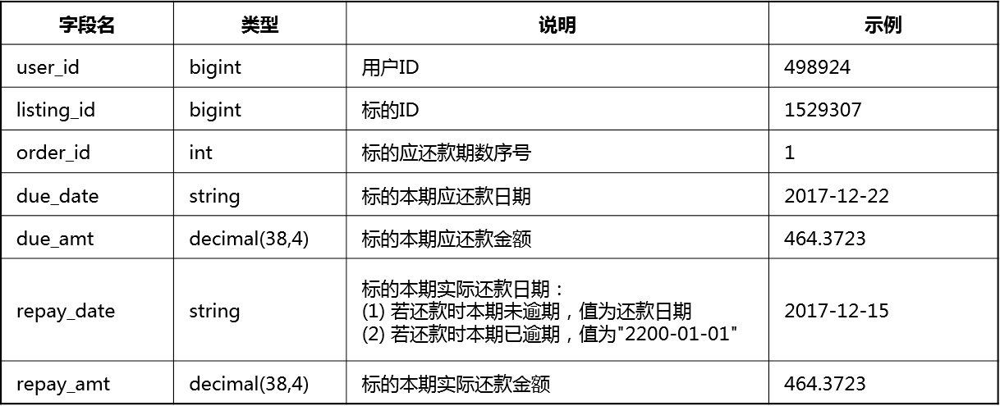

In [22]:
df1 = train.iloc[:, :5]

In [23]:
df1.head()

,user_id,listing_id,auditing_date,due_date,due_amt
0,748147,3163926,2018-04-25,2018-05-25,72.1167
1,672952,3698760,2018-06-09,2018-07-09,258.7045
2,404196,2355665,2018-02-18,2018-03-18,307.9270
3,342769,1994522,2018-01-13,2018-02-13,252.9809
4,828139,3602352,2018-06-01,2018-07-01,107.6503


In [24]:
df1 = pd.concat([df1, test], ignore_index=True)

In [25]:
train.shape

(1000000, 7)

In [26]:
test.shape

(130000, 5)

In [27]:
df1.shape

(1130000, 5)

In [28]:
df1.head()

,user_id,listing_id,auditing_date,due_date,due_amt
0,748147,3163926,2018-04-25,2018-05-25,72.1167
1,672952,3698760,2018-06-09,2018-07-09,258.7045
2,404196,2355665,2018-02-18,2018-03-18,307.9270
3,342769,1994522,2018-01-13,2018-02-13,252.9809
4,828139,3602352,2018-06-01,2018-07-01,107.6503


In [29]:
df1.drop_duplicates(['user_id', 'listing_id']).shape

(1130000, 5)

In [30]:
listing_info.shape

(5484891, 6)

In [31]:
cols = list(listing_info.columns)
cols.remove()

['user_id', 'listing_id', 'auditing_date', 'term', 'rate', 'principal']

In [33]:
df1 = pd.merge(df1, listing_info, how='left', on=['user_id', 'listing_id', 'auditing_date'])

In [39]:
df1.shape

(1130000, 8)

In [40]:
df1 = pd.merge(df1, user_info, how='left', on=['user_id'])

In [45]:
df1 = pd.merge(df1, user_taglist, how='left', on=['user_id'])

In [46]:
df1.shape

(1130000, 17)

In [47]:
df1.head()

,user_id,listing_id,auditing_date,due_date,due_amt,term,rate,principal,reg_mon,gender,age,cell_province,id_province,id_city,insertdate_x,taglist,insertdate_y
0,748147,3163926,2018-04-25,2018-05-25,72.1167,9,7.2,630,2017-12-01,男,21,c20,c20,c20089,2018-04-24,127|5539|5556|1749|1100|239|1803|1911|2519|351...,2018-11-12
1,672952,3698760,2018-06-09,2018-07-09,258.7045,9,7.2,2260,2017-09-01,男,37,c14,c17,c17250,2018-06-04,1421|3116|5145|5201|2785|1812|4671|3125|1058|2...,2018-06-04
2,404196,2355665,2018-02-18,2018-03-18,307.9270,9,7.2,2690,2017-02-01,男,24,c04,c04,c04251,2018-02-17,4617|436|1338|3871|1667|2828|4121|1478|1654|30...,2018-02-17
3,342769,1994522,2018-01-13,2018-02-13,252.9809,9,7.2,2210,2016-12-01,男,23,c17,c17,c17246,2018-01-12,1100|472|3422|3296|4949|4025|3328|974|4092|218...,2018-01-12
4,828139,3602352,2018-06-01,2018-07-01,107.6503,6,8.6,630,2018-04-01,男,23,c02,c17,c17096,2018-05-31,5784|3643|2017|3432|469|5151|1625|1753|2762|15...,2018-05-31


In [104]:
df1 = pd.merge(df1, a, how='left', left_on=['user_id'], right_index=True)

In [109]:
del a

In [106]:
df1.head()

,user_id,listing_id,auditing_date,due_date,due_amt,term,rate,principal,reg_mon,gender,age,cell_province,id_province,id_city,insertdate_x,taglist,insertdate_y,prob
0,748147,3163926,2018-04-25,2018-05-25,72.1167,9,7.2,630,2017-12-01,男,21,c20,c20,c20089,2018-04-24,127|5539|5556|1749|1100|239|1803|1911|2519|351...,2018-11-12,0.476190
1,672952,3698760,2018-06-09,2018-07-09,258.7045,9,7.2,2260,2017-09-01,男,37,c14,c17,c17250,2018-06-04,1421|3116|5145|5201|2785|1812|4671|3125|1058|2...,2018-06-04,0.636364
2,404196,2355665,2018-02-18,2018-03-18,307.9270,9,7.2,2690,2017-02-01,男,24,c04,c04,c04251,2018-02-17,4617|436|1338|3871|1667|2828|4121|1478|1654|30...,2018-02-17,0.904762
3,342769,1994522,2018-01-13,2018-02-13,252.9809,9,7.2,2210,2016-12-01,男,23,c17,c17,c17246,2018-01-12,1100|472|3422|3296|4949|4025|3328|974|4092|218...,2018-01-12,0.631579
4,828139,3602352,2018-06-01,2018-07-01,107.6503,6,8.6,630,2018-04-01,男,23,c02,c17,c17096,2018-05-31,5784|3643|2017|3432|469|5151|1625|1753|2762|15...,2018-05-31,0.500000


In [107]:
df1['prob'][df1['prob'].notnull()].shape

(1075974,)

In [108]:
df1.to_pickle('temp.pkl')